In [1]:
import os
import sys

#  Set the working directory to the folder containing the top-level ultralytics package
os.chdir("/workspace")  # change to your workspace root where ultralytics folder exists
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [43]:
!git clone https://github.com/danielsyahputra/yolo-distiller.git
%cd yolo-distiller


Cloning into 'yolo-distiller'...
remote: Enumerating objects: 760, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 760 (delta 0), reused 0 (delta 0), pack-reused 757 (from 3)
Receiving objects: 100% (760/760), 1.68 MiB | 1.97 MiB/s, done.
Resolving deltas: 100% (185/185), done.
Updating files: 100% (595/595), done.
/workspace/yolo-distiller


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [2]:
#  Add the top-level ultralytics folder to Python path
os.chdir("/workspace/yolo-distiller")
print("Current working directory:", os.getcwd())

Current working directory: /workspace/yolo-distiller


In [4]:
from ultralytics import YOLO

import ultralytics
print(ultralytics.__file__)


/workspace/yolo-distiller/ultralytics/__init__.py


In [5]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("bestv8nbase.pt")
model.info()


Model summary: 225 layers, 3,012,213 parameters, 0 gradients


(225, 3012213, 0, 0.0)

In [6]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("bestv8lbase.pt")
model.info()


Model summary: 365 layers, 43,635,237 parameters, 0 gradients


(365, 43635237, 0, 0.0)

In [3]:
import os
print(os.getcwd())


/workspace/yolo-distiller


In [8]:
from ultralytics import YOLO
import time
import torch

# === Device setup ===
device = "cuda:0" if torch.cuda.is_available() else "cpu"

# === Load teacher and student models ===
teacher_model = YOLO("bestv8lbase.pt")        # Teacher: already trained v8l with EIoU
student_model = YOLO("bestv8nbase.pt")        # Student: already trained v8n with EIoU

# === Training parameters ===
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
run_name = "yolov8nbase_noeiouloss_KD_hyperpat20try"  # Run name for saving logs and weights
epochs = 1
imgsz = 1280
batch_size = 32
workers = 2
patience = 20
save_interval = 50
amp = True

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    amp=amp,
    patience=patience,
    save_period=save_interval,
    optimizer="AdamW",
    lr0=0.001,
    weight_decay=1e-4,
    cos_lr=True,
    lrf=0.01,
    augment=True,
    name=run_name
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.204 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
engine/trainer: task=detect, mode=train, model=bestv8nbase.pt, data=/workspace/datasets/KITTI/kitti.yml, epochs=1, time=None, patience=20, batch=32, imgsz=1280, save=True, save_period=50, cache=False, device=cuda:0, workers=2, project=None, name=yolov8nbase_noeiouloss_KD_hyperpat20try, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=Fa

train: Scanning /workspace/datasets/KITTI/labels/train.cache... 5984 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5984/5984 [00:00<?, ?it/s]
val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]


Plotting labels to /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try
Starting training for 1 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.780738830566406. Dividing input by 255.
0: 640x640 (no detections), 25.6ms
Speed: 0.0ms preprocess, 25.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 20 Cars, 11.6ms
1: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.6ms
2: 1280x1280 9 Cars, 11.6ms
3: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.6ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.6ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.6ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.6ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.6ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.6ms
9: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.6ms
10: 1280x1280 2 Cars, 11.6ms
11: 1280x1280 3 Pedestrians, 11.6ms
12: 1280x1280 7 Cars, 11.6ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.6ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.6ms
15: 1280x1280 3 Cars, 1 Person_sitting, 11.6ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.6ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.6ms
18: 1280x1280 4 Cars, 2 Trucks, 2 Trams, 11.6ms
19: 1280x1280 10 Cars, 1 Van, 1 T

        1/1      28.3G     0.5416     0.3393     0.8516        339       1280:   1%|          | 1/187 [00:01<04:09,  1.34s/it]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 23 Cars, 7 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 14 Cars, 21 Pedestrians, 11.2ms
4: 1280x1280 8 Cars, 13 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 11.2ms
7: 1280x1280 10 Cars, 11.2ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
18: 1280x1280 4 Cars, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 16 Cars, 1 Van, 11.2ms
22: 1280x1280 9 Cars, 1 Truck, 11.2ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
24: 1280x1280 8 Cars, 11.2ms
25: 1280x1280 6 Ca

        1/1      28.3G     0.5347     0.3273     0.8497        367       1280:   1%|          | 2/187 [00:02<03:29,  1.13s/it]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 22 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 2 Cars, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 6 Cars, 4 Vans, 1 Person_sitting, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms
2

        1/1      28.3G      0.599      0.381     0.8652        270       1280:   2%|▏         | 3/187 [00:03<03:08,  1.02s/it]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 2 Trucks, 11.2ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 7 Pedestrians, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 27 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 11.2ms
12: 1280x1280 12 Cars, 1 Truck, 9 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1

        1/1      28.3G     0.6181     0.3998     0.8694        380       1280:   2%|▏         | 4/187 [00:04<02:57,  1.03it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
7: 1280x1280 (no detections), 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 3 Vans, 3 Pedestrian

        1/1      28.3G      0.628     0.4066     0.8723        320       1280:   3%|▎         | 5/187 [00:04<02:46,  1.09it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.2ms
5: 1280x1280 4 Cars, 1 Cyclist, 3 Trams, 11.2ms
6: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 7 Cars, 1 Truck, 11.2ms
8: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 11 Cars, 11 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Tram, 11.2ms
18: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedes

        1/1      28.3G     0.6323     0.4025     0.8737        360       1280:   3%|▎         | 6/187 [00:05<02:41,  1.12it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 2 Vans, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.2ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 25 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 11.2ms
22: 1280x1280

        1/1      28.3G     0.6307     0.4023     0.8755        348       1280:   4%|▎         | 7/187 [00:06<02:35,  1.15it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 11.2ms
21: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
22: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
23: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
24

        1/1      28.3G     0.6263     0.4013     0.8791        334       1280:   4%|▍         | 8/187 [00:07<02:33,  1.17it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 9 Cars, 10 Pedestrians, 3 Cyclists, 11.2ms
8: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 4 Trams, 11.2ms
11: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 27 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 11.2ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 2 Cars, 1 Tram, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 1 P

        1/1      28.3G     0.6226     0.3985     0.8787        391       1280:   5%|▍         | 9/187 [00:08<02:30,  1.19it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 11 Cars, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 12 Cars, 2 Vans, 11.2ms
9: 1280x1280 19 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 2 Trucks, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 12 Cars, 9 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 13 Cars, 11.2ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck,

        1/1      28.3G      0.627     0.4002     0.8787        415       1280:   5%|▌         | 10/187 [00:09<02:28,  1.19it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 3 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 18 Cars, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
14: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
16: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 1 Car, 6 Pedestrians, 11.2

        1/1      28.3G     0.6274     0.4002     0.8813        382       1280:   6%|▌         | 11/187 [00:09<02:26,  1.20it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 18 Cars, 3 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 2 Vans, 11.2ms
7: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
8: 1280x1280 5 Cars, 2 Trucks, 11.2ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
12: 1280x1280 3 Cars, 2 Vans, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms
2

        1/1      28.3G     0.6266     0.3992     0.8824        307       1280:   6%|▋         | 12/187 [00:10<02:24,  1.21it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 24 Cars, 1 Van, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Vans, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
9: 1280x1280 7 Cars, 3 Vans, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 8 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
22: 1280x1280 4 Cars, 11.2ms
23: 1280x1280 

        1/1      28.3G     0.6245     0.3986     0.8824        375       1280:   7%|▋         | 13/187 [00:11<02:22,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 14 Cars, 2 Vans, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.2ms
6: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Truck, 11.2ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.2ms
21: 1280x1280 6 Cars, 1 Truck, 1 C

        1/1      28.3G     0.6219     0.3963     0.8828        336       1280:   7%|▋         | 14/187 [00:12<02:21,  1.22it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 3 Cars, 11 Pedestrians, 11.2ms
2

        1/1      28.3G      0.622     0.3957     0.8841        320       1280:   8%|▊         | 15/187 [00:13<02:22,  1.21it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 2 Person_sittings, 11.2ms
1: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
5: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.2ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1

        1/1      28.3G      0.623     0.3958     0.8842        331       1280:   9%|▊         | 16/187 [00:13<02:20,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 6 Pedestrians, 11.2ms
20: 1280x1280 6 Cars, 

        1/1      28.3G     0.6241     0.3968     0.8846        335       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 1 Car, 11.2ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
8: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
17: 1280x1280 9 Cars, 4 Vans, 8 Pede

        1/1      28.3G     0.6237     0.3976     0.8844        437       1280:  10%|▉         | 18/187 [00:15<02:18,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 17 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 14 Cars, 3 Vans, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 11.2ms
13: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 1 Car, 1 Van, 3 Trucks, 6 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 9 Pedestrians, 5 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1

        1/1      28.3G     0.6235     0.3983     0.8834        335       1280:  10%|█         | 19/187 [00:16<02:17,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3m

        1/1      28.3G     0.6209     0.3976     0.8835        328       1280:  11%|█         | 20/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 12 Cars, 2 Vans, 11.2ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 2 Vans, 11.2ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 11.2ms
20: 128

        1/1      28.3G     0.6224     0.3976     0.8838        420       1280:  11%|█         | 21/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.2ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 11.2ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 11.2ms
10: 1280x1280 13 Cars, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.2ms
18: 1280x1280 10 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 11.2ms
23: 1280x1280 11 Cars, 2

        1/1      28.3G     0.6195     0.3957     0.8833        301       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 11.2ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 11.2ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
23: 1280x1280 6 

        1/1      28.3G     0.6175     0.3952     0.8833        347       1280:  12%|█▏        | 23/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian,

        1/1      28.3G     0.6163     0.3945     0.8827        379       1280:  13%|█▎        | 24/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 

        1/1      28.3G     0.6173     0.3937     0.8825        284       1280:  13%|█▎        | 25/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 11.2ms
4: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 4 Vans, 11.2ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 12 Cars, 2 Vans, 11.2ms
11: 1280x1280 13 Cars, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 1 Truck, 11.2ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cycli

        1/1      28.3G     0.6165     0.3924     0.8824        341       1280:  14%|█▍        | 26/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 

        1/1      28.3G     0.6164     0.3928     0.8822        325       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 11.2ms
2: 1280x1280 8 Cars, 11.2ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 24 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 5 Vans, 4 Pedestrians, 11.2ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 21 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Pedestrian

        1/1      28.3G      0.616     0.3926     0.8816        373       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 19 Cars, 5 Vans, 11.2ms
4: 1280x1280 5 Cars, 1 Tram, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.2ms
12: 1280x1280 24 Cars, 2 Vans, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 14 Cars, 11.2ms
16: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 1 Truck, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1

        1/1      28.3G     0.6168     0.3926     0.8808        367       1280:  16%|█▌        | 29/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 11.2ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 3 Cars, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.2ms
23: 1280x1280 21 Cars, 2 Vans, 11.2ms
24: 1280x1280 11

        1/1      28.3G     0.6162      0.392     0.8807        337       1280:  16%|█▌        | 30/187 [00:25<02:08,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 15 Cars, 1 Van, 11.2ms
5: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.2ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 3 Pedestrians, 11.2ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 2 Vans, 11.2ms
12: 1280x1280 4 Cars, 1 Tram, 11.2ms
13: 1280x1280 10 Cars, 2 Trucks, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 22 Pedestrians, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 1

        1/1      28.3G     0.6177     0.3924     0.8807        319       1280:  17%|█▋        | 31/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 29 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 23 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 17 Cars, 1 Van, 11.2ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Truck, 11.2ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.2ms
22: 1280x1280 2 Ca

        1/1      28.3G     0.6161     0.3914     0.8802        392       1280:  17%|█▋        | 32/187 [00:27<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
1: 1280x1280 16 Cars, 4 Vans, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
4: 1280x1280 14 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 22 Cars, 5 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 4 Cars, 1 Truck, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 11.2ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.2ms
20: 1280x1280 19 Car

        1/1      28.3G     0.6168     0.3917     0.8801        420       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Pedestr

        1/1      28.3G     0.6152     0.3909     0.8798        367       1280:  18%|█▊        | 34/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
5: 1280x1280 23 Cars, 1 Van, 11.2ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.2ms
8: 1280x1280 10 Cars, 1 Truck, 11.2ms
9: 1280x1280 8 Cars, 1 Truck, 11.2ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x

        1/1      28.3G     0.6129     0.3895     0.8794        366       1280:  19%|█▊        | 35/187 [00:29<02:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
21: 1

        1/1      28.3G     0.6126     0.3895     0.8794        386       1280:  19%|█▉        | 36/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 23 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.3ms
2: 1280x1280 8 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 

        1/1      28.3G     0.6126     0.3889     0.8796        385       1280:  20%|█▉        | 37/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 12 Cars, 3 Vans, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 11 Cars, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 15 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Pedestrians, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
21: 1280x1280 3 Cars, 2 Vans, 11.2ms
22: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.2ms
23: 1280x1280 9 Cars, 2 V

        1/1      28.3G     0.6127     0.3894     0.8796        362       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.2ms
2: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trams, 11.2ms
9: 1280x1280 4 Pedestrians, 11.2ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 1

        1/1      28.3G     0.6116     0.3885     0.8794        294       1280:  21%|██        | 39/187 [00:32<02:00,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.2ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 11.2ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
11: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.2ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 1 Pedestrian, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 11.2ms
20: 1280x1280 4 Cars, 11.2

        1/1      28.3G      0.611     0.3881      0.879        405       1280:  21%|██▏       | 40/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
1: 1280x1280 14 Cars, 3 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.2ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 11.2ms
8: 1280x1280 13 Cars, 1 Truck, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Trams, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 4 Cars, 2 Pedestrians,

        1/1      28.3G       0.61     0.3877     0.8787        380       1280:  22%|██▏       | 41/187 [00:34<01:59,  1.23it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 1 Car, 1 Truck, 11.2ms
7: 1280x1280 14 Cars, 2 Vans, 11.2ms
8: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.2ms
21: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
22: 1280x1280 6 Cars, 1 Truck, 11.2ms
23: 1280x1280 13 Cars, 7 Van

        1/1      28.3G     0.6102     0.3878     0.8786        306       1280:  22%|██▏       | 42/187 [00:35<01:58,  1.23it/s]


0: 1280x1280 6 Cars, 1 Person_sitting, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 16 Cars, 2 Vans, 11.2ms
7: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 14 Cars, 4 Vans, 11.2ms
10: 1280x1280 (no detections), 11.2ms
11: 1280x1280 1 Car, 1 Tram, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 1 Tram, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Trams, 11.2ms
18: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.2ms
20: 1280x1280 7 Cars, 2 Trucks, 11.2ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280

        1/1      28.3G     0.6098     0.3872     0.8787        346       1280:  23%|██▎       | 43/187 [00:36<01:57,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.2ms
1: 1280x1280 19 Cars, 1 Van, 11.2ms
2: 1280x1280 16 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 21 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
4: 1280x1280 2 Pedestrians, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 6 Cars, 1 Van, 11.2ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.2ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 3 Cars, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 2 Vans, 

        1/1      28.3G     0.6097     0.3872     0.8789        337       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars

        1/1      28.3G     0.6088     0.3865     0.8789        343       1280:  24%|██▍       | 45/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 19 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.2ms
17: 1280x1280 9 Cars, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 11.2ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1280 19 Cars, 1 Van, 11.2ms
22: 1

        1/1      28.3G     0.6081     0.3861     0.8787        359       1280:  25%|██▍       | 46/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2

        1/1      28.3G     0.6085     0.3861     0.8786        387       1280:  25%|██▌       | 47/187 [00:39<01:54,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 2 Trams, 11.2ms
2: 1280x1280 2 Trams, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 14 Cars, 1 Van, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 4 Vans, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 4 Pedestrians, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.2ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11.2ms
22: 1280x1

        1/1      28.3G     0.6081     0.3853     0.8783        339       1280:  26%|██▌       | 48/187 [00:40<01:54,  1.21it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 5 

        1/1      28.3G     0.6073     0.3847     0.8781        291       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 8 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 

        1/1      28.3G     0.6065      0.384     0.8779        401       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 1

        1/1      28.3G     0.6059     0.3836     0.8778        441       1280:  27%|██▋       | 51/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 11.2ms
3: 1280x1280 8 Cars, 4 Vans, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.2ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 13 Cars, 11.2ms
13: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 11.2ms
15: 1280x1280 7 Cars, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.2ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 16 Cars, 4 Pedestrians, 7 Cyclists,

        1/1      28.3G     0.6053     0.3832     0.8776        347       1280:  28%|██▊       | 52/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.2ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
2: 1280x1280 9 Cars, 3 Cyclists, 11.2ms
3: 1280x1280 11 Cars, 3 Trams, 11.2ms
4: 1280x1280 2 Cars, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 5 Trams, 11.2ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 16 Cars, 11.2ms
9: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 6 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 7 Cars, 11 Pedestrians, 11.2ms
19: 1280x1280 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck

        1/1      28.3G     0.6061     0.3838     0.8783        350       1280:  28%|██▊       | 53/187 [00:44<01:49,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Pedes

        1/1      28.3G     0.6057     0.3832     0.8783        331       1280:  29%|██▉       | 54/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 

        1/1      28.3G     0.6051     0.3829     0.8783        300       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20:

        1/1      28.3G     0.6048     0.3828     0.8781        400       1280:  30%|██▉       | 56/187 [00:46<01:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 26 Cars, 1 Truck, 11.3ms
21: 1280x1280

        1/1      28.3G      0.604     0.3824     0.8779        328       1280:  30%|███       | 57/187 [00:47<01:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 4 Pedestrians, 11.2ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 10 Cars, 1 Truck, 11.2ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.2ms
5: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 13 Cars, 3 Vans, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 10 Cars, 1 Tram, 11.2ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 8 Cars, 1 Truck, 11.2ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 7 Cars, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 13 Cars, 11.2ms
17: 1280x1280 1 Pedestrian, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 3 Cars, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 1 Truck, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 11.2ms
23: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists

        1/1      28.3G     0.6037     0.3821     0.8779        356       1280:  31%|███       | 58/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3m

        1/1      28.3G     0.6032     0.3817     0.8781        293       1280:  32%|███▏      | 59/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 5 Cars, 2 Vans, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 8 Trams, 11.2ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 11.2ms
11: 1280x1280 10 Cars, 7 Vans, 11.2ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 12 Cars, 7 Pedestrians, 6 Cyclists, 11.2ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
21

        1/1      28.3G     0.6027     0.3813     0.8778        405       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11

        1/1      28.3G      0.603     0.3812     0.8779        409       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Trucks, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 11.2ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 11.2ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
10: 1280x1280 10 Cars, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.2ms
19: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 8 Cars, 11.2ms
22: 1280x1280 16 Cars, 11.2ms
23: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedest

        1/1      28.3G     0.6025     0.3808     0.8777        317       1280:  33%|███▎      | 62/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 15 Cars, 14 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.2ms
3: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.2ms
5: 1280x1280 1 Car, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 11.2ms
8: 1280x1280 10 Cars, 11 Pedestrians, 11.2ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 12 Cars, 11.2ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.2ms
14: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 3 Cars, 2 Vans, 11.2ms
21: 1280x1280 12 Cars, 2

        1/1      28.3G     0.6026     0.3806     0.8779        384       1280:  34%|███▎      | 63/187 [00:52<01:41,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 14 Cars, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 16 Cars, 2 Cyclists, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 10 Cars, 2 Vans, 11.2ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 13 Cars, 1 Truck, 11.2ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars,

        1/1      28.3G     0.6022     0.3805      0.878        315       1280:  34%|███▍      | 64/187 [00:53<01:40,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 11.2ms
4: 1280x1280 24 Cars, 1 Van, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 11.2ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 25 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 13 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 11 Cars, 3 Trucks, 1 Tram, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.2ms
21: 1280x1280 1 Car, 1 Van, 11.2ms
22: 1280x1280 

        1/1      28.3G     0.6026     0.3805      0.878        382       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 9 Cars, 11.2ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.2ms
8: 1280x1280 10 Cars, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 11 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 11.2ms
20: 1280x1280 15 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 7 Ped

        1/1      28.3G     0.6024     0.3806     0.8779        316       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.2ms
1: 1280x1280 10 Cars, 1 Van, 11.2ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 12 Cars, 11.2ms
6: 1280x1280 3 Vans, 11.2ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.2ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Tram, 11.2ms
15: 1280x1280 6 Cars, 11.2ms
16: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 22 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
22: 1280x12

        1/1      28.3G     0.6022     0.3805     0.8777        355       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 27 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 22 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
22: 1280x12

        1/1      28.3G     0.6016     0.3803     0.8777        416       1280:  36%|███▋      | 68/187 [00:56<01:37,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 11.2ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 4 Cars, 2 Trams, 11.2ms
5: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 1 Car, 1 Tram, 11.2ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 6 Cars, 2 Vans, 11.2ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.2ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
22: 1280x1280 4 Car

        1/1      28.3G     0.6011     0.3803     0.8776        313       1280:  37%|███▋      | 69/187 [00:57<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.2ms
8: 1280x1280 6 Cars, 11.2ms
9: 1280x1280 22 Cars, 4 Vans, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 1 Truck, 11.2ms
17: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 12 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.2ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
23: 1280x1280 6 Cars, 2 Pedestrians, 

        1/1      28.3G     0.6004       0.38     0.8776        303       1280:  37%|███▋      | 70/187 [00:58<01:35,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 5 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.2ms
4: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
6: 1280x1280 11 Cars, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
9: 1280x1280 9 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 30 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
17: 1280x1280 (no detections), 11.2ms
18: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 3 Cars, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
22: 1280x1280 5 Cars, 2 

        1/1      28.3G     0.6008     0.3802     0.8775        311       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 2 Cars

        1/1      28.3G     0.6005     0.3802     0.8773        375       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 12 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 8 Cars,

        1/1      28.3G     0.6005     0.3803     0.8776        331       1280:  39%|███▉      | 73/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Truck

        1/1      28.3G     0.6003     0.3802     0.8777        339       1280:  40%|███▉      | 74/187 [01:01<01:32,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 (no detections), 11.2ms
4: 1280x1280 4 Cars, 7 Pedestrians, 11.2ms
5: 1280x1280 1 Cyclist, 11.2ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 11.2ms
13: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 9 Cars, 5 Pedestrians, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 11.2ms
21: 1280x1280 2 Cars, 6 Pedestrians, 

        1/1      28.3G     0.6003     0.3805     0.8778        296       1280:  40%|████      | 75/187 [01:02<01:31,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 5 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1

        1/1      28.3G     0.6003     0.3806     0.8777        404       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Pedestrians, 3 Cyclist

        1/1      28.3G     0.6006     0.3805     0.8775        374       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 22 Cars, 3 Vans, 14 Pedestrians, 11.2ms
3: 1280x1280 9 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 10 Cars, 11.2ms
10: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 11 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 11 Cars, 1 Truck, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 14 Cars, 2 Trucks, 11.2ms
21: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
22: 1280x1280 13 Cars, 1 Truck, 11.2ms
23: 1280x1280 10 Cars,

        1/1      28.3G     0.6006     0.3804     0.8775        330       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 4 Perso

        1/1      28.3G     0.6002     0.3804     0.8775        354       1280:  42%|████▏     | 79/187 [01:05<01:28,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1

        1/1      28.3G     0.5996     0.3802     0.8775        321       1280:  43%|████▎     | 80/187 [01:06<01:27,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 28 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 

        1/1      28.3G     0.5997     0.3802     0.8774        400       1280:  43%|████▎     | 81/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 8 Cars, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Tr

        1/1      28.3G     0.5991     0.3798     0.8775        318       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 2 Cars, 13 Pedes

        1/1      28.3G     0.5984     0.3796     0.8774        319       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 37 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 12

        1/1      28.3G     0.5984     0.3793     0.8774        331       1280:  45%|████▍     | 84/187 [01:09<01:24,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 

        1/1      28.3G     0.5988     0.3795     0.8774        382       1280:  45%|████▌     | 85/187 [01:10<01:23,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1

        1/1      28.3G     0.5981     0.3793     0.8773        355       1280:  46%|████▌     | 86/187 [01:11<01:22,  1.22it/s]


0: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truc

        1/1      28.3G     0.5981     0.3795     0.8774        373       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 24 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 

        1/1      28.3G     0.5983     0.3795     0.8773        437       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
20: 1280x128

        1/1      28.3G     0.5985     0.3796     0.8775        401       1280:  48%|████▊     | 89/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van

        1/1      28.3G     0.5987     0.3798     0.8776        336       1280:  48%|████▊     | 90/187 [01:14<01:19,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 5 Pe

        1/1      28.3G      0.599     0.3801     0.8778        392       1280:  49%|████▊     | 91/187 [01:15<01:18,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 14 C

        1/1      28.3G     0.5988     0.3801     0.8777        294       1280:  49%|████▉     | 92/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedes

        1/1      28.3G     0.5991       0.38     0.8781        408       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.2ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
4: 1280x1280 18 Cars, 1 Van, 11.2ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.2ms
10: 1280x1280 10 Cars, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 11.2ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 21 Cars, 3 Vans, 11.2ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 7 Cars, 1 Truck, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 32 Cars, 3 Vans

        1/1      28.3G     0.5987     0.3796     0.8778        376       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pe

        1/1      28.3G     0.5985     0.3795     0.8778        356       1280:  51%|█████     | 95/187 [01:18<01:15,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 14 Cars, 1 Truck, 11.2ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.2ms
6: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.2ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x1280 19 Car

        1/1      28.3G     0.5985     0.3794     0.8778        359       1280:  51%|█████▏    | 96/187 [01:19<01:14,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 32 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 30 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestria

        1/1      28.3G     0.5986     0.3794     0.8778        345       1280:  52%|█████▏    | 97/187 [01:20<01:13,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 11.3ms


        1/1      28.3G     0.5994     0.3798     0.8778        321       1280:  52%|█████▏    | 98/187 [01:20<01:13,  1.21it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 17 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 

        1/1      28.3G     0.5993     0.3797     0.8777        333       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x

        1/1      28.3G     0.5991     0.3798     0.8777        389       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 18 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 33 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrian

        1/1      28.3G     0.5992     0.3799     0.8779        372       1280:  54%|█████▍    | 101/187 [01:23<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3m

        1/1      28.3G     0.5993     0.3799      0.878        318       1280:  55%|█████▍    | 102/187 [01:24<01:09,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 16 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x128

        1/1      28.3G     0.5994       0.38      0.878        385       1280:  55%|█████▌    | 103/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 4 Trucks, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 5 Pedestrians, 1 Cycli

        1/1      28.3G     0.5991     0.3799     0.8778        378       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 1 Truck

        1/1      28.3G     0.5993     0.3801      0.878        407       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3m

        1/1      28.3G     0.5995     0.3802     0.8782        327       1280:  57%|█████▋    | 106/187 [01:27<01:06,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 12 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 

        1/1      28.3G     0.5999     0.3804     0.8783        328       1280:  57%|█████▋    | 107/187 [01:28<01:05,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x

        1/1      28.3G     0.6002     0.3804     0.8784        343       1280:  58%|█████▊    | 108/187 [01:29<01:04,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 C

        1/1      28.3G     0.6002     0.3803     0.8784        411       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 4 Cars,

        1/1      28.3G     0.5996       0.38     0.8785        269       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian

        1/1      28.3G     0.5999     0.3801     0.8786        277       1280:  59%|█████▉    | 111/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 30 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 (n

        1/1      28.3G     0.6003     0.3801     0.8785        406       1280:  60%|█████▉    | 112/187 [01:32<01:01,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 (no dete

        1/1      28.3G     0.6002     0.3799     0.8786        300       1280:  60%|██████    | 113/187 [01:33<01:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 

        1/1      28.3G     0.5998     0.3797     0.8785        308       1280:  61%|██████    | 114/187 [01:34<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 12

        1/1      28.3G     0.5995     0.3797     0.8785        288       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 31 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Truck

        1/1      28.3G     0.5992     0.3796     0.8783        395       1280:  62%|██████▏   | 116/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20:

        1/1      28.3G     0.5993     0.3796     0.8784        374       1280:  63%|██████▎   | 117/187 [01:36<00:57,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3

        1/1      28.3G     0.5986     0.3793     0.8782        319       1280:  63%|██████▎   | 118/187 [01:37<00:56,  1.23it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 12

        1/1      28.3G     0.5982     0.3791      0.878        260       1280:  64%|██████▎   | 119/187 [01:38<00:55,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Van

        1/1      28.3G      0.598     0.3789      0.878        386       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks

        1/1      28.3G     0.5981      0.379      0.878        376       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
25:

        1/1      28.3G     0.5978     0.3789     0.8782        286       1280:  65%|██████▌   | 122/187 [01:40<00:53,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 T

        1/1      28.3G     0.5976     0.3787     0.8781        375       1280:  66%|██████▌   | 123/187 [01:41<00:52,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 29 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 

        1/1      28.3G     0.5974     0.3784     0.8781        373       1280:  66%|██████▋   | 124/187 [01:42<00:51,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 6 Pedestri

        1/1      28.3G     0.5971     0.3783     0.8779        319       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trams, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
2

        1/1      28.3G     0.5967     0.3782     0.8778        349       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 C

        1/1      28.3G     0.5962     0.3778     0.8776        305       1280:  68%|██████▊   | 127/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x12

        1/1      28.3G     0.5959     0.3777     0.8776        290       1280:  68%|██████▊   | 128/187 [01:45<00:48,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

        1/1      28.3G     0.5958     0.3777     0.8776        294       1280:  69%|██████▉   | 129/187 [01:46<00:47,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 28 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 1 Tram

        1/1      28.3G     0.5957     0.3776     0.8775        278       1280:  70%|██████▉   | 130/187 [01:47<00:46,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 1 Truck, 2 Cyclists

        1/1      28.3G     0.5957     0.3774     0.8777        365       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pe

        1/1      28.3G     0.5957     0.3774     0.8778        344       1280:  71%|███████   | 132/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 

        1/1      28.3G     0.5954     0.3772     0.8776        330       1280:  71%|███████   | 133/187 [01:49<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 6 Vans, 4 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian

        1/1      28.3G      0.595     0.3769     0.8776        362       1280:  72%|███████▏  | 134/187 [01:50<00:43,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 C

        1/1      28.3G     0.5949     0.3769     0.8777        388       1280:  72%|███████▏  | 135/187 [01:51<00:42,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Ca

        1/1      28.3G     0.5946     0.3767     0.8777        371       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 32 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 

        1/1      28.3G     0.5947     0.3768     0.8778        382       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Person

        1/1      28.3G     0.5948     0.3769     0.8778        276       1280:  74%|███████▍  | 138/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 32 Cars, 2 Van

        1/1      28.3G     0.5946     0.3768     0.8777        358       1280:  74%|███████▍  | 139/187 [01:54<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

        1/1      28.3G     0.5945     0.3767     0.8776        369       1280:  75%|███████▍  | 140/187 [01:55<00:38,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1

        1/1      28.3G     0.5941     0.3767     0.8775        341       1280:  75%|███████▌  | 141/187 [01:56<00:37,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 4 Trams, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 C

        1/1      28.3G     0.5941     0.3766     0.8776        305       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 2 

        1/1      28.3G     0.5939     0.3764     0.8776        272       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Ca

        1/1      28.3G     0.5937     0.3764     0.8774        356       1280:  77%|███████▋  | 144/187 [01:58<00:35,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 2 

        1/1      28.3G     0.5937     0.3765     0.8775        313       1280:  78%|███████▊  | 145/187 [01:59<00:34,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 33 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 

        1/1      28.3G     0.5936     0.3765     0.8776        399       1280:  78%|███████▊  | 146/187 [02:00<00:33,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 

        1/1      28.3G     0.5931     0.3764     0.8775        265       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x128

        1/1      28.3G     0.5931     0.3764     0.8775        357       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1

        1/1      28.3G     0.5928     0.3762     0.8774        320       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Pedest

        1/1      28.3G     0.5928     0.3763     0.8774        358       1280:  80%|████████  | 150/187 [02:03<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 4 Vans, 3 Pedestrians, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 11.2ms
8: 1280x1280 3 Pedestrians, 11.2ms
9: 1280x1280 4 Cars, 1 Truck, 11.2ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 15 Cars, 2 Vans, 11.2ms
12: 1280x1280 11 Cars, 2 Vans, 16 Pedestrians, 11.2ms
13: 1280x1280 5 Cars, 1 Truck, 11.2ms
14: 1280x1280 23 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 1 Car, 1 Van

        1/1      28.3G     0.5929     0.3763     0.8775        358       1280:  81%|████████  | 151/187 [02:04<00:29,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 4

        1/1      28.3G     0.5931     0.3764     0.8775        406       1280:  81%|████████▏ | 152/187 [02:05<00:28,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 29 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x

        1/1      28.3G     0.5934     0.3766     0.8777        359       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 4 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

        1/1      28.3G     0.5936     0.3767     0.8776        434       1280:  82%|████████▏ | 154/187 [02:06<00:27,  1.22it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.2ms
6: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 11.2ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 11.2ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 8 Cars, 2 Vans, 11.2ms
20: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Tr

        1/1      28.3G     0.5936     0.3768     0.8778        402       1280:  83%|████████▎ | 155/187 [02:07<00:26,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms


        1/1      28.3G     0.5935     0.3767     0.8777        322       1280:  83%|████████▎ | 156/187 [02:08<00:25,  1.22it/s]


0: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 8 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1

        1/1      28.3G     0.5936     0.3769     0.8777        354       1280:  84%|████████▍ | 157/187 [02:09<00:24,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Car

        1/1      28.3G     0.5936      0.377     0.8775        356       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 4 Pedestria

        1/1      28.3G     0.5936      0.377     0.8775        377       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 12 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 30 Cars, 1 Van, 2 Trucks, 1 Pedestrian,

        1/1      28.3G     0.5936     0.3771     0.8774        442       1280:  86%|████████▌ | 160/187 [02:11<00:22,  1.22it/s]


0: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 

        1/1      28.3G     0.5937     0.3771     0.8775        346       1280:  86%|████████▌ | 161/187 [02:12<00:21,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 33 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x

        1/1      28.3G     0.5936     0.3769     0.8774        391       1280:  87%|████████▋ | 162/187 [02:13<00:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 5 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 5 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van

        1/1      28.3G     0.5937      0.377     0.8774        351       1280:  87%|████████▋ | 163/187 [02:14<00:19,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1

        1/1      28.3G     0.5938     0.3772     0.8773        281       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 15 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 5 Trams, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 14 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 19 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 128

        1/1      28.3G     0.5939     0.3773     0.8773        435       1280:  88%|████████▊ | 165/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tra

        1/1      28.3G      0.594     0.3772     0.8773        405       1280:  89%|████████▉ | 166/187 [02:16<00:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11

        1/1      28.3G     0.5939     0.3771     0.8772        393       1280:  89%|████████▉ | 167/187 [02:17<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 T

        1/1      28.3G     0.5943     0.3772     0.8774        321       1280:  90%|████████▉ | 168/187 [02:18<00:15,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 C

        1/1      28.3G     0.5944     0.3773     0.8774        399       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 3 

        1/1      28.3G     0.5943     0.3772     0.8773        326       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Person_sitt

        1/1      28.3G     0.5941     0.3771     0.8773        326       1280:  91%|█████████▏| 171/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3

        1/1      28.3G      0.594      0.377     0.8773        298       1280:  92%|█████████▏| 172/187 [02:21<00:12,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1

        1/1      28.3G      0.594     0.3769     0.8772        320       1280:  93%|█████████▎| 173/187 [02:22<00:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 

        1/1      28.3G      0.594     0.3769     0.8772        342       1280:  93%|█████████▎| 174/187 [02:23<00:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 6 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
21:

        1/1      28.3G      0.594     0.3769     0.8771        353       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 27 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars,

        1/1      28.3G     0.5939     0.3769     0.8771        363       1280:  94%|█████████▍| 176/187 [02:24<00:09,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 36 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 5 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestri

        1/1      28.3G      0.594     0.3769     0.8772        423       1280:  95%|█████████▍| 177/187 [02:25<00:08,  1.22it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars,

        1/1      28.3G     0.5939     0.3768     0.8771        285       1280:  95%|█████████▌| 178/187 [02:26<00:07,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
23: 1280

        1/1      28.3G     0.5939     0.3768     0.8772        330       1280:  96%|█████████▌| 179/187 [02:27<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 25 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280

        1/1      28.3G      0.594     0.3769     0.8773        373       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 12

        1/1      28.3G     0.5939     0.3769     0.8773        375       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8

        1/1      28.3G     0.5937     0.3768     0.8771        331       1280:  97%|█████████▋| 182/187 [02:29<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 18 Cars, 1 Van, 5 Trams, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Tru

        1/1      28.3G     0.5938      0.377     0.8772        375       1280:  98%|█████████▊| 183/187 [02:30<00:03,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.

        1/1      28.3G     0.5938     0.3769     0.8771        317       1280:  98%|█████████▊| 184/187 [02:31<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x12

        1/1      28.3G     0.5936     0.3768     0.8772        252       1280:  99%|█████████▉| 185/187 [02:32<00:01,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 P

        1/1      28.3G     0.5936     0.3767     0.8772        265       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Truck

        1/1      28.3G     0.5938      0.377     0.8774        360       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.37it/s]


                   all       1497       7772      0.888      0.845      0.887      0.666

1 epochs completed in 0.046 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try/weights/last.pt, 6.3MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try/weights/best.pt, 6.3MB

Validating /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.15it/s]


                   all       1497       7772      0.902      0.852      0.906      0.684
                   Car       1333       5680      0.953      0.941      0.976      0.816
                   Van        425        563      0.939      0.929      0.969      0.801
                 Truck        190        198      0.948      0.914      0.954      0.812
            Pedestrian        357        896      0.871      0.785      0.866      0.515
        Person_sitting         13         30      0.803      0.733      0.753      0.469
               Cyclist        222        306      0.906      0.791      0.899      0.642
                  Tram         76         99      0.896      0.872      0.922      0.736
Speed: 0.1ms preprocess, 1.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20try

KD Training completed in 0.05 hours


In [ ]:
from ultralytics import YOLO
import time
import torch

# === Device setup ===
device = "cuda:0" if torch.cuda.is_available() else "cpu"

# === Load teacher and student models ===
teacher_model = YOLO("bestv8lbase.pt")        # Teacher: already trained v8l with EIoU
student_model = YOLO("bestv8nbase.pt")        # Student: already trained v8n with EIoU

# === Training parameters ===
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
run_name = "yolov8nbase_noeiouloss_KD_hyperpat20"  # Run name for saving logs and weights
epochs = 250
imgsz = 1280
batch_size = 32
workers = 2
patience = 20
save_interval = 50
amp = True

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    amp=amp,
    patience=patience,
    save_period=save_interval,
    optimizer="AdamW",
    lr0=0.001,
    weight_decay=1e-4,
    cos_lr=True,
    lrf=0.01,
    augment=True,
    name=run_name
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.204 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
engine/trainer: task=detect, mode=train, model=bestv8nbase.pt, data=/workspace/datasets/KITTI/kitti.yml, epochs=250, time=None, patience=20, batch=32, imgsz=1280, save=True, save_period=50, cache=False, device=cuda:0, workers=2, project=None, name=yolov8nbase_noeiouloss_KD_hyperpat20, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=Fal

train: Scanning /workspace/datasets/KITTI/labels/train.cache... 5984 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5984/5984 [00:00<?, ?it/s]
val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]


Plotting labels to /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20
Starting training for 250 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.780738830566406. Dividing input by 255.
0: 640x640 (no detections), 9.0ms
Speed: 0.0ms preprocess, 9.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 20 Cars, 11.5ms
1: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.5ms
2: 1280x1280 9 Cars, 11.5ms
3: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.5ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.5ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.5ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.5ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.5ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.5ms
9: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.5ms
10: 1280x1280 2 Cars, 11.5ms
11: 1280x1280 3 Pedestrians, 11.5ms
12: 1280x1280 7 Cars, 11.5ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.5ms
15: 1280x1280 3 Cars, 1 Person_sitting, 11.5ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.5ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
18: 1280x1280 4 Cars, 2 Trucks, 2 Trams, 11.5ms
19: 1280x1280 10 Cars, 1 Van, 1 T

      1/250        28G     0.5416     0.3393     0.8516        339       1280:   1%|          | 1/187 [00:00<02:34,  1.20it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 23 Cars, 7 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 14 Cars, 21 Pedestrians, 11.2ms
4: 1280x1280 8 Cars, 13 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 11.2ms
7: 1280x1280 10 Cars, 11.2ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
18: 1280x1280 4 Cars, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 16 Cars, 1 Van, 11.2ms
22: 1280x1280 9 Cars, 1 Truck, 11.2ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
24: 1280x1280 8 Cars, 11.2ms
25: 1280x1280 6 Ca

      1/250        28G     0.5347     0.3273     0.8497        367       1280:   1%|          | 2/187 [00:01<02:43,  1.13it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 22 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 2 Cars, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 6 Cars, 4 Vans, 1 Person_sitting, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms
2

      1/250        28G      0.599      0.381     0.8652        270       1280:   2%|▏         | 3/187 [00:02<02:42,  1.13it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 2 Trucks, 11.2ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 7 Pedestrians, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 27 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 11.2ms
12: 1280x1280 12 Cars, 1 Truck, 9 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1

      1/250        28G     0.6181     0.3998     0.8694        380       1280:   2%|▏         | 4/187 [00:03<02:42,  1.12it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
7: 1280x1280 (no detections), 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 3 Vans, 3 Pedestrian

      1/250        28G      0.628     0.4066     0.8723        320       1280:   3%|▎         | 5/187 [00:04<02:37,  1.16it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.2ms
5: 1280x1280 4 Cars, 1 Cyclist, 3 Trams, 11.2ms
6: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 7 Cars, 1 Truck, 11.2ms
8: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 11 Cars, 11 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Tram, 11.2ms
18: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedes

      1/250        28G     0.6323     0.4025     0.8737        360       1280:   3%|▎         | 6/187 [00:05<02:34,  1.17it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 2 Vans, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.2ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 25 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 11.2ms
22: 1280x1280

      1/250        28G     0.6307     0.4023     0.8755        348       1280:   4%|▎         | 7/187 [00:06<02:31,  1.19it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 11.2ms
21: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
22: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
23: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
24

      1/250        28G     0.6263     0.4013     0.8791        334       1280:   4%|▍         | 8/187 [00:06<02:29,  1.20it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 9 Cars, 10 Pedestrians, 3 Cyclists, 11.2ms
8: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 4 Trams, 11.2ms
11: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 27 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 11.2ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 2 Cars, 1 Tram, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 1 P

      1/250        28G     0.6226     0.3985     0.8787        391       1280:   5%|▍         | 9/187 [00:07<02:28,  1.20it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 11 Cars, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 12 Cars, 2 Vans, 11.2ms
9: 1280x1280 19 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 2 Trucks, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 12 Cars, 9 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 13 Cars, 11.2ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck,

      1/250        28G      0.627     0.4002     0.8787        415       1280:   5%|▌         | 10/187 [00:08<02:27,  1.20it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 3 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 18 Cars, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
14: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
16: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 1 Car, 6 Pedestrians, 11.2

      1/250        28G     0.6274     0.4002     0.8813        382       1280:   6%|▌         | 11/187 [00:09<02:25,  1.21it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 18 Cars, 3 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 2 Vans, 11.2ms
7: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
8: 1280x1280 5 Cars, 2 Trucks, 11.2ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
12: 1280x1280 3 Cars, 2 Vans, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms
2

      1/250        28G     0.6266     0.3992     0.8824        307       1280:   6%|▋         | 12/187 [00:10<02:25,  1.20it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 24 Cars, 1 Van, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Vans, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
9: 1280x1280 7 Cars, 3 Vans, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 8 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
22: 1280x1280 4 Cars, 11.2ms
23: 1280x1280 

      1/250        28G     0.6245     0.3986     0.8824        375       1280:   7%|▋         | 13/187 [00:10<02:24,  1.21it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 14 Cars, 2 Vans, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.2ms
6: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Truck, 11.2ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.2ms
21: 1280x1280 6 Cars, 1 Truck, 1 C

      1/250        28G     0.6219     0.3963     0.8828        336       1280:   7%|▋         | 14/187 [00:11<02:23,  1.20it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 3 Cars, 11 Pedestrians, 11.2ms
2

      1/250        28G      0.622     0.3957     0.8841        320       1280:   8%|▊         | 15/187 [00:12<02:22,  1.21it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1

      1/250        28G      0.623     0.3958     0.8842        331       1280:   9%|▊         | 16/187 [00:13<02:20,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 6 Pedestrians, 11.2ms
20: 1280x1280 6 Cars, 

      1/250        28G     0.6241     0.3968     0.8846        335       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 1 Car, 11.2ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
8: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
17: 1280x1280 9 Cars, 4 Vans, 8 Pede

      1/250        28G     0.6237     0.3976     0.8844        437       1280:  10%|▉         | 18/187 [00:15<02:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 17 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 14 Cars, 3 Vans, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 11.2ms
13: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 1 Car, 1 Van, 3 Trucks, 6 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 9 Pedestrians, 5 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1

      1/250        28G     0.6235     0.3983     0.8834        335       1280:  10%|█         | 19/187 [00:15<02:18,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 11.2ms
10: 1280x1280 12 Cars, 3 Vans, 11.2ms
11: 1280x1280 1 Pedestrian, 11.2ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 11.2m

      1/250        28G     0.6209     0.3976     0.8835        328       1280:  11%|█         | 20/187 [00:16<02:17,  1.22it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 12 Cars, 2 Vans, 11.2ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 2 Vans, 11.2ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 11.2ms
20: 128

      1/250        28G     0.6224     0.3976     0.8838        420       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.2ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 11.2ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 11.2ms
10: 1280x1280 13 Cars, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.2ms
18: 1280x1280 10 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 11.2ms
23: 1280x1280 11 Cars, 2

      1/250        28G     0.6195     0.3957     0.8833        301       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 11.2ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 11.2ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
23: 1280x1280 6 

      1/250        28G     0.6175     0.3952     0.8833        347       1280:  12%|█▏        | 23/187 [00:19<02:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 1 Truck, 11.2ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Tram, 11.2ms
8: 1280x1280 13 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 8 Cars, 2 Vans, 11.2ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.2ms
17: 1280x1280 10 Cars, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Trams, 11.2ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian,

      1/250        28G     0.6163     0.3945     0.8827        379       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 1 Van, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Van, 11.2ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 

      1/250        28G     0.6173     0.3937     0.8825        284       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cycli

      1/250        28G     0.6165     0.3924     0.8824        341       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 11.2ms
12: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.2ms
18: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 3 Cars, 

      1/250        28G     0.6164     0.3928     0.8822        325       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.21it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 11.2ms
2: 1280x1280 8 Cars, 11.2ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 24 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 5 Vans, 4 Pedestrians, 11.2ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 21 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Pedestrian

      1/250        28G      0.616     0.3926     0.8816        373       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 19 Cars, 5 Vans, 11.2ms
4: 1280x1280 5 Cars, 1 Tram, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.2ms
12: 1280x1280 24 Cars, 2 Vans, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 14 Cars, 11.2ms
16: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 1 Truck, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1

      1/250        28G     0.6168     0.3926     0.8808        367       1280:  16%|█▌        | 29/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 11.2ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 3 Cars, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.2ms
23: 1280x1280 21 Cars, 2 Vans, 11.2ms
24: 1280x1280 11

      1/250        28G     0.6162      0.392     0.8807        337       1280:  16%|█▌        | 30/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 15 Cars, 1 Van, 11.2ms
5: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.2ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 3 Pedestrians, 11.2ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 2 Vans, 11.2ms
12: 1280x1280 4 Cars, 1 Tram, 11.2ms
13: 1280x1280 10 Cars, 2 Trucks, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 22 Pedestrians, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 1

      1/250        28G     0.6177     0.3924     0.8807        319       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 29 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 23 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 17 Cars, 1 Van, 11.2ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Truck, 11.2ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.2ms
22: 1280x1280 2 Ca

      1/250        28G     0.6161     0.3914     0.8802        392       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 5 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 19 Car

      1/250        28G     0.6168     0.3917     0.8801        420       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.2ms
1: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.2ms
5: 1280x1280 15 Cars, 2 Vans, 11.2ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.2ms
8: 1280x1280 17 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 7 Cars, 2 Trucks, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 26 Cars, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
15: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 11.2ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 11.2ms
21: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 14 Cars, 11.2ms
23: 1280x1280 5 Cars, 1 Pedestr

      1/250        28G     0.6152     0.3909     0.8798        367       1280:  18%|█▊        | 34/187 [00:28<02:05,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x

      1/250        28G     0.6129     0.3895     0.8794        366       1280:  19%|█▊        | 35/187 [00:29<02:04,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
21: 1

      1/250        28G     0.6126     0.3895     0.8794        386       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 23 Cars, 11.2ms
1: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.2ms
2: 1280x1280 8 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 1 Car, 1 Truck, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 11.2ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 

      1/250        28G     0.6126     0.3889     0.8796        385       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 12 Cars, 3 Vans, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 11 Cars, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 15 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Pedestrians, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
21: 1280x1280 3 Cars, 2 Vans, 11.2ms
22: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.2ms
23: 1280x1280 9 Cars, 2 V

      1/250        28G     0.6127     0.3894     0.8796        362       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.2ms
2: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trams, 11.2ms
9: 1280x1280 4 Pedestrians, 11.2ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 1

      1/250        28G     0.6116     0.3885     0.8794        294       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3

      1/250        28G      0.611     0.3881      0.879        405       1280:  21%|██▏       | 40/187 [00:33<02:00,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians,

      1/250        28G       0.61     0.3877     0.8787        380       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 1 Car, 1 Truck, 11.2ms
7: 1280x1280 14 Cars, 2 Vans, 11.2ms
8: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.2ms
21: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
22: 1280x1280 6 Cars, 1 Truck, 11.2ms
23: 1280x1280 13 Cars, 7 Van

      1/250        28G     0.6102     0.3878     0.8786        306       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280

      1/250        28G     0.6098     0.3872     0.8787        346       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.2ms
1: 1280x1280 19 Cars, 1 Van, 11.2ms
2: 1280x1280 16 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 21 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
4: 1280x1280 2 Pedestrians, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 6 Cars, 1 Van, 11.2ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.2ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 3 Cars, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 2 Vans, 

      1/250        28G     0.6097     0.3872     0.8789        337       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.2ms
19: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 5 Cars

      1/250        28G     0.6088     0.3865     0.8789        343       1280:  24%|██▍       | 45/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 19 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.2ms
17: 1280x1280 9 Cars, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 11.2ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1280 19 Cars, 1 Van, 11.2ms
22: 1

      1/250        28G     0.6081     0.3861     0.8787        359       1280:  25%|██▍       | 46/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2

      1/250        28G     0.6085     0.3861     0.8786        387       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 2 Trams, 11.2ms
2: 1280x1280 2 Trams, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 14 Cars, 1 Van, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 4 Vans, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 4 Pedestrians, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.2ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11.2ms
22: 1280x1

      1/250        28G     0.6081     0.3853     0.8783        339       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.2ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 11.2ms
6: 1280x1280 11 Cars, 3 Vans, 11.2ms
7: 1280x1280 8 Cars, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 2 Vans, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 16 Cars, 3 Cyclists, 11.2ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.2ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
22: 1280x1280 1 Car, 11.2ms
23: 1280x1280 10 Cars, 2 Vans, 5 

      1/250        28G     0.6073     0.3847     0.8781        291       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 8 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 

      1/250        28G     0.6065      0.384     0.8779        401       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 1

      1/250        28G     0.6059     0.3836     0.8778        441       1280:  27%|██▋       | 51/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 11.2ms
3: 1280x1280 8 Cars, 4 Vans, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.2ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 13 Cars, 11.2ms
13: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 11.2ms
15: 1280x1280 7 Cars, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.2ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 16 Cars, 4 Pedestrians, 7 Cyclists,

      1/250        28G     0.6053     0.3832     0.8776        347       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck

      1/250        28G     0.6061     0.3838     0.8783        350       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Pedes

      1/250        28G     0.6057     0.3832     0.8783        331       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 

      1/250        28G     0.6051     0.3829     0.8783        300       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20:

      1/250        28G     0.6048     0.3828     0.8781        400       1280:  30%|██▉       | 56/187 [00:46<01:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 26 Cars, 1 Truck, 11.3ms
21: 1280x1280

      1/250        28G      0.604     0.3824     0.8779        328       1280:  30%|███       | 57/187 [00:47<01:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists

      1/250        28G     0.6037     0.3821     0.8779        356       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3m

      1/250        28G     0.6032     0.3817     0.8781        293       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 8 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 7 Vans, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
21

      1/250        28G     0.6027     0.3813     0.8778        405       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 9 Cars, 1 Truck, 11.2ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 3 Cars, 11.2ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 5 Cars, 11.2ms
9: 1280x1280 19 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 6 Cars, 1 Truck, 11.2ms
17: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.2ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.2ms
20: 1280x1280 10 Cars, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11

      1/250        28G      0.603     0.3812     0.8779        409       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Trucks, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 11.2ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 11.2ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
10: 1280x1280 10 Cars, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.2ms
19: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 8 Cars, 11.2ms
22: 1280x1280 16 Cars, 11.2ms
23: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedest

      1/250        28G     0.6025     0.3808     0.8777        317       1280:  33%|███▎      | 62/187 [00:51<01:42,  1.22it/s]


0: 1280x1280 15 Cars, 14 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.2ms
3: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.2ms
5: 1280x1280 1 Car, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 11.2ms
8: 1280x1280 10 Cars, 11 Pedestrians, 11.2ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 12 Cars, 11.2ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.2ms
14: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 3 Cars, 2 Vans, 11.2ms
21: 1280x1280 12 Cars, 2

      1/250        28G     0.6026     0.3806     0.8779        384       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 14 Cars, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 16 Cars, 2 Cyclists, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 10 Cars, 2 Vans, 11.2ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 13 Cars, 1 Truck, 11.2ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars,

      1/250        28G     0.6022     0.3805      0.878        315       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 11.2ms
4: 1280x1280 24 Cars, 1 Van, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 11.2ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 25 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 13 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 11 Cars, 3 Trucks, 1 Tram, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.2ms
21: 1280x1280 1 Car, 1 Van, 11.2ms
22: 1280x1280 

      1/250        28G     0.6026     0.3805      0.878        382       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 7 Ped

      1/250        28G     0.6024     0.3806     0.8779        316       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x12

      1/250        28G     0.6022     0.3805     0.8777        355       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 27 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 22 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
22: 1280x12

      1/250        28G     0.6016     0.3803     0.8777        416       1280:  36%|███▋      | 68/187 [00:56<01:37,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Car

      1/250        28G     0.6011     0.3803     0.8776        313       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.2ms
8: 1280x1280 6 Cars, 11.2ms
9: 1280x1280 22 Cars, 4 Vans, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 1 Truck, 11.2ms
17: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 12 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.2ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
23: 1280x1280 6 Cars, 2 Pedestrians, 

      1/250        28G     0.6004       0.38     0.8776        303       1280:  37%|███▋      | 70/187 [00:57<01:36,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 30 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 

      1/250        28G     0.6008     0.3802     0.8775        311       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 2 Cars

      1/250        28G     0.6005     0.3802     0.8773        375       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 12 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 8 Cars,

      1/250        28G     0.6005     0.3803     0.8776        331       1280:  39%|███▉      | 73/187 [01:00<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Truck

      1/250        28G     0.6003     0.3802     0.8777        339       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 6 Pedestrians, 

      1/250        28G     0.6003     0.3805     0.8778        296       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 5 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1

      1/250        28G     0.6003     0.3806     0.8777        404       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Pedestrians, 3 Cyclist

      1/250        28G     0.6006     0.3805     0.8775        374       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 14 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars,

      1/250        28G     0.6006     0.3804     0.8775        330       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 4 Perso

      1/250        28G     0.6002     0.3804     0.8775        354       1280:  42%|████▏     | 79/187 [01:05<01:28,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1

      1/250        28G     0.5996     0.3802     0.8775        321       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 28 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 

      1/250        28G     0.5997     0.3802     0.8774        400       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 8 Cars, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Tr

      1/250        28G     0.5991     0.3798     0.8775        318       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 11.2ms
6: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 24 Cars, 1 Van, 11.2ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 11.2ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 11.2ms
19: 1280x1280 13 Cars, 11.2ms
20: 1280x1280 2 Cars, 13 Pedes

      1/250        28G     0.5984     0.3796     0.8774        319       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 37 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 12

      1/250        28G     0.5984     0.3793     0.8774        331       1280:  45%|████▍     | 84/187 [01:09<01:25,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 

      1/250        28G     0.5988     0.3795     0.8774        382       1280:  45%|████▌     | 85/187 [01:09<01:24,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.2ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 2 Vans, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 11.2ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 11.2ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 5 Cars, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
19: 1280x1280 24 Cars, 3 Vans, 11.2ms
20: 1280x1280 12 Cars, 11.2ms
21: 1280x1280 13 Cars, 3 Cyclists, 11.2ms
22: 1280x1280 11 Cars, 11.2ms
23: 1280x1

      1/250        28G     0.5981     0.3793     0.8773        355       1280:  46%|████▌     | 86/187 [01:10<01:23,  1.21it/s]


0: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truc

      1/250        28G     0.5981     0.3795     0.8774        373       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.21it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 24 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 

      1/250        28G     0.5983     0.3795     0.8773        437       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
20: 1280x128

      1/250        28G     0.5985     0.3796     0.8775        401       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van

      1/250        28G     0.5987     0.3798     0.8776        336       1280:  48%|████▊     | 90/187 [01:14<01:19,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 5 Pe

      1/250        28G      0.599     0.3801     0.8778        392       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 14 C

      1/250        28G     0.5988     0.3801     0.8777        294       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.21it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedes

      1/250        28G     0.5991       0.38     0.8781        408       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 32 Cars, 3 Vans

      1/250        28G     0.5987     0.3796     0.8778        376       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pe

      1/250        28G     0.5985     0.3795     0.8778        356       1280:  51%|█████     | 95/187 [01:18<01:15,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Car

      1/250        28G     0.5985     0.3794     0.8778        359       1280:  51%|█████▏    | 96/187 [01:19<01:14,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 32 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 30 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestria

      1/250        28G     0.5986     0.3794     0.8778        345       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 14 Cars, 4 Vans, 7 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 13 Cars, 11.2ms


      1/250        28G     0.5994     0.3798     0.8778        321       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 11.2ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 1 Car, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 14 Cars, 11.2ms
7: 1280x1280 2 Cars, 3 Vans, 17 Pedestrians, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 1 Car, 1 Tram, 11.2ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 5 Cars, 1 Tram, 11.2ms
12: 1280x1280 5 Cars, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
17: 1280x1280 8 Cars, 11.2ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 7 Cars, 1 Truck, 11.2ms
21: 1280x1280 7 Cars, 11.2ms
22: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 

      1/250        28G     0.5993     0.3797     0.8777        333       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 11.2ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 27 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
4: 1280x1280 18 Cars, 2 Vans, 11.2ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
8: 1280x1280 10 Cars, 11.2ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 1 Person_sitting, 11.2ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.2ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 8 Cars, 10 Pedestrians, 11.2ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.2ms
20: 1280x1280 1 Car, 5 Pedestrians, 4 Cyclists, 11.2ms
21: 1280x

      1/250        28G     0.5991     0.3798     0.8777        389       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 11.2ms
2: 1280x1280 12 Cars, 2 Vans, 11.2ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 11.2ms
5: 1280x1280 2 Cars, 18 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 6 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.2ms
14: 1280x1280 15 Cars, 1 Person_sitting, 11.2ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
20: 1280x1280 33 Cars, 1 Van, 3 Pedestrians, 11.2ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrian

      1/250        28G     0.5992     0.3799     0.8779        372       1280:  54%|█████▍    | 101/187 [01:23<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3m

      1/250        28G     0.5993     0.3799      0.878        318       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 16 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x128

      1/250        28G     0.5994       0.38      0.878        385       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.2ms
1: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Vans, 11.2ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 4 Trucks, 11.2ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.2ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 20 Cars, 1 Truck, 11.2ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 6 Cars, 11.2ms
21: 1280x1280 10 Cars, 5 Pedestrians, 1 Cycli

      1/250        28G     0.5991     0.3799     0.8778        378       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 5 Cars, 11.2ms
1: 1280x1280 2 Cars, 10 Pedestrians, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 22 Cars, 1 Tram, 11.2ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 11.2ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
16: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.2ms
19: 1280x1280 2 Cars, 1 Truck

      1/250        28G     0.5993     0.3801      0.878        407       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3m

      1/250        28G     0.5995     0.3802     0.8782        327       1280:  57%|█████▋    | 106/187 [01:27<01:06,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 12 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 

      1/250        28G     0.5999     0.3804     0.8783        328       1280:  57%|█████▋    | 107/187 [01:28<01:05,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x

      1/250        28G     0.6002     0.3804     0.8784        343       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 C

      1/250        28G     0.6002     0.3803     0.8784        411       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 4 Cars,

      1/250        28G     0.5996       0.38     0.8785        269       1280:  59%|█████▉    | 110/187 [01:30<01:03,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian

      1/250        28G     0.5999     0.3801     0.8786        277       1280:  59%|█████▉    | 111/187 [01:31<01:02,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 30 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 (n

      1/250        28G     0.6003     0.3801     0.8785        406       1280:  60%|█████▉    | 112/187 [01:32<01:01,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 (no dete

      1/250        28G     0.6002     0.3799     0.8786        300       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 

      1/250        28G     0.5998     0.3797     0.8785        308       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 12

      1/250        28G     0.5995     0.3797     0.8785        288       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 31 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Truck

      1/250        28G     0.5992     0.3796     0.8783        395       1280:  62%|██████▏   | 116/187 [01:35<00:58,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20:

      1/250        28G     0.5993     0.3796     0.8784        374       1280:  63%|██████▎   | 117/187 [01:36<00:57,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3

      1/250        28G     0.5986     0.3793     0.8782        319       1280:  63%|██████▎   | 118/187 [01:37<00:56,  1.22it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 12

      1/250        28G     0.5982     0.3791      0.878        260       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Van

      1/250        28G      0.598     0.3789      0.878        386       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks

      1/250        28G     0.5981      0.379      0.878        376       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
2: 1280x1280 8 Cars, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 11.2ms
6: 1280x1280 3 Cars, 3 Vans, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 24 Cars, 3 Vans, 11.2ms
18: 1280x1280 7 Cars, 4 Vans, 11.2ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 4 Cars, 1 Tram, 11.2ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.2ms
24: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
25:

      1/250        28G     0.5978     0.3789     0.8782        286       1280:  65%|██████▌   | 122/187 [01:40<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 T

      1/250        28G     0.5976     0.3787     0.8781        375       1280:  66%|██████▌   | 123/187 [01:41<00:52,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 8 Cars, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
6: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 29 Cars, 5 Vans, 2 Trucks, 11.2ms
9: 1280x1280 1 Car, 3 Vans, 11.2ms
10: 1280x1280 6 Cars, 2 Trucks, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.2ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 18 Cars, 11.2ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 1 

      1/250        28G     0.5974     0.3784     0.8781        373       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 6 Pedestri

      1/250        28G     0.5971     0.3783     0.8779        319       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trams, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
2

      1/250        28G     0.5967     0.3782     0.8778        349       1280:  67%|██████▋   | 126/187 [01:43<00:50,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 C

      1/250        28G     0.5962     0.3778     0.8776        305       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x12

      1/250        28G     0.5959     0.3777     0.8776        290       1280:  68%|██████▊   | 128/187 [01:45<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

      1/250        28G     0.5958     0.3777     0.8776        294       1280:  69%|██████▉   | 129/187 [01:46<00:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 28 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 1 Tram

      1/250        28G     0.5957     0.3776     0.8775        278       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 1 Truck, 2 Cyclists

      1/250        28G     0.5957     0.3774     0.8777        365       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pe

      1/250        28G     0.5957     0.3774     0.8778        344       1280:  71%|███████   | 132/187 [01:48<00:45,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 

      1/250        28G     0.5954     0.3772     0.8776        330       1280:  71%|███████   | 133/187 [01:49<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 6 Vans, 4 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian

      1/250        28G      0.595     0.3769     0.8776        362       1280:  72%|███████▏  | 134/187 [01:50<00:43,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 C

      1/250        28G     0.5949     0.3769     0.8777        388       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Ca

      1/250        28G     0.5946     0.3767     0.8777        371       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 32 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 

      1/250        28G     0.5947     0.3768     0.8778        382       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Person

      1/250        28G     0.5948     0.3769     0.8778        276       1280:  74%|███████▍  | 138/187 [01:53<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 32 Cars, 2 Van

      1/250        28G     0.5946     0.3768     0.8777        358       1280:  74%|███████▍  | 139/187 [01:54<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

      1/250        28G     0.5945     0.3767     0.8776        369       1280:  75%|███████▍  | 140/187 [01:55<00:38,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1

      1/250        28G     0.5941     0.3767     0.8775        341       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 4 Trams, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 C

      1/250        28G     0.5941     0.3766     0.8776        305       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 2 

      1/250        28G     0.5939     0.3764     0.8776        272       1280:  76%|███████▋  | 143/187 [01:57<00:36,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Ca

      1/250        28G     0.5937     0.3764     0.8774        356       1280:  77%|███████▋  | 144/187 [01:58<00:35,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 2 

      1/250        28G     0.5937     0.3765     0.8775        313       1280:  78%|███████▊  | 145/187 [01:59<00:34,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 33 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 

      1/250        28G     0.5936     0.3765     0.8776        399       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 

      1/250        28G     0.5931     0.3764     0.8775        265       1280:  79%|███████▊  | 147/187 [02:00<00:33,  1.21it/s]


0: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x128

      1/250        28G     0.5931     0.3764     0.8775        357       1280:  79%|███████▉  | 148/187 [02:01<00:32,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1

      1/250        28G     0.5928     0.3762     0.8774        320       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Pedest

      1/250        28G     0.5928     0.3763     0.8774        358       1280:  80%|████████  | 150/187 [02:03<00:30,  1.21it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 16 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 23 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 1 Van

      1/250        28G     0.5929     0.3763     0.8775        358       1280:  81%|████████  | 151/187 [02:04<00:29,  1.21it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 4

      1/250        28G     0.5931     0.3764     0.8775        406       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 29 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x

      1/250        28G     0.5934     0.3766     0.8777        359       1280:  82%|████████▏ | 153/187 [02:05<00:28,  1.21it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 4 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

      1/250        28G     0.5936     0.3767     0.8776        434       1280:  82%|████████▏ | 154/187 [02:06<00:27,  1.21it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Tr

      1/250        28G     0.5936     0.3768     0.8778        402       1280:  83%|████████▎ | 155/187 [02:07<00:26,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms


      1/250        28G     0.5935     0.3767     0.8777        322       1280:  83%|████████▎ | 156/187 [02:08<00:25,  1.22it/s]


0: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 8 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1

      1/250        28G     0.5936     0.3769     0.8777        354       1280:  84%|████████▍ | 157/187 [02:09<00:24,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Car

      1/250        28G     0.5936      0.377     0.8775        356       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 4 Pedestria

      1/250        28G     0.5936      0.377     0.8775        377       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 12 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 30 Cars, 1 Van, 2 Trucks, 1 Pedestrian,

      1/250        28G     0.5936     0.3771     0.8774        442       1280:  86%|████████▌ | 160/187 [02:11<00:22,  1.22it/s]


0: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 

      1/250        28G     0.5937     0.3771     0.8775        346       1280:  86%|████████▌ | 161/187 [02:12<00:21,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 33 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x

      1/250        28G     0.5936     0.3769     0.8774        391       1280:  87%|████████▋ | 162/187 [02:13<00:20,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 5 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 5 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van

      1/250        28G     0.5937      0.377     0.8774        351       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1

      1/250        28G     0.5938     0.3772     0.8773        281       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 15 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 5 Trams, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 14 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 19 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 128

      1/250        28G     0.5939     0.3773     0.8773        435       1280:  88%|████████▊ | 165/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tra

      1/250        28G      0.594     0.3772     0.8773        405       1280:  89%|████████▉ | 166/187 [02:16<00:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11

      1/250        28G     0.5939     0.3771     0.8772        393       1280:  89%|████████▉ | 167/187 [02:17<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 T

      1/250        28G     0.5943     0.3772     0.8774        321       1280:  90%|████████▉ | 168/187 [02:18<00:15,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 C

      1/250        28G     0.5944     0.3773     0.8774        399       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 3 

      1/250        28G     0.5943     0.3772     0.8773        326       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Person_sitt

      1/250        28G     0.5941     0.3771     0.8773        326       1280:  91%|█████████▏| 171/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3

      1/250        28G      0.594      0.377     0.8773        298       1280:  92%|█████████▏| 172/187 [02:21<00:12,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1

      1/250        28G      0.594     0.3769     0.8772        320       1280:  93%|█████████▎| 173/187 [02:22<00:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 

      1/250        28G      0.594     0.3769     0.8772        342       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 6 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
21:

      1/250        28G      0.594     0.3769     0.8771        353       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 27 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars,

      1/250        28G     0.5939     0.3769     0.8771        363       1280:  94%|█████████▍| 176/187 [02:24<00:09,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 36 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 5 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestri

      1/250        28G      0.594     0.3769     0.8772        423       1280:  95%|█████████▍| 177/187 [02:25<00:08,  1.22it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars,

      1/250        28G     0.5939     0.3768     0.8771        285       1280:  95%|█████████▌| 178/187 [02:26<00:07,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
23: 1280

      1/250        28G     0.5939     0.3768     0.8772        330       1280:  96%|█████████▌| 179/187 [02:27<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 25 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280

      1/250        28G      0.594     0.3769     0.8773        373       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 12

      1/250        28G     0.5939     0.3769     0.8773        375       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8

      1/250        28G     0.5937     0.3768     0.8771        331       1280:  97%|█████████▋| 182/187 [02:29<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 18 Cars, 1 Van, 5 Trams, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Tru

      1/250        28G     0.5938      0.377     0.8772        375       1280:  98%|█████████▊| 183/187 [02:30<00:03,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.

      1/250        28G     0.5938     0.3769     0.8771        317       1280:  98%|█████████▊| 184/187 [02:31<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x12

      1/250        28G     0.5936     0.3768     0.8772        252       1280:  99%|█████████▉| 185/187 [02:32<00:01,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 P

      1/250        28G     0.5936     0.3767     0.8772        265       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Truck

      1/250        28G     0.5938      0.377     0.8774        360       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.37it/s]

                   all       1497       7772      0.888      0.845      0.887      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.4ms
1: 1280x1280 8 Cars, 11.4ms
2: 1280x1280 3 Cars, 11.4ms
3: 1280x1280 9 Cars, 11.4ms
4: 1280x1280 5 Cars, 1 Truck, 11.4ms
5: 1280x1280 1 Car, 11.4ms
6: 1280x1280 4 Cars, 11.4ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.4ms
8: 1280x1280 3 Cars, 11.4ms
9: 1280x1280 9 Cars, 3 Trucks, 3 Cyclists, 11.4ms
10: 1280x1280 3 Cars, 3 Trucks, 11.4ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.4ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.4ms
13: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.4ms
14: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.4ms
15: 1280x1280 (no detections), 11.4ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.4ms
17: 1280x1280 17 Cars, 4 Pedestrians, 1 Tram, 11.4ms
18: 1280x1280 5 Cars, 1 Tram, 11.4ms
19: 1280x1280 8 Cars, 1 Van, 11.4ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.4ms
21: 1280x1280 5 Cars, 4 Pedestrians, 1 Tram, 11.4ms
22: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.4ms
23: 1280x1280 16 Cars, 4 Pedestrians, 11.4ms
24: 

      2/250      28.3G     0.5803     0.3677     0.8872        275       1280:   1%|          | 1/187 [00:00<02:39,  1.17it/s]


0: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrian

      2/250      28.3G      0.569     0.3684     0.8868        323       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 8 Cars, 1 Van, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 11.2ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 17 Cars, 1 Van, 11.2ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 11.2ms
20: 1280x1280 4 Cars, 1 Tram, 11.2ms
21: 1280x1280 21 Cars, 7 Vans, 3 Pedestrians, 3 Person_sittings, 11.2ms
22: 1280x1280 4 Cars, 1 

      2/250      28.3G     0.5661     0.3659     0.8796        340       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Person_sitting, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Ca

      2/250      28.3G     0.5654     0.3646     0.8823        374       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 4 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 128

      2/250      28.3G     0.5747     0.3712     0.8832        377       1280:   3%|▎         | 5/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 8 Cars, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 22 Cars, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 

      2/250      28.3G     0.5872     0.3753     0.8846        357       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 3 Trucks, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x1280 

      2/250      28.3G     0.5994     0.3832     0.8896        369       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 22 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Van, 3 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 

      2/250      28.3G     0.6067     0.3854     0.8954        346       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclist

      2/250      28.3G     0.6094     0.3882      0.896        373       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.2ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 4 Cars, 1 Van, 11.2ms
7: 1280x1280 (no detections), 11.2ms
8: 1280x1280 11 Cars, 2 Trucks, 11.2ms
9: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 1 Tram, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
15: 1280x1280 13 Cars, 3 Vans, 11.2ms
16: 1280x1280 8 Cars, 1 Truck, 11.2ms
17: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 11.2ms
21: 1280x1280 2 

      2/250      28.3G     0.6103     0.3901     0.8941        308       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x

      2/250      28.3G     0.6148     0.3937     0.8953        356       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyc

      2/250      28.3G     0.6102     0.3906     0.8935        288       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x

      2/250      28.3G     0.6109     0.3926     0.8933        285       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 29 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1

      2/250      28.3G      0.609     0.3904     0.8911        328       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 3 Cyclists, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 12

      2/250      28.3G     0.6055     0.3885     0.8902        356       1280:   8%|▊         | 15/187 [00:12<02:21,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
11: 1280x1280 1 Car, 5 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 26 Cars, 5 Vans, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1

      2/250      28.3G     0.6051      0.387     0.8891        326       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 4 Trams, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Pedestr

      2/250      28.3G     0.6048     0.3877     0.8891        360       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3m

      2/250      28.3G     0.6052     0.3895     0.8886        305       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 32 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians,

      2/250      28.3G      0.606     0.3909     0.8883        379       1280:  10%|█         | 19/187 [00:15<02:18,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3

      2/250      28.3G     0.6075     0.3927     0.8884        289       1280:  11%|█         | 20/187 [00:16<02:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Ca

      2/250      28.3G      0.608     0.3926      0.888        249       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1

      2/250      28.3G     0.6095     0.3945      0.888        344       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Trucks, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
22: 1280x1280 4

      2/250      28.3G     0.6095     0.3948     0.8879        333       1280:  12%|█▏        | 23/187 [00:18<02:15,  1.21it/s]


0: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestri

      2/250      28.3G     0.6092     0.3937     0.8875        352       1280:  13%|█▎        | 24/187 [00:19<02:14,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 5 Trams, 11.2ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 8 Cars, 3 Pedestrians, 7 Cyclists, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 19 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.2ms
19: 1280x1280 7 Cars, 7 Pedestrians, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 11.2ms
21: 1280x1280 2 Cars, 1 Tram, 11.2ms
22: 1280x1280 9 Cars, 11.2ms
23: 1280x1280 11 Cars,

      2/250      28.3G     0.6091     0.3938     0.8863        333       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 1 Person_sitting, 3 Trams, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 

      2/250      28.3G     0.6076     0.3933     0.8861        328       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
22: 1280x12

      2/250      28.3G     0.6067     0.3931     0.8865        318       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 27 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
23: 1280x1280 2 Cars, 5 Pedestrians

      2/250      28.3G     0.6083     0.3943     0.8871        301       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 23 Cars, 4 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 

      2/250      28.3G     0.6082     0.3947     0.8877        407       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 3 Vans,

      2/250      28.3G     0.6092     0.3947     0.8877        399       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 1

      2/250      28.3G     0.6088     0.3936     0.8875        352       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 17 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 2 Truck

      2/250      28.3G     0.6104     0.3946     0.8886        312       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.21it/s]


0: 1280x1280 15 Cars, 5 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23

      2/250      28.3G     0.6094     0.3944     0.8878        358       1280:  18%|█▊        | 33/187 [00:27<02:07,  1.21it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 

      2/250      28.3G     0.6108     0.3957     0.8884        398       1280:  18%|█▊        | 34/187 [00:27<02:06,  1.21it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Ped

      2/250      28.3G     0.6113      0.396     0.8883        338       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 7 Vans, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Va

      2/250      28.3G     0.6121      0.397     0.8887        355       1280:  19%|█▉        | 36/187 [00:29<02:04,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 4 Trucks, 11.3ms

      2/250      28.3G     0.6107     0.3961     0.8882        314       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 11

      2/250      28.3G     0.6101     0.3966     0.8879        349       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestria

      2/250      28.3G     0.6086     0.3965     0.8876        297       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 1 Car, 1 Tram, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 11 Cars, 11.2ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 9 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.2ms
13: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 17 Cars, 1 Van, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 11.2ms

      2/250      28.3G     0.6089     0.3964     0.8873        326       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
2

      2/250      28.3G     0.6087     0.3964     0.8877        309       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 3 Trams, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 

      2/250      28.3G      0.608     0.3961     0.8877        357       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x12

      2/250      28.3G     0.6076     0.3953     0.8873        350       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 19 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 12 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 19 Car

      2/250      28.3G     0.6077     0.3955     0.8872        390       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 1 Truc

      2/250      28.3G     0.6073     0.3952     0.8869        307       1280:  24%|██▍       | 45/187 [00:36<01:57,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
22: 1280x1280 

      2/250      28.3G     0.6078      0.395     0.8868        317       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11

      2/250      28.3G     0.6073     0.3948     0.8865        294       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 28 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 25 Cars, 3 Vans, 1 T

      2/250      28.3G     0.6068     0.3947     0.8863        387       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23:

      2/250      28.3G     0.6064      0.394     0.8862        317       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pe

      2/250      28.3G     0.6063     0.3942     0.8862        284       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
25: 1280x1280 20 Cars,

      2/250      28.3G     0.6056     0.3935     0.8862        314       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 33 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van

      2/250      28.3G      0.605     0.3935     0.8859        356       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 3 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 3 Trams, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 4 Cars, 1 Van, 

      2/250      28.3G     0.6048      0.393     0.8857        306       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
23: 128

      2/250      28.3G     0.6067     0.3941      0.887        294       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x

      2/250      28.3G     0.6069      0.394     0.8868        322       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms

      2/250      28.3G     0.6062      0.394     0.8867        318       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1

      2/250      28.3G     0.6064     0.3942     0.8866        242       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck,

      2/250      28.3G     0.6065     0.3943     0.8865        302       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestria

      2/250      28.3G     0.6069     0.3944     0.8868        351       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3m

      2/250      28.3G     0.6078     0.3949     0.8871        323       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280

      2/250      28.3G     0.6088     0.3955     0.8877        313       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11 Pedestrians, 9 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 V

      2/250      28.3G     0.6096     0.3962      0.888        390       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Pedest

      2/250      28.3G     0.6103     0.3969     0.8884        341       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Trams, 11.3ms
19

      2/250      28.3G      0.611     0.3978     0.8888        379       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 

      2/250      28.3G     0.6109     0.3979      0.889        342       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 30 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 5 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20:

      2/250      28.3G     0.6111      0.398     0.8892        388       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 7 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 30 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Ca

      2/250      28.3G     0.6117     0.3981     0.8892        400       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 26 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 

      2/250      28.3G     0.6119     0.3983     0.8891        395       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 19 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 

      2/250      28.3G      0.612     0.3984     0.8893        390       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 6 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 5 Trams, 11.3ms
2: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 5 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 6 Ped

      2/250      28.3G     0.6127     0.3989     0.8896        395       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3m

      2/250      28.3G     0.6129     0.3991     0.8894        403       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 12 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 1 Truck,

      2/250      28.3G      0.613     0.3993     0.8896        335       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Trucks, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
23: 1280x1280 6 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x128

      2/250      28.3G     0.6122     0.3992     0.8894        293       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars

      2/250      28.3G     0.6128     0.3996     0.8898        372       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 5 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclis

      2/250      28.3G     0.6125      0.399     0.8896        374       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 4 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 3 Person_s

      2/250      28.3G     0.6129     0.3995     0.8896        378       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
9: 1280x1280 18 Cars, 1 Truck, 11.2ms
10: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 1 Van, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2m

      2/250      28.3G     0.6124      0.399     0.8894        385       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.

      2/250      28.3G     0.6123     0.3989     0.8894        289       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 5 Trams, 11.3ms
9: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 4 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 7 Cars, 4 Vans, 11.3ms
25: 1280x1280 1 

      2/250      28.3G     0.6119     0.3986     0.8896        328       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans

      2/250      28.3G     0.6121     0.3984     0.8897        325       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trucks, 21 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 2 Va

      2/250      28.3G     0.6126     0.3984     0.8899        449       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 12 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Trams, 

      2/250      28.3G     0.6136     0.3989       0.89        399       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.21it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 3 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3m

      2/250      28.3G     0.6131     0.3986     0.8901        363       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 26 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Cyc

      2/250      28.3G     0.6132     0.3987     0.8901        410       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian

      2/250      28.3G     0.6137      0.399     0.8903        381       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 5 Vans, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 8 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1

      2/250      28.3G     0.6137     0.3994     0.8903        363       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 28 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 4 Vans

      2/250      28.3G     0.6141     0.3997     0.8905        384       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 11.3ms
23: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
25: 1280x1

      2/250      28.3G     0.6141     0.3996     0.8905        286       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 37 Cars, 6 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11.3ms
24: 1280x1280 15 Cars, 2 Trucks, 11.3ms
25: 128

      2/250      28.3G     0.6146     0.3996     0.8907        362       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 17 Pedestrians, 11.3ms
12: 1280x1280 27 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 28 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 2

      2/250      28.3G     0.6152     0.3997      0.891        375       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 2 Person_sittings, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 26 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 

      2/250      28.3G     0.6149     0.3993     0.8909        314       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1

      2/250      28.3G     0.6151     0.3994     0.8908        354       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
22: 1280x128

      2/250      28.3G     0.6149     0.3993     0.8906        349       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 25 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians,

      2/250      28.3G     0.6149     0.3993     0.8905        367       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 2 Cars, 11.3m

      2/250      28.3G     0.6152     0.3993     0.8905        382       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 

      2/250      28.3G     0.6149     0.3991     0.8906        296       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 4 Vans, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truc

      2/250      28.3G     0.6148      0.399     0.8906        378       1280:  52%|█████▏    | 97/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 1 Car, 1 Van, 11.3ms
24: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
25: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1

      2/250      28.3G     0.6145     0.3991     0.8906        272       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 24 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3m

      2/250      28.3G     0.6144      0.399     0.8904        413       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24: 1280x1280 8

      2/250      28.3G     0.6143     0.3988     0.8907        278       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists

      2/250      28.3G     0.6143     0.3987     0.8907        392       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 24 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 6 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11

      2/250      28.3G     0.6144     0.3987     0.8906        421       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 18 Cars, 3 Va

      2/250      28.3G     0.6139     0.3985     0.8906        363       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1

      2/250      28.3G     0.6141     0.3985     0.8906        388       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 21 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11

      2/250      28.3G     0.6138     0.3984     0.8906        350       1280:  56%|█████▌    | 105/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Ca

      2/250      28.3G     0.6138     0.3983     0.8905        304       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 T

      2/250      28.3G      0.614     0.3984     0.8907        336       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms


      2/250      28.3G      0.614     0.3984     0.8908        366       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Va

      2/250      28.3G     0.6138     0.3984     0.8908        339       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.24it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
22: 12

      2/250      28.3G     0.6142     0.3987      0.891        342       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 13 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 

      2/250      28.3G      0.614     0.3986     0.8909        401       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 

      2/250      28.3G      0.614     0.3988     0.8909        354       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7

      2/250      28.3G      0.614     0.3988     0.8908        385       1280:  60%|██████    | 113/187 [01:32<00:59,  1.24it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Trucks, 11.3ms
15: 1280x1280 4 Cars, 3 Trucks, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 11.3ms
24: 1280x128

      2/250      28.3G     0.6137     0.3987     0.8908        360       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Pedestrian,

      2/250      28.3G     0.6132     0.3985     0.8906        280       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.24it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 8 Cars, 3 Vans,

      2/250      28.3G     0.6129     0.3984     0.8906        340       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 2

      2/250      28.3G      0.613     0.3986     0.8908        347       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.24it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 32 Cars, 5 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Truck,

      2/250      28.3G      0.613     0.3986     0.8908        305       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 27 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pe

      2/250      28.3G     0.6129     0.3983     0.8907        384       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.24it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 5 Trams, 11.3ms
9: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 5 Vans, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x1

      2/250      28.3G     0.6131     0.3984     0.8909        364       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist

      2/250      28.3G     0.6131     0.3984     0.8909        282       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.24it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 10

      2/250      28.3G     0.6132     0.3985     0.8909        260       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 15 Cars, 6 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 18 Cars, 2

      2/250      28.3G     0.6128     0.3983     0.8908        281       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.24it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 22 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 8 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestri

      2/250      28.3G     0.6129     0.3984     0.8909        349       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 12 Cars, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 7 Cars, 2 Vans, 11.2ms
8: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.2ms
13: 1280x1280 15 Cars, 2 Cyclists, 11.2ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.2ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 6 Cars, 2 Pedestrians, 1

      2/250      28.3G     0.6131     0.3985      0.891        372       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.24it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 

      2/250      28.3G      0.613     0.3984     0.8908        302       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.24it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 2 

      2/250      28.3G     0.6127     0.3982     0.8906        341       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.24it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 31 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms


      2/250      28.3G     0.6129     0.3983     0.8907        316       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Person

      2/250      28.3G     0.6132     0.3984     0.8908        344       1280:  69%|██████▉   | 129/187 [01:45<00:46,  1.24it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
2

      2/250      28.3G      0.613     0.3983     0.8908        280       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclis

      2/250      28.3G     0.6133     0.3985     0.8908        299       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 26 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van,

      2/250      28.3G     0.6133     0.3985     0.8909        353       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x12

      2/250      28.3G     0.6135     0.3986      0.891        318       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Truc

      2/250      28.3G     0.6138     0.3987      0.891        319       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280

      2/250      28.3G     0.6138     0.3988     0.8911        317       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.24it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 3 Trucks, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x12

      2/250      28.3G     0.6138     0.3987     0.8912        339       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 11.3ms
11: 1280x1280 26 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 14 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Tram, 1

      2/250      28.3G     0.6138     0.3987     0.8911        390       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 1 Tram, 11.3ms
24: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3

      2/250      28.3G     0.6137     0.3987      0.891        289       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 

      2/250      28.3G     0.6135     0.3984     0.8908        303       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.24it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 

      2/250      28.3G     0.6134     0.3983     0.8907        320       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1

      2/250      28.3G     0.6131      0.398     0.8906        318       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.24it/s]


0: 1280x1280 24 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 6 Vans, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 C

      2/250      28.3G     0.6129     0.3981     0.8907        307       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 2 Cars, 1 Truck, 11.3ms
25: 1280x1280

      2/250      28.3G     0.6126     0.3979     0.8906        235       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.24it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 11.3ms
18: 1280x1280 30 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
23: 1280x1280 19 Cars, 1 Tr

      2/250      28.3G     0.6126     0.3977     0.8906        358       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 5 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 

      2/250      28.3G     0.6128     0.3977     0.8905        366       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Tru

      2/250      28.3G     0.6126     0.3977     0.8902        324       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 11.3ms
25: 1280x128

      2/250      28.3G     0.6125     0.3976     0.8901        343       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 4 Vans, 2 Tru

      2/250      28.3G     0.6126     0.3976     0.8901        338       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 4 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cycli

      2/250      28.3G     0.6126     0.3976     0.8901        345       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.24it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van,

      2/250      28.3G     0.6123     0.3973     0.8899        309       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van,

      2/250      28.3G     0.6124     0.3974     0.8899        367       1280:  81%|████████  | 151/187 [02:03<00:29,  1.24it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 5 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x128

      2/250      28.3G     0.6127     0.3975       0.89        336       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
20: 1280x1280 24 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Pedestrians, 1 Cyclist, 11.

      2/250      28.3G     0.6128     0.3974     0.8901        358       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 16 Pedestri

      2/250      28.3G     0.6131     0.3976     0.8901        385       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x12

      2/250      28.3G      0.613     0.3976     0.8902        324       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 26 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21

      2/250      28.3G     0.6133     0.3978     0.8902        367       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 11.3ms
7: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x

      2/250      28.3G     0.6132     0.3977     0.8902        325       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 9 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 24 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestri

      2/250      28.3G     0.6133     0.3978     0.8902        401       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1

      2/250      28.3G     0.6136     0.3979     0.8903        363       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 13 Cars, 5 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280

      2/250      28.3G     0.6137      0.398     0.8902        376       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Trucks, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280

      2/250      28.3G     0.6135     0.3979     0.8901        300       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist

      2/250      28.3G     0.6136      0.398     0.8902        346       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 3 Trams, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
13: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Pede

      2/250      28.3G     0.6137     0.3981     0.8903        314       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 

      2/250      28.3G     0.6134     0.3979     0.8901        324       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 15 Cars, 3 Pedes

      2/250      28.3G     0.6132     0.3978     0.8901        307       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 16 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21

      2/250      28.3G     0.6131     0.3978       0.89        358       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 11.3ms


      2/250      28.3G     0.6129     0.3976     0.8899        300       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 7

      2/250      28.3G     0.6129     0.3976       0.89        344       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 27 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11

      2/250      28.3G     0.6129     0.3976     0.8899        321       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms

      2/250      28.3G      0.613     0.3976     0.8901        350       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms


      2/250      28.3G     0.6131     0.3976       0.89        357       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 32 Cars, 5 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 

      2/250      28.3G     0.6132     0.3975     0.8899        359       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 29 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7

      2/250      28.3G     0.6135     0.3976       0.89        323       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 

      2/250      28.3G     0.6137     0.3977     0.8902        363       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 P

      2/250      28.3G     0.6137     0.3977     0.8901        371       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 128

      2/250      28.3G     0.6137     0.3976       0.89        357       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists,

      2/250      28.3G     0.6139     0.3978       0.89        337       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 V

      2/250      28.3G     0.6142      0.398     0.8902        416       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 11.3ms
8: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Pedestri

      2/250      28.3G     0.6141     0.3978     0.8901        355       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 9 Pedestrians, 1 Person_sitting, 

      2/250      28.3G     0.6145      0.398     0.8901        431       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 21 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars

      2/250      28.3G     0.6145     0.3979     0.8902        354       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 128

      2/250      28.3G     0.6148     0.3982     0.8903        363       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 

      2/250      28.3G     0.6149     0.3984     0.8903        339       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280

      2/250      28.3G     0.6149     0.3984     0.8903        324       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestri

      2/250      28.3G     0.6151     0.3985     0.8904        325       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3m

      2/250      28.3G     0.6153     0.3986     0.8904        315       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
16: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 

      2/250      28.3G     0.6153     0.3986     0.8904        305       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772      0.844      0.881      0.892       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.4ms
1: 1280x1280 10 Cars, 1 Truck, 11.4ms
2: 1280x1280 6 Cars, 11.4ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.4ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.4ms
5: 1280x1280 1 Car, 11.4ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.4ms
7: 1280x1280 1 Car, 11.4ms
8: 1280x1280 8 Cars, 2 Trucks, 11.4ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.4ms
10: 1280x1280 6 Cars, 11.4ms
11: 1280x1280 22 Cars, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.4ms
12: 1280x1280 2 Cars, 11.4ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.4ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.4ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.4ms
16: 1280x1280 (no detections), 11.4ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.4ms
18: 1280x1280 20 Cars, 1 Cyclist, 11.4ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.4ms
20: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.4ms
21: 1280x128

      3/250      28.6G     0.6362     0.4034     0.9056        333       1280:   1%|          | 1/187 [00:01<03:57,  1.28s/it]


0: 1280x1280 13 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 6 Cars, 3 Vans, 

      3/250      28.6G     0.6228      0.395      0.894        309       1280:   1%|          | 2/187 [00:02<03:04,  1.00it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 2 

      3/250      28.6G     0.6081     0.3877     0.8913        277       1280:   2%|▏         | 3/187 [00:02<02:48,  1.09it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x12

      3/250      28.6G     0.6148     0.3855      0.889        312       1280:   2%|▏         | 4/187 [00:03<02:39,  1.15it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 29 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1

      3/250      28.6G     0.6094     0.3821     0.8841        410       1280:   3%|▎         | 5/187 [00:04<02:35,  1.17it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 25 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 

      3/250      28.6G     0.6031     0.3798     0.8806        351       1280:   3%|▎         | 6/187 [00:05<02:31,  1.19it/s]


0: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1

      3/250      28.6G     0.6039      0.379     0.8866        314       1280:   4%|▎         | 7/187 [00:06<02:29,  1.20it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 14 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 128

      3/250      28.6G     0.6101      0.384     0.8869        424       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 25 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 1 Pedestrian, 11.3m

      3/250      28.6G     0.6073     0.3814     0.8846        406       1280:   5%|▍         | 9/187 [00:07<02:26,  1.21it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Person_sitting, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 

      3/250      28.6G     0.6134     0.3848     0.8857        442       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 T

      3/250      28.6G     0.6113     0.3839     0.8843        367       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van

      3/250      28.6G     0.6137     0.3848     0.8856        325       1280:   6%|▋         | 12/187 [00:10<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars

      3/250      28.6G     0.6133     0.3839     0.8853        340       1280:   7%|▋         | 13/187 [00:11<02:22,  1.22it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 9 Cars, 11.2ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 16 Cars, 7 Pedestrians, 11.2ms
4: 1280x1280 32 Cars, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.2ms
10: 1280x1280 11 Cars, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 3 Vans, 11.2ms
12: 1280x1280 3 Cars, 1 Truck, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 11.2ms
14: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 19 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 13 Cars, 2 Vans, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 6 Cars, 3 Trams, 11.2ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars, 2 Vans, 11.2ms


      3/250      28.6G     0.6166     0.3851     0.8873        402       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280

      3/250      28.6G     0.6176     0.3856     0.8898        392       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21

      3/250      28.6G     0.6165     0.3852     0.8895        363       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 16 

      3/250      28.6G     0.6184     0.3868     0.8892        285       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 7 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Per

      3/250      28.6G     0.6192     0.3867     0.8883        418       1280:  10%|▉         | 18/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Car

      3/250      28.6G     0.6194     0.3877     0.8896        403       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van,

      3/250      28.6G     0.6177     0.3872     0.8891        371       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 (no detecti

      3/250      28.6G     0.6204     0.3894     0.8903        357       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Ca

      3/250      28.6G     0.6201     0.3895     0.8909        317       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Pedes

      3/250      28.6G     0.6211     0.3898     0.8918        299       1280:  12%|█▏        | 23/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1

      3/250      28.6G       0.62     0.3888     0.8911        287       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 17 Cars, 1

      3/250      28.6G     0.6189     0.3882     0.8906        364       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pe

      3/250      28.6G     0.6182     0.3879     0.8908        333       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 29 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 21 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1

      3/250      28.6G     0.6211     0.3909     0.8924        442       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 23 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1

      3/250      28.6G     0.6207     0.3909      0.892        356       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truc

      3/250      28.6G      0.619     0.3902     0.8916        359       1280:  16%|█▌        | 29/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 23 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23

      3/250      28.6G     0.6176     0.3892     0.8911        308       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 10 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Vans, 20 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280

      3/250      28.6G     0.6173     0.3898     0.8911        413       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 23 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 4 Person_sittings, 11.3ms
19: 1280x1280 18 Cars, 6 Vans, 

      3/250      28.6G     0.6163     0.3892     0.8906        375       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1

      3/250      28.6G     0.6154     0.3894     0.8906        355       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 2 Trucks, 1 C

      3/250      28.6G     0.6153     0.3885     0.8907        366       1280:  18%|█▊        | 34/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Person_sittings, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck,

      3/250      28.6G      0.617     0.3905     0.8913        401       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 (no detectio

      3/250      28.6G     0.6175     0.3919     0.8915        304       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 7 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22:

      3/250      28.6G     0.6181     0.3923     0.8913        323       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 18 Cars, 11.3ms
23: 1

      3/250      28.6G      0.617     0.3919     0.8909        320       1280:  20%|██        | 38/187 [00:31<02:00,  1.24it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 16 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 5 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms

      3/250      28.6G     0.6165     0.3915     0.8908        399       1280:  21%|██        | 39/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
2

      3/250      28.6G     0.6172     0.3917     0.8905        395       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 26 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 11.3ms
23: 1280x1280

      3/250      28.6G     0.6179     0.3928     0.8915        331       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 17 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 10 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 22 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
2

      3/250      28.6G     0.6176     0.3929     0.8913        409       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 23 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3

      3/250      28.6G     0.6191     0.3938     0.8917        360       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 22 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 

      3/250      28.6G     0.6203     0.3942     0.8919        341       1280:  24%|██▎       | 44/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 13 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.

      3/250      28.6G     0.6202     0.3939     0.8919        351       1280:  24%|██▍       | 45/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 31 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.

      3/250      28.6G     0.6203     0.3938     0.8918        299       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 29 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x

      3/250      28.6G     0.6217     0.3944     0.8921        390       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21:

      3/250      28.6G      0.621     0.3951     0.8922        290       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 

      3/250      28.6G     0.6217     0.3954     0.8924        318       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars,

      3/250      28.6G     0.6226     0.3957     0.8927        312       1280:  27%|██▋       | 50/187 [00:41<01:50,  1.24it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Car

      3/250      28.6G     0.6231     0.3957     0.8925        361       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestri

      3/250      28.6G     0.6229     0.3959     0.8924        332       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1

      3/250      28.6G     0.6231      0.396     0.8926        316       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 20 Cars, 7 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 4 Cyclists, 11.3ms
23:

      3/250      28.6G     0.6225     0.3954     0.8918        354       1280:  29%|██▉       | 54/187 [00:44<01:47,  1.24it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 5 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 16 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
21: 1280x1280 5 Cars,

      3/250      28.6G     0.6228     0.3958     0.8921        374       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 

      3/250      28.6G     0.6236     0.3964     0.8928        266       1280:  30%|██▉       | 56/187 [00:46<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 48 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
23: 1280x1280 1

      3/250      28.6G     0.6238     0.3964     0.8929        296       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x12

      3/250      28.6G     0.6234     0.3961     0.8928        291       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 33 Cars, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 15 Pedestrians, 9 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11

      3/250      28.6G     0.6243     0.3965     0.8929        446       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 24 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 5 Trams, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedest

      3/250      28.6G     0.6242     0.3964     0.8928        375       1280:  32%|███▏      | 60/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 3 Cars, 6 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 12 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1

      3/250      28.6G     0.6238     0.3962     0.8928        316       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 17 Car

      3/250      28.6G      0.624     0.3966     0.8928        327       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.24it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.

      3/250      28.6G     0.6234     0.3963     0.8927        313       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 22 Cars, 5 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 

      3/250      28.6G     0.6228     0.3962     0.8923        378       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.24it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x

      3/250      28.6G     0.6237     0.3966     0.8924        356       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Trucks, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 14

      3/250      28.6G     0.6236      0.397     0.8924        339       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 32 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x

      3/250      28.6G     0.6238      0.397     0.8926        317       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Person_sittings, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
22: 1280x1280 6 Cars

      3/250      28.6G     0.6243      0.397     0.8926        344       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 24 Cars, 4 Vans, 4 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 4 Pedes

      3/250      28.6G     0.6242     0.3971     0.8927        355       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 4 Trucks, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 19 Cars, 5 Vans, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 2 Pedest

      3/250      28.6G     0.6243     0.3972     0.8926        392       1280:  37%|███▋      | 70/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1

      3/250      28.6G     0.6247     0.3978     0.8929        292       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Trams, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 

      3/250      28.6G     0.6243     0.3975     0.8928        349       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.24it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 3 Trucks, 12 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 

      3/250      28.6G     0.6247     0.3977     0.8931        380       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 30 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 128

      3/250      28.6G     0.6243     0.3975     0.8927        347       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23:

      3/250      28.6G     0.6244     0.3976     0.8928        318       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 4 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Van

      3/250      28.6G     0.6247     0.3979     0.8924        301       1280:  41%|████      | 76/187 [01:02<01:29,  1.24it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 23 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3

      3/250      28.6G     0.6247     0.3983     0.8925        324       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 

      3/250      28.6G     0.6251     0.3983     0.8924        345       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.24it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Trams, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 6 Vans, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x12

      3/250      28.6G     0.6254      0.399     0.8927        375       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 20 Cars, 11.3ms
1: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 6 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280

      3/250      28.6G     0.6255     0.3991     0.8928        353       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.24it/s]


0: 1280x1280 20 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 22 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 1 Tram,

      3/250      28.6G     0.6254     0.3996     0.8928        271       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 T

      3/250      28.6G     0.6254     0.4001      0.893        346       1280:  44%|████▍     | 82/187 [01:07<01:24,  1.24it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedes

      3/250      28.6G     0.6253     0.4001     0.8929        412       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 9 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 13 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 3 Pedestrians,

      3/250      28.6G     0.6255     0.4006      0.893        332       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.24it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 28 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1

      3/250      28.6G     0.6254     0.4005     0.8929        354       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 15 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
21: 1

      3/250      28.6G     0.6274     0.4014     0.8936        332       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.24it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3m

      3/250      28.6G     0.6273     0.4016     0.8936        397       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 6 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 14 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Ca

      3/250      28.6G     0.6281     0.4025     0.8937        354       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.24it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Tram,

      3/250      28.6G     0.6284     0.4027      0.894        303       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.2ms
7: 1280x1280 4 Cars, 12 Pedestrians, 3 Cyclists, 11.2ms
8: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.2ms
10: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 11.2ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 16 Cars, 1 Van, 1

      3/250      28.6G     0.6294     0.4032     0.8939        350       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.24it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 5 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x

      3/250      28.6G     0.6291     0.4032      0.894        336       1280:  49%|████▊     | 91/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 17 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Trucks

      3/250      28.6G     0.6301     0.4037     0.8945        322       1280:  49%|████▉     | 92/187 [01:15<01:16,  1.24it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 11.3ms
10: 1280x1280 2 Trucks, 5 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 128

      3/250      28.6G     0.6303      0.404     0.8945        373       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1

      3/250      28.6G     0.6305     0.4041     0.8946        361       1280:  50%|█████     | 94/187 [01:16<01:15,  1.24it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 15 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 

      3/250      28.6G     0.6302      0.404     0.8945        389       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 14 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 1

      3/250      28.6G     0.6305     0.4042     0.8944        391       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x128

      3/250      28.6G     0.6304      0.404     0.8942        325       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 4 Cyclists

      3/250      28.6G     0.6304     0.4041     0.8942        307       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 11.2ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 11 Pedestrians, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 2 Trucks, 11.2ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
20: 1280x1280 11 Cars, 11.2ms
21: 1280x1280 12 C

      3/250      28.6G     0.6304     0.4043     0.8943        301       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.2ms
5: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 (no detections), 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
13: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 18 Cars, 1 Van, 11.2ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 16 Cars, 4 Pedestrians, 11.2ms
20: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
22: 1280x1280 5 Ca

      3/250      28.6G     0.6304     0.4044     0.8942        317       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 5 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 P

      3/250      28.6G     0.6305     0.4046     0.8942        327       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 13 Pedestrians, 

      3/250      28.6G      0.631     0.4046      0.894        404       1280:  55%|█████▍    | 102/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 12 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 10 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 13 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 29 Cars, 3 Va

      3/250      28.6G     0.6311     0.4049     0.8941        338       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1

      3/250      28.6G     0.6311      0.405     0.8943        249       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.

      3/250      28.6G     0.6311     0.4052     0.8943        350       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Ca

      3/250      28.6G      0.631     0.4054      0.894        367       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 28 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Ca

      3/250      28.6G     0.6308     0.4052     0.8939        440       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 20 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 3 Trucks, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist

      3/250      28.6G     0.6309     0.4053     0.8939        356       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 25 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2

      3/250      28.6G     0.6306     0.4053     0.8938        427       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 14 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x

      3/250      28.6G     0.6311     0.4056     0.8942        296       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 7 Pedestrians, 2 Perso

      3/250      28.6G     0.6313     0.4058     0.8944        301       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 5 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1

      3/250      28.6G     0.6312     0.4059     0.8945        282       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestr

      3/250      28.6G     0.6313     0.4061     0.8945        355       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Ped

      3/250      28.6G     0.6317     0.4063     0.8947        400       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian

      3/250      28.6G     0.6317     0.4064     0.8949        330       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 26 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 8 Trams, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 

      3/250      28.6G     0.6315     0.4063     0.8949        401       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1

      3/250      28.6G     0.6316     0.4063     0.8951        372       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 5 Trams, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 3 Trucks, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3m

      3/250      28.6G     0.6317     0.4065     0.8951        379       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 14 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 4 Person_sittings, 4 Trams, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 22 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1

      3/250      28.6G     0.6316     0.4066     0.8952        373       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 14 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Ca

      3/250      28.6G     0.6319     0.4069     0.8954        349       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 29 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 5 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 3 Trucks, 11.3ms
20: 1

      3/250      28.6G      0.632     0.4071     0.8957        353       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 3 

      3/250      28.6G     0.6322     0.4076     0.8961        311       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
24: 1280x1280 

      3/250      28.6G     0.6321     0.4076     0.8964        310       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3m

      3/250      28.6G      0.632     0.4075     0.8963        394       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x

      3/250      28.6G     0.6323     0.4076     0.8966        283       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Cars, 

      3/250      28.6G     0.6323     0.4074     0.8966        371       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11

      3/250      28.6G     0.6323     0.4073     0.8968        339       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Pedes

      3/250      28.6G     0.6322     0.4073     0.8966        436       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 2 V

      3/250      28.6G     0.6318     0.4071     0.8965        313       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 3 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Cyclist

      3/250      28.6G     0.6319     0.4071     0.8967        418       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 17 Cars, 1 Van, 11.2ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.2ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 9 Cars, 11.2ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 1 Pedestrian, 11.2ms
15: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 21 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 4 Cars, 2 Truck

      3/250      28.6G     0.6318      0.407     0.8967        371       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians

      3/250      28.6G     0.6324     0.4075      0.897        345       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 27 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 5 Trams, 11.3ms
24: 1280x1280 8 C

      3/250      28.6G     0.6321     0.4073     0.8969        303       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
24:

      3/250      28.6G     0.6322     0.4073     0.8968        299       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car

      3/250      28.6G     0.6323     0.4074     0.8969        272       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 30 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280

      3/250      28.6G     0.6323     0.4074     0.8969        338       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 11.3ms
24: 1280x1280 8 Cars, 11.3ms
25: 1280x1280 15 Cars,

      3/250      28.6G     0.6322     0.4075      0.897        306       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 T

      3/250      28.6G     0.6324     0.4077     0.8972        330       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 1 Pers

      3/250      28.6G     0.6321     0.4076     0.8971        367       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 3 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1

      3/250      28.6G     0.6321     0.4077     0.8971        385       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 12 Cars, 7 Pedestrians, 7 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 12

      3/250      28.6G     0.6326     0.4079     0.8974        274       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
23

      3/250      28.6G     0.6331     0.4081     0.8977        286       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.24it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 3 Cy

      3/250      28.6G     0.6329      0.408     0.8975        255       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 27 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 4 Tr

      3/250      28.6G     0.6333     0.4082     0.8977        327       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.24it/s]


0: 1280x1280 1 Car, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 4 Cars,

      3/250      28.6G     0.6334     0.4083     0.8979        305       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 12

      3/250      28.6G     0.6338     0.4086     0.8982        294       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.24it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Va

      3/250      28.6G     0.6339     0.4087     0.8982        357       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.3ms
24: 1280x1280 12 Cars, 3 Vans, 11.3

      3/250      28.6G     0.6339     0.4088     0.8982        273       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.24it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 23 Cars, 5 Vans, 11.2ms
3: 1280x1280 3 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
4: 1280x1280 11 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
12: 1280x1280 18 Cars, 11.2ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 15 Cars, 11.2ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
20: 1280x1280 5 Cars, 7 Pedestrians, 11.2ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 C

      3/250      28.6G     0.6341      0.409     0.8984        392       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 14 Cars,

      3/250      28.6G     0.6341     0.4092     0.8984        359       1280:  80%|████████  | 150/187 [02:02<00:29,  1.24it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 5 Ped

      3/250      28.6G     0.6341     0.4093     0.8985        296       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20

      3/250      28.6G      0.634     0.4092     0.8985        358       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.24it/s]


0: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
21: 1280x1280 7 C

      3/250      28.6G      0.634     0.4093     0.8985        355       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 15 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 4

      3/250      28.6G     0.6338     0.4092     0.8985        335       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.24it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedes

      3/250      28.6G     0.6338     0.4093     0.8985        334       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 11.2ms
1: 1280x1280 30 Cars, 3 Vans, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 4 Cars, 1 Van, 11.2ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 22 Pedestrians, 4 Cyclists, 11.2ms
5: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.2ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
8: 1280x1280 8 Cars, 4 Vans, 2 Trams, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 11.2ms
12: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.2ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
16: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 7 Cars, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 5 Cars, 11.2ms
22: 1280x1280 1 Car, 1 Van, 

      3/250      28.6G     0.6338     0.4092     0.8984        384       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.24it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1

      3/250      28.6G      0.634     0.4095     0.8984        274       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars

      3/250      28.6G     0.6341     0.4097     0.8984        309       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.24it/s]


0: 1280x1280 4 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21:

      3/250      28.6G     0.6341     0.4097     0.8985        357       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 4 Trucks, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 6 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1

      3/250      28.6G     0.6341     0.4099     0.8985        358       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.24it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1

      3/250      28.6G     0.6342       0.41     0.8986        347       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 3 Trucks, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck,

      3/250      28.6G     0.6343     0.4102     0.8987        351       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.24it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
22: 

      3/250      28.6G     0.6343     0.4104     0.8987        305       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pe

      3/250      28.6G     0.6343     0.4105     0.8987        334       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars

      3/250      28.6G     0.6343     0.4103     0.8987        375       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Ca

      3/250      28.6G     0.6345     0.4104     0.8988        281       1280:  89%|████████▉ | 166/187 [02:15<00:16,  1.24it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 5 Trams, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 22 Cars, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 2 Vans

      3/250      28.6G     0.6343     0.4104     0.8987        374       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x12

      3/250      28.6G     0.6342     0.4105     0.8986        277       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 

      3/250      28.6G     0.6341     0.4105     0.8986        298       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 3 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
23

      3/250      28.6G     0.6341     0.4104     0.8986        287       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Ca

      3/250      28.6G     0.6342     0.4107     0.8985        337       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Ca

      3/250      28.6G     0.6344     0.4107     0.8985        400       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21

      3/250      28.6G     0.6348     0.4111     0.8986        330       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 9 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 

      3/250      28.6G     0.6351     0.4112     0.8987        406       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.24it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 

      3/250      28.6G      0.635     0.4112     0.8988        349       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms


      3/250      28.6G     0.6351     0.4112     0.8988        285       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 2 Trucks, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 19 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 4 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Va

      3/250      28.6G     0.6353     0.4114     0.8988        370       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 24 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11

      3/250      28.6G     0.6355     0.4115     0.8989        329       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 12 Ca

      3/250      28.6G     0.6353     0.4116      0.899        294       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestria

      3/250      28.6G     0.6355     0.4116      0.899        316       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 

      3/250      28.6G     0.6357     0.4116     0.8991        345       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 13 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 5 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 P

      3/250      28.6G     0.6359     0.4118     0.8991        345       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 17 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 

      3/250      28.6G     0.6362     0.4121     0.8992        357       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car,

      3/250      28.6G     0.6363     0.4122     0.8993        390       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 11.3ms
23: 1280x1280 17 Cars, 1 Van,

      3/250      28.6G     0.6368     0.4125     0.8995        332       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 5 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truc

      3/250      28.6G     0.6369     0.4126     0.8996        385       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 8 Ped

      3/250      28.6G     0.6368     0.4127     0.8994        368       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.864      0.865      0.902      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.5ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.5ms
2: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.5ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.5ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.5ms
5: 1280x1280 2 Cars, 11.5ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.5ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.5ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
10: 1280x1280 9 Cars, 3 Vans, 11.5ms
11: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.5ms
12: 1280x1280 8 Cars, 1 Van, 11.5ms
13: 1280x1280 17 Cars, 5 Vans, 11.5ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.5ms
15: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.5ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.5ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.5ms
18: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.5ms
19: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.5ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.5ms
21: 1280x1280 32 Cars, 2 Vans

      4/250      28.6G     0.6754     0.4261     0.9117        358       1280:   1%|          | 1/187 [00:00<02:51,  1.09it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 4 Vans, 4 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 C

      4/250      28.6G     0.6897     0.4327     0.9196        343       1280:   1%|          | 2/187 [00:01<02:39,  1.16it/s]


0: 1280x1280 31 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 19 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
23

      4/250      28.6G     0.6896     0.4394     0.9227        376       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 

      4/250      28.6G     0.6722     0.4356     0.9217        315       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 11.3ms
24: 1280x1280 15 Cars, 

      4/250      28.6G     0.6639     0.4277     0.9176        300       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 3 Trams, 11.3ms
16: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21:

      4/250      28.6G     0.6604     0.4283     0.9169        389       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 4 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21:

      4/250      28.6G     0.6591     0.4245     0.9137        405       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 10 Cars, 13 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 V

      4/250      28.6G     0.6586     0.4282     0.9168        320       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 17 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car,

      4/250      28.6G     0.6515     0.4226     0.9123        360       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 

      4/250      28.6G     0.6579     0.4259     0.9128        359       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms

      4/250      28.6G     0.6578     0.4243     0.9117        416       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
22: 1

      4/250      28.6G     0.6541     0.4244      0.911        268       1280:   6%|▋         | 12/187 [00:09<02:22,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 27 Cars, 3 Vans, 3 Trucks, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11

      4/250      28.6G     0.6544     0.4247     0.9111        375       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 32 Cars, 6 Vans, 4 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 

      4/250      28.6G     0.6569     0.4286     0.9125        392       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x12

      4/250      28.6G     0.6536     0.4276     0.9106        379       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Truck,

      4/250      28.6G     0.6534     0.4285     0.9105        320       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 16 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Tr

      4/250      28.6G      0.657     0.4299     0.9128        422       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
17: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 3 C

      4/250      28.6G     0.6578     0.4306      0.912        344       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 18 Cars, 9 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 

      4/250      28.6G     0.6549      0.429     0.9098        343       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 11 Cars, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestr

      4/250      28.6G     0.6537     0.4294     0.9099        264       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 14 Car

      4/250      28.6G     0.6538     0.4294       0.91        423       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 17 Cars, 7 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 5 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22

      4/250      28.6G     0.6536     0.4301     0.9103        294       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280

      4/250      28.6G     0.6527     0.4287     0.9107        385       1280:  12%|█▏        | 23/187 [00:18<02:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 5 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
22: 1280x1280 

      4/250      28.6G     0.6543     0.4292     0.9111        292       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars, 1 Va

      4/250      28.6G     0.6544     0.4294     0.9107        389       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.24it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 6 Pedestrians,

      4/250      28.6G     0.6543     0.4295     0.9107        297       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 13 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestr

      4/250      28.6G     0.6525     0.4286       0.91        348       1280:  14%|█▍        | 27/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 1

      4/250      28.6G     0.6512     0.4277     0.9092        322       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 3 Trucks, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280

      4/250      28.6G     0.6499     0.4267     0.9089        281       1280:  16%|█▌        | 29/187 [00:23<02:07,  1.24it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 30 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
25: 1280x1280 7 Cars, 1 Pedestrian, 11

      4/250      28.6G     0.6489     0.4262     0.9086        296       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian,

      4/250      28.6G     0.6488     0.4264     0.9082        312       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 27 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 10 Cars, 1 Van, 

      4/250      28.6G     0.6493     0.4266     0.9085        302       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 

      4/250      28.6G     0.6491     0.4265     0.9083        320       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Trucks, 9 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 12

      4/250      28.6G     0.6509     0.4283     0.9089        314       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 4 Person_sittings, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1

      4/250      28.6G     0.6512     0.4291     0.9087        288       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trucks, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 6 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 1 Tra

      4/250      28.6G     0.6503     0.4292     0.9091        314       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 12

      4/250      28.6G     0.6503     0.4294     0.9081        271       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 6 Trams, 11.3ms
21: 1280x

      4/250      28.6G     0.6499     0.4289     0.9079        336       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 T

      4/250      28.6G     0.6498     0.4287     0.9081        335       1280:  21%|██        | 39/187 [00:31<01:59,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 8 Cars, 2 Pedestrians, 

      4/250      28.6G     0.6479     0.4273     0.9077        260       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 12

      4/250      28.6G     0.6479     0.4267     0.9071        403       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist,

      4/250      28.6G     0.6473     0.4261     0.9067        245       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram,

      4/250      28.6G     0.6475     0.4262     0.9067        291       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms

      4/250      28.6G     0.6485     0.4263      0.907        310       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3ms
22: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms

      4/250      28.6G     0.6486     0.4267     0.9071        307       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 6 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 21 Cars, 5 Vans, 11.3ms
18: 1280x1280 7 Cars, 5 Trams, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11

      4/250      28.6G     0.6472     0.4256     0.9065        404       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 1 Truck, 11.

      4/250      28.6G     0.6473     0.4255     0.9066        291       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.24it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 2 Pedestrians

      4/250      28.6G     0.6471     0.4254     0.9064        351       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 128

      4/250      28.6G     0.6472     0.4251     0.9062        348       1280:  26%|██▌       | 49/187 [00:39<01:51,  1.24it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 P

      4/250      28.6G     0.6468     0.4248     0.9057        288       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x12

      4/250      28.6G     0.6469     0.4247     0.9055        355       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 4 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 5 Trams, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 20 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3

      4/250      28.6G     0.6471     0.4247     0.9057        353       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 18 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 5 Pedestrians

      4/250      28.6G     0.6466     0.4245     0.9055        362       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 24 Cars, 6 Vans, 1 Truck, 1 Cyclist, 

      4/250      28.6G      0.647     0.4251     0.9059        346       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.2ms
8: 1280x1280 2 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 1 Truck, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
12: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 11.2ms
14: 1280x1280 18 Cars, 4 Pedestrians, 2 Cyclists, 4 Trams, 11.2ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 18 Cars, 11.2ms
17: 1280x1280 32 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 13 Cars, 11.2ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
21: 1280x1280 20 Cars, 1 Truck, 11.2ms
22: 1280x1280 7 Cars, 11.2ms
23: 1280x1280 8 C

      4/250      28.6G     0.6465     0.4246     0.9061        353       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 15 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms

      4/250      28.6G     0.6466     0.4245     0.9059        417       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 4 Cars, 4 Vans, 8 Pedestrians, 11.2ms
2: 1280x1280 7 Cars, 1 Tram, 11.2ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 9 Cars, 2 Trucks, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.2ms
10: 1280x1280 18 Cars, 4 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.2ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 15 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 20 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 

      4/250      28.6G     0.6469     0.4246     0.9058        384       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 33 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 17 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 12 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 

      4/250      28.6G     0.6474     0.4246     0.9056        387       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 5 Vans, 1 

      4/250      28.6G     0.6468     0.4244     0.9051        336       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms


      4/250      28.6G     0.6464     0.4242      0.905        337       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 16 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck,

      4/250      28.6G      0.646     0.4234     0.9046        325       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3

      4/250      28.6G     0.6467      0.424      0.905        332       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 3 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x

      4/250      28.6G      0.646     0.4234      0.905        361       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.24it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms


      4/250      28.6G     0.6463     0.4239     0.9047        316       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 11.3ms
21: 1280x1280 11 

      4/250      28.6G     0.6465     0.4238     0.9048        376       1280:  35%|███▍      | 65/187 [00:53<01:38,  1.24it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 128

      4/250      28.6G     0.6467      0.424     0.9044        429       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280

      4/250      28.6G     0.6464     0.4236     0.9043        357       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians

      4/250      28.6G     0.6465     0.4235     0.9045        368       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 23 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280

      4/250      28.6G     0.6461     0.4234     0.9044        355       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 28 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20

      4/250      28.6G     0.6465     0.4235     0.9045        387       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 17 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 

      4/250      28.6G     0.6466     0.4235     0.9044        323       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 27 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 4 Pedestr

      4/250      28.6G     0.6472     0.4238     0.9044        384       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22:

      4/250      28.6G     0.6467     0.4233     0.9044        338       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
23:

      4/250      28.6G     0.6469     0.4234     0.9043        290       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11

      4/250      28.6G     0.6465     0.4232     0.9042        337       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280

      4/250      28.6G     0.6474     0.4239     0.9047        303       1280:  41%|████      | 76/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 33 Cars, 5 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3

      4/250      28.6G     0.6467     0.4237     0.9046        419       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20

      4/250      28.6G     0.6469     0.4236     0.9045        339       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Trucks, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 11

      4/250      28.6G     0.6463     0.4234     0.9042        297       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
22: 1280x1280 6 C

      4/250      28.6G     0.6467     0.4237      0.904        298       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 

      4/250      28.6G     0.6464     0.4234     0.9038        345       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 5 Vans, 3 Trucks, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars,

      4/250      28.6G     0.6466     0.4238      0.904        358       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 5 Trams, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1

      4/250      28.6G     0.6465     0.4237     0.9039        344       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 3 Cy

      4/250      28.6G     0.6467      0.424     0.9039        412       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 128

      4/250      28.6G     0.6475     0.4242     0.9042        340       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.24it/s]


0: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 1

      4/250      28.6G     0.6481     0.4243     0.9044        293       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 4 Pedestrians, 11.3m

      4/250      28.6G     0.6478     0.4242     0.9043        313       1280:  47%|████▋     | 87/187 [01:10<01:20,  1.24it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 29 Cars, 1 Van, 4 Pedestria

      4/250      28.6G     0.6482     0.4244     0.9046        369       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.

      4/250      28.6G     0.6485     0.4245     0.9046        367       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 22 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 5 Trams, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1

      4/250      28.6G     0.6487     0.4246     0.9048        379       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 24 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 4 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 3 Trams, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 12 Pedestrians, 4 C

      4/250      28.6G     0.6486     0.4244     0.9048        343       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 5 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists

      4/250      28.6G     0.6491     0.4246      0.905        407       1280:  49%|████▉     | 92/187 [01:14<01:17,  1.22it/s]


0: 1280x1280 26 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 15 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
21: 1280x1280 14 Ca

      4/250      28.6G     0.6494     0.4246     0.9052        363       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 6 Vans, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 5 Vans, 11.3ms
14: 1280x1280 27 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
2

      4/250      28.6G     0.6497     0.4246     0.9053        415       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
23: 1280x12

      4/250      28.6G     0.6498     0.4247     0.9055        358       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 16 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 128

      4/250      28.6G       0.65     0.4248     0.9054        411       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
20: 1280x

      4/250      28.6G     0.6506     0.4253     0.9055        395       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist,

      4/250      28.6G     0.6511     0.4254     0.9056        344       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3

      4/250      28.6G     0.6513     0.4255     0.9057        347       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Pedes

      4/250      28.6G     0.6517     0.4257     0.9059        344       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 12

      4/250      28.6G     0.6517     0.4257     0.9058        317       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 23 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1

      4/250      28.6G     0.6516     0.4255     0.9058        364       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 9 Cars, 1 Van, 

      4/250      28.6G     0.6518     0.4256     0.9059        328       1280:  55%|█████▌    | 103/187 [01:23<01:07,  1.24it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian

      4/250      28.6G     0.6521     0.4256     0.9059        329       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 11.3ms
25:

      4/250      28.6G     0.6523     0.4255     0.9061        311       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.24it/s]


0: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24: 1280x1280 29 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1

      4/250      28.6G     0.6523     0.4255      0.906        340       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1

      4/250      28.6G     0.6523     0.4255     0.9057        295       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars,

      4/250      28.6G     0.6529     0.4257     0.9059        344       1280:  58%|█████▊    | 108/187 [01:27<01:04,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 14 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23

      4/250      28.6G     0.6528     0.4255     0.9059        369       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 22 Cars, 7 Vans, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.

      4/250      28.6G     0.6528     0.4255     0.9057        375       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 

      4/250      28.6G     0.6527     0.4256     0.9057        323       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.

      4/250      28.6G     0.6529     0.4256     0.9058        345       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 12 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 15 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 

      4/250      28.6G     0.6533      0.426     0.9058        438       1280:  60%|██████    | 113/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3

      4/250      28.6G     0.6537     0.4261      0.906        429       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
24:

      4/250      28.6G     0.6539     0.4264     0.9062        260       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 18 Cars, 11.2ms
1: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.2ms
4: 1280x1280 5 Cars, 1 Truck, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 9 Cars, 5 Vans, 11.2ms
7: 1280x1280 8 Cars, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.2ms
11: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 11.2ms
15: 1280x1280 4 Cars, 1 Tram, 11.2ms
16: 1280x1280 11 Cars, 2 Vans, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 23 Cars, 5 Vans, 1 Cyclist, 11.2

      4/250      28.6G      0.654     0.4266     0.9061        346       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x

      4/250      28.6G     0.6542     0.4266     0.9061        357       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 

      4/250      28.6G     0.6543     0.4268      0.906        363       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

      4/250      28.6G     0.6541     0.4267      0.906        322       1280:  64%|██████▎   | 119/187 [01:36<00:55,  1.24it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 16 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1

      4/250      28.6G     0.6546     0.4272     0.9063        327       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 5 Cars, 2 Vans, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 6 Cars, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 2 Cars

      4/250      28.6G     0.6551     0.4275     0.9064        272       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.24it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 4 Trams, 1

      4/250      28.6G     0.6554     0.4276     0.9065        323       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 6 P

      4/250      28.6G     0.6559     0.4277     0.9067        304       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.24it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Ca

      4/250      28.6G     0.6563     0.4281     0.9069        324       1280:  66%|██████▋   | 124/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Truc

      4/250      28.6G     0.6563     0.4284     0.9069        262       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.24it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 31 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Pe

      4/250      28.6G     0.6564     0.4284     0.9068        315       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 28 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrian

      4/250      28.6G     0.6566     0.4284     0.9067        319       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.24it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 2 Cycl

      4/250      28.6G     0.6561     0.4281     0.9064        376       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 27 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1

      4/250      28.6G     0.6559      0.428     0.9064        340       1280:  69%|██████▉   | 129/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 128

      4/250      28.6G     0.6558      0.428     0.9064        321       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280

      4/250      28.6G     0.6559     0.4278     0.9064        293       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280

      4/250      28.6G     0.6559     0.4279     0.9065        340       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Ped

      4/250      28.6G     0.6561     0.4282     0.9067        308       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
24: 1280x1280

      4/250      28.6G     0.6559      0.428     0.9067        326       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 3 C

      4/250      28.6G      0.656     0.4281     0.9067        370       1280:  72%|███████▏  | 135/187 [01:49<00:42,  1.24it/s]


0: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 4 Vans, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 V

      4/250      28.6G     0.6563     0.4282      0.907        377       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3m

      4/250      28.6G     0.6565     0.4284      0.907        283       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 5 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 3 Pedestrians,

      4/250      28.6G     0.6565      0.428      0.907        283       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 

      4/250      28.6G     0.6567     0.4281     0.9072        352       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 21 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Tru

      4/250      28.6G     0.6569     0.4281     0.9071        285       1280:  75%|███████▍  | 140/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 24 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 1

      4/250      28.6G     0.6572     0.4282     0.9072        332       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.24it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23

      4/250      28.6G     0.6567     0.4281      0.907        382       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 6 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 14 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1

      4/250      28.6G     0.6574     0.4284     0.9072        419       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.24it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1

      4/250      28.6G      0.658     0.4287     0.9073        337       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians

      4/250      28.6G      0.658     0.4285     0.9072        376       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x

      4/250      28.6G     0.6576     0.4283     0.9071        274       1280:  78%|███████▊  | 146/187 [01:58<00:33,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 7 Pedestrians, 

      4/250      28.6G     0.6581     0.4284     0.9072        315       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 12

      4/250      28.6G     0.6582     0.4284     0.9072        359       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 12

      4/250      28.6G     0.6587     0.4287     0.9073        330       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms

      4/250      28.6G     0.6587     0.4287     0.9073        347       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23

      4/250      28.6G     0.6591     0.4287     0.9072        271       1280:  81%|████████  | 151/187 [02:02<00:29,  1.24it/s]


0: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trams, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 12 Cars, 3 Pedestr

      4/250      28.6G     0.6589     0.4286     0.9071        400       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 3 Trucks, 11.3ms
14: 1280x1280 20 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Car

      4/250      28.6G     0.6588     0.4285      0.907        349       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.24it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x

      4/250      28.6G     0.6589     0.4286      0.907        338       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 128

      4/250      28.6G     0.6586     0.4284     0.9068        296       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.24it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 1 Pe

      4/250      28.6G     0.6584     0.4282     0.9066        351       1280:  83%|████████▎ | 156/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x128

      4/250      28.6G     0.6584     0.4284     0.9067        306       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.24it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 26 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 

      4/250      28.6G     0.6582     0.4283     0.9067        369       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms


      4/250      28.6G     0.6584     0.4282     0.9068        280       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 11.3m

      4/250      28.6G     0.6583     0.4283     0.9069        285       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 13 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23

      4/250      28.6G     0.6587     0.4283     0.9071        342       1280:  86%|████████▌ | 161/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 C

      4/250      28.6G     0.6588     0.4284     0.9071        291       1280:  87%|████████▋ | 162/187 [02:11<00:20,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Car

      4/250      28.6G      0.659     0.4284     0.9072        259       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Va

      4/250      28.6G      0.659     0.4284     0.9073        336       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Person_sitting, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
23: 128

      4/250      28.6G      0.659     0.4286     0.9076        269       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.24it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 16 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 22 Cars, 3 Vans, 11.3ms
23: 1

      4/250      28.6G     0.6591     0.4287     0.9076        333       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 30 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 8

      4/250      28.6G     0.6591     0.4287     0.9076        354       1280:  89%|████████▉ | 167/187 [02:15<00:16,  1.24it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 31 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists,

      4/250      28.6G     0.6591     0.4286     0.9075        300       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280

      4/250      28.6G     0.6596     0.4287     0.9077        317       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.24it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
23: 1280x1280 3 Cars, 1 T

      4/250      28.6G     0.6596     0.4286     0.9076        366       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 

      4/250      28.6G     0.6601      0.429      0.908        292       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2

      4/250      28.6G     0.6601     0.4291     0.9079        395       1280:  92%|█████████▏| 172/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 15 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Va

      4/250      28.6G     0.6602      0.429      0.908        329       1280:  93%|█████████▎| 173/187 [02:20<00:11,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 2 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 2 Tr

      4/250      28.6G     0.6604      0.429     0.9081        297       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 7 Cars, 9 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 14 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21:

      4/250      28.6G     0.6608     0.4292     0.9083        344       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 8 Cars, 5 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms

      4/250      28.6G      0.661     0.4293     0.9082        366       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 11.3ms
22: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3

      4/250      28.6G     0.6612     0.4294     0.9085        264       1280:  95%|█████████▍| 177/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms

      4/250      28.6G     0.6609     0.4292     0.9082        387       1280:  95%|█████████▌| 178/187 [02:24<00:07,  1.22it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 27 Cars, 

      4/250      28.6G      0.661     0.4293     0.9083        363       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 25 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 2 Trucks, 13 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 12 Cars, 5 Vans, 1 Truck, 9 Pedestrians, 11.3ms
23: 1280x1280

      4/250      28.6G      0.661     0.4292     0.9083        368       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 26 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars,

      4/250      28.6G     0.6614     0.4293     0.9083        359       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 11.2ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 11.2ms
6: 1280x1280 20 Cars, 5 Vans, 1 Tram, 11.2ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.2ms
16: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
18: 1280x1280 9 Cars, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.2ms
21:

      4/250      28.6G     0.6612     0.4292     0.9082        327       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 18 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
23: 1280

      4/250      28.6G     0.6612     0.4291     0.9081        357       1280:  98%|█████████▊| 183/187 [02:28<00:03,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280

      4/250      28.6G      0.661     0.4289      0.908        327       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
23: 128

      4/250      28.6G     0.6612     0.4289      0.908        397       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23

      4/250      28.6G     0.6612     0.4289      0.908        390       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms

      4/250      28.6G     0.6612      0.429     0.9082        252       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.881      0.843      0.908      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 25 Cars, 1 Van, 1 Truck, 2 Trams, 11.4ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.4ms
2: 1280x1280 14 Cars, 2 Vans, 11.4ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.4ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.4ms
5: 1280x1280 7 Cars, 11.4ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.4ms
7: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.4ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.4ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.4ms
10: 1280x1280 10 Cars, 11.4ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.4ms
12: 1280x1280 10 Cars, 11.4ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.4ms
14: 1280x1280 13 Cars, 11.4ms
15: 1280x1280 16 Cars, 11.4ms
16: 1280x1280 4 Cars, 11.4ms
17: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.4ms
18: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.4ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.4ms
20: 1280x1280 3 Cars, 11.4ms
21: 128

      5/250      28.5G     0.6344     0.4036     0.8979        408       1280:   1%|          | 1/187 [00:00<02:39,  1.16it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedest

      5/250      28.5G      0.646      0.431     0.9042        385       1280:   1%|          | 2/187 [00:01<02:32,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2

      5/250      28.5G     0.6379     0.4177     0.9032        316       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 4 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 4 Vans, 1 Truck, 4 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 P

      5/250      28.5G      0.657     0.4239     0.9082        374       1280:   2%|▏         | 4/187 [00:03<02:29,  1.23it/s]


0: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 8

      5/250      28.5G     0.6502      0.422     0.9077        384       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 

      5/250      28.5G     0.6577     0.4263      0.912        324       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Car

      5/250      28.5G     0.6634     0.4312     0.9143        327       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Van, 19 Pedestrians, 11.3ms
24: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
25: 1280x1280 1 Car, 11.3ms
26:

      5/250      28.5G     0.6636     0.4315     0.9162        302       1280:   4%|▍         | 8/187 [00:06<02:24,  1.24it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1

      5/250      28.5G     0.6648     0.4385      0.917        342       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms

      5/250      28.5G     0.6645     0.4378      0.917        385       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Tr

      5/250      28.5G     0.6613     0.4341     0.9144        396       1280:   6%|▌         | 11/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms


      5/250      28.5G     0.6624     0.4338     0.9139        407       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist,

      5/250      28.5G     0.6685     0.4366     0.9176        302       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 5 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 9

      5/250      28.5G     0.6684     0.4346     0.9169        361       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 3 Person_sittings, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 39 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 1 Car, 1 Pede

      5/250      28.5G      0.668     0.4334     0.9175        324       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 20 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 1 

      5/250      28.5G      0.666     0.4302     0.9162        358       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 4 Person_sittings, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 4 Trams, 11.3ms
22: 1280x12

      5/250      28.5G     0.6666      0.431      0.914        293       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 2 Trams, 11.3ms
22: 1280x1280 16 Cars, 1 Cyclist, 3 Trams, 11.3ms


      5/250      28.5G     0.6654     0.4297     0.9143        324       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21:

      5/250      28.5G     0.6643     0.4284     0.9126        318       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 6 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 12

      5/250      28.5G     0.6647     0.4296     0.9122        311       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 13 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
23: 

      5/250      28.5G     0.6657     0.4311     0.9127        305       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Trams, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 31 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1

      5/250      28.5G     0.6643     0.4296     0.9113        378       1280:  12%|█▏        | 22/187 [00:17<02:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1

      5/250      28.5G     0.6665     0.4309     0.9113        289       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 3 Pe

      5/250      28.5G     0.6661     0.4313     0.9112        255       1280:  13%|█▎        | 24/187 [00:19<02:11,  1.24it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.

      5/250      28.5G     0.6662     0.4308     0.9112        311       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x128

      5/250      28.5G      0.668     0.4308     0.9115        289       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.24it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
2

      5/250      28.5G     0.6688     0.4323     0.9117        367       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 

      5/250      28.5G     0.6669     0.4309     0.9106        282       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1

      5/250      28.5G     0.6666     0.4305       0.91        329       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 18 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 3 Cars

      5/250      28.5G     0.6676     0.4303       0.91        359       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 4 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x12

      5/250      28.5G      0.667     0.4304     0.9093        375       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 21 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 2 Truc

      5/250      28.5G     0.6662     0.4296     0.9083        318       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.24it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 1

      5/250      28.5G     0.6674     0.4305     0.9085        321       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3m

      5/250      28.5G     0.6666     0.4293     0.9087        356       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 17 Cars, 1 T

      5/250      28.5G     0.6682     0.4305      0.909        395       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 12 Ca

      5/250      28.5G     0.6661     0.4292      0.908        268       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Pedestrians, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 11.3ms
24:

      5/250      28.5G     0.6665     0.4298     0.9092        291       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 20 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 2 

      5/250      28.5G     0.6658     0.4292     0.9088        342       1280:  20%|██        | 38/187 [00:30<02:00,  1.24it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 128

      5/250      28.5G      0.667       0.43      0.909        385       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 3 Cars, 11

      5/250      28.5G     0.6673     0.4303     0.9097        285       1280:  21%|██▏       | 40/187 [00:32<01:58,  1.24it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 16 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 11.3ms
22: 128

      5/250      28.5G     0.6684     0.4307     0.9097        390       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 23 Cars, 4 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 6 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11

      5/250      28.5G     0.6676     0.4305     0.9089        332       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.24it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 6 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 3 Trams, 11.3ms
22: 1280

      5/250      28.5G     0.6673     0.4299     0.9091        333       1280:  23%|██▎       | 43/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 16 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 4 Person_sittings, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams,

      5/250      28.5G     0.6676     0.4305     0.9093        343       1280:  24%|██▎       | 44/187 [00:35<01:55,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 14 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
23: 1280x1280 

      5/250      28.5G     0.6676     0.4304     0.9091        353       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyc

      5/250      28.5G     0.6671     0.4302     0.9092        292       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8

      5/250      28.5G     0.6674     0.4299     0.9096        365       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 14 Cars, 3 Pedestrians, 3 Cyclists, 11.2ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 11.2ms
7: 1280x1280 16 Cars, 11.2ms
8: 1280x1280 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 11.2ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
21: 1280x1280 6 Cars, 2 Vans, 1 Tr

      5/250      28.5G     0.6665     0.4295     0.9096        338       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 29 Cars, 5 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Trams, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestr

      5/250      28.5G     0.6659     0.4297     0.9097        317       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 3 Trams, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 33 Cars, 4 Vans, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 P

      5/250      28.5G     0.6658     0.4292     0.9099        433       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 12 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 15 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 17 Cars, 12 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

      5/250      28.5G      0.666     0.4289     0.9097        400       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 7 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 P

      5/250      28.5G     0.6667     0.4293     0.9107        348       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Cyclist, 3 Trams,

      5/250      28.5G     0.6663     0.4285     0.9102        364       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
22: 128

      5/250      28.5G     0.6658     0.4287     0.9102        301       1280:  29%|██▉       | 54/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 23 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
11: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian

      5/250      28.5G     0.6671      0.429     0.9103        420       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms

      5/250      28.5G      0.668     0.4296     0.9104        375       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 5 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23:

      5/250      28.5G     0.6675     0.4291     0.9102        275       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 4 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23:

      5/250      28.5G     0.6671     0.4289     0.9102        342       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Trucks, 3 Trams, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 4 Cars, 2 Pedestrian

      5/250      28.5G     0.6667     0.4287     0.9106        290       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 22 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 

      5/250      28.5G     0.6664     0.4282     0.9108        331       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 

      5/250      28.5G     0.6671     0.4283     0.9113        337       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 

      5/250      28.5G     0.6668     0.4283     0.9116        310       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.24it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 26 Cars, 7 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 7 Cars, 7 Pedestria

      5/250      28.5G     0.6671     0.4286     0.9116        387       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 16 Cars,

      5/250      28.5G      0.667     0.4281     0.9114        333       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 19 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 21 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 

      5/250      28.5G     0.6674     0.4286     0.9116        386       1280:  35%|███▍      | 65/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 C

      5/250      28.5G     0.6681     0.4291     0.9118        342       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1

      5/250      28.5G     0.6681     0.4289     0.9117        363       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 11.3ms

      5/250      28.5G     0.6679     0.4286     0.9115        321       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.24it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 23 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 11.3

      5/250      28.5G     0.6671     0.4281     0.9112        345       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 3 Person_sittings, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck

      5/250      28.5G     0.6669     0.4281     0.9113        309       1280:  37%|███▋      | 70/187 [00:56<01:34,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 8 P

      5/250      28.5G     0.6668     0.4281     0.9112        433       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 20 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram,

      5/250      28.5G     0.6661     0.4278     0.9109        376       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 3 Ped

      5/250      28.5G     0.6662     0.4278      0.911        289       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x12

      5/250      28.5G     0.6664     0.4277     0.9112        316       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.24it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 2 Trams

      5/250      28.5G     0.6667     0.4275      0.911        445       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 26 Cars, 6 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians

      5/250      28.5G     0.6673     0.4278     0.9111        411       1280:  41%|████      | 76/187 [01:01<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 30 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Ca

      5/250      28.5G     0.6678     0.4281     0.9113        422       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 25 Cars, 6 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22

      5/250      28.5G     0.6673     0.4278     0.9111        345       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pede

      5/250      28.5G     0.6666     0.4276     0.9109        321       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 1 Tram, 11.2ms
6: 1280x1280 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 11.2ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 1 Van, 11.2ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 1 Van, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 20 Cars, 3 Vans, 11.2ms
18: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 1 Car, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.2ms
23: 1280x1280 10 Cars, 

      5/250      28.5G     0.6667     0.4278     0.9112        273       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 3 Trucks, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 13 Pedestrians, 11.3ms
21: 1

      5/250      28.5G     0.6667      0.428     0.9112        305       1280:  43%|████▎     | 81/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 5 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pede

      5/250      28.5G     0.6667     0.4276     0.9109        291       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 12 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 12 Cars, 3 Pedestrians, 1 Cycli

      5/250      28.5G     0.6669     0.4276     0.9109        319       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 17 Cars, 1 Va

      5/250      28.5G     0.6673     0.4276     0.9108        365       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 29 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 6 Vans, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 

      5/250      28.5G     0.6674     0.4278      0.911        379       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 23 Cars, 7 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 

      5/250      28.5G     0.6677     0.4279      0.911        413       1280:  46%|████▌     | 86/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 18 Cars

      5/250      28.5G     0.6675     0.4282     0.9112        362       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280

      5/250      28.5G     0.6673     0.4281     0.9112        357       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestr

      5/250      28.5G      0.667     0.4281      0.911        339       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 

      5/250      28.5G      0.667      0.428     0.9109        386       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 

      5/250      28.5G     0.6666     0.4279     0.9108        406       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Ped

      5/250      28.5G      0.666     0.4274     0.9106        317       1280:  49%|████▉     | 92/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.2ms
1: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 1 Car, 1 Tram, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 11.2ms
19: 1280x1280 17 Cars, 2 Vans, 11.2ms
20: 1280x1280 4 Cars, 1 Tram, 11.2ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
22: 1280x1280 1 Car, 1 Van, 11.2ms
23: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
24: 1280x1280 9 Ca

      5/250      28.5G      0.666     0.4276     0.9108        322       1280:  50%|████▉     | 93/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 8 Pedestria

      5/250      28.5G     0.6659     0.4275      0.911        331       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 15 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
23: 12

      5/250      28.5G     0.6653     0.4274     0.9108        339       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 

      5/250      28.5G     0.6654     0.4276     0.9109        338       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1

      5/250      28.5G     0.6653     0.4277     0.9108        351       1280:  52%|█████▏    | 97/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 3 Tra

      5/250      28.5G     0.6651     0.4274     0.9107        299       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 3 Pedestrians, 

      5/250      28.5G     0.6646     0.4272     0.9106        323       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Tram, 11.3ms
3: 1280x1280 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 11.3ms
9: 1280x1280 27 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Tru

      5/250      28.5G     0.6645      0.427     0.9103        323       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 7 

      5/250      28.5G     0.6644     0.4269     0.9104        341       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 5 Cars, 11.2ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.2ms
6: 1280x1280 18 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 12 Cars, 3 Vans, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 11.2ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 11.2ms
12: 1280x1280 15 Cars, 11.2ms
13: 1280x1280 28 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 11.2ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 11.2ms
18: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 (no detections), 11.2ms
22: 1280x1280 7 Cars, 1 Van, 11.2ms

      5/250      28.5G     0.6646     0.4271     0.9105        378       1280:  55%|█████▍    | 102/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 

      5/250      28.5G     0.6653     0.4273     0.9105        298       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Pe

      5/250      28.5G     0.6656     0.4274     0.9104        327       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Van

      5/250      28.5G      0.666     0.4278     0.9105        399       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 14 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Van

      5/250      28.5G     0.6665     0.4282     0.9108        313       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 3 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 5 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 3 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 

      5/250      28.5G     0.6669     0.4285     0.9109        395       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pede

      5/250      28.5G     0.6667     0.4283     0.9107        301       1280:  58%|█████▊    | 108/187 [01:27<01:03,  1.24it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Truck, 13 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3

      5/250      28.5G     0.6671     0.4286     0.9108        376       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Ped

      5/250      28.5G     0.6675     0.4287     0.9107        346       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1

      5/250      28.5G     0.6679     0.4288     0.9109        282       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.

      5/250      28.5G      0.668     0.4286     0.9109        316       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.24it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 3

      5/250      28.5G      0.668     0.4286     0.9107        373       1280:  60%|██████    | 113/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280

      5/250      28.5G     0.6678     0.4283     0.9107        327       1280:  61%|██████    | 114/187 [01:32<00:58,  1.24it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 5 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 22 Cars, 5 Vans, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 6 Trams, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 1

      5/250      28.5G     0.6681     0.4284     0.9109        381       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
1: 1280x1280 16 Cars, 2 Pedestrians, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.2ms
3: 1280x1280 4 Pedestrians, 11.2ms
4: 1280x1280 2 Cyclists, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 3 Vans, 3 Trucks, 11.2ms
7: 1280x1280 7 Cars, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 7 Cars, 13 Pedestrians, 5 Cyclists, 11.2ms
15: 1280x1280 4 Cars, 11.2ms
16: 1280x1280 (no detections), 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.2ms
21: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
22: 1280x1280 13 Cars, 1 Van, 11.2ms
23: 1280x1280 1 Car, 3 Pedestrians, 1

      5/250      28.5G     0.6687     0.4288     0.9113        281       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.24it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 7 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x

      5/250      28.5G     0.6686     0.4286     0.9112        379       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 3 Cyclis

      5/250      28.5G     0.6684     0.4283      0.911        337       1280:  63%|██████▎   | 118/187 [01:35<00:55,  1.24it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3m

      5/250      28.5G     0.6679     0.4281     0.9107        350       1280:  64%|██████▎   | 119/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 3 Ped

      5/250      28.5G     0.6675     0.4277     0.9103        329       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.24it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Cyclists, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280

      5/250      28.5G     0.6672     0.4277     0.9104        368       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 

      5/250      28.5G     0.6671     0.4276     0.9103        324       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 17 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 25 Cars, 3 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Car

      5/250      28.5G     0.6674     0.4277     0.9104        378       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Trams, 11.3ms
6: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 27 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 3 Trams, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3m

      5/250      28.5G     0.6672     0.4275     0.9102        469       1280:  66%|██████▋   | 124/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 6 Cars, 11.2ms
11: 1280x1280 1 Car, 1 Tram, 11.2ms
12: 1280x1280 6 Cars, 2 Vans, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 1 Truck, 11.2ms
17: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 4 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11.

      5/250      28.5G     0.6667     0.4272       0.91        323       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x

      5/250      28.5G     0.6666     0.4271       0.91        382       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3m

      5/250      28.5G     0.6663      0.427     0.9097        364       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 2 Car

      5/250      28.5G     0.6662     0.4269     0.9098        340       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms


      5/250      28.5G     0.6664      0.427     0.9097        407       1280:  69%|██████▉   | 129/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 6 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 

      5/250      28.5G     0.6665      0.427     0.9099        343       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 22 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2

      5/250      28.5G     0.6666     0.4269     0.9098        371       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 25 Cars, 3 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Cycli

      5/250      28.5G     0.6665     0.4268     0.9098        323       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 15 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Ped

      5/250      28.5G     0.6666     0.4268     0.9096        403       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 14 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 6 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x12

      5/250      28.5G     0.6667     0.4268     0.9097        412       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Tram, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1

      5/250      28.5G     0.6666     0.4269     0.9098        391       1280:  72%|███████▏  | 135/187 [01:49<00:42,  1.22it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Va

      5/250      28.5G     0.6665     0.4269     0.9096        386       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1

      5/250      28.5G     0.6667      0.427     0.9097        397       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 2

      5/250      28.5G     0.6666     0.4269     0.9095        345       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 2 Trams, 11.2ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.2ms
4: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 11 Cars, 3 Vans, 11.2ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 12 Cars, 11.2ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
20: 1280x1280 11 Cars, 11.2ms
21: 1280x1280 23 Cars, 5 Vans, 11.2ms
22: 1280x1280 3 Car

      5/250      28.5G     0.6664     0.4267     0.9094        352       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 16 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280

      5/250      28.5G     0.6663     0.4267     0.9092        414       1280:  75%|███████▍  | 140/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 4 Car

      5/250      28.5G     0.6661     0.4267     0.9092        384       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1

      5/250      28.5G     0.6665      0.427     0.9094        311       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 29 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280

      5/250      28.5G     0.6665      0.427     0.9096        318       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 9 Pedestr

      5/250      28.5G     0.6667     0.4271     0.9095        360       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 4 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Trams, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars

      5/250      28.5G     0.6664     0.4268     0.9094        280       1280:  78%|███████▊  | 145/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 21 Cars, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x128

      5/250      28.5G     0.6665     0.4271     0.9095        359       1280:  78%|███████▊  | 146/187 [01:58<00:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 V

      5/250      28.5G     0.6663     0.4269     0.9094        314       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 12 Pedestrians, 11.3ms
11: 1280x1280 9 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 12

      5/250      28.5G     0.6666     0.4272     0.9094        370       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 5 Cars, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Cycli

      5/250      28.5G     0.6661      0.427     0.9092        351       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Trams, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestri

      5/250      28.5G     0.6662      0.427     0.9092        275       1280:  80%|████████  | 150/187 [02:02<00:29,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 4 Pedestri

      5/250      28.5G     0.6662      0.427     0.9092        293       1280:  81%|████████  | 151/187 [02:02<00:29,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3

      5/250      28.5G     0.6662      0.427     0.9091        313       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 4 Vans, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 6 C

      5/250      28.5G     0.6661      0.427     0.9091        292       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cycli

      5/250      28.5G     0.6662     0.4272     0.9091        305       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x128

      5/250      28.5G     0.6663     0.4272     0.9091        333       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 12 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x1

      5/250      28.5G     0.6665     0.4275     0.9091        340       1280:  83%|████████▎ | 156/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 11 Cars,

      5/250      28.5G     0.6663     0.4273     0.9091        260       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 6 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 8 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 

      5/250      28.5G     0.6663     0.4272      0.909        362       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 V

      5/250      28.5G     0.6663     0.4272     0.9089        339       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 2 Pedestr

      5/250      28.5G     0.6664     0.4272     0.9089        317       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 30 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 

      5/250      28.5G     0.6662     0.4271     0.9089        338       1280:  86%|████████▌ | 161/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 12 

      5/250      28.5G     0.6659     0.4268     0.9085        307       1280:  87%|████████▋ | 162/187 [02:11<00:20,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22:

      5/250      28.5G      0.666     0.4268     0.9086        334       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
2

      5/250      28.5G     0.6657     0.4268     0.9085        330       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.24it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van

      5/250      28.5G     0.6657      0.427     0.9085        372       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 4 Pedest

      5/250      28.5G     0.6655     0.4269     0.9085        299       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 1

      5/250      28.5G     0.6653     0.4268     0.9085        318       1280:  89%|████████▉ | 167/187 [02:15<00:16,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 11.3m

      5/250      28.5G     0.6652     0.4268     0.9085        277       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.24it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Vans

      5/250      28.5G     0.6651     0.4269     0.9085        377       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 128

      5/250      28.5G     0.6649     0.4268     0.9085        261       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 19 Cars, 1

      5/250      28.5G     0.6648     0.4267     0.9085        358       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 13 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 28 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 18 Cars, 11.3ms
23

      5/250      28.5G     0.6649     0.4268     0.9086        360       1280:  92%|█████████▏| 172/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms

      5/250      28.5G     0.6651     0.4269     0.9086        344       1280:  93%|█████████▎| 173/187 [02:20<00:11,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
25: 1280x

      5/250      28.5G     0.6652     0.4269     0.9087        341       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 12 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 

      5/250      28.5G     0.6652     0.4267     0.9087        329       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 21 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 33 Cars, 7 Vans, 3 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 24 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 11.3ms
23: 1280x1280 6 Cars, 1 V

      5/250      28.5G     0.6653     0.4268     0.9088        409       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 11.3ms
20: 1280x1280 

      5/250      28.5G     0.6655     0.4271      0.909        404       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 10 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Ca

      5/250      28.5G     0.6655      0.427      0.909        328       1280:  95%|█████████▌| 178/187 [02:24<00:07,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 11.2ms
1: 1280x1280 34 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.2ms
11: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.2ms
17: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 1 Truck, 11.2ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280

      5/250      28.5G     0.6656     0.4269     0.9091        308       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 

      5/250      28.5G     0.6654     0.4268      0.909        287       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 6 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 

      5/250      28.5G     0.6654     0.4267      0.909        363       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Vans, 22 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 3 Person_sittings, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3m

      5/250      28.5G     0.6655     0.4269     0.9091        374       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 22 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3

      5/250      28.5G     0.6653     0.4268     0.9091        364       1280:  98%|█████████▊| 183/187 [02:28<00:03,  1.23it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck

      5/250      28.5G     0.6652     0.4268     0.9092        368       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 5 Vans, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280

      5/250      28.5G     0.6651     0.4267     0.9091        326       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 3 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 6

      5/250      28.5G     0.6652      0.427     0.9091        365       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 2

      5/250      28.5G     0.6651     0.4269      0.909        390       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.908      0.838        0.9       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.6ms
1: 1280x1280 6 Cars, 3 Vans, 11.6ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.6ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.6ms
4: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.6ms
5: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.6ms
6: 1280x1280 7 Cars, 1 Van, 11.6ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.6ms
8: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.6ms
9: 1280x1280 4 Cars, 2 Trucks, 11.6ms
10: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.6ms
11: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 11.6ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.6ms
13: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.6ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.6ms
15: 1280x1280 17 Cars, 1 Van, 11.6ms
16: 1280x1280 4 Cars, 11.6ms
17: 1280x1280 4 Cars, 11.6ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.6ms
19: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.6ms
20: 1

      6/250      28.3G     0.6966      0.471     0.9297        421       1280:   1%|          | 1/187 [00:01<03:10,  1.02s/it]


0: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 11.2ms
2: 1280x1280 10 Cars, 11.2ms
3: 1280x1280 16 Cars, 2 Vans, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 10 Cars, 2 Cyclists, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.2ms
12: 1280x1280 12 Cars, 1 Truck, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 14 Cars, 1 Van, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 3 Cars, 1 Truck, 11.2ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x1280 2 Cars, 11.2ms
23: 1280x1280 2 Cars, 1

      6/250      28.3G     0.6544     0.4342     0.9153        273       1280:   1%|          | 2/187 [00:01<02:46,  1.11it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 2 Trams, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 4 Pedestri

      6/250      28.3G     0.6368     0.4255     0.9084        357       1280:   2%|▏         | 3/187 [00:02<02:38,  1.16it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
22: 1280x1

      6/250      28.3G     0.6362     0.4256     0.9081        301       1280:   2%|▏         | 4/187 [00:03<02:34,  1.18it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 11.2ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 10 Cars, 1 Truck, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 12 Cars, 1 Tram, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
12: 1280x1280 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 11.2ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.2ms
17: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.2ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 17 Cars, 2 Trucks, 11.2ms
20: 1280x1280 12 Cars, 4 Vans, 11.2ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
22: 1280x1280 3 C

      6/250      28.3G     0.6419     0.4247       0.91        312       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 5 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1

      6/250      28.3G     0.6439     0.4202     0.9077        409       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 2 Pedestrians, 1 Tram, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
3: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 1 Car, 1 Cyclist, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.2ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.2ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.2ms
19: 1280x1280 7 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 10 Cars, 2 Trucks, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Ped

      6/250      28.3G     0.6521     0.4252     0.9101        324       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 V

      6/250      28.3G     0.6539     0.4258     0.9111        290       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
19: 1280x

      6/250      28.3G     0.6588     0.4307     0.9148        379       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280

      6/250      28.3G     0.6583     0.4322     0.9137        314       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280

      6/250      28.3G     0.6636     0.4354     0.9166        306       1280:   6%|▌         | 11/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 2 Cyclists, 11.

      6/250      28.3G     0.6644     0.4349     0.9154        346       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist

      6/250      28.3G      0.662     0.4336      0.915        356       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 

      6/250      28.3G     0.6574     0.4301     0.9124        294       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.2ms
1: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 1 Car, 1 Van, 16 Pedestrians, 11.2ms
4: 1280x1280 1 Pedestrian, 2 Cyclists, 11.2ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 5 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.2ms
12: 1280x1280 18 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.2ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 2 Trams, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 3 Trams, 11.2ms
19: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.2

      6/250      28.3G     0.6597      0.433      0.915        407       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 32 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 25 Cars, 2 Vans, 1 Pede

      6/250      28.3G     0.6632     0.4346     0.9151        378       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 4 Ped

      6/250      28.3G     0.6605     0.4331     0.9144        305       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 5 Cars, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 13 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 13 Cars, 2 Vans, 11.2ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 5 Pedestrians, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
19: 1280x1280 2 Cars, 2 Vans, 11.2ms
20: 1280x1280 3 Pedestrians, 11.2ms
21: 1280x1280 13 Cars, 1 Pedestrian,

      6/250      28.3G     0.6603      0.432      0.914        349       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms

      6/250      28.3G     0.6628     0.4338     0.9148        333       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Ped

      6/250      28.3G     0.6636     0.4323     0.9137        426       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2

      6/250      28.3G     0.6632     0.4321      0.913        334       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25:

      6/250      28.3G     0.6621     0.4308     0.9118        267       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 

      6/250      28.3G     0.6635     0.4323     0.9121        424       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23:

      6/250      28.3G     0.6636     0.4333     0.9112        269       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 26 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1

      6/250      28.3G     0.6621     0.4328     0.9105        330       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedest

      6/250      28.3G     0.6624     0.4322     0.9099        326       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1

      6/250      28.3G     0.6629     0.4318     0.9099        364       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 20 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
23: 1280x12

      6/250      28.3G     0.6632     0.4315     0.9094        367       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 29 Cars, 4 Vans, 2 Trucks, 1 Ped

      6/250      28.3G     0.6648     0.4326     0.9105        336       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 2 

      6/250      28.3G     0.6652     0.4331     0.9103        354       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 7 Trams, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1

      6/250      28.3G      0.664     0.4326     0.9099        402       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20

      6/250      28.3G     0.6641     0.4329     0.9095        329       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tr

      6/250      28.3G     0.6645      0.433     0.9093        324       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 8 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 

      6/250      28.3G      0.665     0.4342     0.9097        312       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1

      6/250      28.3G     0.6659     0.4349     0.9102        366       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 3 Pede

      6/250      28.3G     0.6651     0.4337     0.9096        335       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 2 Trucks, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 17 Cars, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
24: 1

      6/250      28.3G     0.6657     0.4335     0.9102        320       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 7 Vans, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11

      6/250      28.3G     0.6661     0.4339     0.9104        353       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 4 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.

      6/250      28.3G     0.6648     0.4332     0.9103        384       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 14 Cars, 11.3ms
24: 1280x1280 3 Cars, 1 Van, 11.3ms
25: 

      6/250      28.3G      0.664     0.4325     0.9103        268       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 11 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1

      6/250      28.3G     0.6623     0.4317     0.9095        303       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280

      6/250      28.3G     0.6624     0.4322     0.9096        329       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 5 Trams, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Truck, 1

      6/250      28.3G      0.663     0.4325     0.9105        326       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 27 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 16 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 13 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1

      6/250      28.3G     0.6634     0.4325     0.9103        429       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 T

      6/250      28.3G     0.6638     0.4326     0.9105        397       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 31 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 4 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 16 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 

      6/250      28.3G     0.6643     0.4324     0.9107        422       1280:  25%|██▍       | 46/187 [00:37<01:56,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 11 Ca

      6/250      28.3G     0.6635     0.4316     0.9104        335       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 1

      6/250      28.3G     0.6636     0.4319     0.9107        367       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedest

      6/250      28.3G     0.6629     0.4317     0.9111        305       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms

      6/250      28.3G     0.6631     0.4317     0.9106        336       1280:  27%|██▋       | 50/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 5 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms

      6/250      28.3G     0.6622      0.431     0.9102        377       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 1 Van

      6/250      28.3G     0.6614     0.4303     0.9101        338       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
22:

      6/250      28.3G     0.6612     0.4299     0.9098        333       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 14 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 11.3ms

      6/250      28.3G     0.6629     0.4306     0.9106        384       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestria

      6/250      28.3G     0.6632     0.4306      0.911        339       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 8 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Ped

      6/250      28.3G     0.6645     0.4312     0.9113        372       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.

      6/250      28.3G     0.6645     0.4312     0.9109        335       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars

      6/250      28.3G     0.6637     0.4304     0.9104        273       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2

      6/250      28.3G     0.6639     0.4307     0.9105        320       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Person_sittings, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
2

      6/250      28.3G     0.6635     0.4305       0.91        308       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 10

      6/250      28.3G     0.6631     0.4302     0.9094        340       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11

      6/250      28.3G     0.6633     0.4301     0.9092        371       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 28 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 

      6/250      28.3G     0.6629     0.4298      0.909        382       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 23 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1

      6/250      28.3G     0.6631     0.4296     0.9086        329       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 21 Cars, 4 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 14 Cars, 1 Van, 11.2ms
5: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.2ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.2ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 24 Cars, 1 Van, 11.2ms
15: 1280x1280 10 Cars, 1 Truck, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 11.2ms
19: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 11.2ms
23: 1280x1280 9 Cars, 1 Van, 2 Ped

      6/250      28.3G     0.6623     0.4291     0.9084        355       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 C

      6/250      28.3G     0.6627      0.429     0.9083        376       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 4 Trams, 11.3ms
2

      6/250      28.3G     0.6626     0.4287     0.9078        382       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 5 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
9: 1280x1280 36 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x128

      6/250      28.3G     0.6634     0.4291     0.9083        364       1280:  36%|███▋      | 68/187 [00:55<01:38,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Pe

      6/250      28.3G     0.6631     0.4288     0.9083        380       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 9 Cars, 2 Trucks, 1

      6/250      28.3G     0.6639     0.4294     0.9085        272       1280:  37%|███▋      | 70/187 [00:57<01:36,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyc

      6/250      28.3G     0.6631     0.4288     0.9082        381       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 15 Cars, 13 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1280 2 Cars

      6/250      28.3G     0.6628     0.4288     0.9083        287       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.21it/s]


0: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 22 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pe

      6/250      28.3G     0.6634     0.4293     0.9087        371       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 4 Vans, 1 Truck, 

      6/250      28.3G     0.6634     0.4293      0.909        334       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 128

      6/250      28.3G     0.6634     0.4294     0.9088        386       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 26 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 8 Car

      6/250      28.3G     0.6638     0.4298      0.909        344       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 21 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1

      6/250      28.3G     0.6638     0.4297      0.909        393       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 5 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 128

      6/250      28.3G     0.6638     0.4294     0.9088        264       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 C

      6/250      28.3G     0.6644       0.43     0.9087        381       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x12

      6/250      28.3G      0.664     0.4299     0.9085        335       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x12

      6/250      28.3G     0.6637     0.4297     0.9086        357       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2

      6/250      28.3G     0.6643     0.4302     0.9092        294       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Ca

      6/250      28.3G     0.6646     0.4301     0.9093        406       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Person_sitting, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 2 

      6/250      28.3G     0.6644     0.4304     0.9093        288       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 3 

      6/250      28.3G     0.6643     0.4307     0.9094        296       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1

      6/250      28.3G     0.6642     0.4306     0.9091        378       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 4 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
21

      6/250      28.3G     0.6644     0.4308     0.9093        355       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 11.2ms
6: 1280x1280 9 Cars, 11.2ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 1 Van, 11.2ms
10: 1280x1280 12 Cars, 1 Van, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 11 Cars, 4 Vans, 3 Trucks, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 11.2ms
14: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 11.2ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
22: 1280x1280 4 Cars, 2 Vans, 11.2ms
23: 1280x1280 12 Cars, 2 Vans, 11.2ms
24: 1280x1280 7 Cars, 11.2ms
25: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
26: 1280x1280 10 Cars, 

      6/250      28.3G     0.6638     0.4307     0.9093        273       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 

      6/250      28.3G     0.6634     0.4307     0.9092        347       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 

      6/250      28.3G     0.6635     0.4306     0.9091        388       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 16 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms

      6/250      28.3G     0.6635     0.4307     0.9092        422       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11

      6/250      28.3G     0.6628     0.4302     0.9089        315       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3

      6/250      28.3G     0.6621     0.4299     0.9087        303       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 4 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 1280x1280

      6/250      28.3G     0.6618     0.4298     0.9087        304       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 14 Pedestrians, 2 Person_sittings, 2 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1

      6/250      28.3G     0.6621       0.43     0.9088        328       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 21 Cars, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 11.3ms
24: 

      6/250      28.3G      0.662     0.4301     0.9086        357       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 22 Cars, 1 

      6/250      28.3G     0.6626     0.4304     0.9088        413       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 3 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 23 Cars, 4 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x

      6/250      28.3G     0.6625     0.4303     0.9086        377       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 12 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Trams, 11.3ms
22: 1280x1280 5 Cars,

      6/250      28.3G      0.663     0.4307     0.9088        399       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 14 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Person_sittings, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 29 Cars, 6 Vans, 1 Truc

      6/250      28.3G      0.663     0.4306     0.9086        335       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 16 Cars, 2 Trucks, 

      6/250      28.3G     0.6634      0.431     0.9085        329       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 31 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280

      6/250      28.3G     0.6634     0.4311     0.9084        338       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 

      6/250      28.3G     0.6636     0.4312     0.9083        365       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms
24: 1280x1280 1

      6/250      28.3G     0.6632     0.4312     0.9081        283       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 4 Trucks, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280

      6/250      28.3G     0.6638     0.4316     0.9083        346       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 5 Trams, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 13 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 15 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 9 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 9 Cars, 1 Tru

      6/250      28.3G     0.6643     0.4318     0.9086        411       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.21it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2

      6/250      28.3G      0.664     0.4317     0.9085        266       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 1 Truck, 5 Trams, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Ca

      6/250      28.3G     0.6644      0.432     0.9085        373       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 9 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 3 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
23: 128

      6/250      28.3G     0.6652     0.4326      0.909        265       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 5 Vans, 1 T

      6/250      28.3G     0.6652     0.4326     0.9089        287       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 1 

      6/250      28.3G      0.665     0.4325     0.9087        374       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280

      6/250      28.3G     0.6652     0.4324     0.9088        315       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 5 Car

      6/250      28.3G     0.6651     0.4327      0.909        286       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Cy

      6/250      28.3G     0.6649     0.4325      0.909        363       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms


      6/250      28.3G     0.6651     0.4326     0.9091        298       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 18 Cars, 6 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 7 Vans, 11.3ms
21: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
22: 1280x1

      6/250      28.3G     0.6653     0.4327     0.9091        331       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 8 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars

      6/250      28.3G     0.6656     0.4327      0.909        320       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 8 Cars, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
4: 1280x1280 14 Cars, 1 Van, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 1 Car, 2 Trucks, 11.2ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 5 Cars, 11.2ms
9: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.2ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 1 Van, 5 Pedestrians, 11.2ms
18: 1280x1280 17 Cars, 4 Cyclists, 11.2ms
19: 1280x1280 2 Cars, 1 Van, 11.2ms
20: 1280x1280 9 Cars, 2 Vans, 11.2ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.2ms
22: 1280x12

      6/250      28.3G     0.6661      0.433     0.9092        329       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.2ms
1: 1280x1280 1 Pedestrian, 11.2ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 7 Cars, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 9 Cars, 11.2ms
10: 1280x1280 14 Cars, 2 Vans, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 14 Cars, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 11.2ms
14: 1280x1280 13 Cars, 11.2ms
15: 1280x1280 1 Truck, 7 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 19 Cars, 11.2ms
19: 1280x1280 12 Cars, 11.2ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
22: 1280x1280 7 Cars, 1 Truck, 11.2ms
23: 1280x1280 7 Cars,

      6/250      28.3G     0.6661     0.4329     0.9092        327       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280

      6/250      28.3G     0.6661      0.433     0.9093        377       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 11.2ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 5 Cars, 11.2ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.2ms
17: 1280x1280 7 Cars, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 2 Trams, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 2 Cycl

      6/250      28.3G     0.6663      0.433     0.9093        351       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 18 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 6 Pedestrians, 11.2ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 20 Cars, 3 Vans, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.2ms
14: 1280x1280 5 Cars, 1 Truck, 11.2ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.2ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.2ms
21: 1280x1280

      6/250      28.3G     0.6662     0.4329     0.9091        405       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 5 Pedest

      6/250      28.3G     0.6663      0.433     0.9092        291       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 6

      6/250      28.3G     0.6665      0.433     0.9093        358       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Person_sittings, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1

      6/250      28.3G     0.6667     0.4334     0.9095        302       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Car

      6/250      28.3G     0.6668     0.4335     0.9095        296       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 4 Cyclists, 

      6/250      28.3G     0.6672     0.4337     0.9096        352       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 7 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyc

      6/250      28.3G     0.6673      0.434     0.9097        306       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20

      6/250      28.3G     0.6674     0.4339     0.9098        384       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
1: 1280x1280 18 Cars, 11.2ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 4 Cars, 2 Trucks, 11.2ms
7: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 11.2ms
10: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.2ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 1 Truck, 11.2ms
15: 1280x1280 3 Pedestrians, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
17: 1280x1280 19 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.2ms
21: 128

      6/250      28.3G     0.6671     0.4338     0.9097        388       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x

      6/250      28.3G     0.6672     0.4339     0.9096        359       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 13 Cars, 5 Vans, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 6 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 V

      6/250      28.3G      0.667     0.4338     0.9095        337       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 12

      6/250      28.3G     0.6668     0.4336     0.9093        333       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 27 Cars, 

      6/250      28.3G     0.6669     0.4337     0.9093        355       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1

      6/250      28.3G     0.6672     0.4336     0.9091        450       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 18 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 5 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Cycli

      6/250      28.3G     0.6674     0.4336     0.9091        375       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21:

      6/250      28.3G     0.6676     0.4338     0.9091        380       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 11.3ms
15: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 15 Pedestrians, 2 Cyclists, 

      6/250      28.3G     0.6678     0.4337     0.9091        434       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3

      6/250      28.3G     0.6677     0.4336     0.9091        415       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 3 Trucks, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 2 C

      6/250      28.3G     0.6676     0.4336     0.9091        341       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1

      6/250      28.3G     0.6676     0.4335      0.909        365       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1

      6/250      28.3G     0.6676     0.4335     0.9091        390       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 31 Cars, 3 Vans, 8 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists

      6/250      28.3G     0.6677     0.4336      0.909        413       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms

      6/250      28.3G     0.6674     0.4334      0.909        366       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 30 Cars, 4 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Van,

      6/250      28.3G     0.6676     0.4333      0.909        359       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 20 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1

      6/250      28.3G     0.6677     0.4333      0.909        383       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 29 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x12

      6/250      28.3G     0.6675     0.4332     0.9089        376       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 15 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x12

      6/250      28.3G     0.6678     0.4335     0.9091        403       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 29 Cars, 8 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280

      6/250      28.3G     0.6677     0.4333     0.9091        392       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms


      6/250      28.3G     0.6677     0.4333     0.9092        353       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 1 Car, 3 Trams, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21:

      6/250      28.3G     0.6677     0.4332     0.9094        369       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280

      6/250      28.3G     0.6678     0.4333     0.9095        264       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 3 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22

      6/250      28.3G     0.6678     0.4332     0.9095        329       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians,

      6/250      28.3G     0.6675     0.4329     0.9093        327       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 3 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 14 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 1 Truck

      6/250      28.3G     0.6674      0.433     0.9093        391       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23

      6/250      28.3G     0.6676     0.4333     0.9094        266       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 5 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.

      6/250      28.3G     0.6676     0.4332     0.9094        350       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 5

      6/250      28.3G     0.6677     0.4333     0.9096        318       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 17 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Va

      6/250      28.3G     0.6679     0.4334     0.9098        368       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x12

      6/250      28.3G     0.6677     0.4335     0.9099        323       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 5 Trams, 11.

      6/250      28.3G     0.6678     0.4335     0.9099        281       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Van, 1 Pedestrian,

      6/250      28.3G     0.6679     0.4335     0.9101        270       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 10 

      6/250      28.3G     0.6681     0.4337     0.9103        337       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 33 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 2 Vans

      6/250      28.3G     0.6681     0.4338     0.9103        340       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 13 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 27 Cars, 11.3

      6/250      28.3G     0.6684     0.4338     0.9103        391       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyc

      6/250      28.3G     0.6685     0.4338     0.9105        337       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 5 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280

      6/250      28.3G     0.6685     0.4337     0.9107        310       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.2ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Trams, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 1 Car, 1 Tram, 11.2ms
10: 1280x1280 8 Cars, 9 Pedestrians, 11.2ms
11: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 17 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 5 Cars, 11.2ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x12

      6/250      28.3G     0.6685     0.4336     0.9108        318       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
25: 1280

      6/250      28.3G     0.6683     0.4335     0.9109        294       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 5 Vans, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Car

      6/250      28.3G     0.6685     0.4335     0.9109        310       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 20 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Trucks, 11.3ms
19: 1280x1280 1 Car

      6/250      28.3G     0.6687     0.4335     0.9109        445       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3m

      6/250      28.3G     0.6689     0.4337     0.9111        342       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 

      6/250      28.3G     0.6688     0.4336     0.9113        340       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 11.3ms
2

      6/250      28.3G     0.6687     0.4336     0.9113        277       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Pe

      6/250      28.3G     0.6684     0.4334     0.9114        390       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
19: 1280x1

      6/250      28.3G     0.6684     0.4335     0.9112        372       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians

      6/250      28.3G     0.6683     0.4334     0.9111        302       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms


      6/250      28.3G      0.668     0.4331     0.9111        247       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 6 Vans, 2 Trucks, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedest

      6/250      28.3G     0.6681     0.4331      0.911        414       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x

      6/250      28.3G     0.6681      0.433     0.9111        315       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 3 Vans, 14 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
13: 1280x1280 24 Cars, 6 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Cycl

      6/250      28.3G     0.6681      0.433     0.9111        361       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22:

      6/250      28.3G     0.6681      0.433     0.9112        325       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms


      6/250      28.3G      0.668     0.4328     0.9111        359       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3m

      6/250      28.3G     0.6681     0.4328     0.9113        296       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.

      6/250      28.3G     0.6679     0.4326     0.9112        380       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van,

      6/250      28.3G     0.6678     0.4327     0.9112        375       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 24 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3

      6/250      28.3G     0.6679     0.4327     0.9113        376       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772      0.855      0.858      0.896      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.4ms
1: 1280x1280 22 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.4ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.4ms
3: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.4ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
5: 1280x1280 6 Cars, 1 Truck, 11.4ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.4ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.4ms
8: 1280x1280 12 Cars, 3 Vans, 11.4ms
9: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.4ms
10: 1280x1280 18 Cars, 1 Van, 11.4ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.4ms
12: 1280x1280 23 Cars, 2 Cyclists, 11.4ms
13: 1280x1280 7 Cars, 1 Van, 11.4ms
14: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.4ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.4ms
16: 1280x1280 11 Cars, 1 Van, 11.4ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.4ms
18: 1280x1280 18 Cars, 11.4ms
19: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.4ms
20: 1280x1280 1 Car, 11.4ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 3 Cyclists, 11.4ms
22: 1280

      7/250      28.5G     0.6584     0.4056     0.9056        386       1280:   1%|          | 1/187 [00:00<03:04,  1.01it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1

      7/250      28.5G     0.6637     0.4332     0.9218        347       1280:   1%|          | 2/187 [00:01<02:43,  1.13it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars,

      7/250      28.5G     0.6623     0.4251     0.9192        328       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 24 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 11.3ms
22: 1280x1280

      7/250      28.5G     0.6669     0.4277     0.9201        372       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 9 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Truck, 11.2ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 4 Pedestrians, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 11.2ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 10 Cars, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x

      7/250      28.5G     0.6544       0.42     0.9127        329       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms


      7/250      28.5G     0.6499     0.4143     0.9095        303       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 4 Trams, 11.3ms
8: 1280x1280 25 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
21: 1280x1280 7 Cars, 10 Pedestrian

      7/250      28.5G     0.6488     0.4149       0.91        339       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 25 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 23 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians,

      7/250      28.5G     0.6507     0.4162     0.9087        442       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 2 Ca

      7/250      28.5G     0.6505     0.4182     0.9068        401       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 11 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2

      7/250      28.5G      0.654      0.422     0.9081        367       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11

      7/250      28.5G     0.6547     0.4222     0.9073        288       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 128

      7/250      28.5G     0.6557     0.4204     0.9067        329       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 4 Cycl

      7/250      28.5G     0.6543     0.4198     0.9061        325       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22

      7/250      28.5G     0.6544     0.4192     0.9057        371       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 25 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 6 Vans, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 11.3ms
22: 1280x1280 9

      7/250      28.5G       0.65      0.419      0.905        364       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 7 Pedestrians, 6 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitti

      7/250      28.5G     0.6497     0.4191     0.9048        361       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 1280x1280

      7/250      28.5G     0.6482     0.4193     0.9042        332       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Person_sitting, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 3 Ped

      7/250      28.5G     0.6464     0.4189      0.904        379       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 C

      7/250      28.5G     0.6463     0.4197     0.9046        301       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 

      7/250      28.5G     0.6477     0.4215     0.9054        416       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Trams, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms

      7/250      28.5G     0.6465     0.4205     0.9042        325       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 

      7/250      28.5G     0.6475     0.4221     0.9049        319       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 

      7/250      28.5G     0.6481     0.4218     0.9049        311       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 P

      7/250      28.5G     0.6477     0.4225     0.9046        389       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 2 Vans,

      7/250      28.5G     0.6478     0.4218     0.9059        349       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
23: 12

      7/250      28.5G     0.6476     0.4219     0.9064        318       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 13 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1

      7/250      28.5G     0.6478     0.4225     0.9059        322       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 11 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 22

      7/250      28.5G     0.6502     0.4235     0.9062        344       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Va

      7/250      28.5G     0.6503      0.424     0.9064        348       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 16 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 23 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 4 Trucks, 11.3ms
24: 

      7/250      28.5G     0.6498      0.423     0.9057        316       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 11 C

      7/250      28.5G     0.6502     0.4233     0.9055        391       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 4 Vans, 1 Truck, 18 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3

      7/250      28.5G     0.6505     0.4234      0.905        398       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 7 Cars, 2

      7/250      28.5G     0.6516      0.424     0.9059        318       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 

      7/250      28.5G     0.6518      0.424     0.9062        375       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 13 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars

      7/250      28.5G     0.6529     0.4246     0.9076        278       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2

      7/250      28.5G     0.6531     0.4249     0.9073        377       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
22: 128

      7/250      28.5G     0.6537     0.4253     0.9065        323       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 11.3ms
3: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
17: 1280x1280 3 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Pedest

      7/250      28.5G     0.6548     0.4257     0.9065        351       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 

      7/250      28.5G     0.6548     0.4256     0.9064        388       1280:  21%|██        | 39/187 [00:32<02:00,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 11.3ms
23: 128

      7/250      28.5G      0.655     0.4258     0.9066        302       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 11.3ms
15: 1280x1280 23 Cars, 4 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Cyclist, 11.3m

      7/250      28.5G     0.6555     0.4264      0.907        387       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 39 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars

      7/250      28.5G     0.6547     0.4258     0.9065        429       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truc

      7/250      28.5G     0.6554     0.4268     0.9068        346       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 17 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 11.3ms
8: 1280x1280 17 Cars, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 

      7/250      28.5G      0.656     0.4277     0.9071        338       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 27 Cars, 2 Vans, 4 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 27 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 5 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1

      7/250      28.5G      0.657      0.428     0.9074        395       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3

      7/250      28.5G     0.6567     0.4284     0.9074        365       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cy

      7/250      28.5G     0.6566     0.4283     0.9072        360       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Ca

      7/250      28.5G     0.6562      0.428     0.9068        371       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 2 Trucks,

      7/250      28.5G      0.657     0.4281     0.9066        364       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 11.3ms
22: 1280x1

      7/250      28.5G     0.6578     0.4279     0.9065        403       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 T

      7/250      28.5G     0.6581     0.4278     0.9063        382       1280:  27%|██▋       | 51/187 [00:41<01:52,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
2

      7/250      28.5G     0.6572     0.4273     0.9056        351       1280:  28%|██▊       | 52/187 [00:42<01:51,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Tram, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 9 

      7/250      28.5G     0.6575      0.428     0.9059        323       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.21it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 33 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 

      7/250      28.5G     0.6577      0.428     0.9058        357       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 12

      7/250      28.5G     0.6583     0.4282     0.9059        348       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 4 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 36 Cars, 5 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
21: 1

      7/250      28.5G     0.6588     0.4281     0.9058        417       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1

      7/250      28.5G      0.658     0.4281     0.9054        385       1280:  30%|███       | 57/187 [00:46<01:47,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Person_sittings, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280

      7/250      28.5G     0.6576     0.4276      0.905        334       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 

      7/250      28.5G     0.6584      0.428     0.9049        317       1280:  32%|███▏      | 59/187 [00:48<01:45,  1.21it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 6 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Ped

      7/250      28.5G     0.6584     0.4276     0.9049        366       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 32 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestr

      7/250      28.5G     0.6586     0.4278     0.9049        354       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 1

      7/250      28.5G     0.6584     0.4275     0.9048        342       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 6 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 

      7/250      28.5G     0.6582     0.4275     0.9049        369       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280

      7/250      28.5G     0.6592      0.428     0.9052        398       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 20 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 22 Cars, 5 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 (no d

      7/250      28.5G     0.6604     0.4289     0.9059        352       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 1 Tr

      7/250      28.5G     0.6603     0.4291     0.9063        356       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 24 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 14 Cars, 3 Vans

      7/250      28.5G     0.6606     0.4297     0.9065        375       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 19 Cars, 11.3ms
22: 1280x1280 12 

      7/250      28.5G     0.6606     0.4294     0.9065        367       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 5 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x12

      7/250      28.5G     0.6605     0.4292     0.9064        354       1280:  37%|███▋      | 69/187 [00:56<01:37,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 

      7/250      28.5G     0.6605     0.4291     0.9062        372       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 11.3ms
23: 128

      7/250      28.5G     0.6603      0.429     0.9062        362       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 5 Car

      7/250      28.5G     0.6597     0.4287     0.9063        329       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 3 Tr

      7/250      28.5G     0.6607     0.4293     0.9069        345       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22:

      7/250      28.5G     0.6605     0.4291     0.9069        386       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x

      7/250      28.5G     0.6607     0.4293     0.9069        428       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars

      7/250      28.5G      0.661     0.4295     0.9069        346       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Vans, 18 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestria

      7/250      28.5G     0.6618       0.43     0.9074        361       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 1 

      7/250      28.5G     0.6616       0.43     0.9075        383       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 3 Trams, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 12

      7/250      28.5G     0.6612       0.43     0.9074        324       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 4 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 7 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars,

      7/250      28.5G     0.6604     0.4296     0.9071        315       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 18 Cars,

      7/250      28.5G     0.6604     0.4297     0.9071        371       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 15 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 5 Pedestrian

      7/250      28.5G     0.6603     0.4296     0.9071        357       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 13 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 

      7/250      28.5G     0.6597     0.4293     0.9067        343       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian

      7/250      28.5G     0.6597     0.4296     0.9068        336       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 3 Trucks, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
22: 1280x

      7/250      28.5G     0.6596     0.4298      0.907        337       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280

      7/250      28.5G     0.6595     0.4298      0.907        350       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 

      7/250      28.5G     0.6604     0.4306     0.9076        355       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280

      7/250      28.5G     0.6608     0.4314     0.9077        332       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21

      7/250      28.5G     0.6616     0.4322     0.9082        331       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Pedestrians, 11.3ms
16: 1280x1280 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
22:

      7/250      28.5G     0.6617     0.4323     0.9082        269       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 

      7/250      28.5G     0.6614      0.432     0.9078        342       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Person_sittings, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Ca

      7/250      28.5G     0.6611     0.4319     0.9079        275       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 6 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 128

      7/250      28.5G     0.6614     0.4321     0.9082        316       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280

      7/250      28.5G     0.6615      0.432      0.908        347       1280:  50%|█████     | 94/187 [01:16<01:15,  1.24it/s]


0: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 33 Cars, 4 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 34 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 35 Cars, 4 Vans, 1 Pedestrian, 11.

      7/250      28.5G     0.6612     0.4321      0.908        438       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 10 Cars, 10 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 11.3ms
25:

      7/250      28.5G     0.6609      0.432     0.9082        301       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Pedestrians, 11.3ms
23: 1280x

      7/250      28.5G     0.6609      0.432     0.9082        367       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 T

      7/250      28.5G     0.6607     0.4319     0.9082        296       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280

      7/250      28.5G     0.6609     0.4319     0.9083        299       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 

      7/250      28.5G     0.6605     0.4317     0.9081        302       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.24it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
23: 1280x1280

      7/250      28.5G     0.6606     0.4316      0.908        290       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1

      7/250      28.5G     0.6608     0.4317      0.908        392       1280:  55%|█████▍    | 102/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
25: 1280x1280 11 Cars, 1 Van, 11

      7/250      28.5G     0.6604     0.4315      0.908        255       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Vans, 14 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 20 

      7/250      28.5G     0.6611     0.4317     0.9081        355       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1

      7/250      28.5G     0.6611     0.4317     0.9081        273       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Van

      7/250      28.5G     0.6615      0.432     0.9083        348       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 11.3ms
24: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians,

      7/250      28.5G     0.6614     0.4319     0.9081        266       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 128

      7/250      28.5G     0.6618     0.4322     0.9082        349       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 10 Cars, 2 P

      7/250      28.5G     0.6615      0.432     0.9081        296       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 

      7/250      28.5G     0.6614     0.4319      0.908        325       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 24 Cars, 1 Van, 1 Truck, 

      7/250      28.5G     0.6614     0.4318     0.9079        325       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van

      7/250      28.5G     0.6617     0.4319     0.9079        377       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 C

      7/250      28.5G     0.6617     0.4317     0.9079        321       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 4 Trams, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 11 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 31 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 10 Cars, 1

      7/250      28.5G     0.6615     0.4314      0.908        326       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 

      7/250      28.5G     0.6611     0.4312     0.9079        294       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1

      7/250      28.5G      0.661     0.4311     0.9081        343       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Person_sittings, 11.3ms
19: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x12

      7/250      28.5G     0.6609     0.4311     0.9081        254       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 24 Cars, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck

      7/250      28.5G     0.6608      0.431     0.9081        383       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 12 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 4

      7/250      28.5G     0.6617     0.4319     0.9087        331       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 5 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
2

      7/250      28.5G     0.6621      0.432     0.9089        374       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22:

      7/250      28.5G     0.6618     0.4318     0.9088        346       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 

      7/250      28.5G     0.6619     0.4318     0.9088        359       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.24it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 12 Cars, 3 Vans, 11.3ms
24: 1280x1280 10 Cars, 4 Pedestrians

      7/250      28.5G     0.6619     0.4317     0.9092        300       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 

      7/250      28.5G     0.6615     0.4315     0.9091        344       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.24it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 4 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1

      7/250      28.5G     0.6614     0.4314     0.9092        350       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 4 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1

      7/250      28.5G     0.6611     0.4314     0.9091        343       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 13 Cars,

      7/250      28.5G     0.6612     0.4314     0.9091        275       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms

      7/250      28.5G      0.661     0.4313     0.9092        397       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 30 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 C

      7/250      28.5G      0.661     0.4313     0.9094        335       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 11 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 

      7/250      28.5G     0.6614     0.4314     0.9095        391       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 11 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1

      7/250      28.5G     0.6618     0.4315     0.9097        375       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 30 Cars, 2 Vans, 1 Pedestria

      7/250      28.5G     0.6618     0.4314     0.9097        390       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 27 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms


      7/250      28.5G     0.6619     0.4315     0.9097        355       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 V

      7/250      28.5G      0.662     0.4317     0.9097        340       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 2 Trucks, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 3

      7/250      28.5G     0.6623     0.4318     0.9097        370       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 2 

      7/250      28.5G     0.6624      0.432       0.91        322       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 10 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 17 Cars, 5 Trams, 11.3ms
18: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 5 Cars

      7/250      28.5G     0.6627      0.432     0.9102        317       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1

      7/250      28.5G     0.6633     0.4325     0.9106        341       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 3 Pedestr

      7/250      28.5G      0.663     0.4323     0.9104        388       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 

      7/250      28.5G     0.6629     0.4322     0.9105        394       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 5 Trams, 11.3ms
22: 1280x1280 16 Cars, 1 Truck, 5 Trams, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 2 Vans, 11.3m

      7/250      28.5G     0.6627      0.432     0.9104        310       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 13 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 128

      7/250      28.5G      0.663     0.4321     0.9105        396       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Tram, 11.3ms
22: 1280x1280 9 Cars

      7/250      28.5G     0.6628      0.432     0.9106        318       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 7 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestr

      7/250      28.5G     0.6633     0.4324     0.9107        378       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Pers

      7/250      28.5G     0.6632     0.4323     0.9108        326       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 6 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22

      7/250      28.5G     0.6631     0.4322     0.9107        389       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 5 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Pe

      7/250      28.5G     0.6631     0.4321     0.9108        362       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 37 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24:

      7/250      28.5G     0.6629     0.4321     0.9108        341       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3

      7/250      28.5G     0.6628     0.4321     0.9107        358       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 3 Trucks, 1 Tram, 11.3ms
2

      7/250      28.5G     0.6626     0.4319     0.9106        320       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22

      7/250      28.5G     0.6623     0.4317     0.9104        330       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Truc

      7/250      28.5G      0.662     0.4316     0.9105        347       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 28 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
24: 

      7/250      28.5G     0.6619     0.4312     0.9103        343       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 26 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 

      7/250      28.5G     0.6618      0.431     0.9102        355       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 

      7/250      28.5G     0.6618     0.4309     0.9101        408       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x12

      7/250      28.5G     0.6618     0.4308       0.91        306       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3m

      7/250      28.5G     0.6617     0.4307     0.9101        331       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 3 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.

      7/250      28.5G     0.6616     0.4304       0.91        374       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 6 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 14 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 4 Ped

      7/250      28.5G     0.6617     0.4305     0.9101        382       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 22 Cars, 2 Vans

      7/250      28.5G     0.6618     0.4304     0.9102        335       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 24 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 10 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 33 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 

      7/250      28.5G     0.6621     0.4308     0.9104        361       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestr

      7/250      28.5G     0.6619     0.4307     0.9104        394       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 28 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 

      7/250      28.5G     0.6618     0.4305     0.9102        370       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 11.2ms
3: 1280x1280 16 Cars, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 11.2ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 11.2ms
9: 1280x1280 1 Car, 1 Truck, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
12: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 1 Pedestrian, 11.2ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 20 Cars, 11.2ms
17: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 11.2ms
18: 1280x1280 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 2 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.2ms
21: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x1280 4 Cars, 1 Tram, 11.2ms
23: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1

      7/250      28.5G     0.6619     0.4306     0.9102        352       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms


      7/250      28.5G     0.6617     0.4304     0.9101        316       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 23 Cars, 1 Van, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 25 Cars, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 27 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.2ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
18: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 4 Pedestrians

      7/250      28.5G     0.6617     0.4301     0.9101        428       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 6 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Ped

      7/250      28.5G     0.6616     0.4303     0.9102        346       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 14 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.2ms
4: 1280x1280 9 Cars, 11.2ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 1 Van, 11.2ms
11: 1280x1280 13 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 8 Cars, 1 Truck, 11.2ms
16: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 7 Cars, 11.2ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1280 1 Car, 1 Van, 19 Pedestrians, 11.2ms
22: 1280x1280 14

      7/250      28.5G      0.662     0.4306     0.9104        336       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 26 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x

      7/250      28.5G      0.662     0.4304     0.9103        335       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1

      7/250      28.5G      0.662     0.4304     0.9103        344       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.2ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 11.2ms
6: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.2ms
7: 1280x1280 14 Cars, 7 Vans, 1 Truck, 11.2ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
10: 1280x1280 21 Cars, 3 Vans, 11.2ms
11: 1280x1280 8 Cars, 4 Pedestrians, 11.2ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 11.2ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 4 Cars, 3 Trucks, 10 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 3 Cyclists, 3 Trams, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 1 Car, 1 Truck, 11.2ms
21: 1280x1280 4 Cars, 

      7/250      28.5G     0.6621     0.4306     0.9104        391       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x128

      7/250      28.5G     0.6622     0.4307     0.9105        371       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

      7/250      28.5G     0.6622     0.4307     0.9106        326       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 4 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3m

      7/250      28.5G     0.6619     0.4303     0.9104        330       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23:

      7/250      28.5G     0.6619     0.4305     0.9103        396       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 9 Cars, 11.3ms
25:

      7/250      28.5G      0.662     0.4306     0.9105        234       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian

      7/250      28.5G      0.662     0.4305     0.9104        363       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms


      7/250      28.5G      0.662     0.4306     0.9104        306       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian,

      7/250      28.5G     0.6621     0.4306     0.9105        310       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280

      7/250      28.5G     0.6622     0.4309     0.9107        314       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Va

      7/250      28.5G     0.6624     0.4311     0.9108        364       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truc

      7/250      28.5G     0.6624      0.431     0.9108        358       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11

      7/250      28.5G     0.6623      0.431     0.9108        362       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 4 Trams, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 6 Cars, 3 Vans, 11.3ms
24: 

      7/250      28.5G     0.6621     0.4308     0.9108        322       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
5: 1280x1280 6 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 3 Person_sittings, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 4 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12

      7/250      28.5G     0.6621     0.4308     0.9108        353       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
2

      7/250      28.5G      0.662     0.4307     0.9108        390       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
2

      7/250      28.5G     0.6619     0.4307     0.9108        359       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.28it/s]

                   all       1497       7772      0.875      0.839      0.906      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 18 Cars, 4 Vans, 4 Trams, 11.8ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.8ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Trams, 11.8ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.8ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.8ms
5: 1280x1280 16 Cars, 4 Vans, 11.8ms
6: 1280x1280 4 Cars, 2 Vans, 11.8ms
7: 1280x1280 5 Cars, 11.8ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.8ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.8ms
10: 1280x1280 3 Cars, 11.8ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.8ms
12: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.8ms
13: 1280x1280 3 Cars, 1 Van, 11.8ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.8ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.8ms
16: 1280x1280 1 Car, 11.8ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.8ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.8ms
19: 1280x1280 13 Cars, 1 Van, 11.8ms
20: 1280x1280 1 Car, 11.8ms
21: 1280x1280 1 Car, 1 Van, 11.8ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.8ms
23: 1280x1280 5 Cars, 11.8ms
24: 1280x1280 

      8/250      28.6G     0.6376     0.4183     0.9114        359       1280:   1%|          | 1/187 [00:00<03:05,  1.00it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 5 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 5 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1

      8/250      28.6G     0.6494     0.4144     0.9041        367       1280:   1%|          | 2/187 [00:01<02:45,  1.12it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 T

      8/250      28.6G     0.6641     0.4192     0.9114        358       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 13 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 128

      8/250      28.6G     0.6591     0.4125     0.9054        292       1280:   2%|▏         | 4/187 [00:03<02:33,  1.19it/s]


0: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 25 Cars, 1 Person_sitting, 11.3ms

      8/250      28.6G     0.6596     0.4142     0.9072        408       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Person_sittings, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 20 Cars

      8/250      28.6G     0.6594     0.4167     0.9108        346       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3m

      8/250      28.6G     0.6579     0.4162     0.9101        369       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 P

      8/250      28.6G     0.6587     0.4185     0.9106        364       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 P

      8/250      28.6G     0.6631     0.4217      0.914        333       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 

      8/250      28.6G     0.6651     0.4199     0.9159        271       1280:   5%|▌         | 10/187 [00:08<02:26,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 1 T

      8/250      28.6G     0.6603     0.4179      0.915        335       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestr

      8/250      28.6G     0.6647      0.423     0.9174        304       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.2ms
2: 1280x1280 16 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.2ms
6: 1280x1280 29 Cars, 5 Vans, 2 Pedestrians, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 11.2ms
14: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 23 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 

      8/250      28.6G     0.6655      0.424     0.9163        415       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 10 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280

      8/250      28.6G     0.6645     0.4229     0.9152        372       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 3 Ped

      8/250      28.6G     0.6676     0.4234     0.9161        338       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 15 Cars, 1 Van, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 1 Van, 11.2ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 10 Cars, 3 Vans, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 17 Cars, 3 Vans, 3 Cyclists, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.2ms
20: 1280x1280 5 Cars, 2 Vans, 1 Person_sitting, 11.2ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.2ms
22: 1280x1280 19 C

      8/250      28.6G      0.669     0.4232     0.9158        392       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 30 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20:

      8/250      28.6G     0.6677     0.4219      0.915        369       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.

      8/250      28.6G     0.6664     0.4209     0.9156        299       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1

      8/250      28.6G     0.6675     0.4211     0.9159        375       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 5 Pe

      8/250      28.6G      0.664     0.4193     0.9149        367       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Speed: 0.0ms preprocess, 11.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1280, 1280)


     20/250      28.6G     0.6505     0.4136     0.9079        355       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 11.3m

     20/250      28.6G     0.6504     0.4135     0.9078        310       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 

     20/250      28.6G     0.6508     0.4136     0.9079        326       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tr

     20/250      28.6G     0.6507     0.4135     0.9081        392       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 C

     20/250      28.6G     0.6507     0.4134     0.9079        328       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 10 Cars,

     20/250      28.6G      0.651     0.4133     0.9079        325       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian,

     20/250      28.6G     0.6508     0.4133     0.9078        392       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 

     20/250      28.6G     0.6504     0.4131     0.9076        289       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11

     20/250      28.6G     0.6504     0.4132     0.9077        267       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 4 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x12

     20/250      28.6G     0.6504     0.4133     0.9076        434       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2

     20/250      28.6G     0.6505     0.4132     0.9077        273       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 31 Cars, 11.3ms
7: 1280x1280 6 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 4 Cyclists, 11

     20/250      28.6G     0.6502     0.4131     0.9077        391       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 11

     20/250      28.6G     0.6497     0.4128     0.9075        347       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3m

     20/250      28.6G     0.6495     0.4128     0.9075        369       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 26 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1

     20/250      28.6G     0.6493     0.4126     0.9074        350       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1

     20/250      28.6G     0.6497     0.4127     0.9075        300       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3

     20/250      28.6G     0.6498     0.4127     0.9075        342       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Ca

     20/250      28.6G       0.65     0.4127     0.9075        349       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 

     20/250      28.6G     0.6499     0.4128     0.9075        302       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 27 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 13 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 1 Van

     20/250      28.6G     0.6499     0.4126     0.9073        387       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 3 Pedestr

     20/250      28.6G     0.6497     0.4125     0.9071        404       1280:  82%|████████▏ | 154/187 [02:05<00:27,  1.21it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 5 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Cyclis

     20/250      28.6G     0.6498     0.4125      0.907        330       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms


     20/250      28.6G     0.6494     0.4123     0.9069        368       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 

     20/250      28.6G     0.6493     0.4123     0.9067        351       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
22: 1280x128

     20/250      28.6G     0.6493     0.4125     0.9068        328       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 3 Trucks, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3

     20/250      28.6G     0.6492     0.4124     0.9068        274       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars

     20/250      28.6G     0.6492     0.4126     0.9069        357       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Ca

     20/250      28.6G     0.6492     0.4126     0.9068        270       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Pers

     20/250      28.6G     0.6491     0.4125     0.9067        344       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 4 Trams, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 2 Cars, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x

     20/250      28.6G     0.6489     0.4122     0.9067        265       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1

     20/250      28.6G     0.6491     0.4125     0.9068        349       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 

     20/250      28.6G     0.6487     0.4121     0.9067        252       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1

     20/250      28.6G     0.6485      0.412     0.9066        276       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 4 Trucks, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 

     20/250      28.6G     0.6484     0.4119     0.9065        333       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Person_sittings, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11

     20/250      28.6G     0.6484      0.412     0.9065        296       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars,

     20/250      28.6G     0.6483     0.4119     0.9064        332       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
2: 1280x1280 17 Cars, 1 Van, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.2ms
4: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 35 Cars, 5 Vans, 2 Cyclists, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
8: 1280x1280 4 Cars, 11.2ms
9: 1280x1280 1 Cyclist, 11.2ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.2ms
12: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.2ms
14: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
15: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 9 Cars, 1 Truck, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 11 Cars, 11.2ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 12 Cars, 3 Pedes

     20/250      28.6G     0.6482     0.4118     0.9064        392       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 12 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck

     20/250      28.6G     0.6482     0.4118     0.9064        370       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
2

     20/250      28.6G     0.6481     0.4118     0.9062        321       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.21it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 (no detections), 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 16 Cars, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
11: 1280x1280 1 Cyclist, 11.2ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.2ms
14: 1280x1280 23 Cars, 3 Vans, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
21: 1280x1280 15 Cars, 11.2ms
22: 1280x1280 (no

     20/250      28.6G     0.6483     0.4119     0.9063        345       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 8 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 6 Pe

     20/250      28.6G     0.6484     0.4121     0.9064        357       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 5

     20/250      28.6G     0.6486     0.4122     0.9066        335       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 7 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Tru

     20/250      28.6G     0.6488     0.4123     0.9066        333       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 16 Cars, 2 Vans

     20/250      28.6G     0.6489     0.4123     0.9066        455       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
23: 1280

     20/250      28.6G     0.6489     0.4124     0.9066        348       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car,

     20/250      28.6G     0.6488     0.4124     0.9067        391       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 5 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3m

     20/250      28.6G     0.6489     0.4124     0.9067        444       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22:

     20/250      28.6G     0.6488     0.4124     0.9066        359       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 18 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms


     20/250      28.6G     0.6492     0.4128     0.9069        398       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 19 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Person_sittin

     20/250      28.6G     0.6492     0.4127     0.9067        422       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 4 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars,

     20/250      28.6G     0.6492     0.4126     0.9066        367       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 29 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3

     20/250      28.6G     0.6492     0.4125     0.9065        401       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 24 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 5 Vans, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
21: 1280x1

     20/250      28.6G     0.6489     0.4125     0.9064        403       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Trucks, 5 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 

     20/250      28.6G     0.6488     0.4125     0.9065        377       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.886      0.875      0.909      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.5ms
1: 1280x1280 8 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.5ms
2: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.5ms
3: 1280x1280 22 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 11.5ms
4: 1280x1280 3 Cars, 11.5ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.5ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.5ms
7: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.5ms
8: 1280x1280 2 Cars, 11.5ms
9: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.5ms
10: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.5ms
11: 1280x1280 17 Cars, 11.5ms
12: 1280x1280 3 Cars, 1 Truck, 11.5ms
13: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.5ms
14: 1280x1280 3 Cars, 1 Truck, 11.5ms
15: 1280x1280 15 Cars, 1 Van, 11.5ms
16: 1280x1280 3 Cars, 12 Pedestrians, 2 Cyclists, 11.5ms
17: 1280x1280 3 Cars, 11.5ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.5ms
19: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.5ms
20: 1280x1280 24 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.5ms
21: 1280x1280 5 Ca

     21/250      28.7G     0.6763     0.4232      0.892        398       1280:   1%|          | 1/187 [00:00<03:01,  1.03it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 10 Cars, 9 Pedestrians,

     21/250      28.7G     0.6804     0.4272     0.8975        335       1280:   1%|          | 2/187 [00:01<02:41,  1.14it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 12 Pedestrian

     21/250      28.7G     0.6759     0.4241     0.8937        374       1280:   2%|▏         | 3/187 [00:02<02:36,  1.17it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24: 1280x1280 10 Car

     21/250      28.7G     0.6548     0.4169     0.8961        295       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x12

     21/250      28.7G     0.6475     0.4154     0.8932        315       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 2 Cars, 12 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x

     21/250      28.7G     0.6441     0.4142     0.8966        327       1280:   3%|▎         | 6/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 5 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x

     21/250      28.7G     0.6525      0.419     0.9003        429       1280:   4%|▎         | 7/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 10 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 1

     21/250      28.7G     0.6541     0.4176     0.9029        354       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 5

     21/250      28.7G     0.6547     0.4181     0.9041        401       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 25 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms

     21/250      28.7G     0.6601     0.4205     0.9055        453       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 12 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 7 Vans, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 12

     21/250      28.7G     0.6624     0.4205     0.9058        434       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Person_sitting, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars,

     21/250      28.7G     0.6607     0.4194     0.9048        372       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1

     21/250      28.7G     0.6574     0.4179     0.9035        323       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 4 Person_si

     21/250      28.7G     0.6575      0.418     0.9051        377       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 128

     21/250      28.7G     0.6534     0.4146     0.9032        302       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 25 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars,

     21/250      28.7G     0.6548     0.4168     0.9049        329       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 5 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 18 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 2 

     21/250      28.7G     0.6524     0.4152     0.9033        429       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Trucks, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pe

     21/250      28.7G     0.6546     0.4146     0.9033        402       1280:  10%|▉         | 18/187 [00:14<02:17,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 

     21/250      28.7G     0.6512      0.412     0.9017        337       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 1 Person_sitting, 3 Cyclists, 11

     21/250      28.7G     0.6503     0.4124     0.9019        363       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 5 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Va

     21/250      28.7G     0.6475     0.4104     0.9013        352       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 

     21/250      28.7G     0.6496     0.4121     0.9018        404       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 29 Cars, 9 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 5 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
2

     21/250      28.7G     0.6471     0.4111     0.9008        374       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 11.3ms
3: 1280x1280 34 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 21 Cars, 

     21/250      28.7G      0.646     0.4103     0.9001        387       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 5 Trams, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 11.2ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 13 Cars, 4 Pedestrians, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 14 Cars, 5 Vans, 11.2ms
8: 1280x1280 18 Cars, 3 Vans, 11.2ms
9: 1280x1280 17 Cars, 3 Cyclists, 11.2ms
10: 1280x1280 11 Cars, 1 Truck, 11.2ms
11: 1280x1280 15 Cars, 11.2ms
12: 1280x1280 12 Cars, 11.2ms
13: 1280x1280 3 Cars, 3 Vans, 11.2ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 11.2ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
22: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11

     21/250      28.7G     0.6439     0.4086     0.8994        430       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 3 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1

     21/250      28.7G     0.6427      0.408     0.8985        442       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x12

     21/250      28.7G     0.6409     0.4075     0.8983        339       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist,

     21/250      28.7G     0.6388     0.4068     0.8983        357       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 

     21/250      28.7G     0.6373     0.4057      0.898        381       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian,

     21/250      28.7G     0.6365     0.4057      0.898        396       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 8 Cars, 11.2ms
12: 1280x1280 12 Cars, 2 Vans, 11.2ms
13: 1280x1280 3 Cars, 2 Trams, 11.2ms
14: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.2ms
19: 1280x1280 17 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11

     21/250      28.7G     0.6355     0.4051     0.8976        399       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.21it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestri

     21/250      28.7G     0.6363      0.405     0.8977        346       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280

     21/250      28.7G     0.6358     0.4044     0.8983        344       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 25 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 12

     21/250      28.7G      0.636     0.4045     0.8979        381       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 15 Cars, 5 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 3 C

     21/250      28.7G     0.6363     0.4045     0.8983        375       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3m

     21/250      28.7G     0.6357     0.4041      0.898        300       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 33 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist,

     21/250      28.7G     0.6352     0.4044     0.8976        356       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3

     21/250      28.7G     0.6358     0.4045      0.898        361       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 22 Cars, 5 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 16 Cars, 

     21/250      28.7G     0.6365     0.4052      0.898        326       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 

     21/250      28.7G     0.6368     0.4055     0.8982        348       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 29 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 6 Pedestrian

     21/250      28.7G     0.6367     0.4056     0.8982        472       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 2

     21/250      28.7G     0.6362     0.4052     0.8976        342       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 3 Cars, 11

     21/250      28.7G     0.6362     0.4051     0.8976        348       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 14 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 12

     21/250      28.7G     0.6365     0.4049     0.8976        334       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Tram, 11

     21/250      28.7G     0.6369      0.405      0.898        330       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Car

     21/250      28.7G     0.6368     0.4046     0.8984        251       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 4 Trucks

     21/250      28.7G     0.6358     0.4038     0.8978        338       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 4 Vans, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 5 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 C

     21/250      28.7G     0.6366     0.4044     0.8982        345       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 4 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks

     21/250      28.7G     0.6361     0.4037     0.8983        338       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.2ms
3: 1280x1280 14 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.2ms
4: 1280x1280 7 Cars, 5 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 17 Cars, 2 Vans, 6 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 6 Cars, 11.2ms
9: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.2ms
10: 1280x1280 12 Cars, 1 Truck, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 13 Cars, 1 Person_sitting, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.2ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1280 9 Ca

     21/250      28.7G     0.6369     0.4043     0.8986        440       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 2 V

     21/250      28.7G     0.6374     0.4044     0.8989        275       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24

     21/250      28.7G     0.6366     0.4037     0.8986        281       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 6

     21/250      28.7G     0.6367     0.4035     0.8981        293       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars

     21/250      28.7G     0.6369     0.4036     0.8977        391       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 21 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 3 Trams, 11.3ms
10: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 4 P

     21/250      28.7G     0.6369     0.4036     0.8976        355       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 4 

     21/250      28.7G     0.6364     0.4032     0.8971        417       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 3 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 

     21/250      28.7G     0.6357     0.4027     0.8966        298       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Trucks, 13 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedes

     21/250      28.7G     0.6359     0.4024     0.8967        347       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
3: 1280x1280 10 Cars, 11.2ms
4: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 2 Trams, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.2ms
8: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.2ms
10: 1280x1280 3 Cars, 1 Tram, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.2ms
12: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 9 Cars, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 2 Vans, 7 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 12 Cars, 1 Pedestrian, 

     21/250      28.7G     0.6357     0.4025     0.8966        358       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 11 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 13 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 3 Cycli

     21/250      28.7G     0.6361      0.403     0.8967        313       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
2

     21/250      28.7G     0.6353     0.4025     0.8966        308       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 10 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1

     21/250      28.7G      0.636     0.4032     0.8968        293       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
2

     21/250      28.7G     0.6357      0.403     0.8967        406       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
23: 128

     21/250      28.7G     0.6356     0.4027     0.8964        309       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Cycli

     21/250      28.7G     0.6358     0.4029     0.8965        367       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
23: 12

     21/250      28.7G     0.6363     0.4029     0.8964        332       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 6 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 4 Person_sittings, 5 Trams, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 11.3ms
24: 1280x1280 9 Cars, 2 Pedestrians, 3 Trams,

     21/250      28.7G     0.6356     0.4025     0.8963        319       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 4 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 P

     21/250      28.7G     0.6361     0.4026     0.8963        326       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 23 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 28 Cars, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Truck, 1

     21/250      28.7G      0.636     0.4026     0.8963        359       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 4 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 5 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Truck, 11.3ms
20: 1280x1280 30 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Car

     21/250      28.7G     0.6357     0.4022     0.8958        321       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 15 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 24 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280

     21/250      28.7G     0.6355     0.4025      0.896        282       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 5 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Cy

     21/250      28.7G      0.636     0.4029     0.8964        354       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20

     21/250      28.7G      0.636     0.4028     0.8964        409       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 5 Cars, 3 Trucks, 6 Pedestrians, 6 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Person_sitting, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Ca

     21/250      28.7G     0.6359     0.4026     0.8964        286       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 27 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 

     21/250      28.7G     0.6352     0.4024     0.8963        372       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 6 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     21/250      28.7G     0.6353     0.4022     0.8962        354       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 9 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Pedes

     21/250      28.7G     0.6361     0.4026     0.8962        318       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Ca

     21/250      28.7G     0.6363     0.4024      0.896        410       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 2 Pedestrian

     21/250      28.7G     0.6361     0.4022     0.8961        323       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21:

     21/250      28.7G     0.6363     0.4025     0.8964        352       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 11.3ms
24: 1280x1280 5 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms


     21/250      28.7G      0.636     0.4021     0.8961        358       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 128

     21/250      28.7G     0.6358     0.4018     0.8958        348       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 4 Vans, 3 Trucks, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 3 Pedes

     21/250      28.7G     0.6359     0.4018     0.8961        327       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 1 T

     21/250      28.7G     0.6358     0.4017     0.8961        369       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 13 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 19 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 14 Pe

     21/250      28.7G     0.6361     0.4016     0.8962        302       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 3 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 

     21/250      28.7G     0.6363     0.4018     0.8963        349       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280

     21/250      28.7G     0.6362     0.4017     0.8964        388       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.21it/s]


0: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 4 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Ca

     21/250      28.7G      0.636     0.4015     0.8964        341       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 29 Cars, 7 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 3 C

     21/250      28.7G     0.6361     0.4019     0.8966        409       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 2 Cars, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 11.3ms
5: 1280x1280 15 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Trams, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms


     21/250      28.7G     0.6362     0.4022     0.8969        297       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 5 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 28 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 

     21/250      28.7G     0.6363     0.4023     0.8968        438       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 32 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 1

     21/250      28.7G     0.6364     0.4024     0.8968        429       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 

     21/250      28.7G     0.6368     0.4025     0.8968        353       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.21it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists

     21/250      28.7G     0.6369     0.4028      0.897        389       1280:  50%|█████     | 94/187 [01:16<01:16,  1.21it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 6 Person_sittings, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
22

     21/250      28.7G      0.637      0.403     0.8973        385       1280:  51%|█████     | 95/187 [01:17<01:15,  1.21it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
21: 1

     21/250      28.7G     0.6368     0.4029     0.8972        465       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 18 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Tram, 1

     21/250      28.7G     0.6367     0.4028     0.8973        307       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 4 Vans, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Va

     21/250      28.7G     0.6363     0.4027     0.8972        346       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 4 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Cy

     21/250      28.7G     0.6363     0.4026     0.8971        399       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 2 C

     21/250      28.7G     0.6361     0.4023     0.8968        279       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Cyclists, 11.3ms
23: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
24: 128

     21/250      28.7G     0.6359      0.402     0.8966        330       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
22: 1280x12

     21/250      28.7G     0.6361     0.4021     0.8967        316       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 11 Cars,

     21/250      28.7G     0.6365     0.4023     0.8968        261       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 28 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedest

     21/250      28.7G     0.6367     0.4023      0.897        307       1280:  56%|█████▌    | 104/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 7 Vans, 3 Trucks, 11.3ms
21: 128

     21/250      28.7G     0.6366     0.4021     0.8969        402       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1

     21/250      28.7G     0.6366     0.4021     0.8971        279       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclis

     21/250      28.7G     0.6366     0.4022     0.8972        284       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 4 Vans, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 2 Cars, 5 

     21/250      28.7G     0.6366     0.4019     0.8971        370       1280:  58%|█████▊    | 108/187 [01:28<01:05,  1.21it/s]


0: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 4 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms


     21/250      28.7G     0.6365     0.4019     0.8972        322       1280:  58%|█████▊    | 109/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 1 Car

     21/250      28.7G     0.6366      0.402     0.8972        316       1280:  59%|█████▉    | 110/187 [01:30<01:03,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 

     21/250      28.7G     0.6369     0.4021     0.8976        321       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     21/250      28.7G     0.6372     0.4023     0.8977        303       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280

     21/250      28.7G     0.6372     0.4022     0.8979        274       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 7 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 1 Van

     21/250      28.7G     0.6377     0.4024     0.8979        366       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Trucks, 8 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 18 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 21 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 V

     21/250      28.7G     0.6383     0.4026     0.8979        388       1280:  61%|██████▏   | 115/187 [01:34<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 22 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 15 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 6

     21/250      28.7G     0.6385      0.403     0.8981        417       1280:  62%|██████▏   | 116/187 [01:35<00:58,  1.22it/s]


0: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms


     21/250      28.7G     0.6387     0.4032      0.898        376       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 3 Cars, 1

     21/250      28.7G     0.6387     0.4032     0.8979        420       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.

     21/250      28.7G     0.6384     0.4031      0.898        301       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 6 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 9 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 16 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3m

     21/250      28.7G     0.6388     0.4034     0.8981        409       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 14 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 1

     21/250      28.7G     0.6385     0.4031     0.8981        260       1280:  65%|██████▍   | 121/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3

     21/250      28.7G     0.6384     0.4028     0.8981        323       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 5 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 4 Trams, 11.3ms
22:

     21/250      28.7G     0.6386     0.4031     0.8983        333       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 2 

     21/250      28.7G     0.6386      0.403     0.8984        349       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Trams, 11.3ms
6: 1280x1280 4 Cars, 16 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22:

     21/250      28.7G     0.6389     0.4033     0.8984        297       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 6 Pedestrians, 7 Cyclists, 11.3ms
3: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 13 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Person_sittings, 5 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20

     21/250      28.7G     0.6394     0.4035     0.8987        406       1280:  67%|██████▋   | 126/187 [01:43<00:50,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 11 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 7 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 1 Truck, 2 Pedest

     21/250      28.7G     0.6393     0.4035     0.8986        323       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.21it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 3 Trams, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 

     21/250      28.7G     0.6394     0.4035     0.8987        382       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 2 Trams, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 27 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 4 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280

     21/250      28.7G     0.6396     0.4038     0.8988        376       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 6 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Person_sittings, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x

     21/250      28.7G     0.6396      0.404     0.8988        354       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 21 Cars, 14 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21:

     21/250      28.7G     0.6397     0.4041     0.8989        407       1280:  70%|███████   | 131/187 [01:47<00:46,  1.22it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclis

     21/250      28.7G     0.6396      0.404     0.8988        313       1280:  71%|███████   | 132/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 

     21/250      28.7G     0.6398     0.4041     0.8989        287       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 21 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 

     21/250      28.7G     0.6403     0.4043      0.899        399       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 1 Car, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclis

     21/250      28.7G       0.64     0.4042      0.899        349       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 13 Cars, 6 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Trams, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 

     21/250      28.7G     0.6402     0.4044     0.8992        329       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 26 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 1 P

     21/250      28.7G     0.6404     0.4044     0.8993        348       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Cy

     21/250      28.7G     0.6405     0.4044     0.8993        321       1280:  74%|███████▍  | 138/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 16 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 

     21/250      28.7G     0.6405     0.4044     0.8994        334       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 30 Cars, 4 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cy

     21/250      28.7G     0.6406     0.4047     0.8995        434       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 33 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 16 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars,

     21/250      28.7G     0.6404     0.4047     0.8995        413       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 17 Pedestrians, 3 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.

     21/250      28.7G     0.6405     0.4048     0.8995        352       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 

     21/250      28.7G     0.6403      0.405     0.8994        285       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 10 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x128

     21/250      28.7G     0.6403     0.4051     0.8994        346       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Trucks, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 17 Cars, 1 

     21/250      28.7G     0.6402     0.4052     0.8994        366       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 14 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
21: 1280

     21/250      28.7G     0.6407     0.4055     0.8996        407       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 2 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11

     21/250      28.7G     0.6408     0.4055     0.8995        314       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.

     21/250      28.7G     0.6407     0.4055     0.8994        456       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist

     21/250      28.7G     0.6406     0.4054     0.8994        303       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Van, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
24

     21/250      28.7G     0.6406     0.4054     0.8994        299       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 4 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Tru

     21/250      28.7G     0.6405     0.4053     0.8994        363       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1

     21/250      28.7G     0.6407     0.4053     0.8995        300       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms

     21/250      28.7G     0.6404     0.4052     0.8993        330       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Car

     21/250      28.7G     0.6405     0.4053     0.8993        320       1280:  82%|████████▏ | 154/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
4: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 29 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 3 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1

     21/250      28.7G     0.6406     0.4054     0.8994        403       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 33 Cars, 3 Vans, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclis

     21/250      28.7G     0.6403     0.4052     0.8992        371       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 23 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 

     21/250      28.7G     0.6402      0.405     0.8991        385       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 11.3ms
24: 1280x1280 4 Cars, 1 Va

     21/250      28.7G     0.6403     0.4049     0.8991        306       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Cyclist, 11.3ms


     21/250      28.7G     0.6401      0.405     0.8991        321       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 13 Cars, 5 Vans, 3 Trucks, 4 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 33 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
22

     21/250      28.7G     0.6402     0.4049     0.8993        341       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22:

     21/250      28.7G       0.64     0.4047     0.8992        322       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Ca

     21/250      28.7G     0.6401     0.4046     0.8992        322       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Pe

     21/250      28.7G     0.6403     0.4048     0.8993        360       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 13 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Va

     21/250      28.7G     0.6405     0.4049     0.8994        349       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x128

     21/250      28.7G     0.6406     0.4051     0.8995        308       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 8 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 3 C

     21/250      28.7G     0.6409     0.4052     0.8997        363       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 5 

     21/250      28.7G     0.6409     0.4051     0.8998        389       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 20

     21/250      28.7G     0.6408     0.4052     0.8998        375       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11

     21/250      28.7G     0.6408     0.4053     0.8999        395       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 2 Va

     21/250      28.7G     0.6407     0.4052     0.8997        312       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 22 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280

     21/250      28.7G     0.6406     0.4052     0.8996        344       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 5 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 

     21/250      28.7G     0.6407     0.4052     0.8996        386       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 

     21/250      28.7G     0.6408     0.4052     0.8996        366       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms


     21/250      28.7G     0.6408     0.4053     0.8998        294       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 128

     21/250      28.7G     0.6405     0.4053     0.8997        349       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 15 Cars, 5 Vans, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Pedestrian, 

     21/250      28.7G     0.6405     0.4053     0.8998        335       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x128

     21/250      28.7G     0.6405     0.4055     0.8997        385       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 25 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 128

     21/250      28.7G     0.6406     0.4055     0.8997        359       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
24: 1280x1280 4 Ca

     21/250      28.7G     0.6404     0.4054     0.8996        363       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
25: 128

     21/250      28.7G     0.6401     0.4052     0.8996        247       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Tru

     21/250      28.7G     0.6399     0.4051     0.8995        372       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms


     21/250      28.7G     0.6403     0.4054     0.8997        306       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 C

     21/250      28.7G     0.6402     0.4053     0.8996        374       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Tram, 

     21/250      28.7G     0.6405     0.4057     0.8996        256       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms

     21/250      28.7G     0.6405     0.4057     0.8997        302       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.

     21/250      28.7G     0.6404     0.4057     0.8997        298       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 32 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 128

     21/250      28.7G     0.6406     0.4058     0.8998        455       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.906      0.873      0.911      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.5ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.5ms
2: 1280x1280 9 Cars, 1 Truck, 11.5ms
3: 1280x1280 3 Cars, 11.5ms
4: 1280x1280 3 Cars, 1 Truck, 11.5ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.5ms
6: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.5ms
7: 1280x1280 2 Cars, 1 Truck, 11.5ms
8: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.5ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.5ms
10: 1280x1280 2 Cars, 11.5ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.5ms
13: 1280x1280 8 Cars, 11.5ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.5ms
15: 1280x1280 8 Cars, 11.5ms
16: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.5ms
17: 1280x1280 17 Cars, 14 Pedestrians, 6 Cyclists, 11.5ms
18: 1280x1280 9 Cars, 11.5ms
19: 1280x1280 4 Cars, 1 Truck, 11.5ms
20: 1280x1280 4 Cars, 11.5ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.5ms
22: 1280x1280 4 Cars, 1 Van, 11.5ms
23: 1280x1280 23 

     22/250      28.7G     0.6687     0.4051     0.9133        340       1280:   1%|          | 1/187 [00:00<02:59,  1.04it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 28 Cars, 4 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 11.3ms
22: 

     22/250      28.7G     0.6669     0.4143     0.9034        400       1280:   1%|          | 2/187 [00:01<02:43,  1.13it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian,

     22/250      28.7G     0.6547     0.4063     0.8991        301       1280:   2%|▏         | 3/187 [00:02<02:36,  1.18it/s]


0: 1280x1280 16 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms


     22/250      28.7G      0.648     0.4018     0.8951        366       1280:   2%|▏         | 4/187 [00:03<02:33,  1.19it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 

     22/250      28.7G     0.6546     0.4018     0.8965        330       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 

     22/250      28.7G     0.6623     0.4066     0.9025        266       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Va

     22/250      28.7G     0.6572     0.4063     0.9002        339       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 32 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 

     22/250      28.7G      0.652     0.4041     0.9011        389       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 3 Trams, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 11.3ms
24: 1280x1280 1 Ca

     22/250      28.7G     0.6456     0.3999     0.8984        334       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestri

     22/250      28.7G     0.6487     0.4028      0.903        358       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 4 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 128

     22/250      28.7G     0.6567     0.4079     0.9025        345       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 32 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks

     22/250      28.7G     0.6556      0.408     0.9039        333       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x12

     22/250      28.7G     0.6551     0.4083     0.9034        380       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 24 Cars, 4 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms

     22/250      28.7G     0.6529     0.4086      0.902        310       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 5 Trams, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 11.3ms
24: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
25: 1280x12

     22/250      28.7G     0.6489     0.4075      0.902        311       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 28 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 

     22/250      28.7G     0.6505     0.4088      0.904        341       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 30 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280

     22/250      28.7G     0.6499     0.4081     0.9043        320       1280:   9%|▉         | 17/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 3 Trucks, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 3 Trucks, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck

     22/250      28.7G     0.6527     0.4101      0.905        325       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
24: 1280x1

     22/250      28.7G      0.654     0.4098     0.9054        328       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Truc

     22/250      28.7G     0.6524     0.4091      0.904        355       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestri

     22/250      28.7G     0.6489     0.4068     0.9026        365       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 4 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 5 Pedestrians, 11.3ms
22: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyc

     22/250      28.7G     0.6457      0.405     0.9016        369       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x

     22/250      28.7G     0.6448      0.404     0.9017        306       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 3 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 5 Trams, 11.3ms
13: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 24 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 11.3ms


     22/250      28.7G     0.6458     0.4036      0.903        371       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x128

     22/250      28.7G     0.6461     0.4036     0.9038        354       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 10 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 27 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars,

     22/250      28.7G     0.6447     0.4027     0.9033        388       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 2 Trams, 11.3ms
2: 1280x1280 36 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 6 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     22/250      28.7G     0.6448     0.4024     0.9024        336       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 11.3ms
16: 1280x1280 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1

     22/250      28.7G     0.6454     0.4026     0.9021        463       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21:

     22/250      28.7G     0.6449      0.402      0.902        318       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 27 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 19 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Pedest

     22/250      28.7G     0.6463     0.4034     0.9026        394       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 1 Car, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2

     22/250      28.7G      0.647     0.4029     0.9026        341       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 13 Ca

     22/250      28.7G     0.6467     0.4027      0.902        386       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 20 Cars, 7 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist

     22/250      28.7G     0.6465     0.4023     0.9017        332       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280

     22/250      28.7G     0.6461     0.4024     0.9013        347       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 22 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 6 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3m

     22/250      28.7G     0.6473     0.4034     0.9008        346       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 5 Vans, 11.3ms
9: 1280x1280 4 Cars, 4 Trams, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 6 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 6 Pedestrians, 

     22/250      28.7G      0.647     0.4027     0.9007        413       1280:  19%|█▉        | 36/187 [00:29<02:04,  1.21it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 11.3ms
21: 1280x1280 8 

     22/250      28.7G     0.6465     0.4029     0.9003        383       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
2

     22/250      28.7G      0.646     0.4028     0.9002        339       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280

     22/250      28.7G     0.6447     0.4022     0.8999        343       1280:  21%|██        | 39/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 14 Cars, 4 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x12

     22/250      28.7G     0.6441     0.4023     0.9001        353       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians,

     22/250      28.7G      0.645      0.403     0.9005        374       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 2 

     22/250      28.7G     0.6447     0.4028     0.9006        389       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4

     22/250      28.7G     0.6453     0.4039     0.9012        287       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.

     22/250      28.7G     0.6441     0.4034      0.901        317       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 28 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x128

     22/250      28.7G     0.6436     0.4031     0.9011        361       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 17 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.

     22/250      28.7G     0.6428     0.4027     0.9007        339       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Pedes

     22/250      28.7G     0.6431     0.4028     0.9007        300       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 12

     22/250      28.7G     0.6428      0.403     0.9012        243       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 23 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 5 Trams, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x128

     22/250      28.7G     0.6428     0.4029     0.9013        377       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 2 P

     22/250      28.7G     0.6435     0.4035     0.9017        330       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 5 Trams, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Truc

     22/250      28.7G     0.6431     0.4032     0.9021        374       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedes

     22/250      28.7G     0.6434     0.4037     0.9027        369       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trams, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2

     22/250      28.7G      0.643     0.4032     0.9026        316       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 20 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 16 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 

     22/250      28.7G     0.6426     0.4033     0.9021        415       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 6 Trams, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 5 Vans, 11.3

     22/250      28.7G     0.6427     0.4032     0.9021        339       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 16 Cars, 11.2ms
1: 1280x1280 2 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 19 Cars, 3 Vans, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.2ms
13: 1280x1280 1 Car, 2 Vans, 11.2ms
14: 1280x1280 1 Car, 1 Tram, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 (no detections), 11.2ms
17: 1280x1280 7 Cars, 1 Truck, 11.2ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
23: 1280x1280 6 Cars, 1 Van, 1 

     22/250      28.7G     0.6426     0.4028      0.902        293       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Truck, 11.3ms
23: 1280x1280 7 C

     22/250      28.7G     0.6423     0.4031     0.9017        232       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 14 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans

     22/250      28.7G     0.6425     0.4035     0.9018        418       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 14 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 11.3ms
22: 1280x1280 5 Ca

     22/250      28.7G     0.6434     0.4041     0.9024        284       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
23: 1

     22/250      28.7G     0.6426      0.404     0.9025        382       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 13 Cars, 11.3m

     22/250      28.7G     0.6421     0.4036     0.9021        292       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 33 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x12

     22/250      28.7G     0.6417     0.4033     0.9018        416       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 26 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11

     22/250      28.7G      0.641     0.4028     0.9014        372       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 27 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 7 Cars,

     22/250      28.7G     0.6412     0.4028     0.9019        356       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1

     22/250      28.7G     0.6414     0.4026     0.9019        422       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 4 Pe

     22/250      28.7G     0.6416     0.4027     0.9018        417       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 2 Vans, 17 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2

     22/250      28.7G     0.6421      0.403      0.902        358       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 

     22/250      28.7G     0.6416     0.4027     0.9021        391       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 4 Cyclists, 

     22/250      28.7G     0.6416     0.4025     0.9019        326       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 11.3ms


     22/250      28.7G     0.6413     0.4025     0.9021        310       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x128

     22/250      28.7G     0.6408     0.4023      0.902        344       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestri

     22/250      28.7G      0.641     0.4023     0.9018        417       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 13 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Car

     22/250      28.7G      0.641     0.4024     0.9018        331       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 5 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.

     22/250      28.7G     0.6407     0.4023     0.9021        330       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 3 Person_sittings, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x1280

     22/250      28.7G     0.6403     0.4025     0.9024        303       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280

     22/250      28.7G     0.6397     0.4025     0.9023        266       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Trams, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x

     22/250      28.7G     0.6395     0.4024     0.9022        410       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 4 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 19 Ca

     22/250      28.7G     0.6393     0.4022     0.9022        390       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 3 Trucks, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 4 Vans, 1

     22/250      28.7G     0.6397     0.4029     0.9026        341       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3m

     22/250      28.7G     0.6395     0.4025     0.9022        347       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 1 Truck, 11.3ms
24: 1280x1280 20 

     22/250      28.7G     0.6392     0.4025     0.9022        330       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 5 Trams

     22/250      28.7G     0.6388     0.4024      0.902        358       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.21it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 6 Vans, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11

     22/250      28.7G     0.6385     0.4023      0.902        396       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 15 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 

     22/250      28.7G     0.6384     0.4022      0.902        386       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 4 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 11.3ms

     22/250      28.7G     0.6385     0.4025     0.9021        267       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 5 Trams, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 5 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 19 Cars, 1 Van, 11.3ms
24: 1280x1280

     22/250      28.7G     0.6384     0.4024     0.9021        263       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 27 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 16 Cars, 1 Van, 11.3ms
25: 128

     22/250      28.7G     0.6379     0.4021     0.9019        355       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 5 Trams, 11.3ms
21: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Vans,

     22/250      28.7G     0.6376     0.4018     0.9018        353       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 27 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
21: 1280x1280 

     22/250      28.7G     0.6376     0.4016     0.9018        419       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 29 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 26 Cars, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 

     22/250      28.7G     0.6376     0.4016     0.9017        328       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 28 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1

     22/250      28.7G     0.6376     0.4016     0.9016        402       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 5 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 2 Pedestria

     22/250      28.7G     0.6376     0.4015     0.9015        381       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 28 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Pedestrians, 11.

     22/250      28.7G     0.6373     0.4014     0.9015        341       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 2 Cyclists, 3 Trams, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Tram,

     22/250      28.7G     0.6384     0.4019      0.902        411       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 27 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 2 Trucks, 1 Pedestria

     22/250      28.7G     0.6382     0.4021     0.9021        361       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestr

     22/250      28.7G     0.6383     0.4022      0.902        334       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 6 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 

     22/250      28.7G     0.6383     0.4023     0.9019        354       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 7 C

     22/250      28.7G     0.6387     0.4025     0.9021        376       1280:  52%|█████▏    | 98/187 [01:20<01:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 6 Cars, 11 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 24 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 33 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cycl

     22/250      28.7G     0.6385     0.4025      0.902        350       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestri

     22/250      28.7G     0.6389     0.4025     0.9019        349       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truc

     22/250      28.7G     0.6388     0.4023     0.9019        380       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 1 Tram

     22/250      28.7G     0.6389     0.4024     0.9022        350       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 4 Pedestri

     22/250      28.7G     0.6387     0.4025     0.9022        355       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 28 Cars, 6 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Cy

     22/250      28.7G     0.6388     0.4025     0.9023        378       1280:  56%|█████▌    | 104/187 [01:25<01:08,  1.21it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 9 Pedestrians, 3 Person_sittings, 11.3ms
22: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 

     22/250      28.7G     0.6389     0.4027     0.9024        333       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck,

     22/250      28.7G     0.6389     0.4029     0.9027        344       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
2

     22/250      28.7G      0.639     0.4031     0.9028        295       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 11.3ms
4: 1280x1280 16 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Cyclist

     22/250      28.7G      0.639     0.4031     0.9027        351       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 2 Van

     22/250      28.7G     0.6396     0.4035     0.9029        353       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 

     22/250      28.7G     0.6397     0.4036     0.9028        292       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 7 C

     22/250      28.7G       0.64     0.4038     0.9029        324       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 7 Cars, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 

     22/250      28.7G     0.6399     0.4038     0.9028        319       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Va

     22/250      28.7G     0.6398     0.4037     0.9029        303       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 20 Ca

     22/250      28.7G     0.6397     0.4037      0.903        330       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
24: 1280x1280 

     22/250      28.7G     0.6395     0.4037     0.9031        260       1280:  61%|██████▏   | 115/187 [01:34<00:59,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 27 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Trams, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 

     22/250      28.7G     0.6395     0.4036     0.9029        422       1280:  62%|██████▏   | 116/187 [01:35<00:58,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 10 Cars, 11 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 22 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 (no detec

     22/250      28.7G     0.6396     0.4036     0.9027        339       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 2 Person_sittings, 11.3ms
2

     22/250      28.7G     0.6397     0.4036     0.9028        333       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 28 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 128

     22/250      28.7G     0.6396     0.4035     0.9028        355       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans

     22/250      28.7G     0.6397     0.4037     0.9028        344       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.2ms
6: 1280x1280 1 Car, 1 Cyclist, 11.2ms
7: 1280x1280 12 Cars, 2 Trucks, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 25 Cars, 4 Vans, 2 Cyclists, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 11.2ms
13: 1280x1280 11 Cars, 11.2ms
14: 1280x1280 15 Cars, 11.2ms
15: 1280x1280 2 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 11.2ms
16: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.2ms
21: 

     22/250      28.7G     0.6398     0.4038     0.9028        392       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 3 Cars, 2 Cyclists, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
12: 1280x1280 5 Cars, 2 Trams, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.2ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 10 Cars, 2 Vans, 11.2ms
19: 1280x1280 20 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 11.2ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 

     22/250      28.7G     0.6401     0.4039     0.9028        339       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 7 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x

     22/250      28.7G     0.6401      0.404     0.9027        390       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 1 Truck, 11.3m

     22/250      28.7G     0.6402     0.4042     0.9026        348       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 3 Trams, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 4 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 

     22/250      28.7G     0.6401     0.4042     0.9026        321       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms

     22/250      28.7G     0.6404     0.4043     0.9025        388       1280:  67%|██████▋   | 126/187 [01:43<00:50,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 20 Cars, 3 Cyclists, 4 Trams, 11.3ms
21: 1280x1280 12 Cars, 2 Cyc

     22/250      28.7G     0.6404     0.4043     0.9025        398       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars

     22/250      28.7G     0.6401     0.4043     0.9023        292       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 28 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Trucks, 11.3ms
18: 1280x1280 26 Cars, 4 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
22: 12

     22/250      28.7G     0.6405     0.4047     0.9026        420       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 C

     22/250      28.7G     0.6408      0.405     0.9028        366       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 21 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280

     22/250      28.7G      0.641     0.4052     0.9028        388       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 15 Cars, 3 Trucks, 1 Pedest

     22/250      28.7G     0.6407      0.405     0.9026        283       1280:  71%|███████   | 132/187 [01:48<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 

     22/250      28.7G     0.6409     0.4054     0.9027        363       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 9 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 5 Pedes

     22/250      28.7G     0.6409     0.4057     0.9028        319       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 16 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 5 Vans, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 9 Cars, 

     22/250      28.7G     0.6414     0.4061     0.9029        441       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 24 Cars, 5 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 6 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 

     22/250      28.7G     0.6419     0.4063      0.903        340       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 1 Van, 2 Pedestria

     22/250      28.7G      0.642     0.4064      0.903        392       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 19 Cars,

     22/250      28.7G     0.6416     0.4063      0.903        345       1280:  74%|███████▍  | 138/187 [01:53<00:40,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 35 Cars, 3 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Trucks, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 15 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian,

     22/250      28.7G     0.6417     0.4063     0.9029        397       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 12

     22/250      28.7G     0.6415     0.4063     0.9028        322       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 9 Pedestrians, 4 Person_sittings, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms


     22/250      28.7G     0.6414     0.4062     0.9026        320       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Person_sitting, 2 Cyclis

     22/250      28.7G     0.6418     0.4063     0.9027        336       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 4 Vans,

     22/250      28.7G     0.6421     0.4064     0.9025        307       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 

     22/250      28.7G     0.6421     0.4063     0.9023        279       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 20 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Van, 20 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Cyclists, 11.3ms
23: 1280x128

     22/250      28.7G     0.6426     0.4065     0.9026        320       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1

     22/250      28.7G     0.6425     0.4064     0.9025        279       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 3 Person_sittings, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
22: 1280x1280 4 Cars, 11.3ms


     22/250      28.7G     0.6423     0.4063     0.9023        324       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 14 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 

     22/250      28.7G     0.6423     0.4064     0.9022        324       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.

     22/250      28.7G     0.6427     0.4066     0.9024        335       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 29 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 4 Vans, 11.3ms
22: 1280x1280

     22/250      28.7G     0.6425     0.4065     0.9023        382       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 25 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 3 Person_sittings, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 1 Pe

     22/250      28.7G     0.6427     0.4067     0.9024        293       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11

     22/250      28.7G     0.6432     0.4069     0.9027        262       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 12

     22/250      28.7G     0.6435      0.407     0.9028        299       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestri

     22/250      28.7G     0.6438     0.4073     0.9029        368       1280:  82%|████████▏ | 154/187 [02:06<00:27,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Trucks, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 4 Van

     22/250      28.7G      0.644     0.4074     0.9028        301       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 9 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 2 Trucks, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 9 Cars, 1 

     22/250      28.7G      0.644     0.4073     0.9027        320       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 11 Car

     22/250      28.7G      0.644     0.4073     0.9026        391       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 

     22/250      28.7G     0.6439     0.4073     0.9025        330       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 21 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 9 

     22/250      28.7G     0.6439     0.4074     0.9025        320       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 14 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 3 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 V

     22/250      28.7G     0.6442     0.4075     0.9027        370       1280:  86%|████████▌ | 160/187 [02:11<00:22,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 15 Cars

     22/250      28.7G     0.6442     0.4076     0.9026        380       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 11 Cars, 3 Vans, 9 Pedestrians, 11.2ms
3: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.2ms
4: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 34 Cars, 8 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 11.2ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.2ms
17: 1280x1280 15 Cars, 1 Van, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 3 Cars, 3 Trucks, 1 Pedestrian, 11.2ms
21: 1280

     22/250      28.7G     0.6445     0.4076     0.9027        361       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22:

     22/250      28.7G     0.6447     0.4078     0.9029        360       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 20 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x128

     22/250      28.7G      0.645     0.4078      0.903        339       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 12

     22/250      28.7G     0.6449     0.4077     0.9029        314       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.2ms
3: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
4: 1280x1280 8 Cars, 2 Trucks, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.2ms
8: 1280x1280 4 Cars, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 11.2ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 11.2ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 (no detections), 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 11 Cars, 3 Vans, 11.2ms
21: 1280x1280 7 Cars, 3 Trams, 11.2ms
22: 1280x1280 7 Cars, 11.2ms
23: 1280x1280 10 Cars, 11.2ms
24: 1280x1280 8 Ca

     22/250      28.7G     0.6447     0.4075     0.9029        332       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280

     22/250      28.7G     0.6448     0.4076     0.9029        380       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 3 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 3 Pedestr

     22/250      28.7G     0.6452     0.4076      0.903        384       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 12

     22/250      28.7G     0.6451     0.4075     0.9028        384       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1

     22/250      28.7G     0.6454     0.4075     0.9027        389       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 1 

     22/250      28.7G     0.6456     0.4076     0.9029        322       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 1 Cyclist, 1

     22/250      28.7G     0.6454     0.4075     0.9028        332       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1

     22/250      28.7G     0.6456     0.4075     0.9028        383       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 13 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van

     22/250      28.7G     0.6457     0.4076     0.9029        299       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 5 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 128

     22/250      28.7G     0.6458     0.4076      0.903        310       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 9 Cars, 2 Vans, 11.3ms


     22/250      28.7G      0.646     0.4076      0.903        333       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 3 Trucks, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 11.3ms


     22/250      28.7G      0.646     0.4076     0.9031        266       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3m

     22/250      28.7G      0.646     0.4076     0.9031        317       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 6 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 12 Cars

     22/250      28.7G     0.6461     0.4078     0.9031        336       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 7 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 3 Vans, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3m

     22/250      28.7G     0.6461     0.4078      0.903        375       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 21 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 8 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestri

     22/250      28.7G     0.6462     0.4078     0.9029        344       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21

     22/250      28.7G     0.6463     0.4079      0.903        321       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 24 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 4 Trucks, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 7 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 

     22/250      28.7G     0.6464     0.4079      0.903        436       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 11.3ms
22: 1280x1

     22/250      28.7G     0.6464      0.408      0.903        347       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclis

     22/250      28.7G     0.6464      0.408      0.903        335       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 5 Person_sittings, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1

     22/250      28.7G     0.6464     0.4081     0.9029        322       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.21it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist,

     22/250      28.7G     0.6463      0.408     0.9029        294       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.903      0.876      0.915      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.5ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.5ms
2: 1280x1280 5 Cars, 11.5ms
3: 1280x1280 7 Cars, 2 Trucks, 2 Trams, 11.5ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.5ms
5: 1280x1280 1 Car, 11.5ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.5ms
7: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.5ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.5ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.5ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.5ms
11: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.5ms
12: 1280x1280 12 Cars, 4 Pedestrians, 11.5ms
13: 1280x1280 7 Cars, 1 Truck, 11.5ms
14: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.5ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.5ms
16: 1280x1280 6 Cars, 1 Truck, 11.5ms
17: 1280x1280 2 Cars, 11.5ms
18: 1280x1280 14 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.5ms
19: 1280x1280 (no detections), 11.5ms
20: 1280x1280 1 Car, 1 Truck, 11.5ms
21: 1280x1280 25 C

     23/250      28.5G     0.6532      0.407     0.8732        322       1280:   1%|          | 1/187 [00:00<02:47,  1.11it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 3 Vans, 1 Person_sitting, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 4 Trams, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 29 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars

     23/250      28.5G     0.6359     0.3959     0.8888        339       1280:   1%|          | 2/187 [00:01<02:36,  1.18it/s]


0: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 

     23/250      28.5G      0.656     0.3982      0.893        317       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 9 Cars, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 5 Trams, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 30 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 16 Cars, 7 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van

     23/250      28.5G     0.6506     0.3977     0.8949        352       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 5 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 7 Ca

     23/250      28.5G      0.646     0.3967     0.8912        419       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Tram, 11.3ms
11: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Truck

     23/250      28.5G     0.6437     0.3953     0.8923        390       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
23: 128

     23/250      28.5G     0.6482     0.3976     0.8966        330       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 15 Cars, 2 Vans

     23/250      28.5G     0.6455      0.398     0.8992        342       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 

     23/250      28.5G     0.6438     0.3989     0.8984        347       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Person_sittings, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 3 Trucks, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x12

     23/250      28.5G     0.6424     0.3993      0.899        400       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 12 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22

     23/250      28.5G     0.6415     0.3991     0.8989        342       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Pedestrians, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 6 Cars, 1 Van, 11.3ms
25: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms

     23/250      28.5G     0.6356     0.3955     0.8976        286       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 6 Vans, 11.3ms
11: 1280x1280 20 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Va

     23/250      28.5G     0.6333     0.3947     0.8982        351       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 12 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.

     23/250      28.5G     0.6325     0.3963     0.8985        389       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280

     23/250      28.5G      0.632     0.3963      0.898        365       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 13 Pedestrians, 11.3ms
2: 1280x1280 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 15 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 

     23/250      28.5G     0.6346     0.3992     0.9016        302       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 3 Trucks, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1

     23/250      28.5G     0.6346     0.3993     0.9016        375       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 4 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 21 Cars, 4 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Tru

     23/250      28.5G     0.6327     0.3986     0.9011        322       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 21 Pedestrians, 11.3ms
16: 1280x1280 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 4 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 12

     23/250      28.5G      0.633     0.3994     0.9006        372       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pede

     23/250      28.5G     0.6336     0.3993      0.901        343       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 12

     23/250      28.5G      0.633     0.3981     0.9014        302       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 13 Cars, 5 Vans, 11.3ms
3: 1280x1280 12 Cars, 14 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 36 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.3ms


     23/250      28.5G     0.6346     0.3994     0.9029        366       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 128

     23/250      28.5G     0.6341      0.399      0.902        346       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 4 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 23 Cars, 

     23/250      28.5G     0.6329     0.3988     0.9021        345       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 6 Cars, 1 Va

     23/250      28.5G     0.6336     0.3998     0.9022        327       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 9 Pedestrians, 2 Person_sittings, 3 Cyclists, 1

     23/250      28.5G     0.6322     0.3992     0.9015        344       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms


     23/250      28.5G     0.6327     0.3991     0.9016        296       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 11.3ms
11: 1280x1280 28 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pe

     23/250      28.5G     0.6318     0.3991     0.9007        445       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280

     23/250      28.5G     0.6317     0.3995      0.901        278       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 5 Trams, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 15 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
23:

     23/250      28.5G     0.6317     0.3998     0.9006        357       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 3 Trucks, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1

     23/250      28.5G     0.6327     0.4008     0.9018        265       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars,

     23/250      28.5G      0.632     0.4005     0.9017        295       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 3 Cars,

     23/250      28.5G     0.6334      0.401     0.9025        310       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3

     23/250      28.5G     0.6329     0.4004     0.9017        384       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 1

     23/250      28.5G     0.6339     0.4011     0.9018        346       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 7 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 14 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 5 Trams, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms

     23/250      28.5G     0.6341     0.4014     0.9018        350       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians

     23/250      28.5G     0.6344     0.4017     0.9019        358       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 11 Ca

     23/250      28.5G     0.6326      0.401     0.9025        281       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
2

     23/250      28.5G     0.6326     0.4014     0.9024        343       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Tru

     23/250      28.5G     0.6318     0.4012     0.9025        335       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 2 Trams, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3

     23/250      28.5G     0.6336     0.4023     0.9023        402       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 32 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 

     23/250      28.5G     0.6337      0.402     0.9018        394       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Tram, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3

     23/250      28.5G     0.6347     0.4019     0.9016        323       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2

     23/250      28.5G     0.6344     0.4016     0.9012        321       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3

     23/250      28.5G     0.6342      0.401     0.9008        317       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.21it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Trucks, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 28 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 

     23/250      28.5G     0.6346     0.4014     0.9006        293       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1

     23/250      28.5G     0.6342     0.4008     0.9002        266       1280:  25%|██▌       | 47/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 14 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck,

     23/250      28.5G     0.6339     0.4003     0.8997        412       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 28 Cars, 1 Truck, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1

     23/250      28.5G     0.6336        0.4     0.8996        415       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Ca

     23/250      28.5G     0.6334     0.3995      0.899        385       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 30 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 5 Cars, 

     23/250      28.5G     0.6335     0.3994     0.8992        365       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Ca

     23/250      28.5G     0.6337     0.3991     0.8993        339       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 28 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 26 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x

     23/250      28.5G     0.6343      0.399     0.8994        365       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 

     23/250      28.5G     0.6347     0.3992     0.8991        359       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Person_sitting, 3 Trams, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars,

     23/250      28.5G     0.6349     0.3994     0.8991        323       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 1

     23/250      28.5G     0.6335     0.3986     0.8985        340       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 

     23/250      28.5G     0.6335     0.3987     0.8983        384       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
21

     23/250      28.5G     0.6338     0.3993     0.8983        348       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 4 Trams, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 (no detections)

     23/250      28.5G      0.634     0.3995     0.8984        329       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Pedestrians, 11.3ms
23: 1280x1280 

     23/250      28.5G     0.6333     0.3994     0.8979        327       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 18 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11

     23/250      28.5G     0.6345     0.4001     0.8981        415       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 19 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 7 

     23/250      28.5G     0.6341     0.3995     0.8978        374       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Person_sittings, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 5 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Trams, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 3 Trucks, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
25: 1280x1280

     23/250      28.5G     0.6333     0.3991     0.8976        300       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist,

     23/250      28.5G      0.633     0.3989     0.8973        373       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 27 Cars, 4 Vans, 3 P

     23/250      28.5G      0.633     0.3991     0.8972        316       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3m

     23/250      28.5G     0.6327      0.399     0.8967        342       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 6 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1

     23/250      28.5G     0.6323     0.3987     0.8965        375       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 12 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 3 Vans

     23/250      28.5G     0.6322     0.3987     0.8962        344       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1

     23/250      28.5G     0.6321     0.3987     0.8964        349       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 19 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van

     23/250      28.5G     0.6318     0.3986     0.8964        392       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 1

     23/250      28.5G     0.6319     0.3989     0.8966        296       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2

     23/250      28.5G     0.6328     0.3995     0.8966        359       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 

     23/250      28.5G     0.6328     0.3997     0.8968        276       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 

     23/250      28.5G     0.6331        0.4      0.897        347       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 12

     23/250      28.5G     0.6333     0.3999     0.8974        334       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pede

     23/250      28.5G      0.633     0.3997     0.8974        340       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 7 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestr

     23/250      28.5G     0.6331        0.4     0.8974        322       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 

     23/250      28.5G     0.6334     0.3999     0.8974        317       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 11.3ms

     23/250      28.5G     0.6328     0.3996      0.897        298       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 4 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9

     23/250      28.5G     0.6333     0.3996     0.8971        391       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truc

     23/250      28.5G     0.6338     0.3997     0.8973        270       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 41 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Cyclist

     23/250      28.5G      0.634     0.3997     0.8974        340       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 3 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 

     23/250      28.5G     0.6338     0.3994     0.8974        379       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.2ms
4: 1280x1280 9 Cars, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
14: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
18: 1280x1280 19 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms


     23/250      28.5G     0.6338     0.3993     0.8979        344       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 3 Cars, 13 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 35 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 12

     23/250      28.5G     0.6346     0.3995     0.8982        357       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.

     23/250      28.5G     0.6348     0.3997     0.8983        329       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 C

     23/250      28.5G     0.6347     0.3999     0.8985        292       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 30 Cars, 4 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Trams, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11

     23/250      28.5G      0.635     0.4001     0.8988        390       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3m

     23/250      28.5G     0.6353     0.4003     0.8989        410       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Truck, 7 Pedest

     23/250      28.5G     0.6349     0.4002     0.8987        349       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 29 Cars, 4 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2

     23/250      28.5G     0.6347     0.3999     0.8987        330       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 V

     23/250      28.5G     0.6348     0.3997     0.8988        320       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1

     23/250      28.5G     0.6347     0.3996     0.8988        335       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.21it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truc

     23/250      28.5G     0.6342     0.3997     0.8985        243       1280:  50%|█████     | 94/187 [01:17<01:16,  1.21it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Cyclist, 11

     23/250      28.5G     0.6339     0.3996     0.8985        261       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Pedestrians, 11.3ms
24: 1280x1280 1 Car, 1 Truck, 11.3ms
25: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian

     23/250      28.5G     0.6338     0.3993     0.8985        281       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.21it/s]


0: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280

     23/250      28.5G     0.6342     0.3995     0.8986        350       1280:  52%|█████▏    | 97/187 [01:19<01:14,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x1280 1 Car, 1 Cyclist, 11.3ms
25: 1280x1280 5 Cars, 1 Va

     23/250      28.5G     0.6337     0.3994     0.8983        245       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cycli

     23/250      28.5G     0.6338     0.3995     0.8983        314       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Trams, 11.3ms
14: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
2

     23/250      28.5G     0.6335     0.3994     0.8982        384       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian,

     23/250      28.5G     0.6332     0.3995     0.8981        269       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 9 Cars, 11.2ms
2: 1280x1280 5 Cars, 11.2ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
6: 1280x1280 12 Cars, 1 Van, 11.2ms
7: 1280x1280 6 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.2ms
14: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 3 Cars, 1 Truck, 11.2ms
19: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.2ms
20: 1280x1280 16 Cars, 1 Truck, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings,

     23/250      28.5G     0.6331     0.3996     0.8982        331       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 9 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 4 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 C

     23/250      28.5G     0.6329     0.3993      0.898        354       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
23: 1280x1

     23/250      28.5G     0.6329      0.399     0.8978        315       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280

     23/250      28.5G     0.6329     0.3991     0.8978        364       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 11.3ms
22: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms
24: 1280x1280 3 Cars, 4 Vans, 1 Pedestria

     23/250      28.5G     0.6326     0.3993     0.8977        264       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 21 Cars, 9 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 1 V

     23/250      28.5G     0.6326     0.3991     0.8977        316       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2

     23/250      28.5G     0.6323      0.399     0.8975        331       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 5 Cars, 4 Vans, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 12

     23/250      28.5G     0.6325     0.3992     0.8977        355       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 1

     23/250      28.5G     0.6323     0.3993     0.8978        282       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 5 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 7 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 13 Cars, 4 Vans, 11.3ms
23:

     23/250      28.5G     0.6327     0.3994     0.8981        280       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 10 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 10 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 3 Van

     23/250      28.5G     0.6327     0.3996     0.8981        421       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Trams, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 5 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x

     23/250      28.5G     0.6323     0.3995      0.898        321       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 13 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 6 Trams, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 30 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1 Truc

     23/250      28.5G     0.6325     0.3997     0.8981        395       1280:  61%|██████    | 114/187 [01:33<01:00,  1.21it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 

     23/250      28.5G     0.6324     0.3996     0.8982        317       1280:  61%|██████▏   | 115/187 [01:34<00:59,  1.21it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 29 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280

     23/250      28.5G     0.6323     0.3995     0.8981        368       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 13 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.

     23/250      28.5G     0.6325     0.3996     0.8982        361       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.21it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 20 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x12

     23/250      28.5G     0.6325     0.3999     0.8982        285       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Person_sitting, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 9 C

     23/250      28.5G     0.6328        0.4     0.8981        336       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 7 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 2 Vans

     23/250      28.5G     0.6329        0.4     0.8982        374       1280:  64%|██████▍   | 120/187 [01:38<00:55,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 22 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x128

     23/250      28.5G      0.633     0.3999     0.8982        304       1280:  65%|██████▍   | 121/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Ca

     23/250      28.5G     0.6328     0.3997     0.8981        378       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Trams, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280

     23/250      28.5G     0.6327     0.3996     0.8981        313       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 6 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms

     23/250      28.5G      0.633     0.3996     0.8981        342       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 23 Cars, 2 Vans, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Truck

     23/250      28.5G     0.6333     0.3997     0.8981        407       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 20 Cars, 4 Vans

     23/250      28.5G     0.6336     0.3998     0.8981        378       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 17 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280

     23/250      28.5G     0.6336     0.3997     0.8981        375       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Van, 2 Ped

     23/250      28.5G     0.6338     0.3998     0.8983        351       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 3 Pedestrians, 

     23/250      28.5G     0.6343     0.4003     0.8984        315       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 18 Cars, 5 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 17 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 3 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 11.3ms


     23/250      28.5G     0.6343     0.4003     0.8983        323       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 17 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Person_sitting, 4 Trams, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1

     23/250      28.5G     0.6346     0.4005     0.8985        346       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11

     23/250      28.5G     0.6346     0.4006     0.8984        316       1280:  71%|███████   | 132/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1

     23/250      28.5G     0.6347     0.4006     0.8984        401       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 26 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x

     23/250      28.5G     0.6349     0.4006     0.8983        417       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 

     23/250      28.5G     0.6349     0.4007     0.8985        325       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x128

     23/250      28.5G      0.635     0.4007     0.8985        338       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 21 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 6 P

     23/250      28.5G     0.6359     0.4015     0.8988        359       1280:  73%|███████▎  | 137/187 [01:52<00:41,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21

     23/250      28.5G      0.636     0.4016     0.8986        291       1280:  74%|███████▍  | 138/187 [01:53<00:40,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 26 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 4 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1

     23/250      28.5G     0.6363     0.4018     0.8987        366       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280

     23/250      28.5G     0.6363     0.4017     0.8987        384       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Trucks, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists

     23/250      28.5G     0.6362     0.4018     0.8988        311       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.21it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 29 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 7 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Va

     23/250      28.5G     0.6366     0.4019      0.899        394       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 23 Cars, 5 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms

     23/250      28.5G     0.6368     0.4021     0.8991        308       1280:  76%|███████▋  | 143/187 [01:57<00:36,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x1

     23/250      28.5G     0.6369     0.4021     0.8991        372       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks,

     23/250      28.5G     0.6373     0.4023     0.8993        348       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x12

     23/250      28.5G     0.6373     0.4023     0.8993        393       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 5 Pedestrians, 6 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Person_sittings, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms

     23/250      28.5G     0.6372     0.4025     0.8993        355       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 19 Cars, 2 Vans, 1 

     23/250      28.5G     0.6378     0.4027     0.8996        321       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 35 Cars, 3 Vans, 13 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 1 

     23/250      28.5G     0.6381      0.403     0.8996        406       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.21it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 5 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 4 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280

     23/250      28.5G     0.6379     0.4029     0.8996        355       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 13 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms

     23/250      28.5G     0.6378     0.4028     0.8994        356       1280:  81%|████████  | 151/187 [02:03<00:29,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280

     23/250      28.5G     0.6382     0.4031     0.8995        322       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 28 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 

     23/250      28.5G     0.6382      0.403     0.8995        440       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 7 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 24 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 

     23/250      28.5G     0.6385     0.4032     0.8995        409       1280:  82%|████████▏ | 153/187 [02:06<00:27,  1.22it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 8 Vans, 

     36/250      28.3G     0.6201     0.3902     0.8954        337       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 6 Vans, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 7 Pede

     36/250      28.3G     0.6201     0.3904     0.8955        335       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 3 Trucks, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x

     36/250      28.3G     0.6204     0.3907     0.8956        338       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Tram, 1

     36/250      28.3G     0.6202     0.3904     0.8953        343       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars,

     36/250      28.3G     0.6206     0.3906     0.8953        396       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 9

     36/250      28.3G     0.6203     0.3904      0.895        339       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 6 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 11 Cars, 2 Person_sittings, 5 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 128

     36/250      28.3G     0.6205     0.3906     0.8951        349       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280

     36/250      28.3G     0.6209     0.3909      0.895        296       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 28 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 9 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 3 Pedestrians,

     36/250      28.3G     0.6206     0.3908     0.8948        420       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedest

     36/250      28.3G     0.6205     0.3908     0.8948        286       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyc

     36/250      28.3G     0.6206     0.3907     0.8947        394       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11 Pedestrians, 4 Cyclists, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
17: 1280x1280 8 Cars, 3 Trucks, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 2 Cycl

     36/250      28.3G      0.621     0.3908     0.8948        375       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 28 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 

     36/250      28.3G     0.6216     0.3913      0.895        434       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Truc

     36/250      28.3G     0.6222     0.3915      0.895        336       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 5 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 16 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11

     36/250      28.3G     0.6228      0.392     0.8948        339       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 1 Car, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 8 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 P

     36/250      28.3G      0.624     0.3927     0.8952        331       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 

     36/250      28.3G     0.6243     0.3929     0.8955        355       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 16 Cars

     36/250      28.3G     0.6241     0.3927     0.8954        366       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3m

     36/250      28.3G      0.624      0.393     0.8955        275       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms


     36/250      28.3G     0.6238      0.393     0.8956        344       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280

     36/250      28.3G     0.6241     0.3932     0.8956        344       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 

     36/250      28.3G     0.6246     0.3934     0.8956        310       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 34 Cars, 2 Vans, 1 Truck, 1 

     36/250      28.3G     0.6247     0.3933     0.8955        403       1280:  50%|█████     | 94/187 [01:17<01:16,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 12 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x12

     36/250      28.3G     0.6252     0.3936     0.8956        321       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van

     36/250      28.3G     0.6254     0.3934     0.8953        387       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2 V

     36/250      28.3G     0.6255     0.3934     0.8952        364       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 10 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 28 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Tr

     36/250      28.3G     0.6255     0.3933     0.8951        364       1280:  52%|█████▏    | 98/187 [01:20<01:13,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 13 Pedest

     36/250      28.3G     0.6262     0.3936     0.8955        299       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 11.3ms
23: 1280x1280 

     36/250      28.3G     0.6261     0.3936     0.8954        355       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 28 Cars, 9 Vans, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
22: 1280x1280 (no detections), 11.3

     36/250      28.3G     0.6268     0.3943     0.8958        301       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280x1280 3 Car

     36/250      28.3G     0.6274     0.3948      0.896        343       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 5 Trams, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 4 Pedestrians, 11.3m

     36/250      28.3G     0.6274     0.3948     0.8959        377       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 21 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 

     36/250      28.3G     0.6272     0.3948     0.8959        385       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 6 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 1 

     36/250      28.3G     0.6272     0.3949     0.8959        375       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 29 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars,

     36/250      28.3G      0.627     0.3948     0.8959        387       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 32 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3

     46/250      28.3G     0.6113     0.3835     0.8879        335       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 5 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van,

     46/250      28.3G     0.6115     0.3835     0.8877        383       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 14 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestri

     46/250      28.3G     0.6117     0.3836     0.8879        388       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x128

     46/250      28.3G     0.6115     0.3835     0.8879        348       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestr

     46/250      28.3G     0.6114     0.3834      0.888        325       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 19 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 5 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 5 

     46/250      28.3G      0.612     0.3837     0.8882        334       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
2

     46/250      28.3G     0.6121     0.3836     0.8882        308       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.2ms
10: 1280x1280 19 Cars, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 11 Cars, 2 Vans, 18 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.2ms
15: 1280x1280 5 Trams, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 5 Cars, 1 Van, 5 Trams, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x1280 2 Cars, 11.2ms
23: 128

     46/250      28.3G     0.6119     0.3836     0.8882        379       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.

     46/250      28.3G     0.6121     0.3837     0.8882        329       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 11 Cars,

     46/250      28.3G     0.6123     0.3837     0.8882        357       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Pede

     46/250      28.3G     0.6122     0.3835     0.8881        324       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 4 Trams, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 1 Truc

     46/250      28.3G     0.6121     0.3835     0.8882        317       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1

     46/250      28.3G     0.6121     0.3834     0.8883        291       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 4 Person_sittings, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 5 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 4 Pedestrian

     46/250      28.3G     0.6119     0.3834     0.8882        333       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 21 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 25 Cars, 3 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
2

     46/250      28.3G     0.6118     0.3832     0.8882        339       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Van

     46/250      28.3G     0.6119     0.3832     0.8881        369       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 16 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 128

     46/250      28.3G      0.612     0.3834     0.8882        365       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Tram, 11.3ms
22: 1280x1

     46/250      28.3G      0.612     0.3834     0.8882        360       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.2ms
1: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.2ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.2ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.2ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 14 Cars, 11.2ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 11.2ms
14: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.

     46/250      28.3G     0.6117     0.3833     0.8881        307       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3

     46/250      28.3G     0.6115     0.3832     0.8881        359       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 27 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
22

     46/250      28.3G     0.6112      0.383      0.888        350       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 

     46/250      28.3G     0.6112      0.383      0.888        366       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Car

     46/250      28.3G     0.6112      0.383      0.888        421       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 9 Ca

     46/250      28.3G     0.6113      0.383     0.8881        294       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 11.3ms
24: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
25: 1280x1280 24 Ca

     46/250      28.3G     0.6113     0.3831     0.8881        328       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 (no det

     46/250      28.3G     0.6112      0.383     0.8881        341       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 1

     46/250      28.3G      0.611      0.383     0.8881        341       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 19 Cars, 11.3ms
23: 1280x1280 24 Cars, 2 Vans, 1 

     46/250      28.3G     0.6109     0.3828      0.888        302       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 1 Pedestr

     46/250      28.3G     0.6107     0.3827     0.8879        342       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.32it/s]

                   all       1497       7772      0.903      0.886      0.923      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.4ms
1: 1280x1280 11 Cars, 1 Truck, 11.4ms
2: 1280x1280 1 Pedestrian, 11.4ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.4ms
4: 1280x1280 9 Cars, 1 Van, 11.4ms
5: 1280x1280 1 Car, 1 Cyclist, 11.4ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.4ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.4ms
8: 1280x1280 5 Cars, 2 Vans, 3 Trucks, 11.4ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.4ms
10: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.4ms
11: 1280x1280 20 Cars, 1 Truck, 11.4ms
12: 1280x1280 1 Car, 1 Van, 11.4ms
13: 1280x1280 9 Cars, 1 Van, 11.4ms
14: 1280x1280 12 Cars, 1 Van, 11.4ms
15: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.4ms
16: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.4ms
17: 1280x1280 6 Cars, 11.4ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.4ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.4ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.4ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.4ms
22: 1280x1280 17 Cars, 2 Vans, 11.4ms
23: 1280x

     47/250      28.6G     0.5732      0.366     0.8888        323       1280:   1%|          | 1/187 [00:00<02:59,  1.03it/s]


0: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 10 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
22: 

     47/250      28.6G     0.6028     0.3892     0.8984        330       1280:   1%|          | 2/187 [00:01<02:41,  1.15it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 22 Cars, 3 Vans, 9 Pedestrians, 

     47/250      28.6G     0.6087     0.3865     0.8956        357       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 15 Cars, 3 Vans, 12 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 18 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 11.3

     47/250      28.6G     0.6118     0.3874     0.8979        341       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 11.3ms


     47/250      28.6G     0.6054     0.3845     0.8952        320       1280:   3%|▎         | 5/187 [00:04<02:32,  1.20it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1

     47/250      28.6G     0.6012     0.3817     0.8943        343       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
22:

     47/250      28.6G      0.599     0.3797     0.8953        348       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
21:

     47/250      28.6G     0.5981     0.3801     0.8925        356       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 6 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 30 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 

     47/250      28.6G     0.6002     0.3797     0.8897        403       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 20 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 P

     47/250      28.6G     0.5985     0.3786     0.8899        403       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclis

     47/250      28.6G     0.5975      0.376     0.8896        352       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 17 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 31 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280

     47/250      28.6G      0.598     0.3777     0.8893        410       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 13 Pedestrians, 4 Person_sittings, 11.3ms
11: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 15 Cars, 3 Trucks, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 C

     47/250      28.6G     0.6006     0.3799     0.8896        333       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x128

     47/250      28.6G     0.5986      0.378      0.889        344       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
23: 12

     47/250      28.6G     0.5976     0.3775     0.8892        363       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 28 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 (no

     47/250      28.6G     0.5963     0.3762     0.8884        334       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 

     47/250      28.6G     0.5944     0.3754      0.888        327       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280

     47/250      28.6G     0.5955     0.3752     0.8892        406       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 27 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x12

     47/250      28.6G     0.5956     0.3751     0.8897        370       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 30 Ca

     47/250      28.6G     0.5959      0.375     0.8892        312       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 12 Pedestrians, 3 Person_sittings, 6 Trams, 11.3ms
5: 1280x1280 13 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 

     47/250      28.6G     0.5976      0.376     0.8895        373       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 25 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     47/250      28.6G     0.5971     0.3748     0.8892        323       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
22: 1

     47/250      28.6G     0.6005     0.3771     0.8899        274       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 33 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x12

     47/250      28.6G     0.6016     0.3777     0.8896        378       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
12: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x12

     47/250      28.6G     0.6034     0.3789      0.891        285       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 22 Cars, 4 Vans, 11.2ms
1: 1280x1280 3 Cars, 1 Truck, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 30 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 16 Cars, 11.2ms
7: 1280x1280 6 Cars, 1 Truck, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 1 Tram, 11.2ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 29 Cars, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 13 Cars, 11.2ms
17: 1280x1280 12 Cars, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 20 Cars, 11.2ms
22: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.2ms
23: 1280x1280 3 Cars, 11.2ms
2

     47/250      28.6G     0.6035     0.3777     0.8907        368       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Tru

     47/250      28.6G     0.6043     0.3784     0.8908        342       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 15 Cars,

     47/250      28.6G     0.6035     0.3773     0.8908        257       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11

     47/250      28.6G     0.6027     0.3775     0.8902        270       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 11 Cars, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 7 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
23: 1280x1

     47/250      28.6G     0.6022     0.3766     0.8899        381       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 7 Cars, 2 V

     47/250      28.6G     0.6024     0.3762     0.8904        315       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 24 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Pedest

     47/250      28.6G     0.6009     0.3754       0.89        379       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 

     47/250      28.6G      0.602     0.3756       0.89        329       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 9 Cars, 5 Trams, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 8 Cars, 1

     47/250      28.6G     0.6016      0.375     0.8901        367       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1

     47/250      28.6G     0.6041     0.3763      0.891        315       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 

     47/250      28.6G     0.6047     0.3758     0.8908        315       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 40 Cars, 4 Vans, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 

     47/250      28.6G     0.6057     0.3763      0.891        382       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedest

     47/250      28.6G     0.6047     0.3756     0.8908        326       1280:  20%|██        | 38/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Pede

     47/250      28.6G     0.6059     0.3757     0.8914        331       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 4 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 26 Cars, 2

     47/250      28.6G     0.6059     0.3758     0.8917        318       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 5 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 V

     47/250      28.6G     0.6073     0.3769     0.8921        329       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 13 Cars, 

     47/250      28.6G     0.6069     0.3768      0.892        250       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 31 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person

     47/250      28.6G     0.6074     0.3774     0.8922        297       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 3 Person_sittings, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 

     47/250      28.6G     0.6075     0.3776     0.8924        340       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Trucks, 11.3ms
22: 1280x1280 22 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 11.3ms
24: 1280x1280 5 Cars, 5 Pedes

     47/250      28.6G     0.6076     0.3778     0.8919        323       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1

     47/250      28.6G     0.6084     0.3784     0.8924        373       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
23: 12

     47/250      28.6G     0.6083     0.3787     0.8921        290       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 6 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 13 Cars, 11.3m

     47/250      28.6G     0.6074     0.3783     0.8914        377       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 7 Vans, 1 Truck, 15 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 Truc

     47/250      28.6G     0.6079     0.3787     0.8913        380       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 5 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 

     47/250      28.6G      0.608      0.379     0.8912        328       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars,

     47/250      28.6G     0.6073     0.3786     0.8905        357       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 6 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1

     47/250      28.6G     0.6072     0.3786     0.8901        364       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestria

     47/250      28.6G     0.6065     0.3781     0.8897        351       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 

     47/250      28.6G     0.6058     0.3775     0.8899        356       1280:  29%|██▉       | 54/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 14

     47/250      28.6G     0.6057     0.3774     0.8897        336       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 3 Trams, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 14 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 2 

     47/250      28.6G     0.6065     0.3774     0.8897        297       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 4 Person_sitt

     47/250      28.6G     0.6065     0.3774       0.89        310       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Ca

     47/250      28.6G     0.6063     0.3775     0.8899        370       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 6 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1

     47/250      28.6G     0.6061     0.3773       0.89        317       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 22 Cars, 5 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedest

     47/250      28.6G     0.6067     0.3778     0.8903        345       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1

     47/250      28.6G      0.607     0.3782     0.8906        303       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians

     47/250      28.6G     0.6063     0.3779     0.8907        294       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 32 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 2

     47/250      28.6G     0.6059     0.3776     0.8904        356       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3

     47/250      28.6G      0.606     0.3778     0.8902        406       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 4 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 3 Pede

     47/250      28.6G     0.6062     0.3779     0.8902        339       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 11 Cars, 3 Pedestrians,

     47/250      28.6G     0.6055     0.3774     0.8899        340       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 23 Cars, 2 Trucks, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Trucks, 2 Cyclists, 11.3ms
22

     47/250      28.6G     0.6052     0.3776     0.8897        361       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars,

     47/250      28.6G     0.6049     0.3773     0.8895        384       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars,

     47/250      28.6G     0.6041     0.3767     0.8892        316       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclis

     47/250      28.6G     0.6044      0.377     0.8893        358       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 3 Cars, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x

     47/250      28.6G     0.6047     0.3774     0.8895        340       1280:  38%|███▊      | 71/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 17 Cars, 1 Truck, 1 P

     47/250      28.6G     0.6044     0.3772     0.8894        294       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 4 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyc

     47/250      28.6G     0.6045     0.3771     0.8892        328       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 3 Vans, 1 Pedestr

     47/250      28.6G     0.6042     0.3768     0.8888        345       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 6 C

     47/250      28.6G     0.6045     0.3768     0.8885        355       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 21 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Cyclists, 3 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 11.3ms


     47/250      28.6G     0.6047      0.377     0.8886        353       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 5 Person_sittings, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 1280x1280 4 Cars, 1

     47/250      28.6G     0.6048     0.3773     0.8889        264       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11

     47/250      28.6G      0.605     0.3773     0.8887        287       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.24it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 9 C

     47/250      28.6G     0.6051     0.3774     0.8885        351       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 12 Cars, 12 Pedestrians, 11.2ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 12 Cars, 1 Van, 11.2ms
11: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 6 Cars, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 32 Cars, 3 Vans, 2 Trucks, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 5 Cars, 11.2ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.

     47/250      28.6G     0.6052     0.3771     0.8884        350       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x

     47/250      28.6G     0.6051     0.3771     0.8884        291       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Trams, 11.3ms
16: 1280x1280 2 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Pedestrians, 3 

     47/250      28.6G     0.6058     0.3775     0.8885        289       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 5 Person_sittings, 3 Cyclists, 3 Trams, 11.3ms
11: 1280x1280 12 Cars, 3 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 3 Trams, 11.3ms
13: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1

     47/250      28.6G     0.6059     0.3772     0.8887        308       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 5 Pedestria

     47/250      28.6G     0.6057     0.3772     0.8886        360       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1

     47/250      28.6G      0.606     0.3773     0.8888        378       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.

     47/250      28.6G     0.6067     0.3775     0.8892        382       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3

     47/250      28.6G     0.6063     0.3775      0.889        352       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x12

     47/250      28.6G      0.607     0.3781     0.8894        343       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 14 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 5 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 

     47/250      28.6G     0.6073     0.3783     0.8895        335       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 17 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars

     47/250      28.6G     0.6081     0.3788     0.8898        392       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Trams, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Trucks, 15 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 

     47/250      28.6G     0.6081      0.379     0.8898        265       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 13 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 6 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 2 

     47/250      28.6G     0.6082      0.379     0.8897        370       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.

     47/250      28.6G     0.6079     0.3787     0.8895        295       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 11.3m

     47/250      28.6G      0.608     0.3787     0.8891        342       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1

     47/250      28.6G     0.6075     0.3785     0.8891        255       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 3 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280

     47/250      28.6G     0.6076     0.3785     0.8892        375       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 5 Ca

     47/250      28.6G      0.608     0.3788     0.8893        270       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 2 Cars, 4 Pedestrians, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 11.2ms
10: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 1 Van, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 3 Vans, 11.2ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 9 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 10 Cars, 11.2ms
21: 1280x1280 11 Cars, 11.2ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
23: 1280x1280 1 Pedestrian, 11.2ms
24:

     47/250      28.6G     0.6081     0.3789     0.8893        313       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 26 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x1280 26 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11

     47/250      28.6G     0.6078     0.3786     0.8893        272       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 3 Pedestrians, 1 Cyclist, 

     47/250      28.6G     0.6076     0.3788     0.8892        290       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 

     47/250      28.6G     0.6075     0.3787     0.8894        362       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 35 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280

     47/250      28.6G     0.6077     0.3788     0.8893        440       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 27 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 4 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 4 Vans, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 1

     47/250      28.6G     0.6073     0.3787     0.8892        355       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 15 Cars, 3 Pedestrians, 11.2ms
1: 1280x1280 4 Cars, 2 Trucks, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.2ms
5: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 13 Cars, 3 Vans, 11.2ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 12 Cars, 4 Vans, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 1 Cyclist, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 18 Cars, 1 Van, 1 Pedestria

     47/250      28.6G     0.6072     0.3789     0.8893        392       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 14 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 6 Vans, 7 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13

     47/250      28.6G     0.6077     0.3791     0.8896        313       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10

     47/250      28.6G     0.6082     0.3794     0.8896        399       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Va

     47/250      28.6G     0.6082     0.3793     0.8896        331       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x1280 

     47/250      28.6G     0.6081     0.3792     0.8896        288       1280:  58%|█████▊    | 108/187 [01:28<01:03,  1.24it/s]


0: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 13 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 6 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Pedestrians, 1

     47/250      28.6G     0.6086     0.3793     0.8896        425       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 25 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedes

     47/250      28.6G     0.6083     0.3791     0.8895        346       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestri

     47/250      28.6G     0.6085      0.379     0.8896        318       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 5 Vans, 11.3ms
5: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3

     47/250      28.6G     0.6083     0.3789     0.8893        379       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 

     47/250      28.6G     0.6087     0.3793     0.8895        338       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car,

     47/250      28.6G     0.6089     0.3793     0.8895        361       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 4 Pedes

     47/250      28.6G      0.609     0.3793     0.8895        351       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 26 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 15 Cars, 1 V

     47/250      28.6G     0.6087     0.3792     0.8894        319       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 12

     47/250      28.6G     0.6083     0.3792     0.8892        308       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 6 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 4 Pedest

     47/250      28.6G     0.6083     0.3793     0.8892        362       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 4 Vans, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 5 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 6 Pedestri

     47/250      28.6G     0.6084     0.3793     0.8892        373       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 19 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 9 Cars, 1 Van, 9 Pedes

     47/250      28.6G     0.6086     0.3795     0.8892        336       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 3 Vans, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280

     47/250      28.6G     0.6088     0.3796     0.8892        312       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 5 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 24 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 C

     47/250      28.6G     0.6088     0.3796     0.8893        412       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 25 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
22

     47/250      28.6G     0.6089     0.3796     0.8892        329       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 24 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 14 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280

     47/250      28.6G     0.6088     0.3795     0.8892        387       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 (no detections), 11.3ms
25: 1280x1280 4 Cars, 3 Vans, 11.3ms
26: 1280x1280 2 C

     47/250      28.6G     0.6086     0.3795     0.8894        304       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 3 Trams, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 3 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 28 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 11.3ms
23: 1280x1280 2 

     47/250      28.6G     0.6084     0.3796     0.8893        286       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Trucks, 2 Pedestrians, 3 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting

     47/250      28.6G     0.6081     0.3797     0.8891        342       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1

     47/250      28.6G     0.6082     0.3799     0.8891        316       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van,

     47/250      28.6G      0.608     0.3798     0.8889        330       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 5 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 

     47/250      28.6G     0.6084       0.38      0.889        358       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 4 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 30 Cars, 1 Truck, 1 

     47/250      28.6G     0.6088     0.3803      0.889        363       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 29 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
23: 1280x1280 6 Cars, 11.3ms


     47/250      28.6G     0.6089     0.3806     0.8892        358       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 4 Vans, 15 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 5 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x

     47/250      28.6G     0.6087     0.3805     0.8892        370       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2

     47/250      28.6G     0.6088     0.3806     0.8893        342       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 21 Cars, 4 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280

     47/250      28.6G     0.6086     0.3805     0.8891        356       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3m

     47/250      28.6G     0.6089     0.3806     0.8891        451       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 3 Trams, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 3 Cars, 1 Van,

     47/250      28.6G     0.6087     0.3807      0.889        328       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1

     47/250      28.6G     0.6086     0.3807     0.8889        370       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist

     47/250      28.6G     0.6088     0.3808     0.8892        345       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 23 Cars, 2 Vans, 11.3ms
23: 1280x1

     47/250      28.6G     0.6086     0.3807     0.8892        322       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 4 Vans, 11.3ms
20: 1280x1280 1 Car, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1

     47/250      28.6G     0.6087     0.3807     0.8892        363       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 4 Trams, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Trams, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings

     47/250      28.6G     0.6088     0.3808     0.8893        449       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 11.3ms
23: 1280x1280 2 

     47/250      28.6G     0.6086     0.3807     0.8892        317       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1

     47/250      28.6G     0.6084     0.3807      0.889        345       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 13 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cycli

     47/250      28.6G     0.6086     0.3809     0.8891        395       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11 Pedestrians, 6 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 

     47/250      28.6G     0.6088     0.3811     0.8892        405       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 4 Cars, 1 Pede

     47/250      28.6G     0.6089     0.3812     0.8891        241       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.2ms
6: 1280x1280 28 Cars, 1 Van, 11.2ms
7: 1280x1280 4 Pedestrians, 11.2ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 29 Cars, 3 Vans, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
18: 1280x1280 8 Cars, 7 Pedestrians, 4 Cyclists, 11.2ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 (no detections), 11.2ms
22: 1280x1280 2 Cars, 1 Truck, 11.2ms
23: 1280x1

     47/250      28.6G      0.609     0.3811     0.8889        374       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans,

     47/250      28.6G     0.6092     0.3811     0.8889        289       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 28 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 27 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms

     47/250      28.6G      0.609      0.381     0.8888        388       1280:  80%|████████  | 150/187 [02:02<00:29,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 

     47/250      28.6G     0.6094     0.3812      0.889        277       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Cycli

     47/250      28.6G     0.6096     0.3813      0.889        354       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 3 P

     47/250      28.6G     0.6095     0.3812     0.8889        312       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 24 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 12 

     47/250      28.6G     0.6093      0.381     0.8888        339       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 8 Car

     47/250      28.6G     0.6092     0.3809     0.8888        311       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 

     47/250      28.6G      0.609     0.3809     0.8886        383       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 25 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 

     47/250      28.6G     0.6091      0.381     0.8885        438       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 2 Trucks, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 11

     47/250      28.6G     0.6091     0.3809     0.8885        378       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 5 Vans, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 8 Pedestrians

     47/250      28.6G     0.6096     0.3814     0.8887        367       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 12

     47/250      28.6G     0.6095     0.3813     0.8887        277       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3

     47/250      28.6G     0.6093     0.3811     0.8886        350       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
2

     47/250      28.6G     0.6095     0.3812     0.8886        301       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x128

     47/250      28.6G     0.6092     0.3809     0.8886        314       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 34 Cars, 2 Vans, 13 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 5 Pedest

     47/250      28.6G     0.6092     0.3808     0.8884        410       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1

     47/250      28.6G     0.6092     0.3808     0.8884        326       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 3 Trams, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 32 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x12

     47/250      28.6G     0.6093     0.3809     0.8884        401       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 4 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 17 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 

     47/250      28.6G     0.6094      0.381     0.8883        409       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Trams, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 

     47/250      28.6G     0.6092      0.381     0.8883        313       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 7 Vans, 2 Trucks, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     47/250      28.6G     0.6093      0.381     0.8882        369       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Van

     47/250      28.6G     0.6095      0.381     0.8881        441       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 6 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van

     47/250      28.6G     0.6095      0.381     0.8881        360       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.21it/s]


0: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20:

     47/250      28.6G     0.6097     0.3811     0.8882        390       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 5 Pedestrians, 1 Person_sitting, 8 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars

     47/250      28.6G     0.6098     0.3811     0.8882        322       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Truc

     47/250      28.6G     0.6101     0.3814     0.8883        362       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 4 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3

     47/250      28.6G       0.61     0.3813     0.8883        378       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
2: 1280x1280 (no detections), 11.2ms
3: 1280x1280 11 Cars, 1 Van, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Trucks, 11.2ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 11 Cars, 2 Vans, 11.2ms
13: 1280x1280 1 Car, 3 Trams, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
16: 1280x1280 16 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.2ms
17: 1280x1280 11 Cars, 6 Pedestrians, 7 Cyclists, 11.2ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 3 Trams, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 5 Person_sittings, 

     47/250      28.6G     0.6101     0.3814     0.8882        347       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.2ms
3: 1280x1280 14 Cars, 2 Vans, 15 Pedestrians, 2 Person_sittings, 11.2ms
4: 1280x1280 25 Cars, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 11.2ms
12: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 1 Car, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 2 Vans, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 11.2ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
18: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.2ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists,

     47/250      28.6G     0.6104     0.3817     0.8884        364       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
7: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 2 Cyclists, 2 Trams, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms

     47/250      28.6G     0.6105     0.3817     0.8883        366       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 

     47/250      28.6G     0.6104     0.3816     0.8883        298       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 40 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x

     47/250      28.6G     0.6102     0.3815     0.8882        407       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 16 Cars, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.2ms
2: 1280x1280 14 Cars, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 3 Trucks, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 2 Vans, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
22: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.2ms
23: 1280

     47/250      28.6G     0.6102     0.3816     0.8882        314       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Car

     47/250      28.6G     0.6102     0.3814      0.888        404       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 22 Cars, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Tr

     47/250      28.6G     0.6104     0.3815     0.8881        413       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Tr

     47/250      28.6G     0.6106     0.3816     0.8881        365       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x128

     47/250      28.6G     0.6108     0.3816     0.8881        288       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 1 Car, 

     47/250      28.6G     0.6105     0.3815      0.888        322       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 6 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 

     47/250      28.6G     0.6108     0.3816     0.8881        340       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.902      0.901      0.921      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Van, 11.5ms
1: 1280x1280 7 Cars, 11.5ms
2: 1280x1280 11 Cars, 2 Vans, 11.5ms
3: 1280x1280 3 Cars, 1 Van, 11.5ms
4: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.5ms
5: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.5ms
6: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.5ms
7: 1280x1280 25 Cars, 1 Cyclist, 1 Tram, 11.5ms
8: 1280x1280 7 Cars, 1 Truck, 11.5ms
9: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.5ms
10: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.5ms
11: 1280x1280 4 Cars, 1 Truck, 11.5ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.5ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.5ms
14: 1280x1280 16 Cars, 1 Van, 11.5ms
15: 1280x1280 3 Cars, 11.5ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.5ms
17: 1280x1280 1 Car, 12 Pedestrians, 11.5ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.5ms
19: 1280x1280 7 Cars, 2 Vans, 11.5ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.5ms
21: 1280x1280 12 Cars, 1 Va

     48/250      28.5G      0.585     0.3642     0.8736        386       1280:   1%|          | 1/187 [00:00<02:38,  1.17it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 5 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 7 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 13 Cars

     48/250      28.5G     0.5844     0.3667     0.8734        388       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 17 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 4 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280

     48/250      28.5G     0.5801     0.3614     0.8663        373       1280:   2%|▏         | 3/187 [00:02<02:30,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 8 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2

     48/250      28.5G     0.5909     0.3658     0.8716        308       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 18 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 27 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x1280

     48/250      28.5G     0.6005     0.3703     0.8769        371       1280:   3%|▎         | 5/187 [00:04<02:28,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 4 Trams, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x12

     48/250      28.5G      0.597     0.3704     0.8782        334       1280:   3%|▎         | 6/187 [00:04<02:27,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 3 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Pedes

     48/250      28.5G     0.5944     0.3684     0.8781        366       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 23 Cars, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1

     48/250      28.5G     0.6003      0.372     0.8799        330       1280:   4%|▍         | 8/187 [00:06<02:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 2

     48/250      28.5G     0.5948     0.3696     0.8799        270       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 27 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1

     48/250      28.5G      0.592     0.3673     0.8799        325       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Cy

     48/250      28.5G     0.5929     0.3684     0.8804        337       1280:   6%|▌         | 11/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
21: 12

     48/250      28.5G     0.5973     0.3696     0.8798        335       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms

     48/250      28.5G     0.5947     0.3683      0.879        339       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 12

     48/250      28.5G     0.5964     0.3683     0.8785        311       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 

     48/250      28.5G     0.6001     0.3701     0.8794        373       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 8 Cars, 1 Cyclist

     48/250      28.5G     0.5995     0.3714      0.881        242       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 6 Person_sittings, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians,

     48/250      28.5G     0.5989     0.3705     0.8808        298       1280:   9%|▉         | 17/187 [00:13<02:17,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x128

     48/250      28.5G     0.5988      0.371     0.8816        330       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 8 Cars, 1 Truck, 11.2ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
4: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 7 Cars, 1 Tram, 11.2ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 7 Cars, 4 Pedestrians, 6 Person_sittings, 4 Cyclists, 3 Trams, 11.2ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 (no detections), 11.2ms
21: 1280x1280 2 Ped

     48/250      28.5G     0.5959     0.3705       0.88        308       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x12

     48/250      28.5G      0.596     0.3698     0.8795        359       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 4 Trams, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian

     48/250      28.5G     0.5963     0.3694     0.8787        344       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 10 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1

     48/250      28.5G      0.597     0.3703     0.8787        392       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 

     48/250      28.5G     0.5977     0.3703     0.8781        359       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 5 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 

     48/250      28.5G     0.5972     0.3696     0.8777        425       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Person_sittings, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280

     48/250      28.5G     0.5967      0.369     0.8772        328       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 12

     48/250      28.5G     0.5962     0.3687     0.8778        302       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 23 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 10 Person_sittings, 6 Trams, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 

     48/250      28.5G     0.5962     0.3687     0.8781        354       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 5 Vans, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
24: 1280x1280 2 Cars, 1 

     48/250      28.5G     0.5958     0.3685     0.8784        294       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 29 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck

     48/250      28.5G      0.595     0.3676     0.8779        308       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 27 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van,

     48/250      28.5G     0.5937     0.3676      0.878        332       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 12

     48/250      28.5G     0.5942     0.3674      0.879        323       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x

     48/250      28.5G     0.5931      0.367      0.879        402       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
2

     48/250      28.5G     0.5925     0.3671     0.8793        273       1280:  18%|█▊        | 33/187 [00:26<02:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 10 Person_sittings, 3 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 C

     48/250      28.5G     0.5928     0.3677     0.8791        347       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van,

     48/250      28.5G     0.5936     0.3684     0.8789        361       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 20 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 9 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 

     48/250      28.5G     0.5935     0.3683     0.8791        387       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 1 Tru

     48/250      28.5G     0.5924     0.3678     0.8787        299       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 

     48/250      28.5G     0.5939     0.3689     0.8796        386       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
26: 

     48/250      28.5G     0.5943     0.3689       0.88        223       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 25 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3

     48/250      28.5G     0.5933     0.3682       0.88        359       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 

     48/250      28.5G      0.593     0.3685     0.8801        254       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 25 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
24:

     48/250      28.5G     0.5938      0.369     0.8804        290       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1

     48/250      28.5G     0.5927     0.3684     0.8802        413       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 2 Cars, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Trucks, 11.3ms
21

     48/250      28.5G     0.5933     0.3683     0.8804        356       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x12

     48/250      28.5G     0.5925     0.3683     0.8803        303       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
22: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 

     48/250      28.5G     0.5917     0.3684     0.8805        340       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Ca

     48/250      28.5G     0.5926     0.3693     0.8809        359       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 37 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms

     48/250      28.5G     0.5936     0.3698     0.8811        353       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 5 Vans, 11.3ms
16: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
22:

     48/250      28.5G     0.5932     0.3701     0.8812        330       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 31 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 26 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1

     48/250      28.5G     0.5934     0.3703     0.8812        375       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 5 Trams, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars, 1 Truck, 1

     48/250      28.5G     0.5938     0.3707     0.8814        288       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 15 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Trucks

     48/250      28.5G      0.595     0.3713     0.8817        307       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pede

     48/250      28.5G     0.5952     0.3716     0.8823        279       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.2ms
1: 1280x1280 3 Cars, 2 Trucks, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 11.2ms
3: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.2ms
6: 1280x1280 3 Pedestrians, 11.2ms
7: 1280x1280 1 Car, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 18 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.2ms
14: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 8 Cars, 4 Vans, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 11.2ms
22:

     48/250      28.5G     0.5958     0.3719     0.8825        344       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
21: 1280x1

     48/250      28.5G     0.5963     0.3721     0.8825        324       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

     48/250      28.5G     0.5967     0.3722     0.8827        365       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 9 Cars,

     48/250      28.5G     0.5965     0.3717     0.8824        381       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280 

     48/250      28.5G     0.5968     0.3718     0.8827        291       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 5 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1

     48/250      28.5G     0.5974     0.3721     0.8833        407       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 12 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars

     48/250      28.5G      0.598     0.3721     0.8832        413       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 5 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 3 V

     48/250      28.5G      0.599     0.3726     0.8835        433       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 17 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 

     48/250      28.5G     0.5991     0.3727      0.884        269       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 22 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1

     48/250      28.5G     0.5993      0.373     0.8842        389       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23:

     48/250      28.5G     0.5996     0.3729     0.8843        339       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 3 Trams, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedest

     48/250      28.5G     0.5995      0.373     0.8843        368       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 18 Cars, 2 Vans,

     48/250      28.5G     0.5997     0.3731     0.8845        339       1280:  35%|███▌      | 66/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 17 Cars, 5 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Cycli

     48/250      28.5G     0.5996     0.3729     0.8842        445       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 

     48/250      28.5G     0.5997      0.373     0.8844        394       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 25 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 14 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1

     48/250      28.5G     0.6007     0.3735     0.8846        463       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 10 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 P

     48/250      28.5G     0.6009     0.3739     0.8848        297       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 6 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 6 Pede

     48/250      28.5G     0.6017     0.3742     0.8852        424       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 12 Pedestrians, 7 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 2 

     48/250      28.5G      0.602     0.3745     0.8854        311       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Va

     48/250      28.5G     0.6017     0.3745     0.8851        332       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Va

     48/250      28.5G     0.6013     0.3743     0.8848        344       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 11 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 4 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1

     48/250      28.5G     0.6012     0.3743      0.885        335       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 7 Cars, 5 Pedestria

     48/250      28.5G     0.6007      0.374     0.8846        278       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 6 Pedestrians, 8 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 4 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
20: 

     48/250      28.5G      0.601     0.3743     0.8848        369       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3m

     48/250      28.5G     0.6011     0.3745     0.8848        380       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21

     48/250      28.5G     0.6014     0.3748     0.8847        433       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 7 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 27 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x128

     48/250      28.5G     0.6019     0.3749     0.8849        438       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 19 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 11.

     48/250      28.5G     0.6026     0.3753     0.8852        360       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms

     48/250      28.5G     0.6025     0.3751     0.8851        367       1280:  44%|████▍     | 82/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 13 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
22: 1280x1280

     48/250      28.5G     0.6028     0.3752     0.8851        384       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 3 Trucks, 11.3ms
22: 1

     48/250      28.5G     0.6026     0.3754     0.8851        311       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 11 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms


     48/250      28.5G      0.603     0.3758     0.8852        424       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 30 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 29 Cars, 11.3ms
21: 12

     48/250      28.5G     0.6033     0.3761     0.8855        443       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Vans, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22

     48/250      28.5G     0.6036     0.3762     0.8858        336       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 6 Cars, 8 Pedestrians, 8 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 P

     48/250      28.5G     0.6042     0.3764     0.8864        290       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 2 Vans, 16 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 9 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
21: 1280x

     48/250      28.5G     0.6045     0.3767     0.8866        349       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 26 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 2 Person

     48/250      28.5G     0.6047      0.377     0.8865        427       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 128

     48/250      28.5G     0.6041     0.3768     0.8864        347       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 

     48/250      28.5G     0.6048     0.3772     0.8866        327       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 5 Vans, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 8 Ca

     48/250      28.5G     0.6048     0.3771     0.8866        334       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van,

     48/250      28.5G     0.6045      0.377     0.8866        328       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 5 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

     48/250      28.5G     0.6039     0.3766     0.8864        268       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cycl

     48/250      28.5G     0.6049      0.377     0.8866        334       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1

     48/250      28.5G     0.6052     0.3772     0.8868        352       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
2

     48/250      28.5G      0.606     0.3775     0.8869        317       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Trucks, 11.3ms
22: 1280x1280 (no dete

     48/250      28.5G     0.6065      0.378     0.8873        289       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 20 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 

     48/250      28.5G     0.6061     0.3779     0.8875        336       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Ca

     48/250      28.5G     0.6057     0.3779     0.8876        312       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 6 Vans, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x12

     48/250      28.5G     0.6062     0.3782     0.8879        352       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 

     48/250      28.5G     0.6062     0.3782     0.8879        403       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 4 Vans, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 32 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
20: 1280x128

     48/250      28.5G     0.6064     0.3784      0.888        361       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1

     48/250      28.5G     0.6063     0.3784     0.8879        352       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 23 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 

     48/250      28.5G     0.6066     0.3785     0.8879        427       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 27 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 128

     48/250      28.5G     0.6068     0.3787      0.888        389       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 4 Vans, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 9 Pedestrians, 11.3ms
21: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3

     48/250      28.5G      0.607     0.3787      0.888        305       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 17 Cars, 

     48/250      28.5G     0.6071     0.3787      0.888        382       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 3 Pedes

     48/250      28.5G     0.6069     0.3787     0.8879        358       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x

     48/250      28.5G     0.6066     0.3785     0.8878        315       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 12 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1

     48/250      28.5G     0.6064     0.3784     0.8878        390       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 24 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 7 C

     48/250      28.5G     0.6066     0.3786     0.8879        355       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 13 Cars, 3 Van

     48/250      28.5G     0.6069     0.3786     0.8879        306       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 10 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclis

     48/250      28.5G      0.607     0.3787      0.888        340       1280:  61%|██████▏   | 115/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.3ms
20: 1280x128

     48/250      28.5G     0.6069     0.3787     0.8881        333       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 Truck,

     48/250      28.5G     0.6068     0.3785      0.888        395       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms


     48/250      28.5G     0.6067     0.3784      0.888        367       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 

     48/250      28.5G     0.6068     0.3785      0.888        361       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
24: 12

     48/250      28.5G     0.6064     0.3781     0.8879        299       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars

     48/250      28.5G     0.6063     0.3779     0.8876        342       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 11.2ms
2: 1280x1280 2 Cars, 1 Tram, 11.2ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 1 Truck, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 8 Cars, 11.2ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.2ms
10: 1280x1280 19 Cars, 3 Vans, 11.2ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 1 Tram, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 8 Cars, 11.2ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 (no detections), 11.2ms
22: 1280x1280 3 Cars, 11.2ms
23: 1280x1280 8 Cars,

     48/250      28.5G     0.6061     0.3778     0.8874        257       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 24 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 2 Pedestr

     48/250      28.5G     0.6058     0.3776     0.8873        330       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
23: 12

     48/250      28.5G     0.6057     0.3776     0.8874        336       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1

     48/250      28.5G     0.6056     0.3775     0.8873        381       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 3 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 18 Cars

     48/250      28.5G     0.6051     0.3772     0.8874        299       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22

     48/250      28.5G     0.6054     0.3773     0.8874        466       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 31 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
22: 1280x

     48/250      28.5G     0.6053     0.3773     0.8874        336       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 19 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 12 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars,

     48/250      28.5G     0.6059     0.3775     0.8877        306       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 29 Cars, 2 Vans, 13 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 18 Cars, 1 Cy

     48/250      28.5G      0.606     0.3776     0.8877        413       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 7 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 C

     48/250      28.5G     0.6059     0.3774     0.8875        376       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 3 C

     48/250      28.5G     0.6062     0.3777     0.8876        326       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 4 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 8 Car

     48/250      28.5G     0.6063     0.3777     0.8876        352       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cy

     48/250      28.5G     0.6065     0.3777     0.8877        320       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.21it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 15 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 24 Cars, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 1

     48/250      28.5G     0.6064     0.3777     0.8876        345       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 21 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 Cyc

     48/250      28.5G     0.6064     0.3776     0.8875        330       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1

     48/250      28.5G     0.6063     0.3777     0.8874        354       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 5 Cars, 11.3ms
25: 1280x12

     48/250      28.5G     0.6061     0.3775     0.8871        270       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 3 Vans

     48/250      28.5G     0.6062     0.3777     0.8872        288       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 1

     48/250      28.5G     0.6064     0.3778     0.8874        300       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 5 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 

     48/250      28.5G     0.6063     0.3777     0.8873        296       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 25 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 11.3ms
22: 1280x1280 12

     48/250      28.5G      0.606     0.3775     0.8872        369       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 11.3ms
1: 1280x1280 4 Cars, 4 Trucks, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 14 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
21: 1280x1280 11 

     48/250      28.5G     0.6061     0.3776     0.8871        358       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 4 Pedestrians, 2 Cycli

     48/250      28.5G     0.6061     0.3776     0.8869        390       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 33 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 4 Pedes

     48/250      28.5G     0.6062     0.3777      0.887        418       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 8 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian

     48/250      28.5G      0.606     0.3776     0.8868        306       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3m

     48/250      28.5G     0.6062     0.3776     0.8868        337       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 7 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars,

     48/250      28.5G     0.6064     0.3777     0.8868        419       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 4 Vans, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1

     48/250      28.5G     0.6065     0.3777     0.8867        355       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 1 V

     48/250      28.5G     0.6062     0.3777     0.8867        313       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 3

     48/250      28.5G     0.6063     0.3778     0.8867        371       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
23: 1280x1280 4

     48/250      28.5G     0.6063     0.3779     0.8866        295       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3m

     48/250      28.5G     0.6064     0.3778     0.8865        357       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist

     48/250      28.5G     0.6064     0.3777     0.8864        390       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 7 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 

     48/250      28.5G     0.6065     0.3779     0.8864        341       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestr

     48/250      28.5G     0.6066      0.378     0.8865        323       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 1 Pedestr

     48/250      28.5G     0.6065     0.3783     0.8865        324       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.24it/s]


0: 1280x1280 15 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 30 Cars, 4 Vans, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21

     48/250      28.5G     0.6067     0.3786     0.8865        331       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 2 Trucks, 11.3ms
21: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 3 Pedestri

     48/250      28.5G     0.6066     0.3784     0.8864        300       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.24it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 27 Cars, 7 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 12 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2

     48/250      28.5G      0.607     0.3787     0.8866        376       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
25: 

     48/250      28.5G      0.607     0.3786     0.8867        234       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 1

     48/250      28.5G     0.6071     0.3788     0.8868        297       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 (no detections), 11.3ms

     48/250      28.5G     0.6072     0.3788     0.8868        293       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.24it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Vans, 11 Pedestrians, 11.3ms
13: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 30 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 V

     48/250      28.5G     0.6073     0.3789     0.8869        350       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 13 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van

     48/250      28.5G     0.6076     0.3791      0.887        302       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.24it/s]


0: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 22 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 11.3ms
18: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3m

     48/250      28.5G     0.6077     0.3792     0.8871        387       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
21:

     48/250      28.5G     0.6079     0.3792     0.8871        387       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 6 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
20: 1280x1280 18 

     48/250      28.5G     0.6078     0.3792     0.8871        371       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 26 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 11 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 8 Pedestrians, 11.3ms
21: 1280x12

     48/250      28.5G      0.608     0.3793     0.8872        360       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1

     48/250      28.5G     0.6079     0.3793     0.8872        375       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms


     48/250      28.5G      0.608     0.3793     0.8872        296       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 22 Cars, 2 Vans, 11.3ms
23: 1280x1280 9 Ca

     48/250      28.5G     0.6081     0.3795     0.8873        340       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.3ms
20: 1280x1280 8 Pedestrians, 11.3ms
21: 1280x1280 9 Car

     48/250      28.5G     0.6082     0.3795     0.8872        339       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 19 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 Trucks, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 

     48/250      28.5G     0.6081     0.3795     0.8871        369       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
24: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
25: 

     48/250      28.5G     0.6081     0.3795     0.8872        280       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 7 Pede

     48/250      28.5G     0.6081     0.3795     0.8872        355       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 29 Cars, 2 Vans, 2 Person_sittings, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 5 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
20: 1

     48/250      28.5G     0.6082     0.3796     0.8873        368       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 

     48/250      28.5G     0.6081     0.3795     0.8872        332       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 

     48/250      28.5G     0.6084     0.3795     0.8871        343       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms

     48/250      28.5G     0.6085     0.3797     0.8871        408       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 

     48/250      28.5G     0.6082     0.3796      0.887        243       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
23: 1280x12

     48/250      28.5G     0.6085     0.3799     0.8872        294       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 23 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 11.3ms
22

     48/250      28.5G     0.6086       0.38     0.8873        315       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 6 Cars

     48/250      28.5G     0.6086     0.3801     0.8875        328       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Trucks, 11.3ms
22: 1280x1280 9 Cars, 2 Trucks, 1 Pedestria

     48/250      28.5G     0.6086     0.3799     0.8874        275       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.24it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 6 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 12 Cars, 1 

     48/250      28.5G     0.6085       0.38     0.8874        315       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 20 Cars, 2 Vans, 11.3ms
24: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
25: 1280x1280 (no det

     48/250      28.5G     0.6081     0.3798     0.8873        299       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.885      0.889      0.927      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.5ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.5ms
2: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.5ms
3: 1280x1280 4 Cars, 11.5ms
4: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.5ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.5ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.5ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.5ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.5ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.5ms
10: 1280x1280 4 Cars, 1 Van, 11.5ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.5ms
12: 1280x1280 5 Cars, 1 Van, 11.5ms
13: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.5ms
14: 1280x1280 5 Cars, 2 Vans, 15 Pedestrians, 3 Cyclists, 11.5ms
15: 1280x1280 6 Cars, 1 Van, 11.5ms
16: 1280x1280 5 Cars, 11.5ms
17: 1280x1280 7 Cars, 11.5ms
18: 1280x1280 7 Cars, 3 Cyclists, 11.5ms
19: 1280x1280 1 Car, 1 Truck, 3 Trams, 11.5ms
20: 1280x1280 3 Cars, 4 Pedestrians, 11.5ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians

     49/250      28.5G      0.664     0.4212     0.9335        319       1280:   1%|          | 1/187 [00:00<02:49,  1.10it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 21 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 16 Cars, 1 Truck, 11.3ms
25: 1

     49/250      28.5G      0.618     0.3899     0.9165        294       1280:   1%|          | 2/187 [00:01<02:36,  1.18it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 14 Cars, 11

     49/250      28.5G     0.6109     0.3857     0.9085        358       1280:   2%|▏         | 3/187 [00:02<02:33,  1.20it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 11.2ms
2: 1280x1280 10 Cars, 2 Trucks, 11.2ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 3 Cars, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 5 Cars, 2 Vans, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 11.2ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 19 Cars, 1 Truck, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestri

     49/250      28.5G     0.6066     0.3786     0.9039        281       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.2ms
3: 1280x1280 27 Cars, 2 Vans, 11.2ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.2ms
14: 1280x1280 (no detections), 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 21 Cars, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
20: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 2 Cars, 1 V

     49/250      28.5G     0.6089     0.3807     0.8989        327       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 24 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian,

     49/250      28.5G     0.6097     0.3832     0.8981        349       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 15 Cars, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 16 Cars, 11.2ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
14: 1280x1280 11 Cars, 2 Trucks, 14 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 16 Cars, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
23: 1280x1280 4 Cars, 1 Truck, 3 Cycl

     49/250      28.5G     0.6004      0.379      0.898        319       1280:   4%|▎         | 7/187 [00:05<02:26,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 4 Cyclists, 11.3ms
23: 1

     49/250      28.5G     0.6038     0.3774     0.8949        297       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 6 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
22: 1280x128

     49/250      28.5G      0.595     0.3733     0.8914        321       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 4 Cars

     49/250      28.5G     0.5935     0.3715     0.8905        343       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 6

     49/250      28.5G     0.5928     0.3704     0.8891        397       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
2

     49/250      28.5G     0.5967     0.3723     0.8885        305       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 

     49/250      28.5G     0.5977     0.3725     0.8875        344       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Car

     49/250      28.5G     0.5985     0.3744      0.887        304       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car,

     49/250      28.5G     0.5978     0.3742     0.8868        346       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Ped

     49/250      28.5G     0.5947     0.3714      0.885        317       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1

     49/250      28.5G     0.5909     0.3704     0.8852        321       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 29 Cars, 4 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 11.3ms

     49/250      28.5G     0.5918     0.3707     0.8851        325       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21:

     49/250      28.5G     0.5936     0.3722     0.8863        305       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms

     49/250      28.5G     0.5922      0.371     0.8852        429       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 23 Cars, 5 Vans, 3 Trucks, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 25 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 25 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x128

     49/250      28.5G     0.5915     0.3704     0.8853        365       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 3 Ca

     49/250      28.5G     0.5915     0.3707     0.8843        348       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Van, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 3 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21:

     49/250      28.5G     0.5905     0.3712     0.8834        278       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 4 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 15 

     49/250      28.5G     0.5911     0.3705      0.883        390       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 11.3ms
21: 1280x1280 4

     49/250      28.5G     0.5927     0.3717     0.8833        314       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 11 Cars, 1 Van, 11.3ms
25: 1280x1280 9 Cars, 1 Van, 1 Tra

     49/250      28.5G     0.5936     0.3729     0.8841        278       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 

     49/250      28.5G     0.5933     0.3722     0.8836        372       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 11.3ms
23: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms

     49/250      28.5G     0.5921     0.3718     0.8832        361       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 32 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 4 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 3 Trams, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
24: 1280x1280 

     49/250      28.5G      0.591     0.3711     0.8826        317       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Trucks, 11.3ms
12: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Pedest

     49/250      28.5G       0.59     0.3703     0.8819        364       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 34 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians,

     49/250      28.5G     0.5893     0.3699     0.8822        353       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.2ms
2: 1280x1280 8 Cars, 2 Trucks, 5 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 3 Cars, 1 Truck, 11.2ms
10: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 8 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 1 Car, 1 Van, 11.2ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 4 Pedestrian

     49/250      28.5G     0.5896     0.3705     0.8817        294       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
23:

     49/250      28.5G     0.5896     0.3702      0.881        375       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.22it/s]


0: 1280x1280 37 Cars, 8 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x128

     49/250      28.5G     0.5909     0.3708      0.881        366       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 

     49/250      28.5G     0.5904     0.3702     0.8811        395       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 5

     49/250      28.5G     0.5905     0.3702     0.8815        389       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Pedestria

     49/250      28.5G     0.5908     0.3704     0.8819        320       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1

     49/250      28.5G     0.5903     0.3704     0.8821        337       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 16 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 29 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Tr

     49/250      28.5G     0.5909     0.3705      0.883        408       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x

     49/250      28.5G     0.5927     0.3714     0.8837        372       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 P

     49/250      28.5G     0.5934     0.3715     0.8842        392       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 19 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 1 Va

     49/250      28.5G     0.5961     0.3733     0.8848        344       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 5 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 12

     49/250      28.5G     0.5964     0.3736     0.8847        435       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x12

     49/250      28.5G     0.5968     0.3739     0.8847        342       1280:  24%|██▎       | 44/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 11.3

     49/250      28.5G     0.5976     0.3742     0.8857        299       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 5 Vans, 11.3ms
8: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 16 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 

     49/250      28.5G     0.5991      0.375      0.886        387       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x

     49/250      28.5G     0.5987     0.3744     0.8853        330       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 11 Cars, 3 Pedestrians, 4 Perso

     49/250      28.5G     0.5997     0.3749     0.8856        317       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 22 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 5 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms


     49/250      28.5G     0.6011     0.3753     0.8859        345       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 6 

     49/250      28.5G     0.6011     0.3752     0.8858        287       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 5 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23:

     49/250      28.5G      0.601     0.3749     0.8857        321       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 23 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 

     49/250      28.5G     0.6017     0.3754      0.886        339       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 6 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truc

     49/250      28.5G     0.6029      0.376     0.8857        334       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 3 Vans, 17 P

     49/250      28.5G     0.6032     0.3761     0.8857        326       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3m

     49/250      28.5G     0.6034     0.3764     0.8858        299       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 1 Car, 4 Trams, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 1280x1280 9 Cars, 5 Pedes

     49/250      28.5G     0.6027     0.3763     0.8855        343       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 19 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 

     49/250      28.5G     0.6021      0.376     0.8853        322       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3

     49/250      28.5G     0.6022     0.3761     0.8851        392       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 6 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 2 C

     49/250      28.5G     0.6019     0.3759     0.8851        310       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms

     49/250      28.5G     0.6027     0.3762     0.8853        318       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 9 Pedest

     49/250      28.5G     0.6031     0.3764     0.8852        312       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 24 Cars, 6 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 6 Cars, 16 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280

     49/250      28.5G     0.6035     0.3765     0.8852        474       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 128

     49/250      28.5G     0.6038     0.3762     0.8853        290       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 11.

     49/250      28.5G     0.6032     0.3757     0.8849        346       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 11.3ms
1: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 16 Car

     49/250      28.5G     0.6031     0.3756      0.885        385       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 8 Cars, 1 Van

     49/250      28.5G     0.6031     0.3762     0.8853        283       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280

     49/250      28.5G     0.6037     0.3762     0.8856        348       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 11.3ms
8: 1280x1280 11 Cars, 7 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 16 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 

     49/250      28.5G     0.6043     0.3765      0.886        392       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3m

     49/250      28.5G     0.6043     0.3766     0.8857        429       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 11.2ms
3: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 11.2ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 11.2ms
8: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
11: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
13: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 24 Cars, 1 Van, 11.2ms
20: 1280x1280 10 Cars, 1 Tram, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x

     49/250      28.5G     0.6041     0.3764     0.8854        319       1280:  37%|███▋      | 70/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedes

     49/250      28.5G      0.604     0.3766     0.8853        423       1280:  38%|███▊      | 71/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Trams, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 21 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Trucks, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist,

     49/250      28.5G     0.6038     0.3763     0.8853        282       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 Ca

     49/250      28.5G     0.6038     0.3767     0.8854        296       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 

     49/250      28.5G     0.6037     0.3767     0.8853        394       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 11.3ms
21: 1280x1280

     49/250      28.5G     0.6038     0.3766     0.8853        311       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 7 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 14 Cars, 3 Vans, 10 Ped

     49/250      28.5G     0.6037     0.3765     0.8853        399       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars

     49/250      28.5G     0.6036     0.3765     0.8852        348       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11

     49/250      28.5G     0.6037     0.3764     0.8852        334       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 13 Cars, 1 Pedestrian

     49/250      28.5G     0.6035     0.3761     0.8851        366       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 4 Trucks, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 1 Pedestr

     49/250      28.5G     0.6038     0.3764     0.8852        324       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 15 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 18 Cars, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Va

     49/250      28.5G     0.6039     0.3767     0.8855        390       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Trams, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 4 Cyclists

     49/250      28.5G     0.6041      0.377     0.8859        341       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 4 Trams, 11.3ms
11: 1280x1280 26 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 1 Cyclist

     49/250      28.5G     0.6036     0.3769     0.8857        354       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 5 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 27 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Ca

     49/250      28.5G     0.6037     0.3769     0.8856        368       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 7 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.

     49/250      28.5G     0.6032     0.3768     0.8854        394       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Va

     49/250      28.5G     0.6029     0.3764      0.885        357       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 6 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 14 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 11.3ms

     49/250      28.5G      0.603     0.3766     0.8854        274       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 3 

     49/250      28.5G     0.6031     0.3767     0.8854        295       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 2 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 10 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars,

     49/250      28.5G     0.6031     0.3767     0.8854        388       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 6 Trams, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1

     49/250      28.5G     0.6029     0.3767     0.8854        318       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 5 Vans, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 5 Pedestri

     49/250      28.5G     0.6031     0.3767     0.8853        408       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 16 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 14 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
18: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1

     49/250      28.5G     0.6035      0.377     0.8852        386       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11

     49/250      28.5G     0.6034      0.377      0.885        348       1280:  50%|████▉     | 93/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 31 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1

     49/250      28.5G     0.6037     0.3772     0.8852        361       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 14 Car

     49/250      28.5G      0.604     0.3774     0.8853        320       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 2 Trucks, 11.3ms
14: 1280x1280 20 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 

     49/250      28.5G     0.6042     0.3775     0.8852        391       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x12

     49/250      28.5G     0.6036     0.3772     0.8849        306       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 32 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 13 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Tr

     49/250      28.5G     0.6037     0.3772     0.8849        380       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 37 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 35 Cars, 6 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x

     49/250      28.5G     0.6039     0.3774     0.8852        443       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 

     49/250      28.5G     0.6042     0.3773     0.8853        374       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 11 Cars, 4 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
2

     49/250      28.5G     0.6039     0.3771     0.8852        359       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 11.3ms
21: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x12

     49/250      28.5G     0.6036     0.3771     0.8853        350       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 36 Cars, 5 Vans, 1 Tram, 11.3ms
17: 1280x1280 24 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 128

     49/250      28.5G     0.6034     0.3769     0.8853        419       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 3 

     49/250      28.5G     0.6031     0.3766     0.8854        351       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms

     49/250      28.5G      0.603     0.3764     0.8853        399       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 3 Trams, 11.3ms
9: 1280x1280 2 Cars, 3 Trucks, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3m

     49/250      28.5G     0.6032     0.3765     0.8855        324       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 5 Trams, 11.3ms
22: 1280x1280 1 Car, 

     49/250      28.5G     0.6036     0.3765     0.8854        276       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 26 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4

     49/250      28.5G     0.6039     0.3766     0.8854        405       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 8 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars,

     49/250      28.5G     0.6033     0.3765     0.8855        323       1280:  58%|█████▊    | 109/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 4 Vans, 3 Trucks, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x

     49/250      28.5G     0.6029     0.3763     0.8854        365       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 9 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 31 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 30 Cars, 3 Vans, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 1

     49/250      28.5G     0.6033     0.3764     0.8855        483       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections), 

     49/250      28.5G     0.6034     0.3765     0.8853        376       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 128

     49/250      28.5G     0.6034     0.3764     0.8852        398       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3m

     49/250      28.5G     0.6034     0.3764     0.8851        405       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 

     49/250      28.5G     0.6032     0.3763     0.8851        302       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 5 Pedestrians, 1

     49/250      28.5G      0.603     0.3761     0.8851        364       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Pedestrians, 1 Person_sitting, 11.3ms
23: 1280x1280 2

     49/250      28.5G      0.603     0.3761      0.885        262       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3m

     49/250      28.5G     0.6032     0.3761      0.885        439       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 

     49/250      28.5G     0.6032     0.3759      0.885        322       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms

     49/250      28.5G     0.6028     0.3758      0.885        320       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 15 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van

     49/250      28.5G      0.603      0.376      0.885        408       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 12

     49/250      28.5G     0.6032     0.3761     0.8851        310       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     49/250      28.5G      0.603     0.3761     0.8851        352       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cycl

     49/250      28.5G     0.6032     0.3762     0.8854        289       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 4 Trams, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian

     49/250      28.5G      0.603     0.3761     0.8853        387       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1

     49/250      28.5G     0.6033     0.3763     0.8853        326       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 26 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 2 Cyclists, 11.

     49/250      28.5G      0.603      0.376     0.8853        371       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 13 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1

     49/250      28.5G      0.603     0.3759     0.8854        366       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 8 Cars, 5 Pedestrians, 4 Cy

     49/250      28.5G     0.6026     0.3756     0.8853        358       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 19 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 5 Cyc

     49/250      28.5G     0.6031     0.3758     0.8854        389       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 3 Pedestrians, 11

     49/250      28.5G     0.6029     0.3757     0.8854        317       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 22 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 1 Pedestrian, 11.

     49/250      28.5G     0.6032     0.3758     0.8855        358       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 31 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
2

     49/250      28.5G     0.6027     0.3755     0.8854        326       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 7 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 

     49/250      28.5G     0.6034     0.3758     0.8854        388       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 24 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
20

     49/250      28.5G     0.6033     0.3757     0.8853        424       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x128

     49/250      28.5G     0.6038     0.3758     0.8855        387       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 19 Cars, 5 Vans

     49/250      28.5G     0.6038     0.3757     0.8854        404       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 20 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 

     49/250      28.5G     0.6038     0.3756     0.8853        341       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 3 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x12

     49/250      28.5G     0.6039     0.3756     0.8852        340       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
25: 1280x1280 4 Cars, 11.3ms
26: 1280x

     49/250      28.5G     0.6038     0.3758     0.8853        276       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 3 Trucks, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1

     49/250      28.5G      0.604      0.376     0.8854        351       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars, 1

     49/250      28.5G     0.6042      0.376     0.8855        314       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 5 Vans, 1 Truck, 14 Pedestrians, 11.3ms
11: 1280x1280 26 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 14 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2

     49/250      28.5G     0.6044      0.376     0.8855        376       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 21 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 3 Trucks, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2

     49/250      28.5G     0.6044      0.376     0.8854        370       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 27 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x

     49/250      28.5G     0.6042     0.3758     0.8853        320       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280

     49/250      28.5G     0.6043      0.376     0.8853        358       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2

     49/250      28.5G     0.6041     0.3761     0.8854        269       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.22it/s]


0: 1280x1280 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 4 Vans, 11.3ms
11: 1280x1280 14 Cars, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian,

     49/250      28.5G     0.6041      0.376     0.8853        369       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
22

     49/250      28.5G     0.6043     0.3761     0.8852        378       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars

     49/250      28.5G     0.6044     0.3761     0.8852        450       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians

     49/250      28.5G     0.6042      0.376     0.8851        367       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 

     49/250      28.5G     0.6043     0.3761     0.8852        362       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3

     49/250      28.5G     0.6049     0.3765     0.8854        308       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 14 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
23: 12

     49/250      28.5G     0.6049     0.3765     0.8854        281       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1

     49/250      28.5G      0.605     0.3765     0.8854        456       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Trams, 11.3ms
11: 1280x1280 15 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 11.3ms
21: 1280x128

     49/250      28.5G     0.6052     0.3766     0.8856        368       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 29 Cars, 6 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
23: 1280x1

     49/250      28.5G     0.6054     0.3768     0.8859        342       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 12 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x128

     49/250      28.5G     0.6052     0.3767     0.8857        385       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 24 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms


     49/250      28.5G     0.6052     0.3765     0.8858        299       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 2 Trams, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 6 Vans, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 13 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280

     49/250      28.5G     0.6051     0.3764     0.8856        371       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 1 Truck, 3 Pede

     49/250      28.5G     0.6052     0.3766     0.8858        329       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 11.3ms
5: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 

     49/250      28.5G     0.6054     0.3767     0.8857        340       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 26 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 12

     49/250      28.5G     0.6056     0.3769     0.8856        364       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.2ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 6 Cars, 2 Trucks, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 1 Car, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 24 Cars, 11.2ms
16: 1280x1280 30 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.2ms
20: 1280x1280 9 Cars, 11.2ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
23: 1280x1280 7 Car

     49/250      28.5G     0.6055     0.3768     0.8856        350       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Pedestr

     49/250      28.5G     0.6056     0.3768     0.8855        380       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 26 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cycl

     49/250      28.5G     0.6056     0.3768     0.8854        315       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 

     49/250      28.5G     0.6052     0.3766     0.8854        289       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 1 Car, 9 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 

     49/250      28.5G     0.6054     0.3768     0.8854        376       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 13 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 31 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck,

     49/250      28.5G     0.6052     0.3765     0.8853        343       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 1 Van, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 2 Trucks, 11.2ms
6: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 2 Trucks, 11.2ms
9: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.2ms
12: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Tram, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1

     49/250      28.5G     0.6052     0.3766     0.8852        326       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Van

     49/250      28.5G     0.6052     0.3766     0.8852        323       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 9 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 V

     49/250      28.5G     0.6054     0.3768     0.8854        334       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 28 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 5 Vans, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 15 C

     49/250      28.5G     0.6053     0.3766     0.8852        400       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 31 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 

     49/250      28.5G     0.6054     0.3768     0.8853        369       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x

     49/250      28.5G     0.6055     0.3769     0.8854        328       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 6 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyc

     49/250      28.5G     0.6057     0.3769     0.8853        351       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 25 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 

     49/250      28.5G     0.6059     0.3769     0.8853        405       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 4 Vans, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian,

     49/250      28.5G     0.6057     0.3769     0.8853        319       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 4 Vans, 11.3ms
23: 1280x1280 17 Cars, 2 Vans, 1 Pedestri

     49/250      28.5G     0.6056     0.3768     0.8853        264       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
4: 1280x1280 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 13 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 (no detections), 

     49/250      28.5G     0.6058     0.3769     0.8852        383       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1

     49/250      28.5G     0.6058     0.3768     0.8852        322       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280

     49/250      28.5G     0.6057     0.3769     0.8852        377       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 3 Ca

     49/250      28.5G     0.6058     0.3771     0.8852        298       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 4 Cars,

     49/250      28.5G     0.6056     0.3771     0.8852        253       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Ca

     49/250      28.5G     0.6055     0.3769     0.8852        280       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x12

     49/250      28.5G     0.6055      0.377     0.8852        321       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 4 Trams, 11.3ms
21: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 

     49/250      28.5G     0.6053     0.3768     0.8852        302       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.905      0.884      0.933      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 24 Cars, 3 Vans, 11.5ms
1: 1280x1280 14 Cars, 3 Vans, 11.5ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.5ms
3: 1280x1280 11 Cars, 2 Trucks, 11.5ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.5ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.5ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.5ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.5ms
8: 1280x1280 1 Car, 3 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.5ms
9: 1280x1280 4 Cars, 1 Van, 11.5ms
10: 1280x1280 10 Cars, 11.5ms
11: 1280x1280 6 Pedestrians, 11.5ms
12: 1280x1280 6 Cars, 11.5ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.5ms
14: 1280x1280 10 Cars, 2 Vans, 11.5ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.5ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.5ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.5ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.5ms
19: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 

     50/250      28.4G     0.6073     0.3966      0.899        336       1280:   1%|          | 1/187 [00:01<03:09,  1.02s/it]


0: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 21 Cars, 1 Van, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 11.2ms
7: 1280x1280 15 Cars, 3 Vans, 11.2ms
8: 1280x1280 19 Cars, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 1 Truck, 11.2ms
17: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.2ms
22: 1280x1280 2 Cars, 11.2ms
23: 1280x1280 8 Cars

     50/250      28.4G      0.574     0.3717     0.8738        311       1280:   1%|          | 2/187 [00:01<02:46,  1.11it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 5 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 4 Vans, 

     50/250      28.4G     0.5848     0.3741     0.8857        300       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 

     50/250      28.4G     0.5863      0.373     0.8824        317       1280:   2%|▏         | 4/187 [00:03<02:34,  1.19it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 7 C

     50/250      28.4G      0.586     0.3683     0.8797        295       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 14 Cars, 4 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 12 Cars, 1 Truck, 11.3ms
25: 1280x

     50/250      28.4G     0.5835     0.3667     0.8799        307       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 11.2ms
2: 1280x1280 22 Cars, 5 Vans, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 15 Cars, 3 Pedestrians, 11.2ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 2 Vans, 11.2ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 26 Cars, 2 Vans, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
21: 1280x1280 9 Cars, 12 Pe

     50/250      28.4G     0.5869       0.37     0.8822        366       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 29 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x

     50/250      28.4G     0.5876     0.3716      0.883        361       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 13 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 4 Trams, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 

     50/250      28.4G     0.5888     0.3731     0.8826        337       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 11.3ms
8: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Va

     50/250      28.4G     0.5901     0.3713     0.8805        351       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 14 Pedestrians, 11.3ms
16: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 11.3ms
23: 1280x1280 9 Car

     50/250      28.4G      0.591     0.3742     0.8811        286       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 4 Person_sittings, 2 Trams, 11.3ms
14: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms

     50/250      28.4G      0.593      0.376     0.8835        399       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11

     50/250      28.4G     0.5953     0.3774     0.8851        363       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 15 Cars, 5 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 

     50/250      28.4G     0.5941     0.3767      0.886        274       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 25 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3m

     50/250      28.4G      0.593     0.3769     0.8858        335       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 3 Trucks, 2 Pedest

     50/250      28.4G     0.5963     0.3784     0.8863        311       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 27 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 1

     50/250      28.4G     0.5966     0.3782     0.8862        390       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 9 Pedestrians, 2 Per

     50/250      28.4G      0.597     0.3779     0.8858        400       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x128

     50/250      28.4G     0.5955     0.3775     0.8848        346       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22:

     50/250      28.4G     0.5977     0.3797      0.887        389       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 11.3m

     50/250      28.4G     0.5998     0.3811     0.8889        322       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 29 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x

     50/250      28.4G     0.5999     0.3818     0.8885        386       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
25: 12

     50/250      28.4G     0.5994     0.3813     0.8883        281       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 6 Vans, 4 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 5 Vans, 3 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Ca

     50/250      28.4G     0.6023     0.3837     0.8902        374       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 11.3ms
24: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
25: 1280x1280 18 Cars, 

     50/250      28.4G     0.6023      0.383     0.8903        343       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 10 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 20 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x12

     50/250      28.4G     0.6051     0.3839     0.8911        371       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 28 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 128

     50/250      28.4G     0.6046     0.3835      0.891        380       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 128

     50/250      28.4G     0.6056     0.3841     0.8917        329       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
23: 1280x1280 7 Cars,

     50/250      28.4G     0.6063     0.3838     0.8924        326       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 5 Pedes

     50/250      28.4G     0.6056     0.3836     0.8921        324       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cycl

     50/250      28.4G     0.6062     0.3844     0.8922        376       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Trucks, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 3 Person_sittings, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.

     50/250      28.4G     0.6068      0.385     0.8921        412       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 9 Cars, 1 Tram, 11.3ms

     50/250      28.4G     0.6065     0.3845     0.8921        297       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
21: 12

     50/250      28.4G     0.6076     0.3847      0.892        292       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms


     50/250      28.4G     0.6077     0.3849     0.8918        347       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 36 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 

     50/250      28.4G     0.6079     0.3851     0.8919        382       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 14 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 

     50/250      28.4G     0.6068     0.3846     0.8924        315       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 

     50/250      28.4G     0.6057     0.3839     0.8918        350       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 15 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 29 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 128

     50/250      28.4G     0.6062      0.384     0.8915        419       1280:  21%|██        | 39/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 2 Pedestri

     50/250      28.4G     0.6058     0.3841     0.8914        305       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280

     50/250      28.4G     0.6065     0.3846     0.8919        257       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 5 Trucks, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck,

     50/250      28.4G     0.6057      0.384     0.8913        296       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1

     50/250      28.4G     0.6063     0.3844     0.8917        393       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Pedestrian, 11

     50/250      28.4G     0.6067     0.3842     0.8916        267       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 30 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 

     50/250      28.4G     0.6063      0.384     0.8921        379       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280

     50/250      28.4G     0.6052     0.3834     0.8918        310       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 15 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Ca

     50/250      28.4G     0.6053     0.3836      0.892        320       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 6 Trams, 11.3ms
8: 1280x1280 30 Cars, 5 Vans, 11.3ms
9: 1280x1280 5 Cars, 4 Trucks, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 3 Trucks, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 12

     50/250      28.4G     0.6055      0.384     0.8921        406       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 31 Cars, 3 Vans, 11.3ms
24: 1280x1280 1 Car, 1

     50/250      28.4G     0.6054     0.3838     0.8923        285       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1

     50/250      28.4G     0.6055      0.384     0.8922        344       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 12 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 5 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2

     50/250      28.4G     0.6057     0.3847     0.8925        370       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 25 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Truck,

     50/250      28.4G     0.6058     0.3846     0.8922        339       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 6 Trams, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 7 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 Pedestr

     50/250      28.4G     0.6056      0.384     0.8919        265       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 23 Cars, 1 Pedestrian, 1

     50/250      28.4G     0.6051     0.3834     0.8914        417       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 8 Trams, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 15 Ca

     50/250      28.4G     0.6055     0.3836     0.8912        426       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 

     50/250      28.4G     0.6055     0.3835      0.891        362       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 28 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23: 12

     50/250      28.4G     0.6061      0.384     0.8911        396       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 11.2ms
6: 1280x1280 14 Cars, 5 Pedestrians, 3 Cyclists, 2 Trams, 11.2ms
7: 1280x1280 7 Cars, 4 Vans, 11.2ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.2ms
9: 1280x1280 13 Cars, 1 Person_sitting, 1 Cyclist, 11.2ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 18 Cars, 1 Van, 11 Pedestrians, 11.2ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 17 Cars, 4 Vans, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 9 Pedestrians, 11.2ms
21: 1280x1280 2 Cars, 4 Pedestrians, 11.

     50/250      28.4G     0.6069     0.3843     0.8914        336       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 24 Cars, 4 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 11.3ms
22: 1280

     50/250      28.4G     0.6071     0.3843     0.8913        390       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
6: 1280x1280 23 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 11.2ms
10: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 16 Cars, 6 Pedestrians, 4 Cyclists, 11.2ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
14: 1280x1280 13 Cars, 11.2ms
15: 1280x1280 21 Cars, 1 Truck, 11.2ms
16: 1280x1280 5 Cars, 2 Vans, 11.2ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.2ms
19: 1280x1280 3 Cars, 1 Truck, 11.2ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 18 Cars, 4 Vans, 1 

     50/250      28.4G      0.606     0.3834     0.8907        404       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Person_sittings, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 25 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Car

     50/250      28.4G     0.6059     0.3834     0.8907        378       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 5 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans,

     50/250      28.4G     0.6049     0.3834     0.8905        410       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 1280x1280 12 Car

     50/250      28.4G     0.6045      0.383     0.8901        329       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclis

     50/250      28.4G     0.6045     0.3831     0.8901        341       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 4 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 2

     50/250      28.4G     0.6053     0.3837     0.8905        373       1280:  35%|███▍      | 65/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 5 Vans, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11 Pedestrians, 3 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 

     50/250      28.4G     0.6059     0.3841     0.8907        448       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
2: 1280x1280 28 Cars, 1 Van, 11.2ms
3: 1280x1280 (no detections), 11.2ms
4: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 2 Cars, 1 Tram, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 13 Cars, 11.2ms
10: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.2ms
11: 1280x1280 8 Cars, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
21: 1280x1280 1 Car, 11.2ms
22: 1280x1280 19 Cars, 2 Vans, 11.2ms
23: 1280x

     50/250      28.4G     0.6058      0.384     0.8909        300       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1

     50/250      28.4G     0.6056     0.3839     0.8911        344       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 4 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 4 Trams, 11.3ms
11: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 18 

     50/250      28.4G     0.6059     0.3838     0.8908        355       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 10 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 

     50/250      28.4G     0.6058     0.3837     0.8905        357       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 3 Cars, 11.3m

     50/250      28.4G     0.6053     0.3835     0.8905        327       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
23: 1280x128

     50/250      28.4G     0.6053     0.3835     0.8906        345       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 3 

     50/250      28.4G     0.6047      0.383     0.8902        324       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Cars, 3 Trams, 11

     50/250      28.4G      0.605     0.3831     0.8902        302       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11

     50/250      28.4G     0.6047     0.3829     0.8905        293       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclis

     50/250      28.4G     0.6039     0.3823     0.8902        344       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
20: 1280x1280 10 Cars

     50/250      28.4G     0.6043     0.3822     0.8901        378       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 4 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
2

     50/250      28.4G     0.6043     0.3822     0.8899        410       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 

     50/250      28.4G     0.6041     0.3821     0.8897        298       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 33 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars

     50/250      28.4G     0.6044     0.3822     0.8896        299       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11

     50/250      28.4G     0.6047     0.3821     0.8898        324       1280:  43%|████▎     | 81/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 4 Vans, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 24 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x12

     50/250      28.4G     0.6042      0.382     0.8895        327       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 28 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 17 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 (no detect

     50/250      28.4G     0.6045     0.3822     0.8895        400       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
21: 1280

     50/250      28.4G     0.6045     0.3823     0.8892        375       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist

     50/250      28.4G     0.6047      0.382     0.8892        289       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 3 Trams, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 18 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x1280 4 Cars

     50/250      28.4G     0.6046     0.3816      0.889        314       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 23 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1

     50/250      28.4G     0.6042     0.3811     0.8887        357       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 26 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 17 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1

     50/250      28.4G     0.6039     0.3809     0.8885        337       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21:

     50/250      28.4G     0.6042      0.381     0.8885        361       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Trucks

     50/250      28.4G     0.6047     0.3816     0.8886        402       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 21 Cars, 4 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Ca

     50/250      28.4G     0.6043     0.3813     0.8884        311       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 12

     50/250      28.4G     0.6046     0.3816     0.8889        313       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedest

     50/250      28.4G     0.6043     0.3813     0.8887        338       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 3 Trucks, 12 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 2

     50/250      28.4G     0.6046     0.3815     0.8887        367       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 

     50/250      28.4G     0.6048     0.3816     0.8885        329       1280:  51%|█████     | 95/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 128

     50/250      28.4G     0.6049     0.3816     0.8887        346       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 20 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
21: 1280x12

     50/250      28.4G      0.605     0.3817     0.8886        379       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11 Pedestrians, 2 Cyclis

     50/250      28.4G     0.6049     0.3815     0.8884        365       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 

     50/250      28.4G      0.605     0.3816     0.8884        350       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 7 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 C

     50/250      28.4G     0.6052     0.3819     0.8884        357       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21

     50/250      28.4G     0.6051     0.3819     0.8883        416       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1

     50/250      28.4G     0.6052     0.3821     0.8883        351       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 34 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23:

     50/250      28.4G     0.6055     0.3823     0.8885        305       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 17 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Cyclists, 1

     50/250      28.4G     0.6059     0.3824     0.8887        340       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3ms
23: 1280x1280 4 Cars, 1 Van,

     50/250      28.4G     0.6058     0.3822     0.8885        374       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 3 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 

     50/250      28.4G     0.6059     0.3822     0.8887        413       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 3 Trams, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Tram

     50/250      28.4G     0.6057      0.382     0.8885        425       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cy

     50/250      28.4G     0.6055      0.382     0.8883        322       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 2 Trams, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 29 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
24: 

     50/250      28.4G     0.6052     0.3818     0.8882        381       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 128

     50/250      28.4G      0.605     0.3819     0.8882        364       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Ca

     50/250      28.4G     0.6049     0.3818     0.8882        325       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist,

     50/250      28.4G     0.6047     0.3816     0.8882        322       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21:

     50/250      28.4G     0.6045     0.3815     0.8881        405       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 

     50/250      28.4G     0.6047     0.3816     0.8881        320       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist

     50/250      28.4G     0.6046     0.3816      0.888        332       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars

     50/250      28.4G     0.6045     0.3816     0.8879        338       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3

     50/250      28.4G     0.6046     0.3817     0.8879        278       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 27 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1

     50/250      28.4G     0.6049     0.3817     0.8878        335       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 4 Trams, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 5 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 12 Ca

     50/250      28.4G     0.6052     0.3818     0.8878        421       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 5 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 22 Cars, 1 Van, 1 Truck

     50/250      28.4G     0.6054     0.3819     0.8879        335       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1

     50/250      28.4G     0.6056     0.3819     0.8878        360       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cycl

     50/250      28.4G     0.6055     0.3818     0.8876        347       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 9 Pedestrians, 

     50/250      28.4G     0.6059     0.3819     0.8877        367       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 17 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 12 Cars, 8 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1

     50/250      28.4G     0.6057     0.3817     0.8875        368       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 18 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 

     50/250      28.4G     0.6056     0.3816     0.8873        410       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 24 Cars, 5 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 (no dete

     50/250      28.4G     0.6056     0.3815     0.8874        422       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 22 Cars, 4 Vans, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 

     50/250      28.4G     0.6056     0.3816     0.8874        386       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 21 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 15 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1

     50/250      28.4G     0.6056     0.3815     0.8874        372       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 32 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20:

     50/250      28.4G     0.6057     0.3816     0.8875        389       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 128

     50/250      28.4G     0.6056     0.3816     0.8876        312       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2

     50/250      28.4G     0.6056     0.3817     0.8876        303       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     50/250      28.4G     0.6054     0.3817     0.8875        371       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 8 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 P

     50/250      28.4G     0.6055     0.3817     0.8875        409       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 20 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms

     50/250      28.4G     0.6058      0.382     0.8876        299       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 3 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 1 Tr

     50/250      28.4G     0.6058      0.382     0.8875        341       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 17 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms


     50/250      28.4G     0.6059      0.382     0.8876        291       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 11 Cars, 4 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24:

     50/250      28.4G     0.6054     0.3818     0.8874        293       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 4 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 1 

     50/250      28.4G     0.6053     0.3818     0.8874        339       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 15 Cars, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 15 Cars, 11.2ms
3: 1280x1280 15 Cars, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 9 Cars, 1 Truck, 11.2ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 11.2ms
10: 1280x1280 9 Cars, 11.2ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 1 Truck, 11.2ms
15: 1280x1280 4 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 11.2ms
21: 1280x1280 8 Cars, 1 Truck, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.2ms
23: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.2ms
24: 1280x1280 7 Cars, 11.2ms
25: 1280x1280 8 Cars, 1

     50/250      28.4G     0.6051     0.3814     0.8874        291       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 11.3ms
5: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian

     50/250      28.4G     0.6051     0.3815     0.8875        351       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 4 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms

     50/250      28.4G     0.6052     0.3815     0.8875        319       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 12 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x128

     50/250      28.4G     0.6053     0.3817     0.8876        360       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280

     50/250      28.4G     0.6054     0.3818     0.8875        316       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 15 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x128

     50/250      28.4G     0.6056     0.3818     0.8875        345       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 

     50/250      28.4G     0.6057     0.3817     0.8875        297       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 18 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 5 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Cyc

     50/250      28.4G      0.606     0.3822     0.8877        349       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 12

     50/250      28.4G     0.6057     0.3819     0.8875        355       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280

     50/250      28.4G     0.6059     0.3821     0.8877        326       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 128

     50/250      28.4G     0.6057      0.382     0.8877        365       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 9

     50/250      28.4G     0.6056     0.3818     0.8878        347       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms

     50/250      28.4G     0.6056      0.382     0.8879        281       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 4 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms

     50/250      28.4G     0.6054     0.3818     0.8879        367       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cycl

     50/250      28.4G     0.6053     0.3817     0.8878        272       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 23 Cars, 3 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1

     50/250      28.4G     0.6056     0.3818     0.8879        398       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
24: 1280x1280 2 Cars, 1 Van

     50/250      28.4G      0.606     0.3821     0.8882        240       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 25 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 4 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280

     50/250      28.4G     0.6062     0.3823     0.8882        363       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 

     50/250      28.4G     0.6062     0.3822     0.8883        363       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1

     50/250      28.4G     0.6063     0.3823     0.8883        386       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians,

     50/250      28.4G     0.6064     0.3823     0.8884        351       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1

     50/250      28.4G     0.6066     0.3824     0.8884        374       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 2 

     50/250      28.4G     0.6064     0.3823     0.8883        264       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 5 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 5 P

     50/250      28.4G     0.6063     0.3823     0.8881        395       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.2ms
5: 1280x1280 1 Car, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.2ms
7: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
10: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 9 Cars, 1 Truck, 11.2ms
15: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 P

     50/250      28.4G     0.6067     0.3824     0.8881        304       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 1 Tru

     50/250      28.4G     0.6067     0.3825      0.888        367       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2

     50/250      28.4G      0.607     0.3827      0.888        311       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Va

     50/250      28.4G      0.607     0.3828      0.888        362       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 25 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 11 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 11.2ms
10: 1280x1280 2 Cars, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 11.2ms
13: 1280x1280 1 Car, 1 Tram, 11.2ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x

     50/250      28.4G     0.6072     0.3828      0.888        378       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Perso

     50/250      28.4G     0.6071     0.3827      0.888        322       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 11.3ms
23: 1280x1280

     50/250      28.4G     0.6069     0.3827      0.888        397       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 6 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 5 

     50/250      28.4G     0.6068     0.3827     0.8881        434       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 17 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 26 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11

     50/250      28.4G     0.6072     0.3828     0.8882        360       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 1

     50/250      28.4G     0.6072     0.3827     0.8881        353       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 23 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 

     50/250      28.4G      0.607     0.3825     0.8881        331       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 20 

     50/250      28.4G     0.6071     0.3825     0.8881        354       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
25

     50/250      28.4G     0.6071     0.3825      0.888        277       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1280 22 

     50/250      28.4G      0.607     0.3824      0.888        322       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 19 Cars, 2 Vans, 11.2ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 15 Cars, 2 Vans, 11.2ms
4: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 11 Cars, 2 Vans, 11.2ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 14 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 11.2ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 9 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Tram, 11.2ms
20: 1280x1280 9 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
22: 1280x1280 22 Cars,

     50/250      28.4G      0.607     0.3824     0.8879        390       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 1 Tram, 11.2ms
3: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 11.2ms
8: 1280x1280 15 Cars, 11.2ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.2ms
14: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 4 Cyclists, 11.2ms
17: 1280x1280 11 Cars, 2 Trucks, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
2

     50/250      28.4G     0.6071     0.3824      0.888        339       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280

     50/250      28.4G      0.607     0.3823      0.888        381       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 12 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 6 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3m

     50/250      28.4G     0.6071     0.3823     0.8879        383       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 1

     50/250      28.4G     0.6072     0.3824     0.8881        362       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestr

     50/250      28.4G     0.6073     0.3823      0.888        365       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 22 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars,

     50/250      28.4G     0.6074     0.3824     0.8881        380       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 8 Cars, 2 Vans, 11.3ms


     50/250      28.4G     0.6076     0.3825     0.8882        271       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280

     50/250      28.4G     0.6075     0.3824     0.8881        406       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 21 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 28 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Ped

     50/250      28.4G     0.6076     0.3824      0.888        377       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 17 Cars, 5 Vans, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 22 Cars, 5 Vans, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1

     50/250      28.4G     0.6075     0.3823     0.8878        382       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772        0.9      0.892      0.931       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 6 Cars, 11.4ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.4ms
2: 1280x1280 11 Cars, 1 Person_sitting, 11.4ms
3: 1280x1280 2 Cars, 11.4ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.4ms
5: 1280x1280 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.4ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.4ms
7: 1280x1280 3 Cars, 3 Trucks, 1 Tram, 11.4ms
8: 1280x1280 6 Cars, 11.4ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11 Trams, 11.4ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.4ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.4ms
12: 1280x1280 (no detections), 11.4ms
13: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.4ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.4ms
15: 1280x1280 7 Cars, 1 Van, 11.4ms
16: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.4ms
17: 1280x1280 4 Cars, 1 Van, 11.4ms
18: 1280x1280 1 Car, 11.4ms
19: 1280x1280 7 Cars, 11.4ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.4ms
21: 1280x1280 9 Cars, 2 Pedestrians, 11.4ms
22: 1280x1280 19 Ca

     51/250      28.5G     0.6224     0.3874     0.9185        310       1280:   1%|          | 1/187 [00:00<02:39,  1.17it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 11.3ms
24: 1280x1280 7 Cars, 1 V

     51/250      28.5G     0.6127     0.3718     0.8985        323       1280:   1%|          | 2/187 [00:01<02:32,  1.21it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 24 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 2

     51/250      28.5G     0.6082     0.3711     0.8916        339       1280:   2%|▏         | 3/187 [00:02<02:31,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 11.3ms
5: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 6 Car

     51/250      28.5G     0.6055     0.3734     0.8924        403       1280:   2%|▏         | 4/187 [00:03<02:29,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 P

     51/250      28.5G     0.5921     0.3703     0.8851        399       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestria

     51/250      28.5G     0.5916     0.3672     0.8845        343       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 6 Trams, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 4 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3m

     51/250      28.5G     0.5914     0.3691     0.8854        358       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 5 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 9 

     51/250      28.5G     0.5955     0.3723     0.8845        378       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist,

     51/250      28.5G     0.5864     0.3679     0.8844        324       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 

     51/250      28.5G     0.5892     0.3698     0.8855        292       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11.3ms
24: 1

     51/250      28.5G     0.5882     0.3707     0.8856        327       1280:   6%|▌         | 11/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 3 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 9 Pedestrians, 7 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 128

     51/250      28.5G     0.5902     0.3715     0.8849        401       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
2

     51/250      28.5G     0.5936     0.3747     0.8858        407       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 11.2ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 11.2ms
4: 1280x1280 13 Cars, 1 Van, 11.2ms
5: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.2ms
7: 1280x1280 5 Cars, 2 Vans, 11.2ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
9: 1280x1280 16 Cars, 2 Vans, 11.2ms
10: 1280x1280 12 Cars, 3 Vans, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 15 Cars, 2 Vans, 11.2ms
14: 1280x1280 3 Cars, 3 Vans, 17 Pedestrians, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
18: 1280x1280 4 Cars, 1 Truck, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 11.2ms
20: 1280x1280 1 Van, 10 Pedestrians, 8 Cyclists, 11.2ms
21: 1280x1280 3 Cars, 2 Pedestrians, 3 Cycl

     51/250      28.5G     0.5957     0.3758     0.8862        359       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 13 Cars, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 4 Cyclists, 11.3ms
23: 1280x1280 9 Cars, 2 Vans

     51/250      28.5G     0.5973      0.377     0.8861        346       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 3 

     51/250      28.5G     0.6015     0.3787     0.8875        404       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 3 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1

     51/250      28.5G     0.6004     0.3788     0.8871        421       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 16 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 

     51/250      28.5G     0.5989     0.3771     0.8859        370       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks

     51/250      28.5G     0.6023     0.3788     0.8882        402       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20:

     51/250      28.5G     0.6041     0.3794     0.8881        359       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedest

     51/250      28.5G     0.6052     0.3792     0.8879        388       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 19 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms


     51/250      28.5G     0.6039     0.3783     0.8872        374       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 6 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 11.3ms
24: 1280x1280 3 Cars, 1 Van, 10 Pedestri

     51/250      28.5G      0.602     0.3771     0.8861        386       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
13: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms

     51/250      28.5G     0.6006     0.3761     0.8857        392       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
24: 1

     51/250      28.5G     0.5987     0.3749     0.8853        309       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 4 Trams, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 11

     51/250      28.5G     0.5997      0.375     0.8853        441       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.

     51/250      28.5G     0.5997     0.3749     0.8857        353       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 1 Car, 3 Cyclists, 11.3ms
7: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truc

     51/250      28.5G     0.6002     0.3756     0.8851        398       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tr

     51/250      28.5G     0.5996     0.3748     0.8853        327       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x

     51/250      28.5G     0.5996     0.3746     0.8849        344       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 1

     51/250      28.5G      0.599     0.3749     0.8844        325       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 24 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 1 Truc

     51/250      28.5G        0.6     0.3749     0.8844        352       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 24 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
23:

     51/250      28.5G     0.5995     0.3746     0.8844        298       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 5 Cars, 14 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Pedes

     51/250      28.5G     0.6004     0.3752     0.8849        249       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 5 Trams, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 2

     51/250      28.5G        0.6     0.3746     0.8852        348       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 9 Cars, 2 Vans, 11.2ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.2ms
16: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Pedestrian, 11.2ms
20: 1280x1280 28 Cars, 2

     51/250      28.5G     0.5993     0.3739     0.8851        406       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 12

     51/250      28.5G     0.5991     0.3732     0.8848        258       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tra

     51/250      28.5G     0.5986     0.3729     0.8845        371       1280:  20%|██        | 38/187 [00:30<02:01,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 11.3ms
21: 1280x1

     51/250      28.5G      0.597     0.3721     0.8838        388       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Pe

     51/250      28.5G      0.596     0.3715     0.8835        377       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedest

     51/250      28.5G     0.5955     0.3711     0.8833        401       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
2

     51/250      28.5G     0.5956     0.3718     0.8834        341       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 1 Va

     51/250      28.5G     0.5948     0.3712     0.8835        352       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 28 

     51/250      28.5G     0.5941     0.3712     0.8834        320       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 4 Cars, 2 Ped

     51/250      28.5G     0.5943     0.3714     0.8838        280       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Person_sittings, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 8 Cars, 1

     51/250      28.5G     0.5944     0.3718     0.8841        354       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Trucks, 14 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 15 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 10 Car

     51/250      28.5G     0.5948     0.3719     0.8842        409       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 14 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3

     51/250      28.5G      0.595      0.372     0.8845        383       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedest

     51/250      28.5G     0.5942     0.3717     0.8845        321       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 41 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms

     51/250      28.5G     0.5941     0.3716     0.8844        412       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 24 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
20: 1280x1280 6 Ca

     51/250      28.5G     0.5948     0.3721     0.8848        407       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 27 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 18 Cars, 7 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 5 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 

     51/250      28.5G     0.5958     0.3725     0.8852        461       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 4 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 6 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3

     51/250      28.5G      0.596     0.3728      0.885        371       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 27 Cars, 7 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3m

     51/250      28.5G     0.5959     0.3736     0.8851        358       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 6 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars

     51/250      28.5G     0.5951     0.3732      0.885        374       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 15 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 1

     51/250      28.5G     0.5953     0.3733     0.8853        391       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1

     51/250      28.5G     0.5946     0.3728     0.8853        342       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3m

     51/250      28.5G     0.5939     0.3723     0.8849        373       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 5 Trams, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 

     51/250      28.5G     0.5929     0.3719     0.8842        369       1280:  32%|███▏      | 59/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 

     51/250      28.5G     0.5921     0.3712     0.8843        291       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms

     51/250      28.5G     0.5917     0.3707      0.884        290       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 27 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Pedes

     51/250      28.5G      0.592     0.3707      0.884        337       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 24 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3m

     51/250      28.5G     0.5918     0.3708     0.8842        283       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280

     51/250      28.5G     0.5927     0.3713     0.8845        339       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x128

     51/250      28.5G     0.5925     0.3712     0.8843        316       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 13 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 

     51/250      28.5G     0.5924     0.3713     0.8842        381       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 3 Trams, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 

     51/250      28.5G     0.5924     0.3711     0.8845        307       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1

     51/250      28.5G     0.5929     0.3716     0.8844        327       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Trams, 11.3ms
5: 1280x1280 13 Cars, 5 Vans, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
23:

     51/250      28.5G     0.5925     0.3713     0.8844        392       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 128

     51/250      28.5G     0.5929     0.3714     0.8844        397       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van,

     51/250      28.5G     0.5933     0.3715     0.8846        285       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 16 Cars, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 25 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 

     51/250      28.5G     0.5936     0.3716     0.8842        347       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 3 Pedestrian

     51/250      28.5G     0.5948     0.3723     0.8848        309       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Cy

     51/250      28.5G     0.5941      0.372     0.8845        281       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 22 Cars, 1 Van, 1 Tr

     51/250      28.5G     0.5943      0.372     0.8847        346       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 13 Cars, 11.2ms
2: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 (no detections), 11.2ms
4: 1280x1280 3 Cars, 1 Van, 11.2ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 15 Cars, 11.2ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 7 Cars, 11.2ms
14: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.2ms
17: 1280x1280 14 Cars, 5 Pedestrians, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.2ms
20: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.2ms
21: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.2ms
22: 1280x128

     51/250      28.5G     0.5941     0.3721     0.8845        408       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x

     51/250      28.5G      0.594     0.3723     0.8846        300       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 2 Trucks, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 27 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 2

     51/250      28.5G     0.5936     0.3719     0.8844        340       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 25 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 2 Va

     51/250      28.5G     0.5936     0.3718     0.8843        339       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.

     51/250      28.5G     0.5938      0.372     0.8844        273       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 6 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 2 Pedestrian

     51/250      28.5G      0.594     0.3721     0.8845        345       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 2 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280

     51/250      28.5G     0.5936     0.3721     0.8844        335       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 13 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 16 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 

     51/250      28.5G     0.5943     0.3724     0.8847        321       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11

     51/250      28.5G     0.5941     0.3721     0.8846        391       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x128

     51/250      28.5G     0.5943     0.3719     0.8844        360       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 

     51/250      28.5G     0.5935     0.3717     0.8841        362       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 9 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 34 Cars, 1 Cyclist, 1 Tr

     51/250      28.5G     0.5935     0.3718     0.8841        340       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 12

     51/250      28.5G     0.5932     0.3718     0.8839        436       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 6 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 7 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280

     51/250      28.5G     0.5937      0.372     0.8839        360       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 4 Trams, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 16 Cars,

     51/250      28.5G     0.5935      0.372     0.8837        363       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 18 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x128

     51/250      28.5G     0.5938     0.3723      0.884        343       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 11.3ms
24: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.

     51/250      28.5G     0.5941     0.3723     0.8843        265       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Car, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
21: 1280x1280

     51/250      28.5G     0.5947     0.3735     0.8846        301       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Pedestrian, 1

     51/250      28.5G     0.5949     0.3737     0.8847        354       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.

     51/250      28.5G     0.5947     0.3736     0.8845        356       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 6 Vans, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 P

     51/250      28.5G     0.5946      0.374     0.8846        335       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 8 Pedestrians, 5 Person_sittings, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 2 Cyclists,

     51/250      28.5G      0.595     0.3741     0.8848        396       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 V

     51/250      28.5G     0.5953     0.3742     0.8848        364       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.22it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x

     51/250      28.5G     0.5954      0.374     0.8847        340       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280

     51/250      28.5G     0.5956     0.3742     0.8846        407       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Trucks, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 

     51/250      28.5G      0.595     0.3739     0.8842        305       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 5 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
21:

     51/250      28.5G     0.5957     0.3742     0.8846        377       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 9 Cars, 12 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars

     51/250      28.5G     0.5958     0.3742     0.8847        337       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 32 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 20 Cars, 4 Vans, 

     51/250      28.5G     0.5957     0.3741     0.8844        338       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
24: 1280x1280 9 Cars, 2

     51/250      28.5G     0.5958     0.3741     0.8844        268       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truc

     51/250      28.5G     0.5962     0.3744     0.8845        408       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 (no dete

     51/250      28.5G     0.5962     0.3745     0.8844        306       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 4 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Perso

     51/250      28.5G     0.5964     0.3746     0.8847        315       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2

     51/250      28.5G     0.5965     0.3746     0.8846        322       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 37 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 3 V

     51/250      28.5G     0.5969     0.3748     0.8847        411       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 6 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 17 

     51/250      28.5G     0.5971     0.3749     0.8848        363       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 28 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 4 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 T

     51/250      28.5G     0.5972     0.3749     0.8848        446       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 11.3ms


     51/250      28.5G     0.5969     0.3747     0.8848        307       1280:  60%|██████    | 113/187 [01:32<01:00,  1.21it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3

     51/250      28.5G     0.5973      0.375      0.885        336       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 31 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
21: 1280x1280 15 Cars,

     51/250      28.5G     0.5976     0.3749     0.8851        336       1280:  61%|██████▏   | 115/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 31 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x12

     51/250      28.5G     0.5975     0.3749     0.8853        328       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23:

     51/250      28.5G     0.5974     0.3748     0.8851        275       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 23 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 

     51/250      28.5G     0.5976     0.3749     0.8851        294       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 17 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 2 P

     51/250      28.5G     0.5976     0.3749     0.8851        403       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 5 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 32 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 

     51/250      28.5G     0.5978     0.3749     0.8849        340       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
23: 1280x1280 11 Cars, 3 Vans, 11.3ms
24:

     51/250      28.5G     0.5976     0.3749     0.8849        314       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 2 Cycli

     51/250      28.5G     0.5979      0.375     0.8849        388       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 16 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280x1280 10 Cars, 1 Van, 2 Pe

     51/250      28.5G      0.598      0.375     0.8851        277       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 

     51/250      28.5G     0.5981     0.3752     0.8852        326       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Ca

     51/250      28.5G     0.5983     0.3752     0.8852        353       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 128

     51/250      28.5G     0.5984     0.3752     0.8852        397       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 27 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 11 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 4 Pedest

     51/250      28.5G     0.5987     0.3752     0.8852        392       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 28 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 5 Tram

     51/250      28.5G      0.599     0.3753     0.8853        409       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x12

     51/250      28.5G     0.5994     0.3756     0.8854        292       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 7 Cars, 5 Vans, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 7 Ca

     51/250      28.5G     0.5992     0.3754     0.8854        331       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 13 Pedestrians, 11.3ms

     51/250      28.5G     0.5994     0.3754     0.8852        328       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 4 Vans, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 C

     51/250      28.5G     0.5996     0.3757     0.8854        315       1280:  71%|███████   | 132/187 [01:47<00:44,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 13 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 30 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Tr

     51/250      28.5G     0.6006     0.3764     0.8857        389       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 2 Trams, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 19 Cars, 2 

     51/250      28.5G     0.6009     0.3765     0.8856        386       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclist

     51/250      28.5G     0.6008     0.3764     0.8856        324       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 

     51/250      28.5G     0.6011     0.3765     0.8857        319       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 15 

     51/250      28.5G     0.6013     0.3765     0.8857        354       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 18

     51/250      28.5G     0.6015     0.3767     0.8858        315       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 18 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 3 P

     51/250      28.5G     0.6016     0.3768     0.8859        343       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 16 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms

     51/250      28.5G     0.6018     0.3769     0.8861        326       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 12 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Trucks, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms


     51/250      28.5G     0.6021     0.3771     0.8861        331       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Pede

     51/250      28.5G     0.6024     0.3774     0.8864        326       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 11 Cars, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
2: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 4 Cyclists, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 13 Cars, 5 Vans, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 13 Pedestrians, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 11.2ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 30 Cars, 2 Vans, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 

     51/250      28.5G     0.6025     0.3775     0.8864        341       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 

     51/250      28.5G     0.6025     0.3775     0.8863        276       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 17 Cars, 6 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 23 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 5 Pedestrian

     51/250      28.5G     0.6026     0.3776     0.8862        390       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 20 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 5 Trams, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 5 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms


     51/250      28.5G     0.6024     0.3775     0.8862        310       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 2 Trucks

     51/250      28.5G     0.6027     0.3777     0.8863        416       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 6 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1

     51/250      28.5G     0.6025     0.3775     0.8861        305       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2

     51/250      28.5G     0.6026     0.3774     0.8859        349       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 

     51/250      28.5G     0.6023     0.3773     0.8859        328       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 27 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Va

     51/250      28.5G     0.6021     0.3771     0.8857        352       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 5 Trams, 11.3ms
2: 1280x1280 23 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 6 Cyclists, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280

     51/250      28.5G     0.6022     0.3772     0.8857        353       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 29 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 3 Pedestrians, 11.

     51/250      28.5G     0.6025     0.3775     0.8858        343       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 22 Cars, 5 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 4

     51/250      28.5G     0.6026     0.3775     0.8858        313       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Person_sittings, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 

     51/250      28.5G     0.6025     0.3776      0.886        248       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 31 Cars, 4 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
24: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
25: 1280x1280 21

     51/250      28.5G     0.6024     0.3775      0.886        273       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 23 Cars, 11 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Van

     51/250      28.5G     0.6022     0.3775     0.8858        329       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms

     51/250      28.5G     0.6022     0.3775     0.8858        357       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 2 

     51/250      28.5G      0.602     0.3773     0.8857        303       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 5 Pedestrian

     51/250      28.5G     0.6021     0.3773     0.8856        395       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 28 Cars, 7 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Pede

     51/250      28.5G     0.6021     0.3772     0.8856        333       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Trucks, 1 Person_sitting, 11.3ms
6: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
24: 1

     51/250      28.5G     0.6019     0.3771     0.8856        389       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 12 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 4 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars

     51/250      28.5G     0.6021     0.3771     0.8856        374       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 31 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 4 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 

     51/250      28.5G      0.602      0.377     0.8855        373       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck,

     51/250      28.5G     0.6019      0.377     0.8855        304       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.2ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.2ms
8: 1280x1280 13 Cars, 3 Vans, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 4 Cars, 1 Van, 11.2ms
11: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 11.2ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms


     51/250      28.5G     0.6021      0.377     0.8855        379       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 14 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 5 Vans, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 7 

     51/250      28.5G     0.6021      0.377     0.8855        297       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van

     51/250      28.5G     0.6021     0.3772     0.8855        351       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 

     51/250      28.5G      0.602     0.3771     0.8855        367       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 7 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Truck, 15 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1

     51/250      28.5G     0.6022     0.3771     0.8856        344       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestri

     51/250      28.5G     0.6022     0.3773     0.8855        254       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 6 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280

     51/250      28.5G     0.6021     0.3773     0.8854        327       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Trucks, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x

     51/250      28.5G     0.6019     0.3772     0.8853        398       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 26 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 

     51/250      28.5G     0.6021     0.3772     0.8854        420       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Trucks, 2 Trams, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3

     51/250      28.5G     0.6021     0.3773     0.8853        395       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Trams, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280

     51/250      28.5G     0.6021     0.3773     0.8854        358       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.2ms
1: 1280x1280 14 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.2ms
6: 1280x1280 24 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 4 Cars, 2 Vans, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.2ms
17: 1280x1280 10 Cars, 3 Vans, 11.2ms
18: 1280x1280 14 Cars, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
21: 1280x1280 10 Cars, 4 Vans, 11.2ms
22: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian,

     51/250      28.5G     0.6021     0.3773     0.8853        374       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 28 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
23: 1280x1280 1 Pedestrian,

     51/250      28.5G     0.6018     0.3773     0.8853        292       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 1 Car, 1 Truck, 11.2ms
2: 1280x1280 11 Cars, 3 Vans, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 6 Cars, 11.2ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 1 Tram, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 1 Car, 1 Cyclist, 11.2ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 22 Cars, 2 Cyclists, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck,

     51/250      28.5G     0.6017     0.3773     0.8854        295       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 19 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     51/250      28.5G     0.6017     0.3774     0.8854        271       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 8 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.2ms
3: 1280x1280 11 Cars, 11.2ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 9 Cars, 2 Vans, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 15 Cars, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.2ms
15: 1280x1280 13 Cars, 2 Vans, 11.2ms
16: 1280x1280 8 Cars, 3 Pedestrians, 11.2ms
17: 1280x1280 14 Cars, 2 Vans, 11.2ms
18: 1280x1280 5 Cars, 1 Tram, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.2ms
23: 1

     51/250      28.5G     0.6014     0.3772     0.8853        341       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 13 Cars, 11.2ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
6: 1280x1280 9 Cars, 3 Vans, 11.2ms
7: 1280x1280 2 Cars, 1 Truck, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 2 Cyclists, 11.2ms
12: 1280x1280 14 Cars, 4 Vans, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 17 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.2ms
16: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 T

     51/250      28.5G     0.6015     0.3772     0.8852        386       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Va

     51/250      28.5G     0.6013     0.3771     0.8851        320       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 4 Person_sittin

     51/250      28.5G     0.6014     0.3773     0.8851        347       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 8 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 8 Cars, 11.3ms
25: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
26: 1280x1280 16 Cars, 11.3ms
27: 1280x1280

     51/250      28.5G     0.6011     0.3773     0.8852        272       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280

     51/250      28.5G     0.6012     0.3774     0.8852        391       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1

     51/250      28.5G     0.6014     0.3775     0.8852        326       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.32it/s]

                   all       1497       7772      0.908      0.881      0.923      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.4ms
1: 1280x1280 12 Cars, 1 Truck, 11.4ms
2: 1280x1280 1 Car, 1 Truck, 11.4ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.4ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.4ms
5: 1280x1280 10 Cars, 6 Vans, 1 Truck, 11.4ms
6: 1280x1280 2 Cars, 1 Truck, 11.4ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.4ms
8: 1280x1280 3 Cars, 11.4ms
9: 1280x1280 9 Cars, 3 Cyclists, 11.4ms
10: 1280x1280 (no detections), 11.4ms
11: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.4ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.4ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.4ms
14: 1280x1280 6 Cars, 1 Van, 11.4ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.4ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.4ms
17: 1280x1280 6 Cars, 11.4ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.4ms
19: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.4ms
20: 1280x1280 2 Cars, 1 Truck, 11.4ms
21: 1280x1280 4 Cars, 11.4ms
22: 1280x1280 12 Cars, 1 Pedestrian, 11.4ms
23: 1280x1280 15 

     52/250      28.2G     0.5576     0.3583     0.8626        290       1280:   1%|          | 1/187 [00:00<02:46,  1.12it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 10 Cars, 2

     52/250      28.2G     0.5818       0.37     0.8876        338       1280:   1%|          | 2/187 [00:01<02:37,  1.18it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 10 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truc

     52/250      28.2G     0.5881     0.3704     0.8882        333       1280:   2%|▏         | 3/187 [00:02<02:32,  1.20it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 16 Cars, 8 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
23

     52/250      28.2G     0.5939     0.3721     0.8858        375       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 1 Pedest

     52/250      28.2G     0.5959     0.3714     0.8857        303       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 C

     52/250      28.2G     0.5919      0.369     0.8829        298       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 11 Cars, 11.3m

     52/250      28.2G     0.5959     0.3666     0.8839        395       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x

     52/250      28.2G     0.5986     0.3673     0.8839        335       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cy

     52/250      28.2G     0.6012     0.3695     0.8866        398       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 11.2ms
6: 1280x1280 2 Cars, 1 Tram, 11.2ms
7: 1280x1280 17 Cars, 1 Van, 11.2ms
8: 1280x1280 7 Cars, 20 Pedestrians, 11.2ms
9: 1280x1280 15 Cars, 11.2ms
10: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 3 Vans, 11.2ms
12: 1280x1280 12 Cars, 2 Vans, 11.2ms
13: 1280x1280 12 Cars, 3 Trucks, 2 Pedestrians, 1 Tram, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Truck, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.2ms
17: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 11.2ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 11.2ms
21: 1280x1280 11 Cars, 2 Trams, 11.2ms
22: 1280x1280 13 Cars, 1 Pedest

     52/250      28.2G     0.6022     0.3694     0.8856        410       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
25: 1280x1280 3 Ca

     52/250      28.2G     0.6003      0.368     0.8854        277       1280:   6%|▌         | 11/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 3 Vans, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 11.2ms
5: 1280x1280 1 Car, 8 Pedestrians, 11.2ms
6: 1280x1280 9 Cars, 2 Vans, 11.2ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 10 Cars, 3 Cyclists, 11.2ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 6 Cars, 1 Tram, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 15 Cars, 1 Truck, 11.2ms
15: 1280x1280 1 Car, 2 Cyclists, 11.2ms
16: 1280x1280 21 Cars, 1 Truck, 11.2ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 1 Truck, 11.2ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 2 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
22: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms


     52/250      28.2G     0.6015     0.3691     0.8856        323       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 3 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11

     52/250      28.2G     0.6009     0.3686     0.8854        322       1280:   7%|▋         | 13/187 [00:10<02:20,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 1 Van, 17 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1

     52/250      28.2G     0.6014     0.3689     0.8854        283       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 Ped

     52/250      28.2G     0.6004     0.3683     0.8839        304       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
5: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 17 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 15 

     52/250      28.2G      0.599     0.3669     0.8833        385       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van,

     52/250      28.2G     0.5992     0.3693      0.884        313       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 5 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 27 Cars, 3 Vans, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cycl

     52/250      28.2G     0.5995     0.3695     0.8838        457       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
24: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclis

     52/250      28.2G     0.5988     0.3698     0.8836        294       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 10 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 5 Vans, 11.3ms
13: 1280x1280 26 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 27 Cars, 5 Vans, 2 Trucks, 8 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 15 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1

     52/250      28.2G     0.5993     0.3702     0.8829        448       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 128

     52/250      28.2G     0.6013     0.3719     0.8847        341       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 17 Pedestrians, 11.3ms
7: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 

     52/250      28.2G     0.6039     0.3736     0.8851        430       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 11 

     52/250      28.2G      0.602     0.3726     0.8843        348       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280

     52/250      28.2G     0.6017     0.3722     0.8836        363       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 10 C

     52/250      28.2G     0.6008     0.3718     0.8837        344       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 6 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 10 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 3 Pedes

     52/250      28.2G     0.6004     0.3712     0.8832        336       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
24: 12

     52/250      28.2G     0.5982     0.3703      0.883        325       1280:  14%|█▍        | 27/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 20 Cars, 1 Van

     52/250      28.2G     0.5977     0.3704     0.8832        375       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1

     52/250      28.2G     0.5974     0.3699      0.883        296       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 8 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x

     52/250      28.2G     0.5965     0.3697     0.8835        282       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 

     52/250      28.2G     0.5971     0.3709     0.8843        351       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 15 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3

     52/250      28.2G      0.598     0.3715     0.8847        302       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 2 Trams, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 11.2ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
8: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.2ms
9: 1280x1280 1 Car, 3 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 11 Cars, 5 Cyclists, 11.2ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
12: 1280x1280 5 Cars, 2 Vans, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 18 Pedestrians, 11.2ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 19 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
21: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 

     52/250      28.2G     0.5987     0.3713      0.885        262       1280:  18%|█▊        | 33/187 [00:26<02:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.2ms
1: 1280x1280 11 Cars, 11.2ms
2: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 13 Cars, 1 Van, 11.2ms
5: 1280x1280 2 Cars, 3 Vans, 13 Pedestrians, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 15 Cars, 11.2ms
10: 1280x1280 26 Cars, 3 Vans, 11.2ms
11: 1280x1280 1 Van, 18 Pedestrians, 11.2ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 18 Cars, 2 Vans, 14 Pedestrians, 11.2ms
17: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11.2ms
22: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 1 Cy

     52/250      28.2G     0.5986     0.3713     0.8849        455       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 6 Cars, 12 Pedestrians, 3 Cyclists, 11.2ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 25 Cars, 4 Vans, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 3 Trams, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 18 Cars, 5 Vans, 11.2ms
11: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.2ms
12: 1280x1280 10 Cars, 12 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 7 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 8 Cars, 11.2ms
18: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
21: 1280x1280 24 Cars, 1 Van, 11.2m

     52/250      28.2G     0.5988      0.371     0.8846        377       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 1 Pedestrian, 11.2ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.2ms
4: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 21 Cars, 2 Vans, 11.2ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 1 Van, 5 Person_sittings, 1 Tram, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 10 Cars, 1 Truck, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Tru

     52/250      28.2G     0.5997     0.3712     0.8848        359       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 T

     52/250      28.2G     0.6016     0.3725     0.8857        311       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 10 Pedestrians, 5 Person_sittings,

     52/250      28.2G     0.6025     0.3735     0.8861        417       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 17 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 5 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 6 Trams, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
2

     52/250      28.2G     0.6025     0.3732     0.8862        337       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 11.2ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 15 Cars, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 15 Cars, 5 Vans, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 12 Cars, 1 Van, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 15 Cars, 4 Vans, 11.2ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 4 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.2ms
20: 1280x1280 12 Cars, 1 Van, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars, 1 Van, 1 T

     52/250      28.2G     0.6014     0.3725      0.886        369       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 18 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 24 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Tr

     52/250      28.2G     0.6032      0.373     0.8863        341       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedest

     52/250      28.2G     0.6022     0.3721     0.8859        350       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.2ms
3: 1280x1280 11 Cars, 2 Cyclists, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
8: 1280x1280 4 Cars, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.2ms
11: 1280x1280 13 Cars, 11.2ms
12: 1280x1280 3 Cars, 1 Truck, 11.2ms
13: 1280x1280 15 Cars, 1 Van, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 16 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.2ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 28 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 

     52/250      28.2G     0.6024     0.3724     0.8862        389       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3m

     52/250      28.2G     0.6028     0.3728     0.8864        298       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
3: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 5 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 28 Cars, 4 Vans, 3 Cyclists, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
16: 1280x1280 7 Cars, 2 Vans, 11.2ms
17: 1280x1280 13 Cars, 2 Pedestrians, 5 Cyclists, 11.2ms
18: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 38 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 4 Cars, 2 Vans, 1 Tr

     52/250      28.2G     0.6038     0.3736     0.8866        391       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 8 Cars, 1

     52/250      28.2G     0.6034     0.3731     0.8858        278       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 5

     52/250      28.2G     0.6036     0.3729     0.8858        320       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Car

     52/250      28.2G     0.6037     0.3731     0.8861        331       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Car

     52/250      28.2G     0.6036     0.3732     0.8864        371       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 4 Trams, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x

     52/250      28.2G     0.6042     0.3735     0.8863        311       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22:

     52/250      28.2G     0.6038     0.3734     0.8862        398       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Trams, 11.3ms
24: 1280x1280 9 Cars

     52/250      28.2G     0.6031     0.3729     0.8861        280       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
2

     52/250      28.2G     0.6025      0.373     0.8861        296       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 1 

     52/250      28.2G     0.6022     0.3728      0.886        315       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 2 Trucks, 11.2ms
3: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 20 Cars, 11.2ms
6: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.2ms
7: 1280x1280 18 Cars, 5 Vans, 3 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 2 Cars, 2 Vans, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 11.2ms
15: 1280x1280 6 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 29 Cars, 3 Pedestrians, 5 Trams, 11.2ms
21:

     52/250      28.2G     0.6022     0.3729     0.8861        430       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms


     52/250      28.2G     0.6017     0.3724     0.8858        295       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
21: 1280x1280 20 Cars

     52/250      28.2G     0.6017     0.3727     0.8855        362       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1

     52/250      28.2G     0.6011     0.3725     0.8851        265       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van

     52/250      28.2G        0.6     0.3722      0.885        352       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x1280 1 Car, 1

     52/250      28.2G        0.6     0.3721     0.8849        310       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 37 Cars, 5 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 4 Vans, 9 Pedestrians, 11.3ms
22: 1280x12

     52/250      28.2G     0.5994     0.3721     0.8847        363       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Cyc

     52/250      28.2G     0.5991      0.372     0.8846        316       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.

     52/250      28.2G     0.5997     0.3723     0.8851        305       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 1

     52/250      28.2G     0.5997     0.3723     0.8851        266       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280

     52/250      28.2G     0.5995     0.3723     0.8848        367       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1

     52/250      28.2G     0.5997     0.3727     0.8851        297       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestria

     52/250      28.2G     0.5994     0.3728     0.8849        291       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 30 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Ped

     52/250      28.2G      0.599     0.3725     0.8849        326       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 11.3ms
23: 1280x1280

     52/250      28.2G     0.5986     0.3724      0.885        384       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 4 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
2

     52/250      28.2G     0.5985     0.3727     0.8852        271       1280:  37%|███▋      | 70/187 [00:57<01:36,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x

     52/250      28.2G     0.5987     0.3728      0.885        288       1280:  38%|███▊      | 71/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6

     52/250      28.2G     0.5985     0.3728      0.885        288       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 7 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
2

     52/250      28.2G     0.5988     0.3729     0.8847        345       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 11.2ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 6 Cars, 8 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.2ms
6: 1280x1280 9 Cars, 11.2ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 11.2ms
10: 1280x1280 13 Cars, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.2ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 8 Cars, 11.2ms
22: 1280x1280 3 Cars, 11.2ms
23: 1280x128

     52/250      28.2G     0.5989      0.373     0.8849        298       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 6 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 3 T

     52/250      28.2G     0.5994      0.373     0.8851        269       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 7 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 12

     52/250      28.2G     0.6001     0.3734     0.8853        356       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 4 Trucks, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Person_sittin

     52/250      28.2G     0.5996     0.3731      0.885        349       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 24 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x12

     52/250      28.2G     0.5996     0.3732     0.8849        366       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280

     52/250      28.2G     0.5998     0.3734     0.8848        358       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 17 Cars, 2 Truck

     52/250      28.2G     0.5994     0.3733     0.8846        312       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
21:

     52/250      28.2G     0.5995     0.3733     0.8848        326       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 38 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 14 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x12

     52/250      28.2G     0.5998     0.3737     0.8848        438       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.22it/s]


0: 1280x1280 3 Cars, 11 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 11.2ms
2: 1280x1280 5 Cars, 8 Pedestrians, 4 Cyclists, 11.2ms
3: 1280x1280 8 Cars, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 9 Cars, 1 Tram, 11.2ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 3 Pedestrians, 11.2ms
12: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 2 Cyclists, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 1 Pedes

     52/250      28.2G     0.6006     0.3742     0.8851        314       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 12

     52/250      28.2G      0.601     0.3744     0.8852        392       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedest

     52/250      28.2G     0.6013     0.3747     0.8852        392       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist

     52/250      28.2G     0.6011     0.3745     0.8849        421       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 5 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms


     52/250      28.2G     0.6012     0.3745     0.8849        292       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 5 Trams, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 27 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 6 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 1 Tram

     52/250      28.2G      0.601     0.3744     0.8849        411       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 4 

     52/250      28.2G     0.6013     0.3745     0.8848        303       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 4 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1

     52/250      28.2G     0.6009     0.3743     0.8845        364       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1 C

     52/250      28.2G     0.6013     0.3746     0.8847        338       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 4 Trams, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 6 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 24 

     52/250      28.2G     0.6014     0.3745     0.8847        410       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 21 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x

     52/250      28.2G      0.602     0.3747     0.8849        386       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 4 Vans, 11.3ms
16: 1280x1280 13 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
24: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
25: 1280x1280 2 Cars, 1 Van, 5 Pedestri

     52/250      28.2G     0.6023     0.3748     0.8849        348       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 17 Pedestrian

     52/250      28.2G     0.6025     0.3749     0.8849        375       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Trams, 11.3ms
3: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 30 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x12

     52/250      28.2G     0.6023     0.3747     0.8851        306       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3

     52/250      28.2G     0.6022     0.3748     0.8853        326       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 

     52/250      28.2G     0.6024     0.3749     0.8855        316       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3

     52/250      28.2G     0.6026     0.3751     0.8855        362       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 19 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 21 Cars, 6 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11

     52/250      28.2G     0.6028     0.3751     0.8855        368       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280

     52/250      28.2G     0.6025     0.3749     0.8853        329       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms

     52/250      28.2G      0.602     0.3745      0.885        364       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 7 Cars, 3 Trucks, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 16 Cars, 

     52/250      28.2G     0.6019     0.3743     0.8849        344       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.

     52/250      28.2G     0.6018     0.3744     0.8849        339       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 8 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans

     52/250      28.2G     0.6019     0.3744     0.8851        375       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Tr

     52/250      28.2G     0.6015     0.3744     0.8849        334       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 35 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 1 T

     52/250      28.2G     0.6016     0.3745      0.885        355       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitt

     52/250      28.2G     0.6018     0.3745     0.8851        353       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 11.3ms
23: 1280x1280 

     52/250      28.2G     0.6017     0.3744     0.8851        309       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3

     52/250      28.2G     0.6013     0.3743     0.8852        345       1280:  59%|█████▉    | 110/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280

     52/250      28.2G     0.6013     0.3744     0.8853        297       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 

     52/250      28.2G     0.6009     0.3741     0.8851        347       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 3 Trucks, 4 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 29 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Car

     52/250      28.2G      0.601     0.3742     0.8852        377       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms


     52/250      28.2G     0.6007      0.374     0.8851        315       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Person_sittings, 11.3ms
7: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 3 Trucks, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 4 Trams, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
22: 1280x1

     52/250      28.2G     0.6008      0.374      0.885        319       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 1 Cyclis

     52/250      28.2G     0.6009     0.3739     0.8849        348       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x1280 13 Cars, 1 Person_sitting, 11.3

     52/250      28.2G     0.6006     0.3738      0.885        302       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 

     52/250      28.2G     0.6006     0.3739     0.8849        342       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Car

     52/250      28.2G     0.6009     0.3741     0.8849        364       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 11 Cars, 2 Vans, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 19 Cars, 1 Van, 11.2ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 9 Cars, 1 Tram, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1280 (no detections), 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.2ms
23: 1280x1280 10 Cars, 

     52/250      28.2G     0.6008     0.3742     0.8849        285       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 10 Cars, 10 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 10 Ca

     52/250      28.2G     0.6006     0.3742      0.885        264       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.24it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 13 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 20 Cars, 5 Vans, 2 Cyclists, 5 Trams, 11.3ms
9: 1280x1280 9 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 12

     52/250      28.2G     0.6016     0.3747     0.8854        290       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 2 Van

     52/250      28.2G     0.6013     0.3746     0.8853        354       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 6 Person_sittings, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 3

     52/250      28.2G     0.6015     0.3747     0.8853        343       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 5 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 2 Cyclists, 11.3ms
22: 1280x1280 17

     52/250      28.2G     0.6013     0.3746     0.8853        336       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 

     52/250      28.2G     0.6014     0.3747     0.8854        371       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Truck,

     52/250      28.2G     0.6015     0.3747     0.8854        326       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Ca

     52/250      28.2G     0.6011     0.3744     0.8852        371       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 27 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280

     52/250      28.2G      0.601     0.3742     0.8852        365       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20:

     52/250      28.2G     0.6012     0.3744     0.8853        360       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 20 Cars, 1 Person_sitting, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 17 Cars

     52/250      28.2G      0.601     0.3742     0.8851        327       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms

     52/250      28.2G     0.6005     0.3741      0.885        295       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
23: 1280

     52/250      28.2G     0.6002     0.3739     0.8848        380       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 5 Trams, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 6 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3m

     52/250      28.2G     0.6004     0.3738      0.885        369       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 9 Cars, 12 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 12

     52/250      28.2G     0.6003     0.3738     0.8849        287       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 5 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Pedestrians, 1 Tram, 11.3ms
20

     52/250      28.2G     0.6007     0.3742      0.885        360       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 17 Cars, 13 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 128

     52/250      28.2G      0.601     0.3743     0.8852        285       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Ped

     52/250      28.2G      0.601     0.3743     0.8852        320       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 11.3ms
4: 1280x1280 15 Cars, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 25 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x128

     52/250      28.2G     0.6011     0.3744     0.8851        371       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 12

     52/250      28.2G     0.6019     0.3749     0.8855        320       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Pedest

     52/250      28.2G     0.6016     0.3747     0.8854        257       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 3 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 25 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 25 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 13 Pedestrians, 4 Trams, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x

     52/250      28.2G     0.6017     0.3747     0.8852        323       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 12 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 14 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 21 Cars, 3 Vans, 11.

     52/250      28.2G     0.6016     0.3745     0.8851        382       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 6 Cars,

     52/250      28.2G      0.602     0.3747     0.8853        333       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 1 Tram, 11.3ms
24: 1280x1280 7 Cars, 2 Vans, 11.3ms
25: 1280x1280 4 Cars, 5 Pedestr

     52/250      28.2G      0.602     0.3747     0.8854        264       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2 Trucks

     52/250      28.2G     0.6019     0.3745     0.8853        323       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 8 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 18 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 

     52/250      28.2G     0.6018     0.3745     0.8854        386       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 9 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
5: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.2ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.2ms
20: 1280

     52/250      28.2G      0.602     0.3747     0.8854        352       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram,

     52/250      28.2G     0.6021     0.3748     0.8853        351       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Car, 11 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x

     52/250      28.2G     0.6024      0.375     0.8854        355       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 8 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian

     52/250      28.2G     0.6024     0.3751     0.8855        287       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20

     52/250      28.2G     0.6026     0.3753     0.8856        352       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 25 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280

     52/250      28.2G     0.6026     0.3753     0.8856        367       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Truck, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 5 Cars, 3 Vans, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 (no detections), 11.2ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 1 Car, 8 Pedestrians, 1

     52/250      28.2G      0.603     0.3756      0.886        309       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 1 Pedestrian, 4 Cyclists, 1

     52/250      28.2G     0.6031     0.3757     0.8859        315       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x

     52/250      28.2G     0.6036      0.376     0.8861        403       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 11.3ms
24: 1280x1280 1 Car, 1 Van, 1 Truck

     52/250      28.2G     0.6035      0.376     0.8861        271       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 20 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.

     52/250      28.2G     0.6036      0.376      0.886        305       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
23:

     52/250      28.2G     0.6036     0.3762      0.886        321       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 18 Cars, 5 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 1280x1280 14 Cars, 3 Vans, 16 Pedestrians, 11.3ms
25: 1280x1280

     52/250      28.2G     0.6038     0.3763     0.8861        375       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 5 Vans, 3 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyc

     52/250      28.2G     0.6036     0.3763      0.886        408       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 23 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 5 Pedes

     52/250      28.2G     0.6036     0.3763     0.8858        347       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 

     52/250      28.2G     0.6035     0.3762     0.8857        330       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 128

     52/250      28.2G     0.6037     0.3763     0.8857        384       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Trams, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1

     52/250      28.2G     0.6034     0.3762     0.8856        285       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 17 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280

     52/250      28.2G     0.6036     0.3763     0.8856        440       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 25 Cars, 5 Vans, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Ca

     52/250      28.2G     0.6034     0.3762     0.8855        345       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 21 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedes

     52/250      28.2G     0.6033     0.3762     0.8854        356       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21

     52/250      28.2G     0.6034     0.3763     0.8854        351       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 16 

     52/250      28.2G     0.6037     0.3764     0.8855        336       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 23 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Van, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 24 Cars, 1 Person_sitting, 11.3ms
22: 1280x1280 19 Cars, 2

     52/250      28.2G     0.6039     0.3764     0.8857        321       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 9 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1

     52/250      28.2G      0.604     0.3765     0.8857        355       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 30 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 14 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23

     52/250      28.2G     0.6039     0.3765     0.8856        351       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 15 

     52/250      28.2G      0.604     0.3766     0.8857        376       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 

     52/250      28.2G      0.604     0.3766     0.8857        324       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truc

     52/250      28.2G      0.604     0.3765     0.8856        328       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 21 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 24 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars

     52/250      28.2G     0.6038     0.3764     0.8855        363       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
2: 1280x1280 8 Cars, 3 Cyclists, 11.2ms
3: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 16 Cars, 11.2ms
5: 1280x1280 6 Cars, 1 Truck, 11.2ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 15 Cars, 1 Truck, 11.2ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 2 Cars, 1 Tram, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 8 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Pedestrians, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
21: 1280x1280 10 Cars, 4 Trams, 11.2ms
22: 12

     52/250      28.2G      0.604     0.3764     0.8855        423       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 4 Trams, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Car

     52/250      28.2G      0.604     0.3764     0.8855        326       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11

     52/250      28.2G     0.6043     0.3765     0.8854        356       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3

     52/250      28.2G     0.6045     0.3766     0.8858        320       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 

     52/250      28.2G     0.6043     0.3765     0.8857        348       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 25 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 12 Pedestrians, 1 Person_sitting, 1 Cyclist, 

     52/250      28.2G     0.6044     0.3765     0.8857        421       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 10 Pedestrians, 4 Person_s

     52/250      28.2G     0.6042     0.3765     0.8857        278       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars, 1 Van

     52/250      28.2G     0.6043     0.3766     0.8857        328       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 11.3ms
23: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
24: 

     52/250      28.2G     0.6043     0.3767     0.8855        336       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedes

     52/250      28.2G     0.6042     0.3766     0.8854        429       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.32it/s]

                   all       1497       7772      0.919      0.886      0.929      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.5ms
1: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.5ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.5ms
3: 1280x1280 5 Cars, 11.5ms
4: 1280x1280 2 Cars, 1 Tram, 11.5ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.5ms
6: 1280x1280 6 Cars, 1 Van, 11.5ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.5ms
8: 1280x1280 9 Cars, 11.5ms
9: 1280x1280 2 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.5ms
10: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.5ms
11: 1280x1280 8 Cars, 11.5ms
12: 1280x1280 1 Pedestrian, 11.5ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.5ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.5ms
15: 1280x1280 27 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.5ms
16: 1280x1280 5 Cars, 3 Vans, 11.5ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.5ms
18: 1280x1280 11 Cars, 11.5ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.5ms
20: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.5ms
21: 1280x1280 8 Cars, 3 Trucks, 1 Cyclist, 11.

     53/250      28.6G     0.6104     0.3797     0.8803        366       1280:   1%|          | 1/187 [00:00<02:41,  1.15it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 3 Trams, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 3 Car

     53/250      28.6G     0.6032     0.3656     0.8849        394       1280:   1%|          | 2/187 [00:01<02:33,  1.20it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 10 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

     53/250      28.6G      0.601     0.3664     0.8803        363       1280:   2%|▏         | 3/187 [00:02<02:33,  1.20it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 

     53/250      28.6G     0.5982     0.3602     0.8798        323       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 3 Trams, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 4 Pedestrians,

     53/250      28.6G     0.6015     0.3635     0.8828        329       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 28 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280

     53/250      28.6G     0.6096     0.3687     0.8821        366       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 2 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 14 Cars, 3 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Va

     53/250      28.6G     0.6154     0.3715     0.8828        331       1280:   4%|▎         | 7/187 [00:05<02:30,  1.19it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars

     53/250      28.6G     0.6144     0.3719     0.8802        359       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian

     53/250      28.6G     0.6186     0.3772     0.8837        283       1280:   5%|▍         | 9/187 [00:07<02:26,  1.21it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 4 Vans, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms

     53/250      28.6G     0.6132     0.3751     0.8815        322       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Van, 11.3ms
24: 1280x1280 2 Cars, 1 Van, 1 Pedestrian,

     53/250      28.6G     0.6136     0.3753      0.883        339       1280:   6%|▌         | 11/187 [00:09<02:25,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Pedestrians, 

     53/250      28.6G     0.6139     0.3767      0.885        369       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Trucks, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280

     53/250      28.6G     0.6133     0.3765     0.8853        365       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3m

     53/250      28.6G     0.6104      0.376     0.8852        330       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11

     53/250      28.6G     0.6087     0.3753     0.8852        344       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 6 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 16 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Pedestrians

     53/250      28.6G     0.6097     0.3766     0.8846        346       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 

     53/250      28.6G     0.6108     0.3761     0.8841        353       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
5: 1280x1280 6 Cars, 1 Truck, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 11 Cars, 1 Van, 11.2ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.2ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 9 Cars, 11.2ms
16: 1280x1280 4 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 16 Cars, 2 Vans, 11.2ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 1 Car, 11.2ms
22: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
23: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
24: 1280x1280 1

     53/250      28.6G     0.6087      0.375     0.8838        286       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11

     53/250      28.6G      0.607     0.3748     0.8831        337       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 14 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1

     53/250      28.6G     0.6086     0.3763     0.8837        327       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
2: 1280x1280 11 Cars, 3 Pedestrians, 2 Trams, 11.2ms
3: 1280x1280 12 Cars, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 12 Cars, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 13 Cars, 1 Tram, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 1 Car, 3 Trams, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Truck, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 1 Car, 1 Van, 11.2ms
20: 1280x1280 5 Cars, 1 Tram, 11.2ms
21: 1280x1280 21 Cars, 2 Trucks, 1 Cyclist, 11.2ms
22: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.2ms
23: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.2ms
24: 1280x1280 8

     53/250      28.6G     0.6074      0.375     0.8836        330       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 7 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cycl

     53/250      28.6G     0.6053     0.3749     0.8834        401       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 10 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.2ms
14: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 21 Cars, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 5 Cyclists, 11.2ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truc

     53/250      28.6G     0.6063     0.3763      0.883        342       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 4 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedes

     53/250      28.6G     0.6065     0.3767     0.8835        280       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars

     53/250      28.6G     0.6051      0.376     0.8833        335       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Vans, 10 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3

     53/250      28.6G     0.6035     0.3754     0.8826        316       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 3 Trucks, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x

     53/250      28.6G     0.6029     0.3749      0.883        341       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 7 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Ped

     53/250      28.6G     0.6031     0.3751     0.8827        325       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 3 Cy

     53/250      28.6G     0.6013     0.3739     0.8819        356       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 18 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 20 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars,

     53/250      28.6G      0.602      0.374     0.8823        331       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3

     53/250      28.6G     0.6025     0.3743     0.8828        326       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 6 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 5 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars, 2

     53/250      28.6G     0.5999      0.373      0.882        357       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 31 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 2 T

     53/250      28.6G     0.6004     0.3725     0.8819        337       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 37 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 5 Trams, 11.3ms


     53/250      28.6G     0.5991     0.3717     0.8816        411       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 4 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
21: 12

     53/250      28.6G        0.6     0.3723     0.8819        332       1280:  19%|█▊        | 35/187 [00:28<02:05,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Vans, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 C

     53/250      28.6G     0.5997      0.372     0.8818        339       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 28 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 3 Car

     53/250      28.6G     0.5997      0.372     0.8823        351       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 

     53/250      28.6G     0.5994     0.3719     0.8821        369       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 4 Vans, 9 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 2 Van

     53/250      28.6G     0.5998     0.3721     0.8824        338       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 3 Pedestria

     53/250      28.6G     0.5993     0.3718     0.8823        344       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 3 Vans, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280x1280 2 Cars, 1 Truck

     53/250      28.6G     0.5983     0.3711      0.882        312       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 14 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 5 Trams, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 29 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 4 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 7 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 6 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280

     53/250      28.6G     0.5998     0.3721      0.882        386       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1

     53/250      28.6G     0.5992     0.3718     0.8816        393       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 (no 

     53/250      28.6G     0.5997     0.3717     0.8819        356       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Tram,

     53/250      28.6G        0.6      0.372      0.882        364       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 9 Pedestrians, 1

     53/250      28.6G     0.6005     0.3724     0.8822        398       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 4 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
22

     53/250      28.6G     0.6021     0.3734     0.8829        356       1280:  25%|██▌       | 47/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 3 Trucks, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x

     53/250      28.6G     0.6012     0.3727     0.8828        378       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 22 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
22: 1280x1280 5 Cars, 3 Trams, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 6

     53/250      28.6G     0.6008     0.3726     0.8828        301       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 

     53/250      28.6G     0.6014     0.3727     0.8828        370       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 1

     53/250      28.6G     0.6014     0.3728     0.8828        348       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x

     53/250      28.6G     0.6015     0.3731      0.883        362       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 13 Cars, 1 Van, 13 Pedestrians, 3 Cyclists, 11.3ms
2

     53/250      28.6G     0.6014     0.3726     0.8835        296       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.

     53/250      28.6G     0.6009     0.3722     0.8834        350       1280:  29%|██▉       | 54/187 [00:44<01:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 5 Vans, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 26 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.

     53/250      28.6G     0.6005     0.3719     0.8832        319       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Car

     53/250      28.6G     0.6001     0.3717      0.883        313       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 7 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 1

     53/250      28.6G     0.5999     0.3714     0.8825        361       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 5 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 

     53/250      28.6G     0.5999     0.3717     0.8825        384       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 5 Trams, 11.3ms
11: 1280x1280 33 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
24: 1

     53/250      28.6G     0.5995     0.3712     0.8822        312       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 31 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cycli

     53/250      28.6G     0.5998     0.3712     0.8824        408       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Person_sitting, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 4 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
22: 1280x

     53/250      28.6G     0.6002     0.3711     0.8823        359       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 15 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x

     53/250      28.6G     0.5998     0.3708     0.8822        383       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms

     53/250      28.6G     0.5998     0.3709     0.8822        319       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 

     53/250      28.6G     0.5994     0.3709     0.8826        393       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 18 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestr

     53/250      28.6G     0.5997     0.3711     0.8828        356       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 V

     53/250      28.6G     0.5993     0.3709     0.8829        407       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 5 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 31 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Trams, 

     53/250      28.6G     0.5993      0.371     0.8827        396       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1

     53/250      28.6G     0.5993     0.3712     0.8828        400       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 23 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 10 Cars,

     53/250      28.6G     0.5992     0.3714      0.883        339       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 26 Cars, 5 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 2 Person_sittings, 11.3ms
24

     53/250      28.6G     0.5987      0.371      0.883        331       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 11.3ms
15: 1280x1280 32 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Pedest

     53/250      28.6G     0.5985     0.3708     0.8828        320       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 T

     53/250      28.6G      0.598     0.3706     0.8826        390       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3

     53/250      28.6G     0.5981     0.3708     0.8828        301       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 28 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 18 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280

     53/250      28.6G     0.5988     0.3713     0.8829        485       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 3 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 

     53/250      28.6G     0.5984     0.3709     0.8828        339       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 29 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 17 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 

     53/250      28.6G     0.5986     0.3709     0.8827        386       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 9 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms


     53/250      28.6G     0.5994     0.3712     0.8827        367       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1

     53/250      28.6G     0.5992     0.3712     0.8828        369       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.2ms
1: 1280x1280 3 Pedestrians, 11.2ms
2: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.2ms
4: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 11.2ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.2ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 11.2ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 21 Cars, 2 Vans, 11.2ms
20: 1280x1280 20 Cars, 2 Cyclists, 11.2ms
21: 1280x1280 (no detections), 11.2ms
22: 1280x1280 6 Cars, 

     53/250      28.6G     0.5992     0.3713     0.8828        375       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 14 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
22: 

     53/250      28.6G     0.5996     0.3715      0.883        338       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 12 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3

     53/250      28.6G     0.5998     0.3716     0.8829        368       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 20 Cars, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x128

     53/250      28.6G     0.6005     0.3718     0.8831        333       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 1 Car, 2 Trucks, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van

     53/250      28.6G     0.6008      0.372     0.8831        345       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 4 Cars, 1 

     53/250      28.6G     0.6014     0.3725     0.8835        321       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 30 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 12 Cars,

     53/250      28.6G     0.6016     0.3727     0.8834        332       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 13 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
21: 1

     53/250      28.6G     0.6014     0.3727     0.8833        342       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 3 Ca

     53/250      28.6G     0.6016     0.3727     0.8834        361       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 1280x1280 14 C

     53/250      28.6G     0.6014     0.3728     0.8834        230       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedes

     53/250      28.6G     0.6016      0.373     0.8834        371       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1

     53/250      28.6G     0.6015     0.3729     0.8835        268       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 31 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1

     53/250      28.6G     0.6014     0.3729     0.8834        296       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 11 Cars

     53/250      28.6G     0.6008     0.3728     0.8837        244       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist,

     53/250      28.6G      0.601      0.373     0.8838        290       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 

     53/250      28.6G      0.601      0.373     0.8837        284       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cycl

     53/250      28.6G     0.6007     0.3727     0.8836        406       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 12

     53/250      28.6G     0.6004     0.3725     0.8837        269       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 25 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 7 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 7

     53/250      28.6G     0.6004     0.3724     0.8836        340       1280:  52%|█████▏    | 97/187 [01:19<01:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pede

     53/250      28.6G     0.6001     0.3723     0.8836        372       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 6 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x128

     53/250      28.6G     0.5996     0.3722     0.8836        370       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Va

     53/250      28.6G     0.5994     0.3722     0.8835        400       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars,

     53/250      28.6G     0.5995     0.3723     0.8836        345       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Trucks, 11.3ms
4: 1280x1280 25 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22

     53/250      28.6G     0.5995     0.3723     0.8836        335       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Vans,

     53/250      28.6G     0.5991     0.3721     0.8837        279       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 12

     53/250      28.6G     0.5994     0.3722     0.8839        262       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians,

     53/250      28.6G     0.5994     0.3722     0.8839        408       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 5 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 11 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280

     53/250      28.6G     0.5995     0.3723      0.884        401       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 V

     53/250      28.6G     0.5997     0.3726     0.8838        357       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 19 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 4 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1

     53/250      28.6G     0.5996     0.3725     0.8837        358       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van

     53/250      28.6G     0.5999     0.3727     0.8837        391       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Per

     53/250      28.6G     0.5999     0.3725     0.8836        335       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     53/250      28.6G        0.6     0.3726     0.8837        321       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 

     53/250      28.6G     0.5999     0.3729     0.8837        336       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Trucks, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1

     53/250      28.6G     0.5997     0.3728     0.8836        347       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 14 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 4 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2

     53/250      28.6G        0.6      0.373     0.8839        344       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 5 Vans, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Pedes

     53/250      28.6G     0.5998     0.3728     0.8838        314       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 6 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1

     53/250      28.6G     0.5999     0.3729     0.8838        347       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedest

     53/250      28.6G     0.6002      0.373     0.8841        341       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 C

     53/250      28.6G     0.6001     0.3729     0.8841        304       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 3 Person_sittings, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 5 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 12

     53/250      28.6G     0.5997     0.3727     0.8839        364       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 1

     53/250      28.6G     0.5993     0.3726     0.8837        307       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 4 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars,

     53/250      28.6G     0.5992     0.3726     0.8835        334       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck

     53/250      28.6G     0.5992     0.3729     0.8837        379       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms

     53/250      28.6G     0.5988     0.3727     0.8835        367       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11

     53/250      28.6G     0.5984     0.3727     0.8835        332       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 1 Car, 5 Trams, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

     53/250      28.6G     0.5985      0.373     0.8836        300       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Trams, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 128

     53/250      28.6G     0.5987     0.3733     0.8837        386       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 1

     53/250      28.6G     0.5988     0.3733     0.8839        298       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.22it/s]


0: 1280x1280 22 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 34 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x12

     53/250      28.6G     0.5988     0.3734     0.8838        353       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 11.3ms
18: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 12 Cars, 3 Van

     53/250      28.6G     0.5991     0.3736     0.8838        334       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x128

     53/250      28.6G     0.5988     0.3734     0.8838        279       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 11.3

     53/250      28.6G     0.5988     0.3733     0.8838        304       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms

     53/250      28.6G     0.5982      0.373     0.8836        307       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 11.3ms
15: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280

     53/250      28.6G     0.5984     0.3733     0.8837        281       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 9 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1

     53/250      28.6G     0.5983     0.3732     0.8838        349       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 4 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 3

     53/250      28.6G     0.5985     0.3732     0.8837        430       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 26 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1

     53/250      28.6G     0.5987     0.3735      0.884        317       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 4 Vans, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Van,

     53/250      28.6G     0.5994     0.3739     0.8843        305       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1

     53/250      28.6G     0.5996     0.3741     0.8844        334       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 4 Cars, 2 V

     53/250      28.6G     0.5996      0.374     0.8844        312       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 31 Cars, 4 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Pedestrians, 

     53/250      28.6G     0.5994      0.374     0.8843        355       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x128

     53/250      28.6G     0.5999     0.3743     0.8844        339       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
20: 128

     53/250      28.6G     0.5999     0.3743     0.8844        390       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 28 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 4 Vans, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars

     53/250      28.6G     0.6003     0.3744     0.8843        384       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms


     53/250      28.6G     0.6004     0.3745     0.8843        323       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 7 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     53/250      28.6G     0.6003     0.3744     0.8842        402       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van,

     53/250      28.6G     0.6007     0.3747     0.8843        388       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 3 Trams, 11.3ms
24: 1280x1280 11 Cars,

     53/250      28.6G     0.6008     0.3746     0.8842        325       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 

     53/250      28.6G     0.6008     0.3746     0.8842        333       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 3 P

     53/250      28.6G     0.6009     0.3747     0.8842        341       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 11 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3m

     53/250      28.6G     0.6007     0.3746     0.8843        324       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1

     53/250      28.6G     0.6009     0.3747     0.8843        315       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 9 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 6 Trams, 11.3ms
19

     53/250      28.6G     0.6009     0.3746     0.8842        381       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
22: 1280x128

     53/250      28.6G     0.6011     0.3747     0.8842        390       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 12 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 2 

     53/250      28.6G     0.6014     0.3749     0.8842        336       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 28 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Pede

     53/250      28.6G     0.6016      0.375     0.8843        384       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 5 Trams, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 5 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van,

     53/250      28.6G     0.6013     0.3749     0.8842        288       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 33 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 

     53/250      28.6G     0.6014      0.375     0.8842        395       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 

     53/250      28.6G     0.6012     0.3749     0.8842        324       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 20 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 7 Pedestrians, 7 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 11.3ms
23: 1280x1280 11 Cars, 3 Pedestrians, 1 C

     53/250      28.6G     0.6011     0.3749     0.8844        302       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280

     53/250      28.6G     0.6011      0.375     0.8844        314       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3

     53/250      28.6G     0.6007     0.3748     0.8843        309       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 V

     53/250      28.6G     0.6009     0.3748     0.8842        374       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 22 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
23: 1

     53/250      28.6G     0.6015     0.3752     0.8845        433       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 C

     53/250      28.6G     0.6017     0.3754     0.8847        337       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestr

     53/250      28.6G     0.6017     0.3754     0.8848        347       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 14 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 6 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 5 Pedestrians, 3 Person_si

     53/250      28.6G      0.602     0.3756     0.8849        334       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 11.3ms
9: 1280x1280 27 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 28 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1

     53/250      28.6G     0.6021     0.3757     0.8849        341       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 17 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280

     53/250      28.6G      0.602     0.3756     0.8849        340       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 4 Pedestr

     53/250      28.6G     0.6022     0.3758      0.885        351       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 4 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 27 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 

     53/250      28.6G     0.6023     0.3759      0.885        372       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 11.3

     53/250      28.6G     0.6023     0.3759      0.885        347       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 12 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24:

     53/250      28.6G     0.6025      0.376     0.8851        301       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x

     53/250      28.6G     0.6025     0.3759     0.8849        309       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3m

     53/250      28.6G     0.6024     0.3759     0.8849        322       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 11.3ms
25: 1280x1280 13 Cars, 4

     53/250      28.6G     0.6025     0.3759     0.8849        294       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 3 Cars, 11 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11 Pedestrians, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 4 Trucks, 11.3ms
21: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 12 Cars, 1 Truck, 1

     53/250      28.6G     0.6024     0.3759      0.885        336       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
22: 128

     53/250      28.6G     0.6023     0.3759     0.8849        385       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 2 Pedes

     53/250      28.6G     0.6025      0.376      0.885        353       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Tram, 1

     53/250      28.6G     0.6027     0.3761     0.8851        407       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 4 C

     53/250      28.6G     0.6032     0.3763     0.8853        283       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 5 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 6 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1

     53/250      28.6G     0.6031     0.3763     0.8852        349       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 13 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 35 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Ca

     53/250      28.6G     0.6031     0.3762     0.8852        425       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 4 Trams, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 6 Pedestrians, 3 

     53/250      28.6G     0.6029     0.3761      0.885        325       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.21it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 3 Trucks, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Truc

     53/250      28.6G     0.6029     0.3761      0.885        332       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1

     53/250      28.6G     0.6027     0.3759     0.8849        333       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3m

     53/250      28.6G     0.6028      0.376     0.8849        344       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 3 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 12

     53/250      28.6G     0.6028      0.376     0.8849        298       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.918      0.866       0.92      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.5ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.5ms
2: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 11.5ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.5ms
4: 1280x1280 9 Cars, 1 Van, 11.5ms
5: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.5ms
6: 1280x1280 5 Cars, 3 Trucks, 2 Cyclists, 1 Tram, 11.5ms
7: 1280x1280 4 Cars, 11.5ms
8: 1280x1280 4 Cars, 2 Vans, 11.5ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.5ms
10: 1280x1280 18 Cars, 11.5ms
11: 1280x1280 9 Cars, 11.5ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.5ms
13: 1280x1280 4 Cars, 11.5ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.5ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.5ms
16: 1280x1280 5 Cars, 11.5ms
17: 1280x1280 2 Cars, 1 Van, 11.5ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.5ms
19: 1280x1280 5 Cars, 1 Van, 11.5ms
20: 1280x1280 12 Cars, 11.5ms
21: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.5ms
22: 1280x1280 4 Cars, 11.5ms
23: 1280x1280 1 Car, 1 Tr

     54/250      28.3G     0.5456     0.3579     0.8736        318       1280:   1%|          | 1/187 [00:00<02:40,  1.16it/s]


0: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1

     54/250      28.3G     0.5963     0.3868     0.8878        357       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 12 Cars, 12 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 11.3ms
24: 1280x1280

     54/250      28.3G     0.5914     0.3791     0.8825        382       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Trucks, 6 Pedestrians, 3 Cyclists

     54/250      28.3G     0.5963     0.3826     0.8841        309       1280:   2%|▏         | 4/187 [00:03<02:30,  1.21it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms
24: 1280x128

     54/250      28.3G     0.6004     0.3845     0.8866        328       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 4 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 5 Vans, 11.3ms
18: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 2 Va

     54/250      28.3G     0.5966     0.3781     0.8854        364       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Truck, 

     54/250      28.3G     0.5954     0.3765     0.8837        338       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 13 Cars, 7 Vans, 11.3ms
24: 1

     54/250      28.3G     0.5882     0.3724     0.8817        314       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Tr

     54/250      28.3G     0.5925     0.3741     0.8809        418       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 11 Cars, 6 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars,

     54/250      28.3G     0.5915     0.3701     0.8792        306       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 14 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 15 Cars, 5 Vans, 11.3ms
24: 1280x1280 1 Car, 1 Truck, 11.3ms
25: 1280x1280 2 C

     54/250      28.3G     0.5904     0.3704     0.8808        334       1280:   6%|▌         | 11/187 [00:08<02:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 2 Cars

     54/250      28.3G     0.5871     0.3692     0.8802        316       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 12 Car

     54/250      28.3G     0.5855     0.3678     0.8785        378       1280:   7%|▋         | 13/187 [00:10<02:20,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 11.3ms
22

     54/250      28.3G     0.5878     0.3687     0.8786        324       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 11.3ms
16: 1280x1280 30 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 33 Cars, 4 Vans, 3 Trucks, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 4 Pedestrians, 1

     54/250      28.3G     0.5901     0.3698     0.8788        407       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Trams, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
22: 1280x1280 2 Cars, 11.3ms


     54/250      28.3G     0.5886     0.3686     0.8774        338       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 31 Cars, 6 Vans, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 

     54/250      28.3G     0.5881     0.3681     0.8765        448       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 15 Cars, 6 Vans, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 3 Pedestrians

     54/250      28.3G     0.5884     0.3682     0.8768        290       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11

     54/250      28.3G     0.5905     0.3703     0.8782        374       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.

     54/250      28.3G     0.5894     0.3705     0.8774        398       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 5 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 31 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 18 Cars, 2

     54/250      28.3G     0.5912     0.3715     0.8774        398       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 3 Trams, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck,

     54/250      28.3G     0.5909     0.3717     0.8775        365       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclist

     54/250      28.3G     0.5906     0.3713     0.8781        309       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 1 Van, 4 Person_sittings, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 12

     54/250      28.3G     0.5914     0.3719     0.8777        375       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 14 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 32 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 1 Cycl

     54/250      28.3G     0.5929     0.3737     0.8783        359       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 12 Cars, 11.3ms
24: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 7 Cars, 

     54/250      28.3G     0.5924     0.3728     0.8779        274       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 5 Trams, 11.3ms
8: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 3 Ped

     54/250      28.3G     0.5918     0.3728      0.878        327       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 22 Cars, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 11.3ms
22

     54/250      28.3G     0.5927     0.3731     0.8779        403       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 16 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 17 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x12

     54/250      28.3G     0.5957     0.3741     0.8788        382       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x

     54/250      28.3G     0.5961     0.3744     0.8788        377       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Cyclists, 11

     54/250      28.3G     0.5963     0.3751     0.8794        355       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3

     54/250      28.3G     0.5986     0.3757     0.8794        384       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 12

     54/250      28.3G     0.5993     0.3758     0.8801        363       1280:  18%|█▊        | 33/187 [00:26<02:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 32 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280

     54/250      28.3G     0.5994     0.3761     0.8801        384       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3m

     54/250      28.3G     0.5979     0.3751     0.8797        326       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 27 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 P

     54/250      28.3G     0.5991     0.3765     0.8803        322       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 18 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 1

     54/250      28.3G     0.5999     0.3775     0.8814        326       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 8 Cars, 1 P

     54/250      28.3G     0.5993     0.3766     0.8814        288       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 

     54/250      28.3G        0.6      0.377     0.8818        367       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 13 Pedestrians, 11.3ms
11: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 11.

     54/250      28.3G     0.6024     0.3789     0.8824        333       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 1 Truck, 5 Pedestrians, 4 Person_sittings, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 6 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 16 

     54/250      28.3G     0.6036     0.3792     0.8825        359       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 

     54/250      28.3G     0.6033     0.3792      0.882        358       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 30 Cars, 4 Vans, 1 Cycl

     54/250      28.3G     0.6044     0.3803     0.8824        326       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Tram, 11.3ms
22: 1

     54/250      28.3G     0.6047     0.3811     0.8828        295       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 6 Ped

     54/250      28.3G     0.6045     0.3806     0.8829        385       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
24: 1

     54/250      28.3G     0.6053     0.3812     0.8834        373       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
20: 1280

     54/250      28.3G     0.6057     0.3813     0.8837        352       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 6 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 15 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.

     54/250      28.3G     0.6057     0.3812     0.8839        371       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 15 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280

     54/250      28.3G     0.6053     0.3807     0.8838        402       1280:  26%|██▌       | 49/187 [00:39<01:51,  1.23it/s]


0: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 T

     54/250      28.3G     0.6052     0.3806     0.8838        387       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 

     54/250      28.3G     0.6049     0.3805     0.8841        327       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 9 Cars, 4 Vans, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Pedes

     54/250      28.3G     0.6042     0.3806     0.8844        265       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 10 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 7 Ca

     54/250      28.3G     0.6037     0.3802     0.8845        287       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280

     54/250      28.3G     0.6037     0.3801     0.8846        410       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 25 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 11.3ms
12: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 19 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 11.

     54/250      28.3G     0.6043     0.3803     0.8849        448       1280:  29%|██▉       | 55/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1

     54/250      28.3G     0.6047     0.3804     0.8852        420       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 4 Cars, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 11.2ms
12: 1280x1280 14 Cars, 3 Vans, 11.2ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 11.2ms
16: 1280x1280 1 Van, 15 Pedestrians, 11.2ms
17: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x1280 9 Cars, 3 Vans, 11.2ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 11 Cars, 11.2ms

     54/250      28.3G     0.6051     0.3809     0.8858        319       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 11.3ms
22: 1280x1280 17 Cars, 11.3ms

     54/250      28.3G     0.6047       0.38     0.8858        328       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 12

     54/250      28.3G      0.605     0.3802      0.886        367       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 7 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyc

     54/250      28.3G     0.6042     0.3801     0.8863        392       1280:  32%|███▏      | 60/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 17 Cars, 11.2ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 11.2ms
7: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 9 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 8 Cars, 11.2ms
15: 1280x1280 16 Cars, 1 Truck, 11.2ms
16: 1280x1280 (no detections), 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 5 Cars, 11.2ms
21: 1280x1280 4 Cars, 1 Van, 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.2ms
23: 1280x1280 7 Cars, 11.2ms
24: 1280x1

     54/250      28.3G     0.6042     0.3799     0.8862        312       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck,

     54/250      28.3G     0.6041     0.3799     0.8861        374       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280

     54/250      28.3G     0.6043     0.3797     0.8861        371       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 

     54/250      28.3G     0.6044       0.38     0.8861        354       1280:  34%|███▍      | 64/187 [00:52<01:41,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 14 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 12 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Tr

     54/250      28.3G     0.6048     0.3802     0.8861        363       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 C

     54/250      28.3G     0.6045       0.38     0.8861        287       1280:  35%|███▌      | 66/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 8 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3

     54/250      28.3G     0.6045     0.3802     0.8863        286       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 31 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 13

     54/250      28.3G     0.6041     0.3799     0.8861        339       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 32 Cars, 3 Vans, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
15: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms
24: 1280x1280 1 Car, 1 Cyclis

     54/250      28.3G     0.6035     0.3799     0.8862        285       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1

     54/250      28.3G     0.6032       0.38     0.8862        387       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 19 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 T

     54/250      28.3G     0.6031     0.3797     0.8866        302       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 16 Cars, 7 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 25 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1

     54/250      28.3G     0.6034     0.3799     0.8864        399       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 10 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 22 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 11

     54/250      28.3G     0.6036     0.3797     0.8863        390       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians,

     54/250      28.3G     0.6036     0.3797     0.8862        355       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 4 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x128

     54/250      28.3G     0.6026     0.3792     0.8859        306       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 30 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 

     54/250      28.3G     0.6024     0.3794     0.8861        313       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms

     54/250      28.3G      0.603     0.3799     0.8864        294       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 11.3ms
18: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 

     54/250      28.3G     0.6031     0.3799     0.8863        399       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 10 Cars, 3 Vans, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
4: 1280x1280 10 Cars, 1 Truck, 11.2ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 13 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 10 Cars, 2 Trucks, 11.2ms
9: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.2ms
13: 1280x1280 26 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 8 Cars, 2 Vans, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 30 Cars, 1 Van, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.

     54/250      28.3G     0.6027     0.3799     0.8863        363       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Person_sitting, 5 Trams, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pede

     54/250      28.3G     0.6023     0.3798     0.8861        366       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
23: 128

     54/250      28.3G     0.6019     0.3793      0.886        307       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280

     54/250      28.3G     0.6018      0.379     0.8857        341       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 21 Cars, 

     54/250      28.3G     0.6019     0.3789     0.8857        385       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 24 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 128

     54/250      28.3G     0.6017     0.3788     0.8857        371       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 36 Cars, 1 V

     54/250      28.3G     0.6013     0.3784     0.8855        353       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 28 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 4 Vans, 2 Trucks, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1

     54/250      28.3G      0.601     0.3781     0.8855        297       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 32 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 2 Va

     54/250      28.3G     0.6013     0.3784     0.8857        363       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22:

     54/250      28.3G     0.6012     0.3781     0.8855        302       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms

     54/250      28.3G     0.6011     0.3781     0.8857        342       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 7 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 2 Va

     54/250      28.3G     0.6003     0.3776     0.8854        344       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 8 Cars, 7 Pedestria

     54/250      28.3G     0.6006     0.3778     0.8858        352       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 20 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars

     54/250      28.3G     0.6005     0.3777     0.8857        378       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 18 Cars, 1 Van, 1 Pedestri

     54/250      28.3G     0.6003     0.3776     0.8855        356       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3m

     54/250      28.3G     0.6013     0.3781      0.886        352       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 

     54/250      28.3G     0.6013     0.3781      0.886        339       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.

     54/250      28.3G     0.6009     0.3778     0.8859        353       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 

     54/250      28.3G     0.6004     0.3776     0.8857        381       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x128

     54/250      28.3G     0.6005     0.3776     0.8856        353       1280:  52%|█████▏    | 98/187 [01:20<01:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 7 Cars, 2 Cyclists, 

     54/250      28.3G     0.6001     0.3773     0.8854        349       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 20 Cars, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 14 

     54/250      28.3G        0.6     0.3772     0.8853        347       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 3 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 5 Pedestr

     54/250      28.3G     0.5996      0.377     0.8852        370       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 

     54/250      28.3G     0.5997     0.3769     0.8852        408       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3m

     54/250      28.3G        0.6      0.377     0.8852        375       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 28 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 17 Cars, 4 Vans, 1 Tr

     54/250      28.3G     0.6002     0.3771     0.8853        330       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 11.3ms
2: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars,

     54/250      28.3G     0.6002      0.377     0.8852        348       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 2 Cy

     54/250      28.3G     0.6002      0.377     0.8851        327       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 30 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 2

     54/250      28.3G     0.6004     0.3773     0.8851        402       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 18 Cars, 6 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 8 C

     54/250      28.3G     0.6001      0.377     0.8851        402       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 29 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Truc

     54/250      28.3G     0.6002     0.3771     0.8849        372       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 23 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms

     54/250      28.3G     0.6006     0.3771      0.885        412       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 

     54/250      28.3G     0.6007     0.3773      0.885        314       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x

     54/250      28.3G     0.6008     0.3772     0.8849        436       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 

     54/250      28.3G     0.6011     0.3774     0.8848        307       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 4 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 

     54/250      28.3G     0.6011     0.3773     0.8847        448       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280

     54/250      28.3G     0.6011     0.3773     0.8847        391       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 3 Cars, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 36 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 32 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1

     54/250      28.3G     0.6006     0.3771     0.8847        404       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 6 Trams, 11.3ms
10: 1280x1280 33 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x

     54/250      28.3G     0.6008     0.3771     0.8847        440       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 35 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

     54/250      28.3G     0.6009     0.3771     0.8847        397       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.21it/s]


0: 1280x1280 20 Cars, 4 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Trucks, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 10 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 3 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 11 

     54/250      28.3G     0.6006     0.3769     0.8847        362       1280:  64%|██████▎   | 119/187 [01:37<00:56,  1.21it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 20 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedest

     54/250      28.3G     0.6007     0.3771     0.8847        372       1280:  64%|██████▍   | 120/187 [01:37<00:55,  1.21it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 

     54/250      28.3G     0.6007      0.377     0.8846        297       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 

     54/250      28.3G     0.6003     0.3767     0.8846        396       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1

     54/250      28.3G     0.6004     0.3768     0.8845        358       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 25 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 11.3ms
25: 1280x1

     54/250      28.3G     0.6002     0.3766     0.8843        392       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 10 Cars, 5 Vans, 7 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
24: 

     54/250      28.3G        0.6     0.3765     0.8841        329       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Truck, 11.3m

     54/250      28.3G     0.5997     0.3763      0.884        350       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 5 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
2

     54/250      28.3G     0.5993      0.376     0.8838        292       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pede

     54/250      28.3G     0.5991     0.3758     0.8838        352       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 25 Cars, 7 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x

     54/250      28.3G     0.5991      0.376     0.8838        331       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Pede

     54/250      28.3G     0.5989     0.3762     0.8837        319       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 3 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 4 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 128

     54/250      28.3G     0.5986     0.3759     0.8836        331       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 22 Cars, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 1

     54/250      28.3G     0.5983     0.3759     0.8834        295       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 8 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 5 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1

     54/250      28.3G     0.5988      0.376     0.8835        321       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Trams, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 3 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 128

     54/250      28.3G     0.5986     0.3758     0.8834        406       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars

     54/250      28.3G     0.5986     0.3759     0.8835        294       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 29 Cars, 4 Vans, 2 Trucks, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Pedestria

     54/250      28.3G     0.5984     0.3756     0.8833        366       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 11.3m

     54/250      28.3G     0.5986     0.3757     0.8833        355       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 3 Pedestrians, 1 

     54/250      28.3G     0.5985     0.3758     0.8832        247       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 2 

     54/250      28.3G     0.5986     0.3757     0.8832        333       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24

     54/250      28.3G     0.5981     0.3755     0.8831        332       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 13 Cars, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 2 Trams, 11.2ms
9: 1280x1280 14 Cars, 2 Vans, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.2ms
11: 1280x1280 5 Pedestrians, 11.2ms
12: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 1 Truck, 3 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x1280 9 Cars, 1 Tram, 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
23: 128

     54/250      28.3G     0.5981     0.3754     0.8831        325       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 15 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 11

     54/250      28.3G     0.5984     0.3754     0.8832        337       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1

     54/250      28.3G     0.5985     0.3754      0.883        299       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 2 Trams, 11.3ms
24: 1280x1280 13 Cars, 3 

     54/250      28.3G     0.5983     0.3752      0.883        302       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 5 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 1 Van,

     54/250      28.3G     0.5981     0.3751      0.883        324       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 17 Cars, 2 Trucks, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24

     54/250      28.3G      0.598      0.375     0.8829        279       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
23: 

     54/250      28.3G     0.5978     0.3749     0.8829        296       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 4 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms


     54/250      28.3G     0.5976     0.3748     0.8829        279       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280

     54/250      28.3G     0.5976     0.3748     0.8829        318       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.24it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 7 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 10 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 1 

     54/250      28.3G     0.5975     0.3748     0.8829        415       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x12

     54/250      28.3G     0.5974     0.3746     0.8827        335       1280:  81%|████████  | 151/187 [02:03<00:29,  1.24it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 17 Cars, 2 Trucks, 11.3ms
15: 1280x1280 23 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 7 Pedestrians, 2 

     54/250      28.3G     0.5975     0.3749     0.8828        369       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1

     54/250      28.3G     0.5979      0.375     0.8828        386       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 27 Cars, 2 Trucks, 11.2ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 1 Truck, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 6 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 2 Trucks, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
13: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.2ms
14: 1280x1280 3 Cars, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 1 Truck, 11.2ms
20: 1280x1280 5 Cars

     54/250      28.3G      0.598     0.3751     0.8827        412       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 4 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian,

     54/250      28.3G      0.598     0.3751     0.8827        295       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 7 Pedestrians, 4 Person_sittings, 2 Trams, 11.2ms
1: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 20 Cars, 11.2ms
6: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 8 Cars, 1 Truck, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.2ms
15: 1280x1280 2 Cars, 1 Truck, 11.2ms
16: 1280x1280 13 Cars, 1 Van, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 11.2ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 3 Cars, 2 Pedestrians, 4 Person_sitt

     54/250      28.3G     0.5981     0.3752     0.8827        336       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 24 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 128

     54/250      28.3G      0.598     0.3751     0.8826        344       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x

     54/250      28.3G     0.5983     0.3752     0.8827        449       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 22 Cars, 5 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 1

     54/250      28.3G     0.5985     0.3753     0.8829        273       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 

     54/250      28.3G     0.5984     0.3753     0.8829        318       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 8 Pedestrians, 11

     54/250      28.3G     0.5985     0.3753     0.8829        297       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 25 Cars, 4

     54/250      28.3G     0.5986     0.3753      0.883        398       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 24 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 3 Trucks, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280

     54/250      28.3G     0.5984     0.3753      0.883        359       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
18: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 15 Pedestrians, 11

     54/250      28.3G     0.5985     0.3754     0.8832        417       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 8 Cars, 3 Vans, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
9: 1280x1280 6 Cars, 2 Vans, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Pedestrians, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x128

     54/250      28.3G     0.5984     0.3753     0.8831        306       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
22: 128

     54/250      28.3G     0.5983     0.3752     0.8831        356       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 

     54/250      28.3G     0.5983     0.3753     0.8831        289       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 31 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclis

     54/250      28.3G     0.5984     0.3753     0.8833        364       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 2 Cars, 

     54/250      28.3G     0.5983     0.3752     0.8832        313       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Pe

     54/250      28.3G     0.5983     0.3752     0.8833        316       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 13 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
24: 1280x12

     54/250      28.3G      0.598     0.3752     0.8832        308       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 2

     54/250      28.3G      0.598     0.3751     0.8832        328       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 26 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 5 

     54/250      28.3G     0.5977      0.375     0.8832        343       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 12 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 15 Cars, 5 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 6 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pede

     54/250      28.3G     0.5978     0.3749     0.8832        347       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 12 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 1 Va

     54/250      28.3G     0.5977     0.3747     0.8831        325       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 21 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 1 Tr

     54/250      28.3G     0.5976     0.3748     0.8831        306       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Trucks, 9 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280

     54/250      28.3G     0.5975     0.3747     0.8832        274       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 19 

     54/250      28.3G     0.5974     0.3747     0.8832        329       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Ped

     54/250      28.3G     0.5973     0.3747     0.8832        347       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 33 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 1 Cycl

     54/250      28.3G     0.5974     0.3747     0.8831        358       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 4 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22: 1280

     54/250      28.3G     0.5974     0.3748     0.8831        338       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 V

     54/250      28.3G     0.5976      0.375     0.8832        319       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 6 Vans, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11

     54/250      28.3G     0.5976      0.375     0.8833        346       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Ped

     54/250      28.3G     0.5977     0.3752     0.8832        332       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21

     54/250      28.3G     0.5977     0.3752     0.8833        309       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 

     54/250      28.3G     0.5976     0.3752     0.8832        345       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 

     54/250      28.3G     0.5977     0.3753     0.8832        288       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.928      0.863      0.918      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.4ms
1: 1280x1280 2 Cars, 11.4ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.4ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.4ms
5: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.4ms
6: 1280x1280 3 Cars, 11.4ms
7: 1280x1280 9 Cars, 1 Van, 11.4ms
8: 1280x1280 8 Cars, 3 Trucks, 11.4ms
9: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.4ms
10: 1280x1280 4 Cars, 11.4ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 3 Cyclists, 11.4ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.4ms
13: 1280x1280 8 Cars, 1 Truck, 11.4ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.4ms
15: 1280x1280 1 Car, 5 Pedestrians, 11.4ms
16: 1280x1280 1 Car, 11.4ms
17: 1280x1280 1 Car, 11.4ms
18: 1280x1280 1 Car, 11.4ms
19: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.4ms
20: 1280x1280 3 Cars, 11.4ms
21: 1280x1280 14 Cars, 2 Vans, 5 Trucks, 11.4ms
22: 1280x1280 (no detections), 11.4ms

     55/250      28.4G     0.6109      0.364     0.8716        370       1280:   1%|          | 1/187 [00:01<03:06,  1.00s/it]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3m

     55/250      28.4G     0.6052     0.3644     0.8703        304       1280:   1%|          | 2/187 [00:01<02:43,  1.13it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 3 Cyclists, 

     55/250      28.4G      0.611     0.3768     0.8829        291       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 14 Cars, 1 Van, 11.3ms
25: 1280x1280 1 Car, 11.3ms
26: 1280x1280

     55/250      28.4G     0.6074     0.3723     0.8855        289       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 13 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cy

     55/250      28.4G     0.6144      0.375     0.8901        290       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280

     55/250      28.4G     0.6108     0.3733     0.8874        330       1280:   3%|▎         | 6/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 6 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Va

     55/250      28.4G     0.6067     0.3735     0.8854        399       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars

     55/250      28.4G     0.6007     0.3736     0.8827        271       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280

     55/250      28.4G     0.5991     0.3738     0.8831        332       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 5 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Cyclis

     55/250      28.4G     0.5945     0.3723     0.8833        244       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280

     55/250      28.4G     0.5949       0.37     0.8825        344       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 

     55/250      28.4G     0.5914     0.3699     0.8813        297       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedest

     55/250      28.4G     0.5916     0.3702     0.8801        456       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms

     55/250      28.4G     0.5911     0.3695     0.8792        305       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 5 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 

     55/250      28.4G     0.5913     0.3704     0.8792        328       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms


     55/250      28.4G     0.5938     0.3715     0.8801        349       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 5 Vans, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 2 Trams, 11.3

     55/250      28.4G     0.5964     0.3732     0.8803        334       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van

     55/250      28.4G     0.5961     0.3732     0.8816        346       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1

     55/250      28.4G     0.5948     0.3728     0.8806        382       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 15 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist,

     55/250      28.4G     0.5969     0.3746     0.8807        298       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 14 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars,

     55/250      28.4G     0.5983      0.375     0.8808        326       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 5 Person_sittings, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclis

     55/250      28.4G     0.5998     0.3769     0.8827        327       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 7 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x128

     55/250      28.4G     0.5995     0.3763     0.8822        414       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 23 Cars, 1 Truck, 1 Person_sit

     55/250      28.4G     0.5976     0.3758     0.8816        422       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 

     55/250      28.4G     0.5982     0.3758     0.8826        262       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Trams, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 V

     55/250      28.4G     0.5981     0.3756     0.8833        339       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3m

     55/250      28.4G     0.6002     0.3772     0.8844        330       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.2ms
3: 1280x1280 2 Pedestrians, 11.2ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.2ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 16 Cars, 1 Van, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 7 Cars, 2 Vans, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 1 Tram, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 1 Car, 11.2ms
19: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 1 Car, 1 Truck, 11.2ms
23: 1280x1280 9 Cars, 11.2ms


     55/250      28.4G     0.6006     0.3765     0.8837        264       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 17 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian,

     55/250      28.4G     0.6007     0.3764     0.8834        359       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 7 Pedestrians, 7 Cyclists, 11.3ms
17: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Pedes

     55/250      28.4G     0.6014     0.3764     0.8837        352       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 17 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 19 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1

     55/250      28.4G     0.6014     0.3767     0.8836        360       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 12 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 11 Pedestrians, 5 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 V

     55/250      28.4G     0.6005     0.3766     0.8834        375       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 C

     55/250      28.4G     0.6004      0.377      0.884        317       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 4 Person_sittings, 11.3ms
18: 1280x1280 12 Cars, 2 Trucks, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 

     55/250      28.4G      0.602     0.3779     0.8849        365       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 (no 

     55/250      28.4G     0.6016      0.378     0.8849        322       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1

     55/250      28.4G     0.6018     0.3786     0.8852        287       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 8 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 24 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 9 Pedestrians, 3 Person_sittings, 11.3ms
23: 1280x1280 9 Cars, 2 Vans,

     55/250      28.4G     0.6026     0.3789     0.8851        311       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 26 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 28 Cars, 1 Van, 4 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 4 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2

     55/250      28.4G     0.6013     0.3784     0.8851        400       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 128

     55/250      28.4G     0.6026     0.3786     0.8854        305       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 18 Car

     55/250      28.4G     0.6022      0.378     0.8854        305       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 14 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280

     55/250      28.4G     0.6015     0.3774     0.8848        366       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 17 Ca

     55/250      28.4G     0.6021     0.3773     0.8853        321       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20

     55/250      28.4G     0.6022     0.3777      0.885        330       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 17 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms


     55/250      28.4G     0.6024      0.378     0.8851        399       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 11.3ms
23: 1280

     55/250      28.4G     0.6024      0.378      0.885        332       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280

     55/250      28.4G     0.6008     0.3773     0.8848        364       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 15 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 2 Pede

     55/250      28.4G     0.6015      0.378     0.8849        334       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 5 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3m

     55/250      28.4G     0.6012      0.378     0.8851        289       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 13 Cars, 1 Van,

     55/250      28.4G     0.6018     0.3782     0.8856        284       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 24 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 

     55/250      28.4G     0.6019     0.3782     0.8858        359       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 12

     55/250      28.4G     0.6012     0.3777     0.8854        314       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x128

     55/250      28.4G     0.6001     0.3771     0.8851        300       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 4 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 11

     55/250      28.4G     0.5997      0.377     0.8849        319       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Truck, 5 Person_sittings,

     55/250      28.4G     0.5995     0.3773      0.885        293       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Pedest

     55/250      28.4G     0.5995      0.377     0.8851        343       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 22 Cars, 3 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1

     55/250      28.4G     0.5993     0.3769     0.8847        305       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
24: 1280x1280 8 Cars, 2 Trams

     55/250      28.4G        0.6     0.3775     0.8852        325       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 1 Cyc

     55/250      28.4G     0.6004     0.3779     0.8853        283       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 24 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3

     55/250      28.4G     0.6005     0.3782     0.8856        372       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms

     55/250      28.4G     0.5996     0.3778     0.8853        302       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Ped

     55/250      28.4G     0.5991     0.3773     0.8851        337       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck

     55/250      28.4G     0.5987     0.3773     0.8849        369       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 13 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 3 Trams, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 15 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestria

     55/250      28.4G     0.5987     0.3774     0.8846        322       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 26 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 

     55/250      28.4G     0.5987      0.377     0.8846        374       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 1 Va

     55/250      28.4G     0.5982     0.3768     0.8844        314       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x1280 10 C

     55/250      28.4G     0.5973     0.3763     0.8843        301       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 5 Vans, 2 Trucks, 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3m

     55/250      28.4G     0.5978     0.3764     0.8843        376       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 

     55/250      28.4G     0.5973     0.3761     0.8842        321       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11

     55/250      28.4G     0.5971     0.3758     0.8841        320       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 25 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11

     55/250      28.4G     0.5966     0.3756      0.884        374       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1

     55/250      28.4G     0.5961     0.3751     0.8838        377       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 5 Vans, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3

     55/250      28.4G     0.5957      0.375     0.8836        374       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 13 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 

     55/250      28.4G     0.5959     0.3752     0.8837        377       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 27 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 17 Cars, 5 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x128

     55/250      28.4G     0.5956     0.3753     0.8837        420       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 29 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3

     55/250      28.4G     0.5961     0.3755     0.8838        299       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x

     55/250      28.4G     0.5965      0.376     0.8844        287       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 27 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3m

     55/250      28.4G     0.5967     0.3763     0.8843        375       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 3 Van

     55/250      28.4G     0.5965     0.3761     0.8841        382       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 18 Pedestrians, 

     55/250      28.4G      0.597     0.3763     0.8844        366       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 28 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars

     55/250      28.4G     0.5969     0.3763     0.8842        407       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 1 C

     55/250      28.4G     0.5972     0.3766     0.8843        350       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 4 Cars, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 27 Cars, 1 Truck, 1 Person_sitting, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms

     55/250      28.4G     0.5972     0.3766     0.8841        359       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars

     55/250      28.4G     0.5969     0.3763     0.8839        332       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 2 Pedestrians

     55/250      28.4G     0.5967     0.3759     0.8837        279       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 13 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3m

     55/250      28.4G     0.5966     0.3758     0.8835        383       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x128

     55/250      28.4G      0.597     0.3759     0.8836        289       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 1280x1280 4 Cars, 1 

     55/250      28.4G     0.5967     0.3757     0.8833        231       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 6 Vans, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck, 4 Pedestrians, 

     55/250      28.4G     0.5962     0.3753      0.883        323       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 1 Van, 3 Ped

     55/250      28.4G     0.5965     0.3756     0.8831        355       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Pede

     55/250      28.4G     0.5964     0.3755     0.8829        346       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 29 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars

     55/250      28.4G     0.5959     0.3751     0.8829        341       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 14 Cars, 5 Vans, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 

     55/250      28.4G     0.5959      0.375     0.8829        395       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
2

     55/250      28.4G      0.596     0.3749     0.8831        342       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.21it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 7 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 9 Ped

     55/250      28.4G     0.5958     0.3749     0.8831        425       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 20 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Person_sitting, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 7 Car

     55/250      28.4G     0.5962     0.3749     0.8831        297       1280:  51%|█████     | 95/187 [01:17<01:15,  1.21it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 6 Trams, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truc

     55/250      28.4G     0.5965     0.3751     0.8832        376       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 V

     55/250      28.4G     0.5964     0.3751     0.8829        355       1280:  52%|█████▏    | 97/187 [01:19<01:14,  1.22it/s]


0: 1280x1280 3 Cars, 10 Pedestrians, 6 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 6 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms

     55/250      28.4G     0.5967     0.3751     0.8828        401       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 8 Ca

     55/250      28.4G      0.597      0.375     0.8828        348       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Tru

     55/250      28.4G     0.5968      0.375     0.8828        323       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 12

     55/250      28.4G     0.5965     0.3747     0.8826        311       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 19 Cars,

     55/250      28.4G     0.5964     0.3745     0.8823        342       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1

     55/250      28.4G     0.5964     0.3747     0.8824        329       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 4 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 4 Cyclists

     55/250      28.4G     0.5968      0.375     0.8826        316       1280:  56%|█████▌    | 104/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 

     55/250      28.4G     0.5964     0.3749     0.8828        271       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 4 Trams, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 16 Cars,

     55/250      28.4G     0.5964     0.3748     0.8825        409       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 6 Trucks, 1 Tram, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 

     55/250      28.4G     0.5964     0.3749     0.8827        362       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 28 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 4 Pedestrian

     55/250      28.4G     0.5962     0.3748     0.8829        311       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3m

     55/250      28.4G     0.5961     0.3748     0.8828        316       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 2 Trucks, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 12

     55/250      28.4G     0.5963     0.3749      0.883        335       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 7 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 

     55/250      28.4G     0.5962     0.3749     0.8832        325       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
19: 12

     55/250      28.4G     0.5963     0.3751     0.8831        358       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 

     55/250      28.4G     0.5961     0.3751      0.883        349       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 5 Vans, 11.3ms
9: 1280x1280 5 Cars, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 7 Vans, 3 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 12

     55/250      28.4G      0.596     0.3753      0.883        402       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 34 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 4 Car

     55/250      28.4G     0.5959     0.3752      0.883        344       1280:  61%|██████▏   | 115/187 [01:34<00:59,  1.21it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23

     55/250      28.4G     0.5956      0.375      0.883        304       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 11.3ms
1: 1280x1280 4 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Ca

     55/250      28.4G      0.596     0.3752     0.8831        362       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 31 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3m

     55/250      28.4G     0.5962     0.3751     0.8829        377       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 6 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 7 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 4 Cars

     55/250      28.4G     0.5965     0.3751     0.8829        372       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 5 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 6 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x1280 1 Van, 1 Pedestrian,

     55/250      28.4G     0.5964     0.3749     0.8828        310       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 

     55/250      28.4G     0.5963     0.3748     0.8828        354       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 21 Cars, 6 Vans, 11.3ms
11: 1280x1280 7 Cars, 5 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians,

     55/250      28.4G     0.5965     0.3747     0.8828        378       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Truck

     55/250      28.4G     0.5965     0.3747     0.8827        379       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1

     55/250      28.4G     0.5967     0.3747     0.8827        436       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 23 Cars, 6 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 14 Cars

     55/250      28.4G     0.5966     0.3746     0.8826        331       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 4 Vans, 1 Truck, 8 Pede

     55/250      28.4G     0.5969     0.3747     0.8827        349       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Va

     55/250      28.4G      0.597     0.3747     0.8827        387       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 

     55/250      28.4G     0.5973     0.3749      0.883        406       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 17 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.

     55/250      28.4G      0.597     0.3747     0.8828        313       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
23:

     55/250      28.4G     0.5969     0.3748     0.8828        352       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 26 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedes

     55/250      28.4G     0.5966     0.3747     0.8826        336       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 6 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Trams, 11.3ms
6: 1280x1280 28 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 

     55/250      28.4G     0.5968     0.3746     0.8826        378       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 

     55/250      28.4G     0.5968     0.3745     0.8826        345       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 32 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 12 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestrians, 5 Person_sittings, 5 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 

     55/250      28.4G     0.5969     0.3746     0.8826        361       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 128

     55/250      28.4G     0.5969     0.3744     0.8825        312       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1

     55/250      28.4G     0.5965     0.3742     0.8823        308       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 2 

     55/250      28.4G     0.5968     0.3742     0.8824        306       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 17 Cars, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 11.2ms
2: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 11.2ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.2ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 13 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 23 Cars, 1 Van, 11.2ms
17: 1280x1280 (no detections), 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.2ms
19: 1280x1280 21 Cars, 2 Vans, 9 Pedestrians, 4 Cyclists, 11.2ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
21: 1280x1280 1 Car, 1 Van, 11.2ms
22: 1280x1280 16 Cars, 14 Pe

     55/250      28.4G      0.597     0.3742     0.8825        399       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 29 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 11

     55/250      28.4G      0.597     0.3742     0.8826        349       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 30 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 1 Pede

     55/250      28.4G     0.5968     0.3741     0.8825        335       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars

     55/250      28.4G     0.5968      0.374     0.8825        336       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x12

     55/250      28.4G      0.597     0.3741     0.8825        355       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1

     55/250      28.4G      0.597      0.374     0.8824        388       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Ped

     55/250      28.4G     0.5968     0.3739     0.8824        372       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 26 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 29 Cars, 4 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Trucks, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms


     55/250      28.4G     0.5969     0.3741     0.8825        381       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 10 Pedestrians, 4 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 23 Cars, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 27 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Pedestrian

     55/250      28.4G     0.5967      0.374     0.8825        382       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Trams, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 5

     55/250      28.4G     0.5966      0.374     0.8826        313       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1

     55/250      28.4G     0.5968     0.3741     0.8827        286       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20

     55/250      28.4G      0.597     0.3743     0.8828        392       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck,

     55/250      28.4G     0.5969     0.3741     0.8826        395       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Ca

     55/250      28.4G      0.597      0.374     0.8827        281       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 8 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 128

     55/250      28.4G      0.597     0.3739     0.8827        409       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Person_sittings, 

     55/250      28.4G     0.5972      0.374     0.8828        233       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 1 Tram, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Tr

     55/250      28.4G      0.597      0.374     0.8827        306       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 3 Trucks, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 

     55/250      28.4G      0.597      0.374     0.8827        415       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 28 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
23: 1280x1280 15 Cars, 11.3ms
24: 1280x1280 5 

     55/250      28.4G     0.5969     0.3739     0.8827        322       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Person_sittings, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1

     55/250      28.4G     0.5966     0.3739     0.8827        300       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1

     55/250      28.4G     0.5971     0.3741     0.8827        319       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1

     55/250      28.4G     0.5969      0.374     0.8826        347       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 128

     55/250      28.4G      0.597      0.374     0.8826        382       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
24: 1280x1280 

     55/250      28.4G     0.5972      0.374     0.8826        279       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Trucks, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19:

     55/250      28.4G     0.5975     0.3742     0.8827        442       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 16 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 17 C

     55/250      28.4G     0.5978     0.3744     0.8826        363       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 

     55/250      28.4G     0.5978     0.3745     0.8827        348       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 11.3ms
18: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Truck, 11.3ms
23: 1280x12

     55/250      28.4G     0.5979     0.3748     0.8827        283       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars

     55/250      28.4G     0.5978     0.3747     0.8828        428       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 7 Pedestrians, 

     55/250      28.4G     0.5978     0.3747     0.8828        328       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 1 

     55/250      28.4G     0.5979     0.3748     0.8829        326       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 3 Trucks, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 128

     55/250      28.4G     0.5978     0.3749     0.8829        297       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
24:

     55/250      28.4G      0.598     0.3751     0.8829        327       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
2

     55/250      28.4G     0.5977     0.3749     0.8827        305       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 10 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 2 Trucks, 11.3ms

     55/250      28.4G     0.5979     0.3751     0.8828        318       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3

     55/250      28.4G     0.5977      0.375     0.8827        280       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestr

     55/250      28.4G     0.5976      0.375     0.8826        387       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.24it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 5 Vans, 11.3ms
22: 1280x1280 2

     55/250      28.4G     0.5973     0.3749     0.8825        410       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 24 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Van,

     55/250      28.4G     0.5973     0.3748     0.8826        333       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 11.2ms
4: 1280x1280 13 Cars, 11.2ms
5: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 1 Car, 1 Van, 11.2ms
8: 1280x1280 18 Cars, 1 Van, 11.2ms
9: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
11: 1280x1280 10 Cars, 11.2ms
12: 1280x1280 1 Car, 1 Van, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 7 Cars, 2 Trucks, 11.2ms
15: 1280x1280 25 Cars, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 11.2ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 16 Cars, 3 Vans, 11.2ms
22: 1280x1280 11 Cars, 2 Trucks, 11.2ms
23: 1280x1280 12 Cars, 4 Vans, 11.2ms
24: 1280x1280 8 Cars, 2 Vans, 11.2ms
25: 1280x1280 1 Car, 5 Pedest

     55/250      28.4G     0.5975      0.375     0.8826        341       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.2ms
1: 1280x1280 2 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.2ms
5: 1280x1280 9 Cars, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 26 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 3 Vans, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 28 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
21

     55/250      28.4G     0.5973     0.3749     0.8824        330       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
22: 1280x1280 14 Cars, 4 Vans, 11.3ms
23: 1280x1280 6 Cars, 11.3m

     55/250      28.4G     0.5974     0.3749     0.8824        303       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms

     55/250      28.4G     0.5977      0.375     0.8823        336       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.24it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x128

     55/250      28.4G     0.5978     0.3749     0.8823        346       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1

     55/250      28.4G     0.5973     0.3746     0.8822        280       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 5 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 33 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Trams, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 

     55/250      28.4G     0.5975     0.3746     0.8822        419       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedes

     55/250      28.4G     0.5976     0.3746     0.8822        376       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.

     55/250      28.4G     0.5978     0.3746     0.8822        383       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car

     55/250      28.4G     0.5977     0.3745     0.8822        306       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 10 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Ped

     55/250      28.4G     0.5975     0.3744     0.8821        355       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.902      0.889      0.917      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 11.5ms
1: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.5ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.5ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.5ms
4: 1280x1280 4 Cars, 11.5ms
5: 1280x1280 7 Cars, 1 Truck, 11.5ms
6: 1280x1280 15 Cars, 1 Van, 11.5ms
7: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.5ms
8: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.5ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.5ms
10: 1280x1280 34 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.5ms
11: 1280x1280 6 Cars, 11.5ms
12: 1280x1280 1 Pedestrian, 11.5ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.5ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 10 Pedestrians, 5 Cyclists, 11.5ms
15: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.5ms
16: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.5ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.5ms
19: 1280x1280 11 Cars, 3 Cyclists, 11.5ms
20: 1280x1280 6

     56/250      28.9G     0.6187     0.3791     0.8685        408       1280:   1%|          | 1/187 [00:00<02:42,  1.15it/s]


0: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 11 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1

     56/250      28.9G      0.618     0.3888     0.8737        287       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 2

     56/250      28.9G     0.5996     0.3733     0.8709        338       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Truck,

     56/250      28.9G      0.606     0.3719     0.8709        324       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 3 Cars, 3 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 

     56/250      28.9G     0.6015     0.3699     0.8738        298       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 4 Trams, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.2ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 6 Cars, 3 Vans, 11.2ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 11 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 9 Cars, 1 

     56/250      28.9G     0.6036     0.3687     0.8729        328       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 1 Van, 1 Pedestrian, 11.3ms

     56/250      28.9G     0.6022     0.3684      0.875        272       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 1

     56/250      28.9G     0.6069     0.3687     0.8774        352       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 2 Trucks, 11.3ms
2: 1280x1280 19 Cars, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestr

     56/250      28.9G     0.6044     0.3688     0.8798        326       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 12 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 2

     56/250      28.9G     0.6033     0.3691     0.8776        341       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280

     56/250      28.9G     0.6037     0.3704     0.8781        360       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1

     56/250      28.9G     0.6038     0.3716     0.8776        319       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Va

     56/250      28.9G     0.6082     0.3743       0.88        431       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 5 Trams, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 (no detec

     56/250      28.9G     0.6071     0.3734     0.8817        304       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3

     56/250      28.9G     0.6071     0.3746     0.8814        293       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Ca

     56/250      28.9G     0.6077     0.3772     0.8824        306       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 23 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Tram, 11.3ms
21: 1280

     56/250      28.9G     0.6081     0.3774     0.8821        345       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 11.3ms
23: 1

     56/250      28.9G     0.6074      0.376     0.8814        369       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 28 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars,

     56/250      28.9G     0.6103     0.3772     0.8838        313       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 

     56/250      28.9G     0.6111     0.3776     0.8838        322       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 23 Cars, 1 V

     56/250      28.9G     0.6109     0.3774     0.8833        365       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 10 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 

     56/250      28.9G     0.6089     0.3773     0.8833        350       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 15 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3

     56/250      28.9G     0.6072     0.3766     0.8818        326       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 13 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23

     56/250      28.9G     0.6068     0.3764     0.8814        361       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11

     56/250      28.9G     0.6044     0.3755      0.881        394       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 23 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280

     56/250      28.9G     0.6044     0.3759     0.8808        322       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 9 Pedestrians, 

     56/250      28.9G     0.6045     0.3764     0.8805        339       1280:  14%|█▍        | 27/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 

     56/250      28.9G     0.6056     0.3771     0.8806        378       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 3 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11

     56/250      28.9G     0.6048      0.377      0.881        317       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 2 Pedes

     56/250      28.9G     0.6051     0.3776     0.8817        350       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Trams, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van,

     56/250      28.9G     0.6052     0.3777     0.8822        341       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Person_sittings, 11.3ms
9: 1280x1280 13 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tra

     56/250      28.9G     0.6061     0.3776     0.8823        322       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 5 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Ca

     56/250      28.9G     0.6049      0.377      0.882        289       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 11.3ms
22: 1280x1280 12 Car

     56/250      28.9G     0.6057     0.3776     0.8821        336       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 11.3ms
23: 1280x1280 10 Cars, 1 Cyclist, 1

     56/250      28.9G     0.6048      0.377     0.8816        360       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 6 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

     56/250      28.9G     0.6038     0.3767     0.8812        317       1280:  19%|█▉        | 36/187 [00:29<02:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists,

     56/250      28.9G     0.6037     0.3773     0.8806        325       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 11.3ms
23: 1280x1280 10 Ca

     56/250      28.9G     0.6032     0.3768     0.8807        339       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 3 Cars, 3 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 1 Ped

     56/250      28.9G     0.6041      0.377      0.881        292       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 4 T

     56/250      28.9G     0.6026      0.376     0.8809        319       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 22 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestri

     56/250      28.9G     0.6021      0.376      0.881        347       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 23 Cars, 2 Van

     56/250      28.9G     0.6014     0.3756     0.8809        395       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
22: 1280x1280 9 Cars, 11.3ms

     56/250      28.9G      0.602      0.376     0.8807        369       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
2

     56/250      28.9G     0.6013     0.3758     0.8807        339       1280:  24%|██▎       | 44/187 [00:35<01:57,  1.21it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 1 Pedes

     56/250      28.9G     0.6013     0.3761     0.8809        335       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 

     56/250      28.9G     0.6018     0.3765     0.8815        273       1280:  25%|██▍       | 46/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 6 Trams, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280

     56/250      28.9G     0.6039      0.378     0.8825        362       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 11 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 

     56/250      28.9G     0.6034     0.3777     0.8822        327       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.21it/s]


0: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 26 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 5 

     56/250      28.9G      0.604     0.3782     0.8825        382       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 12

     56/250      28.9G     0.6037     0.3782     0.8822        313       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 34 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 3 Trucks, 11.3ms
21: 1280x1280 7 C

     56/250      28.9G     0.6046     0.3789     0.8826        377       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedes

     56/250      28.9G     0.6045     0.3793     0.8824        259       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22

     56/250      28.9G      0.605     0.3797     0.8828        399       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Ped

     56/250      28.9G     0.6051     0.3801     0.8831        324       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 17 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 6 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22

     56/250      28.9G     0.6054     0.3805     0.8836        364       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car

     56/250      28.9G      0.606     0.3808     0.8837        380       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 5 Cars, 2 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 6 Cars,

     56/250      28.9G     0.6053     0.3801     0.8837        308       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 

     56/250      28.9G     0.6053     0.3798     0.8836        325       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 3 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1

     56/250      28.9G     0.6054       0.38     0.8837        305       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 4 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x12

     56/250      28.9G      0.605       0.38     0.8839        386       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Trucks, 2 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck,

     56/250      28.9G     0.6052     0.3802      0.884        388       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Trams, 11.3ms
21: 1280x1280 6 C

     56/250      28.9G     0.6048     0.3802     0.8845        371       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 11.3ms
23: 1280x1280 7 Car

     56/250      28.9G     0.6047     0.3801     0.8843        296       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van,

     56/250      28.9G     0.6042     0.3797     0.8844        242       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 1

     56/250      28.9G     0.6045       0.38     0.8842        368       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 15 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280

     56/250      28.9G     0.6044     0.3796     0.8838        359       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 36 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 17 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 2 Pedestr

     56/250      28.9G      0.604     0.3795     0.8838        352       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Pedestrian, 

     56/250      28.9G     0.6033     0.3789     0.8834        354       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 15 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 17 Cars, 

     56/250      28.9G     0.6031     0.3785     0.8834        347       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 C

     56/250      28.9G     0.6029     0.3783     0.8831        326       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 36 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 13 

     56/250      28.9G     0.6026      0.378      0.883        394       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 5 Trucks, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 V

     56/250      28.9G     0.6028     0.3781      0.883        344       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 3 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 

     56/250      28.9G     0.6027     0.3778     0.8832        322       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 

     56/250      28.9G     0.6024     0.3776     0.8834        284       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 6 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 10 C

     56/250      28.9G     0.6016     0.3774     0.8836        288       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck

     56/250      28.9G     0.6015     0.3773     0.8837        302       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Car

     56/250      28.9G     0.6009      0.377     0.8834        316       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 43 Cars, 7 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22

     56/250      28.9G     0.6012     0.3769     0.8836        368       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1

     56/250      28.9G     0.6015     0.3772     0.8836        339       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280

     56/250      28.9G     0.6015      0.377     0.8835        358       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
1: 1280x1280 13 Cars, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 4 Vans, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck

     56/250      28.9G     0.6011     0.3766     0.8832        334       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 26 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 6 Cars, 5 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 26 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x128

     56/250      28.9G      0.601     0.3765     0.8832        425       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 25 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 14 Pedestrians

     56/250      28.9G     0.6008     0.3761      0.883        364       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 5 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van,

     56/250      28.9G     0.6004     0.3759     0.8831        386       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 20 Cars, 5 Vans, 3 Trams, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
2

     56/250      28.9G        0.6     0.3756      0.883        300       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist,

     56/250      28.9G     0.6001     0.3755     0.8832        371       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclis

     56/250      28.9G     0.6004     0.3756     0.8835        323       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Perso

     56/250      28.9G     0.5999     0.3754     0.8835        316       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 25 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms

     56/250      28.9G     0.5998     0.3752     0.8835        329       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x128

     56/250      28.9G        0.6     0.3752     0.8835        417       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 6 Vans, 10 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 5 Pedestrians, 2 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 

     56/250      28.9G        0.6     0.3753     0.8836        362       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms


     56/250      28.9G     0.5999     0.3752     0.8835        321       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 7 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 4 Trams, 11.3ms
22: 1

     56/250      28.9G     0.6008     0.3759     0.8838        318       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 28 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 

     56/250      28.9G     0.6006     0.3757     0.8838        369       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 13 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22

     56/250      28.9G     0.6005     0.3756     0.8836        362       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 24 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 

     56/250      28.9G     0.5999     0.3753     0.8834        385       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 3 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11 Pedestr

     56/250      28.9G     0.6004     0.3755     0.8837        299       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 1 Truck, 1

     56/250      28.9G     0.5999     0.3754     0.8838        302       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Trams, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 7 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms


     56/250      28.9G     0.6001     0.3756     0.8838        375       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.3ms
24: 128

     56/250      28.9G     0.6001     0.3757      0.884        309       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 32 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 11.3ms
23:

     56/250      28.9G     0.6004      0.376     0.8842        395       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 38 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11

     56/250      28.9G     0.6003     0.3759     0.8843        362       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Va

     56/250      28.9G     0.6008     0.3761     0.8843        323       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist,

     56/250      28.9G     0.6009     0.3764     0.8842        358       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedes

     56/250      28.9G      0.601     0.3764     0.8841        370       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 12 Pedestrians, 1 Cyclist, 11.3m

     56/250      28.9G      0.601     0.3763     0.8841        398       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 26 Cars, 4 Vans, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 1280x1280 12 Cars, 2 V

     56/250      28.9G     0.6014     0.3767     0.8842        381       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 24 Cars, 2 Vans, 11.3ms
23: 1280x

     56/250      28.9G     0.6015     0.3766     0.8844        357       1280:  58%|█████▊    | 108/187 [01:28<01:05,  1.21it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
21: 

     56/250      28.9G     0.6015     0.3766     0.8844        343       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 26 Cars, 4 Vans, 1 Truck, 3 Pedestrians,

     56/250      28.9G     0.6013     0.3767     0.8844        327       1280:  59%|█████▉    | 110/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 P

     56/250      28.9G     0.6011     0.3768     0.8845        293       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 6 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars

     56/250      28.9G      0.601     0.3768     0.8845        397       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 5 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 3 C

     56/250      28.9G     0.6014     0.3769     0.8846        380       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist

     56/250      28.9G     0.6021     0.3774     0.8848        375       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 12 Cars, 1 Van, 17 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 9 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 3 Trucks, 13 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Ped

     56/250      28.9G     0.6025     0.3776      0.885        338       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Trams, 11.3ms
7: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1

     56/250      28.9G     0.6023     0.3774     0.8849        391       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 4 Trams, 11.

     56/250      28.9G     0.6022     0.3773      0.885        399       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 7 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms

     56/250      28.9G     0.6022     0.3772      0.885        369       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 8 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 128

     56/250      28.9G     0.6022     0.3771     0.8851        367       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x12

     56/250      28.9G     0.6021     0.3772     0.8852        345       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 6 Vans, 3 Trucks, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 5 Perso

     56/250      28.9G      0.602     0.3771     0.8853        370       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 4 Vans, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 1 

     56/250      28.9G     0.6017     0.3768     0.8852        387       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 24 Cars, 6 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 1 Truc

     56/250      28.9G     0.6018      0.377     0.8851        408       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 33 Cars, 6 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280

     56/250      28.9G     0.6016      0.377     0.8849        392       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Vans, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Trams, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x12

     56/250      28.9G     0.6013     0.3768     0.8849        322       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars,

     56/250      28.9G     0.6012     0.3768     0.8848        370       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.

     56/250      28.9G      0.601     0.3767     0.8848        284       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 18 Cars, 4 Vans, 11.3ms
24: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2

     56/250      28.9G     0.6005     0.3764     0.8846        339       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 26 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 128

     56/250      28.9G     0.6006     0.3763     0.8846        409       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 

     56/250      28.9G     0.6003     0.3761     0.8844        298       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 12 Cars, 3

     56/250      28.9G     0.6002      0.376     0.8844        366       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 28 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 1 Tr

     56/250      28.9G     0.6001     0.3759     0.8845        345       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
7: 1280x1280 23 Cars, 6 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 16 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 12 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 

     56/250      28.9G     0.6005     0.3761     0.8848        388       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 3 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x12

     56/250      28.9G     0.6003     0.3761     0.8847        272       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 28 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280

     56/250      28.9G     0.6004     0.3762     0.8848        370       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1

     56/250      28.9G     0.6006     0.3764     0.8848        350       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 15 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 20 Cars, 6 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 4 Trucks, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 9 Ca

     56/250      28.9G     0.6008     0.3764     0.8849        319       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 C

     56/250      28.9G     0.6009     0.3764      0.885        308       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars,

     56/250      28.9G      0.601     0.3763      0.885        371       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 12 Cars, 11.2ms
11: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 3 Cars, 9 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 11.2ms
21: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 2 Cars, 3 P

     56/250      28.9G      0.601     0.3764     0.8851        330       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 4 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestria

     56/250      28.9G      0.601     0.3763      0.885        270       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 

     56/250      28.9G     0.6011     0.3763     0.8851        337       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 6 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20

     56/250      28.9G     0.6009     0.3762     0.8852        357       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Pedestrians, 6 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 4 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x1280 3 Car

     56/250      28.9G     0.6009     0.3762     0.8853        317       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 13 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 

     56/250      28.9G     0.6008     0.3761     0.8854        380       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 26 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tra

     56/250      28.9G     0.6008     0.3761     0.8853        427       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 9 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 4 Trams, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.

     56/250      28.9G     0.6008      0.376     0.8853        380       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Trucks

     56/250      28.9G     0.6009     0.3761     0.8853        395       1280:  79%|███████▉  | 148/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22:

     56/250      28.9G     0.6013     0.3763     0.8854        312       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 2 Person_s

     56/250      28.9G     0.6015     0.3764     0.8854        345       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1

     56/250      28.9G     0.6014     0.3763     0.8854        298       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 V

     56/250      28.9G     0.6015     0.3763     0.8853        388       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 6 Trams, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 10 Ca

     56/250      28.9G     0.6014     0.3762     0.8853        329       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Car

     56/250      28.9G     0.6013     0.3762     0.8852        349       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 3 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 3 C

     56/250      28.9G     0.6014     0.3762     0.8853        257       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x128

     56/250      28.9G     0.6014     0.3761     0.8851        367       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 3 

     56/250      28.9G     0.6012     0.3759     0.8851        297       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms

     56/250      28.9G     0.6014     0.3759     0.8851        325       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 

     56/250      28.9G     0.6014     0.3759     0.8851        293       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 11.3ms
23: 1280x1280 9 Cars,

     56/250      28.9G     0.6013     0.3757      0.885        307       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 3 Pedestrians,

     56/250      28.9G     0.6017     0.3759      0.885        286       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truc

     56/250      28.9G      0.602      0.376      0.885        360       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 P

     56/250      28.9G     0.6021      0.376     0.8851        363       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 10 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 17 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x128

     56/250      28.9G     0.6026     0.3762     0.8852        390       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 11.3ms


     56/250      28.9G     0.6026     0.3763     0.8852        361       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Cyclists, 11.3ms
18: 128

     56/250      28.9G     0.6028     0.3763     0.8853        371       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars

     56/250      28.9G     0.6027     0.3762     0.8852        339       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestri

     56/250      28.9G     0.6027     0.3762     0.8853        327       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 7 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280

     56/250      28.9G     0.6028     0.3763     0.8854        352       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22

     56/250      28.9G     0.6029     0.3765     0.8853        405       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 35 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 

     56/250      28.9G      0.603     0.3765     0.8854        377       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 9 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280

     56/250      28.9G     0.6032     0.3765     0.8853        400       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 4 Person_sittings, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 17 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedes

     56/250      28.9G     0.6034     0.3767     0.8854        311       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280

     56/250      28.9G     0.6033     0.3766     0.8855        334       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x

     56/250      28.9G     0.6031     0.3765     0.8854        423       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 26 Cars, 4 Vans, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 13 Ca

     56/250      28.9G     0.6027     0.3762     0.8853        352       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 12 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestria

     56/250      28.9G     0.6027     0.3762     0.8853        338       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.

     56/250      28.9G     0.6027     0.3764     0.8853        368       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trams, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Cy

     56/250      28.9G     0.6026     0.3763     0.8853        400       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 28 Cars, 5 Vans, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 13 Ca

     56/250      28.9G     0.6024     0.3762     0.8853        408       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 22 Cars, 6 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 18 Cars, 3 Vans, 11.3ms
23: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
24: 1280x1

     56/250      28.9G     0.6023     0.3762     0.8852        357       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 6 Cars, 5 Vans, 1 Truck, 11.2ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 8 Cars, 3 Vans, 11.2ms
11: 1280x1280 10 Cars, 5 Vans, 3 Pedestrians, 11.2ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 17 Cars, 7 Vans, 2 Cyclists, 11.2ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 13 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 6 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars

     56/250      28.9G     0.6023     0.3762     0.8852        343       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 9 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians

     56/250      28.9G     0.6021      0.376     0.8851        337       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 11.3ms
21: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 

     56/250      28.9G     0.6025     0.3761     0.8853        331       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 

     56/250      28.9G     0.6025     0.3761     0.8854        325       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms


     56/250      28.9G     0.6024      0.376     0.8854        378       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.21it/s]


0: 1280x1280 2 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 26 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 1

     56/250      28.9G     0.6025     0.3761     0.8854        315       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.36it/s]

                   all       1497       7772      0.908        0.9      0.932      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 11 Cars, 4 Vans, 4 Cyclists, 11.5ms
1: 1280x1280 5 Cars, 3 Vans, 11.5ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.5ms
3: 1280x1280 14 Cars, 11.5ms
4: 1280x1280 2 Cars, 11.5ms
5: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.5ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.5ms
7: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.5ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.5ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.5ms
10: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 11.5ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.5ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.5ms
14: 1280x1280 7 Cars, 5 Vans, 11.5ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.5ms
16: 1280x1280 4 Pedestrians, 2 Cyclists, 11.5ms
17: 1280x1280 11 Cars, 1 Truck, 11.5ms
18: 1280x1280 4 Cars, 11.5ms
19: 1280x1280 3 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 11.5ms
20: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 3 Pers

     57/250      28.1G      0.612      0.396     0.9012        282       1280:   1%|          | 1/187 [00:00<02:41,  1.15it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
6: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1

     57/250      28.1G     0.6018     0.3881     0.8941        409       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 3 Trams, 11.3ms
22: 1280x1280 6 Car

     57/250      28.1G     0.5905     0.3812     0.8801        346       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 14 Cars, 2 Va

     57/250      28.1G     0.5885     0.3782     0.8794        379       1280:   2%|▏         | 4/187 [00:03<02:29,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 5 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3m

     57/250      28.1G     0.5898     0.3764     0.8796        387       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 17 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 8 Car

     57/250      28.1G     0.5838     0.3713     0.8775        318       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 14 Cars, 5 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 6 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars,

     57/250      28.1G      0.585     0.3718      0.877        321       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 

     57/250      28.1G      0.585     0.3723     0.8768        318       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x128

     57/250      28.1G     0.5812     0.3699     0.8745        403       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 18 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
22: 1280x1280 16 Cars, 1 Pedestr

     57/250      28.1G      0.585     0.3697     0.8762        347       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
2

     57/250      28.1G     0.5852     0.3698     0.8763        337       1280:   6%|▌         | 11/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 5 Vans, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3m

     57/250      28.1G     0.5838     0.3686     0.8745        345       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 2 Vans,

     57/250      28.1G     0.5839     0.3691      0.875        352       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 5 C

     57/250      28.1G       0.58     0.3679     0.8725        310       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Cyc

     57/250      28.1G      0.577      0.366     0.8724        332       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestria

     57/250      28.1G     0.5774     0.3666     0.8723        351       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 28 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 10 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x12

     57/250      28.1G     0.5761     0.3649     0.8722        464       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 

     57/250      28.1G      0.578     0.3646     0.8718        350       1280:  10%|▉         | 18/187 [00:14<02:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 9 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Pede

     57/250      28.1G     0.5776     0.3643     0.8716        384       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 18 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x128

     57/250      28.1G     0.5777     0.3649     0.8712        315       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 5 Vans, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 

     57/250      28.1G     0.5787     0.3648     0.8708        410       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 8 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 

     57/250      28.1G     0.5802     0.3653     0.8704        350       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 4 Cyclists, 5 Trams, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 11.3ms
23: 1280x1280 4 Cars, 13 Pedestri

     57/250      28.1G     0.5807     0.3654     0.8708        363       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Pedestri

     57/250      28.1G     0.5818     0.3659     0.8715        311       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 3 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 20 Cars, 11.

     57/250      28.1G     0.5825     0.3673     0.8718        376       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 10 Cars, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.2ms
7: 1280x1280 1 Car, 3 Vans, 6 Pedestrians, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 10 Cars, 11.2ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 6 Cars, 2 Trucks, 11.2ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
19: 1280x1280 1 Van, 11.2ms
20: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 1 Car, 1 Truck, 11.2ms
22: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.2ms
23: 1280x1280 21

     57/250      28.1G     0.5822     0.3673     0.8718        332       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 1 Pe

     57/250      28.1G     0.5821     0.3673     0.8727        359       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
24: 1280x1280 11 Cars, 1 Truck, 

     57/250      28.1G     0.5813     0.3665     0.8726        286       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 128

     57/250      28.1G     0.5795     0.3657     0.8718        307       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 4 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1

     57/250      28.1G     0.5805     0.3658     0.8721        307       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 17 Cars, 1 Pedestrian, 1 C

     57/250      28.1G     0.5808     0.3656      0.872        334       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Person_sittings, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Cyclist, 11.3ms
23: 1280x1280 18 Cars, 1 

     57/250      28.1G      0.582     0.3662      0.872        333       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 6 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280

     57/250      28.1G     0.5832     0.3665     0.8721        355       1280:  18%|█▊        | 33/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 3

     57/250      28.1G     0.5844     0.3668     0.8737        294       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 7 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x

     57/250      28.1G     0.5862     0.3675     0.8738        252       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 18 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 25 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 2 Pedest

     57/250      28.1G      0.586     0.3673      0.874        339       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.

     57/250      28.1G     0.5856      0.367     0.8743        298       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
24: 1280x1280 8 C

     57/250      28.1G      0.585     0.3663     0.8739        346       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 3 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van,

     57/250      28.1G      0.586     0.3666     0.8742        337       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 20 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 5 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x128

     57/250      28.1G     0.5869     0.3673      0.875        413       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 11.3ms
17: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cycl

     57/250      28.1G     0.5861     0.3668     0.8747        341       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 6 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x128

     57/250      28.1G      0.586     0.3668     0.8748        317       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3

     57/250      28.1G     0.5858     0.3666     0.8751        325       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11

     57/250      28.1G     0.5872     0.3674      0.876        334       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 17 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 

     57/250      28.1G     0.5864     0.3674     0.8756        344       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 10 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms


     57/250      28.1G     0.5881     0.3682     0.8761        393       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Cars, 3 Pedestrians, 11.

     57/250      28.1G     0.5875     0.3682     0.8758        281       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 25 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 3 V

     57/250      28.1G     0.5872     0.3678     0.8757        358       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms

     57/250      28.1G     0.5877     0.3675     0.8758        281       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 28 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 

     57/250      28.1G     0.5876     0.3674     0.8761        369       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 4 Cars, 4 Vans, 6 Pedestrians, 2 Cyclists, 11.

     57/250      28.1G      0.587      0.367     0.8755        268       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 7 Cyclist

     57/250      28.1G     0.5865     0.3667     0.8756        360       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.24it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 7 Pedes

     57/250      28.1G     0.5865     0.3665     0.8753        351       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 24 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 24 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms

     57/250      28.1G     0.5869     0.3665     0.8751        449       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram

     57/250      28.1G     0.5866     0.3663     0.8748        300       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
24: 1

     57/250      28.1G     0.5859     0.3659     0.8747        293       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 13 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Tram, 11

     57/250      28.1G     0.5863     0.3661     0.8749        307       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Person_sitting, 3 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 18 Cars, 13 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.

     57/250      28.1G     0.5866     0.3663     0.8751        391       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 5 Vans, 11.2ms
11: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 1 Car, 1 Cyclist, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.2ms
21: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 11.2ms
22: 1280x1280 12 Cars

     57/250      28.1G     0.5868     0.3663     0.8749        361       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Va

     57/250      28.1G     0.5859     0.3658     0.8749        334       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 

     57/250      28.1G     0.5859     0.3658     0.8752        357       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 22 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 3 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 11.3ms
22: 1

     57/250      28.1G     0.5868     0.3667     0.8755        414       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 5 Vans, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 11.3m

     57/250      28.1G     0.5868     0.3669     0.8756        380       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
22

     57/250      28.1G     0.5871     0.3671     0.8759        342       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 12 Cars, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 11.2ms
5: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 1 Car, 2 Trucks, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 3 Cars, 2 Vans, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
14: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 7 Pedestrians, 11.2ms
15: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 10 Cars, 12 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
23: 1280x1280 7 Cars, 11.2m

     57/250      28.1G     0.5877     0.3673     0.8761        349       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 12 Pedestrians, 3 Cy

     57/250      28.1G     0.5879     0.3677     0.8764        378       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x12

     57/250      28.1G      0.588     0.3685     0.8768        321       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 17 Pedestrians, 11.3ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2 Cy

     57/250      28.1G      0.589     0.3691     0.8773        381       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 17 Cars, 1 V

     57/250      28.1G      0.589     0.3691     0.8777        299       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 6 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 5 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 24 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 14 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Ped

     57/250      28.1G     0.5891     0.3692     0.8778        366       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 5 Vans, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
2

     57/250      28.1G     0.5886     0.3688     0.8777        363       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 25 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1

     57/250      28.1G     0.5893     0.3694     0.8779        313       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 4 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 27 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Tr

     57/250      28.1G     0.5895     0.3695      0.878        367       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 14 Cars

     57/250      28.1G     0.5901     0.3698     0.8786        271       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 26 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Person_sitting, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 16 

     57/250      28.1G     0.5903     0.3699     0.8785        416       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 3 Vans, 11.3ms
23: 1280x1280 1 Car, 2 

     57/250      28.1G     0.5905     0.3701     0.8785        350       1280:  41%|████      | 76/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
7: 1280x1280 2 Cars, 2 Trams, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
13: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 15 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Vans,

     57/250      28.1G     0.5904       0.37     0.8786        345       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 36 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1

     57/250      28.1G     0.5905     0.3702     0.8787        380       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 26 Cars, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms


     57/250      28.1G     0.5905     0.3701     0.8787        394       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3m

     57/250      28.1G     0.5903       0.37     0.8786        355       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 1

     57/250      28.1G     0.5899       0.37     0.8785        370       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 

     57/250      28.1G     0.5897     0.3695     0.8784        339       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 38 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 23 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1

     57/250      28.1G     0.5898     0.3695     0.8786        399       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 28 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 7 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3m

     57/250      28.1G     0.5893     0.3692     0.8784        337       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 1280x1280 11 Cars, 2 Trucks, 

     57/250      28.1G     0.5892     0.3689     0.8783        333       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1

     57/250      28.1G     0.5892     0.3691     0.8783        354       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms

     57/250      28.1G      0.589     0.3689     0.8781        332       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.22it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 11.2ms
2: 1280x1280 16 Cars, 1 Van, 11.2ms
3: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.2ms
4: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 1 Car, 1 Van, 11.2ms
8: 1280x1280 6 Cars, 1 Truck, 11.2ms
9: 1280x1280 18 Cars, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 9 Pedestrians, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.2ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 11.2ms
21: 1280x1280 13 Cars, 2 Trucks, 1 Tram, 11.2ms
22: 1280x1280

     57/250      28.1G      0.589     0.3688     0.8781        403       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 14 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x

     57/250      28.1G     0.5897     0.3691     0.8781        429       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 5 Vans, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Trucks, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 11.3m

     57/250      28.1G     0.5892     0.3688      0.878        320       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 12

     57/250      28.1G     0.5893     0.3688      0.878        384       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20

     57/250      28.1G     0.5892     0.3687     0.8781        379       1280:  49%|████▉     | 92/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian,

     57/250      28.1G      0.589     0.3686     0.8781        330       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 5 

     57/250      28.1G     0.5888     0.3685     0.8781        361       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 8 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.

     57/250      28.1G     0.5891     0.3686     0.8782        396       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1

     57/250      28.1G     0.5891     0.3685     0.8781        416       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 21 Cars, 3 Vans, 17 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 3 Vans, 1

     57/250      28.1G     0.5894     0.3686     0.8781        368       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 6 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 1 Truck,

     57/250      28.1G     0.5889     0.3683      0.878        409       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Cyclist, 11.3m

     57/250      28.1G     0.5889     0.3683     0.8779        353       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 5 Trams, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 

     57/250      28.1G     0.5893     0.3687     0.8782        447       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 P

     57/250      28.1G      0.589     0.3684      0.878        303       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 

     57/250      28.1G     0.5895     0.3686      0.878        388       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 36 Cars, 2 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 16 Cars, 2 Van

     57/250      28.1G     0.5895     0.3684      0.878        408       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 33 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 8 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3m

     57/250      28.1G     0.5894     0.3682     0.8781        349       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 12 Cars, 12 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x

     57/250      28.1G     0.5895     0.3684      0.878        397       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2

     57/250      28.1G     0.5896     0.3685     0.8782        308       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
24: 1280x1280 11 Cars, 1 Truck, 3 Cyclis

     57/250      28.1G     0.5892     0.3682      0.878        294       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x

     57/250      28.1G     0.5892     0.3682      0.878        350       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 4 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.

     57/250      28.1G     0.5894     0.3683     0.8781        311       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 11 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
24: 1280x1280 9 Cars, 

     57/250      28.1G     0.5893     0.3679     0.8781        332       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 14 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1

     57/250      28.1G     0.5894     0.3681     0.8782        350       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 9 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms

     57/250      28.1G      0.589     0.3679     0.8781        305       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 17 C

     57/250      28.1G     0.5889      0.368      0.878        403       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280

     57/250      28.1G     0.5889     0.3679     0.8781        364       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3

     57/250      28.1G     0.5888     0.3679     0.8781        343       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 128

     57/250      28.1G     0.5889     0.3681     0.8781        314       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 5 Pe

     57/250      28.1G     0.5887     0.3682     0.8781        392       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck

     57/250      28.1G     0.5892     0.3683     0.8784        360       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 14 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 4 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 

     57/250      28.1G     0.5897     0.3688     0.8788        399       1280:  64%|██████▎   | 119/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280

     57/250      28.1G     0.5896     0.3688     0.8788        359       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3m

     57/250      28.1G     0.5898     0.3691      0.879        347       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 12

     57/250      28.1G     0.5901     0.3692      0.879        360       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 5 Vans, 8 Pedestrians, 1 Cycli

     57/250      28.1G     0.5903     0.3693     0.8792        441       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 13 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Tram, 11.3ms
2

     57/250      28.1G     0.5901     0.3693      0.879        260       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists,

     57/250      28.1G     0.5901     0.3693     0.8789        302       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 2 T

     57/250      28.1G     0.5901     0.3692     0.8789        335       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 2

     57/250      28.1G     0.5898     0.3691     0.8789        339       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 29 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 Pedes

     57/250      28.1G     0.5898      0.369     0.8788        357       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 29 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1

     57/250      28.1G       0.59     0.3691     0.8788        353       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Car

     57/250      28.1G     0.5895     0.3688     0.8786        322       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 3 V

     57/250      28.1G     0.5896     0.3688     0.8787        295       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 3 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Car

     57/250      28.1G     0.5897     0.3689     0.8787        392       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x128

     57/250      28.1G       0.59     0.3689     0.8788        427       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 12 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1

     57/250      28.1G     0.5904     0.3693     0.8787        264       1280:  72%|███████▏  | 134/187 [01:49<00:42,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 C

     57/250      28.1G     0.5903     0.3695     0.8788        260       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 8 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 9 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars,

     57/250      28.1G     0.5906     0.3697      0.879        369       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22:

     57/250      28.1G     0.5905     0.3696     0.8789        367       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 5 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 2 

     57/250      28.1G     0.5908     0.3697      0.879        432       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3m

     57/250      28.1G     0.5907     0.3697     0.8789        373       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 15 Cars, 1 Tram, 11.3ms
22: 1280x1

     57/250      28.1G     0.5909     0.3698     0.8791        293       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.24it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 3 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Vans,

     57/250      28.1G     0.5911     0.3699     0.8791        349       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 11.3ms
23: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
24: 1280x1280 13 Cars, 11.3ms
25: 1280x1280 10 Cars, 2

     57/250      28.1G      0.591     0.3697      0.879        347       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 26 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 15 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Trucks, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 

     57/250      28.1G      0.591       0.37     0.8791        358       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 19 Cars, 4 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 12

     57/250      28.1G     0.5911       0.37     0.8791        322       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 

     57/250      28.1G     0.5913     0.3701      0.879        325       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 27 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 (

     57/250      28.1G     0.5917     0.3703      0.879        372       1280:  78%|███████▊  | 146/187 [01:58<00:33,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 

     57/250      28.1G     0.5916     0.3705      0.879        305       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 11 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 3 Cycli

     57/250      28.1G     0.5919     0.3705     0.8792        343       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 26 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11

     57/250      28.1G     0.5921     0.3706     0.8792        368       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Va

     57/250      28.1G     0.5926     0.3708     0.8795        298       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Trucks, 7 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11

     57/250      28.1G     0.5927     0.3708     0.8795        406       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 8 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 

     57/250      28.1G     0.5927     0.3708     0.8796        342       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 2 Cars, 

     57/250      28.1G     0.5924     0.3707     0.8795        314       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3m

     57/250      28.1G     0.5923     0.3707     0.8794        323       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pede

     57/250      28.1G     0.5928      0.371     0.8795        309       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 8 Cars, 1

     57/250      28.1G     0.5927      0.371     0.8795        289       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x

     57/250      28.1G     0.5928     0.3709     0.8797        370       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.22it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 22 Cars, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
23:

     57/250      28.1G     0.5929     0.3711     0.8796        315       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 11.3ms
23: 1280x1280 15 Cars, 1 Van,

     57/250      28.1G     0.5927      0.371     0.8796        350       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 T

     57/250      28.1G     0.5932     0.3714     0.8798        302       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 4 Trams, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280

     57/250      28.1G     0.5932     0.3714     0.8798        346       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1

     57/250      28.1G     0.5932     0.3715     0.8798        343       1280:  87%|████████▋ | 162/187 [02:11<00:20,  1.23it/s]


0: 1280x1280 9 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 5 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 2 Vans, 3 Pedestrians, 1 Person

     57/250      28.1G     0.5935     0.3717     0.8798        275       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 29 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclis

     57/250      28.1G     0.5936     0.3719     0.8799        371       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 17 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 15 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms


     57/250      28.1G     0.5936     0.3718       0.88        348       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2

     57/250      28.1G     0.5933     0.3718     0.8799        302       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 27 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3

     57/250      28.1G     0.5933     0.3717     0.8799        314       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 2 Vans, 

     57/250      28.1G     0.5931     0.3716     0.8797        267       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 16 Cars, 1 Tr

     57/250      28.1G     0.5929     0.3714     0.8796        281       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x128

     57/250      28.1G     0.5931     0.3716     0.8797        347       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 15 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 

     57/250      28.1G     0.5932     0.3715     0.8796        365       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 

     57/250      28.1G     0.5932     0.3714     0.8796        379       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 9 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
20: 1

     57/250      28.1G     0.5935     0.3717     0.8795        431       1280:  93%|█████████▎| 173/187 [02:20<00:11,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars

     57/250      28.1G     0.5937     0.3718     0.8796        378       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 10 Cars,

     57/250      28.1G     0.5936     0.3717     0.8796        371       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 4 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cy

     57/250      28.1G     0.5935     0.3716     0.8797        318       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 31 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.

     57/250      28.1G     0.5935     0.3716     0.8797        376       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 24 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 23 Cars, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.

     57/250      28.1G     0.5934     0.3715     0.8796        368       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 11.2ms
3: 1280x1280 5 Cars, 1 Truck, 11.2ms
4: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.2ms
5: 1280x1280 8 Cars, 1 Truck, 11.2ms
6: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 1 Van, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
9: 1280x1280 6 Cars, 1 Truck, 11.2ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 2 Vans, 12 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 7 Cars, 1 Tram, 11.2ms
16: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 15 Cars, 1 Truck, 11 Pedestrians, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 4 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.2ms
21: 1280x1280 12 C

     57/250      28.1G     0.5935     0.3716     0.8796        355       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 27 Cars

     57/250      28.1G     0.5936     0.3717     0.8795        380       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1

     57/250      28.1G     0.5935     0.3716     0.8794        342       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 1 Car, 4 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 

     57/250      28.1G     0.5938     0.3717     0.8795        370       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 4 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 12

     57/250      28.1G     0.5936     0.3716     0.8795        358       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 3 Pe

     57/250      28.1G     0.5935     0.3715     0.8794        347       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 9 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Trucks, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 

     57/250      28.1G     0.5936     0.3715     0.8795        374       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 17 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van

     57/250      28.1G     0.5936     0.3716     0.8794        366       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 10 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 26 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 15

     57/250      28.1G     0.5937     0.3715     0.8793        414       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.36it/s]

                   all       1497       7772       0.88      0.904      0.923       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.5ms
1: 1280x1280 3 Cars, 1 Van, 11.5ms
2: 1280x1280 27 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.5ms
3: 1280x1280 1 Car, 1 Van, 11.5ms
4: 1280x1280 8 Cars, 1 Van, 11.5ms
5: 1280x1280 8 Cars, 11.5ms
6: 1280x1280 9 Cars, 11.5ms
7: 1280x1280 3 Cars, 2 Vans, 11.5ms
8: 1280x1280 9 Cars, 2 Cyclists, 11.5ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.5ms
10: 1280x1280 2 Cars, 1 Truck, 11.5ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.5ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.5ms
13: 1280x1280 9 Cars, 11.5ms
14: 1280x1280 22 Cars, 3 Vans, 5 Trucks, 1 Pedestrian, 11.5ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.5ms
17: 1280x1280 9 Cars, 3 Vans, 11.5ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.5ms
19: 1280x1280 12 Cars, 1 Van, 11.5ms
20: 1280x1280 4 Cars, 2 Cyclists, 11.5ms
21: 1280x1280 14 Cars, 11.5ms
22: 1280x1280 3 Cars, 1 Truck, 11.5ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.

     58/250      28.5G     0.5421     0.3365     0.8447        331       1280:   1%|          | 1/187 [00:01<03:14,  1.05s/it]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 4 Va

     58/250      28.5G      0.575     0.3614     0.8791        348       1280:   1%|          | 2/187 [00:01<02:48,  1.10it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 3 Cars

     58/250      28.5G     0.5837     0.3623      0.877        400       1280:   2%|▏         | 3/187 [00:02<02:38,  1.16it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 

     58/250      28.5G     0.5908     0.3641     0.8774        383       1280:   2%|▏         | 4/187 [00:03<02:34,  1.18it/s]


0: 1280x1280 15 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 17 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 7 Vans, 3 T

     58/250      28.5G     0.5918     0.3641     0.8756        358       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 12 Pedestrians, 3 Person_sittings, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x

     58/250      28.5G      0.599     0.3676     0.8773        340       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 10 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Car

     58/250      28.5G     0.5957     0.3651      0.878        345       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 12 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Pedestrian

     58/250      28.5G     0.5997     0.3674     0.8837        355       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 36 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23

     58/250      28.5G     0.5983     0.3667      0.882        384       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 11 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestria

     58/250      28.5G     0.5998     0.3678     0.8859        349       1280:   5%|▌         | 10/187 [00:08<02:26,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11

     58/250      28.5G     0.6046     0.3705     0.8883        355       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 8 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 17 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1

     58/250      28.5G     0.6039     0.3746     0.8879        447       1280:   6%|▋         | 12/187 [00:10<02:24,  1.21it/s]


0: 1280x1280 17 Cars, 6 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 4 Ca

     58/250      28.5G     0.6006     0.3733     0.8867        340       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 12 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280

     58/250      28.5G      0.602     0.3743     0.8879        334       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 12

     58/250      28.5G     0.6005     0.3736     0.8869        278       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 26 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 C

     58/250      28.5G     0.6011     0.3728     0.8864        349       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 13 Cars

     58/250      28.5G     0.6022     0.3724     0.8863        356       1280:   9%|▉         | 17/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 7 Vans, 11.3ms
21: 

     58/250      28.5G     0.6014     0.3718     0.8856        332       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 4 Cars

     58/250      28.5G     0.6009      0.371     0.8854        374       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 5 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280

     58/250      28.5G     0.5966     0.3688     0.8838        315       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 1 Car, 1 Van, 11.3ms
25: 1280x1280 3 Cars, 

     58/250      28.5G     0.5953     0.3697     0.8833        306       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 2 Trams, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 15 Cars,

     58/250      28.5G     0.5943     0.3691      0.883        371       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Trams, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1

     58/250      28.5G     0.5949     0.3695     0.8828        334       1280:  12%|█▏        | 23/187 [00:18<02:12,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Ca

     58/250      28.5G     0.5957     0.3699     0.8835        284       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 11.3ms
18: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
23: 

     58/250      28.5G     0.5969     0.3702     0.8839        370       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22

     58/250      28.5G     0.5974     0.3708     0.8844        338       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 5 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 3 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Ca

     58/250      28.5G     0.5972     0.3706     0.8854        349       1280:  14%|█▍        | 27/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.2ms
1: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 12 Cars, 1 Van, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 13 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.2ms
12: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.2ms
16: 1280x1280 15 Cars, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.2ms
21: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.2ms
22: 1280x1280 8 Cars, 1 Van, 

     58/250      28.5G     0.5964     0.3699     0.8851        342       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 29 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 20 Cars, 5 Vans, 11.3ms
23: 1280x1280 6 Cars, 11.3

     58/250      28.5G     0.5971     0.3699      0.885        342       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 32 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 11.3ms
24: 1280

     58/250      28.5G     0.5962     0.3694     0.8846        365       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
7: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 9 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x12

     58/250      28.5G     0.5955     0.3689     0.8848        392       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 23 Cars, 6 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 11.3ms
24: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1

     58/250      28.5G     0.5946     0.3688     0.8846        311       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3

     58/250      28.5G     0.5942     0.3688     0.8846        283       1280:  18%|█▊        | 33/187 [00:27<02:04,  1.24it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 21 Cars, 6 Vans, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x12

     58/250      28.5G     0.5941     0.3686     0.8847        318       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1

     58/250      28.5G     0.5934     0.3684     0.8855        287       1280:  19%|█▊        | 35/187 [00:28<02:02,  1.24it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 6 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1

     58/250      28.5G     0.5935     0.3693     0.8856        367       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms


     58/250      28.5G     0.5929     0.3691     0.8856        345       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.24it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
22

     58/250      28.5G     0.5927     0.3692     0.8855        342       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Pedestrian

     58/250      28.5G     0.5933     0.3697      0.885        417       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 5 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Truc

     58/250      28.5G     0.5915     0.3685     0.8845        288       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 14 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 2 

     58/250      28.5G     0.5915     0.3684     0.8846        345       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
24: 1

     58/250      28.5G     0.5899     0.3673     0.8841        306       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 26 C

     58/250      28.5G     0.5902     0.3675     0.8839        356       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 8 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3m

     58/250      28.5G     0.5903     0.3672     0.8836        325       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 1

     58/250      28.5G     0.5897     0.3673     0.8837        306       1280:  24%|██▍       | 45/187 [00:36<01:54,  1.24it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Van

     58/250      28.5G     0.5898     0.3671     0.8836        351       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 13 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Person_sittings, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist,

     58/250      28.5G     0.5897     0.3673     0.8838        325       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Truck

     58/250      28.5G     0.5898     0.3677     0.8843        254       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 30 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms


     58/250      28.5G     0.5895     0.3675     0.8842        351       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x12

     58/250      28.5G      0.589     0.3671     0.8843        296       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 6 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 4 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 C

     58/250      28.5G     0.5889     0.3666      0.884        420       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.

     58/250      28.5G     0.5886     0.3665     0.8844        339       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Tram,

     58/250      28.5G     0.5886     0.3667     0.8845        396       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Trams, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 18 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms

     58/250      28.5G     0.5894     0.3667     0.8843        286       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 5 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars

     58/250      28.5G     0.5889     0.3662     0.8844        319       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 P

     58/250      28.5G     0.5894     0.3663     0.8847        302       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 6 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2

     58/250      28.5G     0.5901     0.3669     0.8851        332       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 20 Cars, 11.3ms
24:

     58/250      28.5G     0.5891     0.3664     0.8847        336       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 12 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280

     58/250      28.5G     0.5894     0.3666     0.8847        370       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 23 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Trams, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Van, 5 Pedestrians, 3 Cy

     58/250      28.5G     0.5907     0.3674     0.8851        346       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist,

     58/250      28.5G     0.5908     0.3671      0.885        350       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 18 Cars, 4 Vans, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 3 Cars, 11.3ms


     58/250      28.5G     0.5906     0.3672     0.8847        311       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 21 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 

     58/250      28.5G     0.5906     0.3671     0.8848        493       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 27 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 (no detections

     58/250      28.5G     0.5908      0.367     0.8845        338       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.

     58/250      28.5G     0.5914     0.3673     0.8845        406       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 17 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 8 Pedestrians, 

     58/250      28.5G     0.5921     0.3678     0.8846        355       1280:  35%|███▌      | 66/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3m

     58/250      28.5G     0.5923     0.3677     0.8846        312       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 9 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 2

     58/250      28.5G     0.5922     0.3676     0.8845        323       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1

     58/250      28.5G     0.5917     0.3673     0.8842        388       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
25: 1280x1280 6 Cars

     58/250      28.5G     0.5921     0.3675     0.8846        348       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22

     58/250      28.5G     0.5914      0.367     0.8839        316       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Van

     58/250      28.5G     0.5912      0.367     0.8838        383       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 5 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Tra

     58/250      28.5G     0.5905     0.3667     0.8836        394       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 19 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
23

     58/250      28.5G     0.5908     0.3671     0.8836        276       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Truck, 1

     58/250      28.5G     0.5908     0.3671     0.8839        294       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms

     58/250      28.5G     0.5911     0.3674     0.8841        382       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 33 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars

     58/250      28.5G     0.5911     0.3673      0.884        303       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1

     58/250      28.5G     0.5909     0.3673     0.8838        373       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 28 Cars, 3 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 2 

     58/250      28.5G     0.5908     0.3672     0.8838        409       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3

     58/250      28.5G     0.5912     0.3672      0.884        249       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 

     58/250      28.5G     0.5918     0.3678     0.8841        293       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5

     58/250      28.5G      0.592     0.3679     0.8837        357       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 4 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 1

     58/250      28.5G     0.5922     0.3681     0.8836        360       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 23 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Pedestrians, 11.3ms
23: 1280x1280 14 Cars, 1 Van

     58/250      28.5G     0.5927     0.3684     0.8838        319       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Cyclist

     58/250      28.5G     0.5923      0.368     0.8836        329       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 3 Pedestrians, 

     58/250      28.5G     0.5926     0.3681     0.8836        358       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 33 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestria

     58/250      28.5G     0.5927     0.3681     0.8837        311       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 27 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 11.3ms
11: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Tr

     58/250      28.5G     0.5924     0.3679     0.8835        349       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Truck, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x12

     58/250      28.5G     0.5921     0.3676     0.8831        290       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.21it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians,

     58/250      28.5G     0.5921     0.3675      0.883        320       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x12

     58/250      28.5G     0.5913     0.3673     0.8828        352       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 11.3ms
23: 1280x1280 3 Cars, 

     58/250      28.5G      0.591     0.3672     0.8828        301       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 9 Cars

     58/250      28.5G     0.5908      0.367     0.8827        336       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 16 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 11.3ms
2

     58/250      28.5G     0.5911      0.367     0.8828        392       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 6 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 31 Cars, 6 Vans, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 

     58/250      28.5G      0.591     0.3669     0.8827        432       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1

     58/250      28.5G     0.5915     0.3671     0.8828        303       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 12 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 128

     58/250      28.5G     0.5916      0.367     0.8828        383       1280:  52%|█████▏    | 97/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 9 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x

     58/250      28.5G     0.5915      0.367     0.8828        310       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 4 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 7 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars,

     58/250      28.5G     0.5917     0.3673     0.8831        324       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.24it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 C

     58/250      28.5G     0.5919     0.3675      0.883        396       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 21 Cars, 6 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1

     58/250      28.5G     0.5921     0.3674      0.883        386       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.24it/s]


0: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truc

     58/250      28.5G     0.5926     0.3678     0.8832        314       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Ca

     58/250      28.5G     0.5929     0.3678      0.883        417       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 

     58/250      28.5G     0.5928      0.368      0.883        334       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 12 Cars, 13 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 19 Cars, 3 Vans, 11.3ms
24

     58/250      28.5G     0.5926      0.368      0.883        367       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.24it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Car

     58/250      28.5G     0.5924      0.368      0.883        333       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x128

     58/250      28.5G     0.5924     0.3679     0.8829        327       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 5 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 6 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 18 Cars, 1 V

     58/250      28.5G     0.5924     0.3678      0.883        333       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 25 Cars, 11 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3m

     58/250      28.5G     0.5923     0.3678     0.8831        371       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 10 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 22 Cars, 5 Vans, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedest

     58/250      28.5G     0.5922      0.368     0.8831        402       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 4 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 3

     58/250      28.5G     0.5921     0.3679      0.883        382       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 

     58/250      28.5G     0.5917     0.3676      0.883        285       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 28 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Trucks, 2 Pedestria

     58/250      28.5G     0.5917     0.3676     0.8831        338       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 11 Cars, 6 Vans, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 10 Cars, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 35 Cars, 3 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 1

     58/250      28.5G     0.5916     0.3675     0.8831        347       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 12

     58/250      28.5G     0.5913     0.3675     0.8831        299       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1

     58/250      28.5G     0.5914     0.3674      0.883        357       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 9 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x128

     58/250      28.5G     0.5913     0.3672     0.8829        387       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms

     58/250      28.5G     0.5912     0.3672     0.8829        315       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 18 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 2

     58/250      28.5G     0.5913     0.3671     0.8828        410       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280

     58/250      28.5G     0.5915     0.3672     0.8825        302       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 27 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x

     58/250      28.5G     0.5912      0.367     0.8826        322       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 12 Cars, 6 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
22: 1280x1280 1 Car,

     58/250      28.5G     0.5913     0.3673     0.8826        333       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 10 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedes

     58/250      28.5G     0.5918     0.3677     0.8827        376       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 15 Cars,

     58/250      28.5G     0.5915     0.3677     0.8825        275       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 1280x1280 12

     58/250      28.5G     0.5913     0.3677     0.8824        390       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.24it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 13 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 7 Cars, 2 Vans, 

     58/250      28.5G     0.5912     0.3677     0.8824        358       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms

     58/250      28.5G     0.5912     0.3678     0.8823        366       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.24it/s]


0: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x12

     58/250      28.5G     0.5916      0.368     0.8823        316       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians

     58/250      28.5G     0.5916      0.368     0.8823        399       1280:  69%|██████▉   | 129/187 [01:45<00:46,  1.24it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 24 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms


     58/250      28.5G     0.5915     0.3679     0.8821        359       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 26 Cars, 6 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
23: 1280x1280 9 Cars, 2 Van

     58/250      28.5G     0.5915     0.3681     0.8821        352       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 13 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 10 Pedestrians,

     58/250      28.5G     0.5918     0.3684     0.8823        371       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Trucks, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 12 Cars, 11.3

     58/250      28.5G     0.5916     0.3683     0.8821        309       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 6 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 15 Cars, 13 Pedestrians, 4 Person_sittings, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3m

     58/250      28.5G     0.5919     0.3683     0.8822        297       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 12 Pedestrians, 4 Person_sittings, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedes

     58/250      28.5G     0.5916     0.3682     0.8822        412       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 29 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
22: 128

     58/250      28.5G     0.5919     0.3683     0.8822        342       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 7 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truc

     58/250      28.5G     0.5921     0.3683     0.8823        316       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car

     58/250      28.5G     0.5923     0.3683     0.8823        341       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1

     58/250      28.5G     0.5927     0.3687     0.8824        345       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.24it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 8 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22

     58/250      28.5G     0.5927     0.3688     0.8824        424       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 9 Pedestrians, 4 Person_sittings, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3

     58/250      28.5G     0.5928     0.3689     0.8825        457       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 25 Cars, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 12 Pedestrians, 4 Person_sittings, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 

     58/250      28.5G      0.593      0.369     0.8826        473       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 12 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x128

     58/250      28.5G     0.5929      0.369     0.8826        350       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Cycli

     58/250      28.5G      0.593     0.3691     0.8826        408       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 27 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 6 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 25 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestria

     58/250      28.5G     0.5929     0.3691     0.8825        376       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 4 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 3 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Pede

     58/250      28.5G     0.5928      0.369     0.8823        379       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 4 Trams, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms

     58/250      28.5G     0.5929     0.3691     0.8824        376       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 27 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van,

     58/250      28.5G     0.5929     0.3692     0.8825        370       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 5 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 33 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 4 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists,

     58/250      28.5G     0.5932     0.3693     0.8825        394       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 12 Cars, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Truck, 11.2ms
7: 1280x1280 5 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 11.2ms
9: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.2ms
16: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 

     58/250      28.5G     0.5932     0.3693     0.8824        339       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 3 

     58/250      28.5G     0.5933     0.3694     0.8824        341       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 26 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 11.3ms
20: 1280x1280 

     58/250      28.5G     0.5935     0.3696     0.8824        317       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 1 Cyclist, 11.2ms
3: 1280x1280 13 Cars, 3 Pedestrians, 11.2ms
4: 1280x1280 19 Cars, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 12 Pedestrians, 11.2ms
6: 1280x1280 16 Cars, 1 Truck, 11.2ms
7: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 1 Car, 1 Truck, 11.2ms
14: 1280x1280 13 Cars, 2 Vans, 11.2ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.2ms
23: 1280x1280 14 Cars, 11.2ms
24: 1280x1280 10 Cars, 1 Truck, 1 

     58/250      28.5G     0.5937     0.3696     0.8823        339       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 3 Cars, 3 Trucks, 11.2ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 11 Cars, 2 Vans, 11.2ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 5 Cars, 1 Truck, 11.2ms
17: 1280x1280 16 Cars, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 11.2ms
21: 1280x1280 2 Cars, 1 Van, 11.2ms
22: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
23: 1280x

     58/250      28.5G     0.5934     0.3694     0.8821        343       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 6 P

     58/250      28.5G     0.5939     0.3698     0.8822        378       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3

     58/250      28.5G     0.5937     0.3697     0.8821        326       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 

     58/250      28.5G     0.5938     0.3699     0.8822        351       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 9 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23:

     58/250      28.5G     0.5939     0.3699     0.8823        312       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists,

     58/250      28.5G     0.5938       0.37     0.8822        386       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 

     58/250      28.5G      0.594       0.37     0.8823        361       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 18 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 21 Car

     58/250      28.5G     0.5941       0.37     0.8823        413       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1

     58/250      28.5G     0.5942       0.37     0.8823        369       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Person_sitting, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23

     58/250      28.5G     0.5941       0.37     0.8823        317       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 27 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 3 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 1

     58/250      28.5G     0.5942     0.3702     0.8823        373       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
22:

     58/250      28.5G     0.5942     0.3702     0.8823        363       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 4 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 

     58/250      28.5G     0.5943     0.3702     0.8823        407       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 16 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 

     58/250      28.5G     0.5943     0.3703     0.8822        380       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 5 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 11.3m

     58/250      28.5G     0.5941     0.3701     0.8821        323       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 4 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Ca

     58/250      28.5G     0.5943     0.3702     0.8822        328       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 26 Cars, 6 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1

     58/250      28.5G     0.5943     0.3702     0.8822        424       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1

     58/250      28.5G     0.5942     0.3702     0.8822        357       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 

     58/250      28.5G     0.5943     0.3703     0.8823        400       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedes

     58/250      28.5G     0.5945     0.3705     0.8825        328       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.24it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1

     58/250      28.5G     0.5948     0.3707     0.8826        344       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 10 Cars, 3 Trucks, 11.3ms
1: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 7 Trams, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3m

     58/250      28.5G     0.5945     0.3706     0.8825        424       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 11.3ms
2: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 5 C

     58/250      28.5G     0.5947     0.3707     0.8825        369       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 5 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedest

     58/250      28.5G     0.5946     0.3706     0.8825        349       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3

     58/250      28.5G     0.5949     0.3707     0.8826        362       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1

     58/250      28.5G     0.5953     0.3709     0.8828        335       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 26 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Trams, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1

     58/250      28.5G     0.5956      0.371     0.8828        392       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 21 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 17 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestri

     58/250      28.5G     0.5958     0.3711     0.8829        440       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 24 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 14 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
21

     58/250      28.5G      0.596     0.3711     0.8829        440       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280

     58/250      28.5G     0.5964     0.3713      0.883        385       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 5 Trams, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 27 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x

     58/250      28.5G     0.5964     0.3714     0.8831        392       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.23it/s]


0: 1280x1280 23 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3

     58/250      28.5G     0.5962     0.3714     0.8831        355       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 7 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 26 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 3 Vans,

     58/250      28.5G     0.5964     0.3716     0.8832        391       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 9 Pedestrians, 1 Tram

     58/250      28.5G     0.5966     0.3716     0.8833        354       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.35it/s]

                   all       1497       7772      0.912      0.864      0.922      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 4 Cars, 1 Van, 11.4ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.4ms
2: 1280x1280 8 Cars, 11.4ms
3: 1280x1280 1 Pedestrian, 11.4ms
4: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.4ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.4ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.4ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.4ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.4ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.4ms
10: 1280x1280 9 Cars, 11.4ms
11: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.4ms
12: 1280x1280 20 Cars, 1 Van, 4 Cyclists, 11.4ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.4ms
14: 1280x1280 13 Cars, 1 Truck, 11.4ms
15: 1280x1280 4 Cars, 11.4ms
16: 1280x1280 15 Cars, 4 Pedestrians, 11.4ms
17: 1280x1280 10 Cars, 2 Pedestrians, 11.4ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.4ms
19: 1280x1280 4 Cars, 11.4ms
20: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.4ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.4ms
22: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.4ms
2

     59/250      28.3G     0.5918     0.3635     0.8879        305       1280:   1%|          | 1/187 [00:00<02:41,  1.15it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1

     59/250      28.3G     0.5982     0.3652     0.8811        359       1280:   1%|          | 2/187 [00:01<02:33,  1.21it/s]


0: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Trams, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
23: 1280

     59/250      28.3G     0.6048     0.3742     0.8827        316       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 

     59/250      28.3G     0.5978      0.375     0.8824        319       1280:   2%|▏         | 4/187 [00:03<02:29,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Cyclists, 1 Tram, 11.2ms
2: 1280x1280 10 Cars, 1 Pedestrian, 5 Trams, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 11.2ms
4: 1280x1280 9 Cars, 11.2ms
5: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 2 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 11 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 1 Pedestrian, 11.2ms
21: 1280x1280 7 Cars, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
23: 1280x1280 1 Car, 11.2ms
24: 1280x1280 6 Cars, 1 Van, 11.2m

     59/250      28.3G     0.5972     0.3721     0.8823        279       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 12 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21

     59/250      28.3G     0.5972     0.3719     0.8808        312       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 10 Trams, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 3 Trucks, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2

     59/250      28.3G     0.6048     0.3748     0.8835        342       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3

     59/250      28.3G     0.6096     0.3778     0.8874        350       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 15 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Van

     59/250      28.3G     0.6095     0.3763     0.8866        397       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 5 Trams, 11.3ms
6: 1280x1280 3 Cars, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
2

     59/250      28.3G     0.6104     0.3775     0.8878        371       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 4 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Ca

     59/250      28.3G     0.6123     0.3793     0.8877        402       1280:   6%|▌         | 11/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 8 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 T

     59/250      28.3G     0.6092      0.379      0.889        350       1280:   6%|▋         | 12/187 [00:09<02:21,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms


     59/250      28.3G     0.6099     0.3809     0.8892        381       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclis

     59/250      28.3G     0.6113     0.3829     0.8899        309       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists

     59/250      28.3G     0.6103     0.3829     0.8888        299       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 5 Vans, 1 Truck,

     59/250      28.3G     0.6105     0.3821     0.8894        382       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 10 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 

     59/250      28.3G     0.6096     0.3821     0.8881        331       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280

     59/250      28.3G     0.6075     0.3805      0.888        313       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms

     59/250      28.3G     0.6069     0.3797     0.8884        377       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
23: 1280x1280 12 Cars, 6 P

     59/250      28.3G     0.6047     0.3773     0.8885        335       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 5 Trams, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
24: 

     59/250      28.3G     0.6029     0.3768     0.8886        313       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21:

     59/250      28.3G     0.6021     0.3764     0.8876        417       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 5 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 7 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 1 Truck, 

     59/250      28.3G     0.6004     0.3751     0.8869        346       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 11.

     59/250      28.3G     0.6018     0.3761     0.8881        296       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 12 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.

     59/250      28.3G     0.6009      0.375     0.8881        322       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 14 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Ped

     59/250      28.3G     0.6018     0.3748     0.8876        336       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 8 Cars, 4 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 11.3ms
25: 1280x1280 11 Cars, 

     59/250      28.3G     0.5998     0.3733     0.8871        240       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 9 Cars, 1

     59/250      28.3G     0.6003     0.3734     0.8872        387       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 9 Cars, 1 Truck, 11.3ms
25: 1280x1280 3 Car

     59/250      28.3G     0.5994     0.3728     0.8871        342       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 29 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck

     59/250      28.3G     0.5984     0.3729     0.8862        346       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1

     59/250      28.3G     0.5974     0.3721     0.8861        326       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x12

     59/250      28.3G     0.5976     0.3721      0.886        350       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 13 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 23 Cars, 4 Vans, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 5 

     59/250      28.3G     0.5972     0.3721     0.8859        343       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 6 Person_sittings, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 V

     59/250      28.3G     0.5993     0.3733     0.8863        480       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.2ms
1: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 3 Trams, 11.2ms
3: 1280x1280 3 Cars, 1 Truck, 11.2ms
4: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.2ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.2ms
11: 1280x1280 14 Cars, 11.2ms
12: 1280x1280 16 Cars, 1 Tram, 11.2ms
13: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 15 Cars, 2 Vans, 11.2ms
18: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
19: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 1 Car, 1 Van, 11.2ms
22: 1280x1280 10 Cars, 11.2ms

     59/250      28.3G     0.6003      0.374     0.8863        346       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 17 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 

     59/250      28.3G     0.6011     0.3744     0.8873        378       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Tram, 11.3ms
23: 1280x1280 11 Cars, 2 Vans

     59/250      28.3G     0.5999     0.3732     0.8868        280       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Va

     59/250      28.3G     0.6005      0.373     0.8871        330       1280:  20%|██        | 38/187 [00:30<02:00,  1.24it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 11 Cars,

     59/250      28.3G     0.6002     0.3729     0.8874        324       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 13 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 

     59/250      28.3G     0.6005     0.3726     0.8873        350       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 9 Cars, 1 Truck, 11.2ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 2 Cyclists, 2 Trams, 11.2ms
6: 1280x1280 9 Cars, 11.2ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 3 Cars, 4 Pedestrians, 5 Trams, 11.2ms
11: 1280x1280 5 Cars, 1 Tram, 11.2ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.2ms
13: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 11.2ms
15: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.2ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 1 Truck, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 5 Cars, 1 Van, 11.2ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 11.2ms

     59/250      28.3G     0.5996     0.3724     0.8869        325       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 29 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 P

     59/250      28.3G     0.5997     0.3723     0.8869        333       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 4 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms


     59/250      28.3G     0.5992     0.3721     0.8866        311       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 22 Pedestrians, 6 Cyclists, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 8 Cars, 1 V

     59/250      28.3G        0.6     0.3727     0.8871        367       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x

     59/250      28.3G     0.5993     0.3726     0.8868        346       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 4 Pedestrians, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 2 V

     59/250      28.3G     0.5986     0.3722     0.8867        405       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 4 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x128

     59/250      28.3G     0.5985     0.3722     0.8867        333       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3m

     59/250      28.3G     0.5984     0.3724     0.8866        357       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 5 Vans, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280

     59/250      28.3G     0.5985     0.3723     0.8863        414       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 4

     59/250      28.3G     0.5999     0.3734     0.8868        393       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 5 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 

     59/250      28.3G        0.6     0.3733     0.8866        367       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 6 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 

     59/250      28.3G        0.6     0.3733     0.8862        384       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Tr

     59/250      28.3G     0.5999     0.3733     0.8854        423       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 5 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3m

     59/250      28.3G        0.6     0.3731     0.8857        340       1280:  29%|██▉       | 54/187 [00:44<01:47,  1.24it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 12

     59/250      28.3G     0.5991     0.3725     0.8853        338       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 2 Vans, 6 Pedestrians, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 11.2ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 1 Truck, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 11.2ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 16 Cars, 5 Pedestrians, 11.2ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 9 Cars, 5 Pedestrians, 11.2ms
16: 1280x1280 11 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 1 Car, 7 Pedestrians, 11.2ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.2ms
21: 1280x1280 3 Cars, 2 C

     59/250      28.3G     0.5996     0.3729     0.8856        353       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.24it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 5 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 9 Cars, 8 Vans, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 2 T

     59/250      28.3G     0.6001     0.3734     0.8859        410       1280:  30%|███       | 57/187 [00:46<01:46,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Pedestrians

     59/250      28.3G     0.5996      0.373     0.8855        355       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1

     59/250      28.3G     0.6004     0.3733     0.8857        371       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Vans, 5 Pedestrians, 2 C

     59/250      28.3G     0.6003     0.3733     0.8855        318       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Tram, 11.3ms
22: 1280x1280 1

     59/250      28.3G     0.6005     0.3731     0.8855        298       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 21 Cars, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car,

     59/250      28.3G     0.6003     0.3732     0.8857        367       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 2 

     59/250      28.3G        0.6     0.3733     0.8853        329       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 4

     59/250      28.3G     0.6004     0.3735     0.8855        429       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Trams, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 9 Cars, 4 Vans, 11 Pedestr

     59/250      28.3G      0.601     0.3739     0.8854        318       1280:  35%|███▍      | 65/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 13 Pedestrians, 5 Person_sittings, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms

     59/250      28.3G      0.601     0.3737     0.8854        321       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 4 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sittin

     59/250      28.3G     0.6016     0.3744     0.8856        304       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 10 P

     59/250      28.3G      0.602     0.3743     0.8858        319       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 128

     59/250      28.3G      0.602     0.3742     0.8861        279       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 12

     59/250      28.3G     0.6016     0.3739     0.8861        412       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 

     59/250      28.3G     0.6018      0.374     0.8861        317       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Trucks, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3m

     59/250      28.3G     0.6019     0.3739     0.8861        368       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 25 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 1

     59/250      28.3G     0.6012     0.3732     0.8859        366       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 25 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 14 Cars, 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 5 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trams, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 22 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars,

     59/250      28.3G     0.6009     0.3732     0.8857        439       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 2 Cyclist

     59/250      28.3G      0.601     0.3734     0.8858        401       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 8 Pedestrians, 3 C

     59/250      28.3G     0.6007     0.3731     0.8856        397       1280:  41%|████      | 76/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 7 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 2 Vans,

     59/250      28.3G     0.6012     0.3734      0.886        322       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 2 Trucks, 11.3ms
13: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.

     59/250      28.3G     0.6007     0.3732     0.8858        336       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 2 Vans, 5 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1

     59/250      28.3G     0.6009     0.3733     0.8857        358       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 15 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.

     59/250      28.3G     0.6009     0.3734     0.8852        383       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1

     59/250      28.3G     0.6009     0.3734     0.8851        279       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 14 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Trams

     59/250      28.3G     0.6005     0.3731     0.8848        338       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 3 Cars, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 9 Cars, 11.2ms
15: 1280x1280 6 Cars, 3 Cyclists, 11.2ms
16: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 2 Pedestrians, 11.2ms
18: 1280x1280 17 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
20: 12

     59/250      28.3G     0.6012     0.3737     0.8852        355       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 3 Trucks, 4 Trams, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 

     59/250      28.3G     0.6008     0.3735     0.8849        279       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.24it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 P

     59/250      28.3G      0.601     0.3734     0.8849        353       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 5 Trams, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car,

     59/250      28.3G     0.6008     0.3732     0.8845        321       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
2

     59/250      28.3G     0.6003     0.3732     0.8845        340       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 2 Trucks, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Ca

     59/250      28.3G        0.6     0.3733     0.8842        302       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 5 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck

     59/250      28.3G     0.6001     0.3734      0.884        325       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 1 Va

     59/250      28.3G     0.6001     0.3732      0.884        295       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pede

     59/250      28.3G     0.5999     0.3732     0.8838        311       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Tram, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 V

     59/250      28.3G        0.6     0.3734     0.8837        303       1280:  49%|████▉     | 92/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 8 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 12 Cars, 4 Vans, 1

     59/250      28.3G     0.5996     0.3731     0.8835        321       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 

     59/250      28.3G     0.5996     0.3732     0.8835        348       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 4 P

     59/250      28.3G     0.5994     0.3732     0.8834        288       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
2

     59/250      28.3G     0.5992     0.3731     0.8833        285       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     59/250      28.3G     0.5989     0.3729      0.883        401       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 

     59/250      28.3G     0.5985     0.3725     0.8826        296       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 22 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 C

     59/250      28.3G     0.5982     0.3722     0.8824        304       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 1 Tram, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
22: 128

     59/250      28.3G     0.5984     0.3726     0.8824        358       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 C

     59/250      28.3G     0.5984     0.3726     0.8825        319       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 29 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 25 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 18 Cars, 

     59/250      28.3G     0.5985     0.3727     0.8827        359       1280:  55%|█████▍    | 102/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 31 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x12

     59/250      28.3G     0.5982     0.3726     0.8826        369       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x12

     59/250      28.3G      0.598     0.3724     0.8823        275       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 6 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280

     59/250      28.3G     0.5979     0.3722     0.8822        298       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 22 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars,

     59/250      28.3G     0.5983     0.3726     0.8825        403       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
2

     59/250      28.3G     0.5984     0.3726     0.8825        379       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 4 Trucks, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 5 Vans, 

     59/250      28.3G     0.5984     0.3725     0.8827        395       1280:  58%|█████▊    | 108/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 30 Cars, 2 Vans, 10 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 

     59/250      28.3G     0.5988     0.3726     0.8828        381       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 30 Cars, 5 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 3 Person_sittings, 11.3ms
19: 1280x1280 3 Cyclists, 11.3ms
20: 

     59/250      28.3G     0.5989     0.3728     0.8828        394       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280

     59/250      28.3G     0.5988     0.3728     0.8826        355       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 12 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedest

     59/250      28.3G      0.599      0.373     0.8828        306       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 34 Cars, 5 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1280 7 Ca

     59/250      28.3G      0.599     0.3732     0.8827        268       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 23 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 8 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 3 Trucks, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedes

     59/250      28.3G     0.5992     0.3732     0.8826        448       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
23: 1280x1280 2 Pedestrians, 11.3ms
2

     59/250      28.3G     0.5989      0.373     0.8826        333       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 27 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 

     59/250      28.3G     0.5987     0.3729     0.8825        368       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 14 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 11.3ms
25: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
26

     59/250      28.3G      0.598     0.3724     0.8822        285       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 6 Cars, 1 Cyclist, 

     59/250      28.3G     0.5976     0.3721     0.8821        313       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 4 Cars, 1

     59/250      28.3G      0.597     0.3718     0.8819        300       1280:  64%|██████▎   | 119/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2

     59/250      28.3G      0.597     0.3717     0.8816        411       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1

     59/250      28.3G     0.5973     0.3718     0.8819        332       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 35 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 

     59/250      28.3G     0.5971     0.3717     0.8817        408       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 22 Cars, 11.3ms
23: 1280x1280 23 Cars, 2

     59/250      28.3G     0.5973     0.3716     0.8816        374       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 11.2ms
10: 1280x1280 10 Cars, 1 Van, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 1 Car, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
21: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.2ms
22: 1280x1280 7 Cars, 11.2ms
23: 1280x1280 5 Cars, 1 Tru

     59/250      28.3G     0.5971     0.3716     0.8817        270       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 1 Van

     59/250      28.3G     0.5969     0.3714     0.8815        311       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 8 Cars, 1 Tram, 11.2ms
4: 1280x1280 5 Pedestrians, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.2ms
12: 1280x1280 21 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
13: 1280x1280 3 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 10 Cars, 11.2ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 17 Cars, 1 Van, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 1

     59/250      28.3G      0.597     0.3713     0.8814        325       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 4 Trams, 11.3ms
16: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280

     59/250      28.3G     0.5972     0.3714     0.8816        352       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.2ms
1: 1280x1280 15 Cars, 2 Vans, 11.2ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.2ms
3: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.2ms
4: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 4 Cars, 1 Truck, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 1 Pedestrian, 11.2ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 3 Cars, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Truck, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 1 Car, 2 Trucks, 11.2ms
17: 1280x1280 16 Cars, 11.2ms
18: 1280x1280 2 Cars, 2 Trucks, 11.2ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 11.2ms
21: 1280x1280 4 Cars, 1 Truck, 11.2ms
22: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1

     59/250      28.3G     0.5969     0.3711     0.8815        351       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 

     59/250      28.3G     0.5975     0.3715     0.8817        339       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.2ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 11.2ms
5: 1280x1280 14 Cars, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 11.2ms
10: 1280x1280 14 Cars, 5 Pedestrians, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 1 Pedestrian, 11.2ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 9 Cars, 6 Pedestrians, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
23: 1280x1280 4 Cars, 11.2ms
24: 1280x1280 3 Cars, 11.2ms
25: 1280x1280

     59/250      28.3G     0.5976     0.3715      0.882        258       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.24it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 21 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Trams, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 5 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2

     59/250      28.3G     0.5977     0.3714      0.882        270       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 12 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 7

     59/250      28.3G     0.5978     0.3716      0.882        383       1280:  71%|███████   | 132/187 [01:47<00:44,  1.24it/s]


0: 1280x1280 11 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Pedestrians, 1 Cyclist, 11.

     59/250      28.3G     0.5978     0.3716     0.8819        431       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 3 Trams, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedes

     59/250      28.3G     0.5976     0.3716     0.8818        312       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 2 Trams, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.2ms
5: 1280x1280 20 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 11.2ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 13 Cars, 4 Vans, 15 Pedestrians, 11.2ms
9: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
10: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
13: 1280x1280 1 Van, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 4 Cars, 3 Vans, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Car,

     59/250      28.3G     0.5976     0.3716     0.8819        377       1280:  72%|███████▏  | 135/187 [01:49<00:42,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
25: 1280x

     59/250      28.3G     0.5976     0.3715      0.882        235       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 19 Cars, 5 Vans, 2 Trucks, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars,

     59/250      28.3G     0.5976     0.3715     0.8819        388       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Truck, 20 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Ped

     59/250      28.3G     0.5978     0.3717      0.882        348       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 25 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians

     59/250      28.3G      0.598     0.3717     0.8819        366       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2

     59/250      28.3G      0.598     0.3717     0.8819        377       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 5 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms


     59/250      28.3G     0.5977     0.3716     0.8818        331       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 30 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van

     59/250      28.3G     0.5974     0.3714     0.8816        332       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 42 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 4 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 11.3ms
23: 1280x1280 4 Cars

     59/250      28.3G     0.5975     0.3714     0.8817        346       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 

     59/250      28.3G     0.5976     0.3714     0.8818        281       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 16 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 2 Cars,

     59/250      28.3G     0.5973     0.3712     0.8818        346       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 33 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars,

     59/250      28.3G     0.5974     0.3713     0.8819        335       1280:  78%|███████▊  | 146/187 [01:58<00:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280

     59/250      28.3G     0.5972     0.3712     0.8817        294       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 5 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 3 Trucks, 11.3ms
20: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 11.

     59/250      28.3G     0.5971     0.3711     0.8817        330       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 4 Trams, 11.3ms
20: 1280x1280 16 Cars, 4 Pedestrians, 

     59/250      28.3G     0.5971     0.3711     0.8815        396       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Person_sittings, 6 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 1280x128

     59/250      28.3G     0.5973     0.3712     0.8816        374       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 11.3ms
24: 1280x1280 3 Cars, 11.

     59/250      28.3G     0.5971      0.371     0.8815        320       1280:  81%|████████  | 151/187 [02:02<00:29,  1.23it/s]


0: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms


     59/250      28.3G     0.5974     0.3712     0.8817        386       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 18 C

     59/250      28.3G     0.5971     0.3711     0.8817        302       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 14 Pedestrians, 6 Person_sittings, 5 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 T

     59/250      28.3G     0.5972     0.3711     0.8817        435       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x

     59/250      28.3G     0.5971      0.371     0.8816        341       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 17 Car

     59/250      28.3G     0.5968      0.371     0.8818        346       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 27 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x128

     59/250      28.3G     0.5969      0.371     0.8817        319       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
2

     59/250      28.3G      0.597     0.3711     0.8817        397       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 3 Trucks, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 28 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 12

     59/250      28.3G     0.5971     0.3713     0.8817        366       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280 16 Cars, 4 Pedestrian

     59/250      28.3G     0.5969     0.3711     0.8817        329       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 6 Pedestr

     59/250      28.3G     0.5969     0.3712     0.8816        363       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 6 Pedestrians, 7 Cyclists, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 11 Cars, 2 Vans, 1 Tr

     59/250      28.3G     0.5968     0.3712     0.8817        387       1280:  87%|████████▋ | 162/187 [02:11<00:20,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 23 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 6 Vans, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 8 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 P

     59/250      28.3G     0.5965      0.371     0.8816        371       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 2 

     59/250      28.3G     0.5967     0.3711     0.8816        389       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 2 Trams, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
24: 128

     59/250      28.3G     0.5963      0.371     0.8815        348       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
23: 1280x1280 11 Cars, 2 

     59/250      28.3G     0.5964     0.3711     0.8816        372       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 V

     59/250      28.3G     0.5962      0.371     0.8815        395       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 3 Pede

     59/250      28.3G     0.5962      0.371     0.8815        378       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 33 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Tram, 11.3m

     59/250      28.3G     0.5964     0.3711     0.8815        349       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 12

     59/250      28.3G     0.5962      0.371     0.8815        358       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms

     59/250      28.3G     0.5963     0.3711     0.8816        360       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Van

     59/250      28.3G      0.596      0.371     0.8815        317       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Trams, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
24: 12

     59/250      28.3G     0.5958     0.3709     0.8815        286       1280:  93%|█████████▎| 173/187 [02:20<00:11,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Pedestrians, 6 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.

     59/250      28.3G     0.5957     0.3709     0.8816        372       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 5 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1

     59/250      28.3G     0.5958      0.371     0.8818        300       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 27 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280

     59/250      28.3G     0.5957      0.371     0.8816        329       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
23

     59/250      28.3G     0.5957     0.3709     0.8816        283       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 2 Trams

     59/250      28.3G     0.5954     0.3708     0.8815        314       1280:  95%|█████████▌| 178/187 [02:24<00:07,  1.24it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 1 Van

     59/250      28.3G     0.5953     0.3708     0.8814        300       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 11.3ms
19: 12

     59/250      28.3G     0.5955      0.371     0.8814        377       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
7: 1280x1280 11 Cars, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 11.2ms
14: 1280x1280 1 Truck, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Cyclists, 11.2ms
22: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.2ms
23: 1280x1280 

     59/250      28.3G     0.5955     0.3713     0.8815        308       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 27 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 4 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 

     59/250      28.3G     0.5956     0.3712     0.8815        332       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 26 Cars, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 12

     59/250      28.3G     0.5953     0.3711     0.8815        321       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 21 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 23 Cars,

     59/250      28.3G     0.5955     0.3712     0.8815        282       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 19 Cars, 4 Vans, 11.3ms
23:

     59/250      28.3G     0.5955     0.3711     0.8815        330       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 3 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms


     59/250      28.3G     0.5955     0.3711     0.8815        330       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.24it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 6 Cars, 2 Vans, 11.2ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 19 Cars, 4 Vans, 3 Pedestrians, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 1 Truck, 11.2ms
11: 1280x1280 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 11.2ms
13: 1280x1280 (no detections), 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Pedestrian, 11.2ms
16: 1280x1280 6 Cars, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.2ms
20: 1280x1280 4 Cars, 4 Vans, 11.2ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 17 Cars, 2 Vans, 11.2ms
23: 1280x1280 4 Cars, 1 Van, 11.2ms
24: 1280x1280

     59/250      28.3G     0.5954      0.371     0.8814        271       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.909      0.868       0.92       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 10 Cars, 11.4ms
1: 1280x1280 21 Cars, 11.4ms
2: 1280x1280 24 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.4ms
3: 1280x1280 10 Cars, 11.4ms
4: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.4ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.4ms
6: 1280x1280 20 Cars, 2 Trucks, 11.4ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.4ms
8: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.4ms
9: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.4ms
10: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.4ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.4ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.4ms
13: 1280x1280 5 Cars, 11.4ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.4ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.4ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.4ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.4ms
18: 1280x1280 3 Cars, 11.4ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.4ms
20: 1280x1280 2 Cars, 11.4ms
21: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.4ms

     60/250      28.5G     0.5964     0.3653     0.8764        406       1280:   1%|          | 1/187 [00:00<02:41,  1.15it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.2ms
1: 1280x1280 2 Cars, 2 Vans, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
3: 1280x1280 11 Cars, 4 Vans, 11.2ms
4: 1280x1280 4 Cars, 1 Truck, 11.2ms
5: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 8 Cars, 1 Truck, 11.2ms
7: 1280x1280 1 Van, 11.2ms
8: 1280x1280 24 Cars, 2 Vans, 1 Tram, 11.2ms
9: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.2ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 24 Cars, 1 Van, 1 Tram, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.2ms
22: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.2ms
23: 1280x1280 15 Cars, 11.2ms
24: 

     60/250      28.5G     0.5733      0.363      0.875        364       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 15 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 

     60/250      28.5G     0.5729     0.3536     0.8744        312       1280:   2%|▏         | 3/187 [00:02<02:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms

     60/250      28.5G      0.578     0.3581     0.8741        288       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 7 Trams, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x128

     60/250      28.5G     0.5798     0.3613     0.8764        370       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
2

     60/250      28.5G     0.5821     0.3638      0.876        308       1280:   3%|▎         | 6/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 3 Trams, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 11.3ms
22: 1280x1280 22 Cars, 

     60/250      28.5G     0.5816     0.3619      0.873        359       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x128

     60/250      28.5G     0.5843      0.362     0.8725        453       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 

     60/250      28.5G     0.5829     0.3588     0.8734        251       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x

     60/250      28.5G     0.5805     0.3573     0.8735        366       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 29 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 

     60/250      28.5G     0.5782     0.3569     0.8733        367       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 9 

     60/250      28.5G     0.5772     0.3577     0.8716        355       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 1

     60/250      28.5G     0.5804     0.3594     0.8714        372       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Car

     60/250      28.5G     0.5818      0.359     0.8716        346       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11

     60/250      28.5G     0.5814     0.3589     0.8718        325       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 6 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280 20 Ca

     60/250      28.5G     0.5794     0.3577     0.8708        404       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 

     60/250      28.5G     0.5799     0.3576     0.8721        341       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 16 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 24 Cars, 7 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2

     60/250      28.5G     0.5807     0.3585     0.8717        409       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 6 Vans, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 18 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 1 Truck, 1 Tram

     60/250      28.5G      0.583     0.3602     0.8741        314       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x128

     60/250      28.5G     0.5829     0.3622     0.8741        363       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 8

     60/250      28.5G     0.5833     0.3616     0.8749        369       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 

     60/250      28.5G     0.5839     0.3631     0.8751        352       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 3 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 32 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 26 Cars, 4 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23:

     60/250      28.5G     0.5866     0.3647     0.8762        337       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 

     60/250      28.5G     0.5853     0.3648     0.8755        380       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3m

     60/250      28.5G      0.585      0.365     0.8764        284       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 6

     60/250      28.5G     0.5841     0.3646     0.8765        331       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 8 Cars, 13 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 13 Pedestrians, 4 Person_sittings, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 11.3m

     60/250      28.5G     0.5854     0.3655     0.8764        345       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 24 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 11.3

     60/250      28.5G     0.5845     0.3648     0.8757        282       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 3 Ped

     60/250      28.5G     0.5864     0.3652     0.8776        361       1280:  16%|█▌        | 29/187 [00:23<02:10,  1.21it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 26 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars

     60/250      28.5G     0.5888     0.3663     0.8776        407       1280:  16%|█▌        | 30/187 [00:24<02:09,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 26 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11

     60/250      28.5G     0.5885     0.3658     0.8774        425       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 27 Pedestrians, 6 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 6 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 11 Cars,

     60/250      28.5G      0.589     0.3658     0.8772        327       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Trucks, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 14 Pedestrians, 9 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 5

     60/250      28.5G     0.5917     0.3672     0.8779        437       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3m

     60/250      28.5G     0.5914     0.3672     0.8784        327       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 22 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 13 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 18 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1

     60/250      28.5G     0.5928     0.3678      0.878        387       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 32 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 4 Person_sittings, 2 Trams, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280 15 Cars, 1 Pedestr

     60/250      28.5G     0.5914     0.3671     0.8777        331       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Person_sittings, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Tram,

     60/250      28.5G     0.5929     0.3678     0.8781        365       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20:

     60/250      28.5G     0.5927     0.3682     0.8778        389       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x

     60/250      28.5G     0.5925     0.3679     0.8773        386       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Car

     60/250      28.5G     0.5926     0.3678     0.8774        340       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 12 Cars, 6 Vans, 3 Trucks, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 28 Cars, 1 Van

     60/250      28.5G     0.5922     0.3673     0.8769        345       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 4 Trams, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 

     60/250      28.5G     0.5934      0.368     0.8775        318       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 5 Ped

     60/250      28.5G     0.5948     0.3687     0.8781        371       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Cy

     60/250      28.5G     0.5939      0.368     0.8775        264       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van

     60/250      28.5G      0.593      0.368     0.8776        333       1280:  24%|██▍       | 45/187 [00:36<01:54,  1.24it/s]


0: 1280x1280 13 Cars, 4 Vans, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 

     60/250      28.5G     0.5933     0.3685     0.8776        315       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 3 Cars, 2 Trucks, 10 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 1

     60/250      28.5G     0.5932     0.3683     0.8771        364       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 14 Cars, 3 Trucks

     60/250      28.5G     0.5931     0.3682     0.8777        288       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 8 Pe

     60/250      28.5G     0.5934     0.3689     0.8779        274       1280:  26%|██▌       | 49/187 [00:40<01:51,  1.24it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
24: 1280

     60/250      28.5G     0.5922      0.368     0.8775        258       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 7 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 8 Cars, 11.3ms
2

     60/250      28.5G     0.5912     0.3675      0.877        308       1280:  27%|██▋       | 51/187 [00:41<01:49,  1.24it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 

     60/250      28.5G     0.5915     0.3679     0.8771        347       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 19 Cars, 1 Truck, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 10 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 

     60/250      28.5G     0.5913     0.3676     0.8773        451       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 3 Trucks, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 

     60/250      28.5G     0.5908     0.3673     0.8771        351       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 13 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x

     60/250      28.5G     0.5904     0.3669     0.8768        394       1280:  29%|██▉       | 55/187 [00:44<01:46,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 4 Trucks, 11.3ms
5: 1280x1280 9 Cars, 4 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 4 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 13 Car

     60/250      28.5G     0.5903     0.3669     0.8768        340       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23

     60/250      28.5G     0.5895     0.3663     0.8769        306       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 3 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 26 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280

     60/250      28.5G     0.5894     0.3658     0.8768        397       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 3 Trams, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestri

     60/250      28.5G     0.5891     0.3657     0.8765        377       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1

     60/250      28.5G     0.5895      0.366     0.8768        355       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 18 Cars, 3 Trucks, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 4 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 2 V

     60/250      28.5G      0.589     0.3658     0.8765        356       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 17 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1

     60/250      28.5G      0.589     0.3657     0.8768        341       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
24: 1280x

     60/250      28.5G      0.589     0.3658     0.8765        343       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Person_sitting, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 

     60/250      28.5G     0.5892     0.3661     0.8765        370       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 11.3m

     60/250      28.5G     0.5884     0.3657     0.8762        328       1280:  35%|███▍      | 65/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 8 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 11.3ms

     60/250      28.5G     0.5887     0.3654     0.8764        337       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.22it/s]


0: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 3 Vans,

     60/250      28.5G     0.5883      0.365     0.8763        348       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 17 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 

     60/250      28.5G     0.5891     0.3653     0.8765        392       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Ca

     60/250      28.5G     0.5885     0.3652     0.8768        351       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 6 Person_sittings, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3m

     60/250      28.5G     0.5878     0.3648     0.8769        388       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Va

     60/250      28.5G     0.5877     0.3651     0.8768        335       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3

     60/250      28.5G     0.5872     0.3651     0.8768        356       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 25 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2

     60/250      28.5G     0.5871     0.3645     0.8768        347       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 25 Cars, 4 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 10 Pedestrians, 11.3ms
22: 1280x1280 4

     60/250      28.5G     0.5873     0.3645     0.8768        415       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 27 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1

     60/250      28.5G     0.5874     0.3644      0.877        295       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 8 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1

     60/250      28.5G     0.5878     0.3648     0.8775        339       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x

     60/250      28.5G     0.5878     0.3648     0.8776        372       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 8 Pe

     60/250      28.5G     0.5879     0.3648     0.8778        351       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 6 Pedestr

     60/250      28.5G     0.5881     0.3649      0.878        382       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2 V

     60/250      28.5G     0.5891     0.3654     0.8781        402       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     60/250      28.5G     0.5899     0.3657     0.8784        297       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 11.3ms
11: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 16 Cars, 1 Ped

     60/250      28.5G     0.5896     0.3657     0.8783        355       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist,

     60/250      28.5G     0.5891     0.3653     0.8782        320       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 4 Pedestrians, 6 Person_sittings, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Pedest

     60/250      28.5G     0.5892     0.3656     0.8782        317       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1280x1280 1

     60/250      28.5G     0.5892     0.3655     0.8781        320       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x128

     60/250      28.5G     0.5892     0.3655      0.878        346       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 1

     60/250      28.5G     0.5889     0.3655     0.8781        395       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11

     60/250      28.5G     0.5889     0.3654      0.878        303       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Car, 11.3ms

     60/250      28.5G      0.589     0.3655     0.8782        251       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 28 Cars, 2 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2

     60/250      28.5G     0.5892     0.3654     0.8781        470       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2

     60/250      28.5G     0.5891     0.3654     0.8783        310       1280:  49%|████▊     | 91/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 5 Trams, 11.3ms
11: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 6 P

     60/250      28.5G     0.5891     0.3653     0.8784        308       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 23 Cars, 4 Vans, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 3

     60/250      28.5G     0.5893     0.3654     0.8784        399       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.24it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Trams, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Trams, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
24: 1280x1280 6 Cars, 1 Van, 

     60/250      28.5G     0.5892     0.3654     0.8784        285       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 14 Cars,

     60/250      28.5G     0.5891     0.3652     0.8784        400       1280:  51%|█████     | 95/187 [01:17<01:14,  1.24it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 8 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280

     60/250      28.5G      0.589      0.365     0.8784        367       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 1 

     60/250      28.5G     0.5889     0.3649     0.8783        382       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 

     60/250      28.5G     0.5889     0.3648     0.8783        373       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 20 Cars, 11.2ms
1: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 4 Cyclists, 11.2ms
2: 1280x1280 7 Cars, 3 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 11.2ms
7: 1280x1280 17 Cars, 3 Vans, 14 Pedestrians, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 11.2ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.2ms
16: 1280x1280 15 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 8 Cars, 1 V

     60/250      28.5G     0.5886     0.3646     0.8781        347       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 4 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 4 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 

     60/250      28.5G     0.5886     0.3647     0.8781        341       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 25 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Tru

     60/250      28.5G     0.5882     0.3645      0.878        399       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 31 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
23: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 

     60/250      28.5G     0.5881     0.3643     0.8778        307       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Van

     60/250      28.5G     0.5881     0.3642      0.878        326       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1

     60/250      28.5G     0.5882     0.3642     0.8778        325       1280:  56%|█████▌    | 104/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 8 Cars, 9 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 11.2ms
6: 1280x1280 16 Cars, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 11.2ms
9: 1280x1280 9 Cars, 3 Vans, 11.2ms
10: 1280x1280 5 Cars, 11.2ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.2ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
13: 1280x1280 8 Cars, 11.2ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.2ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 1 Van, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280x1280 7 Cars, 11.2ms
23: 1280x1280 2 Cars, 1 Van

     60/250      28.5G     0.5887     0.3644      0.878        292       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 

     60/250      28.5G     0.5887     0.3647     0.8782        298       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1

     60/250      28.5G     0.5885     0.3645     0.8781        401       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x

     60/250      28.5G     0.5887     0.3646     0.8783        298       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Ca

     60/250      28.5G     0.5884     0.3646     0.8782        342       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 27 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Ca

     60/250      28.5G      0.588     0.3643     0.8781        369       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Trucks, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 12

     60/250      28.5G     0.5879     0.3642      0.878        391       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 15 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1

     60/250      28.5G     0.5878     0.3641     0.8779        310       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 12 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 18 Cars, 2 Va

     60/250      28.5G     0.5876     0.3641     0.8779        365       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
23

     60/250      28.5G     0.5879     0.3644     0.8781        297       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 5 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 5 Pedestrians, 11.3m

     60/250      28.5G     0.5881     0.3645     0.8781        405       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
22: 12

     60/250      28.5G     0.5882     0.3645     0.8781        366       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 16 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11

     60/250      28.5G     0.5884     0.3647     0.8784        375       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 7 Vans, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 1

     60/250      28.5G     0.5883     0.3646     0.8784        333       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 17 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
20: 1280

     60/250      28.5G     0.5882     0.3648     0.8786        311       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3m

     60/250      28.5G     0.5878     0.3646     0.8785        316       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 3 Trucks, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 11.3ms
23: 1280x1280 6 Cars, 1 

     60/250      28.5G     0.5878     0.3647     0.8785        286       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.24it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 12

     60/250      28.5G     0.5877     0.3647     0.8785        387       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 23 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 7 Ca

     60/250      28.5G     0.5876     0.3646     0.8784        338       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Tr

     60/250      28.5G     0.5873     0.3646     0.8783        357       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
2

     60/250      28.5G     0.5876     0.3647     0.8783        312       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist,

     60/250      28.5G     0.5876     0.3645     0.8782        358       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 1280x1280 10 Ca

     60/250      28.5G     0.5875     0.3643      0.878        349       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars

     60/250      28.5G     0.5875     0.3644     0.8779        365       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 4 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 2 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280

     60/250      28.5G     0.5877     0.3645     0.8779        324       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.

     60/250      28.5G     0.5878     0.3648     0.8781        367       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 14 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 34 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 2 P

     60/250      28.5G     0.5876     0.3646      0.878        370       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
24: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
25: 1

     60/250      28.5G     0.5872     0.3644     0.8779        321       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 

     60/250      28.5G     0.5871     0.3644     0.8779        316       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 2 

     60/250      28.5G     0.5874     0.3647     0.8781        338       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
24: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 4 

     60/250      28.5G     0.5879      0.365     0.8786        258       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.24it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x

     60/250      28.5G      0.588     0.3651     0.8787        326       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Va

     60/250      28.5G     0.5882     0.3651     0.8788        296       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2

     60/250      28.5G     0.5883     0.3651     0.8789        331       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
23:

     60/250      28.5G     0.5882     0.3651     0.8788        324       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x12

     60/250      28.5G     0.5883     0.3651      0.879        317       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3m

     60/250      28.5G     0.5882     0.3649      0.879        313       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 26 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 19 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 15 Cars, 5 Vans, 15 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 32 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 12 Pedestri

     60/250      28.5G     0.5885     0.3652     0.8789        387       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars

     60/250      28.5G     0.5887     0.3654     0.8789        339       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 18 Cars, 5 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 5 Trams, 11.3

     60/250      28.5G     0.5887     0.3653     0.8789        296       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7

     60/250      28.5G     0.5892     0.3655     0.8791        370       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x12

     60/250      28.5G     0.5892     0.3656     0.8791        362       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 33 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 12

     60/250      28.5G      0.589     0.3655      0.879        340       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 13 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 5 

     60/250      28.5G     0.5891     0.3655      0.879        347       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms

     60/250      28.5G     0.5888     0.3653     0.8788        270       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 5 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x

     60/250      28.5G     0.5888     0.3652     0.8787        325       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cy

     60/250      28.5G     0.5889     0.3654     0.8787        321       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist

     60/250      28.5G     0.5887     0.3655     0.8785        264       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Va

     60/250      28.5G     0.5888     0.3655     0.8786        359       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 13 Car

     60/250      28.5G     0.5888     0.3655     0.8787        321       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 14 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Van, 1 Truck, 11.3ms
17: 1280x1280 34 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Truck, 

     60/250      28.5G     0.5892     0.3656     0.8788        364       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4

     60/250      28.5G     0.5894     0.3657     0.8789        270       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 15 Cars, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 14 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars

     60/250      28.5G     0.5894     0.3657     0.8789        306       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1

     60/250      28.5G     0.5894     0.3658      0.879        298       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 1 Car, 4 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 14 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Truck, 1 Cyclist, 11.3m

     60/250      28.5G     0.5894     0.3659      0.879        357       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms

     60/250      28.5G     0.5898      0.366      0.879        383       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1

     60/250      28.5G     0.5901     0.3663     0.8791        358       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 26 Cars, 4 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 11 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 25 Car

     60/250      28.5G     0.5903     0.3664     0.8791        443       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1

     60/250      28.5G     0.5907     0.3667     0.8791        349       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.

     60/250      28.5G     0.5906     0.3665     0.8791        311       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 3 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 9 Ca

     60/250      28.5G     0.5908     0.3667     0.8792        298       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 11.3ms
23: 1280x1280 22 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.

     60/250      28.5G     0.5909     0.3668     0.8793        327       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Cyclis

     60/250      28.5G     0.5912     0.3669     0.8793        330       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 8 Cars, 2 Person_sittings, 11.3ms
1: 1280x1280 12 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 8

     60/250      28.5G     0.5916     0.3671     0.8793        420       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 5 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 14 Cars,

     60/250      28.5G     0.5916      0.367     0.8793        348       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 11.3ms
23: 1280x1280 7 Cars, 1 Pedestria

     60/250      28.5G      0.592     0.3673     0.8794        337       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280

     60/250      28.5G     0.5918     0.3671     0.8794        387       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 

     60/250      28.5G     0.5919     0.3672     0.8795        433       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 10 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 128

     60/250      28.5G     0.5921     0.3675     0.8796        360       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 

     60/250      28.5G     0.5924     0.3677     0.8797        416       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 32 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 2

     60/250      28.5G     0.5925     0.3678     0.8798        366       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 26 Cars, 6 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 10 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1

     60/250      28.5G     0.5927     0.3677     0.8797        343       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 

     60/250      28.5G     0.5926     0.3677     0.8797        361       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 5 Trams, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms


     60/250      28.5G     0.5929     0.3678     0.8798        369       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11

     60/250      28.5G      0.593     0.3678     0.8798        407       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Person_sittings, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Va

     60/250      28.5G      0.593     0.3679       0.88        427       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.21it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 20 Cars, 1 Van, 11.3ms
24: 1280x1280 13 Cars, 2 Vans, 1 Tr

     60/250      28.5G      0.593     0.3678     0.8799        356       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 14 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 8 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 

     60/250      28.5G     0.5929     0.3678     0.8799        356       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 31 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11

     60/250      28.5G      0.593     0.3677     0.8799        405       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 20 Cars, 8 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11 Pedestrians, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 

     60/250      28.5G     0.5933      0.368     0.8801        387       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 7 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 

     60/250      28.5G     0.5933      0.368       0.88        365       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 34 Cars, 6 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms

     60/250      28.5G     0.5933      0.368     0.8799        356       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11 Pedestri

     60/250      28.5G     0.5934     0.3681     0.8798        383       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.36it/s]

                   all       1497       7772      0.917      0.901      0.928       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 6 Cars, 11.4ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.4ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.4ms
3: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.4ms
4: 1280x1280 16 Cars, 1 Van, 11.4ms
5: 1280x1280 8 Cars, 1 Truck, 11.4ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.4ms
7: 1280x1280 11 Cars, 11.4ms
8: 1280x1280 9 Cars, 11.4ms
9: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 11.4ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.4ms
11: 1280x1280 (no detections), 11.4ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.4ms
13: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.4ms
14: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.4ms
15: 1280x1280 6 Cars, 11.4ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.4ms
17: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.4ms
18: 1280x1280 12 Cars, 11.4ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.4ms
20: 1280x1280 6 Cars, 3 Vans, 11.4ms
21: 1280x1280 1 Car, 1 Truck, 11.4ms
22: 1280x1280 10 Cars, 1 Truck, 11.4ms
23: 1280x1280 3 Ca

     61/250      28.3G      0.544     0.3484     0.8655        303       1280:   1%|          | 1/187 [00:00<03:03,  1.02it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Pedestrian, 1 Person_sitti

     61/250      28.3G     0.5727     0.3674     0.8811        353       1280:   1%|          | 2/187 [00:01<02:42,  1.14it/s]


0: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 11.2ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 17 Cars, 11.2ms
3: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 1 Car, 1 Van, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 11.2ms
14: 1280x1280 8 Cars, 11.2ms
15: 1280x1280 1 Car, 2 Vans, 11.2ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 10 Cars, 1 Truck, 11.2ms
19: 1280x1280 1 Car, 3 Trams, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
22: 1280x1280 2 P

     61/250      28.3G     0.5723     0.3687     0.8782        327       1280:   2%|▏         | 3/187 [00:02<02:36,  1.17it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 33 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 25 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.

     61/250      28.3G      0.571     0.3669     0.8762        370       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21:

     61/250      28.3G     0.5658      0.363     0.8764        302       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 12 Cars

     61/250      28.3G     0.5688     0.3649      0.877        334       1280:   3%|▎         | 6/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 5 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 1 Tram, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians

     61/250      28.3G      0.571     0.3645     0.8755        328       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 13 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 25 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 16 Car

     61/250      28.3G      0.576     0.3649      0.876        449       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x128

     61/250      28.3G     0.5755     0.3637     0.8772        331       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms


     61/250      28.3G     0.5764     0.3657     0.8799        291       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 

     61/250      28.3G     0.5762     0.3648     0.8793        353       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 12

     61/250      28.3G     0.5776     0.3631     0.8779        284       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 3 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 15 Pedestrians, 5 Cyclists, 5 Trams, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestria

     61/250      28.3G     0.5795     0.3629     0.8776        339       1280:   7%|▋         | 13/187 [00:10<02:22,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 8 Vans, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 7 Vans, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2

     61/250      28.3G     0.5877     0.3662     0.8781        337       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 (no detectio

     61/250      28.3G     0.5877     0.3652     0.8771        367       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 4 Trams, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 23 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 2 Cars, 3

     61/250      28.3G     0.5862     0.3647     0.8768        291       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
20: 12

     61/250      28.3G     0.5856     0.3637     0.8764        317       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 4 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280

     61/250      28.3G     0.5872      0.365     0.8771        331       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280

     61/250      28.3G     0.5869     0.3646     0.8775        337       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 4 Trams, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 14 Cars, 5 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars,

     61/250      28.3G     0.5888     0.3652     0.8784        360       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 6 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 10 

     61/250      28.3G     0.5875     0.3637     0.8784        282       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 3 Trucks, 11.3ms
14: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.

     61/250      28.3G     0.5873     0.3635     0.8786        379       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 27 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian

     61/250      28.3G     0.5859     0.3627     0.8778        355       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 24 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians

     61/250      28.3G     0.5856     0.3628     0.8779        337       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 

     61/250      28.3G     0.5855     0.3629     0.8781        287       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 

     61/250      28.3G     0.5851     0.3622     0.8776        413       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Trams, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 3 Cars, 4 Person_sittings, 2 Trams, 11.3ms
13: 1280x1280 10 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclist

     61/250      28.3G     0.5846     0.3614     0.8778        346       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 4 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 C

     61/250      28.3G     0.5853     0.3615     0.8777        404       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 3 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.

     61/250      28.3G     0.5837     0.3607     0.8772        320       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 1 Car, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3

     61/250      28.3G     0.5832     0.3604     0.8767        281       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Trams, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20

     61/250      28.3G     0.5844     0.3607     0.8775        319       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 5 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1

     61/250      28.3G     0.5852     0.3613     0.8783        318       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 26 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Person_sittin

     61/250      28.3G     0.5841     0.3605     0.8777        324       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 9 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1

     61/250      28.3G     0.5835     0.3602     0.8775        364       1280:  18%|█▊        | 34/187 [00:27<02:03,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car,

     61/250      28.3G      0.583     0.3598     0.8767        284       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car

     61/250      28.3G     0.5831     0.3598     0.8766        381       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Van,

     61/250      28.3G     0.5835     0.3605     0.8768        341       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 15 Cars, 3 Trams, 11.2ms
3: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
17: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 8 Ca

     61/250      28.3G     0.5829     0.3606     0.8762        379       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 

     61/250      28.3G     0.5825     0.3604     0.8763        312       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 11.3ms
5: 1280x1280 20 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 

     61/250      28.3G     0.5825     0.3605     0.8762        425       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2

     61/250      28.3G      0.583     0.3605     0.8761        353       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 

     61/250      28.3G     0.5822     0.3605     0.8761        374       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 14 Cars, 4 Vans, 1 Truck

     61/250      28.3G     0.5822     0.3603     0.8765        261       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
23:

     61/250      28.3G     0.5822     0.3608     0.8769        289       1280:  24%|██▎       | 44/187 [00:35<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 28 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 5 Vans, 1 Truck

     61/250      28.3G     0.5813     0.3601     0.8765        417       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 5 Vans, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Trucks, 18 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x

     61/250      28.3G     0.5819     0.3607     0.8764        379       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 7 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck

     61/250      28.3G     0.5819     0.3608     0.8761        318       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 12

     61/250      28.3G     0.5821     0.3614     0.8766        329       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 

     61/250      28.3G     0.5817     0.3613     0.8764        304       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 32 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cycl

     61/250      28.3G     0.5811     0.3615     0.8765        351       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x12

     61/250      28.3G     0.5812     0.3614     0.8766        312       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 T

     61/250      28.3G     0.5806     0.3611     0.8762        325       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 19 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 P

     61/250      28.3G     0.5817     0.3614     0.8764        386       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 7 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 5 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 5 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 11.3ms
18: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 19 Cars, 4 Van

     61/250      28.3G     0.5818     0.3614     0.8766        443       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 34 Cars, 4 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
21: 12

     61/250      28.3G     0.5818     0.3613     0.8763        383       1280:  29%|██▉       | 55/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 31 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclis

     61/250      28.3G     0.5813     0.3612      0.876        392       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 12 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Trams, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 

     61/250      28.3G     0.5819     0.3614     0.8758        370       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 4 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 11.3ms
23: 1280x1280 16 Cars, 2 Vans, 2 P

     61/250      28.3G     0.5816     0.3614     0.8757        349       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 P

     61/250      28.3G     0.5822     0.3617      0.876        350       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 128

     61/250      28.3G      0.582     0.3613     0.8756        368       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 T

     61/250      28.3G     0.5814      0.361     0.8755        367       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2

     61/250      28.3G     0.5812     0.3611     0.8755        337       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 3 Pedest

     61/250      28.3G     0.5818     0.3614     0.8756        356       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21:

     61/250      28.3G     0.5825      0.362     0.8759        355       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1

     61/250      28.3G     0.5828     0.3623      0.876        375       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 22 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 2 Vans,

     61/250      28.3G     0.5825     0.3622      0.876        338       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 27 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 18 Cars, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 27 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 C

     61/250      28.3G     0.5828     0.3623     0.8761        459       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms


     61/250      28.3G     0.5829     0.3626     0.8763        281       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 12 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2

     61/250      28.3G     0.5836     0.3629     0.8765        343       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 22 Cars, 4 Vans, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 

     61/250      28.3G     0.5842     0.3634     0.8765        315       1280:  37%|███▋      | 70/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x12

     61/250      28.3G     0.5842     0.3634     0.8766        252       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 11.2ms
2: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
4: 1280x1280 6 Cars, 4 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.2ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 1 Truck, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 11.2ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 2 Cars, 1 Tram, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 11.2ms
23: 1280x1280 7 C

     61/250      28.3G     0.5839     0.3633     0.8764        292       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20

     61/250      28.3G     0.5834     0.3631     0.8761        278       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 11.3ms
23: 1280x1280 2 Cars, 11.3ms

     61/250      28.3G     0.5827     0.3627     0.8759        369       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms

     61/250      28.3G      0.583     0.3627      0.876        362       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280

     61/250      28.3G     0.5834     0.3632     0.8764        291       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 2 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Pedestr

     61/250      28.3G     0.5838     0.3638     0.8765        306       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 

     61/250      28.3G     0.5832     0.3634     0.8762        306       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 3 C

     61/250      28.3G     0.5837     0.3637     0.8762        358       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 28 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Trucks, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 C

     61/250      28.3G     0.5837     0.3637     0.8763        384       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3m

     61/250      28.3G     0.5832     0.3636     0.8761        351       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 4 Cyclists,

     61/250      28.3G     0.5831     0.3636     0.8762        406       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11

     61/250      28.3G     0.5834     0.3638     0.8761        304       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians, 3 Person_sittings, 11.3ms
21: 1280x1280 5 Ca

     61/250      28.3G     0.5831     0.3638      0.876        331       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 

     61/250      28.3G     0.5835     0.3645     0.8765        305       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 2 V

     61/250      28.3G     0.5835     0.3646     0.8764        279       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 29 Cars, 4 Vans, 1 Tr

     61/250      28.3G     0.5841     0.3649     0.8769        316       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1

     61/250      28.3G     0.5835     0.3646     0.8766        313       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 3 Vans, 11.3ms
9: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trams, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 26 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
22: 1

     61/250      28.3G     0.5837     0.3651     0.8767        369       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x128

     61/250      28.3G     0.5838     0.3651     0.8766        328       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 2 Vans,

     61/250      28.3G     0.5841     0.3653     0.8767        362       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 1280x1280 15 Cars, 1 Van, 9

     61/250      28.3G     0.5838     0.3653     0.8766        338       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x128

     61/250      28.3G     0.5843     0.3659     0.8767        368       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
22: 12

     61/250      28.3G     0.5842     0.3659     0.8767        364       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 2 Trams, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Car

     61/250      28.3G      0.584     0.3659     0.8766        321       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 5 Person_sittings, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 19 Pedestrians, 5 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Perso

     61/250      28.3G     0.5844     0.3662     0.8769        350       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 12 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 9 Pedestri

     61/250      28.3G     0.5851     0.3667     0.8775        321       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 

     61/250      28.3G     0.5849     0.3667     0.8774        277       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 1

     61/250      28.3G     0.5858     0.3671     0.8776        327       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 5 Vans, 8 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 3 Cars, 1 Truck

     61/250      28.3G     0.5862     0.3674     0.8778        358       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 23 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Cyclists,

     61/250      28.3G     0.5866     0.3676     0.8777        404       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 7 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 33 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 

     61/250      28.3G     0.5866     0.3674     0.8777        370       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 23 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 6 Trams, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 T

     61/250      28.3G     0.5872     0.3677     0.8777        325       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 22 Cars, 8 Vans, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
23: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
25: 

     61/250      28.3G     0.5871     0.3676     0.8777        320       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 

     61/250      28.3G     0.5874     0.3675     0.8779        263       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 1 Van, 1 Pedest

     61/250      28.3G     0.5868     0.3673     0.8776        283       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 23 Cars, 5 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 26 Cars, 2 Vans, 1 Person_sitting, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 128

     61/250      28.3G     0.5875     0.3676     0.8777        405       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Car

     61/250      28.3G     0.5872     0.3675     0.8775        369       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms

     61/250      28.3G     0.5872     0.3678     0.8775        276       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 5 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 2 Pedestrians, 2 Cyclists, 1

     61/250      28.3G     0.5871     0.3678     0.8777        284       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.

     61/250      28.3G     0.5873      0.368     0.8778        267       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 5 Trams, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 6 Vans, 6 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 

     61/250      28.3G     0.5872     0.3679     0.8778        360       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9

     61/250      28.3G     0.5872     0.3681     0.8779        422       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 4 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 27 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1

     61/250      28.3G     0.5869     0.3679     0.8778        334       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 1 Car, 5 Pede

     61/250      28.3G      0.587      0.368     0.8778        279       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 8 Cars, 3 Vans, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 7 Cars, 5 Vans, 11.2ms
8: 1280x1280 13 Cars, 3 Cyclists, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 9 Cars, 4 Vans, 11.2ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 2 Cars, 1 Van, 11.2ms
17: 1280x1280 15 Cars, 1 Van, 11.2ms
18: 1280x1280 16 Cars, 3 Vans, 11.2ms
19: 1280x1280 10 Cars, 3 Vans, 11.2ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.2ms
21: 1280x1280 2 Cars, 12 Pedestrians, 11.2ms
22: 1280x1280 6 Cars, 1 Truck, 11.2ms
23: 1280x1280 2 Cars, 1 Tram, 11.2ms
24: 1280x1280 8 Ca

     61/250      28.3G     0.5867     0.3677     0.8779        321       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.24it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 26 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 4 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 36 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 4 

     61/250      28.3G     0.5868     0.3679     0.8778        370       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms

     61/250      28.3G     0.5867     0.3677     0.8776        388       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 20 Car

     61/250      28.3G     0.5867     0.3678     0.8777        344       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 C

     61/250      28.3G     0.5868     0.3678     0.8778        376       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 11.2ms
6: 1280x1280 16 Cars, 11.2ms
7: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.2ms
11: 1280x1280 10 Cars, 3 Trucks, 11.2ms
12: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.2ms
13: 1280x1280 15 Cars, 11.2ms
14: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 5 Cars, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 1 Truck, 11.2ms
20: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.2ms
21: 1280x1280 18 Cars, 3 Vans, 11.2ms
22: 1280x1280 5 Cars, 1 Van,

     61/250      28.3G     0.5865     0.3676     0.8777        362       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.2ms
2: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.2ms
5: 1280x1280 19 Cars, 2 Vans, 11.2ms
6: 1280x1280 13 Cars, 2 Vans, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 13 Cars, 3 Cyclists, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.2ms
18: 1280x1280 10 Cars, 3 Cyclists, 11.2ms
19: 1280x1280 6 Cars, 12 Pedestrians, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 

     61/250      28.3G     0.5867     0.3677     0.8776        414       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 5 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 20 Cars

     61/250      28.3G     0.5868     0.3676     0.8776        397       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 6 Trams, 11.3ms
21: 1280x1280 6 Cars, 4 Vans, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 13 Cars, 1 

     61/250      28.3G     0.5868     0.3674     0.8777        323       1280:  66%|██████▋   | 124/187 [01:41<00:50,  1.24it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.3ms
18: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 4 P

     61/250      28.3G     0.5869     0.3676     0.8778        316       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x128

     61/250      28.3G      0.587     0.3678     0.8777        310       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.24it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 18 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Trams, 11.3m

     61/250      28.3G     0.5872     0.3679     0.8777        383       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.2ms
2: 1280x1280 19 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Van, 11.2ms
5: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.2ms
10: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.2ms
14: 1280x1280 23 Cars, 1 Van, 11.2ms
15: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 1 Van, 11.2ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.2ms
18: 1280x1280 20 Cars, 3 Vans, 11.2ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.2ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 128

     61/250      28.3G     0.5875     0.3681     0.8777        344       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars,

     61/250      28.3G     0.5879     0.3683     0.8778        427       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 3 Ped

     61/250      28.3G     0.5881     0.3684     0.8777        318       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 1 Cy

     61/250      28.3G     0.5882     0.3685     0.8778        327       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 

     61/250      28.3G     0.5882     0.3686     0.8778        309       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 4 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11

     61/250      28.3G     0.5882     0.3685     0.8779        351       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 27 Cars, 4 Vans, 3 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280

     61/250      28.3G      0.588     0.3683     0.8777        415       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
21: 1280x1280 8 Cars, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 6 Cars, 1

     61/250      28.3G     0.5878     0.3682     0.8777        289       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3m

     61/250      28.3G     0.5876     0.3681     0.8776        315       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 32 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 11

     61/250      28.3G     0.5878     0.3681     0.8775        380       1280:  73%|███████▎  | 137/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1

     61/250      28.3G      0.588     0.3682     0.8776        359       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 31 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20

     61/250      28.3G      0.588     0.3681     0.8777        319       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3m

     61/250      28.3G      0.588      0.368     0.8778        362       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 22 Cars, 3 Vans, 2 Pedestrian

     61/250      28.3G     0.5882      0.368     0.8778        308       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x12

     61/250      28.3G     0.5883     0.3679     0.8777        327       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 7 Car

     61/250      28.3G     0.5887     0.3681     0.8779        302       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.20it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms


     61/250      28.3G     0.5888      0.368     0.8779        279       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.21it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 16 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 5 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 12

     61/250      28.3G     0.5888     0.3679     0.8778        387       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.21it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 34 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 12 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 V

     61/250      28.3G     0.5891     0.3682     0.8779        389       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 28 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 19 Cars, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Trucks, 11.3ms
24: 1280x1280 20 Cars, 3 Van

     61/250      28.3G     0.5892     0.3681      0.878        381       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x

     61/250      28.3G     0.5892      0.368     0.8782        417       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 5 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 25 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 

     61/250      28.3G     0.5895      0.368     0.8781        317       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 27 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x128

     61/250      28.3G     0.5895      0.368      0.878        400       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 14 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 4 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 10 Pedestrians, 1

     61/250      28.3G     0.5896     0.3681     0.8781        363       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 24 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Car

     61/250      28.3G     0.5898     0.3682     0.8783        361       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 9 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1

     61/250      28.3G     0.5896      0.368     0.8782        307       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 26 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1

     61/250      28.3G     0.5896     0.3679     0.8781        369       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 5 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist

     61/250      28.3G     0.5896     0.3679      0.878        397       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.2ms
2: 1280x1280 18 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 (no detections), 11.2ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 19 Cars, 1 Pedestrian, 1 Tram, 11.2ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 17 Cars, 11.2ms
12: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.2ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 9 Cars, 11.2ms
16: 1280x1280 6 Cars, 11.2ms
17: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.2ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 5 Cars, 1

     61/250      28.3G     0.5899     0.3681     0.8781        409       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Pede

     61/250      28.3G     0.5898     0.3679     0.8779        345       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 4 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 21 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x

     61/250      28.3G     0.5901     0.3682     0.8781        337       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 14 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Truck

     61/250      28.3G     0.5901     0.3681     0.8781        365       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 3 Trams, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 22 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 

     61/250      28.3G       0.59     0.3681      0.878        452       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 22 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 1 Pedestri

     61/250      28.3G       0.59     0.3681     0.8781        350       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 3 Trucks, 4 Trams, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 14 C

     61/250      28.3G     0.5899     0.3681     0.8782        365       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 14 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 128

     61/250      28.3G     0.5901     0.3681     0.8783        327       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 12 Pedestrians, 11.3ms
1: 1280x1280 28 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1

     61/250      28.3G     0.5904     0.3681     0.8783        388       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 3 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians

     61/250      28.3G     0.5908     0.3684     0.8785        359       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 5 C

     61/250      28.3G      0.591     0.3683     0.8786        325       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 14 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 10 Pedestri

     61/250      28.3G     0.5913     0.3685     0.8787        341       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 5 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 7

     61/250      28.3G     0.5914     0.3686     0.8787        297       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 

     61/250      28.3G     0.5914     0.3685     0.8787        334       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van,

     61/250      28.3G     0.5913     0.3685     0.8787        352       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 

     61/250      28.3G     0.5914     0.3685     0.8786        301       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms


     61/250      28.3G     0.5914     0.3685     0.8786        350       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms

     61/250      28.3G     0.5913     0.3684     0.8786        291       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 30 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 7 Pedestrians, 11

     61/250      28.3G     0.5914     0.3685     0.8785        354       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 6 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
22: 

     61/250      28.3G     0.5915     0.3685     0.8785        303       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 5 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
2

     61/250      28.3G     0.5915     0.3684     0.8785        400       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 5 

     61/250      28.3G     0.5912     0.3683     0.8784        320       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Trucks, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 

     61/250      28.3G     0.5912     0.3683     0.8785        400       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 5 Vans, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 4 Trams, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 7 Trams, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11

     61/250      28.3G     0.5913     0.3683     0.8786        265       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 

     61/250      28.3G     0.5914     0.3683     0.8786        373       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 29 Cars, 1 Van, 11 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22:

     61/250      28.3G     0.5915     0.3683     0.8786        416       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 3 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 6 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 

     61/250      28.3G     0.5914     0.3682     0.8785        358       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 24 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 17 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestria

     61/250      28.3G     0.5916     0.3684     0.8786        390       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 22 Cars, 5 Vans, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 28 Cars, 5 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280

     61/250      28.3G     0.5918     0.3685     0.8786        419       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 4 Pedestrians, 11.2ms
2: 1280x1280 22 Cars, 2 Vans, 11.2ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 6 Cars, 3 Pedestrians, 2 Trams, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 9 Cars, 11.2ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
10: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.2ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 12 Cars, 12 Pedestrians, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist,

     61/250      28.3G     0.5919     0.3686     0.8786        398       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
21:

     61/250      28.3G     0.5919     0.3687     0.8787        320       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.

     61/250      28.3G      0.592     0.3687     0.8788        289       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.28it/s]

                   all       1497       7772      0.909      0.889      0.925      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.5ms
1: 1280x1280 14 Cars, 3 Pedestrians, 11.5ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.5ms
3: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.5ms
4: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.5ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.5ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.5ms
7: 1280x1280 10 Cars, 1 Van, 11.5ms
8: 1280x1280 5 Cars, 11.5ms
9: 1280x1280 18 Cars, 11.5ms
10: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.5ms
11: 1280x1280 5 Cars, 1 Van, 11.5ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.5ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.5ms
14: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 1 Tram, 11.5ms
15: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.5ms
16: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.5ms
17: 1280x1280 25 Cars, 1 Van, 11.5ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.5ms
19: 1280x1280 1 Pedestrian, 2 Cyclists, 11.5ms
20: 1280x1280 18 C

     62/250      28.4G     0.6003     0.3733     0.8726        415       1280:   1%|          | 1/187 [00:01<03:07,  1.01s/it]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 9 Cars, 1 Person_sitting, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 3 Cars, 11.2ms
6: 1280x1280 11 Cars, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.2ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.2ms
12: 1280x1280 3 Trams, 11.2ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 1 Car, 1 Truck, 11.2ms
15: 1280x1280 11 Cars, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.2ms
17: 1280x1280 21 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 13 Cars, 4 Vans, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11

     62/250      28.4G      0.602     0.3698     0.8788        371       1280:   1%|          | 2/187 [00:01<02:46,  1.11it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280

     62/250      28.4G     0.5966     0.3747      0.873        256       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 30 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 4 V

     62/250      28.4G     0.6013      0.373     0.8802        426       1280:   2%|▏         | 4/187 [00:03<02:34,  1.19it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 10 Cars, 2 Vans, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 11.2ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 4 Cars, 11.2ms
12: 1280x1280 6 Cars, 9 Pedestrians, 1 Tram, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 11.2ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1

     62/250      28.4G     0.6013     0.3734      0.884        303       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 27 Cars, 2 Vans, 11.2ms
1: 1280x1280 10 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 12 Pedestrians, 11.2ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.2ms
6: 1280x1280 19 Cars, 2 Vans, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 8 Cars, 1 Tram, 11.2ms
16: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 2 Trucks, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1280 2 Pedestrians, 1 Cyclist, 11.2ms
23: 1280x1280 17 Cars, 3 Vans

     62/250      28.4G     0.6061     0.3751     0.8842        355       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 T

     62/250      28.4G     0.6029     0.3731     0.8824        286       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 30 Cars, 2 Trucks, 1 Pedest

     62/250      28.4G     0.5992     0.3724     0.8806        422       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 4 Person_sittings, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Per

     62/250      28.4G     0.5988     0.3721     0.8807        350       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 19 Cars, 7 Vans, 11.3ms


     62/250      28.4G     0.5969     0.3697     0.8806        312       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 26 Cars, 4 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 14 Pedestrians, 2 Person_sittings,

     62/250      28.4G     0.6009     0.3731     0.8807        353       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 6 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 

     62/250      28.4G     0.6013     0.3728     0.8812        351       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclis

     62/250      28.4G     0.5983     0.3726     0.8806        333       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 4 Trams, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 4 

     62/250      28.4G     0.6002     0.3724     0.8813        404       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 11 Cars, 3 Cyclis

     62/250      28.4G     0.6003     0.3747     0.8817        282       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280

     62/250      28.4G      0.598     0.3733     0.8809        367       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyc

     62/250      28.4G     0.5982     0.3729     0.8806        337       1280:   9%|▉         | 17/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 27 Cars, 2 Vans, 2 Pedestrians, 1 Person

     62/250      28.4G     0.5986     0.3729     0.8821        388       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x

     62/250      28.4G        0.6     0.3731     0.8828        380       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 32 Cars, 5 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 13 

     62/250      28.4G     0.6005      0.373     0.8838        433       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 8 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Person

     62/250      28.4G        0.6     0.3731      0.883        317       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 5 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 33 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2

     62/250      28.4G     0.6016     0.3734     0.8827        394       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 6 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
23: 1

     62/250      28.4G     0.5999     0.3727      0.882        338       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 8 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
20: 1280

     62/250      28.4G     0.6003     0.3731     0.8823        421       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Va

     62/250      28.4G     0.5992     0.3721      0.882        389       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 28 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Car

     62/250      28.4G     0.5991     0.3718     0.8818        376       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 13 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestr

     62/250      28.4G     0.5984     0.3723     0.8818        307       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 4 Trams, 11.3ms
20: 1280x1280 15 Cars, 6 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2

     62/250      28.4G     0.5977     0.3717     0.8813        314       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1

     62/250      28.4G     0.5984     0.3718     0.8817        321       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 1 

     62/250      28.4G     0.5985     0.3722     0.8822        212       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 10 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Ca

     62/250      28.4G     0.5973     0.3714     0.8823        310       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 1

     62/250      28.4G     0.5977     0.3721     0.8829        307       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 23 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2

     62/250      28.4G     0.5968     0.3721     0.8828        309       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars,

     62/250      28.4G     0.5975     0.3727     0.8828        343       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 29 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 22 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 128

     62/250      28.4G     0.5987      0.373     0.8828        409       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck

     62/250      28.4G     0.5986      0.373     0.8828        316       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 5 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1

     62/250      28.4G     0.5982     0.3726     0.8827        348       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 3 Trams, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 4 Trucks, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2

     62/250      28.4G     0.5983      0.373     0.8831        321       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Ped

     62/250      28.4G      0.598     0.3727     0.8829        359       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 10 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 (no de

     62/250      28.4G     0.5971     0.3724     0.8825        321       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 12 Cars, 1 Van, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.2ms
5: 1280x1280 13 Cars, 3 Vans, 11.2ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 19 Cars, 2 Vans, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 24 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.2ms
15: 1280x1280 21 Cars, 2 Vans, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 9 Cars, 11.2ms
19: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.2

     62/250      28.4G     0.5961     0.3721     0.8824        392       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 17 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Ca

     62/250      28.4G     0.5965      0.372     0.8825        299       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 4 Cars,

     62/250      28.4G     0.5962     0.3717      0.882        297       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 7 Cars, 4 Trams, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3m

     62/250      28.4G     0.5965     0.3715     0.8822        318       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.2ms
2: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 1 Truck, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.2ms
5: 1280x1280 18 Cars, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 11.2ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 1 Truck,

     62/250      28.4G      0.596     0.3709     0.8823        325       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 26 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x12

     62/250      28.4G     0.5955     0.3704     0.8824        354       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms

     62/250      28.4G     0.5949     0.3704     0.8825        321       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 2 Truc

     62/250      28.4G     0.5949     0.3702     0.8825        356       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Pe

     62/250      28.4G      0.595     0.3702     0.8825        294       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 4 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 21

     62/250      28.4G     0.5952       0.37     0.8824        349       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 

     62/250      28.4G     0.5947     0.3696     0.8824        345       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 10 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 12 Car

     62/250      28.4G     0.5943     0.3694     0.8826        360       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
23:

     62/250      28.4G     0.5935     0.3687     0.8823        316       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 2 Pedestr

     62/250      28.4G     0.5929     0.3691     0.8824        317       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Truck,

     62/250      28.4G     0.5931      0.369     0.8827        335       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Truck, 1 Pedest

     62/250      28.4G     0.5929      0.369     0.8831        373       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Trucks, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Car

     62/250      28.4G     0.5933     0.3692     0.8832        305       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 

     62/250      28.4G     0.5926     0.3688     0.8831        343       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Ca

     62/250      28.4G     0.5923     0.3687     0.8829        356       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 26 Cars, 4 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 14

     62/250      28.4G     0.5924     0.3687      0.883        415       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 4 Pe

     62/250      28.4G     0.5925     0.3686     0.8832        352       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 11 Cars, 5 Vans, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 6 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Pede

     62/250      28.4G     0.5921     0.3683     0.8829        376       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1

     62/250      28.4G     0.5922      0.368     0.8826        344       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Car

     62/250      28.4G     0.5919     0.3679     0.8825        369       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 8 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 25 Cars, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
22: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 11.3ms

     62/250      28.4G     0.5917     0.3677     0.8826        381       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 20 Cars, 4 Vans, 1 T

     62/250      28.4G     0.5917     0.3679     0.8827        355       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Ca

     62/250      28.4G     0.5917      0.368     0.8829        304       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 19 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 3 

     62/250      28.4G     0.5919      0.368      0.883        335       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 7 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11 

     62/250      28.4G     0.5925     0.3684     0.8833        350       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 15 Cars, 6 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 13 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truc

     62/250      28.4G     0.5925     0.3684      0.883        426       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280

     62/250      28.4G     0.5913     0.3677     0.8826        277       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 29 Cars, 7 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 4 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 

     62/250      28.4G     0.5912     0.3676     0.8822        294       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 11.3ms
14: 1280x1280 21 Cars, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 11.3ms
23: 1280x1280 2 Pedestrians, 11.3ms
24: 1

     62/250      28.4G     0.5911     0.3673     0.8819        336       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1

     62/250      28.4G     0.5911     0.3672     0.8818        337       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 

     62/250      28.4G     0.5908     0.3671     0.8816        309       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 26 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2

     62/250      28.4G     0.5905     0.3667     0.8814        304       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 5 Trams, 11.3ms
21: 1280x1280

     62/250      28.4G     0.5907     0.3669     0.8815        338       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 2 Trucks, 3 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Van, 17 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars,

     62/250      28.4G     0.5911     0.3671     0.8817        358       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 

     62/250      28.4G     0.5909      0.367     0.8815        307       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 16 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
23: 1280x1280 4 Cars, 2 Trucks, 2 Cy

     62/250      28.4G      0.591     0.3671     0.8817        329       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1

     62/250      28.4G     0.5908      0.367     0.8818        406       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms


     62/250      28.4G     0.5909     0.3673      0.882        297       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars,

     62/250      28.4G     0.5905     0.3671     0.8818        299       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 11.3ms
23: 1280x

     62/250      28.4G     0.5902      0.367     0.8817        349       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 5 Trams, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 

     62/250      28.4G     0.5896     0.3668     0.8815        279       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Person_sitting, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1

     62/250      28.4G     0.5894     0.3669     0.8815        425       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 8 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Va

     62/250      28.4G     0.5888     0.3663     0.8814        312       1280:  47%|████▋     | 87/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 25 Cars, 5 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 128

     62/250      28.4G     0.5886     0.3662     0.8814        337       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 27 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 5 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 21 Cars, 5 Vans, 1 Pede

     62/250      28.4G     0.5887     0.3662     0.8814        389       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrian

     62/250      28.4G     0.5883     0.3661     0.8812        261       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
23

     62/250      28.4G     0.5888     0.3663     0.8815        303       1280:  49%|████▊     | 91/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 27 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 7 Car

     62/250      28.4G     0.5886      0.366     0.8815        317       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 26 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1

     62/250      28.4G     0.5889     0.3662     0.8816        414       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 1 Car, 5 Trams, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
23: 1280x128

     62/250      28.4G     0.5885      0.366     0.8813        316       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x12

     62/250      28.4G     0.5889     0.3663     0.8815        375       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Trams, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 14 Car

     62/250      28.4G     0.5886     0.3662     0.8813        306       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 2 Ped

     62/250      28.4G     0.5888     0.3663      0.881        314       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
3: 1280x1280 4 Cars, 2 Vans, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 3 Pedestrians, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.2ms
9: 1280x1280 8 Cars, 1 Truck, 11.2ms
10: 1280x1280 2 Cars, 1 Truck, 11.2ms
11: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 9 Cars, 2 Vans, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 15 Cars, 11.2ms
19: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 11.2ms
20: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.2ms
22: 1280x1280 12 Cars, 1 Truck, 11.2ms
23: 1280x

     62/250      28.4G     0.5886     0.3663     0.8812        264       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 20 Cars, 4 Cyclists, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Truc

     62/250      28.4G     0.5891     0.3666     0.8815        411       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 3 Cyclists, 11.3ms

     62/250      28.4G     0.5891     0.3667     0.8816        358       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 9 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 15 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Tru

     62/250      28.4G     0.5894     0.3668     0.8816        411       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1

     62/250      28.4G     0.5896     0.3668     0.8814        350       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 8 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 

     62/250      28.4G     0.5892     0.3666     0.8812        320       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 12 Pedestrians, 3 Person_sittings, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Per

     62/250      28.4G     0.5888     0.3664     0.8813        309       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
23: 1

     62/250      28.4G     0.5885     0.3661     0.8811        316       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.24it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 7 Cars, 3 Vans

     62/250      28.4G     0.5883     0.3664      0.881        280       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 

     62/250      28.4G     0.5885     0.3664     0.8809        440       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.24it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Vans, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 

     62/250      28.4G     0.5883     0.3665     0.8809        419       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 18 Cars, 3 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x12

     62/250      28.4G     0.5881     0.3666     0.8808        338       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrian

     62/250      28.4G     0.5885     0.3668     0.8809        317       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 5 Cyclists,

     62/250      28.4G     0.5886     0.3669     0.8809        378       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 11.3m

     62/250      28.4G     0.5883     0.3669     0.8809        334       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
23:

     62/250      28.4G     0.5891     0.3676     0.8811        312       1280:  60%|██████    | 113/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 19 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars

     62/250      28.4G     0.5891     0.3676     0.8812        452       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 20 Cars, 1 

     62/250      28.4G     0.5889     0.3675      0.881        339       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 4 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280

     62/250      28.4G     0.5886     0.3673     0.8807        387       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclist

     62/250      28.4G     0.5887     0.3673     0.8808        368       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 11.3ms
10: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 27 Cars, 2 T

     62/250      28.4G     0.5885     0.3672     0.8807        453       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 15 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 

     62/250      28.4G     0.5888     0.3672     0.8808        396       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Person_sitting, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x

     62/250      28.4G      0.589     0.3674      0.881        411       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 4 Vans, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 21 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.

     62/250      28.4G     0.5889     0.3674      0.881        395       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
23:

     62/250      28.4G     0.5888     0.3673     0.8809        351       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 8 Pedestrians, 5 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 1

     62/250      28.4G      0.589     0.3674     0.8809        443       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 

     62/250      28.4G     0.5886     0.3673     0.8808        331       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2

     62/250      28.4G      0.589     0.3677     0.8809        311       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 14 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestr

     62/250      28.4G     0.5891     0.3677     0.8808        367       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3

     62/250      28.4G      0.589     0.3677     0.8809        297       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.

     62/250      28.4G     0.5889     0.3676     0.8807        385       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 11 C

     62/250      28.4G     0.5888     0.3675     0.8806        376       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 14 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 15 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22:

     62/250      28.4G     0.5887     0.3674     0.8805        419       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 

     62/250      28.4G     0.5889     0.3676     0.8807        369       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 5 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck

     62/250      28.4G     0.5889     0.3675     0.8807        324       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280x1280 

     62/250      28.4G      0.589     0.3672     0.8806        305       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 12

     62/250      28.4G     0.5891     0.3674     0.8806        434       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1

     62/250      28.4G      0.589     0.3673     0.8805        367       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 1 Car, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van

     62/250      28.4G     0.5892     0.3673     0.8806        332       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1

     62/250      28.4G      0.589     0.3672     0.8805        387       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars,

     62/250      28.4G     0.5894     0.3677     0.8807        342       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 10 Cars,

     62/250      28.4G     0.5895     0.3677     0.8805        391       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 12 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 (no detections),

     62/250      28.4G     0.5896      0.368     0.8806        371       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 24 Cars, 1 V

     62/250      28.4G     0.5897     0.3681     0.8806        334       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x1280 1 Car, 11.

     62/250      28.4G     0.5896     0.3679     0.8805        376       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 22 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Tram, 11.3ms
22:

     62/250      28.4G     0.5901     0.3681     0.8808        372       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 4 Vans, 14 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 3 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Truck,

     62/250      28.4G     0.5905     0.3683     0.8809        393       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 

     62/250      28.4G     0.5903     0.3682     0.8808        330       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Ca

     62/250      28.4G     0.5903     0.3682     0.8808        328       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 14 Cars, 7 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 11.3ms
16: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Car

     62/250      28.4G       0.59     0.3681     0.8807        343       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 (no

     62/250      28.4G     0.5898     0.3679     0.8806        297       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 2 Cars,

     62/250      28.4G     0.5894     0.3677     0.8805        295       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
1: 1280x1280 6 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Pedestria

     62/250      28.4G     0.5892     0.3677     0.8804        320       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 24 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 17 C

     62/250      28.4G      0.589     0.3676     0.8803        463       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 22 Cars, 5 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 

     62/250      28.4G     0.5888     0.3674     0.8801        427       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.22it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 128

     62/250      28.4G     0.5888     0.3675       0.88        399       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Pedestrians, 3 Person_sittings, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 128

     62/250      28.4G     0.5893     0.3676       0.88        369       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 17 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 2 Trams, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 28 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 3

     62/250      28.4G     0.5894     0.3677     0.8799        420       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 

     62/250      28.4G     0.5895     0.3676       0.88        300       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Pedestrians, 11.3ms
23: 1280x12

     62/250      28.4G     0.5895     0.3676     0.8799        317       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 

     62/250      28.4G     0.5892     0.3675     0.8799        340       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.21it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 19 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x12

     62/250      28.4G     0.5896     0.3676       0.88        370       1280:  85%|████████▌ | 159/187 [02:09<00:23,  1.21it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 6 Vans, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 16 Pedestrian

     62/250      28.4G     0.5897     0.3678     0.8801        357       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.21it/s]


0: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 20 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 

     62/250      28.4G     0.5899      0.368     0.8802        402       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1

     62/250      28.4G     0.5897     0.3679       0.88        335       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.21it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Trucks, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Vans,

     62/250      28.4G     0.5898     0.3679       0.88        354       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms

     62/250      28.4G     0.5899     0.3681       0.88        272       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 8 Pedestri

     62/250      28.4G     0.5899     0.3681       0.88        392       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Van

     62/250      28.4G     0.5899      0.368       0.88        343       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4

     62/250      28.4G     0.5902     0.3683     0.8802        368       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 5 Trams, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
24: 

     62/250      28.4G     0.5902     0.3683     0.8802        356       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 10 Pedest

     62/250      28.4G     0.5905     0.3684     0.8802        402       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 3 Trucks, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 27 Cars, 11.3ms
9: 1280x1280 1 Van, 16 Pedestrians, 4 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 5 Ped

     62/250      28.4G     0.5909     0.3687     0.8803        377       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 27 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars,

     62/250      28.4G     0.5911     0.3688     0.8804        304       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
24: 

     62/250      28.4G      0.591     0.3688     0.8804        306       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 C

     62/250      28.4G     0.5911     0.3687     0.8803        342       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 6 Cars, 1 Truck, 11.2ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 19 Cars, 11.2ms
8: 1280x1280 6 Pedestrians, 3 Cyclists, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 7 Cars, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 7 Cars, 5 Person_sittings, 11.2ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 1

     62/250      28.4G     0.5912     0.3689     0.8805        308       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms


     62/250      28.4G     0.5914      0.369     0.8806        314       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 7 Cars, 3 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 15 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 22 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms


     62/250      28.4G     0.5915     0.3689     0.8806        336       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 2 Person_sittings, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 14 Car

     62/250      28.4G     0.5919     0.3692     0.8806        366       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Ped

     62/250      28.4G     0.5918     0.3691     0.8805        284       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 3 Pede

     62/250      28.4G      0.592     0.3691     0.8806        344       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
23

     62/250      28.4G      0.592      0.369     0.8806        292       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Person_sittings, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars

     62/250      28.4G      0.592     0.3691     0.8806        370       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 4 Vans, 3 Trucks, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22

     62/250      28.4G     0.5919     0.3689     0.8806        285       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 11.3ms
11: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 2 Pedest

     62/250      28.4G     0.5919      0.369     0.8805        327       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 6 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 12

     62/250      28.4G      0.592      0.369     0.8805        342       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 5 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 

     62/250      28.4G     0.5923     0.3692     0.8805        385       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 27 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 11.3ms
21: 1280x

     62/250      28.4G     0.5926     0.3694     0.8806        399       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 18 Cars, 11.3ms
24: 1280x12

     62/250      28.4G     0.5928     0.3695     0.8808        329       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.891      0.911      0.919       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.4ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.4ms
2: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.4ms
3: 1280x1280 10 Cars, 2 Vans, 11.4ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.4ms
5: 1280x1280 9 Cars, 2 Vans, 11.4ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.4ms
7: 1280x1280 5 Cars, 1 Truck, 11.4ms
8: 1280x1280 12 Cars, 1 Van, 11.4ms
9: 1280x1280 8 Cars, 9 Pedestrians, 11.4ms
10: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.4ms
11: 1280x1280 1 Car, 1 Tram, 11.4ms
12: 1280x1280 8 Cars, 11.4ms
13: 1280x1280 10 Cars, 1 Truck, 11.4ms
14: 1280x1280 1 Car, 10 Pedestrians, 1 Cyclist, 11.4ms
15: 1280x1280 10 Cars, 11.4ms
16: 1280x1280 11 Cars, 3 Pedestrians, 11.4ms
17: 1280x1280 5 Cars, 1 Van, 11.4ms
18: 1280x1280 3 Cars, 1 Van, 11.4ms
19: 1280x1280 7 Cars, 1 Van, 11.4ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.4ms
21: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.4ms
22: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.4ms
23: 128

     63/250      28.3G     0.6077     0.3785     0.8768        366       1280:   1%|          | 1/187 [00:00<02:45,  1.12it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 3 Trams, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x

     63/250      28.3G     0.5957     0.3703     0.8762        329       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 25 Cars, 6 Vans, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x

     63/250      28.3G     0.5861     0.3621     0.8721        355       1280:   2%|▏         | 3/187 [00:02<02:33,  1.20it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 

     63/250      28.3G     0.5853     0.3631     0.8736        397       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 

     63/250      28.3G     0.5821     0.3606     0.8747        347       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Trucks, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 32 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 8 

     63/250      28.3G     0.5767     0.3577     0.8717        360       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 6 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 1

     63/250      28.3G      0.575     0.3594     0.8738        307       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x

     63/250      28.3G     0.5785     0.3605     0.8749        312       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1

     63/250      28.3G     0.5753      0.357     0.8737        354       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 

     63/250      28.3G     0.5752     0.3563     0.8747        343       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 2

     63/250      28.3G      0.576     0.3557     0.8729        310       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1

     63/250      28.3G      0.579      0.358     0.8746        342       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11.3ms
24: 1280x128

     63/250      28.3G     0.5765     0.3565     0.8738        350       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 

     63/250      28.3G     0.5767     0.3563     0.8732        340       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Cyclis

     63/250      28.3G     0.5791     0.3565     0.8737        321       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 16 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2

     63/250      28.3G     0.5818     0.3585     0.8762        362       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
22

     63/250      28.3G     0.5809     0.3585     0.8751        309       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 18 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 1

     63/250      28.3G     0.5835     0.3602     0.8763        377       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 4 Trams, 11.3ms
23: 1280x1280 16 Cars, 2 Van

     63/250      28.3G     0.5834     0.3598     0.8755        324       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 31 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Pedestrians, 1

     63/250      28.3G     0.5858     0.3622     0.8772        353       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 25 Cars, 4 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 5 Pedestri

     63/250      28.3G     0.5831     0.3612     0.8772        307       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 C

     63/250      28.3G     0.5872     0.3631     0.8793        338       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3m

     63/250      28.3G     0.5859     0.3627     0.8783        343       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 13 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians

     63/250      28.3G     0.5899      0.365     0.8797        362       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1

     63/250      28.3G     0.5911     0.3647     0.8799        359       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms


     63/250      28.3G       0.59     0.3641     0.8802        375       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 12

     63/250      28.3G     0.5905     0.3647     0.8807        295       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.3ms
22: 1280x12

     63/250      28.3G     0.5912     0.3656     0.8807        357       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 

     63/250      28.3G     0.5907     0.3656     0.8808        364       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22: 1280

     63/250      28.3G       0.59     0.3655     0.8812        471       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.2ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 11.2ms
10: 1280x1280 5 Cars, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 12 Cars, 2 Vans, 11.2ms
17: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedest

     63/250      28.3G     0.5887     0.3645     0.8804        330       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 5 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x

     63/250      28.3G     0.5886      0.365     0.8812        351       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Pe

     63/250      28.3G     0.5901     0.3658     0.8818        330       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 6 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist

     63/250      28.3G     0.5893     0.3651     0.8815        338       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 12 Cars

     63/250      28.3G     0.5901     0.3657     0.8815        356       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 11.3m

     63/250      28.3G     0.5915     0.3666     0.8815        326       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 30 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Ca

     63/250      28.3G     0.5913     0.3664     0.8812        386       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 4 Vans, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
24: 12

     63/250      28.3G     0.5913     0.3671     0.8809        322       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 9 Pedestrians, 6 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car,

     63/250      28.3G     0.5926     0.3683     0.8816        335       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 21 Cars, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 4 Trams, 11.3ms
23: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x128

     63/250      28.3G      0.592     0.3682     0.8817        384       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 12 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 28 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 14 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 1280x1280 2 Cars, 2 Vans, 11.3ms
25: 1280

     63/250      28.3G     0.5929     0.3687      0.882        340       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 26 Cars, 4 Vans, 7 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Person_sittings, 11.3ms
9: 1280x1280 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 4 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2

     63/250      28.3G     0.5925     0.3688     0.8822        353       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 12 Car

     63/250      28.3G      0.592     0.3685     0.8818        332       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars

     63/250      28.3G     0.5927     0.3692     0.8818        331       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Cyclis

     63/250      28.3G     0.5918     0.3688     0.8816        312       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 6 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 C

     63/250      28.3G     0.5906     0.3683     0.8814        382       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tr

     63/250      28.3G     0.5908     0.3681     0.8814        286       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck,

     63/250      28.3G     0.5904      0.368     0.8812        322       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 14 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 29 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 1

     63/250      28.3G     0.5912     0.3683     0.8819        373       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 12

     63/250      28.3G     0.5909     0.3683     0.8821        324       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 10 Pedestrians, 2 Pe

     63/250      28.3G     0.5915     0.3688     0.8825        386       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 20 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 21 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 3 Vans

     63/250      28.3G     0.5913     0.3687     0.8825        389       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3ms
21: 1280x1280 9 Cars, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 1

     63/250      28.3G     0.5914     0.3688      0.883        312       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 8 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 19 Cars, 2 Vans, 11.3ms
23: 1280x1280 7 Cars, 1

     63/250      28.3G     0.5909     0.3683     0.8828        333       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 9 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 

     63/250      28.3G     0.5908     0.3685     0.8825        327       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280

     63/250      28.3G     0.5913     0.3686     0.8827        372       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 22 Cars, 4 Vans, 2 Trams, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 30 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms

     63/250      28.3G     0.5908     0.3684     0.8824        418       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 16 Cars, 2 Trucks, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
22: 1280x128

     63/250      28.3G     0.5907     0.3679     0.8822        392       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280

     63/250      28.3G     0.5911     0.3683     0.8822        398       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 2 Trucks, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 

     63/250      28.3G     0.5917     0.3685     0.8825        380       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist

     63/250      28.3G     0.5913     0.3684     0.8824        305       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestria

     63/250      28.3G     0.5907      0.368     0.8821        294       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian

     63/250      28.3G     0.5908     0.3682     0.8819        284       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11

     63/250      28.3G     0.5909     0.3682     0.8816        364       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans

     63/250      28.3G     0.5918     0.3686     0.8818        409       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 8 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 T

     63/250      28.3G      0.591     0.3682      0.882        336       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
20

     63/250      28.3G      0.591     0.3681     0.8818        351       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 15 Cars, 11.2ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 11.2ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 8 Cars, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 7 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
18: 1280x1280 14 Cars, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11.2ms
22: 1280x1280 8 Cars, 1 Van, 11.2ms
23: 1280x1280 18 Cars, 11.2ms
24: 1280x1280 12 Cars, 11.2ms
25: 1280x1280 13 C

     63/250      28.3G     0.5907     0.3678     0.8819        294       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1

     63/250      28.3G     0.5902     0.3678     0.8819        324       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.2ms
3: 1280x1280 19 Cars, 11.2ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 11 Cars, 3 Vans, 11.2ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Trams, 11.2ms
9: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 (no detections), 11.2ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 11.2ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 11.2ms
21: 1280x1280 8 Cars, 1 Truck, 11.2ms
22: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist,

     63/250      28.3G     0.5897     0.3674     0.8818        397       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Pedestria

     63/250      28.3G     0.5887      0.367     0.8813        329       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 16 Pedestrians, 11.

     63/250      28.3G      0.589     0.3673     0.8813        343       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestr

     63/250      28.3G     0.5886     0.3672      0.881        334       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 

     63/250      28.3G      0.588     0.3669     0.8809        329       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 P

     63/250      28.3G     0.5886     0.3673     0.8809        264       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 31 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 13 Cars, 2 Vans, 11.3ms
25: 1280x

     63/250      28.3G     0.5881     0.3671     0.8811        290       1280:  41%|████      | 76/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 5 Cars, 11 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 1 Van, 11.2ms
8: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 19 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Car, 1 Truck, 11.2ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 8 Cars, 1 Truck, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.2ms
18: 1280x1280 9 Cars, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 

     63/250      28.3G     0.5892     0.3673     0.8813        305       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 31 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 11.3ms
2

     63/250      28.3G     0.5891     0.3673     0.8814        355       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23

     63/250      28.3G     0.5888     0.3668     0.8812        327       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x1280 5 Cars, 4 Vans, 

     63/250      28.3G     0.5891      0.367     0.8815        283       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.24it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 5 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pe

     63/250      28.3G     0.5885     0.3664     0.8811        333       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 36 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Ca

     63/250      28.3G     0.5878     0.3661      0.881        338       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 9 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
2

     63/250      28.3G     0.5875     0.3659     0.8811        319       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 22 Cars, 8 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 29 Cars, 2 C

     63/250      28.3G     0.5875     0.3656     0.8809        359       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 9 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 

     63/250      28.3G      0.588     0.3659     0.8809        281       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
22: 1280x1

     63/250      28.3G     0.5876     0.3657     0.8806        328       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cycli

     63/250      28.3G     0.5873     0.3655     0.8804        304       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 21 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 3 Trucks, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 3 Trams, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 

     63/250      28.3G     0.5873     0.3657     0.8803        371       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
21: 12

     63/250      28.3G     0.5869     0.3657     0.8802        306       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 7 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 4 Vans, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Car

     63/250      28.3G     0.5872     0.3658     0.8804        377       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1

     63/250      28.3G     0.5874     0.3657     0.8804        274       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 (no detections), 11.3ms
2

     63/250      28.3G     0.5872     0.3654     0.8804        298       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 3 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms

     63/250      28.3G     0.5872     0.3657     0.8803        265       1280:  50%|████▉     | 93/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 12 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 P

     63/250      28.3G     0.5869     0.3653       0.88        413       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1

     63/250      28.3G     0.5871     0.3653     0.8799        361       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22:

     63/250      28.3G     0.5874     0.3654     0.8798        369       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 4 Pedestrians, 4 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Cycli

     63/250      28.3G     0.5876     0.3655       0.88        322       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280

     63/250      28.3G     0.5881     0.3658     0.8801        311       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 3 Car

     63/250      28.3G     0.5879      0.366     0.8799        364       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 7 Pedestrians, 

     63/250      28.3G     0.5881      0.366     0.8798        355       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 P

     63/250      28.3G     0.5886     0.3664     0.8799        349       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 

     63/250      28.3G     0.5885     0.3662     0.8798        373       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 4 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 30 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestri

     63/250      28.3G     0.5888     0.3664     0.8798        390       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.22it/s]


0: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Tr

     63/250      28.3G     0.5885      0.366     0.8796        301       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 5 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 

     63/250      28.3G     0.5886     0.3659     0.8794        355       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 

     63/250      28.3G     0.5885     0.3658     0.8793        367       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 

     63/250      28.3G     0.5888     0.3659     0.8796        332       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
21: 1280x1280 11 C

     63/250      28.3G     0.5889     0.3663     0.8799        332       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Trams, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars,

     63/250      28.3G     0.5895     0.3665       0.88        359       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 6 Cyclists, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 3 Pede

     63/250      28.3G     0.5899     0.3668     0.8802        331       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 16 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 3 Cars, 11.3ms


     63/250      28.3G     0.5902     0.3669     0.8803        333       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 12 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 13 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3m

     63/250      28.3G     0.5905     0.3671     0.8803        457       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 1 Cycli

     63/250      28.3G     0.5907     0.3672     0.8803        317       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 3 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 

     63/250      28.3G     0.5906     0.3673     0.8805        334       1280:  61%|██████    | 114/187 [01:32<00:59,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3

     63/250      28.3G     0.5908     0.3673     0.8806        333       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 4 Cars, 4 Person_sittings, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 128

     63/250      28.3G     0.5907     0.3674     0.8807        396       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 T

     63/250      28.3G      0.591     0.3676     0.8808        322       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 12

     63/250      28.3G      0.591     0.3675     0.8807        280       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 

     63/250      28.3G     0.5911     0.3676     0.8808        272       1280:  64%|██████▎   | 119/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 5 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 8 Trams, 11.3ms
14: 1280x1280 6 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 11.3ms
22: 1280x1280 5

     63/250      28.3G     0.5911     0.3677     0.8811        412       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 29 Cars, 4 Vans, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 11.3ms
22: 1280x128

     63/250      28.3G     0.5913     0.3678      0.881        351       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.2ms
3: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.2ms
8: 1280x1280 5 Cars, 11.2ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.2ms
11: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.2ms
15: 1280x1280 1 Car, 11 Pedestrians, 4 Person_sittings, 11.2ms
16: 1280x1280 7 Cars, 1 Truck, 5 Trams, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 1 Car, 3 Vans, 2 Pedestrians, 2

     63/250      28.3G      0.591     0.3677     0.8809        380       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 2 V

     63/250      28.3G      0.591     0.3676     0.8809        343       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 2 Trams, 

     63/250      28.3G     0.5909     0.3675     0.8809        326       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Trucks, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 17 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 

     63/250      28.3G     0.5912     0.3677      0.881        289       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
20: 128

     63/250      28.3G     0.5916      0.368     0.8812        373       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1

     63/250      28.3G     0.5912     0.3677      0.881        331       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Pe

     63/250      28.3G     0.5911     0.3677      0.881        376       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 

     63/250      28.3G      0.591     0.3676     0.8809        334       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 23 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 5 Vans, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Ped

     63/250      28.3G     0.5909     0.3674     0.8807        485       1280:  70%|██████▉   | 130/187 [01:45<00:46,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 26 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 C

     63/250      28.3G     0.5908     0.3674     0.8807        391       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tru

     63/250      28.3G     0.5909     0.3673     0.8807        336       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 3 Cars, 1 Truck, 11.3ms
25: 1280x1280 3 Cars, 1 Van, 

     63/250      28.3G      0.591     0.3674     0.8808        258       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 6 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 16 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 1 Truck, 

     63/250      28.3G     0.5912     0.3674     0.8808        378       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 V

     63/250      28.3G     0.5907     0.3672     0.8807        345       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 3 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 

     63/250      28.3G     0.5906     0.3671     0.8807        313       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 

     63/250      28.3G     0.5907     0.3671     0.8808        373       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Ca

     63/250      28.3G     0.5908     0.3673     0.8809        344       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 

     63/250      28.3G     0.5907     0.3673     0.8809        360       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 22 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x128

     63/250      28.3G     0.5907     0.3673     0.8807        357       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 V

     63/250      28.3G     0.5905     0.3671     0.8805        317       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1

     63/250      28.3G     0.5906      0.367     0.8806        402       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 4 Trucks, 11.3ms
3: 1280x1280 9 Cars, 3 Trucks, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 1 Truck, 1 Person_sitting, 11.3ms
19: 1280x1280 23 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 

     63/250      28.3G     0.5905      0.367     0.8804        353       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Trucks, 16 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 26 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 21 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 33 Cars, 2 Vans, 1 Person_sitting, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Ca

     63/250      28.3G     0.5906      0.367     0.8804        397       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 

     63/250      28.3G     0.5905      0.367     0.8803        309       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 30 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21:

     63/250      28.3G     0.5908     0.3674     0.8805        395       1280:  78%|███████▊  | 146/187 [01:58<00:33,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 2 Pedestri

     63/250      28.3G     0.5904     0.3672     0.8803        302       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 2 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist

     63/250      28.3G     0.5903     0.3672     0.8804        263       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.24it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 128

     63/250      28.3G     0.5903     0.3673     0.8803        324       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 19 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.3ms
20: 1

     63/250      28.3G     0.5907     0.3673     0.8803        395       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 1 Pedestrian

     63/250      28.3G     0.5905     0.3672     0.8804        294       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 16 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 4 Pedestrians, 11.

     63/250      28.3G     0.5905     0.3673     0.8804        348       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 8 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian,

     63/250      28.3G     0.5904     0.3672     0.8805        311       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 9 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Pedestri

     63/250      28.3G     0.5903     0.3672     0.8805        315       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 2 

     63/250      28.3G     0.5903     0.3672     0.8804        275       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 21 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 

     63/250      28.3G     0.5905     0.3673     0.8804        328       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 28 Cars, 5 Vans, 2 Trucks, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Pedestr

     63/250      28.3G     0.5903     0.3672     0.8804        304       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van

     63/250      28.3G     0.5901      0.367     0.8803        362       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Person_si

     63/250      28.3G       0.59      0.367     0.8803        298       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 4

     63/250      28.3G     0.5901     0.3671     0.8804        318       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 

     63/250      28.3G     0.5898     0.3671     0.8803        283       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 7 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 7 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 

     63/250      28.3G     0.5901     0.3673     0.8805        353       1280:  87%|████████▋ | 162/187 [02:11<00:20,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms

     63/250      28.3G     0.5903     0.3674     0.8806        373       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280

     63/250      28.3G     0.5907     0.3676     0.8806        353       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 12 Ped

     63/250      28.3G      0.591     0.3678     0.8808        346       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 12 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 15 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 4 C

     63/250      28.3G     0.5912      0.368     0.8808        334       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 5 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 3 Ped

     63/250      28.3G     0.5912     0.3681     0.8809        369       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Trams, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist

     63/250      28.3G     0.5911      0.368     0.8809        346       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 7 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 3 

     63/250      28.3G     0.5913     0.3681      0.881        446       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Trucks, 11.3

     63/250      28.3G     0.5911     0.3679      0.881        299       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedes

     63/250      28.3G     0.5911      0.368      0.881        365       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 14 Cars, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram

     63/250      28.3G     0.5912     0.3681      0.881        313       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 

     63/250      28.3G     0.5912     0.3681      0.881        352       1280:  93%|█████████▎| 173/187 [02:20<00:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 16 

     63/250      28.3G     0.5914     0.3683      0.881        368       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 3 Trucks, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 24 Cars, 2 Trams, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 11.3

     63/250      28.3G     0.5912     0.3683     0.8809        382       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 12

     63/250      28.3G     0.5913     0.3684      0.881        318       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 28 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van,

     63/250      28.3G     0.5912     0.3684      0.881        323       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 7 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 3 Pedestri

     63/250      28.3G     0.5912     0.3685     0.8809        339       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21

     63/250      28.3G      0.591     0.3686     0.8808        317       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 1 Ca

     63/250      28.3G     0.5912     0.3686     0.8807        395       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 19 Cars, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.

     63/250      28.3G     0.5909     0.3684     0.8807        287       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Cyclists, 3 Trams, 11.3ms
10: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1

     63/250      28.3G      0.591     0.3684     0.8807        387       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 4 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 

     63/250      28.3G     0.5908     0.3683     0.8807        299       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van

     63/250      28.3G     0.5909     0.3684     0.8806        361       1280:  98%|█████████▊| 184/187 [02:29<00:02,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 8 Cars, 2 Trams, 11.3ms
22: 1280x1280 1

     63/250      28.3G      0.591     0.3683     0.8805        336       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trams, 11.3ms
1: 1280x1280 3 Cars, 2 Trucks, 11.3ms
2: 1280x1280 4 Cars, 4 Vans, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 20 Cars, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 3 Trucks, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 15 Cars, 2 Vans, 3 Pedestri

     63/250      28.3G     0.5909     0.3683     0.8805        305       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 10 Pedestrians, 1 

     63/250      28.3G     0.5908     0.3684     0.8805        292       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.922      0.876      0.921      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 12 Cars, 11.5ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.5ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
3: 1280x1280 1 Pedestrian, 11.5ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.5ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.5ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.5ms
7: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.5ms
8: 1280x1280 4 Cars, 1 Tram, 11.5ms
9: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.5ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.5ms
11: 1280x1280 16 Cars, 2 Cyclists, 11.5ms
12: 1280x1280 5 Cars, 11.5ms
13: 1280x1280 8 Pedestrians, 2 Cyclists, 11.5ms
14: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.5ms
15: 1280x1280 1 Car, 1 Cyclist, 11.5ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.5ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 11.5ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.5ms
19: 1280x1280 9 Cars, 1 Truck, 11.5ms
20: 1280x1280 2 Cars, 11.5ms
21: 1280x1280 23 Cars, 1 Van, 11.5ms
22: 1280x1280 5 Cars, 10 Pedestrian

     64/250      28.3G     0.6873     0.4099     0.9165        353       1280:   1%|          | 1/187 [00:00<02:39,  1.16it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 3 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 V

     64/250      28.3G     0.6535     0.3891     0.9065        361       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 4 Cars, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 25 Ca

     64/250      28.3G     0.6353     0.3851     0.8951        439       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 6 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 

     64/250      28.3G     0.6369     0.3885     0.8934        306       1280:   2%|▏         | 4/187 [00:03<02:30,  1.21it/s]


0: 1280x1280 26 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21:

     64/250      28.3G     0.6287     0.3822     0.8891        370       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 31 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Truck,

     64/250      28.3G      0.619     0.3769     0.8864        334       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 29 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
2

     64/250      28.3G     0.6204     0.3772     0.8889        354       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.2ms
2: 1280x1280 5 Cars, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 11 Cars, 1 Van, 11.2ms
9: 1280x1280 3 Cars, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 11.2ms
16: 1280x1280 11 Cars, 11.2ms
17: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 5 Cars, 1 Truck, 11.2ms
19: 1280x1280 28 Cars, 3 Vans, 2 Cyclists, 11.2ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
22

     64/250      28.3G     0.6157     0.3765     0.8866        265       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
23

     64/250      28.3G     0.6153     0.3764     0.8862        338       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23:

     64/250      28.3G     0.6133     0.3757     0.8863        316       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 

     64/250      28.3G     0.6143     0.3774     0.8873        331       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms

     64/250      28.3G     0.6119     0.3747     0.8853        295       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 28 Cars, 2 Vans, 5 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Tra

     64/250      28.3G     0.6098     0.3731     0.8833        403       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 V

     64/250      28.3G     0.6071     0.3722     0.8813        372       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 7 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Va

     64/250      28.3G     0.6054     0.3712     0.8812        325       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 

     64/250      28.3G     0.6052     0.3722     0.8816        299       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 5 Vans, 16 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 C

     64/250      28.3G     0.6045     0.3724     0.8815        400       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
22: 1280x1280 16 Cars, 3

     64/250      28.3G     0.6055     0.3721     0.8815        381       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Trucks, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 14 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 1 Truck, 4

     64/250      28.3G     0.6027     0.3701     0.8798        350       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 18 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 2 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Trams, 11.3ms
12: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Car

     64/250      28.3G     0.6018     0.3698     0.8798        326       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms


     64/250      28.3G     0.5986      0.368     0.8784        345       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 11 Cars, 11.3ms
25: 1280x1280

     64/250      28.3G     0.5994     0.3683     0.8799        307       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 14 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 

     64/250      28.3G     0.6005     0.3694     0.8803        393       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 3 Trucks, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
22: 1280x1280 8 Cars

     64/250      28.3G     0.5993     0.3692     0.8809        361       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
22: 

     64/250      28.3G     0.5988     0.3701     0.8813        264       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 13 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 7 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars,

     64/250      28.3G     0.5996     0.3705     0.8811        358       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 31 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 

     64/250      28.3G     0.5984       0.37       0.88        307       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x128

     64/250      28.3G     0.5982      0.369     0.8801        332       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms

     64/250      28.3G     0.5978     0.3686     0.8797        305       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 26 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11

     64/250      28.3G     0.5977     0.3687     0.8793        376       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

     64/250      28.3G     0.5967     0.3676     0.8793        253       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 30 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 6 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
22:

     64/250      28.3G     0.5955     0.3675     0.8791        361       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Pedestria

     64/250      28.3G     0.5956     0.3676     0.8788        366       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 6 Cars, 2 Cyclists, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 13 Cars, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
7: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.2ms
8: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 11.2ms
10: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 5 Cars, 5 Trams, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.2ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 11.2ms
16: 1280x1280 1 Cyclist, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 11.2ms
18: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 5 Cars, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 1

     64/250      28.3G     0.5942     0.3675     0.8786        295       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 19 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1

     64/250      28.3G     0.5948     0.3677     0.8795        372       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 3 Pedestrians, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 14 Cars, 6 Vans, 11.2ms
5: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 14 Cars, 2 Vans, 13 Pedestrians, 11.2ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 1 Pedestrian, 2 Cyclists, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 2 Pedestrians, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 15 Cars, 3 Vans, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
22: 1280x1280 3 C

     64/250      28.3G      0.594     0.3671      0.879        362       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 26 Cars, 3 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
2: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.2ms
7: 1280x1280 9 Cars, 4 Vans, 9 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.2ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.2ms
18: 1280x1280 29 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Tram, 11.2ms
21: 1280x1280 1 Van, 9 Pedestrians, 

     64/250      28.3G     0.5951     0.3678     0.8796        351       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1

     64/250      28.3G     0.5957     0.3678     0.8801        297       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 29 Cars, 4 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Trams, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 

     64/250      28.3G     0.5955     0.3678     0.8797        404       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 4 Cars, 11

     64/250      28.3G     0.5949     0.3677     0.8792        297       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 14 Cars, 5 Vans, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 18 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 

     64/250      28.3G     0.5952     0.3676     0.8792        392       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 7 Vans, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 4 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 

     64/250      28.3G     0.5939     0.3666      0.879        315       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 28 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 33 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
23: 1280x1280 1 Pedestrian, 2 Cyclis

     64/250      28.3G     0.5939     0.3667     0.8794        361       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 30 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 5 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 11.3

     64/250      28.3G     0.5937     0.3662     0.8791        365       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3

     64/250      28.3G     0.5928     0.3662     0.8791        320       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 30 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 5 Trams, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truc

     64/250      28.3G     0.5918     0.3652     0.8787        338       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 

     64/250      28.3G     0.5922      0.366     0.8791        366       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11

     64/250      28.3G     0.5914     0.3661     0.8788        284       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 

     64/250      28.3G     0.5906     0.3658     0.8789        302       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 15 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian,

     64/250      28.3G     0.5901     0.3656     0.8788        357       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Trucks, 11.3ms
23: 1280x1280 

     64/250      28.3G     0.5903     0.3656     0.8788        323       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 

     64/250      28.3G     0.5904     0.3655     0.8788        340       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Car

     64/250      28.3G     0.5903     0.3655     0.8786        379       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 1 Truck, 1

     64/250      28.3G     0.5897     0.3654     0.8786        361       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 14 C

     64/250      28.3G     0.5889     0.3651     0.8785        369       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x12

     64/250      28.3G     0.5878     0.3648     0.8782        307       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2

     64/250      28.3G     0.5878     0.3651     0.8784        390       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 4 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Pedest

     64/250      28.3G     0.5878     0.3651     0.8786        382       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Trams, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x

     64/250      28.3G     0.5875     0.3651     0.8785        327       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Pedes

     64/250      28.3G     0.5873     0.3652     0.8785        341       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestr

     64/250      28.3G     0.5867     0.3647     0.8783        294       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280 1 Car, 1

     64/250      28.3G     0.5866     0.3647     0.8784        316       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 27 Cars, 7 Vans, 1 Truck, 11.3ms
22: 1280x1280 

     64/250      28.3G     0.5869     0.3649     0.8784        416       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 21 Ca

     64/250      28.3G      0.587     0.3648     0.8784        437       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 17 Ca

     64/250      28.3G     0.5868     0.3646     0.8783        365       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
2

     64/250      28.3G     0.5872      0.365     0.8786        329       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280

     64/250      28.3G     0.5864     0.3646     0.8785        346       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians,

     64/250      28.3G     0.5862     0.3644     0.8784        344       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Trams, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 8 Cars, 11.3m

     64/250      28.3G     0.5859     0.3642     0.8784        287       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 3 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 11.3ms
13: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram,

     64/250      28.3G     0.5858     0.3643     0.8782        383       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Tram, 11.3ms
21: 1280x1280 18 Cars, 3 T

     64/250      28.3G     0.5862     0.3644     0.8778        325       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 3 Trams, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 36 Cars, 4 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 4 Vans, 11.3ms
23: 1280x1280 2

     64/250      28.3G     0.5854      0.364     0.8777        350       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Trucks, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 1 Cyclis

     64/250      28.3G     0.5853     0.3639     0.8777        280       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3

     64/250      28.3G     0.5848     0.3635     0.8776        356       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 24 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11.3ms
24: 1280

     64/250      28.3G     0.5844     0.3634     0.8777        300       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van,

     64/250      28.3G     0.5846     0.3633     0.8776        381       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1

     64/250      28.3G     0.5848     0.3632     0.8776        321       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 17 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car,

     64/250      28.3G     0.5849     0.3632     0.8777        338       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
25: 1280x1280 4 Cars, 1 Van, 11.3

     64/250      28.3G     0.5845     0.3634      0.878        281       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 6

     64/250      28.3G     0.5848     0.3637     0.8782        305       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars

     64/250      28.3G     0.5849     0.3638     0.8781        327       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
24: 1

     64/250      28.3G     0.5848     0.3639     0.8782        306       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 11.3ms
24: 1280x1280 7 

     64/250      28.3G     0.5854     0.3646     0.8785        288       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 

     64/250      28.3G     0.5855     0.3645     0.8784        299       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Tru

     64/250      28.3G     0.5855     0.3645     0.8785        348       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 3 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1

     64/250      28.3G     0.5849     0.3645     0.8783        267       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 C

     64/250      28.3G      0.585     0.3645      0.878        366       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 8 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 

     64/250      28.3G     0.5852     0.3647     0.8782        327       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x1280 17 Cars, 4 Vans, 1 Tr

     64/250      28.3G     0.5846     0.3646     0.8781        346       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 

     64/250      28.3G     0.5846     0.3645      0.878        353       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 

     64/250      28.3G     0.5844     0.3643      0.878        287       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 5 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1

     64/250      28.3G     0.5852     0.3648     0.8781        366       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2

     64/250      28.3G     0.5855      0.365     0.8781        362       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 27 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.

     64/250      28.3G     0.5858     0.3653     0.8783        409       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car

     64/250      28.3G     0.5855     0.3653     0.8784        295       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 24 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 1 Pedestria

     64/250      28.3G     0.5854     0.3654     0.8786        334       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 5 Person_sittings, 4 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck,

     64/250      28.3G     0.5859     0.3657     0.8785        337       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 5 Vans, 1 Cyclist

     64/250      28.3G     0.5859     0.3656     0.8785        278       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
22: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 128

     64/250      28.3G     0.5865     0.3658     0.8787        338       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1

     64/250      28.3G     0.5861     0.3655     0.8786        315       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 14 Cars, 6 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 14 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Trucks, 17 Pedestrians, 11.3m

     64/250      28.3G     0.5866     0.3657     0.8787        397       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 4 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 

     64/250      28.3G     0.5866     0.3657     0.8789        289       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclis

     64/250      28.3G     0.5873     0.3661     0.8788        350       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1

     64/250      28.3G     0.5873     0.3663      0.879        289       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 4 Va

     64/250      28.3G     0.5875     0.3664     0.8791        352       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 4 Vans, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cy

     64/250      28.3G     0.5877     0.3664     0.8792        291       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 26 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms
24

     64/250      28.3G     0.5876     0.3663     0.8792        318       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 5 Cars, 4 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 5 Pedestrians, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pede

     64/250      28.3G     0.5876     0.3665     0.8794        312       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 2 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 5 Vans, 3 Trucks, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 10 Pedestrians, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280

     64/250      28.3G      0.588     0.3668     0.8794        416       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 22 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11

     64/250      28.3G     0.5876     0.3666     0.8793        357       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van,

     64/250      28.3G      0.588     0.3668     0.8793        358       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 13 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 22 Cars, 4 Vans, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 12

     64/250      28.3G     0.5881     0.3669     0.8795        361       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck

     64/250      28.3G     0.5884     0.3673     0.8795        272       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 4 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 16 Cars, 5 Trams, 11.3ms
23: 1280x1280 3 Cars

     64/250      28.3G     0.5884     0.3674     0.8796        359       1280:  61%|██████    | 114/187 [01:32<00:59,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20:

     64/250      28.3G     0.5889     0.3676     0.8797        341       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 3 Trams, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Tru

     64/250      28.3G     0.5886     0.3675     0.8797        300       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 31 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x

     64/250      28.3G     0.5884     0.3674     0.8795        365       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 C

     64/250      28.3G     0.5882     0.3672     0.8796        312       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms


     64/250      28.3G     0.5879     0.3672     0.8793        343       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 21 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Trucks, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedes

     64/250      28.3G     0.5877     0.3671     0.8792        322       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 8 Ca

     64/250      28.3G     0.5874     0.3669     0.8792        299       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 3 Va

     64/250      28.3G     0.5875      0.367     0.8791        327       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 

     64/250      28.3G     0.5876      0.367      0.879        359       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 17 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 34 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2

     64/250      28.3G     0.5875      0.367      0.879        443       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 20 Cars, 1 

     64/250      28.3G     0.5879     0.3671     0.8793        374       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 3 Trams, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 31 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 20 Cars, 4 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 

     64/250      28.3G     0.5879     0.3671     0.8793        476       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Cy

     64/250      28.3G     0.5881     0.3671     0.8794        367       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 21 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 

     64/250      28.3G     0.5883     0.3671     0.8794        445       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
22: 1280x1280 9 

     64/250      28.3G     0.5889     0.3673     0.8796        287       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 3 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x12

     64/250      28.3G     0.5889     0.3673     0.8794        437       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 29 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist

     64/250      28.3G     0.5888     0.3671     0.8794        365       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 2 V

     64/250      28.3G     0.5884      0.367     0.8793        308       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 26 Cars, 4 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 1 Car,

     64/250      28.3G     0.5886     0.3671     0.8794        373       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Van, 3 Pedestri

     64/250      28.3G     0.5884     0.3669     0.8793        314       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian,

     64/250      28.3G     0.5885     0.3669     0.8793        352       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 17 Cars, 8 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 9 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
2

     64/250      28.3G     0.5887      0.367     0.8793        393       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 32 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
23: 1280x1280 15 C

     64/250      28.3G     0.5885     0.3669     0.8793        337       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 4 Trams, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks

     64/250      28.3G     0.5886     0.3668     0.8791        431       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 30 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 8 C

     64/250      28.3G      0.589     0.3671     0.8791        347       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 4 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 11.3ms
24: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms

     64/250      28.3G      0.589      0.367      0.879        258       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 3 Cars

     64/250      28.3G     0.5888      0.367     0.8791        379       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Trams, 11.3ms
21: 1280x1280 8 Cars, 10 Ped

     64/250      28.3G     0.5891     0.3671     0.8791        359       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x12

     64/250      28.3G     0.5891     0.3672     0.8793        305       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 2 Trucks, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 5 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
24

     64/250      28.3G      0.589     0.3672     0.8791        343       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 19 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 

     64/250      28.3G     0.5888     0.3672     0.8792        398       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 15 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 2 Pedest

     64/250      28.3G     0.5891     0.3672     0.8791        372       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280

     64/250      28.3G     0.5889      0.367      0.879        345       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 17 Pedestrians, 11.3

     64/250      28.3G     0.5887     0.3668     0.8789        340       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 29 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     64/250      28.3G     0.5889     0.3669      0.879        304       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian,

     64/250      28.3G     0.5886     0.3666     0.8789        316       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 20 Cars, 1 Van, 11.3ms
24: 1280x1280

     64/250      28.3G     0.5884     0.3665     0.8789        302       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 14 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3

     64/250      28.3G     0.5886     0.3665     0.8789        292       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 1

     64/250      28.3G     0.5884     0.3666     0.8788        323       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 8 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 1

     64/250      28.3G     0.5885     0.3666     0.8789        400       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 7 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 Trucks, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 11.3ms
24: 1280x1280 9 Cars

     64/250      28.3G      0.588     0.3662     0.8787        310       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.24it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars,

     64/250      28.3G      0.588     0.3661     0.8787        344       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 27 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 22 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truc

     64/250      28.3G     0.5881     0.3661     0.8788        397       1280:  84%|████████▍ | 157/187 [02:07<00:24,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3

     64/250      28.3G     0.5886     0.3664      0.879        358       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 C

     64/250      28.3G     0.5886     0.3664     0.8791        289       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 17 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 1

     64/250      28.3G     0.5886     0.3663     0.8791        358       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 

     64/250      28.3G     0.5887     0.3664     0.8792        333       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11

     64/250      28.3G      0.589     0.3664     0.8793        371       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x12

     64/250      28.3G     0.5889     0.3663     0.8793        328       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Tram, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 26 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 3 Person_sittings, 11.3ms
20: 1280x1280 12 Cars, 2 Cyclist

     64/250      28.3G      0.589     0.3663     0.8793        348       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 8 C

     64/250      28.3G     0.5891     0.3665     0.8793        379       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 12

     64/250      28.3G     0.5894     0.3667     0.8794        392       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 4 Vans, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 22 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2

     64/250      28.3G     0.5896     0.3667     0.8793        377       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x12

     64/250      28.3G     0.5898     0.3667     0.8793        377       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms

     64/250      28.3G     0.5898     0.3667     0.8794        364       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 4 Trams, 11.3ms
21: 1280x1280 1

     64/250      28.3G     0.5896     0.3665     0.8792        341       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11

     64/250      28.3G     0.5899     0.3666     0.8792        391       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars

     64/250      28.3G     0.5899     0.3668     0.8791        347       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 27 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3m

     64/250      28.3G     0.5901     0.3669     0.8793        337       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van

     64/250      28.3G     0.5901      0.367     0.8792        357       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 30 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 V

     64/250      28.3G     0.5903      0.367     0.8792        454       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280

     64/250      28.3G     0.5903      0.367     0.8791        382       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 11 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
22

     64/250      28.3G     0.5903      0.367      0.879        376       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Person_sitting, 4 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x

     64/250      28.3G     0.5904     0.3671      0.879        380       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
23

     64/250      28.3G     0.5905     0.3673     0.8791        305       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Vans,

     64/250      28.3G     0.5905     0.3673     0.8791        366       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 128

     64/250      28.3G     0.5906     0.3673      0.879        407       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 9 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 3 Person_sittings, 11.3ms
21: 1280x1280 

     64/250      28.3G     0.5909     0.3676     0.8791        402       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Trams, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars,

     64/250      28.3G     0.5909     0.3676     0.8791        353       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 2 Cars,

     64/250      28.3G     0.5909     0.3678      0.879        286       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 4 Vans, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 12

     64/250      28.3G     0.5906     0.3677      0.879        358       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11 Pedestrians, 3 Person_sittings, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 26 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedest

     64/250      28.3G     0.5908     0.3677     0.8791        394       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 8 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 

     64/250      28.3G     0.5907     0.3676     0.8791        278       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.917      0.879       0.93      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.5ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.5ms
2: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.5ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.5ms
4: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.5ms
5: 1280x1280 1 Car, 1 Cyclist, 11.5ms
6: 1280x1280 6 Cars, 1 Van, 11.5ms
7: 1280x1280 2 Cars, 11.5ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.5ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.5ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.5ms
11: 1280x1280 2 Cars, 2 Trucks, 11.5ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.5ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.5ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.5ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.5ms
16: 1280x1280 5 Cars, 11.5ms
17: 1280x1280 6 Cars, 13 Pedestrians, 2 Person_sittings, 11.5ms
18: 1280x1280 15 Cars, 2 Vans, 11.5ms
19: 1280x1280 6 Cars, 1 Van, 11.5ms
20: 1280x1280 4 Cars, 1 Van, 11.5ms
21: 1280x1280 14 Cars, 12 P

     65/250      28.7G     0.6082     0.3705     0.8776        345       1280:   1%|          | 1/187 [00:00<03:02,  1.02it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Van, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 

     65/250      28.7G     0.5914     0.3674     0.8719        342       1280:   1%|          | 2/187 [00:01<02:42,  1.14it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Cyclists, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 4 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting,

     65/250      28.7G     0.5849     0.3654     0.8712        335       1280:   2%|▏         | 3/187 [00:02<02:36,  1.17it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 4 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 12

     65/250      28.7G     0.5808     0.3633     0.8737        267       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestria

     65/250      28.7G     0.5823     0.3622     0.8744        364       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms

     65/250      28.7G     0.5882     0.3681      0.878        321       1280:   3%|▎         | 6/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 1 Car, 2 Trucks, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
5: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.2ms
6: 1280x1280 11 Cars, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 11.2ms
11: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 13 Cars, 2 Vans, 11.2ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Person_sitting, 3 Trams, 11.2ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 1 Tram, 11.2ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 4 Pedestria

     65/250      28.7G     0.5893     0.3731     0.8794        363       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 12

     65/250      28.7G     0.5929     0.3767     0.8841        327       1280:   4%|▍         | 8/187 [00:06<02:26,  1.23it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Tram, 11.2ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 15 Cars, 1 Truck, 11.2ms
6: 1280x1280 29 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.2ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 3 Pedestrians, 2 Trams, 11.2ms
10: 1280x1280 2 Pedestrians, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 11.2ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 1 Car, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 4 Cars, 2 Person_sittings, 11.2ms
21: 1280x1280 5 Cars, 1 Pedestria

     65/250      28.7G     0.5918     0.3762     0.8834        326       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 30 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 12

     65/250      28.7G     0.5914     0.3755     0.8816        356       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 3 Trams, 11.3ms
20: 1280x1280 12 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 18 Cars, 11.3ms
23: 12

     65/250      28.7G     0.5892     0.3716     0.8829        322       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 32 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 27 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7

     65/250      28.7G     0.5892     0.3737     0.8825        407       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 6 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 6 Pedestrians, 11

     65/250      28.7G      0.587     0.3715     0.8815        312       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitt

     65/250      28.7G     0.5849     0.3708     0.8798        399       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 

     65/250      28.7G     0.5815     0.3675     0.8794        313       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 9 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 5 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
21: 128

     65/250      28.7G     0.5832     0.3684       0.88        371       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms

     65/250      28.7G     0.5813     0.3669     0.8793        290       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian,

     65/250      28.7G     0.5806     0.3662     0.8779        334       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 11.2ms
5: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 12 Cars, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 9 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 11.2ms
14: 1280x1280 10 Cars, 6 Pedestrians, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
16: 1280x1280 20 Cars, 2 Cyclists, 2 Trams, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 10 Cars, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Cyclists, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 5 Cars, 11.2ms
24: 1280x1280 1 Car, 11.2ms
25: 1280x1280 

     65/250      28.7G     0.5801     0.3661     0.8784        309       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 35 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x12

     65/250      28.7G     0.5817     0.3668     0.8784        388       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 33 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians

     65/250      28.7G     0.5819     0.3668     0.8776        398       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 11.2ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 12 Cars, 3 Cyclists, 11.2ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
12: 1280x1280 7 Cars, 16 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.2ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car

     65/250      28.7G     0.5808     0.3658     0.8763        364       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
23: 1280x12

     65/250      28.7G     0.5801     0.3655     0.8759        332       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 3 Cyclists, 

     65/250      28.7G     0.5792     0.3643     0.8764        307       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 C

     65/250      28.7G     0.5795     0.3639     0.8762        379       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Trucks, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 14 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms

     65/250      28.7G     0.5792     0.3648     0.8764        401       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 13 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 30 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Cyclis

     65/250      28.7G     0.5787     0.3634     0.8761        396       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x128

     65/250      28.7G     0.5787     0.3634     0.8764        314       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 5 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 32 Cars, 4 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22:

     65/250      28.7G     0.5782     0.3627     0.8756        384       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 19 Cars, 2 Vans, 1 Pedestri

     65/250      28.7G     0.5771      0.362     0.8754        294       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Tram, 11.

     65/250      28.7G     0.5762     0.3617     0.8754        348       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 4 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 

     65/250      28.7G     0.5759     0.3614     0.8747        346       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x

     65/250      28.7G     0.5761     0.3608     0.8739        431       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 10 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x

     65/250      28.7G     0.5775     0.3616     0.8746        315       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1

     65/250      28.7G     0.5782     0.3614     0.8748        301       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 11.3ms
24: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
25: 1280x1280

     65/250      28.7G     0.5781     0.3613     0.8744        289       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 11 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 18 Cars, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 1280x1280 6 Cars, 1 Van, 1

     65/250      28.7G     0.5779     0.3614     0.8748        312       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Tru

     65/250      28.7G     0.5771     0.3609     0.8745        326       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 21 Cars, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms

     65/250      28.7G     0.5767     0.3606     0.8744        331       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 33 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 15 Cars, 2 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms

     65/250      28.7G     0.5766     0.3606     0.8741        368       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 2

     65/250      28.7G     0.5772     0.3609     0.8747        334       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1

     65/250      28.7G     0.5782     0.3613     0.8745        317       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Trucks, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms


     65/250      28.7G     0.5783     0.3609     0.8744        362       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 13 Cars, 11 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280

     65/250      28.7G     0.5788     0.3609     0.8745        428       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 3 Trams, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Ca

     65/250      28.7G     0.5797     0.3615     0.8746        338       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 

     65/250      28.7G     0.5808      0.362     0.8752        316       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 

     65/250      28.7G     0.5808     0.3623     0.8752        385       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Ca

     65/250      28.7G     0.5796     0.3615     0.8748        355       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 6 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 

     65/250      28.7G     0.5806     0.3623     0.8748        304       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 2 Trucks, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 16 Pede

     65/250      28.7G       0.58     0.3618     0.8746        328       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedes

     65/250      28.7G       0.58      0.362     0.8748        274       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 8 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 5 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Tram, 11.3ms
24: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
25: 1280x1280 3 Cars, 3

     65/250      28.7G     0.5794     0.3616     0.8746        304       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 

     65/250      28.7G      0.579     0.3615     0.8746        415       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 18 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1

     65/250      28.7G      0.579     0.3611     0.8746        333       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 25 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 6 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 5 Cars

     65/250      28.7G     0.5791      0.361     0.8744        403       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1

     65/250      28.7G       0.58     0.3615     0.8748        283       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 11.3ms
19: 1280x1280 4 Cars, 16 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 T

     65/250      28.7G     0.5796     0.3611     0.8747        302       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 13 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 128

     65/250      28.7G     0.5805     0.3614     0.8748        406       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3

     65/250      28.7G     0.5805     0.3618     0.8751        247       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 10 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van

     65/250      28.7G     0.5805     0.3618     0.8751        398       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 21 Cars, 5 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 

     65/250      28.7G     0.5812      0.362     0.8753        317       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 11.3ms
2

     65/250      28.7G      0.582     0.3621     0.8753        372       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x12

     65/250      28.7G      0.582     0.3622     0.8754        386       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.2ms
1: 1280x1280 18 Cars, 1 Van, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
3: 1280x1280 11 Cars, 11.2ms
4: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 19 Cars, 1 Van, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Car, 2 Trucks, 3 Pedestrians, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 5 Cars, 4 Trucks, 1 Cyclist, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 11.2ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 3 Cyclists, 11.2ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 18 Cars, 1 Truck, 4 Pedestrians, 11.2ms
19: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
20: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
22: 12

     65/250      28.7G     0.5814     0.3619      0.875        375       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3

     65/250      28.7G     0.5824     0.3623     0.8752        361       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Person_sittings, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.

     65/250      28.7G     0.5813     0.3618     0.8751        275       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 5 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 5 Pedes

     65/250      28.7G     0.5817     0.3621     0.8755        350       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 16 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Trucks, 2 Ped

     65/250      28.7G     0.5817     0.3618     0.8753        390       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 6 Cars, 3 Trams, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 10 P

     65/250      28.7G     0.5824     0.3623     0.8758        295       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 3 Pede

     65/250      28.7G     0.5818     0.3621     0.8757        295       1280:  37%|███▋      | 70/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 4 Pedestrians, 2 Trams, 11.3ms
23: 1280x1280

     65/250      28.7G     0.5819     0.3621     0.8758        323       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 18 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 17 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 9 

     65/250      28.7G     0.5821     0.3621     0.8758        389       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 4 Trams, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cy

     65/250      28.7G     0.5823     0.3621     0.8758        351       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 18 Cars, 3 Vans, 11.2ms
9: 1280x1280 6 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.2ms
10: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.2ms
11: 1280x1280 2 Pedestrians, 11.2ms
12: 1280x1280 18 Cars, 2 Trucks, 2 Cyclists, 11.2ms
13: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Van, 14 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 8

     65/250      28.7G      0.583     0.3624     0.8759        390       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 6 Vans, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 

     65/250      28.7G     0.5825     0.3623     0.8757        307       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Person_s

     65/250      28.7G     0.5828     0.3624     0.8758        361       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 35 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21:

     65/250      28.7G     0.5831     0.3627     0.8763        384       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 T

     65/250      28.7G     0.5837      0.363     0.8766        275       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 19 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 1 Truck, 11.3m

     65/250      28.7G     0.5834     0.3627     0.8766        305       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 5 Trams, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars,

     65/250      28.7G     0.5835     0.3626     0.8764        355       1280:  43%|████▎     | 80/187 [01:05<01:28,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Trams, 11.3ms
4: 1280x1280 28 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
24: 1280x1280 3 Cars, 3 Cycli

     65/250      28.7G     0.5835     0.3625     0.8767        388       1280:  43%|████▎     | 81/187 [01:06<01:27,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Ca

     65/250      28.7G      0.584     0.3631     0.8772        311       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Car

     65/250      28.7G     0.5837      0.363      0.877        321       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 27 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 31 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Van, 11

     65/250      28.7G     0.5838     0.3631      0.877        388       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 12

     65/250      28.7G     0.5835     0.3627     0.8768        295       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 

     65/250      28.7G     0.5837     0.3627      0.877        351       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 15 Cars, 11.3ms
24: 1280x1280 4 Cars, 

     65/250      28.7G     0.5839     0.3629     0.8773        321       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 17 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x128

     65/250      28.7G     0.5847     0.3635     0.8774        286       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 4 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.

     65/250      28.7G     0.5845     0.3636     0.8775        380       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.21it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 30 Cars, 4 Vans, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280

     65/250      28.7G     0.5847     0.3635     0.8776        395       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 5 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 11.3ms
24: 1280x1280 13 Cars, 2 Vans, 11.3ms
25: 1280x1280 4 Cars, 11.3ms
26: 1280x1280 1 

     65/250      28.7G     0.5844     0.3636     0.8776        258       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x128

     65/250      28.7G     0.5843     0.3634     0.8776        346       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 

     65/250      28.7G     0.5838     0.3631     0.8773        348       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 

     65/250      28.7G     0.5844     0.3633     0.8775        302       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 2 T

     65/250      28.7G     0.5841     0.3631     0.8772        325       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1

     65/250      28.7G     0.5845     0.3637     0.8775        300       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars,

     65/250      28.7G     0.5842     0.3635     0.8774        312       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 12

     65/250      28.7G     0.5846     0.3637     0.8776        388       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 4 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars,

     65/250      28.7G     0.5842     0.3635     0.8776        319       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 17 Cars, 6 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Ped

     65/250      28.7G     0.5842     0.3635     0.8778        316       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 4 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1

     65/250      28.7G     0.5843     0.3637      0.878        275       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrian

     65/250      28.7G     0.5839     0.3636     0.8779        300       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 22 Cars, 

     65/250      28.7G     0.5836     0.3634     0.8778        347       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 5 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1

     65/250      28.7G      0.583      0.363     0.8775        347       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23:

     65/250      28.7G     0.5828     0.3629     0.8774        283       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 33 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 3 Trucks, 13 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280

     65/250      28.7G     0.5829      0.363     0.8775        343       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 

     65/250      28.7G     0.5831     0.3631     0.8776        292       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 19 Cars, 6 Vans, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms


     65/250      28.7G     0.5833     0.3634     0.8777        381       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 19 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x

     65/250      28.7G     0.5837     0.3638     0.8781        339       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 3 Vans

     65/250      28.7G     0.5841     0.3641     0.8782        419       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x12

     65/250      28.7G     0.5839      0.364      0.878        364       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 12 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 

     65/250      28.7G     0.5837     0.3639      0.878        371       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1280 15 Car

     65/250      28.7G     0.5834     0.3637     0.8779        316       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 16 Cars,

     65/250      28.7G     0.5834     0.3639     0.8779        356       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 28 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1

     65/250      28.7G     0.5831     0.3639     0.8778        321       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 

     65/250      28.7G     0.5837      0.364     0.8779        368       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 7 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 11.3ms
6: 1280x1280 1 Car, 4 Trams, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11.3ms
20: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Pedestria

     65/250      28.7G     0.5833     0.3638     0.8776        379       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van

     65/250      28.7G     0.5831     0.3638     0.8776        341       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 30 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Pedestrian, 11.3ms
25: 1280x

     65/250      28.7G     0.5831     0.3638     0.8776        370       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars,

     65/250      28.7G     0.5833     0.3641     0.8776        362       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 14 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 1

     65/250      28.7G     0.5838     0.3644     0.8777        348       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 12 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 6 Vans, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 31 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x128

     65/250      28.7G     0.5839     0.3646     0.8779        381       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 4 Trams, 11.3ms
20: 1280x

     65/250      28.7G     0.5839     0.3645     0.8777        360       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Tram, 11.3ms
23: 1280x1280 20 Car

     65/250      28.7G     0.5839     0.3647     0.8776        322       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 11.3ms
4: 1280x1280 27 Cars, 6 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 2

     65/250      28.7G     0.5841     0.3649     0.8777        401       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 

     65/250      28.7G     0.5842     0.3649     0.8778        313       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 25 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
2

     65/250      28.7G     0.5845     0.3651     0.8778        418       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 7 C

     65/250      28.7G     0.5846     0.3652     0.8777        324       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 5 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 13 Cars

     65/250      28.7G     0.5849     0.3653     0.8776        353       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 5 Vans, 11.3ms
19: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 C

     65/250      28.7G     0.5849     0.3653     0.8776        333       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280

     65/250      28.7G     0.5851     0.3653     0.8776        293       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars,

     65/250      28.7G     0.5851     0.3652     0.8775        348       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 29 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280

     65/250      28.7G      0.585     0.3653     0.8777        287       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
2

     65/250      28.7G     0.5853     0.3653     0.8779        275       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 7 Trams, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 12 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians,

     65/250      28.7G     0.5853     0.3652     0.8778        367       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3m

     65/250      28.7G     0.5852     0.3651     0.8778        356       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 4 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1

     65/250      28.7G     0.5853     0.3652     0.8777        369       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.

     65/250      28.7G     0.5855     0.3652     0.8777        422       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 5 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 18 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 16 Cars, 11.

     65/250      28.7G     0.5856     0.3651     0.8776        411       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 11 Cars, 5 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist

     65/250      28.7G     0.5859     0.3653     0.8777        328       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 19 Cars, 6 Pedestrians, 7 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12

     65/250      28.7G      0.586     0.3653     0.8778        345       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 1 Tram

     65/250      28.7G      0.586     0.3655     0.8779        378       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars,

     65/250      28.7G      0.586     0.3654      0.878        267       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 7 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 1 Ca

     65/250      28.7G      0.586     0.3654     0.8781        314       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 27 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1

     65/250      28.7G     0.5858     0.3652     0.8781        405       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 28 Cars, 4 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1 Va

     65/250      28.7G     0.5856     0.3651     0.8779        334       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280

     65/250      28.7G     0.5856     0.3651     0.8778        384       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 19 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 11 Cars, 2 Trucks, 11.2ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Tram, 11.2ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 21 Cars, 4 Vans, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 11.2ms
10: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 11.2ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.2ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.2ms
16: 1280x1280 9 Cars, 2 Trucks, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 9 Cars, 2 Vans, 11.2ms
19: 1280x1280 20 Cars, 1 Truck, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.2ms
22: 1280x1280 10 Cars, 3 Cyclists, 11.2ms
23: 1280x1280 2 Cars, 1 Truck, 11.2ms
24: 1280x1280 9 Cars, 1 Pedestrian, 

     65/250      28.7G     0.5856     0.3649     0.8778        369       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 39 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van,

     65/250      28.7G     0.5856     0.3649     0.8777        402       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.21it/s]


0: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 11.3ms


     65/250      28.7G     0.5852     0.3646     0.8776        282       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 3 Cy

     65/250      28.7G     0.5853     0.3648     0.8777        275       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 8 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 6 Pedes

     65/250      28.7G     0.5853     0.3647     0.8778        316       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1

     65/250      28.7G     0.5853     0.3647     0.8778        402       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 9 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 V

     65/250      28.7G     0.5853     0.3647     0.8776        376       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x

     65/250      28.7G     0.5854     0.3649     0.8777        294       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 16 Cars, 5 Vans, 11.3ms
2: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x

     65/250      28.7G     0.5854     0.3648     0.8776        326       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 36 Cars, 3 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 15 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 5 P

     65/250      28.7G     0.5855     0.3648     0.8776        365       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 3 Trucks, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Cyclists

     65/250      28.7G     0.5853     0.3647     0.8776        314       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 26 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 11

     65/250      28.7G     0.5851     0.3646     0.8775        421       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

     65/250      28.7G     0.5855     0.3646     0.8776        246       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.24it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedes

     65/250      28.7G     0.5856     0.3648     0.8776        370       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 7 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 4 Trucks, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3

     65/250      28.7G     0.5858     0.3651     0.8777        293       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.24it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 23 Cars, 2 

     65/250      28.7G     0.5862     0.3652     0.8778        382       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 C

     65/250      28.7G     0.5863     0.3653     0.8778        291       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.24it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 8 Cars, 5 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.2ms
6: 1280x1280 10 Cars, 1 Truck, 11.2ms
7: 1280x1280 12 Cars, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 11.2ms
9: 1280x1280 11 Cars, 1 Tram, 11.2ms
10: 1280x1280 2 Cars, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 7 Cyclists, 11.2ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Car, 1 Tram, 11.2ms
16: 1280x1280 17 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
17: 1280x1280 1 Van, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 11.2ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 23 Cars, 2 Vans, 6 Pedestrians, 11.2ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 

     65/250      28.7G     0.5866     0.3655      0.878        339       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 6 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 

     65/250      28.7G     0.5868     0.3654     0.8778        348       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 20 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 

     65/250      28.7G     0.5866     0.3654     0.8778        323       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms

     65/250      28.7G     0.5865     0.3654     0.8778        367       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Pe

     65/250      28.7G     0.5867     0.3654     0.8778        406       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
21: 1280x1280 1 

     65/250      28.7G     0.5869     0.3655     0.8778        382       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1

     65/250      28.7G     0.5868     0.3655     0.8777        380       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280

     65/250      28.7G     0.5873     0.3657     0.8777        333       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 23 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 

     65/250      28.7G     0.5873     0.3658     0.8778        396       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms


     65/250      28.7G     0.5875      0.366     0.8778        367       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Ca

     65/250      28.7G     0.5875      0.366     0.8778        346       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Van, 3 Pedestrians, 4 Trams, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 13 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3

     65/250      28.7G     0.5877     0.3661      0.878        280       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 3 Trucks, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 6

     65/250      28.7G     0.5877      0.366      0.878        363       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 3 Trams, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 (no 

     65/250      28.7G     0.5878      0.366     0.8779        383       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 7 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 

     65/250      28.7G     0.5878     0.3661      0.878        365       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 4 Trams, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3

     65/250      28.7G     0.5877      0.366      0.878        352       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 13 Cars, 5 Vans, 3 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280

     65/250      28.7G     0.5877      0.366      0.878        332       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 11.2ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.2ms
4: 1280x1280 14 Cars, 1 Van, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 16 Cars, 1 Van, 11.2ms
7: 1280x1280 5 Cars, 1 Truck, 11.2ms
8: 1280x1280 5 Cars, 2 Trams, 11.2ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.2ms
10: 1280x1280 11 Cars, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.2ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Person_sitting, 11.2ms
20: 1280x1280 6 Cars, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 1 Car, 11.2ms
23: 1280x1280 11 Cars, 2 Vans, 1 Truc

     65/250      28.7G     0.5878      0.366     0.8782        299       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 31 Cars, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1

     65/250      28.7G     0.5878      0.366     0.8782        380       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 16 Cars, 2 Vans, 11.2ms
2: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 11.2ms
4: 1280x1280 1 Cyclist, 11.2ms
5: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 1 Truck, 11.2ms
9: 1280x1280 12 Cars, 2 Vans, 11.2ms
10: 1280x1280 2 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 8 Cars, 11.2ms
18: 1280x1280 1 Car, 3 Trams, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
22: 1280x1280 9 Cars, 1 Truck, 11.2ms
23: 1280x1280 8 Car

     65/250      28.7G     0.5877     0.3659     0.8782        372       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24

     65/250      28.7G     0.5876     0.3658     0.8782        310       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23:

     65/250      28.7G     0.5875     0.3657     0.8782        364       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 11.3ms
20: 128

     65/250      28.7G     0.5873     0.3655      0.878        391       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.32it/s]

                   all       1497       7772       0.91      0.898      0.925      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 15 Cars, 2 Pedestrians, 11.6ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.6ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.6ms
3: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.6ms
4: 1280x1280 3 Cars, 1 Truck, 11.6ms
5: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.6ms
6: 1280x1280 3 Cars, 2 Trucks, 11.6ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.6ms
8: 1280x1280 3 Cars, 11.6ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.6ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.6ms
11: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.6ms
12: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.6ms
13: 1280x1280 (no detections), 11.6ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.6ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.6ms
16: 1280x1280 1 Car, 11.6ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.6ms
18: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.6ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.6

     66/250      28.7G     0.5477     0.3335     0.8513        352       1280:   1%|          | 1/187 [00:00<02:51,  1.09it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 

     66/250      28.7G      0.558     0.3451     0.8657        348       1280:   1%|          | 2/187 [00:01<02:39,  1.16it/s]


0: 1280x1280 18 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
21: 1280x1280

     66/250      28.7G     0.5661     0.3495     0.8672        349       1280:   2%|▏         | 3/187 [00:02<02:33,  1.20it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 4 Pedestri

     66/250      28.7G     0.5519     0.3407     0.8632        350       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x

     66/250      28.7G     0.5618     0.3504     0.8687        321       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280

     66/250      28.7G     0.5646     0.3506       0.87        377       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cycl

     66/250      28.7G     0.5662     0.3508     0.8703        324       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 33 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 27 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20

     66/250      28.7G     0.5659     0.3525     0.8711        378       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 13 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 14 Cars, 2 V

     66/250      28.7G     0.5664      0.353     0.8717        358       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 9 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 23 Cars, 1 Van, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 8 Cars, 6 Pedestrians, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 5 Person_sittings, 7 Cyclists, 3 Trams, 11.2ms
19: 1280x1280 15 Cars, 1 Van, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 11.2ms
21: 1280x1280 20 Cars, 

     66/250      28.7G     0.5738     0.3576     0.8728        401       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 5 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 8 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x128

     66/250      28.7G     0.5737     0.3577     0.8733        357       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 5 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1

     66/250      28.7G     0.5748     0.3577     0.8725        344       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.2ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 16 Cars, 1 Van, 4 Trams, 11.2ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.2ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.2ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 11.2ms
15: 1280x1280 11 Cars, 1 Truck, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 8 Cars, 2 Vans, 11.2ms
18: 1280x1280 9 Cars, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 11.2ms
21: 1280x1280 12 Cars, 2 Vans, 11.2ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
23: 128

     66/250      28.7G     0.5703      0.356     0.8718        313       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 2 Cars, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 3 Trucks, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 11.3ms
25: 1280x1280 3 C

     66/250      28.7G     0.5708     0.3557     0.8721        326       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 32 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 5 Vans, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms

     66/250      28.7G     0.5721     0.3568     0.8727        415       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 18 Cars, 2 Vans, 11.2ms
2: 1280x1280 1 Car, 1 Truck, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.2ms
5: 1280x1280 9 Cars, 1 Van, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 11.2ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 4 Pedestrians, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.2ms
12: 1280x1280 8 Cars, 11.2ms
13: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 11.2ms
19: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
23: 128

     66/250      28.7G     0.5727      0.357     0.8726        303       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 32 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21

     66/250      28.7G     0.5754     0.3581     0.8725        439       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars,

     66/250      28.7G     0.5728     0.3567     0.8717        358       1280:  10%|▉         | 18/187 [00:14<02:17,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 20 Cars, 2 Trucks, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 15 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x

     66/250      28.7G     0.5742     0.3588     0.8739        379       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 26 Cars, 3 Trucks, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 19 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 17 Cars, 4 Va

     66/250      28.7G     0.5734     0.3586     0.8727        417       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 19 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Tr

     66/250      28.7G     0.5739      0.359     0.8735        399       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 2 Car

     66/250      28.7G     0.5728     0.3594     0.8746        249       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 4 Vans, 11.3ms
8: 1280x1280 4 Cars, 4 Vans, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars

     66/250      28.7G     0.5726     0.3593     0.8746        398       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 

     66/250      28.7G     0.5724     0.3594     0.8742        308       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Van

     66/250      28.7G     0.5723     0.3597     0.8739        364       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Tru

     66/250      28.7G     0.5732     0.3603      0.875        328       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Person_sitting, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van,

     66/250      28.7G     0.5736     0.3608     0.8755        407       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 20 Cars, 2 Trucks, 1 Cyclist, 11.3ms
22: 

     66/250      28.7G     0.5728       0.36     0.8742        327       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 28 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 28 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Trams, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Car

     66/250      28.7G     0.5729     0.3599      0.875        325       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 13 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 14 Cars, 1 Truck, 2 

     66/250      28.7G     0.5732     0.3606     0.8756        277       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1

     66/250      28.7G     0.5737     0.3608     0.8759        342       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 24 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 128

     66/250      28.7G     0.5739     0.3606     0.8756        387       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
22: 1280x

     66/250      28.7G     0.5747     0.3609     0.8756        366       1280:  18%|█▊        | 33/187 [00:26<02:04,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 4 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1

     66/250      28.7G     0.5743      0.361     0.8753        383       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 15 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 21 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2

     66/250      28.7G     0.5753     0.3614     0.8757        348       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian

     66/250      28.7G     0.5766     0.3628     0.8762        293       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 2

     66/250      28.7G     0.5766     0.3628     0.8759        412       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 27 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1

     66/250      28.7G      0.578     0.3638     0.8761        444       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Ped

     66/250      28.7G     0.5776     0.3637     0.8762        357       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Trams, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 5 Car

     66/250      28.7G     0.5775      0.364     0.8763        289       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 10 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms

     66/250      28.7G     0.5776     0.3641     0.8761        347       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Van, 9 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 2

     66/250      28.7G     0.5781     0.3651     0.8763        450       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 6 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians

     66/250      28.7G     0.5787     0.3652      0.877        370       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3

     66/250      28.7G     0.5777     0.3646     0.8768        327       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 2 Van

     66/250      28.7G     0.5778     0.3647     0.8768        368       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 5 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x128

     66/250      28.7G     0.5781     0.3649     0.8771        298       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 4 Person_sittings, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.2ms
7: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 13 Cars, 3 Vans, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 10 Cars, 3 Cyclists, 11.2ms
12: 1280x1280 5 Cars, 2 Vans, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 7 Cars, 4 Pedestrians, 11.2ms
16: 1280x1280 2 Pedestrians, 11.2ms
17: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.2ms
18: 1280x1280 15 Cars, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 1 Van, 1 Cyclist, 11.2ms
21: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.2ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
23: 1280

     66/250      28.7G     0.5781     0.3648     0.8771        337       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.24it/s]


0: 1280x1280 25 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 3 Trams, 11.3ms
22: 1280x1280 13 Cars

     66/250      28.7G     0.5773     0.3644     0.8765        342       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 1 Car, 6 P

     66/250      28.7G     0.5772     0.3644     0.8757        321       1280:  26%|██▌       | 49/187 [00:39<01:51,  1.24it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.2ms
1: 1280x1280 14 Cars, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.2ms
4: 1280x1280 19 Cars, 2 Pedestrians, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Person_sittings, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 4 Cars, 1 Truck, 11.2ms
9: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.2ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 10 Cars, 

     66/250      28.7G     0.5783     0.3648      0.876        357       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 1 Pedestrian, 11.3ms
25: 12

     66/250      28.7G     0.5785     0.3655     0.8763        254       1280:  27%|██▋       | 51/187 [00:41<01:49,  1.24it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 6 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 1

     66/250      28.7G     0.5793      0.366     0.8771        359       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 22 Cars, 6 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Tram, 11.3ms
23: 1280x1280 6 Cars,

     66/250      28.7G     0.5793     0.3662     0.8771        297       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.24it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 21 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 

     66/250      28.7G     0.5787      0.366     0.8772        342       1280:  29%|██▉       | 54/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 17 Cars, 6 Vans, 1 Truck, 8 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2

     66/250      28.7G     0.5792      0.366     0.8771        371       1280:  29%|██▉       | 55/187 [00:44<01:46,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 16 Cars, 1 Truck, 

     66/250      28.7G     0.5788     0.3657     0.8768        273       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 3 Person_sittings, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 8 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists

     66/250      28.7G     0.5789     0.3655     0.8765        316       1280:  30%|███       | 57/187 [00:46<01:45,  1.24it/s]


0: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians

     66/250      28.7G      0.579     0.3656     0.8765        399       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 26 Cars, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23

     66/250      28.7G      0.579     0.3658     0.8768        402       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cy

     66/250      28.7G     0.5794     0.3659     0.8769        379       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24: 12

     66/250      28.7G     0.5793     0.3656     0.8767        269       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 5 Cars, 11.2ms
1: 1280x1280 1 Van, 11.2ms
2: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
3: 1280x1280 13 Cars, 2 Vans, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 16 Cars, 11.2ms
11: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.2ms
13: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
14: 1280x1280 12 Cars, 3 Trucks, 1 Tram, 11.2ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
20

     66/250      28.7G     0.5791     0.3655     0.8766        346       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms

     66/250      28.7G     0.5799     0.3657     0.8768        344       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 18 Cars, 5 Vans, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestri

     66/250      28.7G     0.5795     0.3655     0.8766        359       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 5 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 3 V

     66/250      28.7G     0.5793     0.3656     0.8767        326       1280:  35%|███▍      | 65/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 

     66/250      28.7G     0.5792     0.3655     0.8767        339       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 16 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cycli

     66/250      28.7G      0.579     0.3651     0.8768        312       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 26 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms


     66/250      28.7G     0.5791      0.365     0.8772        343       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 2 

     66/250      28.7G     0.5793     0.3654     0.8772        300       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 2 Cyclists, 11

     66/250      28.7G      0.579     0.3651     0.8769        311       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2

     66/250      28.7G     0.5793     0.3655      0.877        312       1280:  38%|███▊      | 71/187 [00:57<01:33,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 2 Va

     66/250      28.7G     0.5793     0.3654     0.8771        397       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 4 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cycli

     66/250      28.7G     0.5795     0.3654     0.8771        334       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 26 Cars, 1 V

     66/250      28.7G     0.5796     0.3654     0.8773        269       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 23 Cars, 3 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 2 Trams, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 4 Trams, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x12

     66/250      28.7G     0.5799     0.3652      0.877        385       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
5: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11

     66/250      28.7G     0.5802     0.3654     0.8769        425       1280:  41%|████      | 76/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3m

     66/250      28.7G       0.58     0.3653     0.8768        249       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280

     66/250      28.7G     0.5797      0.365     0.8769        276       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 13 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars,

     66/250      28.7G       0.58     0.3649     0.8768        309       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
20

     66/250      28.7G       0.58      0.365      0.877        329       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 14 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 24 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3

     66/250      28.7G     0.5797     0.3649     0.8769        289       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Ped

     66/250      28.7G       0.58     0.3648     0.8767        293       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.22it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Trams, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Ca

     66/250      28.7G     0.5801      0.365     0.8768        332       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 26 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1

     66/250      28.7G     0.5802     0.3649     0.8765        385       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 3 Pedestrian

     66/250      28.7G     0.5799     0.3647     0.8761        305       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 3 Vans, 11.3ms
12: 1280x1280 19 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 

     66/250      28.7G     0.5804     0.3649     0.8764        378       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans,

     66/250      28.7G     0.5807      0.365     0.8764        328       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Trams, 11.3ms
15: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
2

     66/250      28.7G     0.5813     0.3652     0.8766        361       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 1 T

     66/250      28.7G     0.5814     0.3653     0.8764        317       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 6 Vans, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 15 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 

     66/250      28.7G      0.582     0.3658     0.8768        279       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 6 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1

     66/250      28.7G     0.5819     0.3656     0.8766        329       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 11.3ms
24: 1280x1280 13 Cars, 2 Vans, 11.3ms
25: 1280x1280

     66/250      28.7G     0.5824     0.3658     0.8766        316       1280:  49%|████▉     | 92/187 [01:14<01:17,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3m

     66/250      28.7G     0.5825     0.3658     0.8767        292       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 6 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 19 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Va

     66/250      28.7G      0.583     0.3659     0.8766        375       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 11.3ms
21: 12

     66/250      28.7G     0.5835     0.3662     0.8768        368       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 12 Cars, 3 Trucks, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23

     66/250      28.7G     0.5839     0.3662     0.8768        306       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     66/250      28.7G     0.5841     0.3661      0.877        314       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5

     66/250      28.7G     0.5844      0.366     0.8771        251       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Ca

     66/250      28.7G     0.5849     0.3664     0.8773        324       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 15 

     66/250      28.7G     0.5848     0.3662     0.8772        360       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3

     66/250      28.7G     0.5849      0.366     0.8772        337       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 1280x1280 7 Cars, 11.3ms


     66/250      28.7G     0.5849     0.3658     0.8771        311       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Pe

     66/250      28.7G     0.5847     0.3657     0.8772        349       1280:  55%|█████▌    | 103/187 [01:23<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3m

     66/250      28.7G     0.5846     0.3656     0.8768        279       1280:  56%|█████▌    | 104/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 C

     66/250      28.7G     0.5844     0.3654     0.8767        350       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 1 

     66/250      28.7G      0.584     0.3654     0.8766        287       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 11 Cars, 5 Trams, 11.3ms
22: 1280

     66/250      28.7G     0.5837     0.3652     0.8765        300       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 21 Car

     66/250      28.7G     0.5837     0.3652     0.8766        415       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 4 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 

     66/250      28.7G     0.5842     0.3653     0.8769        371       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 8 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 

     66/250      28.7G      0.584     0.3651     0.8768        456       1280:  59%|█████▉    | 110/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 19 Cars

     66/250      28.7G     0.5837      0.365     0.8767        333       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 6 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1

     66/250      28.7G     0.5836     0.3649     0.8766        407       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 

     66/250      28.7G     0.5835     0.3647     0.8766        342       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 20 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 

     66/250      28.7G     0.5834     0.3646     0.8767        382       1280:  61%|██████    | 114/187 [01:32<00:59,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 3 Vans, 1 

     66/250      28.7G     0.5833     0.3644     0.8767        266       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 5 Vans, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 2 V

     66/250      28.7G     0.5836     0.3646     0.8767        354       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1

     66/250      28.7G     0.5837     0.3651     0.8769        345       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Cyclist,

     66/250      28.7G     0.5838     0.3649     0.8768        352       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Trams, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 T

     66/250      28.7G      0.584     0.3648     0.8767        387       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms

     66/250      28.7G     0.5843      0.365     0.8768        364       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 5 Vans, 3 Trucks, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 1

     66/250      28.7G     0.5846     0.3652     0.8769        424       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Ca

     66/250      28.7G      0.585     0.3656      0.877        275       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 4 Vans, 16 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 

     66/250      28.7G     0.5853     0.3656     0.8773        359       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 22 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
25: 1280x1280 14 Cars, 1 Van, 2 Pede

     66/250      28.7G     0.5851     0.3655     0.8772        335       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Pedestrians, 11.3m

     66/250      28.7G     0.5853     0.3657     0.8771        332       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 24 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x

     66/250      28.7G     0.5855     0.3658     0.8771        416       1280:  67%|██████▋   | 126/187 [01:42<00:50,  1.21it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 4 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10

     66/250      28.7G     0.5854     0.3657     0.8771        401       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19:

     66/250      28.7G      0.586     0.3659     0.8773        351       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Ped

     66/250      28.7G     0.5859     0.3658     0.8773        334       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 5 Trams, 11.3ms
7: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x128

     66/250      28.7G     0.5857     0.3657     0.8772        378       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 6 Cars, 4 Vans, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 30 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 28 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 26 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.

     66/250      28.7G     0.5855     0.3656     0.8773        390       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars

     66/250      28.7G     0.5856     0.3657     0.8774        359       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2

     66/250      28.7G     0.5853     0.3655     0.8773        402       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 7 Car

     66/250      28.7G     0.5856     0.3655     0.8773        390       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x128

     66/250      28.7G     0.5853     0.3653     0.8771        362       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 31 Cars, 4 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 5 Vans, 8 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x12

     66/250      28.7G     0.5851     0.3652     0.8771        398       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 29 Cars, 4 Vans, 1 Tru

     66/250      28.7G     0.5849     0.3652      0.877        327       1280:  73%|███████▎  | 137/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 25 Cars, 4 Vans, 2 Trucks, 11.3ms
14: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 1 

     66/250      28.7G     0.5847      0.365     0.8769        393       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
24: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3m

     66/250      28.7G     0.5846     0.3651     0.8769        233       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 5 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
24: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
25: 1280x1280 3 Cars, 1

     66/250      28.7G     0.5846     0.3649     0.8772        287       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 6 Pede

     66/250      28.7G     0.5843     0.3647     0.8771        336       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 

     66/250      28.7G     0.5841     0.3647     0.8771        371       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 3 

     66/250      28.7G     0.5843     0.3649     0.8772        273       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van,

     66/250      28.7G     0.5839     0.3646      0.877        319       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x

     66/250      28.7G     0.5839     0.3645      0.877        285       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 5 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 3 Vans, 2 Cyclists, 11.3ms
23:

     66/250      28.7G     0.5837     0.3644     0.8769        284       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 17 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 

     66/250      28.7G     0.5836     0.3644      0.877        306       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian,

     66/250      28.7G     0.5836     0.3643     0.8769        380       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 9 Cars, 12 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 10 Cars, 4 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Pedestri

     66/250      28.7G     0.5836     0.3643     0.8769        269       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 7 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22:

     66/250      28.7G     0.5836     0.3644      0.877        366       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 4 Cars, 10 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3m

     66/250      28.7G     0.5835     0.3642     0.8769        297       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
24: 1280x1280 8 Cars, 1 V

     66/250      28.7G     0.5831     0.3641     0.8768        313       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.21it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 5 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
23: 1280x1280 

     66/250      28.7G     0.5834      0.364     0.8769        345       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms

     66/250      28.7G     0.5836      0.364     0.8769        347       1280:  82%|████████▏ | 154/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280

     66/250      28.7G     0.5838     0.3641     0.8771        314       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22

     66/250      28.7G     0.5836      0.364     0.8771        309       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 18 Pedestrians, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars,

     66/250      28.7G     0.5839     0.3642      0.877        340       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 24 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 7 Cars, 2 Person_sittings, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 9 Pedestrians, 1 Cyc

     66/250      28.7G      0.584     0.3643      0.877        367       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20:

     66/250      28.7G      0.584     0.3644     0.8771        314       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 5 Trams, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 8 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 

     66/250      28.7G     0.5841     0.3644     0.8771        324       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars,

     66/250      28.7G     0.5843     0.3644     0.8771        308       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 3 Trucks, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1

     66/250      28.7G     0.5846     0.3645     0.8772        316       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 3 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1

     66/250      28.7G      0.585     0.3646     0.8773        319       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 4 Trucks, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 3 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 18 Cars, 6 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 28 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x12

     66/250      28.7G      0.585     0.3646     0.8772        330       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 6 Trams,

     66/250      28.7G      0.585     0.3646     0.8772        373       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 4 Trucks, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
23: 1280x1280 5 Ca

     66/250      28.7G     0.5849     0.3645      0.877        284       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms

     66/250      28.7G      0.585     0.3645     0.8771        331       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3m

     66/250      28.7G     0.5849     0.3645      0.877        354       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 6 Pedestrians, 3 Cy

     66/250      28.7G      0.585     0.3645      0.877        413       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 3 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 C

     66/250      28.7G     0.5849     0.3644     0.8771        331       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 32 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 30 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 11.3ms
25: 1280x1280 

     66/250      28.7G     0.5847     0.3643     0.8771        311       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280

     66/250      28.7G     0.5844     0.3641     0.8769        315       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 28 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 4 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 11 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 21 Cars, 2 Trucks, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
24:

     66/250      28.7G     0.5844     0.3641      0.877        390       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280

     66/250      28.7G     0.5845     0.3642     0.8772        267       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x12

     66/250      28.7G     0.5846     0.3642     0.8774        333       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 6 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 8 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 

     66/250      28.7G     0.5847     0.3643     0.8775        339       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 11 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pe

     66/250      28.7G     0.5848     0.3644     0.8775        392       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 11.3ms
23: 1280

     66/250      28.7G     0.5846     0.3642     0.8774        328       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 18 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 11.3ms
20: 1280x

     66/250      28.7G     0.5847     0.3644     0.8774        413       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestri

     66/250      28.7G     0.5847     0.3643     0.8774        366       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclis

     66/250      28.7G     0.5846     0.3641     0.8773        413       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
20: 1280

     66/250      28.7G     0.5846     0.3642     0.8773        467       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedest

     66/250      28.7G     0.5844     0.3641     0.8773        299       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 4 Trams, 11.3ms
23: 1280x1280 7 Ca

     66/250      28.7G     0.5843     0.3638     0.8772        347       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 

     66/250      28.7G     0.5845     0.3639     0.8773        300       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars, 11.3ms
23: 

     66/250      28.7G     0.5843     0.3638     0.8772        370       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 12

     66/250      28.7G     0.5842     0.3638     0.8772        316       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.902      0.873      0.921      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.5ms
1: 1280x1280 15 Cars, 1 Van, 11.5ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.5ms
3: 1280x1280 4 Cars, 11.5ms
4: 1280x1280 3 Cars, 1 Truck, 11.5ms
5: 1280x1280 11 Cars, 11.5ms
6: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.5ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.5ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.5ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.5ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
11: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.5ms
12: 1280x1280 5 Cars, 11.5ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.5ms
14: 1280x1280 10 Cars, 11.5ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.5ms
16: 1280x1280 4 Cars, 11.5ms
17: 1280x1280 13 Cars, 2 Vans, 11.5ms
18: 1280x1280 11 Cars, 1 Van, 11.5ms
19: 1280x1280 9 Cars, 11.5ms
20: 1280x1280 12 Cars, 4 Vans, 11.5ms
21: 1280x1280 3 Cars, 11.5ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.5ms
23: 1280x1280 4 Cars, 11.5ms
24

     67/250      28.1G     0.5641      0.358     0.8654        290       1280:   1%|          | 1/187 [00:00<02:40,  1.16it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1

     67/250      28.1G     0.5655     0.3652     0.8762        416       1280:   1%|          | 2/187 [00:01<02:33,  1.20it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 10 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3

     67/250      28.1G      0.572     0.3666     0.8765        376       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2

     67/250      28.1G     0.5785     0.3672     0.8833        296       1280:   2%|▏         | 4/187 [00:03<02:29,  1.22it/s]


0: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
22: 1280x1280 

     67/250      28.1G     0.5825     0.3708     0.8852        335       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 29 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 5 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2

     67/250      28.1G     0.5795     0.3717     0.8849        290       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 3 Trams, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 16 Cars, 7 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 15 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3

     67/250      28.1G     0.5781     0.3703     0.8824        406       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms


     67/250      28.1G     0.5756     0.3676      0.881        313       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 8 Cars, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.2ms
1: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 11.2ms
6: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.2ms
11: 1280x1280 14 Cars, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 11.2ms
14: 1280x1280 11 Cars, 2 Pedestrians, 5 Trams, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 11 Cars, 5 Vans, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.2ms
18: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
22: 1280x1280 5 Cars, 1 Truck, 1 Ped

     67/250      28.1G     0.5799     0.3678     0.8814        347       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 23 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 4 V

     67/250      28.1G     0.5786     0.3698     0.8824        367       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.2ms
1: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
7: 1280x1280 1 Pedestrian, 5 Trams, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
16: 1280x1280 5 Cars, 3 Cyclists, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2m

     67/250      28.1G     0.5798     0.3682     0.8816        334       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.2ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 10 Cars, 1 Truck, 11.2ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.2ms
8: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
12: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
15: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 13 Cars, 11.2ms
17: 1280x1280 (no detections), 11.2ms
18: 1280x1280 1 Pedestrian, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cycli

     67/250      28.1G     0.5815     0.3694     0.8797        326       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 11 Cars, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 (no detections), 11.2ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 31 Cars, 5 Vans, 11.2ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 9 Cars, 1 Van, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.2ms
12: 1280x1280 5 Cars, 7 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
16: 1280x1280 23 Cars, 5 Vans, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 4 Cars, 1 Pedestrian,

     67/250      28.1G     0.5822     0.3682     0.8783        332       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 3 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 30 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars

     67/250      28.1G     0.5784     0.3664     0.8771        368       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms


     67/250      28.1G     0.5779     0.3654     0.8762        363       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x

     67/250      28.1G     0.5793     0.3665     0.8769        343       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.2ms
3: 1280x1280 14 Cars, 11.2ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 10 Cars, 3 Cyclists, 11.2ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.2ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 15 Cars, 1 Tram, 11.2ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 11.2ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 11 Cars, 2 Vans, 11.2ms
18: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 12 Cars

     67/250      28.1G     0.5795     0.3668     0.8768        394       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 4 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 4 Trams, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 1 T

     67/250      28.1G     0.5793     0.3664     0.8765        444       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2

     67/250      28.1G     0.5806     0.3666     0.8778        241       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 22 Cars, 5 Vans, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3

     67/250      28.1G     0.5814     0.3665     0.8777        364       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
21: 1280

     67/250      28.1G     0.5825     0.3671     0.8782        365       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Tram, 11.3m

     67/250      28.1G     0.5841     0.3671     0.8773        342       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3

     67/250      28.1G     0.5849     0.3679     0.8771        328       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 28 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1

     67/250      28.1G     0.5845     0.3675     0.8775        386       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 11.3ms
21:

     67/250      28.1G     0.5842     0.3673     0.8769        358       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1

     67/250      28.1G     0.5851     0.3683     0.8766        279       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 2 Pedestrians, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.2ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
15: 1280x1280 22 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.2ms
21: 1280x1280 10 

     67/250      28.1G     0.5838     0.3679     0.8768        309       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2

     67/250      28.1G     0.5825     0.3673     0.8762        315       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
2

     67/250      28.1G     0.5814      0.367     0.8757        386       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestr

     67/250      28.1G     0.5826     0.3672     0.8759        347       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 4 V

     67/250      28.1G     0.5827     0.3675     0.8762        395       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 6 Vans, 9 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11

     67/250      28.1G     0.5806     0.3663     0.8758        432       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 128

     67/250      28.1G     0.5808      0.366     0.8765        291       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 4 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 20 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 128

     67/250      28.1G     0.5809     0.3663     0.8768        340       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1

     67/250      28.1G     0.5803     0.3657     0.8768        341       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 23 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1

     67/250      28.1G     0.5794     0.3651     0.8759        347       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Car

     67/250      28.1G     0.5799      0.365     0.8759        322       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars,

     67/250      28.1G     0.5791     0.3646     0.8755        333       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 13 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
21:

     67/250      28.1G     0.5791     0.3648     0.8749        394       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 

     67/250      28.1G     0.5798      0.365     0.8749        387       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 3 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
22

     67/250      28.1G     0.5805     0.3653     0.8749        343       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 22 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 T

     67/250      28.1G     0.5796     0.3646     0.8746        337       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 23 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 11.3ms
24: 1280x128

     67/250      28.1G     0.5791     0.3641     0.8747        274       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.2ms
3: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 11.2ms
12: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 9 Cars, 1 Truck, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 1 Tr

     67/250      28.1G     0.5788     0.3637     0.8747        399       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 2 

     67/250      28.1G     0.5784      0.363     0.8743        371       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 4 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
2

     67/250      28.1G     0.5788     0.3629      0.874        393       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1

     67/250      28.1G       0.58     0.3635     0.8745        314       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 2 

     67/250      28.1G     0.5812     0.3644     0.8748        361       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1

     67/250      28.1G      0.581     0.3642     0.8744        379       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 17 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21:

     67/250      28.1G     0.5807     0.3638     0.8742        427       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23:

     67/250      28.1G     0.5813     0.3643     0.8744        294       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x

     67/250      28.1G     0.5805     0.3638      0.874        354       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Trams, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 31 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 29 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Truck, 11.3ms
25: 12

     67/250      28.1G     0.5811     0.3641     0.8742        342       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms

     67/250      28.1G     0.5817     0.3644     0.8743        384       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 15 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 17 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 3 Va

     67/250      28.1G     0.5827     0.3649     0.8743        394       1280:  29%|██▉       | 55/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 11.3ms
2

     67/250      28.1G      0.583      0.365     0.8742        300       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 12 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestria

     67/250      28.1G     0.5834      0.365     0.8744        369       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21

     67/250      28.1G     0.5833     0.3652     0.8742        400       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 19 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280

     67/250      28.1G     0.5842     0.3651     0.8741        317       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Trams, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 15 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans,

     67/250      28.1G     0.5852     0.3658     0.8743        347       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Ca

     67/250      28.1G      0.586     0.3662     0.8744        365       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Ped

     67/250      28.1G      0.586     0.3661     0.8742        347       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19

     67/250      28.1G     0.5859     0.3657      0.874        434       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x128

     67/250      28.1G     0.5862     0.3656      0.874        301       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck,

     67/250      28.1G     0.5865     0.3659     0.8744        364       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x12

     67/250      28.1G     0.5869      0.366     0.8742        392       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Ped

     67/250      28.1G     0.5875     0.3662     0.8745        346       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 (n

     67/250      28.1G     0.5882     0.3666      0.875        247       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van

     67/250      28.1G      0.588     0.3665     0.8749        371       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 

     67/250      28.1G     0.5883     0.3664     0.8748        327       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1

     67/250      28.1G     0.5882     0.3663     0.8748        373       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 18 Pedestrians, 11.3ms
10: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 23 Cars, 1 Pedestrian, 

     67/250      28.1G     0.5882     0.3663      0.875        420       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 29 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 22 Cars

     67/250      28.1G     0.5883     0.3663     0.8749        410       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1

     67/250      28.1G     0.5879      0.366     0.8748        365       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars,

     67/250      28.1G     0.5877     0.3658     0.8745        364       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.2ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 3 Cars, 1 Van, 11.2ms
6: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.2ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
18: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 11 Cars, 10 Pedestrians, 1

     67/250      28.1G     0.5875     0.3656     0.8744        292       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 11.3ms
6: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x12

     67/250      28.1G     0.5871     0.3652     0.8741        372       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 16 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Car

     67/250      28.1G      0.587     0.3653      0.874        401       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23

     67/250      28.1G     0.5874     0.3652      0.874        297       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 11 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 17 C

     67/250      28.1G      0.587     0.3651      0.874        365       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 3 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
25: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3

     67/250      28.1G     0.5873     0.3653     0.8742        305       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2

     67/250      28.1G     0.5867      0.365     0.8741        301       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Car

     67/250      28.1G     0.5866     0.3651     0.8741        337       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Pedest

     67/250      28.1G     0.5867     0.3653     0.8741        312       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Trams, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 4 

     67/250      28.1G     0.5867     0.3652     0.8743        393       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 31 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 2 

     67/250      28.1G     0.5865     0.3652     0.8741        357       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 21

     67/250      28.1G     0.5868     0.3653     0.8745        383       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 11.3ms
2

     67/250      28.1G     0.5865     0.3652     0.8745        354       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 30 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 15 Cars, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280

     67/250      28.1G     0.5864     0.3652     0.8745        377       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 1 Car, 1 Van, 2 Pedestr

     67/250      28.1G     0.5863     0.3649     0.8745        345       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 6 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 13 Cars

     67/250      28.1G     0.5862     0.3647     0.8743        331       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 16 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
23: 1280x1280 

     67/250      28.1G     0.5867     0.3651     0.8745        305       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 24 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 5 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 21 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
23: 1280x1280 8 C

     67/250      28.1G     0.5865     0.3649     0.8744        361       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 3 Trucks, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 3 

     67/250      28.1G     0.5863     0.3648     0.8744        347       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x128

     67/250      28.1G      0.586     0.3647     0.8743        368       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1

     67/250      28.1G     0.5859     0.3646     0.8744        354       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 6 Ca

     67/250      28.1G     0.5859     0.3645     0.8745        351       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 4 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
22

     67/250      28.1G      0.586     0.3645     0.8746        381       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 5 Vans, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3

     67/250      28.1G     0.5855     0.3642     0.8746        332       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 4 Trucks, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 14 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 29 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 3 Trucks, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms


     67/250      28.1G     0.5857     0.3644     0.8747        439       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 29 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 4 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 P

     67/250      28.1G     0.5857     0.3645     0.8746        300       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 19 Pedestrians, 7 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 

     67/250      28.1G     0.5859     0.3649     0.8747        361       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 5 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 12 

     67/250      28.1G     0.5861     0.3649     0.8746        346       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 18 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 3 

     67/250      28.1G      0.586     0.3649     0.8746        411       1280:  56%|█████▌    | 104/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms

     67/250      28.1G      0.586     0.3649     0.8745        327       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 13 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestria

     67/250      28.1G     0.5857     0.3647     0.8746        374       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclis

     67/250      28.1G     0.5853     0.3643     0.8745        369       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 5 Vans, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyc

     67/250      28.1G     0.5857     0.3645     0.8743        381       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280 1 Car, 1 Van, 11.3ms
26: 1280x1280

     67/250      28.1G     0.5856     0.3644     0.8743        261       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Pedes

     67/250      28.1G     0.5855     0.3643     0.8741        349       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 17 Cars, 2 Vans, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 4 Cars, 3 Vans, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 10 Cars, 11.2ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.2ms
12: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 21 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 (no detections), 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 18 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 11.2ms
23: 1280x1280 7 Cars, 1 Van, 11.2m

     67/250      28.1G     0.5853     0.3642      0.874        308       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 16 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 25 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 5 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars,

     67/250      28.1G     0.5857     0.3643     0.8743        383       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 2 Cars, 3 Cyclists, 1 Tram, 11.3ms
24: 1280x1

     67/250      28.1G     0.5859     0.3644     0.8743        351       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 13 Cars, 7 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 36 Cars, 6 Vans, 6 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 1 Tram, 11.

     67/250      28.1G     0.5861     0.3644     0.8743        463       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 39 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 11 Ca

     67/250      28.1G      0.586     0.3643     0.8744        388       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 22 Cars, 5 Vans, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 6 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms

     67/250      28.1G     0.5858     0.3643     0.8744        369       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11.3ms
24: 1280x1280 6 Cars, 1 Truck, 11.3ms
25: 1280x1280 14 Cars, 2 Vans, 1 Tra

     67/250      28.1G     0.5858     0.3642     0.8745        251       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 2 Cyclists

     67/250      28.1G     0.5857     0.3642     0.8747        362       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 20 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
24: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms

     67/250      28.1G     0.5855      0.364     0.8746        325       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 5 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Ped

     67/250      28.1G     0.5851     0.3638     0.8745        350       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 6 Vans, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 2 Cyclists, 2 Trams, 11.3ms
23: 1280x1280 11 Cars, 1

     67/250      28.1G     0.5848     0.3638     0.8746        334       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 

     67/250      28.1G     0.5846     0.3638     0.8746        414       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 30 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23:

     67/250      28.1G     0.5847     0.3638     0.8746        364       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x

     67/250      28.1G     0.5846     0.3639     0.8748        349       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 11.3ms
23: 1280x12

     67/250      28.1G     0.5847     0.3639     0.8747        349       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 3 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3

     67/250      28.1G     0.5845     0.3639     0.8747        298       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 4 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 18 Cars, 

     67/250      28.1G     0.5845     0.3639     0.8746        354       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 2 Cycl

     67/250      28.1G     0.5845     0.3639     0.8745        372       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 27 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 33 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars, 11.3ms
24: 1280x1280 13 Cars,

     67/250      28.1G     0.5845     0.3639     0.8746        435       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 2 Vans, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 5 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280

     67/250      28.1G     0.5843      0.364     0.8747        303       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 4 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 4 Vans, 11.3ms
24: 1280x1280 3 Cars, 1 V

     67/250      28.1G     0.5846     0.3643     0.8748        290       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 

     67/250      28.1G     0.5849     0.3644     0.8749        324       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Ped

     67/250      28.1G     0.5848     0.3643     0.8749        404       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 2 Cars, 1

     67/250      28.1G     0.5845     0.3642     0.8749        356       1280:  72%|███████▏  | 134/187 [01:49<00:42,  1.23it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 11.3ms
23: 1280x1280 6 Cars, 1 Cyclist, 11.3m

     67/250      28.1G     0.5842      0.364     0.8749        345       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x

     67/250      28.1G     0.5839      0.364     0.8748        322       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 3 Cars, 4 Trams, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 4 Trams, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 12

     67/250      28.1G     0.5838      0.364     0.8748        336       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 17 Cars, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 26 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Pedestrians, 1 Cyclist,

     67/250      28.1G     0.5838     0.3639     0.8748        335       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 4 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Car

     67/250      28.1G     0.5838     0.3639     0.8747        329       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280

     67/250      28.1G     0.5836     0.3638     0.8746        319       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 4 Trams, 11.3ms
15: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 41 Cars, 5 Vans, 1 Truck, 2 Cy

     67/250      28.1G     0.5837     0.3637     0.8747        367       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1

     67/250      28.1G     0.5837     0.3638     0.8747        367       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 11 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 

     67/250      28.1G     0.5837     0.3638     0.8746        377       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 

     67/250      28.1G     0.5835     0.3638     0.8745        323       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1

     67/250      28.1G     0.5834     0.3638     0.8744        337       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 12 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 5 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x1280 1 Car, 11.3ms

     67/250      28.1G     0.5835     0.3639     0.8745        336       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 25 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 

     67/250      28.1G     0.5836     0.3639     0.8746        380       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.22it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 4 Vans, 5 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestr

     67/250      28.1G     0.5837      0.364     0.8747        374       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Ca

     67/250      28.1G     0.5835     0.3638     0.8746        330       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Truck

     67/250      28.1G     0.5837     0.3639     0.8747        356       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1

     67/250      28.1G     0.5838     0.3639     0.8749        287       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 5 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars

     67/250      28.1G     0.5839     0.3639     0.8749        394       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
1: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 6 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 

     67/250      28.1G     0.5839     0.3639     0.8748        399       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pede

     67/250      28.1G      0.584     0.3638     0.8748        407       1280:  82%|████████▏ | 154/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 10 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 11

     67/250      28.1G     0.5843     0.3639     0.8748        383       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 9 Cars, 4 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 23 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 32 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms


     67/250      28.1G     0.5847     0.3642      0.875        392       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 25 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 4 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Cyc

     67/250      28.1G     0.5851     0.3644      0.875        340       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 3 Pedestrians, 5 Trams, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars,

     67/250      28.1G     0.5854     0.3645     0.8751        380       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 11.3ms
23: 1280x1280 13 Car

     67/250      28.1G     0.5854     0.3645     0.8753        335       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist,

     67/250      28.1G     0.5856     0.3647     0.8753        354       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 11.3ms
6: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 23 Cars, 11.3ms
23: 1280x1280

     67/250      28.1G     0.5859     0.3648     0.8753        341       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 14 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 C

     67/250      28.1G     0.5859     0.3648     0.8753        400       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 5 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3

     67/250      28.1G     0.5861     0.3648     0.8754        295       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3

     67/250      28.1G     0.5859     0.3647     0.8754        326       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 12 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 

     67/250      28.1G     0.5859     0.3647     0.8754        401       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 4 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 18 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans,

     67/250      28.1G     0.5859     0.3647     0.8755        379       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Ca

     67/250      28.1G     0.5858     0.3647     0.8754        314       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Car

     67/250      28.1G     0.5856     0.3646     0.8755        260       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 4 Cyclists, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x

     67/250      28.1G     0.5859     0.3647     0.8754        397       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 5 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 15 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 128

     67/250      28.1G      0.586     0.3646     0.8754        371       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 10 Cars, 1 Van, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 11.2ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.2ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 13 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 1 Pedestrian, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 14 Cars, 4 Vans, 11.2ms
23: 1280x1280 1 Pedestrian, 11.2ms
24: 

     67/250      28.1G      0.586     0.3646     0.8755        319       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyc

     67/250      28.1G     0.5857     0.3644     0.8754        310       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3

     67/250      28.1G     0.5855     0.3642     0.8753        363       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 5 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 7 Pedestrians, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1280 9 Cars

     67/250      28.1G     0.5855     0.3641     0.8754        291       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
23: 

     67/250      28.1G     0.5853      0.364     0.8753        348       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 15 Cars, 11.2ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 11.2ms
5: 1280x1280 13 Cars, 11.2ms
6: 1280x1280 10 Cars, 2 Vans, 11.2ms
7: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 11.2ms
10: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.2ms
11: 1280x1280 8 Cars, 3 Vans, 11.2ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 2 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 12 Cars, 1 Truck, 11.2ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.2ms
18: 1280x1280 1 Van, 6 Pedestrians, 11.2ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 11.2ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
22: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
23: 1280x1280 6 Cars, 1 Cyclist, 1

     67/250      28.1G     0.5853      0.364     0.8753        293       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
21: 1280x1280 8 Ca

     67/250      28.1G     0.5852     0.3639     0.8753        293       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 

     67/250      28.1G     0.5853     0.3641     0.8754        358       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 11.2ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.2ms
3: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.2ms
6: 1280x1280 9 Cars, 1 Truck, 11.2ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 11.2ms
14: 1280x1280 6 Cars, 1 Truck, 11.2ms
15: 1280x1280 22 Cars, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 11.2ms
17: 1280x1280 10 Cars, 11.2ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 

     67/250      28.1G     0.5853     0.3641     0.8755        311       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
2

     67/250      28.1G     0.5852      0.364     0.8755        321       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 

     67/250      28.1G     0.5853     0.3641     0.8755        379       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280x1280 15 Cars, 3 V

     67/250      28.1G     0.5853     0.3641     0.8756        322       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 7 Cars, 1 Van

     67/250      28.1G     0.5854     0.3642     0.8756        263       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cy

     67/250      28.1G     0.5852     0.3641     0.8755        371       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 3 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 128

     67/250      28.1G     0.5853     0.3641     0.8756        422       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x

     67/250      28.1G     0.5852     0.3641     0.8756        271       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 Trucks, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 11

     67/250      28.1G     0.5846     0.3638     0.8754        302       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.902      0.886       0.93      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.5ms
1: 1280x1280 8 Cars, 2 Vans, 11.5ms
2: 1280x1280 6 Cars, 1 Van, 11.5ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.5ms
4: 1280x1280 6 Cars, 9 Pedestrians, 11.5ms
5: 1280x1280 8 Cars, 11.5ms
6: 1280x1280 8 Cars, 11.5ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.5ms
8: 1280x1280 16 Cars, 2 Vans, 11.5ms
9: 1280x1280 19 Cars, 1 Van, 11.5ms
10: 1280x1280 3 Cars, 11.5ms
11: 1280x1280 15 Cars, 1 Truck, 11.5ms
12: 1280x1280 4 Cars, 11.5ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.5ms
14: 1280x1280 10 Cars, 1 Van, 11.5ms
15: 1280x1280 8 Cars, 11.5ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.5ms
17: 1280x1280 1 Car, 11.5ms
18: 1280x1280 9 Cars, 2 Vans, 11.5ms
19: 1280x1280 5 Cars, 11.5ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.5ms
21: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.5ms
22: 1280x1280 4 Cars, 11.5ms
23: 1280x1280 5 Cars, 11.5ms
24: 1280x1280 3 Cars, 11.5ms
25: 1280x1280 11 Cars, 11 Pedestrians, 11.5ms

     68/250      28.2G     0.5315     0.3277     0.8423        340       1280:   1%|          | 1/187 [00:00<02:41,  1.15it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Ca

     68/250      28.2G     0.5616     0.3433     0.8531        353       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 4 Vans, 6 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 

     68/250      28.2G     0.5741     0.3518     0.8682        285       1280:   2%|▏         | 3/187 [00:02<02:31,  1.22it/s]


0: 1280x1280 8 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280 7 Car

     68/250      28.2G     0.5745     0.3564     0.8765        308       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
24: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2

     68/250      28.2G     0.5717     0.3543      0.873        244       1280:   3%|▎         | 5/187 [00:04<02:28,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 12

     68/250      28.2G     0.5704     0.3535      0.872        310       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 25 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1

     68/250      28.2G     0.5763     0.3571     0.8714        415       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 2 Cycl

     68/250      28.2G     0.5774     0.3548     0.8706        351       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 10 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 16 Cars, 2 Va

     68/250      28.2G     0.5748     0.3556     0.8699        343       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 3 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
23: 

     68/250      28.2G     0.5751     0.3555     0.8694        314       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 13 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 15 C

     68/250      28.2G     0.5775     0.3582     0.8707        376       1280:   6%|▌         | 11/187 [00:08<02:22,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 3 Trucks, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x12

     68/250      28.2G     0.5761     0.3571     0.8701        297       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 30 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 3 Trucks, 11.3ms
24: 1280x1280 5 Cars, 3 

     68/250      28.2G     0.5734      0.356     0.8698        322       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 24 Cars, 4

     68/250      28.2G     0.5722     0.3553     0.8696        343       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Trucks, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Car

     68/250      28.2G     0.5724     0.3556     0.8699        361       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280

     68/250      28.2G      0.572     0.3549     0.8686        412       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 6 Cars, 1 Truck, 11.2ms
2: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 2 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
6: 1280x1280 9 Cars, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
10: 1280x1280 9 Cars, 1 Truck, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.2ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 3 Vans, 11.2ms
17: 1280x1280 22 Cars, 11.2ms
18: 1280x1280 12 Cars, 4 Pedestrians, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 2 Cars, 3 Trucks, 11.2ms
22: 1280x1280 20 Cars, 1 Truck, 11.2ms
23: 1280x1280 3 Cars, 11.2ms
24: 12

     68/250      28.2G     0.5725     0.3553     0.8685        369       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 

     68/250      28.2G     0.5735      0.356     0.8696        303       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 11.3ms


     68/250      28.2G     0.5737     0.3574     0.8705        351       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 14 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280

     68/250      28.2G     0.5726     0.3572     0.8697        318       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 9 Cars

     68/250      28.2G     0.5731     0.3577     0.8691        333       1280:  11%|█         | 21/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 5 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestr

     68/250      28.2G     0.5733     0.3581     0.8693        359       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 23 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.

     68/250      28.2G      0.574     0.3588     0.8697        316       1280:  12%|█▏        | 23/187 [00:18<02:12,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 14 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 14 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 24 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3m

     68/250      28.2G     0.5763     0.3603     0.8701        389       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 20 Cars, 3 Vans, 2 P

     68/250      28.2G     0.5774     0.3608     0.8703        413       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 5 Pedestri

     68/250      28.2G     0.5775     0.3607     0.8704        315       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 3 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 3 T

     68/250      28.2G     0.5765     0.3605     0.8695        366       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van,

     68/250      28.2G     0.5755       0.36     0.8696        309       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 26 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 3 Trucks, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 11.3m

     68/250      28.2G     0.5767     0.3603     0.8695        316       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 5 Trams, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 26 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 10 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 1

     68/250      28.2G     0.5768      0.361     0.8701        319       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 

     68/250      28.2G     0.5775     0.3608     0.8708        291       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20:

     68/250      28.2G     0.5812     0.3622     0.8717        371       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280

     68/250      28.2G     0.5807     0.3624      0.872        315       1280:  18%|█▊        | 33/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Trams, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestri

     68/250      28.2G     0.5818     0.3628     0.8731        333       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
18: 1280x1280 24 Cars, 6 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3m

     68/250      28.2G     0.5814     0.3624     0.8736        372       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3m

     68/250      28.2G     0.5816      0.363     0.8733        244       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Trams, 11.3ms
15: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6

     68/250      28.2G     0.5824     0.3635     0.8739        310       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 7 Cars, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 10 Pedestrians, 1 Person_sitting, 6 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 25 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 5 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3

     68/250      28.2G     0.5841     0.3642     0.8741        417       1280:  20%|██        | 38/187 [00:30<02:01,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1

     68/250      28.2G     0.5849     0.3642     0.8741        307       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x

     68/250      28.2G     0.5838     0.3634      0.874        365       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 28 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 11.3ms
22: 1280x128

     68/250      28.2G     0.5835     0.3633     0.8738        385       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 17 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 36 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 6 Pedestri

     68/250      28.2G     0.5849     0.3637     0.8743        368       1280:  22%|██▏       | 42/187 [00:34<01:59,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 4 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 18 Cars, 1 Pedestri

     68/250      28.2G     0.5849      0.364     0.8744        366       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 24 Cars, 5 Vans, 1 Pedestrian, 2

     68/250      28.2G     0.5853     0.3639     0.8747        414       1280:  24%|██▎       | 44/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pede

     68/250      28.2G     0.5846     0.3636     0.8748        300       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 5 Pedestrians, 7 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 24 Pedestrians, 11.3ms
21: 1280x128

     68/250      28.2G     0.5847     0.3634     0.8743        382       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 

     68/250      28.2G     0.5853     0.3639     0.8745        332       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cycl

     68/250      28.2G     0.5842     0.3633     0.8739        306       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
2

     68/250      28.2G     0.5836     0.3634     0.8739        276       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 27 Cars, 6 Vans, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 4 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1

     68/250      28.2G     0.5833     0.3633     0.8739        376       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Va

     68/250      28.2G      0.584     0.3634     0.8742        267       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 14 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
21: 1280x1280 5

     68/250      28.2G     0.5848     0.3635     0.8742        317       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 10 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 7 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 128

     68/250      28.2G     0.5848     0.3635     0.8744        279       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280

     68/250      28.2G     0.5838     0.3626     0.8741        289       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 31 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians,

     68/250      28.2G     0.5845     0.3629      0.874        349       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 24 C

     68/250      28.2G     0.5844     0.3631     0.8742        404       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x128

     68/250      28.2G     0.5849     0.3637     0.8745        348       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Ped

     68/250      28.2G     0.5845     0.3635     0.8745        343       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 3 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 T

     68/250      28.2G     0.5847     0.3638     0.8748        339       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
13: 1280x1280 2 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 3 Trucks, 11.3ms
22: 1280x1280

     68/250      28.2G      0.584     0.3636     0.8751        266       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 

     68/250      28.2G      0.584     0.3636     0.8751        281       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Tram, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x12

     68/250      28.2G     0.5836     0.3631      0.875        309       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 28 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 5 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 6 Pedestrians,

     68/250      28.2G      0.584     0.3634      0.875        384       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.3ms
23: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 10 Cars, 2 Trucks, 11

     68/250      28.2G     0.5833     0.3627     0.8748        300       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 9

     68/250      28.2G     0.5837     0.3632     0.8753        304       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 11 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 2 Pedestrians, 2 Cycl

     68/250      28.2G     0.5833     0.3632     0.8752        304       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2

     68/250      28.2G     0.5836     0.3636     0.8754        379       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 3 Trams, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 1 Pedestrian, 11.

     68/250      28.2G     0.5832     0.3633     0.8757        278       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 21 Cars, 7 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 V

     68/250      28.2G     0.5831     0.3635      0.876        358       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 27 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 4 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Trams, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 

     68/250      28.2G     0.5833     0.3638     0.8761        325       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Tram, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedes

     68/250      28.2G     0.5836     0.3641     0.8765        403       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 4 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars,

     68/250      28.2G     0.5835     0.3641     0.8762        316       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11

     68/250      28.2G     0.5834     0.3641     0.8764        323       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 15 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 5 Vans, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Ca

     68/250      28.2G     0.5835     0.3642     0.8763        423       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 5 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 

     68/250      28.2G     0.5833      0.364     0.8765        381       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist

     68/250      28.2G     0.5834     0.3642     0.8768        290       1280:  41%|████      | 76/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 4 Pedestrians, 11.3

     68/250      28.2G     0.5835     0.3642      0.877        411       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 27 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9

     68/250      28.2G     0.5839     0.3646      0.877        441       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 6 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars,

     68/250      28.2G     0.5832     0.3642     0.8768        368       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 30 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 10 Cars, 1 Va

     68/250      28.2G     0.5829     0.3641      0.877        333       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 14 Cars, 5 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 6 

     68/250      28.2G      0.583      0.364     0.8772        395       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 11 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 4 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars,

     68/250      28.2G     0.5835     0.3644     0.8777        289       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Tru

     68/250      28.2G     0.5828     0.3641     0.8777        354       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 11.3ms
22: 

     68/250      28.2G      0.583     0.3642     0.8778        367       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 34 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 6 Vans, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars,

     68/250      28.2G     0.5828     0.3641     0.8775        378       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 11 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 

     68/250      28.2G     0.5831     0.3641     0.8773        356       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 8 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 

     68/250      28.2G     0.5828     0.3638     0.8771        349       1280:  47%|████▋     | 87/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 128

     68/250      28.2G     0.5828     0.3639     0.8773        346       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 29 Cars, 3 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms

     68/250      28.2G      0.583     0.3637      0.877        445       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 27 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 12

     68/250      28.2G      0.583     0.3637     0.8768        395       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23

     68/250      28.2G     0.5831     0.3635     0.8768        387       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1

     68/250      28.2G     0.5828     0.3634      0.877        352       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 11.

     68/250      28.2G     0.5829     0.3635     0.8769        271       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 P

     68/250      28.2G     0.5831     0.3635     0.8768        329       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 4 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclis

     68/250      28.2G     0.5831     0.3634     0.8768        367       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 9 Pedestri

     68/250      28.2G     0.5834     0.3635     0.8769        423       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms


     68/250      28.2G     0.5827      0.363     0.8768        295       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 7 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280

     68/250      28.2G     0.5822     0.3628     0.8764        420       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 27 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 25 Cars, 5 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 28 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 

     68/250      28.2G     0.5823     0.3626     0.8762        432       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Pedestrian

     68/250      28.2G     0.5827     0.3629     0.8762        355       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 10 Cars, 3 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 C

     68/250      28.2G      0.583     0.3631     0.8761        343       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
24:

     68/250      28.2G     0.5828     0.3629     0.8761        322       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 6 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Cyclis

     68/250      28.2G     0.5828     0.3631      0.876        375       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.3ms
23: 1280x1

     68/250      28.2G     0.5827     0.3631     0.8759        337       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 3 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3

     68/250      28.2G     0.5828     0.3632      0.876        329       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Trucks, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 2 Pedestrians

     68/250      28.2G      0.583     0.3632     0.8762        351       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 3 Vans

     68/250      28.2G     0.5834     0.3634     0.8764        374       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 3 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 

     68/250      28.2G     0.5834     0.3635     0.8765        325       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Pede

     68/250      28.2G     0.5835     0.3636     0.8768        312       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 1 Tram, 11.3ms
21:

     68/250      28.2G      0.584     0.3638     0.8769        311       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 39 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22:

     68/250      28.2G     0.5843     0.3641      0.877        419       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 7 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280

     68/250      28.2G     0.5841     0.3639     0.8768        362       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 5 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x128

     68/250      28.2G     0.5838     0.3636     0.8768        356       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 6 C

     68/250      28.2G     0.5834     0.3635     0.8768        274       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cy

     68/250      28.2G     0.5834     0.3634     0.8767        293       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Cy

     68/250      28.2G     0.5835     0.3636     0.8767        318       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 3 Trams, 11.3ms
13: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 7 Trams, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x12

     68/250      28.2G     0.5835     0.3635     0.8767        380       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 13 Pedestrians, 11.3ms
2: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1

     68/250      28.2G     0.5839     0.3637     0.8766        412       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 11.3ms
24: 1280x1280 12 Cars

     68/250      28.2G     0.5835     0.3635     0.8765        253       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 3 

     68/250      28.2G     0.5833     0.3634     0.8764        337       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 4 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 5 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
24:

     68/250      28.2G     0.5831     0.3632     0.8762        325       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 

     68/250      28.2G     0.5833     0.3632     0.8763        354       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 12

     68/250      28.2G      0.583     0.3631     0.8761        339       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.

     68/250      28.2G      0.583     0.3631     0.8761        347       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 14 Pedestrians, 3 Person_sittings, 3 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Car

     68/250      28.2G     0.5829     0.3629     0.8761        322       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 25 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 12

     68/250      28.2G     0.5827     0.3628      0.876        440       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 2 Cars, 3 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
21:

     68/250      28.2G     0.5828     0.3629      0.876        300       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 24 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 7 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 27 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedes

     68/250      28.2G     0.5826     0.3628     0.8759        369       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 28 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Tr

     68/250      28.2G     0.5827     0.3629     0.8758        344       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van,

     68/250      28.2G     0.5829      0.363     0.8758        384       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.

     68/250      28.2G      0.583     0.3631     0.8757        392       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11

     68/250      28.2G     0.5831     0.3632     0.8757        353       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 4 Vans, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 11 

     68/250      28.2G     0.5829     0.3632     0.8756        366       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 3 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 5 Person_sittings, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 8

     68/250      28.2G     0.5826     0.3631     0.8756        335       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclis

     68/250      28.2G     0.5825      0.363     0.8755        315       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 P

     68/250      28.2G     0.5825      0.363     0.8756        317       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 5 Vans, 3 Pedestrians, 11.2ms
6: 1280x1280 10 Cars, 3 Trucks, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.2ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 2 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 10 Cars, 3 Vans, 11.2ms
22: 1280x1280

     68/250      28.2G     0.5824     0.3629     0.8755        338       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms

     68/250      28.2G     0.5826      0.363     0.8755        344       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 V

     68/250      28.2G     0.5825     0.3629     0.8754        332       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 19 Cars, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280

     68/250      28.2G      0.582     0.3626     0.8752        320       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
23: 12

     68/250      28.2G      0.582     0.3626     0.8751        288       1280:  75%|███████▌  | 141/187 [01:54<00:37,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 1

     68/250      28.2G     0.5817     0.3624     0.8751        281       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 128

     68/250      28.2G     0.5817     0.3623     0.8751        463       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 

     68/250      28.2G     0.5818     0.3623     0.8752        389       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 1

     68/250      28.2G     0.5817     0.3623     0.8752        298       1280:  78%|███████▊  | 145/187 [01:58<00:33,  1.24it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 11.3ms
14: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyc

     68/250      28.2G     0.5815     0.3622     0.8751        354       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Truck, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
10: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 1 Truck, 11.2ms
15: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 14 Cars, 1 Van, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
21: 12

     68/250      28.2G     0.5816      0.362     0.8751        320       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 1

     68/250      28.2G     0.5818     0.3621     0.8752        309       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 4 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 5 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280

     68/250      28.2G     0.5819     0.3622     0.8752        334       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 9 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x128

     68/250      28.2G     0.5819     0.3622     0.8751        358       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 11.2ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 4 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 21 Pedestrians, 11.2ms
20: 1280x1280 15 Cars, 11.2ms
21: 1280x12

     68/250      28.2G     0.5823     0.3623     0.8753        300       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 1

     68/250      28.2G      0.582     0.3622     0.8752        352       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x128

     68/250      28.2G      0.582     0.3622     0.8753        285       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 27 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Trucks, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars

     68/250      28.2G     0.5819     0.3622     0.8754        390       1280:  82%|████████▏ | 154/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Ca

     68/250      28.2G     0.5818     0.3621     0.8753        354       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 2 Trucks, 11.3ms
23: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 1 

     68/250      28.2G     0.5815      0.362     0.8753        309       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyc

     68/250      28.2G     0.5817     0.3621     0.8755        321       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 29 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestria

     68/250      28.2G     0.5817     0.3621     0.8755        323       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 6 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 15 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 26 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sit

     68/250      28.2G      0.582     0.3621     0.8755        444       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Ped

     68/250      28.2G     0.5819     0.3622     0.8756        346       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 8 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 9 Pe

     68/250      28.2G     0.5819      0.362     0.8756        367       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 15 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x128

     68/250      28.2G     0.5819      0.362     0.8755        357       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 6 Vans, 7 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1

     68/250      28.2G     0.5818     0.3619     0.8754        408       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestri

     68/250      28.2G     0.5814     0.3617     0.8753        399       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 4 Vans, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 7 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 

     68/250      28.2G     0.5818      0.362     0.8755        318       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 26 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 4 Cyclis

     68/250      28.2G     0.5818      0.362     0.8756        300       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 

     68/250      28.2G     0.5818     0.3618     0.8755        354       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2

     68/250      28.2G     0.5819     0.3619     0.8754        352       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Pe

     68/250      28.2G     0.5821     0.3619     0.8755        367       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 1

     68/250      28.2G      0.582     0.3618     0.8754        270       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 17 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van

     68/250      28.2G     0.5825     0.3619     0.8756        367       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 29 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 

     68/250      28.2G     0.5825     0.3619     0.8756        433       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280

     68/250      28.2G     0.5826     0.3619     0.8755        335       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.

     68/250      28.2G     0.5827      0.362     0.8756        285       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1

     68/250      28.2G     0.5829     0.3621     0.8757        340       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1

     68/250      28.2G     0.5828     0.3622     0.8757        422       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 7 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280

     68/250      28.2G     0.5831     0.3625     0.8759        308       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 5 Pedestrians, 7 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 

     68/250      28.2G     0.5833     0.3627      0.876        374       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 17 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1

     68/250      28.2G     0.5837     0.3628     0.8763        306       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyc

     68/250      28.2G     0.5836     0.3627     0.8763        386       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 18 Cars, 4 Vans, 11.3ms
23: 1280x1280 14 Cars, 4 Vans, 1 

     68/250      28.2G     0.5834     0.3627     0.8763        348       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 26 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms

     68/250      28.2G     0.5836     0.3628     0.8764        310       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 9 Cars, 3 Trucks, 11.3ms
25: 1280x1280 5 C

     68/250      28.2G     0.5835     0.3629     0.8766        249       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 

     68/250      28.2G     0.5837      0.363     0.8767        319       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x

     68/250      28.2G     0.5837      0.363     0.8767        317       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 5 Vans, 11.3ms
7: 1280x1280 22 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars

     68/250      28.2G     0.5837      0.363     0.8766        417       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 3 Trucks, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 27 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 11.3ms
22

     68/250      28.2G     0.5837     0.3629     0.8766        417       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.919      0.896      0.931      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 4 Cars, 11.6ms
1: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.6ms
2: 1280x1280 6 Cars, 11.6ms
3: 1280x1280 18 Cars, 1 Van, 11.6ms
4: 1280x1280 8 Cars, 1 Van, 11.6ms
5: 1280x1280 1 Pedestrian, 11.6ms
6: 1280x1280 12 Cars, 11.6ms
7: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.6ms
8: 1280x1280 6 Cars, 11.6ms
9: 1280x1280 12 Cars, 1 Van, 11.6ms
10: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.6ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.6ms
12: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.6ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.6ms
14: 1280x1280 1 Pedestrian, 11.6ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.6ms
16: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.6ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 5 Trams, 11.6ms
18: 1280x1280 4 Cars, 11.6ms
19: 1280x1280 5 Cars, 4 Pedestrians, 11.6ms
20: 1280x1280 2 Cars, 11.6ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.6ms
22: 1280x1280 6 Cars, 11.6ms
23: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.6ms
24: 1280x1280 8 Cars, 1 Van, 1 Tr

     69/250      28.6G     0.5774     0.3512     0.8554        328       1280:   1%|          | 1/187 [00:00<02:42,  1.14it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 9

     69/250      28.6G     0.5715     0.3546     0.8647        337       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 31 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 8 Cars, 1

     69/250      28.6G     0.5681     0.3524     0.8595        323       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 11 Cars, 1 Truck, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestria

     69/250      28.6G     0.5776     0.3547     0.8614        382       1280:   2%|▏         | 4/187 [00:03<02:30,  1.21it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1

     69/250      28.6G     0.5851     0.3571     0.8676        383       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 27 Ca

     69/250      28.6G      0.582      0.357     0.8657        371       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Cyclist

     69/250      28.6G     0.5808      0.356     0.8659        376       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Pedestri

     69/250      28.6G     0.5794     0.3554     0.8656        287       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cycli

     69/250      28.6G     0.5818     0.3577     0.8648        380       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 18 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 14 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 1 Car, 2 P

     69/250      28.6G     0.5843     0.3585     0.8637        374       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 14 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 21 Ca

     69/250      28.6G     0.5855     0.3595     0.8648        348       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
21: 12

     69/250      28.6G     0.5876     0.3594     0.8673        379       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 18 Cars, 5 Vans, 3 Trucks, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 14 Cars, 2 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 6 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 

     69/250      28.6G     0.5882     0.3592     0.8673        361       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280

     69/250      28.6G     0.5866     0.3574      0.867        336       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars

     69/250      28.6G     0.5865     0.3565     0.8676        306       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
23: 1280x1280

     69/250      28.6G     0.5847     0.3562     0.8686        371       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 8 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280

     69/250      28.6G      0.585     0.3566     0.8689        413       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 16 Cars, 5 Vans, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 13 Cars, 6 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 3 Cars,

     69/250      28.6G     0.5827     0.3559     0.8688        312       1280:  10%|▉         | 18/187 [00:14<02:17,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 12

     69/250      28.6G     0.5851     0.3569     0.8694        345       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 13 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Trams, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Tram

     69/250      28.6G     0.5845     0.3572     0.8691        269       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 20 Cars, 4 Vans, 11.3ms


     69/250      28.6G      0.583     0.3565     0.8691        309       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 15 Cars, 6 Trams, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280

     69/250      28.6G     0.5842     0.3576     0.8701        377       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 25 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 3 Vans

     69/250      28.6G      0.583      0.357     0.8699        333       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 26 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 6 Pedestrians, 5 Person_sittings, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 2 Cyclists, 5 Trams, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Vans, 15 Pedestrians, 11.3ms
21: 1280

     69/250      28.6G     0.5832     0.3574       0.87        423       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car,

     69/250      28.6G     0.5837     0.3589     0.8707        326       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 18 Cars, 2 Trucks, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1

     69/250      28.6G     0.5823     0.3577     0.8697        447       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 9 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 5 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck,

     69/250      28.6G     0.5813     0.3577     0.8697        355       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 10 Pedestrians,

     69/250      28.6G     0.5797     0.3571     0.8692        395       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 3 Vans, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 11.2ms
9: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 4 Trams, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 11.2ms
12: 1280x1280 11 Cars, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.2ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1

     69/250      28.6G     0.5807     0.3574     0.8699        349       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 

     69/250      28.6G     0.5809     0.3569     0.8697        291       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 23 Cars, 7 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11

     69/250      28.6G     0.5815     0.3571     0.8697        380       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 6 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 10 Cars, 5 Vans, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms

     69/250      28.6G     0.5823     0.3576     0.8705        342       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1

     69/250      28.6G     0.5818     0.3579       0.87        398       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Trucks, 11.3ms
19: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23:

     69/250      28.6G     0.5812      0.358     0.8707        321       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 T

     69/250      28.6G     0.5811      0.358     0.8702        380       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 21 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 2 Trucks, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280x1280 2 Cars, 2 Vans, 11.3ms
26: 12

     69/250      28.6G     0.5809     0.3582      0.871        251       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Car

     69/250      28.6G     0.5817     0.3593     0.8719        304       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Person_sittings, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedest

     69/250      28.6G     0.5816     0.3595     0.8719        320       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 31 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars,

     69/250      28.6G     0.5819     0.3595      0.872        385       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 25 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 25 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
23: 1280x1

     69/250      28.6G     0.5813      0.359     0.8719        398       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 11

     69/250      28.6G     0.5818     0.3595     0.8719        359       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11

     69/250      28.6G     0.5824     0.3602     0.8721        271       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 22 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280

     69/250      28.6G     0.5821     0.3602      0.872        346       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
24: 1280x1280 12 Cars, 1 Van, 11.3ms
25: 1280x1280 9 Cars, 3 Vans, 2 Ped

     69/250      28.6G     0.5808     0.3593     0.8714        321       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Ca

     69/250      28.6G     0.5799     0.3592     0.8714        341       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 32 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 6 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1

     69/250      28.6G     0.5795     0.3589     0.8714        359       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 

     69/250      28.6G     0.5792     0.3589     0.8714        347       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x128

     69/250      28.6G     0.5791      0.359     0.8718        355       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1

     69/250      28.6G     0.5789     0.3585     0.8722        298       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11

     69/250      28.6G     0.5788     0.3584     0.8723        357       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 13 Cars, 1 Truck, 11.2ms
2: 1280x1280 8 Cars, 1 Truck, 11.2ms
3: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.2ms
6: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 7 Cars, 6 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 13 Cars, 1 Van, 11.2ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 15 Cars, 1 Van, 3 Cycli

     69/250      28.6G     0.5793     0.3588     0.8725        358       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1

     69/250      28.6G     0.5785     0.3588     0.8721        361       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 23 Cars, 4 Vans, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 22 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Pedestrian, 11.3ms
25: 12

     69/250      28.6G     0.5788     0.3592     0.8728        347       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 3 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21

     69/250      28.6G     0.5786     0.3591      0.873        320       1280:  29%|██▉       | 54/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars

     69/250      28.6G     0.5781     0.3588      0.873        411       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1

     69/250      28.6G     0.5781     0.3589     0.8731        305       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
23: 128

     69/250      28.6G      0.578     0.3589     0.8732        337       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms

     69/250      28.6G      0.578      0.359     0.8733        333       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists,

     69/250      28.6G     0.5783     0.3592     0.8734        350       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 7 Vans, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x12

     69/250      28.6G     0.5791     0.3598     0.8736        439       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Va

     69/250      28.6G     0.5787     0.3598     0.8736        371       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 15 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
23: 1280x128

     69/250      28.6G     0.5797     0.3607      0.874        349       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 11.

     69/250      28.6G     0.5793     0.3604      0.874        388       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 11.3ms
21: 1280x12

     69/250      28.6G     0.5786     0.3604     0.8738        389       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 

     69/250      28.6G     0.5784     0.3605     0.8738        304       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 

     69/250      28.6G     0.5791      0.361      0.874        317       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 4 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23:

     69/250      28.6G     0.5788     0.3612     0.8743        336       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Truck, 5 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 11.

     69/250      28.6G     0.5789     0.3614     0.8743        389       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 6 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 7 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 

     69/250      28.6G     0.5793     0.3615     0.8744        370       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 17 Cars, 3 Vans, 1 Pedestr

     69/250      28.6G     0.5795     0.3618     0.8745        306       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 28 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedest

     69/250      28.6G     0.5797     0.3619     0.8745        379       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 2 Vans, 11.3ms
17: 1280x1280 21 Cars, 6 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 29 Cars, 2 Vans, 1 Truck,

     69/250      28.6G     0.5798      0.362     0.8746        449       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 2 Vans,

     69/250      28.6G     0.5804     0.3621     0.8746        338       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 29 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 3 Vans, 1 Person_sitting, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 1 Pedestria

     69/250      28.6G     0.5808     0.3624     0.8749        354       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 8 Ca

     69/250      28.6G     0.5809     0.3626     0.8751        339       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms

     69/250      28.6G     0.5811     0.3624     0.8749        295       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 5 Vans, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1

     69/250      28.6G     0.5811     0.3623     0.8749        375       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Cyclists, 5 Trams, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Ca

     69/250      28.6G     0.5808     0.3622     0.8747        355       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 

     69/250      28.6G     0.5803     0.3623     0.8745        344       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pe

     69/250      28.6G     0.5793      0.362     0.8745        301       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 8 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
2

     69/250      28.6G     0.5794     0.3623     0.8745        396       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 29 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 11

     69/250      28.6G     0.5788     0.3619     0.8744        357       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 5 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 6 Trams, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 11.3ms
23: 1280x1280 10

     69/250      28.6G     0.5787     0.3618     0.8745        372       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 

     69/250      28.6G     0.5786      0.362     0.8744        395       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 5 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
24: 1280x

     69/250      28.6G     0.5788     0.3621     0.8744        330       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 3 Ca

     69/250      28.6G     0.5787     0.3619     0.8743        321       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 17 Cars,

     69/250      28.6G     0.5789     0.3623     0.8746        306       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 

     69/250      28.6G     0.5788     0.3624     0.8746        355       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 3 Trams, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 4 

     69/250      28.6G     0.5791     0.3626     0.8746        332       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 10 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars

     69/250      28.6G     0.5791     0.3628     0.8744        362       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 2 Trucks, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 5 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 2 Vans,

     69/250      28.6G     0.5793     0.3628     0.8745        344       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars,

     69/250      28.6G     0.5791     0.3628     0.8747        386       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 3 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 30 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 30 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Person_sitting, 1 C

     69/250      28.6G     0.5795     0.3629     0.8746        401       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians

     69/250      28.6G     0.5793     0.3624     0.8746        309       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 5 Pedestrians

     69/250      28.6G     0.5794     0.3622     0.8744        314       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280

     69/250      28.6G     0.5792      0.362     0.8743        333       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 13 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 6 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cycli

     69/250      28.6G     0.5792     0.3623     0.8743        341       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2

     69/250      28.6G     0.5793     0.3625      0.874        313       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280

     69/250      28.6G     0.5795     0.3625     0.8739        368       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 3 Cyclists, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 1

     69/250      28.6G     0.5792     0.3624     0.8737        312       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x

     69/250      28.6G     0.5791     0.3623     0.8738        313       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.

     69/250      28.6G      0.579     0.3621     0.8737        364       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
21: 128

     69/250      28.6G     0.5792     0.3623     0.8736        322       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 28 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 12

     69/250      28.6G     0.5793     0.3624     0.8737        299       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 1 Truck, 11.3ms
24: 1280x12

     69/250      28.6G     0.5794     0.3624     0.8737        328       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 27 Cars, 4 Vans, 1 Pedestrian, 11.3ms


     69/250      28.6G     0.5791     0.3623     0.8735        347       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 3 Vans, 11 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Cyc

     69/250      28.6G     0.5794     0.3625     0.8738        370       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 4 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 26 Cars, 1

     69/250      28.6G     0.5795     0.3627     0.8738        288       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Pedestrians, 11.3ms
19: 1280x1280 7 Ca

     69/250      28.6G     0.5794     0.3626     0.8737        372       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 

     69/250      28.6G     0.5794     0.3627     0.8738        372       1280:  59%|█████▉    | 110/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x

     69/250      28.6G     0.5792     0.3629      0.874        314       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 128

     69/250      28.6G     0.5794     0.3631     0.8744        326       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 7 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x128

     69/250      28.6G     0.5792      0.363     0.8746        374       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 3 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Pede

     69/250      28.6G     0.5791     0.3629     0.8747        305       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 18 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 17 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 (

     69/250      28.6G     0.5794     0.3635     0.8749        390       1280:  61%|██████▏   | 115/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Trucks, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
23: 1280

     69/250      28.6G     0.5797     0.3636      0.875        305       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 18 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 1 

     69/250      28.6G     0.5797     0.3635      0.875        385       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Trams, 11.3ms
10: 1280x1280 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 18 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 

     69/250      28.6G     0.5797     0.3636     0.8751        359       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 6 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 2 Pedestrians, 11

     69/250      28.6G     0.5796     0.3636     0.8751        283       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 3 Trucks, 8 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 5 

     69/250      28.6G     0.5796     0.3638     0.8753        353       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedest

     69/250      28.6G     0.5801      0.364     0.8756        367       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 5 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 16 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 18 Cars, 11.3ms
24: 1280x1280 14 Cars, 1 Cyclist, 11

     69/250      28.6G     0.5808     0.3644     0.8757        370       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 4 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 3 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3

     69/250      28.6G     0.5809     0.3644     0.8757        343       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280

     69/250      28.6G     0.5809     0.3647     0.8758        347       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 4 Person_sittings, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms

     69/250      28.6G     0.5808     0.3648     0.8759        351       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 8 Cars, 1 

     69/250      28.6G     0.5808     0.3646     0.8757        310       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 11 Cars

     69/250      28.6G     0.5805     0.3646     0.8757        346       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 3 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Van, 11.3ms
25: 12

     69/250      28.6G     0.5803     0.3644     0.8756        284       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 6 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 4 Cars, 2 Cycli

     69/250      28.6G     0.5803     0.3644     0.8757        295       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11

     69/250      28.6G       0.58     0.3643     0.8756        333       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Trucks, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1 Van,

     69/250      28.6G     0.5802     0.3642     0.8757        225       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3

     69/250      28.6G     0.5801     0.3641     0.8758        322       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 7 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 5 Trams, 11.3ms
22: 1280x1280 2 C

     69/250      28.6G     0.5801     0.3641     0.8758        312       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car,

     69/250      28.6G     0.5803      0.364     0.8756        326       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 

     69/250      28.6G       0.58     0.3639     0.8755        416       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 1

     69/250      28.6G     0.5802      0.364     0.8758        333       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
23: 1

     69/250      28.6G     0.5801     0.3641     0.8758        295       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.

     69/250      28.6G     0.5803     0.3642     0.8758        296       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 2 Pedestria

     69/250      28.6G     0.5805     0.3641     0.8757        337       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 4 

     69/250      28.6G     0.5805     0.3641     0.8756        341       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 36 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 34 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280

     69/250      28.6G     0.5809     0.3643     0.8757        482       1280:  75%|███████▌  | 141/187 [01:55<00:38,  1.21it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Person_sitting, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280

     69/250      28.6G     0.5807     0.3641     0.8756        353       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x1280 12 Cars

     69/250      28.6G     0.5806     0.3641     0.8758        280       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23:

     69/250      28.6G     0.5808     0.3641      0.876        284       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 4 Pedestrians, 9 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Truck, 1 Pedest

     69/250      28.6G     0.5808     0.3643      0.876        286       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 5 Cars,

     69/250      28.6G     0.5815     0.3647     0.8762        280       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 3 Trams, 11.3ms
8: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Car

     69/250      28.6G     0.5815     0.3648     0.8763        378       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestri

     69/250      28.6G     0.5816     0.3648     0.8763        325       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 1 Car, 3 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 11.3ms
23: 1280x1280 1 Van, 4 Pe

     69/250      28.6G     0.5813     0.3648     0.8764        280       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 3 Trucks, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
21: 1280x1280

     69/250      28.6G     0.5814     0.3648     0.8764        360       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 27 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 

     69/250      28.6G     0.5811     0.3647     0.8764        391       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 9 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x12

     69/250      28.6G     0.5814      0.365     0.8765        343       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 12 Car

     69/250      28.6G     0.5814     0.3648     0.8765        328       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 8 Cars

     69/250      28.6G     0.5813     0.3649     0.8765        321       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 29 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 25 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 128

     69/250      28.6G     0.5815      0.365     0.8766        380       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
23: 

     69/250      28.6G     0.5815      0.365     0.8766        313       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 4 Vans, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 3 

     69/250      28.6G     0.5816     0.3651     0.8766        294       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Car

     69/250      28.6G     0.5821     0.3653     0.8768        302       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 9 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24

     69/250      28.6G     0.5825     0.3655     0.8768        322       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 3 Trucks, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 30 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280

     69/250      28.6G     0.5824     0.3655     0.8767        371       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 5 Cars, 14 Pedestrians,

     69/250      28.6G     0.5825     0.3654     0.8768        301       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms

     69/250      28.6G     0.5828     0.3657     0.8768        356       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 5 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 27 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280

     69/250      28.6G     0.5828     0.3657     0.8767        373       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 7 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 3 Pedestria

     69/250      28.6G     0.5827     0.3656     0.8766        382       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 1 Car, 4 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1

     69/250      28.6G     0.5826     0.3656     0.8766        287       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 12

     69/250      28.6G     0.5826     0.3655     0.8767        386       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
22: 

     69/250      28.6G     0.5826     0.3654     0.8765        313       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 7 Vans, 4 Trucks, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1

     69/250      28.6G     0.5826     0.3653     0.8765        396       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 

     69/250      28.6G     0.5826     0.3653     0.8765        304       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 26 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 7 Ca

     69/250      28.6G     0.5827     0.3653     0.8764        348       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1

     69/250      28.6G     0.5829     0.3653     0.8764        326       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280

     69/250      28.6G     0.5829     0.3654     0.8764        335       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
2

     69/250      28.6G     0.5832     0.3654     0.8763        385       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3

     69/250      28.6G     0.5831     0.3655     0.8763        377       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 23 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1

     69/250      28.6G     0.5833     0.3656     0.8762        380       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1

     69/250      28.6G     0.5831     0.3654     0.8763        348       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 32 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 9 Pedestrians, 2 Cycl

     69/250      28.6G     0.5831     0.3654     0.8764        418       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 1 Tram,

     69/250      28.6G      0.583     0.3653     0.8763        390       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 

     69/250      28.6G     0.5829     0.3652     0.8762        338       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Trucks, 1 Person_sitting, 11.3ms
22: 1280x1280 13

     69/250      28.6G     0.5827     0.3651     0.8761        362       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1

     69/250      28.6G     0.5825     0.3651     0.8761        315       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11

     69/250      28.6G     0.5825      0.365     0.8761        322       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1

     69/250      28.6G     0.5822     0.3649     0.8761        350       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 

     69/250      28.6G      0.582      0.365     0.8762        303       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 C

     69/250      28.6G     0.5819     0.3649     0.8761        333       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 5

     69/250      28.6G     0.5819     0.3649     0.8761        370       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 22 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 24 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21

     69/250      28.6G     0.5819     0.3648     0.8762        364       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772      0.912      0.893      0.924      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.7ms
1: 1280x1280 1 Car, 11.7ms
2: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.7ms
3: 1280x1280 28 Cars, 1 Van, 11.7ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.7ms
5: 1280x1280 1 Car, 1 Truck, 11.7ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.7ms
7: 1280x1280 2 Cars, 1 Truck, 11.7ms
8: 1280x1280 11 Cars, 4 Vans, 11.7ms
9: 1280x1280 3 Cars, 11.7ms
10: 1280x1280 12 Cars, 1 Van, 11.7ms
11: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.7ms
12: 1280x1280 8 Pedestrians, 3 Cyclists, 11.7ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.7ms
14: 1280x1280 6 Cars, 11.7ms
15: 1280x1280 1 Van, 11.7ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.7ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.7ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.7ms
19: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.7ms
20: 1280x1280 6 Cars, 1 Van, 11.7ms
21: 1280x1280 7 Cars, 1 Van, 11.7ms
22: 1280x1280 8 Cars, 5 Pedestrians, 11.7ms
23: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings,

     70/250      28.5G     0.5401     0.3375     0.8607        314       1280:   1%|          | 1/187 [00:00<02:47,  1.11it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 10 Cars, 1 Van, 11.2ms
2: 1280x1280 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.2ms
4: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Person_sitting, 11.2ms
5: 1280x1280 12 Cars, 6 Pedestrians, 4 Cyclists, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.2ms
9: 1280x1280 1 Pedestrian, 11.2ms
10: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.2ms
11: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.2ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 2 Cars, 7 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 16 Pedestrians, 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.2ms
23: 1280x1

     70/250      28.5G     0.5744     0.3497     0.8806        285       1280:   1%|          | 2/187 [00:01<02:37,  1.17it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.2ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 6 Cars, 1 Truck, 11.2ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Truck, 11.2ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 

     70/250      28.5G     0.5679     0.3449      0.866        359       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 3 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestr

     70/250      28.5G     0.5818     0.3544      0.867        357       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Car

     70/250      28.5G     0.5723      0.351     0.8652        365       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 11.3ms
8: 1280x1280 34 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x12

     70/250      28.5G     0.5759     0.3528     0.8657        349       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cycl

     70/250      28.5G     0.5758     0.3543     0.8664        368       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1

     70/250      28.5G     0.5781     0.3555     0.8666        355       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 6 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars

     70/250      28.5G     0.5842     0.3604     0.8672        332       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 16 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1

     70/250      28.5G     0.5892     0.3657     0.8701        328       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 4 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 5 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3

     70/250      28.5G     0.5916     0.3687     0.8717        360       1280:   6%|▌         | 11/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 23 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1

     70/250      28.5G     0.5889     0.3663     0.8721        354       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 4 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 7 Vans, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1

     70/250      28.5G     0.5863     0.3643     0.8717        398       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist,

     70/250      28.5G     0.5836     0.3625     0.8715        328       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 26 Cars, 3 Vans, 11.2ms
3: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 12 Cars, 1 Truck, 9 Pedestrians, 11.2ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.2ms
16: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.2ms
17: 1280x1280 1 Car, 1 Tram, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
21: 1280x1280 10 Cars, 2 Vans, 2 P

     70/250      28.5G     0.5836     0.3623     0.8722        324       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 3 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x

     70/250      28.5G     0.5849     0.3623     0.8744        350       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 16 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 27 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedes

     70/250      28.5G     0.5865     0.3638      0.875        367       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11

     70/250      28.5G     0.5856     0.3636     0.8743        397       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Person_sitting, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Ped

     70/250      28.5G     0.5838      0.363     0.8744        295       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 29 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 5 

     70/250      28.5G     0.5841     0.3628     0.8737        322       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 14 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 4 Vans, 26 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 16 Cars, 5 Vans, 3 Trucks, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1

     70/250      28.5G     0.5858     0.3643     0.8751        384       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x128

     70/250      28.5G     0.5854     0.3647     0.8755        423       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 32 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 9 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 

     70/250      28.5G     0.5874     0.3664     0.8765        355       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11.3ms
24: 1280x1280 1 Pedestrian, 11.3ms
25: 1280x

     70/250      28.5G     0.5858     0.3649     0.8759        270       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 

     70/250      28.5G     0.5846     0.3636     0.8754        266       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 30 Cars, 3 Vans, 1 Truck, 4 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 

     70/250      28.5G     0.5845     0.3633     0.8759        348       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Ca

     70/250      28.5G     0.5826     0.3624     0.8756        335       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 14 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 28 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 

     70/250      28.5G     0.5849     0.3636     0.8771        391       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 12 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 21 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 

     70/250      28.5G     0.5844     0.3632      0.877        374       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 32 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 23 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Person_sittings, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 25 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 

     70/250      28.5G     0.5844     0.3637     0.8773        450       1280:  16%|█▌        | 30/187 [00:24<02:10,  1.21it/s]


0: 1280x1280 1 Car, 1 Truck, 11.2ms
1: 1280x1280 10 Cars, 1 Van, 11.2ms
2: 1280x1280 14 Cars, 3 Trucks, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 9 Cars, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 16 Cars, 4 Vans, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 11.2ms
12: 1280x1280 5 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 16 Cars, 1 Van, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
21: 1280x1280 10 Cars, 2 Vans, 11.2ms
22: 1280x1280 4 Cars, 1 Van, 11.2ms
23: 1280x1280 2 Cars, 1 

     70/250      28.5G     0.5861     0.3643     0.8778        326       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 4 Person_sittings, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 11.3ms
22: 1280x128

     70/250      28.5G     0.5858     0.3638      0.878        386       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 5 Trams, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms

     70/250      28.5G     0.5852     0.3634     0.8776        325       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 21 Cars, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
2

     70/250      28.5G     0.5858     0.3633     0.8777        377       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.21it/s]


0: 1280x1280 3 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 7 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x

     70/250      28.5G     0.5858     0.3638     0.8778        247       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 14 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 

     70/250      28.5G     0.5868     0.3637     0.8779        337       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 11.2ms
8: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.2ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 11.2ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.2ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.2ms
21: 1280x1280 9 Cars, 1 Cyclist

     70/250      28.5G     0.5866     0.3638     0.8777        378       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 3 Trucks, 8 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 35 Cars, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21:

     70/250      28.5G     0.5868     0.3639     0.8776        395       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3

     70/250      28.5G     0.5869     0.3638     0.8776        356       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x

     70/250      28.5G     0.5862     0.3634     0.8772        313       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 1 Tr

     70/250      28.5G     0.5846     0.3623     0.8766        337       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 24 Cars, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Cy

     70/250      28.5G     0.5833     0.3614     0.8761        350       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 

     70/250      28.5G     0.5816     0.3603     0.8757        324       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 3 Trucks, 10 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars,

     70/250      28.5G     0.5832     0.3606     0.8759        356       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Person_sitting, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x12

     70/250      28.5G     0.5822     0.3602     0.8755        311       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 2 Trucks, 9 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 16 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 (n

     70/250      28.5G     0.5834     0.3608     0.8757        370       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 26 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1

     70/250      28.5G     0.5827     0.3603     0.8754        271       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 23 Cars, 3 Trucks, 11.3ms
23: 1280x1280 3 Cars

     70/250      28.5G     0.5832     0.3604     0.8755        358       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truc

     70/250      28.5G      0.583     0.3603     0.8755        432       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
2

     70/250      28.5G     0.5836     0.3604     0.8752        331       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 10 C

     70/250      28.5G     0.5826     0.3599     0.8748        304       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 16 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 5 Cars, 3 Pedest

     70/250      28.5G      0.583     0.3603     0.8749        339       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 21 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
2

     70/250      28.5G     0.5828     0.3603     0.8748        355       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
13: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 2 T

     70/250      28.5G      0.582     0.3598     0.8747        313       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 2

     70/250      28.5G     0.5819     0.3595     0.8744        299       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 10 Cars, 5 Vans, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.

     70/250      28.5G     0.5826     0.3599     0.8746        386       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 2 Trucks, 1

     70/250      28.5G     0.5824     0.3602     0.8745        361       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 14 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 

     70/250      28.5G     0.5824     0.3602     0.8749        335       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 

     70/250      28.5G     0.5816     0.3598     0.8747        323       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3

     70/250      28.5G     0.5809     0.3593     0.8744        403       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 5 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3

     70/250      28.5G     0.5806     0.3592     0.8743        320       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 3 Trams, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1

     70/250      28.5G     0.5809     0.3592     0.8745        339       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 17 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 11.3

     70/250      28.5G      0.581     0.3593     0.8748        374       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms

     70/250      28.5G     0.5816     0.3595     0.8751        348       1280:  34%|███▍      | 64/187 [00:52<01:41,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 6 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3m

     70/250      28.5G     0.5814     0.3592     0.8751        361       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Ca

     70/250      28.5G     0.5816     0.3592     0.8748        344       1280:  35%|███▌      | 66/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 3 Trucks, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 T

     70/250      28.5G     0.5807     0.3588     0.8744        322       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 36 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Cyclis

     70/250      28.5G     0.5805     0.3587     0.8744        369       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 17 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 

     70/250      28.5G      0.581     0.3592     0.8747        385       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 5 Trams, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3ms

     70/250      28.5G     0.5806     0.3588     0.8748        353       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 24 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 128

     70/250      28.5G       0.58     0.3583     0.8746        363       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 3 Person_sittings, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 11.3ms
24: 1280x1280 5 Car

     70/250      28.5G     0.5796     0.3584     0.8746        317       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 17 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 12 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1

     70/250      28.5G     0.5806     0.3587     0.8749        422       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 11 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 3 Trucks, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Va

     70/250      28.5G     0.5805     0.3585     0.8751        380       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 25 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1

     70/250      28.5G     0.5802     0.3582     0.8749        370       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 1 Cyclist, 11.3ms
25: 

     70/250      28.5G     0.5802     0.3582     0.8749        347       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 31 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 23 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x12

     70/250      28.5G     0.5797     0.3575     0.8746        364       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Cyclist, 

     70/250      28.5G       0.58     0.3575     0.8749        360       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
23:

     70/250      28.5G     0.5797     0.3573     0.8746        294       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 5 Vans, 3 Trucks, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1

     70/250      28.5G     0.5796     0.3572     0.8744        344       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 5 Vans, 3 Trucks, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms

     70/250      28.5G     0.5801     0.3578     0.8747        368       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1

     70/250      28.5G     0.5805     0.3579      0.875        339       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 

     70/250      28.5G     0.5806      0.358     0.8751        362       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2

     70/250      28.5G     0.5804     0.3578     0.8752        283       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x128

     70/250      28.5G     0.5799     0.3575     0.8751        338       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Ca

     70/250      28.5G     0.5804     0.3577     0.8752        308       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 6 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280

     70/250      28.5G     0.5805     0.3576     0.8749        363       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 7 Vans, 13 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections

     70/250      28.5G     0.5807     0.3577     0.8749        304       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 4 Vans, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Car

     70/250      28.5G      0.581     0.3578      0.875        304       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Truck, 14 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 4 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 3 P

     70/250      28.5G     0.5812     0.3581     0.8749        356       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 26 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280

     70/250      28.5G     0.5815     0.3582     0.8748        338       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 19 Cars, 7 Vans, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 27 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars,

     70/250      28.5G     0.5813     0.3583     0.8749        311       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 3 Pedestr

     70/250      28.5G     0.5814     0.3585     0.8752        345       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks,

     70/250      28.5G      0.582     0.3588     0.8753        407       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 9 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 1 Pedestr

     70/250      28.5G     0.5822     0.3589     0.8754        334       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 23 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1

     70/250      28.5G      0.582     0.3588     0.8753        361       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 14 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 6 Vans, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 10 Cars, 2 Cycli

     70/250      28.5G     0.5823     0.3589     0.8756        352       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 3 Vans,

     70/250      28.5G     0.5827     0.3592     0.8757        328       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 5 Vans, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestr

     70/250      28.5G     0.5829     0.3594     0.8758        335       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Person_sittings, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x128

     70/250      28.5G      0.583     0.3594     0.8757        316       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 4 Cyclists, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x

     70/250      28.5G     0.5831     0.3593     0.8759        368       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 5 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 12

     70/250      28.5G     0.5835     0.3595     0.8758        374       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist,

     70/250      28.5G     0.5838     0.3597     0.8759        328       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.2ms
1: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 7 Pedestrians, 11.2ms
3: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 11.2ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 11.2ms
6: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.2ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
8: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.2ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 16 Cars, 11.2ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1

     70/250      28.5G      0.584     0.3598     0.8761        358       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 12 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 10 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 12

     70/250      28.5G      0.584       0.36     0.8761        340       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pede

     70/250      28.5G     0.5846     0.3605     0.8762        409       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 15 Cars, 5 Vans, 10 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 5 Vans, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22:

     70/250      28.5G     0.5847     0.3605     0.8761        354       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms


     70/250      28.5G     0.5845     0.3605     0.8761        356       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms

     70/250      28.5G     0.5842     0.3606     0.8761        310       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 

     70/250      28.5G     0.5839     0.3605     0.8761        337       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24: 1280x1280 9 Cars, 

     70/250      28.5G     0.5837     0.3605     0.8761        289       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 3 Trucks, 13 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11

     70/250      28.5G     0.5837     0.3606     0.8761        372       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 4 C

     70/250      28.5G     0.5837     0.3607     0.8762        300       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 17 Cars, 2 Vans

     70/250      28.5G     0.5836     0.3606     0.8762        335       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 4 Trams, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 17 Cars, 11.3

     70/250      28.5G     0.5835     0.3606     0.8764        312       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280

     70/250      28.5G     0.5838     0.3607     0.8763        418       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 16 Cars, 1 Va

     70/250      28.5G     0.5835     0.3605     0.8762        303       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 14 Cars, 5 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Car

     70/250      28.5G     0.5834     0.3603     0.8763        331       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclis

     70/250      28.5G     0.5829     0.3599     0.8764        269       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 9 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 10 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7

     70/250      28.5G     0.5829     0.3599     0.8762        336       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 21 Cars, 1 Van, 4 Cyclists, 11.3ms
24: 1

     70/250      28.5G      0.583     0.3599     0.8764        409       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 28 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Va

     70/250      28.5G     0.5832     0.3601     0.8765        387       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280

     70/250      28.5G     0.5826     0.3599     0.8763        359       1280:  66%|██████▌   | 123/187 [01:40<00:51,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 5 Vans, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truc

     70/250      28.5G     0.5824     0.3598     0.8762        328       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 23 Cars, 6 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 3 Pe

     70/250      28.5G     0.5824     0.3598     0.8762        341       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 5 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 10 Pedestrians, 11.3ms
22: 1280x1280 19 Car

     70/250      28.5G     0.5822     0.3598      0.876        395       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 P

     70/250      28.5G     0.5824     0.3599     0.8762        362       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 5 Person_si

     70/250      28.5G     0.5822     0.3599      0.876        360       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 24 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 2 Trucks, 11 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truc

     70/250      28.5G      0.582     0.3598     0.8761        324       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 5 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 

     70/250      28.5G      0.582     0.3598      0.876        377       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cycl

     70/250      28.5G     0.5821       0.36     0.8759        369       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 28 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 4 Trams, 11.3ms


     70/250      28.5G     0.5821     0.3599     0.8758        401       1280:  71%|███████   | 132/187 [01:47<00:44,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars

     70/250      28.5G     0.5822       0.36     0.8758        262       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Trucks, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars,

     70/250      28.5G     0.5819       0.36     0.8759        319       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 

     70/250      28.5G     0.5817       0.36     0.8759        356       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 

     70/250      28.5G     0.5819       0.36     0.8761        368       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 

     70/250      28.5G     0.5817     0.3599     0.8759        337       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280

     70/250      28.5G     0.5817       0.36     0.8759        357       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 7 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 4 Vans, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Van

     70/250      28.5G      0.582     0.3602     0.8762        254       1280:  74%|███████▍  | 139/187 [01:53<00:38,  1.23it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 10 Cars, 4 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 11.2ms
11: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 25 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.2ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.2ms
2

     70/250      28.5G     0.5821     0.3602     0.8763        387       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 18 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian

     70/250      28.5G     0.5822     0.3602     0.8763        341       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck,

     70/250      28.5G     0.5822     0.3603     0.8763        359       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 128

     70/250      28.5G     0.5821     0.3603     0.8762        302       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.2ms
3: 1280x1280 4 Cars, 1 Van, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 16 Cars, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 11.2ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 11 Cars, 2 Vans, 11.2ms
12: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 9 Cars, 3 Pedestrians, 2 Trams, 11.2ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 17 Cars, 1 Van, 11.2ms
22: 1280x1280 11 Cars, 11

     70/250      28.5G     0.5818     0.3603     0.8762        332       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1

     70/250      28.5G     0.5819     0.3606     0.8763        337       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 17 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Trams, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 1

     70/250      28.5G     0.5822     0.3608     0.8766        371       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 4 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3ms
23: 128

     70/250      28.5G      0.582     0.3607     0.8765        378       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 11.3ms
23: 1280x1280 5 Cars, 11

     70/250      28.5G     0.5817     0.3606     0.8764        333       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 17 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280

     70/250      28.5G     0.5818     0.3606     0.8763        325       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 25 Cars, 6 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3m

     70/250      28.5G     0.5817     0.3607     0.8763        367       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
22: 1280

     70/250      28.5G     0.5818     0.3608     0.8765        297       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 3 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 

     70/250      28.5G     0.5818     0.3608     0.8764        375       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1

     70/250      28.5G     0.5816     0.3607     0.8763        370       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.

     70/250      28.5G     0.5814     0.3607     0.8763        335       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 12 C

     70/250      28.5G     0.5815     0.3607     0.8763        374       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 7 

     70/250      28.5G     0.5819      0.361     0.8763        334       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11

     70/250      28.5G     0.5818     0.3609     0.8763        349       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 36 Cars, 1 Van, 11.3ms
16: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 7 C

     70/250      28.5G     0.5817      0.361     0.8763        351       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.22it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
23: 1280x128

     70/250      28.5G     0.5818     0.3611     0.8764        386       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Trucks, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 3 Trucks, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 4 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 21 Cars, 4 Va

     70/250      28.5G     0.5817     0.3611     0.8765        328       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 11 Cars, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms

     70/250      28.5G     0.5815     0.3609     0.8763        351       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 6 Pedes

     70/250      28.5G     0.5813     0.3609     0.8763        408       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 4 Trams, 11.3ms
13: 1280x1280 28 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 4 Cars, 3 C

     70/250      28.5G      0.581     0.3608     0.8762        346       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 13 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 

     70/250      28.5G     0.5811     0.3609     0.8762        390       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 7 Pedestrians, 6 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 4 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 C

     70/250      28.5G     0.5812     0.3611     0.8762        414       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x12

     70/250      28.5G     0.5814     0.3612     0.8763        333       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
23

     70/250      28.5G     0.5816     0.3612     0.8763        397       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 11.3ms
23: 1280x1280 23 Cars, 2 Van

     70/250      28.5G     0.5818     0.3614     0.8765        298       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 8 Cars, 1 

     70/250      28.5G     0.5818     0.3613     0.8766        380       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 7 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 26 Cars, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck

     70/250      28.5G      0.582     0.3615     0.8766        370       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 15 Cars

     70/250      28.5G     0.5819     0.3615     0.8766        373       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1

     70/250      28.5G     0.5822     0.3615     0.8767        370       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 4 Trams, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestria

     70/250      28.5G     0.5821     0.3616     0.8766        308       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 16 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 29 Cars,

     70/250      28.5G     0.5822     0.3617     0.8766        358       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 5 Vans, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
24: 1280x1280 

     70/250      28.5G     0.5824     0.3618     0.8767        295       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 6 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 4 Vans, 11.3ms
23: 1280x1280 7 Cars, 1 V

     70/250      28.5G     0.5825     0.3618     0.8767        307       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrian

     70/250      28.5G     0.5827     0.3619     0.8767        379       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 18 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 36 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 15 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Truck, 12 Pedestrians, 11.3ms
24

     70/250      28.5G     0.5831     0.3621      0.877        398       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 5 Vans, 1 Truck, 4 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 36 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 7 Pedest

     70/250      28.5G     0.5834     0.3623     0.8771        416       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x12

     70/250      28.5G     0.5834     0.3623     0.8771        366       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyc

     70/250      28.5G     0.5836     0.3624     0.8773        310       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 10 Cars, 11 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Trucks, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280

     70/250      28.5G     0.5836     0.3624     0.8773        371       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 11.3ms
5: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1

     70/250      28.5G     0.5836     0.3624     0.8773        375       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 20 Cars, 11.3ms
22: 1280x1280 15 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms


     70/250      28.5G     0.5835     0.3623     0.8772        400       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Person_sitting, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1

     70/250      28.5G     0.5834     0.3621     0.8771        360       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 12 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22

     70/250      28.5G     0.5837     0.3623     0.8771        344       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 P

     70/250      28.5G     0.5838     0.3623     0.8772        357       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772      0.903      0.901      0.927      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 19 Cars, 1 Truck, 11.4ms
1: 1280x1280 7 Cars, 11.4ms
2: 1280x1280 9 Cars, 1 Van, 11.4ms
3: 1280x1280 7 Cars, 1 Van, 11.4ms
4: 1280x1280 13 Cars, 11.4ms
5: 1280x1280 1 Car, 1 Truck, 11.4ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.4ms
7: 1280x1280 1 Pedestrian, 11.4ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.4ms
9: 1280x1280 10 Cars, 11.4ms
10: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.4ms
11: 1280x1280 9 Cars, 11.4ms
12: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.4ms
13: 1280x1280 6 Cars, 1 Van, 11.4ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.4ms
15: 1280x1280 11 Cars, 2 Vans, 11.4ms
16: 1280x1280 20 Cars, 11.4ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.4ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.4ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.4ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.4ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.4ms
22: 1280x1280 8 Cars, 11.4ms
23: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.4ms
24: 1280x1280 8 Cars, 1 Truck

     71/250      28.3G      0.547     0.3362     0.8512        353       1280:   1%|          | 1/187 [00:00<02:58,  1.04it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 25 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 24 Cars, 3 Trams, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 

     71/250      28.3G     0.5582     0.3459     0.8617        442       1280:   1%|          | 2/187 [00:01<02:40,  1.15it/s]


0: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 15 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 5 Trucks, 6 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 3 Cycli

     71/250      28.3G     0.5888     0.3681     0.8727        353       1280:   2%|▏         | 3/187 [00:02<02:36,  1.18it/s]


0: 1280x1280 3 Cars, 4 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 7

     71/250      28.3G     0.6048     0.3797     0.8866        354       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 2 Van

     71/250      28.3G     0.6096     0.3823     0.8873        369       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 30 Cars, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 11.3m

     71/250      28.3G     0.6032     0.3767     0.8843        420       1280:   3%|▎         | 6/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 25 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 

     71/250      28.3G     0.5972      0.373     0.8819        367       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Person_sittings, 5 Cyclists, 11.3ms

     71/250      28.3G     0.5993     0.3763     0.8825        414       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 11.3ms
7: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 2 Cyclist

     71/250      28.3G     0.5928     0.3733     0.8798        326       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
24: 1280x1280 12 Cars, 11.

     71/250      28.3G     0.5913     0.3719     0.8777        325       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 11.3ms

     71/250      28.3G     0.5863      0.369      0.876        337       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 4 Trams, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Ped

     71/250      28.3G     0.5847      0.367     0.8753        359       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 9 Pedestri

     71/250      28.3G     0.5879     0.3688     0.8757        319       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
22: 128

     71/250      28.3G     0.5841     0.3667     0.8754        314       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
2

     71/250      28.3G     0.5826     0.3655     0.8745        269       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
2

     71/250      28.3G     0.5809     0.3633      0.874        299       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 5 Ca

     71/250      28.3G     0.5816     0.3642     0.8748        304       1280:   9%|▉         | 17/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 33 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 24 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 30 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3

     71/250      28.3G     0.5834     0.3644     0.8749        439       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 5 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1

     71/250      28.3G     0.5813     0.3624     0.8741        380       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 21 Cars, 11.3ms
20: 1280x1280 23 Cars, 2 Trucks, 1 Pedestrian, 1 Tram

     71/250      28.3G     0.5824     0.3627     0.8733        358       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 8 Cars, 5 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 11

     71/250      28.3G     0.5807     0.3614     0.8741        352       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 7 Cars

     71/250      28.3G     0.5814     0.3613     0.8745        370       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 4 Vans, 11.3ms
22: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrian

     71/250      28.3G     0.5805     0.3617     0.8751        328       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist

     71/250      28.3G     0.5803     0.3611     0.8751        340       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.2ms
2: 1280x1280 5 Cars, 4 Vans, 1 Tram, 11.2ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.2ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.2ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
18: 1280x1280 5 Cars, 3 Vans, 11.2ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 21 Cars, 1 Van, 11.2ms
21: 1280x1280 6 Cars, 11

     71/250      28.3G     0.5816      0.362     0.8756        347       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 4 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 7 C

     71/250      28.3G       0.58     0.3607      0.876        350       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 28 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 24 Cars, 8 Vans, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 

     71/250      28.3G     0.5796     0.3607     0.8757        370       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 10 

     71/250      28.3G     0.5801     0.3617      0.876        299       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 128

     71/250      28.3G     0.5783     0.3605     0.8753        285       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Tram, 11.3ms
23: 1280x128

     71/250      28.3G     0.5777     0.3599     0.8752        387       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3

     71/250      28.3G     0.5791      0.361     0.8763        341       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 4 Person_sittings, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 3 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 1 Tr

     71/250      28.3G     0.5783     0.3608     0.8758        384       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 23 Cars, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3

     71/250      28.3G     0.5784      0.361     0.8757        349       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x12

     71/250      28.3G     0.5783     0.3611     0.8757        361       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 25 Cars, 5 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian,

     71/250      28.3G     0.5791     0.3613     0.8756        331       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 21 Cars, 2 Vans

     71/250      28.3G     0.5785     0.3604     0.8753        310       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 5 Pedest

     71/250      28.3G      0.579     0.3613      0.876        395       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks, 11.3ms
23:

     71/250      28.3G     0.5803     0.3619     0.8773        298       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 13 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 

     71/250      28.3G     0.5813     0.3629     0.8776        309       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3m

     71/250      28.3G     0.5813      0.363     0.8778        349       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Vans, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 1 Van

     71/250      28.3G     0.5815     0.3634     0.8776        350       1280:  22%|██▏       | 41/187 [00:33<02:00,  1.21it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 15 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van,

     71/250      28.3G     0.5812     0.3631     0.8772        328       1280:  22%|██▏       | 42/187 [00:34<01:59,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Per

     71/250      28.3G     0.5813     0.3627     0.8774        312       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Tram, 11.3ms
23: 1280x1280 11 Cars, 3 Vans, 1 

     71/250      28.3G     0.5813     0.3626     0.8779        310       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 20 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 6 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 5 Person

     71/250      28.3G     0.5811     0.3624     0.8776        345       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 11.3ms
4: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 128

     71/250      28.3G     0.5811     0.3629     0.8778        288       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestr

     71/250      28.3G     0.5808     0.3626     0.8774        366       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 9 Cars, 5 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
8: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 4 Person_sittings, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 5 Pedes

     71/250      28.3G     0.5813     0.3624     0.8774        411       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 P

     71/250      28.3G     0.5814     0.3621     0.8772        362       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 9 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 4 Person_sittin

     71/250      28.3G     0.5815     0.3622     0.8772        391       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 23 Cars, 5 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x128

     71/250      28.3G     0.5811     0.3624     0.8772        351       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 14 Cars, 6 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 26 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 10 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truc

     71/250      28.3G     0.5817     0.3626      0.877        406       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x128

     71/250      28.3G     0.5822     0.3631     0.8776        337       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Trams, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Pedestrians, 11.3ms
22: 1280x1280 4 Car

     71/250      28.3G     0.5824     0.3636     0.8779        361       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 11.2ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.2ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 15 Cars, 1 Truck, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 11.2ms
12: 1280x1280 19 Cars, 3 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 11.2ms
17: 1280x1280 7 Cars, 1 Truck, 11.2ms
18: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.2ms
20: 1280x1280 5 Cars, 11.2ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.2ms
22: 

     71/250      28.3G     0.5819      0.363     0.8777        374       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Van,

     71/250      28.3G     0.5812     0.3623     0.8773        367       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram,

     71/250      28.3G      0.581     0.3623     0.8773        352       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 2 Pede

     71/250      28.3G     0.5808     0.3622     0.8772        358       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 11.3ms

     71/250      28.3G     0.5806     0.3623     0.8776        305       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 12 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 29 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 7 Car

     71/250      28.3G     0.5803     0.3627     0.8781        364       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 3 Trams, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms


     71/250      28.3G     0.5806     0.3629      0.878        372       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
2

     71/250      28.3G     0.5812     0.3632     0.8781        351       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 3 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 16 Pedestrians, 3 Person_sittings, 5 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 8 Trams, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280

     71/250      28.3G      0.582     0.3635     0.8787        354       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 27 Cars, 5 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 12

     71/250      28.3G     0.5823     0.3638     0.8789        352       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11

     71/250      28.3G     0.5814     0.3633     0.8788        304       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 29 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1

     71/250      28.3G     0.5813     0.3633     0.8786        404       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 11.3ms
22: 1280x1

     71/250      28.3G      0.581     0.3633     0.8783        382       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x12

     71/250      28.3G     0.5806     0.3628     0.8781        350       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 21 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 26 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 19 Cars, 3 Vans, 11.3ms
24: 1280x1280 17 Cars, 1

     71/250      28.3G     0.5805     0.3625     0.8783        378       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3

     71/250      28.3G     0.5809     0.3628     0.8783        385       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 15 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 38 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestri

     71/250      28.3G     0.5813     0.3629     0.8781        403       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 14 C

     71/250      28.3G     0.5811     0.3625     0.8778        365       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.

     71/250      28.3G     0.5812     0.3623     0.8779        288       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars

     71/250      28.3G      0.581     0.3619      0.878        341       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 7 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truc

     71/250      28.3G     0.5811     0.3618      0.878        378       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.

     71/250      28.3G     0.5806     0.3614     0.8777        329       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 2

     71/250      28.3G     0.5805     0.3614     0.8775        313       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 11 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 

     71/250      28.3G     0.5807     0.3614     0.8776        302       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 11.3ms
3: 1280x1280 33 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 

     71/250      28.3G     0.5807     0.3616     0.8774        417       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 128

     71/250      28.3G     0.5803     0.3611     0.8769        388       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Trams, 11.3ms
20: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 13 Car

     71/250      28.3G     0.5806     0.3614     0.8769        390       1280:  43%|████▎     | 81/187 [01:06<01:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 11.3ms
22: 1280x1280 (no detec

     71/250      28.3G     0.5804     0.3611     0.8766        329       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x128

     71/250      28.3G     0.5804     0.3609     0.8765        325       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 24 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 7 Vans, 11.3ms
9: 1280x1280 12 Cars, 5 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Ca

     71/250      28.3G     0.5801     0.3608     0.8762        356       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 6 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 15 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 14 Cars, 3 V

     71/250      28.3G     0.5805     0.3609     0.8764        370       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280

     71/250      28.3G     0.5801     0.3605     0.8762        266       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 21 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 4 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 

     71/250      28.3G     0.5802     0.3607     0.8764        265       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms

     71/250      28.3G     0.5804     0.3609     0.8766        394       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 11 Cars, 11.

     71/250      28.3G     0.5807      0.361     0.8765        311       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 

     71/250      28.3G     0.5809      0.361     0.8765        288       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 23 Pedestrians, 5 Cy

     71/250      28.3G     0.5813     0.3611     0.8765        394       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings,

     71/250      28.3G     0.5809     0.3607     0.8763        325       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 21 Cars, 7 Vans, 14 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck

     71/250      28.3G     0.5817      0.361     0.8764        400       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 9 Pedestrians

     71/250      28.3G     0.5814     0.3609     0.8762        360       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 28 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 2 Tr

     71/250      28.3G     0.5815      0.361     0.8762        423       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 11.3ms
11: 1280x1280 15 Cars, 3 Trams, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1

     71/250      28.3G     0.5813     0.3609      0.876        414       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 15 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 7 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Pedest

     71/250      28.3G     0.5816     0.3611     0.8763        300       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 5 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3

     71/250      28.3G      0.582     0.3614     0.8765        366       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 10 

     71/250      28.3G     0.5823     0.3616     0.8766        337       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 11.3ms
1: 1280x1280 6 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 11.3ms
23: 1280x1280

     71/250      28.3G     0.5823     0.3617     0.8768        327       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Pedestrians, 4 Cyclists, 11

     71/250      28.3G     0.5825     0.3617      0.877        330       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x128

     71/250      28.3G     0.5826     0.3616      0.877        390       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 5 Trams, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Van,

     71/250      28.3G     0.5827     0.3617     0.8769        348       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 20 Cars, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 3 Pedestr

     71/250      28.3G     0.5822     0.3614     0.8768        384       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 27 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1

     71/250      28.3G     0.5822     0.3612     0.8768        346       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 11.3ms
20: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 12

     71/250      28.3G     0.5823     0.3613     0.8767        417       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Person_sittings, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 14 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
23:

     71/250      28.3G     0.5827     0.3614      0.877        339       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 31 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 V

     71/250      28.3G     0.5828     0.3614      0.877        353       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
22: 1280x1280 12

     71/250      28.3G     0.5828     0.3614     0.8769        352       1280:  58%|█████▊    | 109/187 [01:29<01:04,  1.21it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 

     71/250      28.3G     0.5829     0.3614      0.877        367       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 12

     71/250      28.3G     0.5831     0.3615     0.8771        328       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms

     71/250      28.3G     0.5831     0.3616     0.8772        320       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Va

     71/250      28.3G     0.5834     0.3617      0.877        351       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 33 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 12 Cars

     71/250      28.3G     0.5833     0.3616     0.8771        403       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1

     71/250      28.3G     0.5836     0.3617     0.8773        320       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 18 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Ca

     71/250      28.3G     0.5835     0.3618     0.8772        284       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 4 Cyclists, 3 Trams, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 2 Pedest

     71/250      28.3G     0.5834     0.3617     0.8772        349       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3

     71/250      28.3G     0.5831     0.3615     0.8771        415       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 9 Cars, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 128

     71/250      28.3G     0.5832     0.3615      0.877        296       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 3 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
2

     71/250      28.3G     0.5828     0.3613     0.8769        341       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
24

     71/250      28.3G     0.5827     0.3611     0.8768        305       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 4 Vans, 11.3ms
22:

     71/250      28.3G     0.5828     0.3613     0.8769        341       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 C

     71/250      28.3G     0.5832     0.3615     0.8768        378       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 30 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 13 Pedestrians, 11.3ms
22: 1280x1280

     71/250      28.3G     0.5834     0.3615      0.877        363       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 6 Vans, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 

     71/250      28.3G      0.584     0.3619     0.8771        354       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 31 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.

     71/250      28.3G     0.5839     0.3618     0.8771        383       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Trucks, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.3ms
23: 1280x1280 7 Cars, 1 Truck, 7 

     71/250      28.3G      0.584      0.362     0.8772        308       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3

     71/250      28.3G     0.5838     0.3617      0.877        359       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyc

     71/250      28.3G     0.5839     0.3618     0.8771        302       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 4 Trucks, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestria

     71/250      28.3G     0.5838     0.3617     0.8769        402       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 30 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x128

     71/250      28.3G     0.5837     0.3616     0.8768        302       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 3 Trucks, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1

     71/250      28.3G     0.5836     0.3615     0.8767        328       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Cycli

     71/250      28.3G     0.5834     0.3614     0.8766        290       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 29 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 18 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 3 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 2 

     71/250      28.3G     0.5835     0.3615     0.8765        390       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 P

     71/250      28.3G     0.5836     0.3615     0.8763        350       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 3 Trucks, 11.3ms
14: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians

     71/250      28.3G      0.584     0.3616     0.8764        378       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 6 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1

     71/250      28.3G     0.5839     0.3616     0.8764        273       1280:  73%|███████▎  | 137/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 11.3ms
23: 1280x1280 4 

     71/250      28.3G      0.584     0.3616     0.8763        310       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyc

     71/250      28.3G     0.5839     0.3615     0.8764        331       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 

     71/250      28.3G     0.5838     0.3614     0.8763        354       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 

     71/250      28.3G     0.5835      0.361     0.8762        308       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Ped

     71/250      28.3G     0.5837     0.3611     0.8762        357       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 1 Cyclist, 1 Tram

     71/250      28.3G     0.5836      0.361     0.8761        328       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23

     71/250      28.3G     0.5832     0.3608     0.8761        290       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 10 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 6 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 

     71/250      28.3G      0.583     0.3607      0.876        327       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 

     71/250      28.3G     0.5828     0.3605      0.876        374       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Cyclist, 1

     71/250      28.3G     0.5827     0.3603      0.876        276       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22:

     71/250      28.3G     0.5828     0.3603     0.8761        304       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 5 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 

     71/250      28.3G     0.5827     0.3602      0.876        357       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 22 Cars, 4 Vans, 4 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 6 Pedes

     71/250      28.3G     0.5829     0.3602     0.8759        458       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist

     71/250      28.3G     0.5825       0.36     0.8758        298       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
19

     71/250      28.3G     0.5827     0.3601     0.8758        373       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11

     71/250      28.3G     0.5826     0.3601     0.8757        325       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 28 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 12

     71/250      28.3G     0.5823     0.3599     0.8757        378       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 3 Cars, 3 Vans, 11.3

     71/250      28.3G     0.5824     0.3601     0.8758        258       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 27 Cars, 4 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 16 Cars, 2 Trucks, 4 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms

     71/250      28.3G     0.5825     0.3601     0.8759        344       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 T

     71/250      28.3G     0.5827       0.36     0.8758        289       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x128

     71/250      28.3G     0.5827       0.36     0.8758        296       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 31 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 

     71/250      28.3G     0.5829     0.3601     0.8759        366       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 7 Cars, 2 Trams, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x12

     71/250      28.3G     0.5826       0.36     0.8757        390       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 5 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280

     71/250      28.3G     0.5825       0.36     0.8757        365       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cycl

     71/250      28.3G     0.5827       0.36     0.8757        325       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20:

     71/250      28.3G     0.5827     0.3601     0.8757        285       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 11.3ms
24: 1280x1280 18

     71/250      28.3G     0.5825     0.3601     0.8756        283       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 Pede

     71/250      28.3G     0.5825       0.36     0.8757        280       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck,

     71/250      28.3G     0.5826       0.36     0.8757        342       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11

     71/250      28.3G     0.5827     0.3601     0.8757        278       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 7 Vans, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 1 Truck,

     71/250      28.3G     0.5824       0.36     0.8756        349       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 10 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 7 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Person_sitti

     71/250      28.3G     0.5825     0.3601     0.8755        387       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.2ms
1: 1280x1280 28 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 12 Cars, 2 Vans, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 11.2ms
4: 1280x1280 2 Cars, 2 Trucks, 11.2ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 14 Cars, 2 Vans, 11.2ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
8: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 1 Car, 2 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 2 Trucks, 11.2ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
19: 1280x1280 3 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
23: 1

     71/250      28.3G     0.5824     0.3602     0.8754        401       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 10 Cars, 2 Trucks, 11.2ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 1 Car, 2 Vans, 23 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
8: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 5 Cars, 10 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 17 Cars, 1 Tram, 11.2ms
13: 1280x1280 8 Cars, 11.2ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.2ms
18: 1280x1280 12 Cars, 1 Van, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 3 Cars, 13 Pedestrians, 4 Cyclists, 11.2ms
21: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 8 

     71/250      28.3G     0.5827     0.3604     0.8754        412       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 4 Vans, 3 Cyclists, 11.3ms
22: 

     71/250      28.3G     0.5827     0.3604     0.8753        402       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 28 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Car

     71/250      28.3G     0.5827     0.3603     0.8753        340       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x12

     71/250      28.3G     0.5826     0.3604     0.8753        260       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 18 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 C

     71/250      28.3G     0.5829     0.3605     0.8753        408       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 128

     71/250      28.3G      0.583     0.3605     0.8753        468       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 12 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 31 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 11.3ms


     71/250      28.3G     0.5831     0.3605     0.8756        351       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 22 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 1 Van, 

     71/250      28.3G     0.5833     0.3607     0.8757        307       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Person_sittings, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pe

     71/250      28.3G     0.5833     0.3606     0.8756        326       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 5 Vans, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 25 Cars, 5 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1

     71/250      28.3G     0.5831     0.3606     0.8755        443       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x

     71/250      28.3G     0.5833     0.3605     0.8756        318       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 C

     71/250      28.3G     0.5832     0.3604     0.8755        335       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 3 Trams, 11.3ms
17: 1280x1280 8 Cars, 5 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 

     71/250      28.3G     0.5832     0.3604     0.8756        289       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 11.3ms
23: 1280x1280 2

     71/250      28.3G     0.5832     0.3606     0.8756        390       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 7 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars

     71/250      28.3G     0.5833     0.3606     0.8756        313       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 22 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 31 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11

     71/250      28.3G     0.5833     0.3606     0.8756        439       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 22 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 4 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclis

     71/250      28.3G     0.5834     0.3607     0.8755        340       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772      0.904      0.898      0.929       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x

     72/250      28.4G     0.6016     0.3631     0.8917        340       1280:   1%|          | 1/187 [00:02<08:25,  2.72s/it]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11

     72/250      28.4G     0.6067     0.3781     0.9046        282       1280:   1%|          | 2/187 [00:03<04:55,  1.60s/it]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 18 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1

     72/250      28.4G      0.584     0.3596      0.897        334       1280:   2%|▏         | 3/187 [00:04<03:47,  1.24s/it]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 18 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x128

     72/250      28.4G     0.5893     0.3624     0.8932        369       1280:   2%|▏         | 4/187 [00:05<03:16,  1.07s/it]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Car

     72/250      28.4G     0.5961      0.367     0.8938        381       1280:   3%|▎         | 5/187 [00:05<02:57,  1.02it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 2 Trucks, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 12

     72/250      28.4G     0.5878     0.3639     0.8884        312       1280:   3%|▎         | 6/187 [00:06<02:47,  1.08it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 9 Pedestrians, 4 Person_sittings, 11.3ms
23: 1280x1280 4 C

     72/250      28.4G     0.5923      0.368     0.8899        363       1280:   4%|▎         | 7/187 [00:07<02:39,  1.13it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 11.3ms
18: 1280x1280 8 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Pedestrians, 

     72/250      28.4G     0.5892     0.3655     0.8872        339       1280:   4%|▍         | 8/187 [00:08<02:35,  1.15it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 30 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 

     72/250      28.4G     0.5852     0.3639     0.8857        312       1280:   5%|▍         | 9/187 [00:09<02:31,  1.18it/s]


0: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 24 Cars, 5 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
2

     72/250      28.4G      0.586     0.3654     0.8857        403       1280:   5%|▌         | 10/187 [00:10<02:29,  1.18it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22:

     72/250      28.4G     0.5837     0.3657      0.885        332       1280:   6%|▌         | 11/187 [00:10<02:27,  1.20it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 4 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Ped

     72/250      28.4G     0.5807     0.3657     0.8839        332       1280:   6%|▋         | 12/187 [00:11<02:25,  1.20it/s]


0: 1280x1280 20 Cars, 4 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 6 Pedestrians, 7 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 

     72/250      28.4G     0.5774     0.3647     0.8822        304       1280:   7%|▋         | 13/187 [00:12<02:23,  1.21it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms

     72/250      28.4G     0.5771      0.364     0.8808        341       1280:   7%|▋         | 14/187 [00:13<02:22,  1.21it/s]


0: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 6 Car

     72/250      28.4G     0.5749     0.3633     0.8815        354       1280:   8%|▊         | 15/187 [00:14<02:20,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
23: 128

     72/250      28.4G     0.5722     0.3617     0.8813        332       1280:   9%|▊         | 16/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms


     72/250      28.4G      0.572     0.3606     0.8814        320       1280:   9%|▉         | 17/187 [00:15<02:18,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 31 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3

     72/250      28.4G     0.5715     0.3602     0.8802        340       1280:  10%|▉         | 18/187 [00:16<02:18,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 4 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 2 Cars, 5 Pedestrians, 

     72/250      28.4G     0.5697     0.3589       0.88        345       1280:  10%|█         | 19/187 [00:17<02:16,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 

     72/250      28.4G       0.57     0.3596     0.8794        425       1280:  11%|█         | 20/187 [00:18<02:17,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 28 Cars, 3 Vans, 3 Trucks, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 128

     72/250      28.4G     0.5685     0.3585     0.8787        415       1280:  11%|█         | 21/187 [00:19<02:15,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 1 Car, 1 

     72/250      28.4G       0.57     0.3591     0.8777        290       1280:  12%|█▏        | 22/187 [00:19<02:15,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 38 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Trams, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 24 Cars, 1 Van, 11.3ms
24: 

     72/250      28.4G       0.57     0.3576     0.8773        397       1280:  12%|█▏        | 23/187 [00:20<02:13,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 25 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms

     72/250      28.4G     0.5713     0.3584     0.8769        372       1280:  13%|█▎        | 24/187 [00:21<02:13,  1.22it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 2 Vans, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 4 Vans, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 18 Cars, 3 Vans, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 16 Cars, 1 Van, 

     72/250      28.4G     0.5698     0.3574     0.8769        317       1280:  13%|█▎        | 25/187 [00:22<02:11,  1.23it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian

     72/250      28.4G     0.5694     0.3566      0.876        377       1280:  14%|█▍        | 26/187 [00:23<02:11,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 24 Cars, 5 Vans, 11.3ms
23: 1280x1280 4 Ca

     72/250      28.4G     0.5684     0.3559     0.8741        323       1280:  14%|█▍        | 27/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 6 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 11 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 14 Cars, 2 Cyclists, 11.3ms


     72/250      28.4G     0.5689      0.356     0.8741        351       1280:  15%|█▍        | 28/187 [00:24<02:10,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 31 Cars, 10 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
21: 1280x128

     72/250      28.4G     0.5696     0.3556     0.8742        355       1280:  16%|█▌        | 29/187 [00:25<02:09,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 30 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms

     72/250      28.4G     0.5703     0.3557     0.8739        441       1280:  16%|█▌        | 30/187 [00:26<02:09,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 11.3ms
23: 1280x1280 12 Cars, 3 Vans, 1 T

     72/250      28.4G     0.5696     0.3553     0.8733        323       1280:  17%|█▋        | 31/187 [00:27<02:07,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrian

     72/250      28.4G     0.5702     0.3555     0.8733        296       1280:  17%|█▋        | 32/187 [00:28<02:06,  1.22it/s]


0: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 5 Vans, 11.3ms
23: 1280x1280 1

     72/250      28.4G     0.5705     0.3554     0.8734        318       1280:  18%|█▊        | 33/187 [00:28<02:05,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 12 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 T

     72/250      28.4G     0.5699     0.3556      0.874        311       1280:  18%|█▊        | 34/187 [00:29<02:05,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1

     72/250      28.4G     0.5699     0.3553     0.8735        368       1280:  19%|█▊        | 35/187 [00:30<02:03,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 18 Cars, 5 Vans, 1 Cyclist, 11

     72/250      28.4G     0.5683     0.3538     0.8731        294       1280:  19%|█▉        | 36/187 [00:31<02:03,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms


     72/250      28.4G     0.5673     0.3531     0.8732        359       1280:  20%|█▉        | 37/187 [00:32<02:01,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
1: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280

     72/250      28.4G     0.5673     0.3528     0.8733        357       1280:  20%|██        | 38/187 [00:32<02:01,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 C

     72/250      28.4G     0.5673     0.3526      0.873        362       1280:  21%|██        | 39/187 [00:33<02:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 128

     72/250      28.4G     0.5686     0.3533      0.873        327       1280:  21%|██▏       | 40/187 [00:34<02:00,  1.22it/s]


0: 1280x1280 25 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 

     72/250      28.4G     0.5692     0.3536     0.8731        362       1280:  22%|██▏       | 41/187 [00:35<01:58,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck,

     72/250      28.4G     0.5683     0.3531      0.873        342       1280:  22%|██▏       | 42/187 [00:36<01:58,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 32 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
23: 1280x1

     72/250      28.4G     0.5681     0.3533     0.8728        363       1280:  23%|██▎       | 43/187 [00:36<01:57,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 5 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van,

     72/250      28.4G     0.5682     0.3533     0.8723        372       1280:  24%|██▎       | 44/187 [00:37<01:57,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 15 Pedestrians, 11.3ms
22: 1280x1280 5 C

     72/250      28.4G      0.571     0.3547     0.8732        346       1280:  24%|██▍       | 45/187 [00:38<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 7 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestr

     72/250      28.4G     0.5715     0.3548     0.8729        346       1280:  25%|██▍       | 46/187 [00:39<01:55,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 4 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x128

     72/250      28.4G     0.5727     0.3557     0.8734        341       1280:  25%|██▌       | 47/187 [00:40<01:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 23 Cars, 5 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Truck, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 30 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian

     72/250      28.4G     0.5728     0.3558     0.8732        364       1280:  26%|██▌       | 48/187 [00:41<01:53,  1.22it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 4 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tra

     72/250      28.4G     0.5722     0.3555     0.8727        329       1280:  26%|██▌       | 49/187 [00:41<01:52,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars

     72/250      28.4G     0.5729     0.3559     0.8729        328       1280:  27%|██▋       | 50/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 16 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 6 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x

     72/250      28.4G     0.5744     0.3565     0.8736        374       1280:  27%|██▋       | 51/187 [00:43<01:50,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 4 Person_

     72/250      28.4G     0.5741     0.3563     0.8735        345       1280:  28%|██▊       | 52/187 [00:44<01:50,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1

     72/250      28.4G     0.5742     0.3564     0.8733        391       1280:  28%|██▊       | 53/187 [00:45<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 5 Vans, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 3 

     72/250      28.4G     0.5746     0.3567     0.8736        322       1280:  29%|██▉       | 54/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 16 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280

     72/250      28.4G     0.5756     0.3567     0.8737        349       1280:  29%|██▉       | 55/187 [00:46<01:47,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 18 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sitt

     72/250      28.4G     0.5773     0.3583     0.8747        332       1280:  30%|██▉       | 56/187 [00:47<01:46,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 22 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car,

     72/250      28.4G     0.5772     0.3584     0.8747        333       1280:  30%|███       | 57/187 [00:48<01:45,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Trucks, 11.3ms
21: 1280x1280 1 Pedestrian, 1 Tram, 11.

     72/250      28.4G     0.5767     0.3581     0.8747        333       1280:  31%|███       | 58/187 [00:49<01:45,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21:

     72/250      28.4G     0.5769     0.3582     0.8746        364       1280:  32%|███▏      | 59/187 [00:50<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Van, 6 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Va

     72/250      28.4G     0.5766     0.3579     0.8745        321       1280:  32%|███▏      | 60/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 2 Truc

     72/250      28.4G     0.5763     0.3575     0.8745        302       1280:  33%|███▎      | 61/187 [00:51<01:42,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 25 Cars, 4 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars,

     72/250      28.4G     0.5762     0.3573     0.8743        295       1280:  33%|███▎      | 62/187 [00:52<01:42,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedestri

     72/250      28.4G     0.5757     0.3568     0.8739        335       1280:  34%|███▎      | 63/187 [00:53<01:40,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 

     72/250      28.4G     0.5757      0.357     0.8742        370       1280:  34%|███▍      | 64/187 [00:54<01:40,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280

     72/250      28.4G     0.5766     0.3575     0.8745        371       1280:  35%|███▍      | 65/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
24

     72/250      28.4G     0.5781     0.3583     0.8753        246       1280:  35%|███▌      | 66/187 [00:55<01:39,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 10 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 1 Tram, 1

     72/250      28.4G     0.5783     0.3587     0.8753        336       1280:  36%|███▌      | 67/187 [00:56<01:37,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 

     72/250      28.4G      0.578     0.3586     0.8751        282       1280:  36%|███▋      | 68/187 [00:57<01:37,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Trucks, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Person_sittings, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van,

     72/250      28.4G     0.5778     0.3584     0.8747        343       1280:  37%|███▋      | 69/187 [00:58<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 34 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
22: 1280x128

     72/250      28.4G     0.5781     0.3589     0.8751        338       1280:  37%|███▋      | 70/187 [00:59<01:36,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck

     72/250      28.4G     0.5778     0.3589      0.875        352       1280:  38%|███▊      | 71/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 6 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 1

     72/250      28.4G     0.5783     0.3593      0.875        352       1280:  39%|███▊      | 72/187 [01:00<01:34,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 3 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 24 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 13 Car

     72/250      28.4G     0.5783     0.3595     0.8751        370       1280:  39%|███▉      | 73/187 [01:01<01:33,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 20 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 11.3ms

     72/250      28.4G     0.5783     0.3591      0.875        381       1280:  40%|███▉      | 74/187 [01:02<01:32,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
15: 1280x1280 24 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
25: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 3 

     72/250      28.4G     0.5781      0.359     0.8752        352       1280:  40%|████      | 75/187 [01:03<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 4 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 41 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Person_sittings, 11.3ms
19: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x12

     72/250      28.4G     0.5778     0.3592     0.8752        380       1280:  41%|████      | 76/187 [01:03<01:31,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians

     72/250      28.4G     0.5777     0.3591     0.8752        370       1280:  41%|████      | 77/187 [01:04<01:29,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 4 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 40 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars,

     72/250      28.4G     0.5776      0.359     0.8752        437       1280:  42%|████▏     | 78/187 [01:05<01:29,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 21 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 4 Trams, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 6 Cars,

     72/250      28.4G     0.5776     0.3591     0.8752        392       1280:  42%|████▏     | 79/187 [01:06<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 11 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
22: 1280x1

     72/250      28.4G     0.5773      0.359      0.875        411       1280:  43%|████▎     | 80/187 [01:07<01:27,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 12 Cars,

     72/250      28.4G     0.5775     0.3592      0.875        370       1280:  43%|████▎     | 81/187 [01:08<01:26,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 

     72/250      28.4G     0.5775     0.3591      0.875        370       1280:  44%|████▍     | 82/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
19: 1280x1280 28 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Person_sittings, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 

     72/250      28.4G     0.5775     0.3591     0.8753        412       1280:  44%|████▍     | 83/187 [01:09<01:24,  1.23it/s]


0: 1280x1280 18 Cars, 2 Trucks, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 23 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian,

     72/250      28.4G     0.5774      0.359     0.8753        388       1280:  45%|████▍     | 84/187 [01:10<01:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
2: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 5 Vans, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 17 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars

     72/250      28.4G     0.5776     0.3592     0.8753        435       1280:  45%|████▌     | 85/187 [01:11<01:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 

     72/250      28.4G     0.5774     0.3589     0.8752        396       1280:  46%|████▌     | 86/187 [01:12<01:23,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 26 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 11 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 5 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11

     72/250      28.4G     0.5779     0.3593     0.8755        423       1280:  47%|████▋     | 87/187 [01:12<01:22,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 

     72/250      28.4G     0.5779     0.3597     0.8756        388       1280:  47%|████▋     | 88/187 [01:13<01:21,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.

     72/250      28.4G     0.5781     0.3598     0.8755        424       1280:  48%|████▊     | 89/187 [01:14<01:20,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 28 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks

     72/250      28.4G     0.5785     0.3597     0.8755        404       1280:  48%|████▊     | 90/187 [01:15<01:19,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3

     72/250      28.4G     0.5785     0.3598     0.8756        349       1280:  49%|████▊     | 91/187 [01:16<01:18,  1.23it/s]


0: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 28 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 15 Car

     72/250      28.4G     0.5785     0.3597     0.8757        348       1280:  49%|████▉     | 92/187 [01:17<01:17,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 P

     72/250      28.4G     0.5787     0.3597     0.8759        357       1280:  50%|████▉     | 93/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 19 Pedestrians, 11.3ms
2: 1280x1280 29 Cars, 4 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 7 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van

     72/250      28.4G     0.5793       0.36     0.8762        367       1280:  50%|█████     | 94/187 [01:18<01:16,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 C

     72/250      28.4G     0.5792     0.3601     0.8763        368       1280:  51%|█████     | 95/187 [01:19<01:15,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 3 Trams, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 28 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 11

     72/250      28.4G     0.5792       0.36     0.8763        361       1280:  51%|█████▏    | 96/187 [01:20<01:14,  1.21it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 21 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms

     72/250      28.4G     0.5792       0.36     0.8761        332       1280:  52%|█████▏    | 97/187 [01:21<01:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 3 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19

     72/250      28.4G     0.5794       0.36     0.8762        364       1280:  52%|█████▏    | 98/187 [01:21<01:13,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 3 Trams, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 12 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280

     72/250      28.4G     0.5795       0.36     0.8761        333       1280:  53%|█████▎    | 99/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 4 Trams, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 

     72/250      28.4G     0.5795     0.3602     0.8761        350       1280:  53%|█████▎    | 100/187 [01:23<01:11,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 8 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Pedest

     72/250      28.4G     0.5799     0.3605     0.8762        348       1280:  54%|█████▍    | 101/187 [01:24<01:10,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 17 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 18 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 17 Cars, 11.

     72/250      28.4G     0.5798     0.3605      0.876        364       1280:  55%|█████▍    | 102/187 [01:25<01:09,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 4 Cyclis

     72/250      28.4G     0.5802     0.3609     0.8762        386       1280:  55%|█████▌    | 103/187 [01:26<01:08,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Car, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 17 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1

     72/250      28.4G     0.5798     0.3606     0.8762        377       1280:  56%|█████▌    | 104/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1

     72/250      28.4G       0.58     0.3606     0.8763        303       1280:  56%|█████▌    | 105/187 [01:27<01:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 7 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 11.3ms
23: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
24

     72/250      28.4G     0.5798     0.3605     0.8763        359       1280:  57%|█████▋    | 106/187 [01:28<01:06,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 3 Trucks, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pede

     72/250      28.4G     0.5798     0.3606     0.8763        351       1280:  57%|█████▋    | 107/187 [01:29<01:05,  1.23it/s]


0: 1280x1280 23 Cars, 5 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1

     72/250      28.4G     0.5796     0.3605     0.8762        357       1280:  58%|█████▊    | 108/187 [01:30<01:04,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tra

     72/250      28.4G     0.5796     0.3605     0.8763        346       1280:  58%|█████▊    | 109/187 [01:30<01:03,  1.23it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 5 Pedestrians, 11.3m

     72/250      28.4G     0.5795     0.3603     0.8763        314       1280:  59%|█████▉    | 110/187 [01:31<01:02,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 2 Ped

     72/250      28.4G     0.5797     0.3604     0.8764        351       1280:  59%|█████▉    | 111/187 [01:32<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 11.3ms
3: 1280x1280 2 Cars, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 5 Vans, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Cyclist,

     72/250      28.4G     0.5798     0.3603     0.8765        371       1280:  60%|█████▉    | 112/187 [01:33<01:01,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
13: 1280x1280 28 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 11 

     72/250      28.4G     0.5803     0.3606     0.8767        379       1280:  60%|██████    | 113/187 [01:34<01:00,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 25 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 22 Cars, 2 Trucks, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Car

     72/250      28.4G     0.5804     0.3604     0.8766        406       1280:  61%|██████    | 114/187 [01:35<01:00,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Car

     72/250      28.4G     0.5803     0.3605     0.8768        391       1280:  61%|██████▏   | 115/187 [01:35<00:58,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11

     72/250      28.4G     0.5802     0.3603     0.8769        360       1280:  62%|██████▏   | 116/187 [01:36<00:58,  1.22it/s]


0: 1280x1280 17 Cars, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 5 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestria

     72/250      28.4G     0.5804     0.3604     0.8769        395       1280:  63%|██████▎   | 117/187 [01:37<00:57,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 4 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 23 Cars

     72/250      28.4G     0.5803     0.3603      0.877        283       1280:  63%|██████▎   | 118/187 [01:38<00:56,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
20: 

     72/250      28.4G     0.5803     0.3601     0.8769        400       1280:  64%|██████▎   | 119/187 [01:39<00:55,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 16 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3

     72/250      28.4G     0.5807     0.3604     0.8769        456       1280:  64%|██████▍   | 120/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 4 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Tram, 11.3ms
19: 

     72/250      28.4G     0.5809     0.3603     0.8768        404       1280:  65%|██████▍   | 121/187 [01:40<00:53,  1.23it/s]


0: 1280x1280 23 Cars, 3 Vans, 14 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 7 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Pedestrians,

     72/250      28.4G     0.5809     0.3601     0.8767        432       1280:  65%|██████▌   | 122/187 [01:41<00:53,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Car

     72/250      28.4G     0.5806     0.3599     0.8765        355       1280:  66%|██████▌   | 123/187 [01:42<00:52,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3m

     72/250      28.4G     0.5807     0.3602     0.8768        348       1280:  66%|██████▋   | 124/187 [01:43<00:51,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 6 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 20 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 

     72/250      28.4G     0.5805       0.36     0.8766        372       1280:  67%|██████▋   | 125/187 [01:44<00:50,  1.23it/s]


0: 1280x1280 8 Cars, 4 Vans, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 1 Cyclist, 11.3ms
24: 1280x1280 8 Cars, 3 Vans, 11.3ms
25:

     72/250      28.4G     0.5803       0.36     0.8765        302       1280:  67%|██████▋   | 126/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 1

     72/250      28.4G     0.5805       0.36     0.8766        336       1280:  68%|██████▊   | 127/187 [01:45<00:48,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Tr

     72/250      28.4G     0.5803     0.3599     0.8765        406       1280:  68%|██████▊   | 128/187 [01:46<00:48,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 V

     72/250      28.4G     0.5807       0.36     0.8766        314       1280:  69%|██████▉   | 129/187 [01:47<00:47,  1.22it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 15 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 20 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 

     72/250      28.4G     0.5807     0.3599     0.8766        386       1280:  70%|██████▉   | 130/187 [01:48<00:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280

     72/250      28.4G     0.5808       0.36     0.8768        377       1280:  70%|███████   | 131/187 [01:48<00:45,  1.23it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 3 Trams, 11.3ms
22: 1280x1280 4 Cars, 13 Pedestrians, 11.3ms
23: 1280x1280

     72/250      28.4G      0.581     0.3603     0.8771        287       1280:  71%|███████   | 132/187 [01:49<00:44,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 21 Cars,

     72/250      28.4G     0.5812     0.3606     0.8771        387       1280:  71%|███████   | 133/187 [01:50<00:43,  1.23it/s]


0: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Pedest

     72/250      28.4G     0.5813     0.3607      0.877        351       1280:  72%|███████▏  | 134/187 [01:51<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 3 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 4 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 11.3ms
24: 1280x1280 12 Cars, 1 Van, 1 T

     72/250      28.4G     0.5813     0.3606     0.8771        287       1280:  72%|███████▏  | 135/187 [01:52<00:42,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 6 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 25 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 13 C

     72/250      28.4G     0.5814     0.3606      0.877        388       1280:  73%|███████▎  | 136/187 [01:53<00:41,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 3 Vans, 5 Pedestrians, 2 Cycl

     72/250      28.4G     0.5815     0.3606     0.8771        289       1280:  73%|███████▎  | 137/187 [01:53<00:40,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 

     72/250      28.4G     0.5814     0.3604      0.877        327       1280:  74%|███████▍  | 138/187 [01:54<00:39,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 1 Va

     72/250      28.4G     0.5817     0.3606     0.8771        295       1280:  74%|███████▍  | 139/187 [01:55<00:38,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 6 Trams, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 22 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 8 Ca

     72/250      28.4G     0.5814     0.3603     0.8771        291       1280:  75%|███████▍  | 140/187 [01:56<00:38,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms


     72/250      28.4G     0.5815     0.3601     0.8771        365       1280:  75%|███████▌  | 141/187 [01:57<00:37,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 26 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 20 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7

     72/250      28.4G     0.5818     0.3602     0.8771        350       1280:  76%|███████▌  | 142/187 [01:57<00:36,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 

     72/250      28.4G     0.5816     0.3601      0.877        400       1280:  76%|███████▋  | 143/187 [01:58<00:35,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 24 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 3 Trucks, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 7 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 12

     72/250      28.4G     0.5817     0.3602     0.8769        363       1280:  77%|███████▋  | 144/187 [01:59<00:35,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 5 Vans, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 22 Cars, 5 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 

     72/250      28.4G      0.582     0.3603     0.8769        314       1280:  78%|███████▊  | 145/187 [02:00<00:34,  1.23it/s]


0: 1280x1280 2 Cars, 16 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 6 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 

     72/250      28.4G     0.5824     0.3605      0.877        374       1280:  78%|███████▊  | 146/187 [02:01<00:33,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 4 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
21: 128

     72/250      28.4G     0.5823     0.3603      0.877        371       1280:  79%|███████▊  | 147/187 [02:01<00:32,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 

     72/250      28.4G     0.5824     0.3603      0.877        316       1280:  79%|███████▉  | 148/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 

     72/250      28.4G     0.5823     0.3602      0.877        318       1280:  80%|███████▉  | 149/187 [02:03<00:30,  1.23it/s]


0: 1280x1280 23 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms

     72/250      28.4G     0.5823     0.3602     0.8769        323       1280:  80%|████████  | 150/187 [02:04<00:30,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 7 

     72/250      28.4G     0.5819       0.36     0.8768        279       1280:  81%|████████  | 151/187 [02:05<00:29,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 22 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 5 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 1 Car

     72/250      28.4G      0.582       0.36     0.8769        351       1280:  81%|████████▏ | 152/187 [02:06<00:28,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 4 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 28 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 16 Cars,

     72/250      28.4G     0.5821       0.36     0.8768        332       1280:  82%|████████▏ | 153/187 [02:06<00:27,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 5 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
23: 1280x1280 3 Cars, 2 

     72/250      28.4G     0.5822       0.36     0.8768        295       1280:  82%|████████▏ | 154/187 [02:07<00:26,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 5 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21

     72/250      28.4G      0.582       0.36     0.8769        410       1280:  83%|████████▎ | 155/187 [02:08<00:26,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 25 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Trucks, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1

     72/250      28.4G      0.582     0.3599     0.8768        367       1280:  83%|████████▎ | 156/187 [02:09<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 4 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 5 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1

     72/250      28.4G     0.5819     0.3598     0.8768        313       1280:  84%|████████▍ | 157/187 [02:10<00:24,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 31 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x

     72/250      28.4G     0.5821     0.3598     0.8768        459       1280:  84%|████████▍ | 158/187 [02:10<00:23,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 3 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestri

     72/250      28.4G     0.5819     0.3598     0.8767        369       1280:  85%|████████▌ | 159/187 [02:11<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 17 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 V

     72/250      28.4G     0.5823       0.36     0.8768        362       1280:  86%|████████▌ | 160/187 [02:12<00:22,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 25 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Tram, 11.3ms


     72/250      28.4G     0.5822     0.3601     0.8769        296       1280:  86%|████████▌ | 161/187 [02:13<00:21,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
6: 1280x1280 25 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5

     72/250      28.4G     0.5824     0.3602     0.8769        362       1280:  87%|████████▋ | 162/187 [02:14<00:20,  1.22it/s]


0: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 7 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280

     72/250      28.4G     0.5824     0.3601     0.8768        377       1280:  87%|████████▋ | 163/187 [02:15<00:19,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 3 Trams, 11.3ms
3: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Van

     72/250      28.4G     0.5824     0.3601     0.8769        281       1280:  88%|████████▊ | 164/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 9 Cars, 1 Tram, 11.3ms
24: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 4 Cars, 2

     72/250      28.4G     0.5821       0.36     0.8769        290       1280:  88%|████████▊ | 165/187 [02:16<00:17,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1

     72/250      28.4G     0.5823     0.3601     0.8771        317       1280:  89%|████████▉ | 166/187 [02:17<00:17,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x12

     72/250      28.4G     0.5823     0.3602     0.8771        316       1280:  89%|████████▉ | 167/187 [02:18<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1

     72/250      28.4G     0.5825     0.3602     0.8771        380       1280:  90%|████████▉ | 168/187 [02:19<00:15,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 27 Cars, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Pe

     72/250      28.4G     0.5823     0.3601      0.877        353       1280:  90%|█████████ | 169/187 [02:19<00:14,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 4 Trams, 11.3ms
19: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x12

     72/250      28.4G     0.5823     0.3601     0.8772        329       1280:  91%|█████████ | 170/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 6 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
23: 1280x1

     72/250      28.4G     0.5822       0.36     0.8771        301       1280:  91%|█████████▏| 171/187 [02:21<00:13,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 11.3ms


     72/250      28.4G     0.5825     0.3602      0.877        382       1280:  92%|█████████▏| 172/187 [02:22<00:12,  1.21it/s]


0: 1280x1280 24 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 11.3ms
24: 1280x1

     72/250      28.4G     0.5824     0.3601      0.877        333       1280:  93%|█████████▎| 173/187 [02:23<00:11,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 

     72/250      28.4G     0.5825     0.3602     0.8769        356       1280:  93%|█████████▎| 174/187 [02:24<00:10,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Tram, 11.

     72/250      28.4G     0.5822     0.3601     0.8769        334       1280:  94%|█████████▎| 175/187 [02:24<00:09,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 25 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
24: 1

     72/250      28.4G     0.5821       0.36     0.8768        357       1280:  94%|█████████▍| 176/187 [02:25<00:09,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 9 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 128

     72/250      28.4G      0.582       0.36     0.8768        309       1280:  95%|█████████▍| 177/187 [02:26<00:08,  1.22it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 4 Trams, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 7 Trams, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Person_sittings, 11

     72/250      28.4G     0.5819       0.36     0.8768        419       1280:  95%|█████████▌| 178/187 [02:27<00:07,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 18 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 2 

     72/250      28.4G     0.5821     0.3601      0.877        315       1280:  96%|█████████▌| 179/187 [02:28<00:06,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 4 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 9 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2

     72/250      28.4G     0.5824     0.3602     0.8775        281       1280:  96%|█████████▋| 180/187 [02:28<00:05,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 4 Trams, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 1

     72/250      28.4G     0.5827     0.3603     0.8776        460       1280:  97%|█████████▋| 181/187 [02:29<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 6 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 5 Pedes

     72/250      28.4G     0.5828     0.3603     0.8776        393       1280:  97%|█████████▋| 182/187 [02:30<00:04,  1.22it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 

     72/250      28.4G     0.5828     0.3604     0.8776        277       1280:  98%|█████████▊| 183/187 [02:31<00:03,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 24 Cars, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22:

     72/250      28.4G      0.583     0.3604     0.8777        401       1280:  98%|█████████▊| 184/187 [02:32<00:02,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Truck, 11.3ms
2

     72/250      28.4G     0.5827     0.3603     0.8776        355       1280:  99%|█████████▉| 185/187 [02:33<00:01,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 35 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 14 Cars, 4 Vans, 11.3ms
22: 1280x1280

     72/250      28.4G     0.5828     0.3604     0.8777        439       1280:  99%|█████████▉| 186/187 [02:33<00:00,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 3 Cars

     72/250      28.4G     0.5825     0.3602     0.8775        302       1280: 100%|██████████| 187/187 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772       0.91      0.886      0.928      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 22 Cars, 2 Vans, 11.4ms
1: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.4ms
2: 1280x1280 6 Pedestrians, 2 Cyclists, 11.4ms
3: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.4ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.4ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.4ms
6: 1280x1280 10 Cars, 11.4ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.4ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.4ms
9: 1280x1280 14 Cars, 1 Van, 11.4ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.4ms
11: 1280x1280 6 Cars, 3 Vans, 11.4ms
12: 1280x1280 22 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 3 Trams, 11.4ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.4ms
14: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.4ms
15: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.4ms
16: 1280x1280 12 Cars, 10 Pedestrians, 11.4ms
17: 1280x1280 6 Cars, 1 Truck, 11.4ms
18: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.4ms
19: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.4ms
20: 1280x1280 3 Cars, 3

     73/250      28.4G     0.5781     0.3733     0.8813        464       1280:   1%|          | 1/187 [00:01<03:49,  1.23s/it]


0: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van,

     73/250      28.4G      0.569      0.366     0.8798        364       1280:   1%|          | 2/187 [00:02<03:01,  1.02it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 30 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 8 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 25 Cars, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x

     73/250      28.4G     0.5789      0.371     0.8841        451       1280:   2%|▏         | 3/187 [00:02<02:47,  1.10it/s]


0: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 

     73/250      28.4G      0.578     0.3677     0.8793        357       1280:   2%|▏         | 4/187 [00:03<02:38,  1.15it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 1 Truck, 11.2ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 12 Cars, 1 Truck, 11.2ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 14 Cars, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.2ms
10: 1280x1280 5 Cars, 2 Vans, 11.2ms
11: 1280x1280 3 Cars, 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
18: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 2 Vans

     73/250      28.4G     0.5703     0.3626       0.88        364       1280:   3%|▎         | 5/187 [00:04<02:35,  1.17it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 5 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Trams, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 27 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 128

     73/250      28.4G     0.5724     0.3614     0.8778        382       1280:   3%|▎         | 6/187 [00:05<02:31,  1.19it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 15 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x128

     73/250      28.4G     0.5766     0.3647     0.8793        345       1280:   4%|▎         | 7/187 [00:06<02:30,  1.19it/s]


0: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 15 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 27 Cars, 1 Van, 

     73/250      28.4G      0.579     0.3659     0.8801        349       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 14 Pedestrians, 7 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x12

     73/250      28.4G     0.5821     0.3657     0.8805        400       1280:   5%|▍         | 9/187 [00:07<02:28,  1.20it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 13 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280

     73/250      28.4G     0.5817     0.3633     0.8811        353       1280:   5%|▌         | 10/187 [00:08<02:25,  1.21it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.

     73/250      28.4G     0.5763     0.3597     0.8767        320       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 26 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 12 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3

     73/250      28.4G     0.5748     0.3593      0.875        343       1280:   6%|▋         | 12/187 [00:10<02:23,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 27 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 1 Van

     73/250      28.4G     0.5755     0.3589     0.8747        342       1280:   7%|▋         | 13/187 [00:11<02:22,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
21

     73/250      28.4G     0.5786     0.3594     0.8758        332       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 19 Cars, 1 Van, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 19 Cars, 1 Van, 1 Person_sitting, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 11.2ms
9: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
10: 1280x1280 22 Cars, 6 Vans, 11.2ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 11.2ms
15: 1280x1280 10 Cars, 4 Vans, 11.2ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 11.2ms
20: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.2ms
23: 1280x1280 10 

     73/250      28.4G      0.576      0.358     0.8755        440       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 6 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist,

     73/250      28.4G     0.5751     0.3572     0.8756        291       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms


     73/250      28.4G     0.5741      0.355     0.8759        271       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 15 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 7 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms

     73/250      28.4G     0.5727     0.3536     0.8751        334       1280:  10%|▉         | 18/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23:

     73/250      28.4G     0.5732     0.3535     0.8747        315       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1

     73/250      28.4G     0.5727     0.3535     0.8749        311       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 5 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars,

     73/250      28.4G     0.5716     0.3527     0.8738        340       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2

     73/250      28.4G     0.5721     0.3524     0.8751        358       1280:  12%|█▏        | 22/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 22 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
22: 1

     73/250      28.4G     0.5739     0.3533     0.8749        406       1280:  12%|█▏        | 23/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 23 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 4 Trams, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 

     73/250      28.4G     0.5726     0.3526     0.8742        376       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 2 V

     73/250      28.4G     0.5734      0.353     0.8746        297       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6

     73/250      28.4G     0.5746      0.354     0.8746        385       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 9 Cars, 4 Trucks, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 23 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian

     73/250      28.4G     0.5723     0.3526     0.8745        228       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 4 Trams, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 2 Trams, 

     73/250      28.4G     0.5733      0.353     0.8747        364       1280:  15%|█▍        | 28/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 28 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1

     73/250      28.4G     0.5724     0.3519     0.8737        324       1280:  16%|█▌        | 29/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Ca

     73/250      28.4G     0.5717     0.3514      0.873        303       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 18 

     73/250      28.4G     0.5715     0.3515     0.8731        309       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 6 Vans, 3 Trucks, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 3 Pedest

     73/250      28.4G     0.5711     0.3514     0.8727        288       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 6 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 

     73/250      28.4G     0.5724     0.3518     0.8737        309       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars

     73/250      28.4G     0.5712      0.351     0.8735        369       1280:  18%|█▊        | 34/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 17 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280

     73/250      28.4G     0.5704     0.3506     0.8733        376       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280

     73/250      28.4G     0.5708      0.351     0.8731        357       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Tram, 11.3ms
20: 1280x1280 5

     73/250      28.4G     0.5701     0.3504      0.873        376       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 10 Pedestrians, 9 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 26 Cars, 9 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 6 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms

     73/250      28.4G     0.5719     0.3515     0.8736        409       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x128

     73/250      28.4G     0.5714     0.3514     0.8737        290       1280:  21%|██        | 39/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 2 V

     73/250      28.4G     0.5719     0.3517     0.8735        414       1280:  21%|██▏       | 40/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 14 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 5 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 13 Cars, 5 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 5 

     73/250      28.4G     0.5728     0.3528     0.8737        333       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 4 Cars, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 11.2ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 10 Cars, 11.2ms
14: 1280x1280 7 Cars, 2 Vans, 11.2ms
15: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 11.2ms
19: 1280x1280 11 Cars, 11.2ms
20: 1280x1280 1 Car, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.

     73/250      28.4G     0.5735     0.3529      0.874        297       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 

     73/250      28.4G     0.5736     0.3532     0.8748        298       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 26 Cars

     73/250      28.4G     0.5734     0.3528     0.8748        373       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 6 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3

     73/250      28.4G     0.5735     0.3529     0.8744        387       1280:  24%|██▍       | 45/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 21 

     73/250      28.4G     0.5742     0.3536      0.875        272       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 1 Car, 2 Trams, 11.2ms
1: 1280x1280 1 Car, 11.2ms
2: 1280x1280 (no detections), 11.2ms
3: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
8: 1280x1280 4 Cars, 2 Vans, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 (no detections), 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.2ms
12: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 3 Trams, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 17 Cars, 1 Truck, 11.2ms
22: 1280x1280 8 Ca

     73/250      28.4G      0.575     0.3542     0.8753        302       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 28 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 6 Vans, 2 Trucks, 11.3ms
16: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 27 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20

     73/250      28.4G     0.5751     0.3541     0.8752        393       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 29 Cars, 4 Vans, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 4 Vans, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3m

     73/250      28.4G     0.5741     0.3536     0.8749        306       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 12 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians

     73/250      28.4G     0.5736      0.353     0.8745        378       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 4 Cyclists, 11.3ms
5: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 

     73/250      28.4G     0.5734      0.353     0.8743        400       1280:  27%|██▋       | 51/187 [00:42<01:52,  1.21it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 22 Cars, 2 Vans, 

     73/250      28.4G     0.5742     0.3533     0.8745        337       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 16 Cars, 11 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Truck, 11.3ms
24: 1280x1280

     73/250      28.4G     0.5748     0.3534     0.8743        363       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Trucks, 11.3ms
7: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms

     73/250      28.4G     0.5748     0.3537     0.8747        312       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
24: 1280x1280 28 Cars

     73/250      28.4G     0.5748     0.3539     0.8747        303       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1

     73/250      28.4G     0.5754     0.3539     0.8747        408       1280:  30%|██▉       | 56/187 [00:46<01:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 3 Trams, 11.3ms
14: 1280x1280 14 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars

     73/250      28.4G     0.5752     0.3536     0.8749        356       1280:  30%|███       | 57/187 [00:46<01:47,  1.21it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 5 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 14 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 7 Vans, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 4 Pedest

     73/250      28.4G     0.5761      0.354     0.8748        429       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.2ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.2ms
3: 1280x1280 18 Cars, 1 Van, 11.2ms
4: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 16 Cars, 2 Vans, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.2ms
10: 1280x1280 25 Cars, 3 Vans, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 11 Cars, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 17 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.2ms
21: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
23: 1

     73/250      28.4G     0.5754     0.3536     0.8744        343       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 4 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 30 Cars, 6 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 10 C

     73/250      28.4G     0.5754     0.3537     0.8745        350       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 19 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1

     73/250      28.4G     0.5757     0.3539     0.8747        355       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.21it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 17 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 3 Trucks, 11.3ms
16: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 20 Cars, 4 Vans, 3 Pedestrians, 3 Cycl

     73/250      28.4G     0.5767     0.3549      0.875        365       1280:  33%|███▎      | 62/187 [00:51<01:42,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 7 Pedestrians, 7 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 5 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars

     73/250      28.4G     0.5768     0.3554     0.8751        435       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 

     73/250      28.4G     0.5768     0.3554     0.8749        432       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 21 Cars, 6 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1

     73/250      28.4G     0.5767     0.3554     0.8751        370       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 4 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms

     73/250      28.4G      0.577     0.3559      0.875        300       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 16 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x128

     73/250      28.4G     0.5763     0.3556     0.8747        360       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 5 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3m

     73/250      28.4G     0.5762     0.3555     0.8743        377       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 11

     73/250      28.4G     0.5766     0.3556     0.8743        359       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 7 Vans, 3 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 12

     73/250      28.4G     0.5765     0.3556     0.8741        402       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist

     73/250      28.4G     0.5767     0.3559     0.8739        450       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 24 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars,

     73/250      28.4G      0.576     0.3556     0.8738        328       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars

     73/250      28.4G     0.5758     0.3555     0.8738        413       1280:  39%|███▉      | 73/187 [01:00<01:33,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 24 Cars, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 25 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 6 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Va

     73/250      28.4G     0.5755     0.3554     0.8739        421       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 

     73/250      28.4G     0.5751     0.3554     0.8739        351       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1 Tram, 11.3ms
24: 1280x1280 6 

     73/250      28.4G     0.5749     0.3552     0.8741        387       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 5 Vans, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 7 Pedestrians, 2 Cycli

     73/250      28.4G     0.5746      0.355     0.8741        324       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 13 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21:

     73/250      28.4G     0.5745     0.3549     0.8738        428       1280:  42%|████▏     | 78/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 13 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 22 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 

     73/250      28.4G     0.5746     0.3549     0.8739        360       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 13 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 14 Cars, 1 Truck,

     73/250      28.4G     0.5742     0.3546     0.8738        321       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedest

     73/250      28.4G     0.5743     0.3545      0.874        361       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 6 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 30 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.

     73/250      28.4G     0.5741     0.3546     0.8739        364       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Trucks, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists

     73/250      28.4G     0.5744     0.3548     0.8742        320       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 31 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280

     73/250      28.4G     0.5744     0.3547     0.8741        376       1280:  45%|████▍     | 84/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 6 Trams, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 5 Cycli

     73/250      28.4G     0.5749     0.3552     0.8743        278       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 6 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 28 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 2 Trucks, 1 

     73/250      28.4G     0.5749      0.355      0.874        371       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1

     73/250      28.4G     0.5748     0.3551     0.8739        317       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 11.3ms
24: 1280x1280 

     73/250      28.4G     0.5748     0.3549     0.8739        323       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 6 Cars, 1 T

     73/250      28.4G     0.5748     0.3549      0.874        301       1280:  48%|████▊     | 89/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 4 Trams, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 20 Cars, 6 Vans, 11.3ms
24: 1280x1280 11 Cars, 1 Van, 11.3ms
25: 1280x1280 5 Cars, 3 Vans, 1 Cyc

     73/250      28.4G     0.5742     0.3545      0.874        311       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 11.3ms
24: 1280x1280 8 Cars, 1 Van, 11.3ms
25: 1280x1280 16 Cars,

     73/250      28.4G      0.574     0.3544     0.8741        313       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
25: 128

     73/250      28.4G     0.5736     0.3543     0.8739        222       1280:  49%|████▉     | 92/187 [01:15<01:16,  1.24it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 18 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3

     73/250      28.4G     0.5735     0.3542     0.8736        357       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 23 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1

     73/250      28.4G     0.5739     0.3546     0.8739        304       1280:  50%|█████     | 94/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1

     73/250      28.4G     0.5744     0.3549     0.8741        333       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 7 Pedestrians, 11.3ms


     73/250      28.4G     0.5743     0.3549     0.8739        374       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 4 Person_sittings, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians,

     73/250      28.4G     0.5746     0.3552     0.8739        341       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 27 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Trucks, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Tram, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrian

     73/250      28.4G     0.5741     0.3549     0.8738        347       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Ped

     73/250      28.4G     0.5744     0.3549     0.8737        256       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Va

     73/250      28.4G     0.5742     0.3547     0.8737        372       1280:  53%|█████▎    | 100/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 14 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
21: 1280x12

     73/250      28.4G     0.5744     0.3547     0.8737        356       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 1 Cycli

     73/250      28.4G     0.5744     0.3547     0.8737        350       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1

     73/250      28.4G     0.5743     0.3546     0.8737        341       1280:  55%|█████▌    | 103/187 [01:24<01:09,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist

     73/250      28.4G     0.5746     0.3549      0.874        342       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 29 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
2

     73/250      28.4G     0.5746     0.3549     0.8739        386       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 37 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van

     73/250      28.4G     0.5749      0.355     0.8739        385       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Tru

     73/250      28.4G     0.5746     0.3548     0.8737        368       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 28 Cars, 3 Vans, 11.3ms
3: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Trucks, 11.3ms
22: 1

     73/250      28.4G     0.5743     0.3547     0.8737        325       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 3 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1

     73/250      28.4G     0.5745     0.3549     0.8739        321       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
21: 1280

     73/250      28.4G     0.5746     0.3551     0.8739        298       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21:

     73/250      28.4G     0.5746      0.355     0.8737        355       1280:  59%|█████▉    | 111/187 [01:31<01:02,  1.22it/s]


0: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 

     73/250      28.4G     0.5746     0.3548     0.8735        302       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Va

     73/250      28.4G     0.5741     0.3547     0.8735        286       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x128

     73/250      28.4G     0.5746      0.355     0.8737        353       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 (no detections),

     73/250      28.4G     0.5748      0.355     0.8737        242       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x

     73/250      28.4G     0.5748      0.355     0.8738        311       1280:  62%|██████▏   | 116/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1

     73/250      28.4G      0.575      0.355     0.8738        321       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Ped

     73/250      28.4G     0.5747     0.3549     0.8739        316       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 5 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 4 Vans, 2 Pedestria

     73/250      28.4G     0.5746     0.3549     0.8738        291       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 9 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Person_sittings, 

     73/250      28.4G     0.5746     0.3549     0.8738        329       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Cyclis

     73/250      28.4G     0.5753     0.3552      0.874        370       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 10 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 9 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedest

     73/250      28.4G     0.5756     0.3552     0.8741        396       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 4 Cyclists, 11

     73/250      28.4G     0.5756     0.3553     0.8741        326       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280

     73/250      28.4G     0.5758     0.3553     0.8743        337       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 3 Cars, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 21 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truc

     73/250      28.4G      0.576     0.3555     0.8743        390       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Ped

     73/250      28.4G     0.5761     0.3554     0.8743        318       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van

     73/250      28.4G      0.576     0.3554     0.8743        332       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 3 Pedestrians, 2 Cy

     73/250      28.4G     0.5764     0.3558     0.8743        358       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 4 C

     73/250      28.4G     0.5767     0.3559     0.8744        314       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars,

     73/250      28.4G     0.5766     0.3558     0.8743        334       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car

     73/250      28.4G     0.5767     0.3558     0.8744        316       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 4 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 5 Pedestrians, 1 Person_sittin

     73/250      28.4G     0.5768     0.3559     0.8745        344       1280:  71%|███████   | 132/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Cyclists, 3 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x

     73/250      28.4G     0.5769     0.3558     0.8745        305       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 11.3m

     73/250      28.4G     0.5768     0.3558     0.8745        308       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Van, 1 Truck, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 

     73/250      28.4G     0.5766     0.3557     0.8744        324       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 14 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 2 Cyclists, 1

     73/250      28.4G     0.5765     0.3557     0.8742        354       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 1 V

     73/250      28.4G     0.5765     0.3558     0.8741        325       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 3 Cars, 4 Trucks, 5 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 28 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 4 Vans, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1

     73/250      28.4G     0.5764     0.3558      0.874        365       1280:  74%|███████▍  | 138/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.

     73/250      28.4G     0.5762     0.3558     0.8739        314       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Person_sitting, 11.3ms
7: 1280x1280 28 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 7 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms


     73/250      28.4G     0.5762     0.3559     0.8738        326       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Car

     73/250      28.4G     0.5761     0.3557     0.8737        281       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Tra

     73/250      28.4G     0.5764      0.356     0.8737        362       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 23 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 6 Ped

     73/250      28.4G     0.5763     0.3559     0.8737        290       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trams, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 3 Trucks, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x

     73/250      28.4G     0.5764     0.3559     0.8737        336       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 8 P

     73/250      28.4G     0.5766      0.356     0.8737        348       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 6 Cars

     73/250      28.4G     0.5768     0.3562     0.8736        337       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Trucks

     73/250      28.4G     0.5767     0.3561     0.8737        293       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 25 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1

     73/250      28.4G     0.5765     0.3562     0.8737        323       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
25: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
2

     73/250      28.4G     0.5765     0.3563     0.8737        265       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     73/250      28.4G     0.5764     0.3562     0.8736        302       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 2 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 2 Va

     73/250      28.4G     0.5762     0.3561     0.8736        295       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 6 Vans, 8 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 27 Ca

     73/250      28.4G     0.5764     0.3562     0.8737        353       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars,

     73/250      28.4G     0.5765     0.3562     0.8737        408       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 9 Cars, 2 Vans

     73/250      28.4G     0.5763     0.3563     0.8737        296       1280:  82%|████████▏ | 154/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 23 Cars, 6 Vans, 1 Truck, 11.3ms
22: 1280x1280 

     73/250      28.4G     0.5764     0.3563     0.8736        320       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 12 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 8 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 8 Vans, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 

     73/250      28.4G     0.5766     0.3563     0.8736        410       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 128

     73/250      28.4G     0.5766     0.3564     0.8737        341       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Truck

     73/250      28.4G     0.5767     0.3564     0.8738        343       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 23 Cars, 4 Vans, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 18 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars,

     73/250      28.4G     0.5773     0.3566     0.8738        456       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280

     73/250      28.4G      0.577     0.3565     0.8737        303       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 9 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 

     73/250      28.4G     0.5773     0.3565     0.8738        392       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 25 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 5 Vans, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
15: 1280x1280 16 Cars, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21:

     73/250      28.4G     0.5775     0.3567     0.8739        375       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 11.3ms
24: 1280x1280 13 Ca

     73/250      28.4G     0.5775     0.3566     0.8739        360       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 4 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 38 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11

     73/250      28.4G     0.5777     0.3567     0.8738        421       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 18 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 3 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 

     73/250      28.4G     0.5782      0.357      0.874        327       1280:  88%|████████▊ | 165/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 12 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 19 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1

     73/250      28.4G     0.5784     0.3571     0.8739        400       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 20 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 14 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
23: 1280x12

     73/250      28.4G     0.5788     0.3572     0.8741        338       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3

     73/250      28.4G     0.5793     0.3574     0.8742        308       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 23 Cars, 1

     73/250      28.4G     0.5794     0.3574     0.8742        328       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 2 Trams, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Cycli

     73/250      28.4G     0.5794     0.3574     0.8741        344       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 17 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 11.3ms
22: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
23: 1280x12

     73/250      28.4G     0.5795     0.3575     0.8741        313       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 10 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 7 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 128

     73/250      28.4G     0.5793     0.3574     0.8741        265       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 3 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 31 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 7 Ped

     73/250      28.4G     0.5795     0.3576     0.8742        370       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 13 Cars, 9 Pedestrians, 3 Cyclists, 2 Tr

     73/250      28.4G     0.5793     0.3575     0.8741        391       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1

     73/250      28.4G     0.5793     0.3575     0.8741        394       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 2 Trams, 11.3ms
4: 1280x1280 21 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 11.3ms
10: 1280x1280 28 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 8 C

     73/250      28.4G     0.5793     0.3574     0.8741        387       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1

     73/250      28.4G     0.5792     0.3574     0.8741        349       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 11 Vans, 3 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 4 Ca

     73/250      28.4G     0.5795     0.3576     0.8742        368       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 2 Vans

     73/250      28.4G     0.5798     0.3579     0.8742        429       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 9 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 22 Cars, 1 Truck, 11.3ms
7: 1280x1280 27 Cars, 1 Van, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van

     73/250      28.4G     0.5801      0.358     0.8743        394       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 4 Vans, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 11.3ms
18: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 12

     73/250      28.4G     0.5803     0.3582     0.8745        347       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3

     73/250      28.4G     0.5801     0.3581     0.8745        340       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 27 Cars, 6 Vans, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 19 Cars, 5 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 6 Cars, 11.3ms


     73/250      28.4G       0.58     0.3581     0.8744        369       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 22 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

     73/250      28.4G     0.5798      0.358     0.8743        357       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
24: 128

     73/250      28.4G     0.5796      0.358     0.8742        278       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x128

     73/250      28.4G     0.5796      0.358     0.8743        364       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1

     73/250      28.4G     0.5796      0.358     0.8742        324       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.905      0.899      0.924      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280

     74/250      28.3G     0.5618     0.3734     0.8757        331       1280:   1%|          | 1/187 [00:01<04:05,  1.32s/it]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 30 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 26 Cars, 3 Vans, 1 Pedes

     74/250      28.3G     0.5998     0.3707     0.8833        396       1280:   1%|          | 2/187 [00:02<03:10,  1.03s/it]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 4 Person_s

     74/250      28.3G      0.595     0.3611     0.8812        346       1280:   2%|▏         | 3/187 [00:02<02:50,  1.08it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms


     74/250      28.3G     0.5919     0.3615     0.8825        285       1280:   2%|▏         | 4/187 [00:03<02:42,  1.12it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 22 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 4 Trams, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 6

     74/250      28.3G     0.5937     0.3598     0.8836        337       1280:   3%|▎         | 5/187 [00:04<02:35,  1.17it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
22: 1280x1280 1

     74/250      28.3G     0.5875     0.3581     0.8831        369       1280:   3%|▎         | 6/187 [00:05<02:32,  1.18it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 3 Pedestrians, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280x1280 9 Cars,

     74/250      28.3G      0.577     0.3554     0.8795        334       1280:   4%|▎         | 7/187 [00:06<02:30,  1.20it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x

     74/250      28.3G     0.5753     0.3537     0.8796        315       1280:   4%|▍         | 8/187 [00:07<02:28,  1.20it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2

     74/250      28.3G     0.5709     0.3509     0.8782        308       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 34 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 4

     74/250      28.3G     0.5697     0.3538     0.8784        335       1280:   5%|▌         | 10/187 [00:08<02:25,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22:

     74/250      28.3G     0.5694      0.353     0.8768        310       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 24 Cars, 5 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 17 Cars, 5 Vans, 1 Truck, 

     74/250      28.3G     0.5719     0.3539     0.8762        344       1280:   6%|▋         | 12/187 [00:10<02:23,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 6 Vans, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars

     74/250      28.3G     0.5703     0.3528     0.8752        406       1280:   7%|▋         | 13/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 21 Cars, 7 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3

     74/250      28.3G     0.5672      0.353     0.8732        370       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Ca

     74/250      28.3G     0.5684     0.3537     0.8736        430       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 8 Cars, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 11.2ms
2: 1280x1280 10 Cars, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.2ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 18 Cars, 4 Pedestrians, 11.2ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 11.2ms
17: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
22: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.2ms
23: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
24: 1280x1280 4 Cars, 9 Pedestr

     74/250      28.3G     0.5674     0.3545     0.8728        316       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 17 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 4 Pedestri

     74/250      28.3G     0.5697     0.3551     0.8717        389       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3m

     74/250      28.3G     0.5678     0.3542     0.8709        268       1280:  10%|▉         | 18/187 [00:15<02:18,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 12 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 

     74/250      28.3G     0.5698     0.3548     0.8701        377       1280:  10%|█         | 19/187 [00:16<02:16,  1.23it/s]

In [10]:
import sys
from pathlib import Path
import torch
import time
from ultralytics import YOLO  # Use YOLOv8's interface

weights = "runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20/weights/best.pt"
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
results_dir = "/workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill"

# ------------------- Device -------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# ------------------- Load model -------------------
model = YOLO(weights)  # Load the model using YOLOv8
params = sum(p.numel() for p in model.model.parameters())
params_mb = params * 4 / (1024**2)  # float32 -> 4 bytes
model_size_mb = Path(weights).stat().st_size / 1024**2  # file size in MB

print(f"Model size (file): {model_size_mb:.2f} MB")
print(f"Model parameters: {params_mb:.2f} MB")

# ------------------- FPS Measurement -------------------
dummy_input = torch.randn(1, 3, 1280, 1280).to(device) / 255.0  # Normalize the dummy input
# Warm-up
for _ in range(5):
    _ = model(dummy_input)  # Use the model directly for inference

n_runs = 50
start_time = time.time()
for _ in range(n_runs):
    _ = model(dummy_input)  # Use the model directly for inference
end_time = time.time()

fps = n_runs / (end_time - start_time)
print(f"Inference FPS (1280x1280): {fps:.2f}")

# ------------------- Run Validation -------------------
print("\nRunning YOLOv8 validation...")
start_val_time = time.time()
model.val(
    data=dataset_yaml,  # Validation dataset
    imgsz=1280,          # Image size
    batch=64,            # Corrected batch size argument
    device=device,       # Device
    project=results_dir, # Results directory
    name="eval_metrics", # Name for saved results
    save_json=True,      # Save results as JSON
    exist_ok=True,       # Overwrite if results directory exists
    verbose=True         # Show verbose output
)
end_val_time = time.time()

val_time = end_val_time - start_val_time
print(f"Validation time: {val_time:.2f} seconds")
print(f"Validation results saved to {results_dir}")


Model size (file): 6.00 MB
Model parameters: 11.49 MB

0: 1280x1280 (no detections), 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.2ms
Speed: 0.0ms preprocess, 5.2ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.3ms
Speed: 0.0ms preprocess, 5.3ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.2ms
Speed: 0.0ms preprocess, 5.2ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.1ms
Speed: 0.0ms preprocess, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.1ms
Speed: 0.0ms preprocess, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.3ms
Speed: 0.0ms preprocess, 5.3ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)



val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.72it/s]


                   all       1497       7772      0.925      0.908      0.936      0.762
                   Car       1333       5680      0.961      0.965      0.987      0.881
                   Van        425        563       0.95      0.954      0.979      0.865
                 Truck        190        198       0.96      0.939      0.972      0.875
            Pedestrian        357        896      0.938      0.807      0.904      0.572
        Person_sitting         13         30      0.838       0.86      0.809       0.56
               Cyclist        222        306      0.922      0.894      0.946      0.748
                  Tram         76         99      0.904      0.939      0.957      0.832
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Saving /workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill/eval_metrics/predictions.json...
Results saved to /workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill/eval_metrics
Validation time: 12.76 s

In [4]:
import numpy as np
import pandas as pd

# -----------------------------
# CONFIGURATION
# -----------------------------
class_names = ["Car", "Van", "Truck", "Pedestrian", "Person_sitting", "Cyclist", "Tram"]
num_classes = len(class_names)

# -----------------------------
# CONFUSION MATRIX (predicted rows x true cols)
# -----------------------------
conf_matrix = np.array([
    [5545, 5, 0, 0, 0, 1, 0, 374],
    [2, 544, 2, 0, 0, 1, 0, 37],
    [0, 1, 184, 0, 0, 0, 0, 12],
    [0, 0, 0, 782, 0, 2, 0, 127],
    [0, 0, 0, 0, 26, 0, 0, 10],
    [0, 0, 0, 2, 0, 284, 0, 45],
    [0, 0, 2, 0, 0, 0, 94, 13],
    [133, 13, 10, 112, 4, 18, 5, 0]
])

# -----------------------------
# PER-CLASS LOG
# -----------------------------
per_class_precision = [0.961, 0.95, 0.96, 0.938, 0.838, 0.922, 0.904]  
per_class_recall =    [0.965, 0.954, 0.939, 0.807, 0.86, 0.894, 0.939]  
per_class_map50 = [0.987, 0.979, 0.972, 0.904, 0.809, 0.946, 0.957]
per_class_map5095 = [0.881, 0.865, 0.875, 0.572, 0.56, 0.748, 0.832]

# -----------------------------
# COMPUTE METRICS
# -----------------------------
metrics_data = []
total_samples = np.sum(conf_matrix)

for i, cname in enumerate(class_names):
    TP = conf_matrix[i, i]
    FP = np.sum(conf_matrix[i, :]) - TP
    FN = np.sum(conf_matrix[:, i]) - TP
    TN = total_samples - (TP + FP + FN)

    #Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    #Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    Precision = per_class_precision[i] 
    Recall = per_class_recall[i]        
    F1 = 2 * Precision * Recall / (Precision + Recall) if (Precision + Recall) > 0 else 0
    Accuracy = (TP + TN) / total_samples if total_samples > 0 else 0
    FPR = FP / (FP + TN) if (FP + TN) > 0 else 0
    FNR = FN / (FN + TP) if (FN + TP) > 0 else 0

    metrics_data.append({
        "Class": cname,
        "TP": int(TP),
        "FP": int(FP),
        "FN": int(FN),
        "TN": int(TN),
        "Precision": round(per_class_precision[i], 4),
        "Recall": round(per_class_recall[i], 4),
        "F1 Score": round(F1, 4),
        "Accuracy": round(Accuracy, 4),
        "FPR": round(FPR, 4),
        "FNR": round(FNR, 4),
        "mAP@0.5": per_class_map50[i],
        "mAP@0.5:0.95": per_class_map5095[i]
    })

# -----------------------------
# OVERALL ROW
# -----------------------------
TP_total = sum(row["TP"] for row in metrics_data)
FP_total = sum(row["FP"] for row in metrics_data)
FN_total = sum(row["FN"] for row in metrics_data)
TN_total = sum(row["TN"] for row in metrics_data)

overall = {
    "Class": "Overall",
    "TP": TP_total,
    "FP": FP_total,
    "FN": FN_total,
    "TN": TN_total,
    "Precision": np.mean([row["Precision"] for row in metrics_data]),
    "Recall": np.mean([row["Recall"] for row in metrics_data]),
    "F1 Score": np.mean([row["F1 Score"] for row in metrics_data]),
    "Accuracy": np.mean([row["Accuracy"] for row in metrics_data]),
    "FPR": np.mean([row["FPR"] for row in metrics_data]),
    "FNR": np.mean([row["FNR"] for row in metrics_data]),
    "mAP@0.5": np.mean([row["mAP@0.5"] for row in metrics_data]),
    "mAP@0.5:0.95": np.mean([row["mAP@0.5:0.95"] for row in metrics_data])
}

metrics_data.append(overall)

# -----------------------------
# SAVE TO CSV
# -----------------------------
df_metrics = pd.DataFrame(metrics_data)
df_metrics.to_csv("yolov8nbaseSGD_noeioulossinKD_hyperpat20_distill_metrics.csv", index=False)
print(df_metrics)


            Class    TP   FP   FN     TN  Precision    Recall  F1 Score  \
0             Car  5545  380  135   2330   0.961000  0.965000    0.9630   
1             Van   544   42   19   7785   0.950000  0.954000    0.9520   
2           Truck   184   13   14   8179   0.960000  0.939000    0.9494   
3      Pedestrian   782  129  114   7365   0.938000  0.807000    0.8676   
4  Person_sitting    26   10    4   8350   0.838000  0.860000    0.8489   
5         Cyclist   284   47   22   8037   0.922000  0.894000    0.9078   
6            Tram    94   15    5   8276   0.904000  0.939000    0.9212   
7         Overall  7459  636  313  50322   0.924714  0.908286    0.9157   

   Accuracy       FPR       FNR   mAP@0.5  mAP@0.5:0.95  
0  0.938600  0.140200  0.023800  0.987000      0.881000  
1  0.992700  0.005400  0.033700  0.979000      0.865000  
2  0.996800  0.001600  0.070700  0.972000      0.875000  
3  0.971000  0.017200  0.127200  0.904000      0.572000  
4  0.998300  0.001200  0.133300  0


image 1/1 /workspace/000007.png: 416x1280 4 Cars, 1 Tram, 32.1ms
Speed: 7.9ms preprocess, 32.1ms inference, 132.9ms postprocess per image at shape (1, 3, 416, 1280)


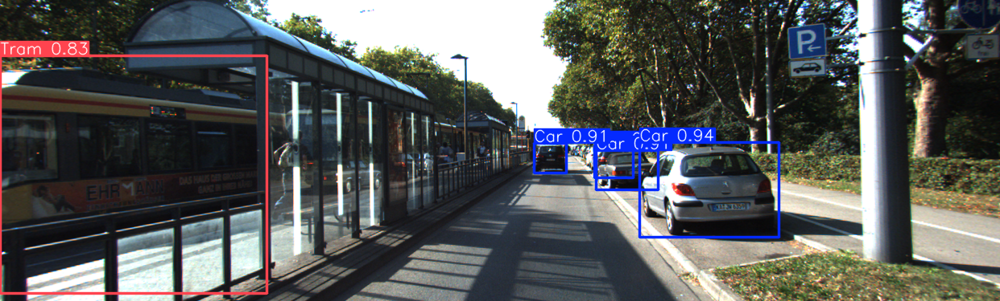

In [5]:
from ultralytics import YOLO

# Try loading and running inference with the trained model
model = YOLO("runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20/weights/best.pt")  # path to your trained model
results = model.predict("/workspace/000007.png")  # use any sample image
results[0].show()


In [9]:
import shutil

# Specify the folder path and the destination zip file path
folder_path = '/workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill'
zip_file_path = '/workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill.zip'

# Create a zip file from the folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

'/workspace/yolov8nbase_noeiouloss_KD_hyperpat20_distill.zip'

In [8]:
import shutil

# Specify the folder path and the destination zip file path
folder_path = 'runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20'
zip_file_path = 'runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20.zip'

# Create a zip file from the folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

'/workspace/yolo-distiller/runs/detect/yolov8nbase_noeiouloss_KD_hyperpat20.zip'